## Il Dataset

Il Dataset è composto da dati di scouting del Sevilla FC e dell'FC Bengaluru United e contiene i giocatori, le squadre e le prestazioni dell'avversario in termini di variabili fisiche, cinematiche, tecniche e tattiche.

Ogni riga del dataset corrisponde alla valutazione di un giocatore in una determinata partita insieme alle variabili relative al giocatore, alla partita, alla squadra e all'avversario e alla valutazione fornita da uno scout.

## Scopo

Prevedere la valutazione di un calciatore in una determinata partita in funzione ai dati fisici, contestuali, cinematici, tecnici e tattici del giocatore, della sua squadra e dell'avversario dell'FC Sevilla e dell'FC Bengaluru United.

L'obiettivo principale è sviluppare un algoritmo che preveda la valutazione effettuata dagli scout dei giocatori nel contesto di determinate partite.

In [1]:
# Importo Librerie
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_validate, cross_val_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_regression
from sklearn.exceptions import UndefinedMetricWarning
from imblearn.pipeline import Pipeline
from imblearn import FunctionSampler
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from tqdm import tqdm
import datetime
from warnings import filterwarnings
filterwarnings('ignore')
from lib import *

In [2]:
#warnings.filterwarnings('ignore', category=DeprecationWarning)
#warnings.filterwarnings('ignore', category=FutureWarning)
#warnings.filterwarnings('ignore', category=RuntimeWarning)
#warnings.filterwarnings('ignore', category=UserWarning)
#warnings.filterwarnings("ignore", category=sklearn.exceptions.UndefinedMetricWarning)

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', -1)

# Dataset

In [3]:
#Importo Dataset
train = pd.read_csv('train.csv')

In [4]:
train.head()

,row_id,scout_id,rating_num,winner,team,competitionId,player_position_1,player_position_2,player_height,player_weight,player_general_var_0,player_general_var_1,player_general_var_2,player_general_var_3,player_general_var_4,player_general_var_5,player_positional_raw_var_0,player_positional_raw_var_1,player_positional_raw_var_2,player_positional_raw_var_3,player_defensive_raw_var_4,player_defensive_raw_var_5,player_other_raw_var_6,player_offensive_raw_var_7,player_other_raw_var_8,player_other_raw_var_9,player_other_raw_var_10,player_offensive_raw_var_11,player_other_raw_var_12,player_other_raw_var_13,player_other_raw_var_14,player_positional_raw_var_15,player_positional_raw_var_16,player_positional_raw_var_17,player_other_raw_var_18,player_other_raw_var_19,player_other_raw_var_20,player_positional_raw_var_21,player_positional_raw_var_22,player_positional_raw_var_23,player_other_raw_var_24,player_other_raw_var_25,player_other_raw_var_26,player_other_raw_var_27,player_other_raw_var_28,player_other_raw_var_29,player_other_raw_var_30,player_offensive_raw_var_31,player_offensive_raw_var_32,player_other_raw_var_33,player_other_raw_var_34,player_other_raw_var_35,player_other_raw_var_36,player_other_raw_var_37,player_other_raw_var_38,player_other_raw_var_39,player_other_raw_var_40,player_other_raw_var_41,player_defensive_raw_var_42,player_defensive_raw_var_43,player_other_raw_var_44,player_other_raw_var_45,player_offensive_raw_var_46,player_other_raw_var_47,player_defensive_raw_var_48,player_offensive_raw_var_49,player_offensive_raw_var_50,player_other_raw_var_51,player_defensive_raw_var_52,player_offensive_raw_var_53,player_other_raw_var_54,player_positional_raw_var_55,player_other_raw_var_56,player_other_raw_var_57,player_other_raw_var_58,player_other_raw_var_59,player_offensive_raw_var_60,player_defensive_raw_var_61,player_defensive_raw_var_62,player_other_raw_var_63,player_other_raw_var_64,player_defensive_raw_var_65,player_defensive_raw_var_66,player_defensive_raw_var_67,player_other_raw_var_68,player_other_raw_var_69,player_defensive_raw_var_70,player_general_raw_var_71,player_general_raw_var_72,player_offensive_raw_var_73,player_defensive_raw_var_74,player_other_raw_var_75,player_other_raw_var_76,player_offensive_raw_var_77,player_general_raw_var_78,player_offensive_raw_var_79,player_other_raw_var_80,player_other_raw_var_81,player_other_raw_var_82,player_other_raw_var_83,player_other_raw_var_84,player_other_raw_var_85,player_positional_raw_var_86,player_offensive_raw_var_87,player_other_raw_var_88,player_other_raw_var_89,player_other_raw_var_90,player_other_raw_var_91,player_defensive_raw_var_92,player_defensive_raw_var_93,player_defensive_raw_var_94,player_defensive_raw_var_95,player_other_raw_var_96,player_defensive_raw_var_97,player_other_raw_var_98,player_other_raw_var_99,player_defensive_raw_var_100,player_other_raw_var_101,player_offensive_raw_var_102,player_other_raw_var_103,player_other_raw_var_104,player_offensive_raw_var_105,player_other_raw_var_106,player_other_raw_var_107,player_other_raw_var_108,player_other_raw_var_109,player_positional_raw_var_110,player_other_raw_var_111,player_other_raw_var_112,player_other_raw_var_113,player_general_raw_var_114,player_offensive_raw_var_115,player_offensive_raw_var_116,player_other_raw_var_117,player_other_raw_var_118,player_other_raw_var_119,player_offensive_raw_var_120,player_other_raw_var_121,player_offensive_raw_var_122,player_other_raw_var_123,player_other_raw_var_124,player_other_raw_var_125,player_offensive_raw_var_126,player_other_raw_var_127,player_other_raw_var_128,player_offensive_raw_var_129,player_offensive_raw_var_130,player_offensive_raw_var_131,player_other_raw_var_132,player_offensive_raw_var_133,player_other_raw_var_134,player_other_raw_var_135,player_other_raw_var_136,player_defensive_raw_var_137,player_offensive_raw_var_138,player_other_raw_var_139,player_other_raw_var_140,player_other_raw_var_141,player_other_raw_var_142,player_general_raw_var_143,player_othe

In [5]:
#Righe 20453, Colonne 800
train.shape

(20453, 800)

## Descrizione delle Features 

**row_id** - Unique identifier of a row

**scout_id** - Unique identifier of a scout

**winner (categorical)** - Player’s team result: winner, loser, or draw

**team (categorical)** - Team of the player: Team1 or Team2 

**team1_system_id** - Unique Id of Team 1

**team2_system_id** - Unique Id of Team 2

**competitionId** - Competition id of the match

**player_position_1** - Position 1 of a player in a match

**player_position_2** - Position 2 of a player in a match

**player_height** - Transformed height of a player

**player_weight** - Transformed weight of a player

**Player Encoded Variables** - Pre encoded variables of a player related to offensive, defensive, positional, physical, general, and other

**Team 1 Encoded Variables** - Pre encoded variables of Team 1 related to offensive, defensive and other 

**Team 2 Encoded Variables** - Pre encoded variables of Team 2 related to offensive, defensive and other 

**rating_num** - Rating of a player in a match given by a scout

## Data Types

In [6]:
train.dtypes

row_id                               int64  
scout_id                             int64  
rating_num                           float64
winner                               object 
team                                 object 
competitionId                        int64  
player_position_1                    float64
player_position_2                    float64
player_height                        float64
player_weight                        float64
player_general_var_0                 float64
player_general_var_1                 int64  
player_general_var_2                 float64
player_general_var_3                 float64
player_general_var_4                 float64
player_general_var_5                 float64
player_positional_raw_var_0          float64
player_positional_raw_var_1          float64
player_positional_raw_var_2          float64
player_positional_raw_var_3          float64
player_defensive_raw_var_4           float64
player_defensive_raw_var_5           float64
player_oth

In [7]:
#Controllo i valori nulli
missing_zero_values_table(train)

Your selected dataframe has 800 columns and 20453 Rows.
There are 788 columns that have missing values.


,Zero Values,Missing Values,% of Total Values,Total Zero Missing Values,% Total Zero Missing Values,Data Type
team2_other_raw_var_19,0,20453,100.0,20453,100.0,float64
team2_other_raw_var_40,0,20453,100.0,20453,100.0,float64
team2_other_ratio_var_33,0,20453,100.0,20453,100.0,float64
team2_other_ratio_var_32,0,20453,100.0,20453,100.0,float64
team2_other_raw_var_92,0,20453,100.0,20453,100.0,float64
team2_other_raw_var_82,0,20453,100.0,20453,100.0,float64
team1_other_raw_var_92,0,20453,100.0,20453,100.0,float64
team2_other_raw_var_72,0,20453,100.0,20453,100.0,float64
team1_other_raw_var_82,0,20453,100.0,20453,100.0,float64
team2_other_raw_var_51,0,20453,100.0,20453,100.0,float64


In [8]:
#Rimuovo le colonne con più del 60% di Missing Values e 100% ZV
drop_cols = [
    'team2_other_raw_var_19','team2_other_raw_var_40','team2_other_ratio_var_33','team2_other_ratio_var_32',
    'team2_other_raw_var_92','team2_other_raw_var_82','team1_other_raw_var_92','team2_other_raw_var_72',
    'team1_other_raw_var_82','team2_other_raw_var_51','team1_other_ratio_var_32','team2_other_raw_var_43',
    'team1_other_raw_var_72','team2_other_raw_var_50','team1_other_raw_var_38','team2_other_raw_var_33',
    'team1_other_raw_var_51','team1_other_raw_var_50','team1_other_raw_var_43','team1_other_raw_var_40',
    'team2_other_raw_var_38','team1_other_raw_var_33','team1_other_ratio_var_33','team1_other_raw_var_31',
    'team1_other_raw_var_19','team2_other_raw_var_31','player_other_ratio_var_26','player_other_ratio_var_27',
    'player_other_ratio_var_24','player_other_ratio_var_28','player_other_ratio_var_25','player_other_ratio_var_23',
    'player_positional_ratio_var_79','player_other_ratio_var_37','player_defensive_ratio_var_38',
    'player_defensive_ratio_var_39','player_offensive_ratio_var_70','player_offensive_ratio_var_68',
    'player_offensive_ratio_var_69','player_other_ratio_var_67','player_other_ratio_var_73',
    'player_offensive_ratio_var_77','player_other_ratio_var_36','player_defensive_ratio_var_16',
    'player_other_ratio_var_14','player_other_ratio_var_32','player_other_ratio_var_34','player_other_ratio_var_33',
    'player_offensive_ratio_var_72','player_positional_ratio_var_22','player_offensive_ratio_var_78',
    'player_offensive_ratio_var_13','player_other_ratio_var_66','player_offensive_ratio_var_40', 
    'player_offensive_ratio_var_19','player_offensive_ratio_var_57','player_other_ratio_var_7',
]
train.drop(drop_cols, axis = 1, inplace = True)

In [9]:
train.head()

,row_id,scout_id,rating_num,winner,team,competitionId,player_position_1,player_position_2,player_height,player_weight,player_general_var_0,player_general_var_1,player_general_var_2,player_general_var_3,player_general_var_4,player_general_var_5,player_positional_raw_var_0,player_positional_raw_var_1,player_positional_raw_var_2,player_positional_raw_var_3,player_defensive_raw_var_4,player_defensive_raw_var_5,player_other_raw_var_6,player_offensive_raw_var_7,player_other_raw_var_8,player_other_raw_var_9,player_other_raw_var_10,player_offensive_raw_var_11,player_other_raw_var_12,player_other_raw_var_13,player_other_raw_var_14,player_positional_raw_var_15,player_positional_raw_var_16,player_positional_raw_var_17,player_other_raw_var_18,player_other_raw_var_19,player_other_raw_var_20,player_positional_raw_var_21,player_positional_raw_var_22,player_positional_raw_var_23,player_other_raw_var_24,player_other_raw_var_25,player_other_raw_var_26,player_other_raw_var_27,player_other_raw_var_28,player_other_raw_var_29,player_other_raw_var_30,player_offensive_raw_var_31,player_offensive_raw_var_32,player_other_raw_var_33,player_other_raw_var_34,player_other_raw_var_35,player_other_raw_var_36,player_other_raw_var_37,player_other_raw_var_38,player_other_raw_var_39,player_other_raw_var_40,player_other_raw_var_41,player_defensive_raw_var_42,player_defensive_raw_var_43,player_other_raw_var_44,player_other_raw_var_45,player_offensive_raw_var_46,player_other_raw_var_47,player_defensive_raw_var_48,player_offensive_raw_var_49,player_offensive_raw_var_50,player_other_raw_var_51,player_defensive_raw_var_52,player_offensive_raw_var_53,player_other_raw_var_54,player_positional_raw_var_55,player_other_raw_var_56,player_other_raw_var_57,player_other_raw_var_58,player_other_raw_var_59,player_offensive_raw_var_60,player_defensive_raw_var_61,player_defensive_raw_var_62,player_other_raw_var_63,player_other_raw_var_64,player_defensive_raw_var_65,player_defensive_raw_var_66,player_defensive_raw_var_67,player_other_raw_var_68,player_other_raw_var_69,player_defensive_raw_var_70,player_general_raw_var_71,player_general_raw_var_72,player_offensive_raw_var_73,player_defensive_raw_var_74,player_other_raw_var_75,player_other_raw_var_76,player_offensive_raw_var_77,player_general_raw_var_78,player_offensive_raw_var_79,player_other_raw_var_80,player_other_raw_var_81,player_other_raw_var_82,player_other_raw_var_83,player_other_raw_var_84,player_other_raw_var_85,player_positional_raw_var_86,player_offensive_raw_var_87,player_other_raw_var_88,player_other_raw_var_89,player_other_raw_var_90,player_other_raw_var_91,player_defensive_raw_var_92,player_defensive_raw_var_93,player_defensive_raw_var_94,player_defensive_raw_var_95,player_other_raw_var_96,player_defensive_raw_var_97,player_other_raw_var_98,player_other_raw_var_99,player_defensive_raw_var_100,player_other_raw_var_101,player_offensive_raw_var_102,player_other_raw_var_103,player_other_raw_var_104,player_offensive_raw_var_105,player_other_raw_var_106,player_other_raw_var_107,player_other_raw_var_108,player_other_raw_var_109,player_positional_raw_var_110,player_other_raw_var_111,player_other_raw_var_112,player_other_raw_var_113,player_general_raw_var_114,player_offensive_raw_var_115,player_offensive_raw_var_116,player_other_raw_var_117,player_other_raw_var_118,player_other_raw_var_119,player_offensive_raw_var_120,player_other_raw_var_121,player_offensive_raw_var_122,player_other_raw_var_123,player_other_raw_var_124,player_other_raw_var_125,player_offensive_raw_var_126,player_other_raw_var_127,player_other_raw_var_128,player_offensive_raw_var_129,player_offensive_raw_var_130,player_offensive_raw_var_131,player_other_raw_var_132,player_offensive_raw_var_133,player_other_raw_var_134,player_other_raw_var_135,player_other_raw_var_136,player_defensive_raw_var_137,player_offensive_raw_var_138,player_other_raw_var_139,player_other_raw_var_140,player_other_raw_var_141,player_other_raw_var_142,player_general_raw_var_143,player_othe

In [10]:
train.shape

(20453, 743)

## Gestione NA

In [11]:
# drop columns with 100% of nan values
train = train.dropna(axis=1, how='any', thresh=1)

# select only numeric features
num_features = train.drop(columns='rating_num').select_dtypes(exclude='object').columns

# select only categorical features
cat_features = train.drop(columns='rating_num').select_dtypes(include='object').columns

# create simple imputer object for numerical values
imputed_numeric = SimpleImputer(missing_values = np.nan, strategy ='mean')

# create simple imputer object for categorical values
imputed_categoric = SimpleImputer(missing_values = np.nan, strategy ='most_frequent')

# replace nan values for mean values
train[num_features] = imputed_numeric.fit_transform(train[num_features])

# replace nan values for most common values
train[cat_features] = imputed_categoric.fit_transform(train[cat_features])

# check nan values
train.isna().sum().sort_values()

row_id                               0
team1_other_raw_var_63               0
team1_other_raw_var_64               0
team1_other_raw_var_65               0
team1_other_raw_var_66               0
team1_other_raw_var_67               0
team1_defensive_raw_var_68           0
team1_other_raw_var_69               0
team1_other_raw_var_70               0
team1_defensive_raw_var_71           0
team1_other_raw_var_73               0
team1_other_raw_var_74               0
team1_other_raw_var_75               0
team1_other_raw_var_76               0
team1_offensive_raw_var_77           0
team1_other_raw_var_78               0
team1_other_raw_var_79               0
team1_other_raw_var_80               0
team1_other_raw_var_81               0
team1_other_raw_var_83               0
team1_other_raw_var_62               0
team1_other_raw_var_84               0
team1_other_raw_var_61               0
team1_other_raw_var_59               0
team1_offensive_raw_var_35           0
team1_other_raw_var_36   

## Sommo le colonne con caratteristiche simili per ridurre il numero di colonne

In [12]:
player_off=[col for col in train.columns if ("raw" in col) and ("player" in col) and ("offensive" in col)]
player_def=[col for col in train.columns if ("raw" in col) and ("player" in col) and ("defensive" in col)]
player_pos=[col for col in train.columns if ("raw" in col) and ("player" in col) and ("positional" in col)]
player_phy=[col for col in train.columns if ("raw" in col) and ("player" in col) and ("physical" in col)]
player_gen=[col for col in train.columns if ("raw" in col) and ("player" in col) and ("general" in col)]
player_oth=[col for col in train.columns if ("raw" in col) and ("player" in col) and ("other" in col)]

player_offensive=train[player_off].agg("sum", axis=1)
player_defensive=train[player_def].agg("sum", axis=1)
player_positioning=train[player_pos].agg("sum", axis=1)
player_physical=train[player_phy].agg("sum", axis=1)
player_general=train[player_gen].agg("sum", axis=1)
player_other=train[player_oth].agg("sum", axis=1)

train = train.drop(player_off,axis=1)
train = train.drop(player_def,axis=1)
train = train.drop(player_pos,axis=1)
train = train.drop(player_phy,axis=1)
train = train.drop(player_gen,axis=1)
train = train.drop(player_oth,axis=1)

train['player_offensive'] = player_offensive
train['player_defensive'] = player_defensive
train['player_positioning'] = player_positioning
train['player_physical'] = player_physical
train['player_general'] = player_general
train['player_other'] = player_other

In [13]:
player_off_der=[col for col in train.columns if ("derived" in col) and ("player" in col) and ("offensive" in col)]
player_def_der=[col for col in train.columns if ("derived" in col) and ("player" in col) and ("defensive" in col)]
player_pos_der=[col for col in train.columns if ("derived" in col) and ("player" in col) and ("positional" in col)]
player_phy_der=[col for col in train.columns if ("derived" in col) and ("player" in col) and ("physical" in col)]
player_gen_der=[col for col in train.columns if ("derived" in col) and ("player" in col) and ("general" in col)]
player_oth_der=[col for col in train.columns if ("derived" in col) and ("player" in col) and ("other" in col)]

player_offensive_der=train[player_off_der].agg("sum", axis=1)
player_defensive_der=train[player_def_der].agg("sum", axis=1)
player_positioning_der=train[player_pos_der].agg("sum", axis=1)
player_physical_der=train[player_phy_der].agg("sum", axis=1)
player_general_der=train[player_gen_der].agg("sum", axis=1)
player_other_der=train[player_oth_der].agg("sum", axis=1)

train = train.drop(player_off_der,axis=1)
train = train.drop(player_def_der,axis=1)
train = train.drop(player_pos_der,axis=1)
train = train.drop(player_phy_der,axis=1)
train = train.drop(player_gen_der,axis=1)
train = train.drop(player_oth_der,axis=1)

train['player_offensive_der'] = player_offensive_der
train['player_defensive_der'] = player_defensive_der
train['player_positioning_der'] = player_positioning_der
train['player_physical_der'] = player_physical_der
train['player_general_der'] = player_general_der
train['player_other_der'] = player_other_der

In [14]:
player_off_rat=[col for col in train.columns if ("ratio" in col) and ("player" in col) and ("offensive" in col)]
player_def_rat=[col for col in train.columns if ("ratio" in col) and ("player" in col) and ("defensive" in col)]
player_pos_rat=[col for col in train.columns if ("ratio" in col) and ("player" in col) and ("positional" in col)]
player_phy_rat=[col for col in train.columns if ("ratio" in col) and ("player" in col) and ("physical" in col)]
player_gen_rat=[col for col in train.columns if ("ratio" in col) and ("player" in col) and ("general" in col)]
player_oth_rat=[col for col in train.columns if ("ratio" in col) and ("player" in col) and ("other" in col)]

player_offensive_rat=train[player_off_rat].agg("sum", axis=1)
player_defensive_rat=train[player_def_rat].agg("sum", axis=1)
player_positioning_rat=train[player_pos_rat].agg("sum", axis=1)
player_physical_rat=train[player_phy_rat].agg("sum", axis=1)
player_general_rat=train[player_gen_rat].agg("sum", axis=1)
player_other_rat=train[player_oth_rat].agg("sum", axis=1)

train = train.drop(player_off_rat,axis=1)
train = train.drop(player_def_rat,axis=1)
train = train.drop(player_pos_rat,axis=1)
train = train.drop(player_phy_rat,axis=1)
train = train.drop(player_gen_rat,axis=1)
train = train.drop(player_oth_rat,axis=1)

train['player_offensive_rat'] = player_offensive_rat
train['player_defensive_rat'] = player_defensive_rat
train['player_positioning_rat'] = player_positioning_rat
train['player_physical_rat'] = player_physical_rat
train['player_general_rat'] = player_general_rat
train['player_other_rat'] = player_other_rat

In [15]:
team1_off = [col for col in train.columns if ("raw" in col) and ("team1" in col) and ("offensive" in col)]
team1_def = [col for col in train.columns if ("raw" in col) and ("team1" in col) and ("defensive" in col)]
team1_oth = [col for col in train.columns if ("raw" in col) and ("team1" in col) and ("other" in col)]
team2_off = [col for col in train.columns if ("raw" in col) and ("team2" in col) and ("offensive" in col)]
team2_def = [col for col in train.columns if ("raw" in col) and ("team2" in col) and ("defensive" in col)]
team2_oth = [col for col in train.columns if ("raw" in col) and ("team2" in col) and ("other" in col)]

team1_offensive = train[team1_off].agg("sum", axis=1)
team1_defensive = train[team1_def].agg("sum", axis=1)
team1_other = train[team1_oth].agg("sum", axis=1)
team2_offensive = train[team2_off].agg("sum", axis=1)
team2_defensive = train[team2_def].agg("sum", axis=1)
team2_other = train[team2_oth].agg("sum", axis=1)

train = train.drop(team1_off,axis=1)
train = train.drop(team2_off,axis=1)
train = train.drop(team1_def,axis=1)
train = train.drop(team2_def,axis=1)
train = train.drop(team1_oth,axis=1)
train = train.drop(team2_oth,axis=1)

train['team1_offensive_raw'] = team1_offensive
train['team2_offensive_raw'] = team2_offensive
train['team1_defensive_raw'] = team1_defensive
train['team2_defensive_raw'] = team2_defensive
train['team1_other_raw'] = team1_other
train['team2_other_raw'] = team2_other

In [16]:
team1_off_der = [col for col in train.columns if ("derived" in col) and ("team1" in col) and ("offensive" in col)]
team1_def_der = [col for col in train.columns if ("derived" in col) and ("team1" in col) and ("defensive" in col)]
team1_oth_der = [col for col in train.columns if ("derived" in col) and ("team1" in col) and ("other" in col)]
team2_off_der = [col for col in train.columns if ("derived" in col) and ("team2" in col) and ("offensive" in col)]
team2_def_der = [col for col in train.columns if ("derived" in col) and ("team2" in col) and ("defensive" in col)]
team2_oth_der = [col for col in train.columns if ("derived" in col) and ("team2" in col) and ("other" in col)]

team1_offensive_der = train[team1_off_der].agg("sum", axis=1)
team1_defensive_der = train[team1_def_der].agg("sum", axis=1)
team1_other_der = train[team1_oth_der].agg("sum", axis=1)
team2_offensive_der = train[team2_off_der].agg("sum", axis=1)
team2_defensive_der = train[team2_def_der].agg("sum", axis=1)
team2_other_der = train[team2_oth_der].agg("sum", axis=1)

train = train.drop(team1_off_der,axis=1)
train = train.drop(team2_off_der,axis=1)
train = train.drop(team1_def_der,axis=1)
train = train.drop(team2_def_der,axis=1)
train = train.drop(team1_oth_der,axis=1)
train = train.drop(team2_oth_der,axis=1)

train['team1_offensive_der'] = team1_offensive_der
train['team2_offensive_der'] = team2_offensive_der
train['team1_defensive_der'] = team1_defensive_der
train['team2_defensive_der'] = team2_defensive_der
train['team1_other_der'] = team1_other_der
train['team2_other_der'] = team2_other_der

In [17]:
team1_off_rat = [col for col in train.columns if ("ratio" in col) and ("team1" in col) and ("offensive" in col)]
team1_def_rat = [col for col in train.columns if ("ratio" in col) and ("team1" in col) and ("defensive" in col)]
team1_oth_rat = [col for col in train.columns if ("ratio" in col) and ("team1" in col) and ("other" in col)]
team2_off_rat = [col for col in train.columns if ("ratio" in col) and ("team2" in col) and ("offensive" in col)]
team2_def_rat = [col for col in train.columns if ("ratio" in col) and ("team2" in col) and ("defensive" in col)]
team2_oth_rat = [col for col in train.columns if ("ratio" in col) and ("team2" in col) and ("other" in col)]

team1_offensive_rat = train[team1_off_rat].agg("sum", axis=1)
team1_defensive_rat = train[team1_def_rat].agg("sum", axis=1)
team1_other_rat = train[team1_oth_rat].agg("sum", axis=1)
team2_offensive_rat = train[team2_off_rat].agg("sum", axis=1)
team2_defensive_rat = train[team2_def_rat].agg("sum", axis=1)
team2_other_rat = train[team2_oth_rat].agg("sum", axis=1)

train = train.drop(team1_off_rat,axis=1)
train = train.drop(team2_off_rat,axis=1)
train = train.drop(team1_def_rat,axis=1)
train = train.drop(team2_def_rat,axis=1)
train = train.drop(team1_oth_rat,axis=1)
train = train.drop(team2_oth_rat,axis=1)

train['team1_offensive_rat'] = team1_offensive_rat
train['team2_offensive_rat'] = team2_offensive_rat
train['team1_defensive_rat'] = team1_defensive_rat
train['team2_defensive_rat'] = team2_defensive_rat
train['team1_other_rat'] = team1_other_rat
train['team2_other_rat'] = team2_other_rat

In [18]:
player_gen_var=[col for col in train.columns if ("general" in col) and ("player" in col) and ("var" in col)]
player_general_var = train[player_gen_var].agg("sum", axis=1)
train = train.drop(player_gen_var,axis=1)
train['player_general_var'] = player_general_var

In [19]:
train.shape

(20453, 49)

In [20]:
#Introduco una colonna che mi indica il cambiamento di posizione
cr=[]
for i in range(len(train)):
    if train.player_position_1[i]!= train.player_position_2[i]:
        cr.append(1)
    else:
        cr.append(0)
train['player_position_change'] = cr
train=train.drop(["player_position_2"], axis=1)

In [21]:
train.head(10)

,row_id,scout_id,rating_num,winner,team,competitionId,player_position_1,player_height,player_weight,team1_system_id,team2_system_id,player_offensive,player_defensive,player_positioning,player_physical,player_general,player_other,player_offensive_der,player_defensive_der,player_positioning_der,player_physical_der,player_general_der,player_other_der,player_offensive_rat,player_defensive_rat,player_positioning_rat,player_physical_rat,player_general_rat,player_other_rat,team1_offensive_raw,team2_offensive_raw,team1_defensive_raw,team2_defensive_raw,team1_other_raw,team2_other_raw,team1_offensive_der,team2_offensive_der,team1_defensive_der,team2_defensive_der,team1_other_der,team2_other_der,team1_offensive_rat,team2_offensive_rat,team1_defensive_rat,team2_defensive_rat,team1_other_rat,team2_other_rat,player_general_var,player_position_change
0,1.0,13.0,7.0,winner,team1,8.0,7.0,0.317073,0.48,6.000000,10.0,1.723513,1.028846,0.301879,4.302846,0.520777,10.255639,5.533116,2.962792,0.894033,18.593561,0.831693,7.753068,7.423096,2.045618,1.045000,0.0,0.0,11.688776,1.710550,1.116367,1.359365,1.581572,18.127247,14.386970,3.010477,2.174112,2.648434,2.402841,0.0,0.0,1.603153,1.075667,0.947896,0.531362,15.232580,14.062940,0.114754,0
1,3.0,16.0,6.5,loser,team2,8.0,3.0,0.463415,0.42,6.000000,17.0,0.437820,1.114261,0.097086,1.956401,0.503748,4.093913,1.837248,3.372686,0.226757,8.597242,0.435967,3.455399,6.748763,2.565540,0.825000,0.0,0.0,12.405439,2.788306,1.534231,1.597726,2.787460,18.597760,17.077406,3.663850,2.869784,3.155277,3.565965,0.0,0.0,1.986534,1.510857,1.082730,0.584760,16.286237,16.416109,0.081967,1
2,4.0,4.0,8.5,loser,team1,5.0,11.0,0.682927,0.44,8.000000,6.0,1.608788,1.618465,0.079657,4.761391,0.503748,8.408279,4.207726,5.095873,0.222561,20.362912,0.880215,7.916687,6.213401,5.114035,0.650000,0.0,0.0,11.586896,1.339692,2.551737,2.121841,1.193323,13.877470,18.540219,2.626326,3.914699,2.707661,2.313360,0.0,0.0,1.326249,1.959376,0.498676,0.858841,15.322671,16.451917,0.315574,0
3,5.0,13.0,8.0,loser,team2,4.0,17.0,0.682927,0.58,6.000000,8.0,1.594668,1.431373,0.004357,4.158148,1.569465,8.585520,5.388831,5.205894,0.272735,18.786196,1.339583,7.229465,5.981628,2.675238,1.035844,0.0,0.0,11.518785,1.826904,1.179076,1.398529,1.796558,17.488971,15.994007,3.410420,2.381307,2.761033,3.095918,0.0,0.0,2.034684,1.331507,0.889144,0.719741,15.800860,16.476143,0.000000,0
4,7.0,11.0,3.5,draw,team1,5.0,10.0,0.731707,0.70,12.000000,18.0,2.784951,3.148598,0.144063,4.097153,0.503748,7.267916,5.865047,4.722011,0.406988,21.709647,0.805576,8.868289,8.167812,1.923937,1.286000,0.0,0.0,11.681407,1.480862,1.551818,0.840903,1.607771,16.266273,18.457064,2.918609,3.180277,1.798832,2.584335,0.0,0.0,1.622327,1.682351,0.756370,0.674610,16.169354,17.585586,0.512295,0
5,8.0,11.0,3.5,draw,team1,5.0,10.0,0.731707,0.70,11.110207,18.0,2.784951,3.148598,0.144063,4.097153,0.503748,7.267916,5.865047,4.722011,0.406988,21.709647,0.805576,8.868289,8.167812,1.923937,1.286000,0.0,0.0,11.681407,1.561532,1.551818,1.672273,1.607771,17.858808,18.457064,2.867856,3.180277,2.511591,2.584335,0.0,0.0,1.611421,1.682351,0.845631,0.674610,16.382826,17.585586,0.512295,0
6,9.0,15.0,7.0,winner,team2,7.0,10.0,0.609756,0.46,6.000000,26.0,2.431850,2.640473,0.514270,3.795913,0.566248,9.156689,6.190920,6.780811,1.056986,20.523965,0.948532,8.961320,7.799829,4.839130,2.000000,0.0,0.0,13.060137,1.348250,1.963788,1.394604,1.251856,16.072235,18.276374,2.627189,3.607686,2.814615,2.477341,0.0,0.0,1.286789,1.840197,0.842189,0.813239,17.357019,16.325724,0.032787,0
7,10.0,4.0,7.5,loser,team1,7.0,3.0,0.243902,0.34,10.000000,8.0,2.501293,2.181198,0.805964,4.158148,0.503748,11.502872,5.993431,5.621938,0.924162,18.786196,0.870150,8.271091,7.306972,3.023734,1.341000,0.0,0.0,11.499690,1.612495,1.988065,2.067747,1.471518,21.295286,17.426101,3.161425,2.991948,3.216458,2.887867,0.0,0.0,1.594571,1.193777,0.900118,0.917034,16.711345,14.291604,0.221311,1
8,11.0,16.0,7.5,winner,team1,7.0,8.0,0.390244,0.22,6.000000,8.0,1.619291,2

## Features Numeriche e Categoriche

In [22]:
train_num = train.select_dtypes(exclude='object')

train_num.describe()

,row_id,scout_id,rating_num,competitionId,player_position_1,player_height,player_weight,team1_system_id,team2_system_id,player_offensive,player_defensive,player_positioning,player_physical,player_general,player_other,player_offensive_der,player_defensive_der,player_positioning_der,player_physical_der,player_general_der,player_other_der,player_offensive_rat,player_defensive_rat,player_positioning_rat,player_physical_rat,player_general_rat,player_other_rat,team1_offensive_raw,team2_offensive_raw,team1_defensive_raw,team2_defensive_raw,team1_other_raw,team2_other_raw,team1_offensive_der,team2_offensive_der,team1_defensive_der,team2_defensive_der,team1_other_der,team2_other_der,team1_offensive_rat,team2_offensive_rat,team1_defensive_rat,team2_defensive_rat,team1_other_rat,team2_other_rat,player_general_var,player_position_change
count,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.0,20453.0,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.0,20453.0,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000
mean,14257.557033,10.023566,6.887303,7.311837,7.609481,0.496925,0.455471,11.110207,11.135499,1.688698,1.957109,0.405356,4.158148,0.561090,8.653751,4.705742,4.360267,0.687174,18.786196,0.815304,7.513431,6.780874,2.680539,1.138324,0.0,0.0,12.051736,1.785179,1.656067,1.652951,1.697353,18.013585,17.544224,3.172157,2.999758,2.878126,2.904313,0.0,0.0,1.611421,1.509475,0.845631,0.824000,16.382826,16.234555,0.283508,0.072214
std,8353.543104,5.712044,1.852367,2.345699,5.050306,0.160761,0.140841,5.029808,5.097133,0.855224,0.775238,0.380595,0.880218,0.158016,2.520785,1.681941,0.958962,0.468811,3.900230,0.229371,1.608309,1.137580,0.997112,0.498110,0.0,0.0,1.230519,0.505948,0.470444,0.408954,0.442141,1.803602,1.732484,0.531422,0.509647,0.432603,0.467491,0.0,0.0,0.272742,0.262782,0.152202,0.149593,0.884877,0.900932,0.296736,0.258849
min,1.000000,1.000000,0.000000,4.000000,1.000000,0.024390,0.040000,4.000000,4.000000,0.000000,0.029412,0.000000,0.176334,0.333708,1.345850,0.084123,2.417618,0.000000,0.753333,0.000000,0.483632,1.621857,0.000000,0.024000,0.0,0.0,6.579829,0.532717,0.411326,0.612399,0.649011,11.861190,10.308362,1.374364,1.174618,1.446232,1.697840,0.0,0.0,0.555411,0.474018,0.305708,0.317917,13.158223,12.152505,0.000000,0.000000
25%,7048.000000,3.000000,6.000000,5.000000,3.000000,0.390244,0.340000,8.000000,7.000000,1.078768,1.376761,0.153050,4.046275,0.503748,7.116002,3.679271,3.687742,0.385078,18.786196,0.762027,7.019842,6.064905,1.997024,0.787000,0.0,0.0,11.229034,1.458019,1.342155,1.383825,1.379609,16.830676,16.471299,2.831633,2.662877,2.545485,2.566425,0.0,0.0,1.426262,1.342887,0.747573,0.728597,15.818922,15.701711,0.073770,0.000000
50%,14093.000000,12.000000,6.500000,7.000000,7.000000,0.512195,0.440000,10.000000,10.000000,1.595865,1.864030,0.302696,4.158148,0.520777,8.653751,4.801850,4.323192,0.597834,18.786196,0.851262,7.825262,6.830135,2.593754,1.082000,0.0,0.0,12.051736,1.709898,1.586156,1.598472,1.641417,18.013585,17.524831,3.152534,2.973683,2.858886,2.859288,0.0,0.0,1.611421,1.509475,0.845631,0.824000,16.382826,16.234555,0.180328,0.000000
75%,21381.000000,15.000000,8.000000,9.000000,11.000000,0.609756,0.540000,14.000000,14.000000,2.188306,2.422394,0.527233,4.555432,0.561090,10.239209,5.816703,4.949349,0.872297,20.715003,0.882889,8.482693,7.562621,3.326409,1.343000,0.0,0.0,12.885137,2.094865,1.931901,1.872273,1.962211,19.207187,18.616837,3.493424,3.342242,3.162790,3.192834,0.0,0.0,1.774093,1.675160,0.940865,0.915210,16.939026,16.835707,0.368852,0.000000
max,29227.000000,26.000000,10.000000,15.000000,23.000000,0.975610,

In [23]:
train_cat = train.select_dtypes(include='object')

train_cat.describe()

,winner,team
count,20453,20453
unique,3,2
top,winner,team1
freq,8735,10306


In [24]:
# OneHotEncoder per le colonne winner e team
enc = OneHotEncoder(handle_unknown='ignore')
enc_winner = pd.DataFrame(enc.fit_transform(train[['winner']]).toarray(), columns = ['draw','lose','win'])
data_win = train.join(enc_winner)
enc_team = pd.DataFrame(enc.fit_transform(train[['team']]).toarray(), columns = ['team1', 'team2'])
train = data_win.join(enc_team)

In [25]:
train.head(10)

,row_id,scout_id,rating_num,winner,team,competitionId,player_position_1,player_height,player_weight,team1_system_id,team2_system_id,player_offensive,player_defensive,player_positioning,player_physical,player_general,player_other,player_offensive_der,player_defensive_der,player_positioning_der,player_physical_der,player_general_der,player_other_der,player_offensive_rat,player_defensive_rat,player_positioning_rat,player_physical_rat,player_general_rat,player_other_rat,team1_offensive_raw,team2_offensive_raw,team1_defensive_raw,team2_defensive_raw,team1_other_raw,team2_other_raw,team1_offensive_der,team2_offensive_der,team1_defensive_der,team2_defensive_der,team1_other_der,team2_other_der,team1_offensive_rat,team2_offensive_rat,team1_defensive_rat,team2_defensive_rat,team1_other_rat,team2_other_rat,player_general_var,player_position_change,draw,lose,win,team1,team2
0,1.0,13.0,7.0,winner,team1,8.0,7.0,0.317073,0.48,6.000000,10.0,1.723513,1.028846,0.301879,4.302846,0.520777,10.255639,5.533116,2.962792,0.894033,18.593561,0.831693,7.753068,7.423096,2.045618,1.045000,0.0,0.0,11.688776,1.710550,1.116367,1.359365,1.581572,18.127247,14.386970,3.010477,2.174112,2.648434,2.402841,0.0,0.0,1.603153,1.075667,0.947896,0.531362,15.232580,14.062940,0.114754,0,0.0,0.0,1.0,1.0,0.0
1,3.0,16.0,6.5,loser,team2,8.0,3.0,0.463415,0.42,6.000000,17.0,0.437820,1.114261,0.097086,1.956401,0.503748,4.093913,1.837248,3.372686,0.226757,8.597242,0.435967,3.455399,6.748763,2.565540,0.825000,0.0,0.0,12.405439,2.788306,1.534231,1.597726,2.787460,18.597760,17.077406,3.663850,2.869784,3.155277,3.565965,0.0,0.0,1.986534,1.510857,1.082730,0.584760,16.286237,16.416109,0.081967,1,0.0,1.0,0.0,0.0,1.0
2,4.0,4.0,8.5,loser,team1,5.0,11.0,0.682927,0.44,8.000000,6.0,1.608788,1.618465,0.079657,4.761391,0.503748,8.408279,4.207726,5.095873,0.222561,20.362912,0.880215,7.916687,6.213401,5.114035,0.650000,0.0,0.0,11.586896,1.339692,2.551737,2.121841,1.193323,13.877470,18.540219,2.626326,3.914699,2.707661,2.313360,0.0,0.0,1.326249,1.959376,0.498676,0.858841,15.322671,16.451917,0.315574,0,0.0,1.0,0.0,1.0,0.0
3,5.0,13.0,8.0,loser,team2,4.0,17.0,0.682927,0.58,6.000000,8.0,1.594668,1.431373,0.004357,4.158148,1.569465,8.585520,5.388831,5.205894,0.272735,18.786196,1.339583,7.229465,5.981628,2.675238,1.035844,0.0,0.0,11.518785,1.826904,1.179076,1.398529,1.796558,17.488971,15.994007,3.410420,2.381307,2.761033,3.095918,0.0,0.0,2.034684,1.331507,0.889144,0.719741,15.800860,16.476143,0.000000,0,0.0,1.0,0.0,0.0,1.0
4,7.0,11.0,3.5,draw,team1,5.0,10.0,0.731707,0.70,12.000000,18.0,2.784951,3.148598,0.144063,4.097153,0.503748,7.267916,5.865047,4.722011,0.406988,21.709647,0.805576,8.868289,8.167812,1.923937,1.286000,0.0,0.0,11.681407,1.480862,1.551818,0.840903,1.607771,16.266273,18.457064,2.918609,3.180277,1.798832,2.584335,0.0,0.0,1.622327,1.682351,0.756370,0.674610,16.169354,17.585586,0.512295,0,1.0,0.0,0.0,1.0,0.0
5,8.0,11.0,3.5,draw,team1,5.0,10.0,0.731707,0.70,11.110207,18.0,2.784951,3.148598,0.144063,4.097153,0.503748,7.267916,5.865047,4.722011,0.406988,21.709647,0.805576,8.868289,8.167812,1.923937,1.286000,0.0,0.0,11.681407,1.561532,1.551818,1.672273,1.607771,17.858808,18.457064,2.867856,3.180277,2.511591,2.584335,0.0,0.0,1.611421,1.682351,0.845631,0.674610,16.382826,17.585586,0.512295,0,1.0,0.0,0.0,1.0,0.0
6,9.0,15.0,7.0,winner,team2,7.0,10.0,0.609756,0.46,6.000000,26.0,2.431850,2.640473,0.514270,3.795913,0.566248,9.156689,6.190920,6.780811,1.056986,20.523965,0.948532,8.961320,7.799829,4.839130,2.000000,0.0,0.0,13.060137,1.348250,1.963788,1.394604,1.251856,16.072235,18.276374,2.627189,3.607686,2.814615,2.477341,0.0,0.0,1.286789,1.840197,0.842189,0.813239,17.357019,16.325724,0.032787,0,0.0,0.0,1.0,0.0,1.0
7,10.0,4.0,7.5,loser,team1,7.0,3.0,0.243902,0.34,10.000000,8.0,2.501293,2.181198,0.805964,4.158148,0.503748,11.502872,5.993431,5.621938,0.924162,18.786196,0.870150,8.271091,7.306972,3.023734,1.341000,0.0,0.0,11.499690,1.612495,1.988065,2.067747,1.471518,21.295286,17.426101,3.161425,2.991948,3

In [26]:
#Rimuovo le colonne che non mi servono e definisco la colonna target
y = train['rating_num']
X = train.drop(['row_id','rating_num','scout_id','team1_system_id','team2_system_id','competitionId','winner','team'], axis = 1)

In [27]:
X.shape

(20453, 46)

In [28]:
X.head(10)

,player_position_1,player_height,player_weight,player_offensive,player_defensive,player_positioning,player_physical,player_general,player_other,player_offensive_der,player_defensive_der,player_positioning_der,player_physical_der,player_general_der,player_other_der,player_offensive_rat,player_defensive_rat,player_positioning_rat,player_physical_rat,player_general_rat,player_other_rat,team1_offensive_raw,team2_offensive_raw,team1_defensive_raw,team2_defensive_raw,team1_other_raw,team2_other_raw,team1_offensive_der,team2_offensive_der,team1_defensive_der,team2_defensive_der,team1_other_der,team2_other_der,team1_offensive_rat,team2_offensive_rat,team1_defensive_rat,team2_defensive_rat,team1_other_rat,team2_other_rat,player_general_var,player_position_change,draw,lose,win,team1,team2
0,7.0,0.317073,0.48,1.723513,1.028846,0.301879,4.302846,0.520777,10.255639,5.533116,2.962792,0.894033,18.593561,0.831693,7.753068,7.423096,2.045618,1.045000,0.0,0.0,11.688776,1.710550,1.116367,1.359365,1.581572,18.127247,14.386970,3.010477,2.174112,2.648434,2.402841,0.0,0.0,1.603153,1.075667,0.947896,0.531362,15.232580,14.062940,0.114754,0,0.0,0.0,1.0,1.0,0.0
1,3.0,0.463415,0.42,0.437820,1.114261,0.097086,1.956401,0.503748,4.093913,1.837248,3.372686,0.226757,8.597242,0.435967,3.455399,6.748763,2.565540,0.825000,0.0,0.0,12.405439,2.788306,1.534231,1.597726,2.787460,18.597760,17.077406,3.663850,2.869784,3.155277,3.565965,0.0,0.0,1.986534,1.510857,1.082730,0.584760,16.286237,16.416109,0.081967,1,0.0,1.0,0.0,0.0,1.0
2,11.0,0.682927,0.44,1.608788,1.618465,0.079657,4.761391,0.503748,8.408279,4.207726,5.095873,0.222561,20.362912,0.880215,7.916687,6.213401,5.114035,0.650000,0.0,0.0,11.586896,1.339692,2.551737,2.121841,1.193323,13.877470,18.540219,2.626326,3.914699,2.707661,2.313360,0.0,0.0,1.326249,1.959376,0.498676,0.858841,15.322671,16.451917,0.315574,0,0.0,1.0,0.0,1.0,0.0
3,17.0,0.682927,0.58,1.594668,1.431373,0.004357,4.158148,1.569465,8.585520,5.388831,5.205894,0.272735,18.786196,1.339583,7.229465,5.981628,2.675238,1.035844,0.0,0.0,11.518785,1.826904,1.179076,1.398529,1.796558,17.488971,15.994007,3.410420,2.381307,2.761033,3.095918,0.0,0.0,2.034684,1.331507,0.889144,0.719741,15.800860,16.476143,0.000000,0,0.0,1.0,0.0,0.0,1.0
4,10.0,0.731707,0.70,2.784951,3.148598,0.144063,4.097153,0.503748,7.267916,5.865047,4.722011,0.406988,21.709647,0.805576,8.868289,8.167812,1.923937,1.286000,0.0,0.0,11.681407,1.480862,1.551818,0.840903,1.607771,16.266273,18.457064,2.918609,3.180277,1.798832,2.584335,0.0,0.0,1.622327,1.682351,0.756370,0.674610,16.169354,17.585586,0.512295,0,1.0,0.0,0.0,1.0,0.0
5,10.0,0.731707,0.70,2.784951,3.148598,0.144063,4.097153,0.503748,7.267916,5.865047,4.722011,0.406988,21.709647,0.805576,8.868289,8.167812,1.923937,1.286000,0.0,0.0,11.681407,1.561532,1.551818,1.672273,1.607771,17.858808,18.457064,2.867856,3.180277,2.511591,2.584335,0.0,0.0,1.611421,1.682351,0.845631,0.674610,16.382826,17.585586,0.512295,0,1.0,0.0,0.0,1.0,0.0
6,10.0,0.609756,0.46,2.431850,2.640473,0.514270,3.795913,0.566248,9.156689,6.190920,6.780811,1.056986,20.523965,0.948532,8.961320,7.799829,4.839130,2.000000,0.0,0.0,13.060137,1.348250,1.963788,1.394604,1.251856,16.072235,18.276374,2.627189,3.607686,2.814615,2.477341,0.0,0.0,1.286789,1.840197,0.842189,0.813239,17.357019,16.325724,0.032787,0,0.0,0.0,1.0,0.0,1.0
7,3.0,0.243902,0.34,2.501293,2.181198,0.805964,4.158148,0.503748,11.502872,5.993431,5.621938,0.924162,18.786196,0.870150,8.271091,7.306972,3.023734,1.341000,0.0,0.0,11.499690,1.612495,1.988065,2.067747,1.471518,21.295286,17.426101,3.161425,2.991948,3.216458,2.887867,0.0,0.0,1.594571,1.193777,0.900118,0.917034,16.711345,14.291604,0.221311,1,0.0,1.0,0.0,1.0,0.0
8,8.0,0.390244,0.22,1.619291,2.425825,0.202614,4.158148,0.520777,10.403680,4.805765,4.646134,0.463632,18.786196,0.851918,7.333406,5.686667,4.431024,0.056000,0.0,0.0,14.273324,1.103408,1.270799,1.106148,1.218397,16.188421,18.050372,2.559553,2.868026,2.458505,2.676469,0.0,0.0,1.413512,1.478579,1.080671,1.075934,16.62

In [29]:
X.describe()

,player_position_1,player_height,player_weight,player_offensive,player_defensive,player_positioning,player_physical,player_general,player_other,player_offensive_der,player_defensive_der,player_positioning_der,player_physical_der,player_general_der,player_other_der,player_offensive_rat,player_defensive_rat,player_positioning_rat,player_physical_rat,player_general_rat,player_other_rat,team1_offensive_raw,team2_offensive_raw,team1_defensive_raw,team2_defensive_raw,team1_other_raw,team2_other_raw,team1_offensive_der,team2_offensive_der,team1_defensive_der,team2_defensive_der,team1_other_der,team2_other_der,team1_offensive_rat,team2_offensive_rat,team1_defensive_rat,team2_defensive_rat,team1_other_rat,team2_other_rat,player_general_var,player_position_change,draw,lose,win,team1,team2
count,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.0,20453.0,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.0,20453.0,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000,20453.000000
mean,7.609481,0.496925,0.455471,1.688698,1.957109,0.405356,4.158148,0.561090,8.653751,4.705742,4.360267,0.687174,18.786196,0.815304,7.513431,6.780874,2.680539,1.138324,0.0,0.0,12.051736,1.785179,1.656067,1.652951,1.697353,18.013585,17.544224,3.172157,2.999758,2.878126,2.904313,0.0,0.0,1.611421,1.509475,0.845631,0.824000,16.382826,16.234555,0.283508,0.072214,0.257957,0.314966,0.427077,0.503887,0.496113
std,5.050306,0.160761,0.140841,0.855224,0.775238,0.380595,0.880218,0.158016,2.520785,1.681941,0.958962,0.468811,3.900230,0.229371,1.608309,1.137580,0.997112,0.498110,0.0,0.0,1.230519,0.505948,0.470444,0.408954,0.442141,1.803602,1.732484,0.531422,0.509647,0.432603,0.467491,0.0,0.0,0.272742,0.262782,0.152202,0.149593,0.884877,0.900932,0.296736,0.258849,0.437521,0.464514,0.494666,0.499997,0.499997
min,1.000000,0.024390,0.040000,0.000000,0.029412,0.000000,0.176334,0.333708,1.345850,0.084123,2.417618,0.000000,0.753333,0.000000,0.483632,1.621857,0.000000,0.024000,0.0,0.0,6.579829,0.532717,0.411326,0.612399,0.649011,11.861190,10.308362,1.374364,1.174618,1.446232,1.697840,0.0,0.0,0.555411,0.474018,0.305708,0.317917,13.158223,12.152505,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,0.390244,0.340000,1.078768,1.376761,0.153050,4.046275,0.503748,7.116002,3.679271,3.687742,0.385078,18.786196,0.762027,7.019842,6.064905,1.997024,0.787000,0.0,0.0,11.229034,1.458019,1.342155,1.383825,1.379609,16.830676,16.471299,2.831633,2.662877,2.545485,2.566425,0.0,0.0,1.426262,1.342887,0.747573,0.728597,15.818922,15.701711,0.073770,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,7.000000,0.512195,0.440000,1.595865,1.864030,0.302696,4.158148,0.520777,8.653751,4.801850,4.323192,0.597834,18.786196,0.851262,7.825262,6.830135,2.593754,1.082000,0.0,0.0,12.051736,1.709898,1.586156,1.598472,1.641417,18.013585,17.524831,3.152534,2.973683,2.858886,2.859288,0.0,0.0,1.611421,1.509475,0.845631,0.824000,16.382826,16.234555,0.180328,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,11.000000,0.609756,0.540000,2.188306,2.422394,0.527233,4.555432,0.561090,10.239209,5.816703,4.949349,0.872297,20.715003,0.882889,8.482693,7.562621,3.326409,1.343000,0.0,0.0,12.885137,2.094865,1.931901,1.872273,1.962211,19.207187,18.616837,3.493424,3.342242,3.162790,3.192834,0.0,0.0,1.774093,1.675160,0.940865,0.915210,16.939026,16.835707,0.368852,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,23.000000,0.975610,1.000000,6.802215,6.107358,3.729847,7.160048,2.772426,20.568035,15.134320,13.804984,7.436754,34.120293,2.211720,11.389468,11.002068,6.497064,4.000000,0.0,0.0,17.171982,4.119410,3.94206

In [30]:
y

0        7.0 
1        6.5 
2        8.5 
3        8.0 
4        3.5 
5        3.5 
6        7.0 
7        7.5 
8        7.5 
9        6.5 
10       8.0 
11       10.0
12       7.5 
13       7.5 
14       7.0 
15       10.0
16       10.0
17       7.5 
18       6.5 
19       6.5 
20       6.5 
21       6.5 
22       7.0 
23       6.0 
24       6.5 
25       10.0
26       9.0 
27       7.0 
28       7.0 
29       6.0 
30       6.5 
31       2.0 
32       2.0 
33       10.0
34       8.0 
35       8.0 
36       7.0 
37       7.0 
38       6.5 
39       8.5 
40       3.5 
41       10.0
42       8.0 
43       7.0 
44       6.5 
45       6.5 
46       7.0 
47       7.0 
48       7.5 
49       7.0 
50       6.5 
51       7.5 
52       7.5 
53       7.0 
54       8.5 
55       0.0 
56       0.0 
57       9.0 
58       3.5 
59       7.0 
60       8.0 
61       7.0 
62       7.0 
63       8.0 
64       8.5 
65       8.5 
66       9.0 
67       7.5 
68       3.5 
69       7.5 
70       6.5 
71    

In [31]:
y.value_counts()

6.0     3654
6.5     3247
7.5     3206
10.0    2442
5.0     2244
7.0     1248
3.5     1077
8.5     1062
9.0     1023
8.0     873 
0.0     218 
3.0     110 
2.0     49  
Name: rating_num, dtype: int64

# Analisi

## CatBoostRegressor

In [43]:
preprocessing_step = [
    #('ohec1', OneHotEncoderColumn('winner')),
    #('ohec2', OneHotEncoderColumn('team')),
    # ('remove_n_lines', FunctionSampler(func=remove_n_line, kw_args={'n': 5})),
    # ('abs', AbsValue())
    # ('log', LogValue()),
    #('minmax_dt', min_max_scaler_dt(X)),
    #('fs', SelectKBest(chi2, k=2))
    #('fs',  SelectKBest(f_regression))
]

pipe_catboost_01 = Pipeline(preprocessing_step + [('cb', CatBoostRegressor())], verbose = False)
    
pipelines = {
    'pipe_cb': pipe_catboost_01,
}

# https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter
metrics = [
    'neg_root_mean_squared_error',
    'r2'
]

params = {
    'pipe_cb': {
        #'fs__k': [5],
        'cb__depth': [6, 8, 10],
        'cb__learning_rate' : [0.01, 0.05, 0.1],
        'cb__iterations'    : [30, 50, 100]
    }
}

judge = Judge()
judge.set_data(X, y)
judge.set_algorithms(pipelines)
judge.set_metrics(metrics)
judge.set_params(params)
judge.get_table()

0:	learn: 1.8348243	total: 12.8ms	remaining: 373ms
1:	learn: 1.8334478	total: 17.9ms	remaining: 251ms
2:	learn: 1.8320730	total: 23.5ms	remaining: 212ms
3:	learn: 1.8308449	total: 28ms	remaining: 182ms
4:	learn: 1.8295924	total: 32.7ms	remaining: 163ms
5:	learn: 1.8281881	total: 36.9ms	remaining: 148ms
6:	learn: 1.8268127	total: 41.2ms	remaining: 135ms
7:	learn: 1.8254306	total: 45.5ms	remaining: 125ms
8:	learn: 1.8242205	total: 50.1ms	remaining: 117ms
9:	learn: 1.8228299	total: 54.2ms	remaining: 108ms
10:	learn: 1.8214718	total: 58.9ms	remaining: 102ms
11:	learn: 1.8201795	total: 62.9ms	remaining: 94.4ms
12:	learn: 1.8189263	total: 67.1ms	remaining: 87.7ms
13:	learn: 1.8177188	total: 71.3ms	remaining: 81.5ms
14:	learn: 1.8165807	total: 75.5ms	remaining: 75.5ms
15:	learn: 1.8153261	total: 79.6ms	remaining: 69.7ms
16:	learn: 1.8141110	total: 84.1ms	remaining: 64.3ms
17:	learn: 1.8129736	total: 88.2ms	remaining: 58.8ms
18:	learn: 1.8119251	total: 92.3ms	remaining: 53.4ms
19:	learn: 1.810

12:	learn: 1.7733518	total: 64.6ms	remaining: 84.5ms
13:	learn: 1.7702207	total: 68.9ms	remaining: 78.8ms
14:	learn: 1.7678206	total: 73.2ms	remaining: 73.2ms
15:	learn: 1.7648799	total: 77.7ms	remaining: 68ms
16:	learn: 1.7622826	total: 82.2ms	remaining: 62.8ms
17:	learn: 1.7602678	total: 104ms	remaining: 69.4ms
18:	learn: 1.7578137	total: 109ms	remaining: 63.3ms
19:	learn: 1.7555023	total: 114ms	remaining: 57ms
20:	learn: 1.7537237	total: 119ms	remaining: 51ms
21:	learn: 1.7515193	total: 124ms	remaining: 45.2ms
22:	learn: 1.7497099	total: 129ms	remaining: 39.3ms
23:	learn: 1.7474340	total: 135ms	remaining: 33.7ms
24:	learn: 1.7458406	total: 139ms	remaining: 27.9ms
25:	learn: 1.7444426	total: 144ms	remaining: 22.2ms
26:	learn: 1.7429680	total: 150ms	remaining: 16.6ms
27:	learn: 1.7417210	total: 154ms	remaining: 11ms
28:	learn: 1.7402662	total: 158ms	remaining: 5.45ms
29:	learn: 1.7389007	total: 163ms	remaining: 0us
0:	learn: 1.8064512	total: 4.29ms	remaining: 124ms
1:	learn: 1.8004796

24:	learn: 1.7039218	total: 97.6ms	remaining: 19.5ms
25:	learn: 1.7025026	total: 101ms	remaining: 15.6ms
26:	learn: 1.7013489	total: 105ms	remaining: 11.7ms
27:	learn: 1.6998954	total: 109ms	remaining: 7.82ms
28:	learn: 1.6985224	total: 114ms	remaining: 3.93ms
29:	learn: 1.6968858	total: 118ms	remaining: 0us
0:	learn: 1.8057236	total: 7.15ms	remaining: 207ms
1:	learn: 1.7938457	total: 11ms	remaining: 153ms
2:	learn: 1.7839704	total: 14.9ms	remaining: 134ms
3:	learn: 1.7759093	total: 19.1ms	remaining: 124ms
4:	learn: 1.7681657	total: 22.9ms	remaining: 115ms
5:	learn: 1.7607457	total: 26.5ms	remaining: 106ms
6:	learn: 1.7555190	total: 30.5ms	remaining: 100ms
7:	learn: 1.7498899	total: 34.8ms	remaining: 95.6ms
8:	learn: 1.7445733	total: 38.6ms	remaining: 90.1ms
9:	learn: 1.7404678	total: 42.3ms	remaining: 84.5ms
10:	learn: 1.7363567	total: 46.4ms	remaining: 80.1ms
11:	learn: 1.7324391	total: 50.5ms	remaining: 75.8ms
12:	learn: 1.7297554	total: 54.6ms	remaining: 71.4ms
13:	learn: 1.7267862

34:	learn: 1.7769780	total: 140ms	remaining: 60.1ms
35:	learn: 1.7761151	total: 144ms	remaining: 56ms
36:	learn: 1.7753795	total: 148ms	remaining: 51.9ms
37:	learn: 1.7746438	total: 152ms	remaining: 48ms
38:	learn: 1.7738561	total: 156ms	remaining: 44.1ms
39:	learn: 1.7730663	total: 160ms	remaining: 40.1ms
40:	learn: 1.7722546	total: 165ms	remaining: 36.2ms
41:	learn: 1.7714980	total: 169ms	remaining: 32.2ms
42:	learn: 1.7707145	total: 173ms	remaining: 28.2ms
43:	learn: 1.7699763	total: 177ms	remaining: 24.1ms
44:	learn: 1.7692661	total: 181ms	remaining: 20.1ms
45:	learn: 1.7685596	total: 186ms	remaining: 16.1ms
46:	learn: 1.7678073	total: 189ms	remaining: 12.1ms
47:	learn: 1.7671203	total: 193ms	remaining: 8.05ms
48:	learn: 1.7664181	total: 197ms	remaining: 4.02ms
49:	learn: 1.7656918	total: 201ms	remaining: 0us
0:	learn: 1.8177020	total: 47.8ms	remaining: 2.34s
1:	learn: 1.8162889	total: 52.9ms	remaining: 1.27s
2:	learn: 1.8149098	total: 57.8ms	remaining: 905ms
3:	learn: 1.8137076	to

46:	learn: 1.8672820	total: 213ms	remaining: 13.6ms
47:	learn: 1.8665076	total: 218ms	remaining: 9.07ms
48:	learn: 1.8658358	total: 223ms	remaining: 4.54ms
49:	learn: 1.8650950	total: 227ms	remaining: 0us
0:	learn: 1.8292940	total: 20.8ms	remaining: 1.02s
1:	learn: 1.8229012	total: 24.9ms	remaining: 598ms
2:	learn: 1.8169348	total: 28.9ms	remaining: 453ms
3:	learn: 1.8117791	total: 33.7ms	remaining: 388ms
4:	learn: 1.8066873	total: 37.5ms	remaining: 337ms
5:	learn: 1.8012951	total: 41.3ms	remaining: 303ms
6:	learn: 1.7966595	total: 45.4ms	remaining: 279ms
7:	learn: 1.7922224	total: 49.7ms	remaining: 261ms
8:	learn: 1.7882435	total: 53.7ms	remaining: 245ms
9:	learn: 1.7839297	total: 57.2ms	remaining: 229ms
10:	learn: 1.7803729	total: 61.4ms	remaining: 218ms
11:	learn: 1.7767009	total: 65.2ms	remaining: 207ms
12:	learn: 1.7733518	total: 69.1ms	remaining: 197ms
13:	learn: 1.7702207	total: 73.1ms	remaining: 188ms
14:	learn: 1.7678206	total: 77.5ms	remaining: 181ms
15:	learn: 1.7648799	tota

22:	learn: 1.7845544	total: 121ms	remaining: 142ms
23:	learn: 1.7830222	total: 125ms	remaining: 135ms
24:	learn: 1.7815358	total: 129ms	remaining: 129ms
25:	learn: 1.7802934	total: 134ms	remaining: 123ms
26:	learn: 1.7790910	total: 138ms	remaining: 117ms
27:	learn: 1.7778064	total: 141ms	remaining: 111ms
28:	learn: 1.7764327	total: 146ms	remaining: 105ms
29:	learn: 1.7752020	total: 149ms	remaining: 99.4ms
30:	learn: 1.7739202	total: 153ms	remaining: 93.7ms
31:	learn: 1.7724392	total: 157ms	remaining: 88.1ms
32:	learn: 1.7712289	total: 160ms	remaining: 82.7ms
33:	learn: 1.7699095	total: 164ms	remaining: 77.2ms
34:	learn: 1.7685605	total: 168ms	remaining: 71.9ms
35:	learn: 1.7673403	total: 172ms	remaining: 66.9ms
36:	learn: 1.7663271	total: 176ms	remaining: 61.8ms
37:	learn: 1.7650093	total: 180ms	remaining: 56.7ms
38:	learn: 1.7639586	total: 183ms	remaining: 51.7ms
39:	learn: 1.7630551	total: 187ms	remaining: 46.7ms
40:	learn: 1.7614379	total: 191ms	remaining: 41.9ms
41:	learn: 1.760442

47:	learn: 1.6710625	total: 218ms	remaining: 9.1ms
48:	learn: 1.6699609	total: 223ms	remaining: 4.55ms
49:	learn: 1.6691386	total: 228ms	remaining: 0us
0:	learn: 1.8057236	total: 26.3ms	remaining: 1.29s
1:	learn: 1.7938457	total: 30.9ms	remaining: 741ms
2:	learn: 1.7839704	total: 35.6ms	remaining: 558ms
3:	learn: 1.7759093	total: 40ms	remaining: 459ms
4:	learn: 1.7681657	total: 44.5ms	remaining: 400ms
5:	learn: 1.7607457	total: 48.9ms	remaining: 359ms
6:	learn: 1.7555190	total: 53.8ms	remaining: 331ms
7:	learn: 1.7498899	total: 58.6ms	remaining: 307ms
8:	learn: 1.7445733	total: 62.9ms	remaining: 287ms
9:	learn: 1.7404678	total: 68.1ms	remaining: 272ms
10:	learn: 1.7363567	total: 73.2ms	remaining: 260ms
11:	learn: 1.7324391	total: 77.7ms	remaining: 246ms
12:	learn: 1.7297554	total: 82ms	remaining: 233ms
13:	learn: 1.7267862	total: 86.8ms	remaining: 223ms
14:	learn: 1.7242086	total: 90.8ms	remaining: 212ms
15:	learn: 1.7213978	total: 95.1ms	remaining: 202ms
16:	learn: 1.7192802	total: 99

39:	learn: 1.7918943	total: 209ms	remaining: 313ms
40:	learn: 1.7909846	total: 214ms	remaining: 308ms
41:	learn: 1.7901768	total: 219ms	remaining: 303ms
42:	learn: 1.7894482	total: 225ms	remaining: 298ms
43:	learn: 1.7887502	total: 230ms	remaining: 292ms
44:	learn: 1.7879902	total: 235ms	remaining: 287ms
45:	learn: 1.7871958	total: 240ms	remaining: 281ms
46:	learn: 1.7864756	total: 245ms	remaining: 276ms
47:	learn: 1.7857169	total: 250ms	remaining: 271ms
48:	learn: 1.7849986	total: 255ms	remaining: 265ms
49:	learn: 1.7842033	total: 260ms	remaining: 260ms
50:	learn: 1.7834672	total: 264ms	remaining: 254ms
51:	learn: 1.7828212	total: 269ms	remaining: 249ms
52:	learn: 1.7821367	total: 275ms	remaining: 243ms
53:	learn: 1.7814356	total: 279ms	remaining: 238ms
54:	learn: 1.7807071	total: 285ms	remaining: 233ms
55:	learn: 1.7800138	total: 289ms	remaining: 227ms
56:	learn: 1.7793228	total: 294ms	remaining: 222ms
57:	learn: 1.7786287	total: 299ms	remaining: 217ms
58:	learn: 1.7779592	total: 304

7:	learn: 1.8084888	total: 53.9ms	remaining: 620ms
8:	learn: 1.8072503	total: 58.5ms	remaining: 591ms
9:	learn: 1.8060773	total: 62.9ms	remaining: 566ms
10:	learn: 1.8047948	total: 67.8ms	remaining: 549ms
11:	learn: 1.8034679	total: 72ms	remaining: 528ms
12:	learn: 1.8022789	total: 76.2ms	remaining: 510ms
13:	learn: 1.8011110	total: 80.3ms	remaining: 493ms
14:	learn: 1.8000323	total: 84.5ms	remaining: 479ms
15:	learn: 1.7988649	total: 88.6ms	remaining: 465ms
16:	learn: 1.7976115	total: 93ms	remaining: 454ms
17:	learn: 1.7965077	total: 97.2ms	remaining: 443ms
18:	learn: 1.7955129	total: 101ms	remaining: 433ms
19:	learn: 1.7943760	total: 106ms	remaining: 423ms
20:	learn: 1.7933221	total: 110ms	remaining: 413ms
21:	learn: 1.7922118	total: 114ms	remaining: 403ms
22:	learn: 1.7912514	total: 118ms	remaining: 394ms
23:	learn: 1.7901880	total: 122ms	remaining: 386ms
24:	learn: 1.7892028	total: 126ms	remaining: 379ms
25:	learn: 1.7881479	total: 130ms	remaining: 371ms
26:	learn: 1.7871859	total:

98:	learn: 1.7904373	total: 459ms	remaining: 4.63ms
99:	learn: 1.7899734	total: 464ms	remaining: 0us
0:	learn: 1.9118792	total: 19ms	remaining: 1.88s
1:	learn: 1.9104820	total: 23ms	remaining: 1.12s
2:	learn: 1.9092659	total: 27ms	remaining: 872ms
3:	learn: 1.9080705	total: 31.1ms	remaining: 747ms
4:	learn: 1.9067164	total: 35.2ms	remaining: 669ms
5:	learn: 1.9054049	total: 39.3ms	remaining: 616ms
6:	learn: 1.9041846	total: 43.2ms	remaining: 575ms
7:	learn: 1.9029816	total: 47.5ms	remaining: 546ms
8:	learn: 1.9018690	total: 51.4ms	remaining: 520ms
9:	learn: 1.9006728	total: 55.4ms	remaining: 498ms
10:	learn: 1.8994183	total: 59.3ms	remaining: 480ms
11:	learn: 1.8982483	total: 63.2ms	remaining: 464ms
12:	learn: 1.8970589	total: 67.2ms	remaining: 450ms
13:	learn: 1.8959304	total: 71.3ms	remaining: 438ms
14:	learn: 1.8949864	total: 75.5ms	remaining: 428ms
15:	learn: 1.8939449	total: 79.6ms	remaining: 418ms
16:	learn: 1.8928168	total: 83.8ms	remaining: 409ms
17:	learn: 1.8918024	total: 87.

82:	learn: 1.6881661	total: 386ms	remaining: 79ms
83:	learn: 1.6873864	total: 391ms	remaining: 74.5ms
84:	learn: 1.6869575	total: 396ms	remaining: 69.9ms
85:	learn: 1.6863745	total: 401ms	remaining: 65.3ms
86:	learn: 1.6857015	total: 406ms	remaining: 60.6ms
87:	learn: 1.6851977	total: 411ms	remaining: 56.1ms
88:	learn: 1.6845488	total: 417ms	remaining: 51.5ms
89:	learn: 1.6841112	total: 424ms	remaining: 47.1ms
90:	learn: 1.6835225	total: 429ms	remaining: 42.4ms
91:	learn: 1.6827916	total: 434ms	remaining: 37.7ms
92:	learn: 1.6818134	total: 441ms	remaining: 33.2ms
93:	learn: 1.6809105	total: 446ms	remaining: 28.5ms
94:	learn: 1.6799826	total: 450ms	remaining: 23.7ms
95:	learn: 1.6794337	total: 457ms	remaining: 19ms
96:	learn: 1.6788110	total: 461ms	remaining: 14.3ms
97:	learn: 1.6782740	total: 466ms	remaining: 9.51ms
98:	learn: 1.6776458	total: 472ms	remaining: 4.77ms
99:	learn: 1.6771879	total: 477ms	remaining: 0us
0:	learn: 1.8064512	total: 7.35ms	remaining: 728ms
1:	learn: 1.8004796	

52:	learn: 1.6993479	total: 239ms	remaining: 212ms
53:	learn: 1.6982996	total: 244ms	remaining: 208ms
54:	learn: 1.6974612	total: 248ms	remaining: 203ms
55:	learn: 1.6965457	total: 253ms	remaining: 199ms
56:	learn: 1.6954296	total: 257ms	remaining: 194ms
57:	learn: 1.6944014	total: 262ms	remaining: 189ms
58:	learn: 1.6937190	total: 266ms	remaining: 185ms
59:	learn: 1.6928148	total: 270ms	remaining: 180ms
60:	learn: 1.6919243	total: 274ms	remaining: 175ms
61:	learn: 1.6907727	total: 279ms	remaining: 171ms
62:	learn: 1.6900448	total: 283ms	remaining: 166ms
63:	learn: 1.6892278	total: 287ms	remaining: 161ms
64:	learn: 1.6883769	total: 291ms	remaining: 157ms
65:	learn: 1.6874705	total: 295ms	remaining: 152ms
66:	learn: 1.6867953	total: 299ms	remaining: 148ms
67:	learn: 1.6861087	total: 304ms	remaining: 143ms
68:	learn: 1.6852196	total: 308ms	remaining: 138ms
69:	learn: 1.6844296	total: 312ms	remaining: 134ms
70:	learn: 1.6836285	total: 316ms	remaining: 129ms
71:	learn: 1.6828298	total: 320

41:	learn: 1.8077166	total: 201ms	remaining: 277ms
42:	learn: 1.8066393	total: 205ms	remaining: 272ms
43:	learn: 1.8056070	total: 210ms	remaining: 267ms
44:	learn: 1.8045173	total: 215ms	remaining: 263ms
45:	learn: 1.8035791	total: 220ms	remaining: 258ms
46:	learn: 1.8025581	total: 224ms	remaining: 253ms
47:	learn: 1.8012795	total: 229ms	remaining: 248ms
48:	learn: 1.7999413	total: 234ms	remaining: 243ms
49:	learn: 1.7989719	total: 238ms	remaining: 238ms
50:	learn: 1.7980305	total: 242ms	remaining: 233ms
51:	learn: 1.7967957	total: 246ms	remaining: 227ms
52:	learn: 1.7954642	total: 252ms	remaining: 223ms
53:	learn: 1.7944071	total: 256ms	remaining: 218ms
54:	learn: 1.7932988	total: 261ms	remaining: 214ms
55:	learn: 1.7924867	total: 266ms	remaining: 209ms
56:	learn: 1.7914389	total: 270ms	remaining: 204ms
57:	learn: 1.7904048	total: 274ms	remaining: 199ms
58:	learn: 1.7896545	total: 278ms	remaining: 194ms
59:	learn: 1.7883734	total: 283ms	remaining: 189ms
60:	learn: 1.7874581	total: 287

16:	learn: 1.7190316	total: 111ms	remaining: 540ms
17:	learn: 1.7168789	total: 123ms	remaining: 560ms
18:	learn: 1.7147888	total: 133ms	remaining: 569ms
19:	learn: 1.7125547	total: 139ms	remaining: 554ms
20:	learn: 1.7104269	total: 145ms	remaining: 545ms
21:	learn: 1.7085289	total: 151ms	remaining: 537ms
22:	learn: 1.7068564	total: 157ms	remaining: 526ms
23:	learn: 1.7051873	total: 165ms	remaining: 523ms
24:	learn: 1.7039218	total: 173ms	remaining: 518ms
25:	learn: 1.7025026	total: 180ms	remaining: 511ms
26:	learn: 1.7013489	total: 187ms	remaining: 506ms
27:	learn: 1.6998954	total: 192ms	remaining: 494ms
28:	learn: 1.6985224	total: 198ms	remaining: 486ms
29:	learn: 1.6968858	total: 203ms	remaining: 474ms
30:	learn: 1.6953765	total: 208ms	remaining: 463ms
31:	learn: 1.6938609	total: 214ms	remaining: 454ms
32:	learn: 1.6919509	total: 218ms	remaining: 443ms
33:	learn: 1.6905948	total: 223ms	remaining: 432ms
34:	learn: 1.6893759	total: 227ms	remaining: 421ms
35:	learn: 1.6877463	total: 233

95:	learn: 1.6029105	total: 442ms	remaining: 18.4ms
96:	learn: 1.6017250	total: 447ms	remaining: 13.8ms
97:	learn: 1.6008724	total: 452ms	remaining: 9.22ms
98:	learn: 1.5994214	total: 457ms	remaining: 4.62ms
99:	learn: 1.5982716	total: 462ms	remaining: 0us
0:	learn: 1.8509929	total: 26.8ms	remaining: 2.65s
1:	learn: 1.8393407	total: 30.9ms	remaining: 1.51s
2:	learn: 1.8301143	total: 34.8ms	remaining: 1.13s
3:	learn: 1.8224104	total: 38.9ms	remaining: 935ms
4:	learn: 1.8149212	total: 43ms	remaining: 816ms
5:	learn: 1.8087122	total: 46.8ms	remaining: 733ms
6:	learn: 1.8038430	total: 50.7ms	remaining: 674ms
7:	learn: 1.7988877	total: 54.8ms	remaining: 630ms
8:	learn: 1.7948025	total: 58.8ms	remaining: 595ms
9:	learn: 1.7907024	total: 62.9ms	remaining: 566ms
10:	learn: 1.7868713	total: 66.8ms	remaining: 541ms
11:	learn: 1.7829296	total: 70.7ms	remaining: 519ms
12:	learn: 1.7802595	total: 74.8ms	remaining: 500ms
13:	learn: 1.7771550	total: 78.8ms	remaining: 484ms
14:	learn: 1.7741683	total:

62:	learn: 1.7355578	total: 274ms	remaining: 161ms
63:	learn: 1.7342503	total: 278ms	remaining: 157ms
64:	learn: 1.7330249	total: 283ms	remaining: 152ms
65:	learn: 1.7316231	total: 301ms	remaining: 155ms
66:	learn: 1.7309507	total: 312ms	remaining: 153ms
67:	learn: 1.7297051	total: 316ms	remaining: 149ms
68:	learn: 1.7278170	total: 321ms	remaining: 144ms
69:	learn: 1.7264844	total: 327ms	remaining: 140ms
70:	learn: 1.7253912	total: 333ms	remaining: 136ms
71:	learn: 1.7246928	total: 338ms	remaining: 131ms
72:	learn: 1.7233284	total: 343ms	remaining: 127ms
73:	learn: 1.7218113	total: 349ms	remaining: 122ms
74:	learn: 1.7211460	total: 354ms	remaining: 118ms
75:	learn: 1.7195620	total: 359ms	remaining: 113ms
76:	learn: 1.7182521	total: 364ms	remaining: 109ms
77:	learn: 1.7165225	total: 368ms	remaining: 104ms
78:	learn: 1.7153557	total: 373ms	remaining: 99ms
79:	learn: 1.7142869	total: 377ms	remaining: 94.3ms
80:	learn: 1.7129601	total: 381ms	remaining: 89.4ms
81:	learn: 1.7112567	total: 38

13:	learn: 1.8933527	total: 219ms	remaining: 250ms
14:	learn: 1.8919105	total: 233ms	remaining: 233ms
15:	learn: 1.8906605	total: 248ms	remaining: 217ms
16:	learn: 1.8894637	total: 261ms	remaining: 199ms
17:	learn: 1.8881771	total: 274ms	remaining: 182ms
18:	learn: 1.8869423	total: 286ms	remaining: 166ms
19:	learn: 1.8856676	total: 300ms	remaining: 150ms
20:	learn: 1.8845570	total: 313ms	remaining: 134ms
21:	learn: 1.8833114	total: 325ms	remaining: 118ms
22:	learn: 1.8821103	total: 337ms	remaining: 102ms
23:	learn: 1.8809683	total: 349ms	remaining: 87.2ms
24:	learn: 1.8798175	total: 361ms	remaining: 72.3ms
25:	learn: 1.8787283	total: 373ms	remaining: 57.4ms
26:	learn: 1.8775929	total: 385ms	remaining: 42.8ms
27:	learn: 1.8764252	total: 397ms	remaining: 28.4ms
28:	learn: 1.8753459	total: 410ms	remaining: 14.1ms
29:	learn: 1.8742570	total: 423ms	remaining: 0us
0:	learn: 1.8283954	total: 19.2ms	remaining: 557ms
1:	learn: 1.8211200	total: 31.1ms	remaining: 435ms
2:	learn: 1.8136942	total: 

1:	learn: 1.8076758	total: 38.8ms	remaining: 543ms
2:	learn: 1.7952018	total: 51ms	remaining: 459ms
3:	learn: 1.7851754	total: 63.6ms	remaining: 413ms
4:	learn: 1.7755002	total: 75.4ms	remaining: 377ms
5:	learn: 1.7670227	total: 87.2ms	remaining: 349ms
6:	learn: 1.7599511	total: 99.1ms	remaining: 326ms
7:	learn: 1.7528888	total: 111ms	remaining: 304ms
8:	learn: 1.7474308	total: 122ms	remaining: 286ms
9:	learn: 1.7415520	total: 134ms	remaining: 268ms
10:	learn: 1.7351370	total: 145ms	remaining: 251ms
11:	learn: 1.7309306	total: 157ms	remaining: 236ms
12:	learn: 1.7260862	total: 169ms	remaining: 221ms
13:	learn: 1.7224566	total: 181ms	remaining: 206ms
14:	learn: 1.7177094	total: 193ms	remaining: 193ms
15:	learn: 1.7123048	total: 205ms	remaining: 179ms
16:	learn: 1.7086064	total: 217ms	remaining: 166ms
17:	learn: 1.7049705	total: 230ms	remaining: 153ms
18:	learn: 1.7007739	total: 243ms	remaining: 141ms
19:	learn: 1.6975773	total: 256ms	remaining: 128ms
20:	learn: 1.6949897	total: 268ms	re

14:	learn: 1.8143060	total: 207ms	remaining: 484ms
15:	learn: 1.8129545	total: 220ms	remaining: 467ms
16:	learn: 1.8116791	total: 233ms	remaining: 451ms
17:	learn: 1.8104515	total: 245ms	remaining: 435ms
18:	learn: 1.8092171	total: 257ms	remaining: 420ms
19:	learn: 1.8077937	total: 270ms	remaining: 405ms
20:	learn: 1.8066658	total: 283ms	remaining: 391ms
21:	learn: 1.8053345	total: 296ms	remaining: 377ms
22:	learn: 1.8039982	total: 309ms	remaining: 363ms
23:	learn: 1.8028353	total: 321ms	remaining: 348ms
24:	learn: 1.8016335	total: 333ms	remaining: 333ms
25:	learn: 1.8003777	total: 346ms	remaining: 319ms
26:	learn: 1.7992593	total: 357ms	remaining: 304ms
27:	learn: 1.7981039	total: 369ms	remaining: 290ms
28:	learn: 1.7970255	total: 382ms	remaining: 277ms
29:	learn: 1.7958509	total: 394ms	remaining: 263ms
30:	learn: 1.7946908	total: 407ms	remaining: 250ms
31:	learn: 1.7935581	total: 420ms	remaining: 236ms
32:	learn: 1.7925035	total: 432ms	remaining: 223ms
33:	learn: 1.7912703	total: 445

35:	learn: 1.8191243	total: 468ms	remaining: 182ms
36:	learn: 1.8181801	total: 485ms	remaining: 170ms
37:	learn: 1.8172779	total: 498ms	remaining: 157ms
38:	learn: 1.8162455	total: 512ms	remaining: 144ms
39:	learn: 1.8153641	total: 524ms	remaining: 131ms
40:	learn: 1.8143583	total: 538ms	remaining: 118ms
41:	learn: 1.8133311	total: 550ms	remaining: 105ms
42:	learn: 1.8124492	total: 561ms	remaining: 91.4ms
43:	learn: 1.8114502	total: 573ms	remaining: 78.2ms
44:	learn: 1.8105250	total: 585ms	remaining: 65ms
45:	learn: 1.8097758	total: 597ms	remaining: 52ms
46:	learn: 1.8088220	total: 610ms	remaining: 39ms
47:	learn: 1.8079418	total: 623ms	remaining: 25.9ms
48:	learn: 1.8070375	total: 634ms	remaining: 12.9ms
49:	learn: 1.8061745	total: 646ms	remaining: 0us
0:	learn: 1.9116888	total: 19.6ms	remaining: 958ms
1:	learn: 1.9101595	total: 31.5ms	remaining: 757ms
2:	learn: 1.9086070	total: 42.9ms	remaining: 673ms
3:	learn: 1.9072049	total: 54.4ms	remaining: 626ms
4:	learn: 1.9057034	total: 66.1m

0:	learn: 1.8118436	total: 17.7ms	remaining: 868ms
1:	learn: 1.8045782	total: 29.6ms	remaining: 711ms
2:	learn: 1.7974608	total: 41.5ms	remaining: 650ms
3:	learn: 1.7907400	total: 53.1ms	remaining: 611ms
4:	learn: 1.7835176	total: 65.2ms	remaining: 587ms
5:	learn: 1.7774848	total: 77.1ms	remaining: 565ms
6:	learn: 1.7725744	total: 89.2ms	remaining: 548ms
7:	learn: 1.7676414	total: 101ms	remaining: 532ms
8:	learn: 1.7629644	total: 113ms	remaining: 515ms
9:	learn: 1.7584999	total: 125ms	remaining: 500ms
10:	learn: 1.7542673	total: 137ms	remaining: 484ms
11:	learn: 1.7504544	total: 148ms	remaining: 469ms
12:	learn: 1.7467382	total: 160ms	remaining: 457ms
13:	learn: 1.7426142	total: 173ms	remaining: 444ms
14:	learn: 1.7389380	total: 185ms	remaining: 432ms
15:	learn: 1.7359038	total: 197ms	remaining: 419ms
16:	learn: 1.7331649	total: 209ms	remaining: 406ms
17:	learn: 1.7302241	total: 222ms	remaining: 394ms
18:	learn: 1.7269163	total: 235ms	remaining: 384ms
19:	learn: 1.7238275	total: 248ms	

17:	learn: 1.7049705	total: 225ms	remaining: 400ms
18:	learn: 1.7007739	total: 238ms	remaining: 389ms
19:	learn: 1.6975773	total: 251ms	remaining: 376ms
20:	learn: 1.6949897	total: 262ms	remaining: 362ms
21:	learn: 1.6919936	total: 274ms	remaining: 349ms
22:	learn: 1.6868099	total: 287ms	remaining: 336ms
23:	learn: 1.6838551	total: 300ms	remaining: 325ms
24:	learn: 1.6808990	total: 314ms	remaining: 314ms
25:	learn: 1.6777052	total: 328ms	remaining: 303ms
26:	learn: 1.6741096	total: 342ms	remaining: 292ms
27:	learn: 1.6708221	total: 357ms	remaining: 281ms
28:	learn: 1.6682028	total: 373ms	remaining: 270ms
29:	learn: 1.6652237	total: 387ms	remaining: 258ms
30:	learn: 1.6624721	total: 403ms	remaining: 247ms
31:	learn: 1.6600891	total: 419ms	remaining: 236ms
32:	learn: 1.6575478	total: 434ms	remaining: 224ms
33:	learn: 1.6551555	total: 450ms	remaining: 212ms
34:	learn: 1.6523700	total: 463ms	remaining: 198ms
35:	learn: 1.6491659	total: 475ms	remaining: 185ms
36:	learn: 1.6462897	total: 487

30:	learn: 1.6955948	total: 411ms	remaining: 252ms
31:	learn: 1.6918832	total: 425ms	remaining: 239ms
32:	learn: 1.6893371	total: 439ms	remaining: 226ms
33:	learn: 1.6867752	total: 453ms	remaining: 213ms
34:	learn: 1.6837633	total: 466ms	remaining: 200ms
35:	learn: 1.6808511	total: 478ms	remaining: 186ms
36:	learn: 1.6782376	total: 491ms	remaining: 172ms
37:	learn: 1.6757699	total: 504ms	remaining: 159ms
38:	learn: 1.6735287	total: 519ms	remaining: 146ms
39:	learn: 1.6716447	total: 534ms	remaining: 134ms
40:	learn: 1.6683202	total: 548ms	remaining: 120ms
41:	learn: 1.6651357	total: 561ms	remaining: 107ms
42:	learn: 1.6630800	total: 574ms	remaining: 93.4ms
43:	learn: 1.6606328	total: 585ms	remaining: 79.8ms
44:	learn: 1.6578484	total: 599ms	remaining: 66.6ms
45:	learn: 1.6558725	total: 614ms	remaining: 53.4ms
46:	learn: 1.6530229	total: 631ms	remaining: 40.3ms
47:	learn: 1.6504768	total: 644ms	remaining: 26.8ms
48:	learn: 1.6484154	total: 657ms	remaining: 13.4ms
49:	learn: 1.6462309	tot

98:	learn: 1.7400899	total: 1.21s	remaining: 12.2ms
99:	learn: 1.7394880	total: 1.22s	remaining: 0us
0:	learn: 1.8120665	total: 21ms	remaining: 2.08s
1:	learn: 1.8105939	total: 33.2ms	remaining: 1.63s
2:	learn: 1.8090285	total: 44.8ms	remaining: 1.45s
3:	learn: 1.8076184	total: 56.6ms	remaining: 1.36s
4:	learn: 1.8062134	total: 68ms	remaining: 1.29s
5:	learn: 1.8046955	total: 80.1ms	remaining: 1.25s
6:	learn: 1.8033466	total: 92ms	remaining: 1.22s
7:	learn: 1.8019354	total: 104ms	remaining: 1.19s
8:	learn: 1.8004939	total: 115ms	remaining: 1.17s
9:	learn: 1.7990571	total: 127ms	remaining: 1.14s
10:	learn: 1.7975780	total: 140ms	remaining: 1.13s
11:	learn: 1.7963128	total: 152ms	remaining: 1.12s
12:	learn: 1.7951179	total: 164ms	remaining: 1.1s
13:	learn: 1.7938905	total: 177ms	remaining: 1.08s
14:	learn: 1.7927083	total: 188ms	remaining: 1.07s
15:	learn: 1.7914964	total: 200ms	remaining: 1.05s
16:	learn: 1.7902985	total: 212ms	remaining: 1.03s
17:	learn: 1.7891598	total: 224ms	remainin

60:	learn: 1.7498790	total: 832ms	remaining: 532ms
61:	learn: 1.7490306	total: 845ms	remaining: 518ms
62:	learn: 1.7482532	total: 857ms	remaining: 503ms
63:	learn: 1.7473603	total: 870ms	remaining: 489ms
64:	learn: 1.7466416	total: 882ms	remaining: 475ms
65:	learn: 1.7458703	total: 894ms	remaining: 461ms
66:	learn: 1.7451294	total: 906ms	remaining: 446ms
67:	learn: 1.7444692	total: 918ms	remaining: 432ms
68:	learn: 1.7437187	total: 930ms	remaining: 418ms
69:	learn: 1.7429922	total: 942ms	remaining: 404ms
70:	learn: 1.7421802	total: 955ms	remaining: 390ms
71:	learn: 1.7413826	total: 966ms	remaining: 376ms
72:	learn: 1.7407226	total: 978ms	remaining: 362ms
73:	learn: 1.7400218	total: 990ms	remaining: 348ms
74:	learn: 1.7392796	total: 1s	remaining: 334ms
75:	learn: 1.7386536	total: 1.01s	remaining: 320ms
76:	learn: 1.7378387	total: 1.03s	remaining: 307ms
77:	learn: 1.7371444	total: 1.04s	remaining: 294ms
78:	learn: 1.7364644	total: 1.05s	remaining: 281ms
79:	learn: 1.7356714	total: 1.07s	

23:	learn: 1.8809683	total: 312ms	remaining: 989ms
24:	learn: 1.8798175	total: 327ms	remaining: 980ms
25:	learn: 1.8787283	total: 339ms	remaining: 966ms
26:	learn: 1.8775929	total: 351ms	remaining: 950ms
27:	learn: 1.8764252	total: 364ms	remaining: 936ms
28:	learn: 1.8753459	total: 376ms	remaining: 921ms
29:	learn: 1.8742570	total: 388ms	remaining: 906ms
30:	learn: 1.8730873	total: 401ms	remaining: 892ms
31:	learn: 1.8720042	total: 414ms	remaining: 879ms
32:	learn: 1.8710243	total: 427ms	remaining: 866ms
33:	learn: 1.8698831	total: 440ms	remaining: 855ms
34:	learn: 1.8688125	total: 452ms	remaining: 840ms
35:	learn: 1.8676699	total: 466ms	remaining: 828ms
36:	learn: 1.8665225	total: 478ms	remaining: 814ms
37:	learn: 1.8655518	total: 490ms	remaining: 800ms
38:	learn: 1.8646080	total: 506ms	remaining: 791ms
39:	learn: 1.8635985	total: 531ms	remaining: 796ms
40:	learn: 1.8625961	total: 556ms	remaining: 801ms
41:	learn: 1.8614798	total: 580ms	remaining: 800ms
42:	learn: 1.8606082	total: 596

93:	learn: 1.6169698	total: 1.31s	remaining: 83.4ms
94:	learn: 1.6157159	total: 1.32s	remaining: 69.5ms
95:	learn: 1.6145572	total: 1.33s	remaining: 55.7ms
96:	learn: 1.6133818	total: 1.35s	remaining: 41.7ms
97:	learn: 1.6123039	total: 1.36s	remaining: 27.9ms
98:	learn: 1.6105848	total: 1.38s	remaining: 13.9ms
99:	learn: 1.6093563	total: 1.4s	remaining: 0us
0:	learn: 1.8058611	total: 39.7ms	remaining: 3.93s
1:	learn: 1.7990182	total: 53.2ms	remaining: 2.61s
2:	learn: 1.7921535	total: 70ms	remaining: 2.26s
3:	learn: 1.7863615	total: 83.5ms	remaining: 2s
4:	learn: 1.7805470	total: 98ms	remaining: 1.86s
5:	learn: 1.7747871	total: 113ms	remaining: 1.77s
6:	learn: 1.7703192	total: 127ms	remaining: 1.69s
7:	learn: 1.7654715	total: 140ms	remaining: 1.61s
8:	learn: 1.7610704	total: 153ms	remaining: 1.55s
9:	learn: 1.7566453	total: 168ms	remaining: 1.51s
10:	learn: 1.7518405	total: 180ms	remaining: 1.46s
11:	learn: 1.7483175	total: 195ms	remaining: 1.43s
12:	learn: 1.7450580	total: 211ms	remain

62:	learn: 1.6399789	total: 832ms	remaining: 489ms
63:	learn: 1.6388498	total: 845ms	remaining: 476ms
64:	learn: 1.6375683	total: 857ms	remaining: 462ms
65:	learn: 1.6364858	total: 870ms	remaining: 448ms
66:	learn: 1.6350960	total: 882ms	remaining: 434ms
67:	learn: 1.6337095	total: 899ms	remaining: 423ms
68:	learn: 1.6324096	total: 929ms	remaining: 417ms
69:	learn: 1.6304673	total: 945ms	remaining: 405ms
70:	learn: 1.6289838	total: 962ms	remaining: 393ms
71:	learn: 1.6278610	total: 975ms	remaining: 379ms
72:	learn: 1.6272154	total: 987ms	remaining: 365ms
73:	learn: 1.6263131	total: 1s	remaining: 351ms
74:	learn: 1.6252279	total: 1.01s	remaining: 338ms
75:	learn: 1.6232799	total: 1.03s	remaining: 325ms
76:	learn: 1.6218684	total: 1.04s	remaining: 312ms
77:	learn: 1.6201857	total: 1.06s	remaining: 298ms
78:	learn: 1.6191691	total: 1.07s	remaining: 284ms
79:	learn: 1.6179177	total: 1.08s	remaining: 270ms
80:	learn: 1.6165247	total: 1.09s	remaining: 256ms
81:	learn: 1.6155017	total: 1.1s	r

34:	learn: 1.7849800	total: 447ms	remaining: 831ms
35:	learn: 1.7825993	total: 461ms	remaining: 819ms
36:	learn: 1.7806047	total: 473ms	remaining: 805ms
37:	learn: 1.7782788	total: 484ms	remaining: 790ms
38:	learn: 1.7760233	total: 499ms	remaining: 780ms
39:	learn: 1.7744213	total: 513ms	remaining: 769ms
40:	learn: 1.7724445	total: 527ms	remaining: 758ms
41:	learn: 1.7706254	total: 541ms	remaining: 747ms
42:	learn: 1.7691290	total: 553ms	remaining: 733ms
43:	learn: 1.7669409	total: 567ms	remaining: 721ms
44:	learn: 1.7650182	total: 580ms	remaining: 709ms
45:	learn: 1.7635942	total: 592ms	remaining: 695ms
46:	learn: 1.7613000	total: 604ms	remaining: 681ms
47:	learn: 1.7592313	total: 616ms	remaining: 667ms
48:	learn: 1.7570654	total: 628ms	remaining: 654ms
49:	learn: 1.7554895	total: 640ms	remaining: 640ms
50:	learn: 1.7539482	total: 653ms	remaining: 627ms
51:	learn: 1.7520745	total: 666ms	remaining: 615ms
52:	learn: 1.7503286	total: 678ms	remaining: 602ms
53:	learn: 1.7477795	total: 691

2:	learn: 1.7743616	total: 48ms	remaining: 1.55s
3:	learn: 1.7653390	total: 63.2ms	remaining: 1.52s
4:	learn: 1.7570459	total: 78.1ms	remaining: 1.48s
5:	learn: 1.7489871	total: 92.1ms	remaining: 1.44s
6:	learn: 1.7421133	total: 104ms	remaining: 1.38s
7:	learn: 1.7362907	total: 116ms	remaining: 1.33s
8:	learn: 1.7306062	total: 128ms	remaining: 1.29s
9:	learn: 1.7244399	total: 140ms	remaining: 1.26s
10:	learn: 1.7190959	total: 152ms	remaining: 1.23s
11:	learn: 1.7140143	total: 164ms	remaining: 1.2s
12:	learn: 1.7095581	total: 176ms	remaining: 1.18s
13:	learn: 1.7052103	total: 188ms	remaining: 1.16s
14:	learn: 1.7020710	total: 200ms	remaining: 1.13s
15:	learn: 1.6980479	total: 212ms	remaining: 1.11s
16:	learn: 1.6948310	total: 224ms	remaining: 1.09s
17:	learn: 1.6915619	total: 236ms	remaining: 1.07s
18:	learn: 1.6876503	total: 250ms	remaining: 1.06s
19:	learn: 1.6847129	total: 262ms	remaining: 1.05s
20:	learn: 1.6825686	total: 274ms	remaining: 1.03s
21:	learn: 1.6788555	total: 286ms	rema

71:	learn: 1.5462428	total: 904ms	remaining: 352ms
72:	learn: 1.5439548	total: 918ms	remaining: 339ms
73:	learn: 1.5414907	total: 930ms	remaining: 327ms
74:	learn: 1.5395307	total: 941ms	remaining: 314ms
75:	learn: 1.5369121	total: 953ms	remaining: 301ms
76:	learn: 1.5345060	total: 965ms	remaining: 288ms
77:	learn: 1.5327170	total: 977ms	remaining: 276ms
78:	learn: 1.5314777	total: 989ms	remaining: 263ms
79:	learn: 1.5302319	total: 1s	remaining: 250ms
80:	learn: 1.5294699	total: 1.01s	remaining: 237ms
81:	learn: 1.5276418	total: 1.02s	remaining: 225ms
82:	learn: 1.5257138	total: 1.04s	remaining: 212ms
83:	learn: 1.5228591	total: 1.05s	remaining: 200ms
84:	learn: 1.5197682	total: 1.06s	remaining: 187ms
85:	learn: 1.5172344	total: 1.07s	remaining: 175ms
86:	learn: 1.5147610	total: 1.08s	remaining: 162ms
87:	learn: 1.5131365	total: 1.1s	remaining: 150ms
88:	learn: 1.5115459	total: 1.11s	remaining: 137ms
89:	learn: 1.5085992	total: 1.12s	remaining: 125ms
90:	learn: 1.5056078	total: 1.14s	r

37:	learn: 1.7156923	total: 490ms	remaining: 800ms
38:	learn: 1.7121253	total: 504ms	remaining: 789ms
39:	learn: 1.7086564	total: 518ms	remaining: 776ms
40:	learn: 1.7062555	total: 532ms	remaining: 766ms
41:	learn: 1.7036980	total: 545ms	remaining: 752ms
42:	learn: 1.7012191	total: 557ms	remaining: 738ms
43:	learn: 1.6997110	total: 571ms	remaining: 726ms
44:	learn: 1.6955249	total: 584ms	remaining: 714ms
45:	learn: 1.6930769	total: 599ms	remaining: 703ms
46:	learn: 1.6892176	total: 612ms	remaining: 690ms
47:	learn: 1.6871117	total: 624ms	remaining: 676ms
48:	learn: 1.6848030	total: 636ms	remaining: 662ms
49:	learn: 1.6822311	total: 649ms	remaining: 649ms
50:	learn: 1.6788263	total: 662ms	remaining: 636ms
51:	learn: 1.6760768	total: 675ms	remaining: 623ms
52:	learn: 1.6728666	total: 690ms	remaining: 612ms
53:	learn: 1.6691325	total: 704ms	remaining: 600ms
54:	learn: 1.6663362	total: 718ms	remaining: 587ms
55:	learn: 1.6621639	total: 732ms	remaining: 575ms
56:	learn: 1.6599538	total: 744

9:	learn: 1.8461659	total: 667ms	remaining: 1.33s
10:	learn: 1.8446917	total: 732ms	remaining: 1.26s
11:	learn: 1.8425717	total: 800ms	remaining: 1.2s
12:	learn: 1.8408253	total: 870ms	remaining: 1.14s
13:	learn: 1.8392742	total: 939ms	remaining: 1.07s
14:	learn: 1.8374561	total: 1s	remaining: 1s
15:	learn: 1.8357855	total: 1.08s	remaining: 949ms
16:	learn: 1.8342249	total: 1.15s	remaining: 882ms
17:	learn: 1.8326484	total: 1.22s	remaining: 814ms
18:	learn: 1.8309878	total: 1.29s	remaining: 745ms
19:	learn: 1.8296159	total: 1.35s	remaining: 676ms
20:	learn: 1.8277616	total: 1.42s	remaining: 607ms
21:	learn: 1.8260577	total: 1.48s	remaining: 540ms
22:	learn: 1.8245417	total: 1.55s	remaining: 472ms
23:	learn: 1.8228985	total: 1.62s	remaining: 406ms
24:	learn: 1.8212195	total: 1.69s	remaining: 339ms
25:	learn: 1.8197114	total: 1.76s	remaining: 270ms
26:	learn: 1.8182756	total: 1.82s	remaining: 203ms
27:	learn: 1.8168049	total: 1.89s	remaining: 135ms
28:	learn: 1.8153713	total: 1.96s	remai

23:	learn: 1.7181546	total: 1.55s	remaining: 387ms
24:	learn: 1.7140724	total: 1.61s	remaining: 322ms
25:	learn: 1.7099217	total: 1.69s	remaining: 259ms
26:	learn: 1.7062236	total: 1.75s	remaining: 194ms
27:	learn: 1.7028339	total: 1.81s	remaining: 129ms
28:	learn: 1.6987108	total: 1.87s	remaining: 64.5ms
29:	learn: 1.6953282	total: 1.93s	remaining: 0us
0:	learn: 1.9037449	total: 66.4ms	remaining: 1.92s
1:	learn: 1.8948473	total: 134ms	remaining: 1.87s
2:	learn: 1.8854700	total: 202ms	remaining: 1.82s
3:	learn: 1.8776747	total: 272ms	remaining: 1.77s
4:	learn: 1.8707019	total: 341ms	remaining: 1.7s
5:	learn: 1.8629903	total: 407ms	remaining: 1.63s
6:	learn: 1.8560909	total: 475ms	remaining: 1.56s
7:	learn: 1.8492394	total: 556ms	remaining: 1.53s
8:	learn: 1.8419088	total: 638ms	remaining: 1.49s
9:	learn: 1.8340388	total: 713ms	remaining: 1.43s
10:	learn: 1.8285278	total: 783ms	remaining: 1.35s
11:	learn: 1.8218395	total: 848ms	remaining: 1.27s
12:	learn: 1.8157639	total: 920ms	remainin

8:	learn: 1.7927157	total: 587ms	remaining: 1.37s
9:	learn: 1.7834933	total: 650ms	remaining: 1.3s
10:	learn: 1.7761147	total: 710ms	remaining: 1.23s
11:	learn: 1.7676732	total: 773ms	remaining: 1.16s
12:	learn: 1.7559385	total: 837ms	remaining: 1.09s
13:	learn: 1.7493171	total: 898ms	remaining: 1.03s
14:	learn: 1.7424155	total: 959ms	remaining: 959ms
15:	learn: 1.7354828	total: 1.02s	remaining: 892ms
16:	learn: 1.7249643	total: 1.09s	remaining: 835ms
17:	learn: 1.7187914	total: 1.15s	remaining: 767ms
18:	learn: 1.7137317	total: 1.21s	remaining: 701ms
19:	learn: 1.7075524	total: 1.27s	remaining: 637ms
20:	learn: 1.6999979	total: 1.33s	remaining: 571ms
21:	learn: 1.6961462	total: 1.4s	remaining: 507ms
22:	learn: 1.6900830	total: 1.46s	remaining: 443ms
23:	learn: 1.6836715	total: 1.52s	remaining: 379ms
24:	learn: 1.6767144	total: 1.58s	remaining: 316ms
25:	learn: 1.6720265	total: 1.64s	remaining: 253ms
26:	learn: 1.6664577	total: 1.71s	remaining: 190ms
27:	learn: 1.6609742	total: 1.76s	r

40:	learn: 1.7525373	total: 2.61s	remaining: 573ms
41:	learn: 1.7511535	total: 2.68s	remaining: 510ms
42:	learn: 1.7497999	total: 2.74s	remaining: 446ms
43:	learn: 1.7483081	total: 2.81s	remaining: 383ms
44:	learn: 1.7471713	total: 2.87s	remaining: 319ms
45:	learn: 1.7458349	total: 2.94s	remaining: 256ms
46:	learn: 1.7443990	total: 3.01s	remaining: 192ms
47:	learn: 1.7432626	total: 3.08s	remaining: 128ms
48:	learn: 1.7418827	total: 3.15s	remaining: 64.4ms
49:	learn: 1.7405652	total: 3.23s	remaining: 0us
0:	learn: 1.8626514	total: 68.5ms	remaining: 3.36s
1:	learn: 1.8608079	total: 136ms	remaining: 3.27s
2:	learn: 1.8590324	total: 201ms	remaining: 3.15s
3:	learn: 1.8572892	total: 268ms	remaining: 3.08s
4:	learn: 1.8555729	total: 340ms	remaining: 3.06s
5:	learn: 1.8536701	total: 411ms	remaining: 3.01s
6:	learn: 1.8518211	total: 485ms	remaining: 2.98s
7:	learn: 1.8498739	total: 558ms	remaining: 2.93s
8:	learn: 1.8479617	total: 630ms	remaining: 2.87s
9:	learn: 1.8461659	total: 709ms	remaini

2:	learn: 1.7884496	total: 200ms	remaining: 3.14s
3:	learn: 1.7811107	total: 265ms	remaining: 3.05s
4:	learn: 1.7746482	total: 330ms	remaining: 2.97s
5:	learn: 1.7678796	total: 403ms	remaining: 2.95s
6:	learn: 1.7620069	total: 476ms	remaining: 2.92s
7:	learn: 1.7556839	total: 539ms	remaining: 2.83s
8:	learn: 1.7482901	total: 604ms	remaining: 2.75s
9:	learn: 1.7421684	total: 670ms	remaining: 2.68s
10:	learn: 1.7359195	total: 736ms	remaining: 2.61s
11:	learn: 1.7309744	total: 798ms	remaining: 2.53s
12:	learn: 1.7259418	total: 860ms	remaining: 2.45s
13:	learn: 1.7210018	total: 921ms	remaining: 2.37s
14:	learn: 1.7162754	total: 987ms	remaining: 2.3s
15:	learn: 1.7115656	total: 1.05s	remaining: 2.23s
16:	learn: 1.7066332	total: 1.11s	remaining: 2.16s
17:	learn: 1.7021439	total: 1.18s	remaining: 2.09s
18:	learn: 1.6967345	total: 1.24s	remaining: 2.02s
19:	learn: 1.6922213	total: 1.3s	remaining: 1.96s
20:	learn: 1.6869131	total: 1.37s	remaining: 1.89s
21:	learn: 1.6818018	total: 1.43s	remaini

16:	learn: 1.7950081	total: 1.16s	remaining: 2.26s
17:	learn: 1.7885612	total: 1.25s	remaining: 2.21s
18:	learn: 1.7832400	total: 1.32s	remaining: 2.16s
19:	learn: 1.7789110	total: 1.4s	remaining: 2.11s
20:	learn: 1.7739776	total: 1.49s	remaining: 2.06s
21:	learn: 1.7695570	total: 1.57s	remaining: 2s
22:	learn: 1.7658639	total: 1.64s	remaining: 1.93s
23:	learn: 1.7613805	total: 1.71s	remaining: 1.85s
24:	learn: 1.7577910	total: 1.79s	remaining: 1.79s
25:	learn: 1.7537876	total: 1.87s	remaining: 1.73s
26:	learn: 1.7500014	total: 1.95s	remaining: 1.66s
27:	learn: 1.7459561	total: 2.03s	remaining: 1.59s
28:	learn: 1.7416078	total: 2.1s	remaining: 1.52s
29:	learn: 1.7380071	total: 2.17s	remaining: 1.45s
30:	learn: 1.7331646	total: 2.24s	remaining: 1.37s
31:	learn: 1.7293096	total: 2.31s	remaining: 1.3s
32:	learn: 1.7267388	total: 2.38s	remaining: 1.22s
33:	learn: 1.7229594	total: 2.44s	remaining: 1.15s
34:	learn: 1.7196441	total: 2.52s	remaining: 1.08s
35:	learn: 1.7162650	total: 2.59s	rem

31:	learn: 1.5554955	total: 2.34s	remaining: 1.31s
32:	learn: 1.5516939	total: 2.4s	remaining: 1.24s
33:	learn: 1.5473880	total: 2.46s	remaining: 1.16s
34:	learn: 1.5429912	total: 2.52s	remaining: 1.08s
35:	learn: 1.5380972	total: 2.58s	remaining: 1s
36:	learn: 1.5349128	total: 2.65s	remaining: 930ms
37:	learn: 1.5294894	total: 2.72s	remaining: 858ms
38:	learn: 1.5242165	total: 2.78s	remaining: 784ms
39:	learn: 1.5196095	total: 2.84s	remaining: 710ms
40:	learn: 1.5150675	total: 2.9s	remaining: 637ms
41:	learn: 1.5104588	total: 2.98s	remaining: 567ms
42:	learn: 1.5078926	total: 3.04s	remaining: 496ms
43:	learn: 1.5032387	total: 3.12s	remaining: 425ms
44:	learn: 1.5011161	total: 3.18s	remaining: 353ms
45:	learn: 1.4961365	total: 3.25s	remaining: 282ms
46:	learn: 1.4934287	total: 3.31s	remaining: 211ms
47:	learn: 1.4891790	total: 3.37s	remaining: 140ms
48:	learn: 1.4854547	total: 3.43s	remaining: 70ms
49:	learn: 1.4798753	total: 3.49s	remaining: 0us
0:	learn: 1.8452863	total: 60.4ms	remai

44:	learn: 1.7631192	total: 3.13s	remaining: 3.83s
45:	learn: 1.7617862	total: 3.2s	remaining: 3.75s
46:	learn: 1.7603694	total: 3.27s	remaining: 3.69s
47:	learn: 1.7592310	total: 3.35s	remaining: 3.62s
48:	learn: 1.7578044	total: 3.42s	remaining: 3.56s
49:	learn: 1.7567143	total: 3.48s	remaining: 3.48s
50:	learn: 1.7555265	total: 3.56s	remaining: 3.42s
51:	learn: 1.7544993	total: 3.63s	remaining: 3.35s
52:	learn: 1.7532769	total: 3.7s	remaining: 3.28s
53:	learn: 1.7519806	total: 3.76s	remaining: 3.2s
54:	learn: 1.7506919	total: 3.83s	remaining: 3.13s
55:	learn: 1.7494111	total: 3.9s	remaining: 3.06s
56:	learn: 1.7482726	total: 3.97s	remaining: 3s
57:	learn: 1.7471380	total: 4.05s	remaining: 2.93s
58:	learn: 1.7460280	total: 4.11s	remaining: 2.86s
59:	learn: 1.7446782	total: 4.18s	remaining: 2.79s
60:	learn: 1.7435744	total: 4.26s	remaining: 2.72s
61:	learn: 1.7423767	total: 4.33s	remaining: 2.65s
62:	learn: 1.7412681	total: 4.4s	remaining: 2.58s
63:	learn: 1.7402718	total: 4.46s	remai

9:	learn: 1.8008642	total: 650ms	remaining: 5.85s
10:	learn: 1.7991417	total: 714ms	remaining: 5.77s
11:	learn: 1.7971700	total: 779ms	remaining: 5.71s
12:	learn: 1.7954262	total: 843ms	remaining: 5.64s
13:	learn: 1.7938119	total: 913ms	remaining: 5.61s
14:	learn: 1.7919383	total: 978ms	remaining: 5.54s
15:	learn: 1.7902556	total: 1.05s	remaining: 5.49s
16:	learn: 1.7884690	total: 1.11s	remaining: 5.4s
17:	learn: 1.7869039	total: 1.17s	remaining: 5.32s
18:	learn: 1.7852875	total: 1.23s	remaining: 5.23s
19:	learn: 1.7837420	total: 1.29s	remaining: 5.16s
20:	learn: 1.7818765	total: 1.35s	remaining: 5.1s
21:	learn: 1.7801505	total: 1.42s	remaining: 5.03s
22:	learn: 1.7784742	total: 1.48s	remaining: 4.96s
23:	learn: 1.7769371	total: 1.54s	remaining: 4.88s
24:	learn: 1.7753936	total: 1.6s	remaining: 4.81s
25:	learn: 1.7738722	total: 1.67s	remaining: 4.75s
26:	learn: 1.7724552	total: 1.73s	remaining: 4.68s
27:	learn: 1.7709090	total: 1.79s	remaining: 4.6s
28:	learn: 1.7696580	total: 1.85s	re

71:	learn: 1.7605653	total: 5.24s	remaining: 2.04s
72:	learn: 1.7595392	total: 5.31s	remaining: 1.96s
73:	learn: 1.7582778	total: 5.38s	remaining: 1.89s
74:	learn: 1.7573862	total: 5.46s	remaining: 1.82s
75:	learn: 1.7562641	total: 5.53s	remaining: 1.75s
76:	learn: 1.7552300	total: 5.6s	remaining: 1.67s
77:	learn: 1.7541643	total: 5.67s	remaining: 1.6s
78:	learn: 1.7532543	total: 5.75s	remaining: 1.53s
79:	learn: 1.7522685	total: 5.81s	remaining: 1.45s
80:	learn: 1.7512553	total: 5.88s	remaining: 1.38s
81:	learn: 1.7502223	total: 5.96s	remaining: 1.31s
82:	learn: 1.7492981	total: 6.03s	remaining: 1.24s
83:	learn: 1.7483510	total: 6.1s	remaining: 1.16s
84:	learn: 1.7474595	total: 6.18s	remaining: 1.09s
85:	learn: 1.7463860	total: 6.25s	remaining: 1.02s
86:	learn: 1.7452080	total: 6.32s	remaining: 944ms
87:	learn: 1.7440205	total: 6.4s	remaining: 873ms
88:	learn: 1.7430065	total: 6.48s	remaining: 800ms
89:	learn: 1.7420264	total: 6.54s	remaining: 727ms
90:	learn: 1.7409204	total: 6.61s	r

35:	learn: 1.6425182	total: 2.25s	remaining: 4s
36:	learn: 1.6398833	total: 2.31s	remaining: 3.94s
37:	learn: 1.6358382	total: 2.38s	remaining: 3.88s
38:	learn: 1.6331282	total: 2.44s	remaining: 3.81s
39:	learn: 1.6282276	total: 2.5s	remaining: 3.75s
40:	learn: 1.6247833	total: 2.56s	remaining: 3.69s
41:	learn: 1.6221177	total: 2.62s	remaining: 3.62s
42:	learn: 1.6190894	total: 2.69s	remaining: 3.56s
43:	learn: 1.6169466	total: 2.75s	remaining: 3.5s
44:	learn: 1.6137715	total: 2.81s	remaining: 3.43s
45:	learn: 1.6113933	total: 2.87s	remaining: 3.37s
46:	learn: 1.6096383	total: 2.94s	remaining: 3.31s
47:	learn: 1.6069865	total: 3s	remaining: 3.25s
48:	learn: 1.6039801	total: 3.06s	remaining: 3.18s
49:	learn: 1.6022190	total: 3.12s	remaining: 3.12s
50:	learn: 1.5983137	total: 3.18s	remaining: 3.06s
51:	learn: 1.5956063	total: 3.25s	remaining: 3s
52:	learn: 1.5925192	total: 3.31s	remaining: 2.93s
53:	learn: 1.5901975	total: 3.37s	remaining: 2.87s
54:	learn: 1.5870104	total: 3.43s	remainin

97:	learn: 1.4804320	total: 6.33s	remaining: 129ms
98:	learn: 1.4769100	total: 6.4s	remaining: 64.6ms
99:	learn: 1.4751323	total: 6.46s	remaining: 0us
0:	learn: 1.8102848	total: 64.4ms	remaining: 6.38s
1:	learn: 1.8018496	total: 123ms	remaining: 6.01s
2:	learn: 1.7923159	total: 182ms	remaining: 5.87s
3:	learn: 1.7848583	total: 239ms	remaining: 5.74s
4:	learn: 1.7776745	total: 299ms	remaining: 5.68s
5:	learn: 1.7699192	total: 361ms	remaining: 5.66s
6:	learn: 1.7634950	total: 426ms	remaining: 5.65s
7:	learn: 1.7569140	total: 490ms	remaining: 5.63s
8:	learn: 1.7504127	total: 556ms	remaining: 5.62s
9:	learn: 1.7439635	total: 621ms	remaining: 5.59s
10:	learn: 1.7373435	total: 684ms	remaining: 5.53s
11:	learn: 1.7320992	total: 748ms	remaining: 5.48s
12:	learn: 1.7261954	total: 823ms	remaining: 5.5s
13:	learn: 1.7216093	total: 894ms	remaining: 5.49s
14:	learn: 1.7175262	total: 968ms	remaining: 5.49s
15:	learn: 1.7117191	total: 1.04s	remaining: 5.48s
16:	learn: 1.7057844	total: 1.11s	remaining

60:	learn: 1.5999322	total: 3.99s	remaining: 2.55s
61:	learn: 1.5974873	total: 4.05s	remaining: 2.48s
62:	learn: 1.5937085	total: 4.12s	remaining: 2.42s
63:	learn: 1.5917988	total: 4.18s	remaining: 2.35s
64:	learn: 1.5895572	total: 4.25s	remaining: 2.29s
65:	learn: 1.5868834	total: 4.31s	remaining: 2.22s
66:	learn: 1.5841658	total: 4.38s	remaining: 2.16s
67:	learn: 1.5812143	total: 4.44s	remaining: 2.09s
68:	learn: 1.5791194	total: 4.51s	remaining: 2.02s
69:	learn: 1.5770029	total: 4.57s	remaining: 1.96s
70:	learn: 1.5737833	total: 4.64s	remaining: 1.89s
71:	learn: 1.5718797	total: 4.7s	remaining: 1.83s
72:	learn: 1.5695501	total: 4.76s	remaining: 1.76s
73:	learn: 1.5675921	total: 4.82s	remaining: 1.69s
74:	learn: 1.5656590	total: 4.88s	remaining: 1.63s
75:	learn: 1.5640319	total: 4.95s	remaining: 1.56s
76:	learn: 1.5605402	total: 5.01s	remaining: 1.5s
77:	learn: 1.5577647	total: 5.07s	remaining: 1.43s
78:	learn: 1.5554517	total: 5.13s	remaining: 1.36s
79:	learn: 1.5530031	total: 5.19s

22:	learn: 1.6100099	total: 1.58s	remaining: 5.28s
23:	learn: 1.6044081	total: 1.65s	remaining: 5.22s
24:	learn: 1.6001792	total: 1.73s	remaining: 5.17s
25:	learn: 1.5942971	total: 1.8s	remaining: 5.13s
26:	learn: 1.5892887	total: 1.87s	remaining: 5.06s
27:	learn: 1.5841077	total: 1.93s	remaining: 4.97s
28:	learn: 1.5799448	total: 2s	remaining: 4.91s
29:	learn: 1.5747744	total: 2.07s	remaining: 4.83s
30:	learn: 1.5678120	total: 2.14s	remaining: 4.77s
31:	learn: 1.5644183	total: 2.2s	remaining: 4.68s
32:	learn: 1.5603241	total: 2.27s	remaining: 4.62s
33:	learn: 1.5570000	total: 2.34s	remaining: 4.54s
34:	learn: 1.5523804	total: 2.4s	remaining: 4.46s
35:	learn: 1.5481033	total: 2.48s	remaining: 4.4s
36:	learn: 1.5443224	total: 2.55s	remaining: 4.35s
37:	learn: 1.5393251	total: 2.62s	remaining: 4.27s
38:	learn: 1.5351835	total: 2.68s	remaining: 4.19s
39:	learn: 1.5274001	total: 2.74s	remaining: 4.11s
40:	learn: 1.5242897	total: 2.81s	remaining: 4.04s
41:	learn: 1.5207996	total: 2.87s	rema

85:	learn: 1.3383327	total: 6.31s	remaining: 1.03s
86:	learn: 1.3353436	total: 6.38s	remaining: 953ms
87:	learn: 1.3326270	total: 6.45s	remaining: 880ms
88:	learn: 1.3290558	total: 6.53s	remaining: 807ms
89:	learn: 1.3270996	total: 6.6s	remaining: 733ms
90:	learn: 1.3249219	total: 6.67s	remaining: 660ms
91:	learn: 1.3226839	total: 6.75s	remaining: 587ms
92:	learn: 1.3184527	total: 6.83s	remaining: 514ms
93:	learn: 1.3158615	total: 6.91s	remaining: 441ms
94:	learn: 1.3126674	total: 6.98s	remaining: 367ms
95:	learn: 1.3106763	total: 7.05s	remaining: 294ms
96:	learn: 1.3089760	total: 7.13s	remaining: 221ms
97:	learn: 1.3051529	total: 7.21s	remaining: 147ms
98:	learn: 1.3009867	total: 7.28s	remaining: 73.5ms
99:	learn: 1.2968409	total: 7.36s	remaining: 0us
0:	learn: 1.8018387	total: 63.5ms	remaining: 6.28s
1:	learn: 1.7875617	total: 132ms	remaining: 6.47s
2:	learn: 1.7697031	total: 204ms	remaining: 6.59s
3:	learn: 1.7573441	total: 278ms	remaining: 6.68s
4:	learn: 1.7449712	total: 344ms	rem

47:	learn: 1.5260383	total: 3.51s	remaining: 3.8s
48:	learn: 1.5216708	total: 3.57s	remaining: 3.71s
49:	learn: 1.5182026	total: 3.63s	remaining: 3.63s
50:	learn: 1.5125131	total: 3.7s	remaining: 3.56s
51:	learn: 1.5079755	total: 3.77s	remaining: 3.48s
52:	learn: 1.5050330	total: 3.83s	remaining: 3.4s
53:	learn: 1.5008606	total: 3.9s	remaining: 3.32s
54:	learn: 1.4986969	total: 3.96s	remaining: 3.24s
55:	learn: 1.4956628	total: 4.03s	remaining: 3.17s
56:	learn: 1.4926280	total: 4.09s	remaining: 3.08s
57:	learn: 1.4883426	total: 4.15s	remaining: 3.01s
58:	learn: 1.4855588	total: 4.21s	remaining: 2.93s
59:	learn: 1.4824619	total: 4.28s	remaining: 2.85s
60:	learn: 1.4792508	total: 4.34s	remaining: 2.77s
61:	learn: 1.4749119	total: 4.4s	remaining: 2.7s
62:	learn: 1.4690368	total: 4.46s	remaining: 2.62s
63:	learn: 1.4633760	total: 4.53s	remaining: 2.54s
64:	learn: 1.4595929	total: 4.59s	remaining: 2.47s
65:	learn: 1.4554671	total: 4.66s	remaining: 2.4s
66:	learn: 1.4526143	total: 4.73s	rema

12:	learn: 1.7046616	total: 862ms	remaining: 5.77s
13:	learn: 1.6990931	total: 934ms	remaining: 5.74s
14:	learn: 1.6934772	total: 1.01s	remaining: 5.72s
15:	learn: 1.6865947	total: 1.07s	remaining: 5.64s
16:	learn: 1.6825954	total: 1.14s	remaining: 5.58s
17:	learn: 1.6752636	total: 1.21s	remaining: 5.5s
18:	learn: 1.6682574	total: 1.27s	remaining: 5.42s
19:	learn: 1.6628562	total: 1.33s	remaining: 5.33s
20:	learn: 1.6575643	total: 1.4s	remaining: 5.26s
21:	learn: 1.6530725	total: 1.46s	remaining: 5.18s
22:	learn: 1.6471428	total: 1.52s	remaining: 5.11s
23:	learn: 1.6427751	total: 1.6s	remaining: 5.06s
24:	learn: 1.6390853	total: 1.67s	remaining: 5.01s
25:	learn: 1.6336246	total: 1.74s	remaining: 4.96s
26:	learn: 1.6284537	total: 1.81s	remaining: 4.88s
27:	learn: 1.6244899	total: 1.87s	remaining: 4.8s
28:	learn: 1.6208037	total: 1.94s	remaining: 4.74s
29:	learn: 1.6169800	total: 2.01s	remaining: 4.69s
30:	learn: 1.6114858	total: 2.08s	remaining: 4.64s
31:	learn: 1.6072847	total: 2.16s	r

1:	learn: 1.8545922	total: 12.9ms	remaining: 180ms
2:	learn: 1.8532916	total: 18.7ms	remaining: 169ms
3:	learn: 1.8520118	total: 24.2ms	remaining: 157ms
4:	learn: 1.8507822	total: 29ms	remaining: 145ms
5:	learn: 1.8494908	total: 35ms	remaining: 140ms
6:	learn: 1.8481925	total: 39.3ms	remaining: 129ms
7:	learn: 1.8469208	total: 43.5ms	remaining: 120ms
8:	learn: 1.8457352	total: 48.4ms	remaining: 113ms
9:	learn: 1.8446201	total: 53.1ms	remaining: 106ms
10:	learn: 1.8434429	total: 57.5ms	remaining: 99.3ms
11:	learn: 1.8421680	total: 63.5ms	remaining: 95.2ms
12:	learn: 1.8409396	total: 68.2ms	remaining: 89.2ms
13:	learn: 1.8397810	total: 72.9ms	remaining: 83.3ms
14:	learn: 1.8386377	total: 80.7ms	remaining: 80.7ms
15:	learn: 1.8375450	total: 86.1ms	remaining: 75.3ms
16:	learn: 1.8363596	total: 90.7ms	remaining: 69.3ms
17:	learn: 1.8353440	total: 97.7ms	remaining: 65.1ms
18:	learn: 1.8343421	total: 102ms	remaining: 59.1ms
19:	learn: 1.8332637	total: 107ms	remaining: 53.4ms
20:	learn: 1.8323

1:	learn: 1.8933123	total: 12.4ms	remaining: 174ms
2:	learn: 1.8880933	total: 17.2ms	remaining: 155ms
3:	learn: 1.8833665	total: 22.1ms	remaining: 143ms
4:	learn: 1.8788754	total: 26.6ms	remaining: 133ms
5:	learn: 1.8741115	total: 30.9ms	remaining: 124ms
6:	learn: 1.8697416	total: 35.6ms	remaining: 117ms
7:	learn: 1.8653832	total: 40ms	remaining: 110ms
8:	learn: 1.8615304	total: 44.4ms	remaining: 104ms
9:	learn: 1.8579699	total: 49.3ms	remaining: 98.6ms
10:	learn: 1.8543189	total: 53.7ms	remaining: 92.7ms
11:	learn: 1.8505344	total: 58.3ms	remaining: 87.4ms
12:	learn: 1.8471121	total: 63.1ms	remaining: 82.5ms
13:	learn: 1.8442415	total: 67.5ms	remaining: 77.1ms
14:	learn: 1.8411703	total: 71.6ms	remaining: 71.6ms
15:	learn: 1.8386351	total: 75.9ms	remaining: 66.4ms
16:	learn: 1.8360695	total: 81ms	remaining: 62ms
17:	learn: 1.8340486	total: 85.7ms	remaining: 57.2ms
18:	learn: 1.8320549	total: 90.5ms	remaining: 52.4ms
19:	learn: 1.8299738	total: 95.3ms	remaining: 47.7ms
20:	learn: 1.827

0:	learn: 1.8348243	total: 8.57ms	remaining: 420ms
1:	learn: 1.8334478	total: 16.4ms	remaining: 393ms
2:	learn: 1.8320730	total: 24.8ms	remaining: 388ms
3:	learn: 1.8308449	total: 32.7ms	remaining: 376ms
4:	learn: 1.8295924	total: 39.6ms	remaining: 356ms
5:	learn: 1.8281881	total: 44.8ms	remaining: 329ms
6:	learn: 1.8268127	total: 53.1ms	remaining: 326ms
7:	learn: 1.8254306	total: 58ms	remaining: 305ms
8:	learn: 1.8242205	total: 66.4ms	remaining: 303ms
9:	learn: 1.8228299	total: 72ms	remaining: 288ms
10:	learn: 1.8214718	total: 77.7ms	remaining: 275ms
11:	learn: 1.8201795	total: 85.3ms	remaining: 270ms
12:	learn: 1.8189263	total: 90.6ms	remaining: 258ms
13:	learn: 1.8177188	total: 98ms	remaining: 252ms
14:	learn: 1.8165807	total: 104ms	remaining: 243ms
15:	learn: 1.8153261	total: 111ms	remaining: 235ms
16:	learn: 1.8141110	total: 118ms	remaining: 229ms
17:	learn: 1.8129736	total: 123ms	remaining: 220ms
18:	learn: 1.8119251	total: 132ms	remaining: 216ms
19:	learn: 1.8108159	total: 137ms

44:	learn: 1.8119714	total: 229ms	remaining: 25.4ms
45:	learn: 1.8112217	total: 233ms	remaining: 20.3ms
46:	learn: 1.8104540	total: 239ms	remaining: 15.3ms
47:	learn: 1.8097171	total: 244ms	remaining: 10.2ms
48:	learn: 1.8090128	total: 248ms	remaining: 5.07ms
49:	learn: 1.8082967	total: 253ms	remaining: 0us
0:	learn: 1.9042768	total: 19.7ms	remaining: 965ms
1:	learn: 1.9029924	total: 24.1ms	remaining: 578ms
2:	learn: 1.9018017	total: 28.5ms	remaining: 446ms
3:	learn: 1.9006695	total: 33.2ms	remaining: 382ms
4:	learn: 1.8993374	total: 37.6ms	remaining: 338ms
5:	learn: 1.8980979	total: 42ms	remaining: 308ms
6:	learn: 1.8968427	total: 46.2ms	remaining: 284ms
7:	learn: 1.8956357	total: 50.3ms	remaining: 264ms
8:	learn: 1.8944177	total: 55.3ms	remaining: 252ms
9:	learn: 1.8932757	total: 59.7ms	remaining: 239ms
10:	learn: 1.8920993	total: 65.1ms	remaining: 231ms
11:	learn: 1.8909275	total: 69.3ms	remaining: 220ms
12:	learn: 1.8897781	total: 75.1ms	remaining: 214ms
13:	learn: 1.8885835	total:

20:	learn: 1.7288435	total: 108ms	remaining: 149ms
21:	learn: 1.7270614	total: 113ms	remaining: 144ms
22:	learn: 1.7251541	total: 118ms	remaining: 139ms
23:	learn: 1.7230940	total: 123ms	remaining: 133ms
24:	learn: 1.7211244	total: 135ms	remaining: 135ms
25:	learn: 1.7198046	total: 140ms	remaining: 129ms
26:	learn: 1.7184598	total: 144ms	remaining: 123ms
27:	learn: 1.7170004	total: 148ms	remaining: 117ms
28:	learn: 1.7157153	total: 153ms	remaining: 111ms
29:	learn: 1.7143307	total: 157ms	remaining: 105ms
30:	learn: 1.7129503	total: 161ms	remaining: 99ms
31:	learn: 1.7116302	total: 166ms	remaining: 93.3ms
32:	learn: 1.7103431	total: 170ms	remaining: 87.6ms
33:	learn: 1.7092364	total: 174ms	remaining: 82ms
34:	learn: 1.7083774	total: 179ms	remaining: 76.7ms
35:	learn: 1.7074139	total: 183ms	remaining: 71.3ms
36:	learn: 1.7066468	total: 187ms	remaining: 65.9ms
37:	learn: 1.7056256	total: 192ms	remaining: 60.7ms
38:	learn: 1.7047482	total: 196ms	remaining: 55.4ms
39:	learn: 1.7038944	total

43:	learn: 1.6878712	total: 196ms	remaining: 26.7ms
44:	learn: 1.6865942	total: 200ms	remaining: 22.3ms
45:	learn: 1.6852143	total: 205ms	remaining: 17.8ms
46:	learn: 1.6836034	total: 210ms	remaining: 13.4ms
47:	learn: 1.6819260	total: 215ms	remaining: 8.98ms
48:	learn: 1.6804966	total: 219ms	remaining: 4.48ms
49:	learn: 1.6795908	total: 224ms	remaining: 0us
0:	learn: 1.7929042	total: 6.35ms	remaining: 311ms
1:	learn: 1.7817599	total: 10.4ms	remaining: 251ms
2:	learn: 1.7720087	total: 14.8ms	remaining: 231ms
3:	learn: 1.7642615	total: 19.5ms	remaining: 225ms
4:	learn: 1.7575775	total: 23.6ms	remaining: 213ms
5:	learn: 1.7500238	total: 35.2ms	remaining: 258ms
6:	learn: 1.7442256	total: 39.3ms	remaining: 242ms
7:	learn: 1.7391830	total: 43.6ms	remaining: 229ms
8:	learn: 1.7348198	total: 47.9ms	remaining: 218ms
9:	learn: 1.7304161	total: 52.1ms	remaining: 209ms
10:	learn: 1.7265733	total: 56.2ms	remaining: 199ms
11:	learn: 1.7228344	total: 60.5ms	remaining: 192ms
12:	learn: 1.7196908	tota

42:	learn: 1.7587061	total: 191ms	remaining: 31ms
43:	learn: 1.7571909	total: 195ms	remaining: 26.7ms
44:	learn: 1.7556689	total: 200ms	remaining: 22.2ms
45:	learn: 1.7537549	total: 204ms	remaining: 17.8ms
46:	learn: 1.7524933	total: 209ms	remaining: 13.4ms
47:	learn: 1.7507909	total: 213ms	remaining: 8.89ms
48:	learn: 1.7494042	total: 220ms	remaining: 4.5ms
49:	learn: 1.7479847	total: 225ms	remaining: 0us
0:	learn: 1.8348243	total: 19.7ms	remaining: 1.95s
1:	learn: 1.8334478	total: 23.6ms	remaining: 1.16s
2:	learn: 1.8320730	total: 27.5ms	remaining: 888ms
3:	learn: 1.8308449	total: 31.6ms	remaining: 759ms
4:	learn: 1.8295924	total: 35.7ms	remaining: 678ms
5:	learn: 1.8281881	total: 39.7ms	remaining: 622ms
6:	learn: 1.8268127	total: 43.8ms	remaining: 581ms
7:	learn: 1.8254306	total: 47.8ms	remaining: 550ms
8:	learn: 1.8242205	total: 51.9ms	remaining: 525ms
9:	learn: 1.8228299	total: 55.8ms	remaining: 502ms
10:	learn: 1.8214718	total: 60ms	remaining: 485ms
11:	learn: 1.8201795	total: 63

81:	learn: 1.7393674	total: 363ms	remaining: 79.6ms
82:	learn: 1.7388965	total: 367ms	remaining: 75.2ms
83:	learn: 1.7384368	total: 372ms	remaining: 70.8ms
84:	learn: 1.7379678	total: 377ms	remaining: 66.6ms
85:	learn: 1.7375042	total: 382ms	remaining: 62.2ms
86:	learn: 1.7370414	total: 386ms	remaining: 57.7ms
87:	learn: 1.7365731	total: 391ms	remaining: 53.3ms
88:	learn: 1.7361928	total: 395ms	remaining: 48.8ms
89:	learn: 1.7357576	total: 399ms	remaining: 44.4ms
90:	learn: 1.7353561	total: 404ms	remaining: 39.9ms
91:	learn: 1.7349879	total: 408ms	remaining: 35.5ms
92:	learn: 1.7346121	total: 412ms	remaining: 31ms
93:	learn: 1.7341392	total: 416ms	remaining: 26.6ms
94:	learn: 1.7337368	total: 421ms	remaining: 22.1ms
95:	learn: 1.7333588	total: 425ms	remaining: 17.7ms
96:	learn: 1.7329711	total: 429ms	remaining: 13.3ms
97:	learn: 1.7326079	total: 433ms	remaining: 8.84ms
98:	learn: 1.7322603	total: 438ms	remaining: 4.42ms
99:	learn: 1.7318319	total: 442ms	remaining: 0us
0:	learn: 1.81028

67:	learn: 1.7971371	total: 298ms	remaining: 140ms
68:	learn: 1.7966354	total: 302ms	remaining: 136ms
69:	learn: 1.7960965	total: 307ms	remaining: 132ms
70:	learn: 1.7955206	total: 312ms	remaining: 127ms
71:	learn: 1.7949986	total: 316ms	remaining: 123ms
72:	learn: 1.7944455	total: 321ms	remaining: 119ms
73:	learn: 1.7939072	total: 325ms	remaining: 114ms
74:	learn: 1.7934803	total: 329ms	remaining: 110ms
75:	learn: 1.7929782	total: 333ms	remaining: 105ms
76:	learn: 1.7924362	total: 338ms	remaining: 101ms
77:	learn: 1.7918888	total: 342ms	remaining: 96.5ms
78:	learn: 1.7913805	total: 346ms	remaining: 92ms
79:	learn: 1.7908700	total: 350ms	remaining: 87.6ms
80:	learn: 1.7903659	total: 355ms	remaining: 83.3ms
81:	learn: 1.7898405	total: 359ms	remaining: 78.9ms
82:	learn: 1.7892687	total: 364ms	remaining: 74.5ms
83:	learn: 1.7888170	total: 368ms	remaining: 70.1ms
84:	learn: 1.7884013	total: 372ms	remaining: 65.7ms
85:	learn: 1.7879599	total: 376ms	remaining: 61.3ms
86:	learn: 1.7875528	tot

52:	learn: 1.7139566	total: 242ms	remaining: 215ms
53:	learn: 1.7129127	total: 247ms	remaining: 210ms
54:	learn: 1.7118031	total: 251ms	remaining: 206ms
55:	learn: 1.7109166	total: 256ms	remaining: 201ms
56:	learn: 1.7099711	total: 261ms	remaining: 197ms
57:	learn: 1.7092925	total: 265ms	remaining: 192ms
58:	learn: 1.7085368	total: 269ms	remaining: 187ms
59:	learn: 1.7075293	total: 273ms	remaining: 182ms
60:	learn: 1.7066620	total: 278ms	remaining: 177ms
61:	learn: 1.7057484	total: 282ms	remaining: 173ms
62:	learn: 1.7045060	total: 286ms	remaining: 168ms
63:	learn: 1.7036090	total: 290ms	remaining: 163ms
64:	learn: 1.7026312	total: 295ms	remaining: 159ms
65:	learn: 1.7017993	total: 299ms	remaining: 154ms
66:	learn: 1.7009266	total: 303ms	remaining: 149ms
67:	learn: 1.7001854	total: 307ms	remaining: 144ms
68:	learn: 1.6990576	total: 311ms	remaining: 140ms
69:	learn: 1.6983192	total: 316ms	remaining: 135ms
70:	learn: 1.6975050	total: 320ms	remaining: 131ms
71:	learn: 1.6963180	total: 324

40:	learn: 1.7027253	total: 231ms	remaining: 333ms
41:	learn: 1.7015922	total: 236ms	remaining: 326ms
42:	learn: 1.7006379	total: 241ms	remaining: 319ms
43:	learn: 1.6996275	total: 246ms	remaining: 313ms
44:	learn: 1.6986890	total: 250ms	remaining: 306ms
45:	learn: 1.6978051	total: 255ms	remaining: 299ms
46:	learn: 1.6967959	total: 259ms	remaining: 292ms
47:	learn: 1.6958381	total: 264ms	remaining: 286ms
48:	learn: 1.6945728	total: 268ms	remaining: 279ms
49:	learn: 1.6935670	total: 272ms	remaining: 272ms
50:	learn: 1.6925376	total: 277ms	remaining: 266ms
51:	learn: 1.6913945	total: 281ms	remaining: 259ms
52:	learn: 1.6903713	total: 285ms	remaining: 253ms
53:	learn: 1.6894585	total: 289ms	remaining: 246ms
54:	learn: 1.6885166	total: 294ms	remaining: 240ms
55:	learn: 1.6877713	total: 298ms	remaining: 234ms
56:	learn: 1.6870047	total: 302ms	remaining: 228ms
57:	learn: 1.6861280	total: 306ms	remaining: 221ms
58:	learn: 1.6850718	total: 310ms	remaining: 215ms
59:	learn: 1.6842128	total: 314

24:	learn: 1.8206242	total: 113ms	remaining: 340ms
25:	learn: 1.8191199	total: 118ms	remaining: 336ms
26:	learn: 1.8177311	total: 123ms	remaining: 333ms
27:	learn: 1.8162189	total: 128ms	remaining: 329ms
28:	learn: 1.8148606	total: 133ms	remaining: 325ms
29:	learn: 1.8136010	total: 137ms	remaining: 320ms
30:	learn: 1.8121555	total: 142ms	remaining: 316ms
31:	learn: 1.8109821	total: 146ms	remaining: 310ms
32:	learn: 1.8097006	total: 156ms	remaining: 316ms
33:	learn: 1.8085057	total: 160ms	remaining: 310ms
34:	learn: 1.8072553	total: 164ms	remaining: 304ms
35:	learn: 1.8061202	total: 169ms	remaining: 301ms
36:	learn: 1.8051524	total: 174ms	remaining: 297ms
37:	learn: 1.8041652	total: 179ms	remaining: 292ms
38:	learn: 1.8031729	total: 184ms	remaining: 288ms
39:	learn: 1.8023018	total: 188ms	remaining: 282ms
40:	learn: 1.8010051	total: 192ms	remaining: 277ms
41:	learn: 1.7998998	total: 197ms	remaining: 272ms
42:	learn: 1.7986163	total: 202ms	remaining: 268ms
43:	learn: 1.7974073	total: 206

1:	learn: 1.7817599	total: 10.4ms	remaining: 509ms
2:	learn: 1.7720087	total: 14.7ms	remaining: 477ms
3:	learn: 1.7642615	total: 18.9ms	remaining: 454ms
4:	learn: 1.7575775	total: 23.5ms	remaining: 447ms
5:	learn: 1.7500238	total: 27.9ms	remaining: 437ms
6:	learn: 1.7442256	total: 32.7ms	remaining: 434ms
7:	learn: 1.7391830	total: 37.4ms	remaining: 430ms
8:	learn: 1.7348198	total: 42ms	remaining: 425ms
9:	learn: 1.7304161	total: 46.8ms	remaining: 421ms
10:	learn: 1.7265733	total: 50.9ms	remaining: 412ms
11:	learn: 1.7228344	total: 55.2ms	remaining: 405ms
12:	learn: 1.7196908	total: 59.3ms	remaining: 397ms
13:	learn: 1.7167970	total: 63.4ms	remaining: 390ms
14:	learn: 1.7149788	total: 67.3ms	remaining: 381ms
15:	learn: 1.7123481	total: 71.7ms	remaining: 376ms
16:	learn: 1.7095642	total: 75.9ms	remaining: 371ms
17:	learn: 1.7073972	total: 80ms	remaining: 365ms
18:	learn: 1.7051460	total: 84.2ms	remaining: 359ms
19:	learn: 1.7030527	total: 88.6ms	remaining: 354ms
20:	learn: 1.7003747	tota

83:	learn: 1.6107941	total: 379ms	remaining: 72.3ms
84:	learn: 1.6093496	total: 384ms	remaining: 67.7ms
85:	learn: 1.6084056	total: 389ms	remaining: 63.3ms
86:	learn: 1.6073788	total: 393ms	remaining: 58.8ms
87:	learn: 1.6060367	total: 398ms	remaining: 54.3ms
88:	learn: 1.6050907	total: 403ms	remaining: 49.8ms
89:	learn: 1.6038317	total: 407ms	remaining: 45.3ms
90:	learn: 1.6027730	total: 412ms	remaining: 40.7ms
91:	learn: 1.6016629	total: 417ms	remaining: 36.2ms
92:	learn: 1.6004048	total: 421ms	remaining: 31.7ms
93:	learn: 1.5989509	total: 425ms	remaining: 27.1ms
94:	learn: 1.5972309	total: 429ms	remaining: 22.6ms
95:	learn: 1.5956130	total: 434ms	remaining: 18.1ms
96:	learn: 1.5942056	total: 438ms	remaining: 13.6ms
97:	learn: 1.5934797	total: 442ms	remaining: 9.02ms
98:	learn: 1.5925496	total: 447ms	remaining: 4.51ms
99:	learn: 1.5915060	total: 451ms	remaining: 0us
0:	learn: 1.8443325	total: 13.1ms	remaining: 1.3s
1:	learn: 1.8331148	total: 17.9ms	remaining: 879ms
2:	learn: 1.823779

63:	learn: 1.7275858	total: 298ms	remaining: 167ms
64:	learn: 1.7262524	total: 302ms	remaining: 163ms
65:	learn: 1.7249982	total: 307ms	remaining: 158ms
66:	learn: 1.7235819	total: 312ms	remaining: 154ms
67:	learn: 1.7221902	total: 317ms	remaining: 149ms
68:	learn: 1.7197607	total: 321ms	remaining: 144ms
69:	learn: 1.7184714	total: 325ms	remaining: 139ms
70:	learn: 1.7172318	total: 330ms	remaining: 135ms
71:	learn: 1.7158394	total: 334ms	remaining: 130ms
72:	learn: 1.7138449	total: 338ms	remaining: 125ms
73:	learn: 1.7131708	total: 342ms	remaining: 120ms
74:	learn: 1.7117949	total: 346ms	remaining: 115ms
75:	learn: 1.7101351	total: 351ms	remaining: 111ms
76:	learn: 1.7087481	total: 355ms	remaining: 106ms
77:	learn: 1.7073527	total: 359ms	remaining: 101ms
78:	learn: 1.7059190	total: 363ms	remaining: 96.5ms
79:	learn: 1.7048228	total: 367ms	remaining: 91.8ms
80:	learn: 1.7036027	total: 371ms	remaining: 87.1ms
81:	learn: 1.7025077	total: 375ms	remaining: 82.4ms
82:	learn: 1.7009906	total:

18:	learn: 1.8788676	total: 249ms	remaining: 144ms
19:	learn: 1.8774498	total: 264ms	remaining: 132ms
20:	learn: 1.8763240	total: 279ms	remaining: 120ms
21:	learn: 1.8750893	total: 294ms	remaining: 107ms
22:	learn: 1.8738471	total: 308ms	remaining: 93.9ms
23:	learn: 1.8727135	total: 322ms	remaining: 80.6ms
24:	learn: 1.8715533	total: 335ms	remaining: 67.1ms
25:	learn: 1.8703373	total: 348ms	remaining: 53.6ms
26:	learn: 1.8691540	total: 361ms	remaining: 40.1ms
27:	learn: 1.8680016	total: 374ms	remaining: 26.7ms
28:	learn: 1.8669263	total: 387ms	remaining: 13.4ms
29:	learn: 1.8657776	total: 400ms	remaining: 0us
0:	learn: 1.8283954	total: 13.7ms	remaining: 396ms
1:	learn: 1.8211200	total: 27ms	remaining: 378ms
2:	learn: 1.8136942	total: 38.8ms	remaining: 349ms
3:	learn: 1.8071668	total: 50.7ms	remaining: 330ms
4:	learn: 1.8007382	total: 62.7ms	remaining: 314ms
5:	learn: 1.7945827	total: 75.1ms	remaining: 301ms
6:	learn: 1.7893993	total: 87.6ms	remaining: 288ms
7:	learn: 1.7842188	total: 9

0:	learn: 1.8209052	total: 25.3ms	remaining: 733ms
1:	learn: 1.8076758	total: 42.7ms	remaining: 598ms
2:	learn: 1.7952018	total: 56.7ms	remaining: 511ms
3:	learn: 1.7851754	total: 72.4ms	remaining: 471ms
4:	learn: 1.7755002	total: 89ms	remaining: 445ms
5:	learn: 1.7670227	total: 103ms	remaining: 412ms
6:	learn: 1.7599511	total: 117ms	remaining: 385ms
7:	learn: 1.7528888	total: 130ms	remaining: 357ms
8:	learn: 1.7474308	total: 142ms	remaining: 330ms
9:	learn: 1.7415520	total: 155ms	remaining: 309ms
10:	learn: 1.7351370	total: 167ms	remaining: 288ms
11:	learn: 1.7309306	total: 178ms	remaining: 268ms
12:	learn: 1.7260862	total: 190ms	remaining: 249ms
13:	learn: 1.7224566	total: 202ms	remaining: 230ms
14:	learn: 1.7177094	total: 213ms	remaining: 213ms
15:	learn: 1.7123048	total: 227ms	remaining: 199ms
16:	learn: 1.7086064	total: 241ms	remaining: 184ms
17:	learn: 1.7049705	total: 253ms	remaining: 169ms
18:	learn: 1.7007739	total: 265ms	remaining: 154ms
19:	learn: 1.6975773	total: 277ms	rema

16:	learn: 1.8116791	total: 209ms	remaining: 405ms
17:	learn: 1.8104515	total: 222ms	remaining: 394ms
18:	learn: 1.8092171	total: 235ms	remaining: 384ms
19:	learn: 1.8077937	total: 249ms	remaining: 373ms
20:	learn: 1.8066658	total: 261ms	remaining: 360ms
21:	learn: 1.8053345	total: 273ms	remaining: 348ms
22:	learn: 1.8039982	total: 285ms	remaining: 335ms
23:	learn: 1.8028353	total: 297ms	remaining: 322ms
24:	learn: 1.8016335	total: 310ms	remaining: 310ms
25:	learn: 1.8003777	total: 323ms	remaining: 298ms
26:	learn: 1.7992593	total: 336ms	remaining: 286ms
27:	learn: 1.7981039	total: 349ms	remaining: 274ms
28:	learn: 1.7970255	total: 361ms	remaining: 262ms
29:	learn: 1.7958509	total: 373ms	remaining: 249ms
30:	learn: 1.7946908	total: 386ms	remaining: 236ms
31:	learn: 1.7935581	total: 398ms	remaining: 224ms
32:	learn: 1.7925035	total: 412ms	remaining: 212ms
33:	learn: 1.7912703	total: 427ms	remaining: 201ms
34:	learn: 1.7901450	total: 441ms	remaining: 189ms
35:	learn: 1.7890451	total: 454

38:	learn: 1.8086931	total: 530ms	remaining: 149ms
39:	learn: 1.8076922	total: 542ms	remaining: 136ms
40:	learn: 1.8066960	total: 555ms	remaining: 122ms
41:	learn: 1.8056982	total: 569ms	remaining: 108ms
42:	learn: 1.8048014	total: 581ms	remaining: 94.7ms
43:	learn: 1.8038766	total: 594ms	remaining: 80.9ms
44:	learn: 1.8029736	total: 606ms	remaining: 67.3ms
45:	learn: 1.8022624	total: 617ms	remaining: 53.7ms
46:	learn: 1.8012833	total: 632ms	remaining: 40.3ms
47:	learn: 1.8003585	total: 646ms	remaining: 26.9ms
48:	learn: 1.7995212	total: 659ms	remaining: 13.5ms
49:	learn: 1.7984924	total: 673ms	remaining: 0us
0:	learn: 1.9041334	total: 22.1ms	remaining: 1.08s
1:	learn: 1.9026520	total: 34.8ms	remaining: 836ms
2:	learn: 1.9010842	total: 47.4ms	remaining: 742ms
3:	learn: 1.8995791	total: 60.6ms	remaining: 697ms
4:	learn: 1.8980590	total: 72.6ms	remaining: 653ms
5:	learn: 1.8964477	total: 84.5ms	remaining: 620ms
6:	learn: 1.8950615	total: 96.1ms	remaining: 591ms
7:	learn: 1.8935757	total:

5:	learn: 1.7708549	total: 85.8ms	remaining: 629ms
6:	learn: 1.7654844	total: 98.6ms	remaining: 605ms
7:	learn: 1.7609183	total: 112ms	remaining: 589ms
8:	learn: 1.7562566	total: 126ms	remaining: 574ms
9:	learn: 1.7513004	total: 140ms	remaining: 560ms
10:	learn: 1.7463051	total: 154ms	remaining: 546ms
11:	learn: 1.7423285	total: 167ms	remaining: 528ms
12:	learn: 1.7387134	total: 181ms	remaining: 514ms
13:	learn: 1.7355117	total: 195ms	remaining: 501ms
14:	learn: 1.7317980	total: 209ms	remaining: 487ms
15:	learn: 1.7286945	total: 223ms	remaining: 473ms
16:	learn: 1.7253225	total: 237ms	remaining: 460ms
17:	learn: 1.7226080	total: 250ms	remaining: 444ms
18:	learn: 1.7196204	total: 262ms	remaining: 428ms
19:	learn: 1.7162754	total: 276ms	remaining: 414ms
20:	learn: 1.7136614	total: 289ms	remaining: 399ms
21:	learn: 1.7108419	total: 302ms	remaining: 384ms
22:	learn: 1.7080276	total: 315ms	remaining: 369ms
23:	learn: 1.7056550	total: 329ms	remaining: 356ms
24:	learn: 1.7034724	total: 342ms	

26:	learn: 1.6741096	total: 354ms	remaining: 301ms
27:	learn: 1.6708221	total: 366ms	remaining: 288ms
28:	learn: 1.6682028	total: 381ms	remaining: 276ms
29:	learn: 1.6652237	total: 396ms	remaining: 264ms
30:	learn: 1.6624721	total: 410ms	remaining: 251ms
31:	learn: 1.6600891	total: 424ms	remaining: 239ms
32:	learn: 1.6575478	total: 438ms	remaining: 226ms
33:	learn: 1.6551555	total: 453ms	remaining: 213ms
34:	learn: 1.6523700	total: 468ms	remaining: 201ms
35:	learn: 1.6491659	total: 484ms	remaining: 188ms
36:	learn: 1.6462897	total: 499ms	remaining: 175ms
37:	learn: 1.6433510	total: 514ms	remaining: 162ms
38:	learn: 1.6413558	total: 527ms	remaining: 149ms
39:	learn: 1.6377697	total: 540ms	remaining: 135ms
40:	learn: 1.6357644	total: 554ms	remaining: 122ms
41:	learn: 1.6334775	total: 567ms	remaining: 108ms
42:	learn: 1.6313619	total: 581ms	remaining: 94.6ms
43:	learn: 1.6293323	total: 593ms	remaining: 80.8ms
44:	learn: 1.6254131	total: 604ms	remaining: 67.1ms
45:	learn: 1.6234522	total: 

0:	learn: 1.8913373	total: 18.2ms	remaining: 891ms
1:	learn: 1.8789915	total: 29.9ms	remaining: 718ms
2:	learn: 1.8669638	total: 41.4ms	remaining: 649ms
3:	learn: 1.8572076	total: 53.2ms	remaining: 612ms
4:	learn: 1.8478521	total: 64.7ms	remaining: 583ms
5:	learn: 1.8393390	total: 76.5ms	remaining: 561ms
6:	learn: 1.8323009	total: 88.4ms	remaining: 543ms
7:	learn: 1.8260834	total: 100ms	remaining: 525ms
8:	learn: 1.8207311	total: 112ms	remaining: 508ms
9:	learn: 1.8150937	total: 123ms	remaining: 493ms
10:	learn: 1.8093451	total: 135ms	remaining: 480ms
11:	learn: 1.8034020	total: 148ms	remaining: 467ms
12:	learn: 1.7987484	total: 159ms	remaining: 454ms
13:	learn: 1.7955625	total: 171ms	remaining: 440ms
14:	learn: 1.7913250	total: 183ms	remaining: 426ms
15:	learn: 1.7862777	total: 195ms	remaining: 414ms
16:	learn: 1.7819489	total: 207ms	remaining: 403ms
17:	learn: 1.7779427	total: 220ms	remaining: 391ms
18:	learn: 1.7740488	total: 234ms	remaining: 382ms
19:	learn: 1.7694596	total: 246ms	

17:	learn: 1.7815311	total: 225ms	remaining: 1.03s
18:	learn: 1.7802374	total: 239ms	remaining: 1.02s
19:	learn: 1.7790102	total: 253ms	remaining: 1.01s
20:	learn: 1.7779026	total: 266ms	remaining: 1s
21:	learn: 1.7767678	total: 280ms	remaining: 992ms
22:	learn: 1.7754756	total: 293ms	remaining: 983ms
23:	learn: 1.7743475	total: 306ms	remaining: 970ms
24:	learn: 1.7732984	total: 320ms	remaining: 960ms
25:	learn: 1.7721711	total: 333ms	remaining: 947ms
26:	learn: 1.7710337	total: 346ms	remaining: 934ms
27:	learn: 1.7700076	total: 358ms	remaining: 921ms
28:	learn: 1.7689536	total: 371ms	remaining: 909ms
29:	learn: 1.7679096	total: 385ms	remaining: 898ms
30:	learn: 1.7668222	total: 398ms	remaining: 886ms
31:	learn: 1.7658029	total: 411ms	remaining: 874ms
32:	learn: 1.7648339	total: 426ms	remaining: 865ms
33:	learn: 1.7639132	total: 441ms	remaining: 856ms
34:	learn: 1.7629082	total: 455ms	remaining: 845ms
35:	learn: 1.7617742	total: 468ms	remaining: 831ms
36:	learn: 1.7608286	total: 480ms	

81:	learn: 1.7265154	total: 1.04s	remaining: 228ms
82:	learn: 1.7258738	total: 1.05s	remaining: 215ms
83:	learn: 1.7252417	total: 1.06s	remaining: 203ms
84:	learn: 1.7245512	total: 1.08s	remaining: 190ms
85:	learn: 1.7239924	total: 1.09s	remaining: 178ms
86:	learn: 1.7233430	total: 1.1s	remaining: 165ms
87:	learn: 1.7227168	total: 1.12s	remaining: 153ms
88:	learn: 1.7220994	total: 1.13s	remaining: 140ms
89:	learn: 1.7213960	total: 1.14s	remaining: 127ms
90:	learn: 1.7207753	total: 1.16s	remaining: 114ms
91:	learn: 1.7200688	total: 1.17s	remaining: 102ms
92:	learn: 1.7194724	total: 1.18s	remaining: 88.9ms
93:	learn: 1.7189081	total: 1.19s	remaining: 76.2ms
94:	learn: 1.7183119	total: 1.21s	remaining: 63.4ms
95:	learn: 1.7176580	total: 1.22s	remaining: 50.7ms
96:	learn: 1.7169812	total: 1.23s	remaining: 38ms
97:	learn: 1.7163530	total: 1.24s	remaining: 25.3ms
98:	learn: 1.7156580	total: 1.25s	remaining: 12.7ms
99:	learn: 1.7150511	total: 1.27s	remaining: 0us
0:	learn: 1.8557251	total: 18

48:	learn: 1.8473031	total: 620ms	remaining: 645ms
49:	learn: 1.8463035	total: 632ms	remaining: 632ms
50:	learn: 1.8452423	total: 645ms	remaining: 620ms
51:	learn: 1.8443767	total: 657ms	remaining: 607ms
52:	learn: 1.8434922	total: 669ms	remaining: 594ms
53:	learn: 1.8426262	total: 681ms	remaining: 580ms
54:	learn: 1.8418061	total: 693ms	remaining: 567ms
55:	learn: 1.8410681	total: 705ms	remaining: 554ms
56:	learn: 1.8401882	total: 718ms	remaining: 541ms
57:	learn: 1.8393914	total: 729ms	remaining: 528ms
58:	learn: 1.8385674	total: 741ms	remaining: 515ms
59:	learn: 1.8377562	total: 753ms	remaining: 502ms
60:	learn: 1.8369992	total: 765ms	remaining: 489ms
61:	learn: 1.8361361	total: 777ms	remaining: 476ms
62:	learn: 1.8353106	total: 788ms	remaining: 463ms
63:	learn: 1.8346093	total: 800ms	remaining: 450ms
64:	learn: 1.8338501	total: 812ms	remaining: 437ms
65:	learn: 1.8330762	total: 825ms	remaining: 425ms
66:	learn: 1.8324761	total: 839ms	remaining: 413ms
67:	learn: 1.8317663	total: 851

21:	learn: 1.7102775	total: 306ms	remaining: 1.08s
22:	learn: 1.7083464	total: 322ms	remaining: 1.08s
23:	learn: 1.7057667	total: 337ms	remaining: 1.07s
24:	learn: 1.7034487	total: 349ms	remaining: 1.05s
25:	learn: 1.7012943	total: 362ms	remaining: 1.03s
26:	learn: 1.6985469	total: 377ms	remaining: 1.02s
27:	learn: 1.6962486	total: 391ms	remaining: 1s
28:	learn: 1.6941808	total: 405ms	remaining: 991ms
29:	learn: 1.6920565	total: 419ms	remaining: 978ms
30:	learn: 1.6900563	total: 431ms	remaining: 959ms
31:	learn: 1.6883699	total: 443ms	remaining: 942ms
32:	learn: 1.6863849	total: 457ms	remaining: 928ms
33:	learn: 1.6844368	total: 471ms	remaining: 915ms
34:	learn: 1.6827347	total: 485ms	remaining: 901ms
35:	learn: 1.6813595	total: 498ms	remaining: 886ms
36:	learn: 1.6794550	total: 512ms	remaining: 872ms
37:	learn: 1.6778665	total: 527ms	remaining: 860ms
38:	learn: 1.6761025	total: 541ms	remaining: 847ms
39:	learn: 1.6745237	total: 556ms	remaining: 834ms
40:	learn: 1.6726101	total: 570ms	

95:	learn: 1.5899392	total: 1.28s	remaining: 53.4ms
96:	learn: 1.5884793	total: 1.29s	remaining: 40ms
97:	learn: 1.5872443	total: 1.3s	remaining: 26.6ms
98:	learn: 1.5858507	total: 1.32s	remaining: 13.3ms
99:	learn: 1.5844762	total: 1.33s	remaining: 0us
0:	learn: 1.8496451	total: 28.6ms	remaining: 2.83s
1:	learn: 1.8425928	total: 40.1ms	remaining: 1.97s
2:	learn: 1.8354030	total: 51.4ms	remaining: 1.66s
3:	learn: 1.8290656	total: 62.7ms	remaining: 1.5s
4:	learn: 1.8253019	total: 64.6ms	remaining: 1.23s
5:	learn: 1.8199764	total: 75.9ms	remaining: 1.19s
6:	learn: 1.8148381	total: 87.4ms	remaining: 1.16s
7:	learn: 1.8092026	total: 101ms	remaining: 1.16s
8:	learn: 1.8044660	total: 113ms	remaining: 1.14s
9:	learn: 1.8002083	total: 126ms	remaining: 1.13s
10:	learn: 1.7957693	total: 137ms	remaining: 1.11s
11:	learn: 1.7913653	total: 149ms	remaining: 1.09s
12:	learn: 1.7869923	total: 161ms	remaining: 1.08s
13:	learn: 1.7829411	total: 173ms	remaining: 1.06s
14:	learn: 1.7801244	total: 185ms	re

66:	learn: 1.7195559	total: 815ms	remaining: 402ms
67:	learn: 1.7184900	total: 828ms	remaining: 390ms
68:	learn: 1.7169721	total: 840ms	remaining: 377ms
69:	learn: 1.7153889	total: 852ms	remaining: 365ms
70:	learn: 1.7140732	total: 864ms	remaining: 353ms
71:	learn: 1.7130089	total: 876ms	remaining: 341ms
72:	learn: 1.7111746	total: 888ms	remaining: 329ms
73:	learn: 1.7101986	total: 900ms	remaining: 316ms
74:	learn: 1.7089398	total: 912ms	remaining: 304ms
75:	learn: 1.7076736	total: 924ms	remaining: 292ms
76:	learn: 1.7060358	total: 935ms	remaining: 279ms
77:	learn: 1.7049400	total: 947ms	remaining: 267ms
78:	learn: 1.7032593	total: 959ms	remaining: 255ms
79:	learn: 1.7021531	total: 971ms	remaining: 243ms
80:	learn: 1.7007286	total: 983ms	remaining: 231ms
81:	learn: 1.6998814	total: 995ms	remaining: 218ms
82:	learn: 1.6987925	total: 1.01s	remaining: 206ms
83:	learn: 1.6966755	total: 1.02s	remaining: 194ms
84:	learn: 1.6946056	total: 1.03s	remaining: 182ms
85:	learn: 1.6925911	total: 1.0

37:	learn: 1.6231349	total: 475ms	remaining: 775ms
38:	learn: 1.6212782	total: 487ms	remaining: 762ms
39:	learn: 1.6196470	total: 500ms	remaining: 749ms
40:	learn: 1.6157451	total: 512ms	remaining: 737ms
41:	learn: 1.6131565	total: 524ms	remaining: 724ms
42:	learn: 1.6111226	total: 536ms	remaining: 710ms
43:	learn: 1.6087768	total: 547ms	remaining: 696ms
44:	learn: 1.6066176	total: 559ms	remaining: 683ms
45:	learn: 1.6047992	total: 571ms	remaining: 670ms
46:	learn: 1.6024507	total: 582ms	remaining: 657ms
47:	learn: 1.6002798	total: 595ms	remaining: 645ms
48:	learn: 1.5984960	total: 607ms	remaining: 632ms
49:	learn: 1.5957161	total: 619ms	remaining: 619ms
50:	learn: 1.5934030	total: 631ms	remaining: 606ms
51:	learn: 1.5909651	total: 643ms	remaining: 593ms
52:	learn: 1.5891367	total: 654ms	remaining: 580ms
53:	learn: 1.5862211	total: 667ms	remaining: 569ms
54:	learn: 1.5840767	total: 681ms	remaining: 557ms
55:	learn: 1.5821066	total: 693ms	remaining: 544ms
56:	learn: 1.5802534	total: 704

8:	learn: 1.7701162	total: 111ms	remaining: 1.12s
9:	learn: 1.7647200	total: 123ms	remaining: 1.11s
10:	learn: 1.7582846	total: 136ms	remaining: 1.1s
11:	learn: 1.7539365	total: 147ms	remaining: 1.08s
12:	learn: 1.7497116	total: 159ms	remaining: 1.06s
13:	learn: 1.7457450	total: 171ms	remaining: 1.05s
14:	learn: 1.7414032	total: 184ms	remaining: 1.04s
15:	learn: 1.7369373	total: 197ms	remaining: 1.03s
16:	learn: 1.7324719	total: 210ms	remaining: 1.02s
17:	learn: 1.7276780	total: 223ms	remaining: 1.01s
18:	learn: 1.7234923	total: 236ms	remaining: 1s
19:	learn: 1.7189476	total: 248ms	remaining: 994ms
20:	learn: 1.7164300	total: 261ms	remaining: 981ms
21:	learn: 1.7130741	total: 274ms	remaining: 971ms
22:	learn: 1.7113100	total: 286ms	remaining: 959ms
23:	learn: 1.7074025	total: 300ms	remaining: 948ms
24:	learn: 1.7045468	total: 314ms	remaining: 942ms
25:	learn: 1.7015199	total: 328ms	remaining: 934ms
26:	learn: 1.6987469	total: 342ms	remaining: 923ms
27:	learn: 1.6953304	total: 355ms	rem

82:	learn: 1.5988040	total: 1.03s	remaining: 211ms
83:	learn: 1.5959731	total: 1.04s	remaining: 198ms
84:	learn: 1.5934817	total: 1.05s	remaining: 186ms
85:	learn: 1.5921596	total: 1.06s	remaining: 174ms
86:	learn: 1.5899914	total: 1.08s	remaining: 161ms
87:	learn: 1.5887476	total: 1.09s	remaining: 149ms
88:	learn: 1.5856987	total: 1.1s	remaining: 136ms
89:	learn: 1.5837230	total: 1.11s	remaining: 124ms
90:	learn: 1.5807009	total: 1.13s	remaining: 111ms
91:	learn: 1.5782760	total: 1.14s	remaining: 99ms
92:	learn: 1.5755953	total: 1.15s	remaining: 86.6ms
93:	learn: 1.5741460	total: 1.16s	remaining: 74.2ms
94:	learn: 1.5717414	total: 1.17s	remaining: 61.8ms
95:	learn: 1.5700118	total: 1.19s	remaining: 49.4ms
96:	learn: 1.5679522	total: 1.2s	remaining: 37.1ms
97:	learn: 1.5661509	total: 1.21s	remaining: 24.7ms
98:	learn: 1.5629805	total: 1.22s	remaining: 12.3ms
99:	learn: 1.5609977	total: 1.23s	remaining: 0us
0:	learn: 1.8342889	total: 55.3ms	remaining: 1.6s
1:	learn: 1.8324858	total: 109

26:	learn: 1.8590273	total: 1.89s	remaining: 210ms
27:	learn: 1.8573895	total: 1.96s	remaining: 140ms
28:	learn: 1.8560116	total: 2.03s	remaining: 69.9ms
29:	learn: 1.8544412	total: 2.1s	remaining: 0us
0:	learn: 1.8266422	total: 63.9ms	remaining: 1.85s
1:	learn: 1.8181561	total: 130ms	remaining: 1.82s
2:	learn: 1.8088674	total: 197ms	remaining: 1.78s
3:	learn: 1.8012346	total: 264ms	remaining: 1.72s
4:	learn: 1.7935891	total: 328ms	remaining: 1.64s
5:	learn: 1.7861733	total: 390ms	remaining: 1.56s
6:	learn: 1.7794928	total: 454ms	remaining: 1.49s
7:	learn: 1.7728427	total: 516ms	remaining: 1.42s
8:	learn: 1.7664201	total: 578ms	remaining: 1.35s
9:	learn: 1.7597244	total: 640ms	remaining: 1.28s
10:	learn: 1.7539976	total: 703ms	remaining: 1.21s
11:	learn: 1.7487727	total: 766ms	remaining: 1.15s
12:	learn: 1.7421707	total: 828ms	remaining: 1.08s
13:	learn: 1.7372346	total: 891ms	remaining: 1.02s
14:	learn: 1.7315970	total: 954ms	remaining: 954ms
15:	learn: 1.7265878	total: 1.01s	remainin

10:	learn: 1.6944858	total: 691ms	remaining: 1.19s
11:	learn: 1.6866460	total: 754ms	remaining: 1.13s
12:	learn: 1.6792353	total: 815ms	remaining: 1.07s
13:	learn: 1.6722454	total: 880ms	remaining: 1.01s
14:	learn: 1.6665143	total: 944ms	remaining: 944ms
15:	learn: 1.6595788	total: 1s	remaining: 880ms
16:	learn: 1.6531267	total: 1.07s	remaining: 816ms
17:	learn: 1.6459743	total: 1.13s	remaining: 752ms
18:	learn: 1.6373781	total: 1.19s	remaining: 692ms
19:	learn: 1.6313439	total: 1.26s	remaining: 628ms
20:	learn: 1.6224146	total: 1.32s	remaining: 566ms
21:	learn: 1.6162101	total: 1.39s	remaining: 504ms
22:	learn: 1.6100099	total: 1.45s	remaining: 443ms
23:	learn: 1.6044081	total: 1.52s	remaining: 379ms
24:	learn: 1.6001792	total: 1.58s	remaining: 316ms
25:	learn: 1.5942971	total: 1.64s	remaining: 252ms
26:	learn: 1.5892887	total: 1.7s	remaining: 189ms
27:	learn: 1.5841077	total: 1.76s	remaining: 126ms
28:	learn: 1.5799448	total: 1.82s	remaining: 62.9ms
29:	learn: 1.5747744	total: 1.89s	

25:	learn: 1.7904468	total: 1.7s	remaining: 1.57s
26:	learn: 1.7890099	total: 1.77s	remaining: 1.5s
27:	learn: 1.7874796	total: 1.83s	remaining: 1.44s
28:	learn: 1.7860904	total: 1.89s	remaining: 1.37s
29:	learn: 1.7845404	total: 1.95s	remaining: 1.3s
30:	learn: 1.7830820	total: 2.02s	remaining: 1.24s
31:	learn: 1.7815319	total: 2.08s	remaining: 1.17s
32:	learn: 1.7800822	total: 2.14s	remaining: 1.1s
33:	learn: 1.7787280	total: 2.21s	remaining: 1.04s
34:	learn: 1.7772447	total: 2.28s	remaining: 975ms
35:	learn: 1.7757212	total: 2.34s	remaining: 909ms
36:	learn: 1.7741008	total: 2.4s	remaining: 843ms
37:	learn: 1.7726442	total: 2.46s	remaining: 777ms
38:	learn: 1.7711536	total: 2.52s	remaining: 712ms
39:	learn: 1.7698312	total: 2.59s	remaining: 647ms
40:	learn: 1.7684818	total: 2.65s	remaining: 582ms
41:	learn: 1.7671807	total: 2.72s	remaining: 518ms
42:	learn: 1.7658510	total: 2.78s	remaining: 453ms
43:	learn: 1.7644762	total: 2.84s	remaining: 388ms
44:	learn: 1.7631192	total: 2.9s	rem

38:	learn: 1.7931969	total: 2.53s	remaining: 713ms
39:	learn: 1.7918073	total: 2.59s	remaining: 648ms
40:	learn: 1.7904192	total: 2.66s	remaining: 583ms
41:	learn: 1.7889539	total: 2.73s	remaining: 519ms
42:	learn: 1.7877370	total: 2.8s	remaining: 456ms
43:	learn: 1.7864509	total: 2.86s	remaining: 391ms
44:	learn: 1.7851427	total: 2.93s	remaining: 325ms
45:	learn: 1.7838804	total: 2.99s	remaining: 260ms
46:	learn: 1.7825869	total: 3.06s	remaining: 195ms
47:	learn: 1.7814779	total: 3.12s	remaining: 130ms
48:	learn: 1.7800608	total: 3.19s	remaining: 65.2ms
49:	learn: 1.7789593	total: 3.27s	remaining: 0us
0:	learn: 1.9038131	total: 75.3ms	remaining: 3.69s
1:	learn: 1.9018233	total: 152ms	remaining: 3.65s
2:	learn: 1.8998909	total: 225ms	remaining: 3.53s
3:	learn: 1.8981793	total: 302ms	remaining: 3.47s
4:	learn: 1.8964818	total: 367ms	remaining: 3.31s
5:	learn: 1.8945844	total: 432ms	remaining: 3.17s
6:	learn: 1.8928039	total: 495ms	remaining: 3.04s
7:	learn: 1.8909559	total: 565ms	remain

1:	learn: 1.7940756	total: 133ms	remaining: 3.19s
2:	learn: 1.7850757	total: 200ms	remaining: 3.13s
3:	learn: 1.7773885	total: 267ms	remaining: 3.07s
4:	learn: 1.7701009	total: 336ms	remaining: 3.02s
5:	learn: 1.7620672	total: 407ms	remaining: 2.99s
6:	learn: 1.7549497	total: 480ms	remaining: 2.95s
7:	learn: 1.7480430	total: 569ms	remaining: 2.99s
8:	learn: 1.7418885	total: 646ms	remaining: 2.94s
9:	learn: 1.7332535	total: 724ms	remaining: 2.89s
10:	learn: 1.7270430	total: 802ms	remaining: 2.84s
11:	learn: 1.7209899	total: 878ms	remaining: 2.78s
12:	learn: 1.7153044	total: 952ms	remaining: 2.71s
13:	learn: 1.7107983	total: 1.02s	remaining: 2.63s
14:	learn: 1.7053672	total: 1.1s	remaining: 2.57s
15:	learn: 1.6998645	total: 1.18s	remaining: 2.5s
16:	learn: 1.6949191	total: 1.25s	remaining: 2.43s
17:	learn: 1.6903414	total: 1.32s	remaining: 2.34s
18:	learn: 1.6852743	total: 1.39s	remaining: 2.27s
19:	learn: 1.6801964	total: 1.47s	remaining: 2.2s
20:	learn: 1.6754562	total: 1.55s	remaining

16:	learn: 1.6531267	total: 1.22s	remaining: 2.36s
17:	learn: 1.6459743	total: 1.29s	remaining: 2.29s
18:	learn: 1.6373781	total: 1.36s	remaining: 2.22s
19:	learn: 1.6313439	total: 1.43s	remaining: 2.14s
20:	learn: 1.6224146	total: 1.51s	remaining: 2.08s
21:	learn: 1.6162101	total: 1.57s	remaining: 2s
22:	learn: 1.6100099	total: 1.64s	remaining: 1.93s
23:	learn: 1.6044081	total: 1.72s	remaining: 1.86s
24:	learn: 1.6001792	total: 1.78s	remaining: 1.78s
25:	learn: 1.5942971	total: 1.85s	remaining: 1.71s
26:	learn: 1.5892887	total: 1.92s	remaining: 1.64s
27:	learn: 1.5841077	total: 1.99s	remaining: 1.56s
28:	learn: 1.5799448	total: 2.06s	remaining: 1.49s
29:	learn: 1.5747744	total: 2.13s	remaining: 1.42s
30:	learn: 1.5678120	total: 2.21s	remaining: 1.35s
31:	learn: 1.5644183	total: 2.28s	remaining: 1.28s
32:	learn: 1.5603241	total: 2.35s	remaining: 1.21s
33:	learn: 1.5570000	total: 2.41s	remaining: 1.14s
34:	learn: 1.5523804	total: 2.48s	remaining: 1.06s
35:	learn: 1.5481033	total: 2.55s	

28:	learn: 1.6032472	total: 1.82s	remaining: 1.31s
29:	learn: 1.5979294	total: 1.88s	remaining: 1.26s
30:	learn: 1.5915246	total: 1.95s	remaining: 1.19s
31:	learn: 1.5872409	total: 2.01s	remaining: 1.13s
32:	learn: 1.5833237	total: 2.07s	remaining: 1.07s
33:	learn: 1.5788767	total: 2.13s	remaining: 1s
34:	learn: 1.5755738	total: 2.19s	remaining: 940ms
35:	learn: 1.5704091	total: 2.25s	remaining: 875ms
36:	learn: 1.5680949	total: 2.31s	remaining: 812ms
37:	learn: 1.5643690	total: 2.37s	remaining: 750ms
38:	learn: 1.5594427	total: 2.44s	remaining: 688ms
39:	learn: 1.5530385	total: 2.5s	remaining: 625ms
40:	learn: 1.5478115	total: 2.56s	remaining: 563ms
41:	learn: 1.5445145	total: 2.62s	remaining: 499ms
42:	learn: 1.5408167	total: 2.68s	remaining: 437ms
43:	learn: 1.5364375	total: 2.74s	remaining: 374ms
44:	learn: 1.5326852	total: 2.8s	remaining: 311ms
45:	learn: 1.5293451	total: 2.86s	remaining: 249ms
46:	learn: 1.5234903	total: 2.93s	remaining: 187ms
47:	learn: 1.5199899	total: 2.99s	re

91:	learn: 1.7109573	total: 6.43s	remaining: 559ms
92:	learn: 1.7097795	total: 6.49s	remaining: 489ms
93:	learn: 1.7088439	total: 6.57s	remaining: 419ms
94:	learn: 1.7079392	total: 6.64s	remaining: 349ms
95:	learn: 1.7070559	total: 6.71s	remaining: 279ms
96:	learn: 1.7061258	total: 6.77s	remaining: 210ms
97:	learn: 1.7050501	total: 6.84s	remaining: 140ms
98:	learn: 1.7040521	total: 6.92s	remaining: 69.9ms
99:	learn: 1.7032448	total: 6.99s	remaining: 0us
0:	learn: 1.8042123	total: 64.4ms	remaining: 6.38s
1:	learn: 1.8025037	total: 130ms	remaining: 6.36s
2:	learn: 1.8006766	total: 195ms	remaining: 6.31s
3:	learn: 1.7989378	total: 259ms	remaining: 6.22s
4:	learn: 1.7972643	total: 325ms	remaining: 6.17s
5:	learn: 1.7953818	total: 394ms	remaining: 6.17s
6:	learn: 1.7936568	total: 465ms	remaining: 6.17s
7:	learn: 1.7919532	total: 534ms	remaining: 6.14s
8:	learn: 1.7899718	total: 605ms	remaining: 6.12s
9:	learn: 1.7881767	total: 675ms	remaining: 6.08s
10:	learn: 1.7867529	total: 745ms	remaini

54:	learn: 1.7261523	total: 4.14s	remaining: 3.38s
55:	learn: 1.7248375	total: 4.21s	remaining: 3.31s
56:	learn: 1.7234981	total: 4.29s	remaining: 3.24s
57:	learn: 1.7224303	total: 4.37s	remaining: 3.17s
58:	learn: 1.7213452	total: 4.45s	remaining: 3.09s
59:	learn: 1.7201231	total: 4.52s	remaining: 3.02s
60:	learn: 1.7189227	total: 4.6s	remaining: 2.94s
61:	learn: 1.7177003	total: 4.67s	remaining: 2.87s
62:	learn: 1.7164366	total: 4.75s	remaining: 2.79s
63:	learn: 1.7151602	total: 4.83s	remaining: 2.71s
64:	learn: 1.7141077	total: 4.9s	remaining: 2.64s
65:	learn: 1.7132656	total: 4.98s	remaining: 2.56s
66:	learn: 1.7121154	total: 5.06s	remaining: 2.49s
67:	learn: 1.7107250	total: 5.14s	remaining: 2.42s
68:	learn: 1.7096088	total: 5.21s	remaining: 2.34s
69:	learn: 1.7084431	total: 5.29s	remaining: 2.27s
70:	learn: 1.7075638	total: 5.36s	remaining: 2.19s
71:	learn: 1.7066957	total: 5.44s	remaining: 2.12s
72:	learn: 1.7057313	total: 5.51s	remaining: 2.04s
73:	learn: 1.7047111	total: 5.59s

17:	learn: 1.8736029	total: 1.33s	remaining: 6.08s
18:	learn: 1.8717828	total: 1.42s	remaining: 6.05s
19:	learn: 1.8703108	total: 1.5s	remaining: 5.98s
20:	learn: 1.8684026	total: 1.58s	remaining: 5.93s
21:	learn: 1.8668466	total: 1.65s	remaining: 5.85s
22:	learn: 1.8653211	total: 1.72s	remaining: 5.76s
23:	learn: 1.8636168	total: 1.79s	remaining: 5.67s
24:	learn: 1.8621779	total: 1.86s	remaining: 5.59s
25:	learn: 1.8606250	total: 1.93s	remaining: 5.5s
26:	learn: 1.8590273	total: 2s	remaining: 5.41s
27:	learn: 1.8573895	total: 2.07s	remaining: 5.32s
28:	learn: 1.8560116	total: 2.14s	remaining: 5.24s
29:	learn: 1.8544412	total: 2.21s	remaining: 5.16s
30:	learn: 1.8531496	total: 2.28s	remaining: 5.08s
31:	learn: 1.8516841	total: 2.35s	remaining: 4.99s
32:	learn: 1.8500299	total: 2.42s	remaining: 4.91s
33:	learn: 1.8486732	total: 2.5s	remaining: 4.85s
34:	learn: 1.8471991	total: 2.56s	remaining: 4.76s
35:	learn: 1.8457973	total: 2.64s	remaining: 4.69s
36:	learn: 1.8442104	total: 2.71s	rem

80:	learn: 1.5246055	total: 5.63s	remaining: 1.32s
81:	learn: 1.5225416	total: 5.7s	remaining: 1.25s
82:	learn: 1.5206571	total: 5.77s	remaining: 1.18s
83:	learn: 1.5186779	total: 5.84s	remaining: 1.11s
84:	learn: 1.5167023	total: 5.91s	remaining: 1.04s
85:	learn: 1.5144571	total: 5.98s	remaining: 973ms
86:	learn: 1.5122110	total: 6.05s	remaining: 903ms
87:	learn: 1.5081388	total: 6.12s	remaining: 835ms
88:	learn: 1.5062414	total: 6.19s	remaining: 765ms
89:	learn: 1.5047926	total: 6.26s	remaining: 696ms
90:	learn: 1.5021929	total: 6.33s	remaining: 626ms
91:	learn: 1.4999374	total: 6.39s	remaining: 556ms
92:	learn: 1.4982711	total: 6.46s	remaining: 486ms
93:	learn: 1.4960278	total: 6.53s	remaining: 417ms
94:	learn: 1.4937663	total: 6.6s	remaining: 347ms
95:	learn: 1.4918876	total: 6.66s	remaining: 278ms
96:	learn: 1.4894744	total: 6.73s	remaining: 208ms
97:	learn: 1.4862177	total: 6.79s	remaining: 139ms
98:	learn: 1.4829317	total: 6.85s	remaining: 69.2ms
99:	learn: 1.4808859	total: 6.91

44:	learn: 1.5924299	total: 3.14s	remaining: 3.84s
45:	learn: 1.5893536	total: 3.22s	remaining: 3.78s
46:	learn: 1.5870712	total: 3.29s	remaining: 3.71s
47:	learn: 1.5851505	total: 3.36s	remaining: 3.64s
48:	learn: 1.5831791	total: 3.44s	remaining: 3.58s
49:	learn: 1.5809490	total: 3.51s	remaining: 3.51s
50:	learn: 1.5776666	total: 3.59s	remaining: 3.44s
51:	learn: 1.5753581	total: 3.66s	remaining: 3.38s
52:	learn: 1.5728140	total: 3.73s	remaining: 3.31s
53:	learn: 1.5708951	total: 3.8s	remaining: 3.24s
54:	learn: 1.5684787	total: 3.87s	remaining: 3.17s
55:	learn: 1.5660543	total: 3.95s	remaining: 3.1s
56:	learn: 1.5635552	total: 4.02s	remaining: 3.04s
57:	learn: 1.5614251	total: 4.09s	remaining: 2.96s
58:	learn: 1.5588788	total: 4.17s	remaining: 2.9s
59:	learn: 1.5549793	total: 4.24s	remaining: 2.82s
60:	learn: 1.5527750	total: 4.3s	remaining: 2.75s
61:	learn: 1.5499317	total: 4.37s	remaining: 2.68s
62:	learn: 1.5467737	total: 4.44s	remaining: 2.61s
63:	learn: 1.5452863	total: 4.51s	r

8:	learn: 1.8348477	total: 590ms	remaining: 5.96s
9:	learn: 1.8269922	total: 657ms	remaining: 5.92s
10:	learn: 1.8215017	total: 722ms	remaining: 5.84s
11:	learn: 1.8141107	total: 785ms	remaining: 5.76s
12:	learn: 1.8073869	total: 856ms	remaining: 5.73s
13:	learn: 1.8022484	total: 920ms	remaining: 5.65s
14:	learn: 1.7962163	total: 985ms	remaining: 5.58s
15:	learn: 1.7904008	total: 1.06s	remaining: 5.54s
16:	learn: 1.7864140	total: 1.13s	remaining: 5.51s
17:	learn: 1.7816635	total: 1.19s	remaining: 5.44s
18:	learn: 1.7753312	total: 1.26s	remaining: 5.39s
19:	learn: 1.7707256	total: 1.34s	remaining: 5.34s
20:	learn: 1.7662633	total: 1.4s	remaining: 5.28s
21:	learn: 1.7621300	total: 1.47s	remaining: 5.22s
22:	learn: 1.7580283	total: 1.54s	remaining: 5.17s
23:	learn: 1.7536085	total: 1.61s	remaining: 5.11s
24:	learn: 1.7495070	total: 1.68s	remaining: 5.05s
25:	learn: 1.7456261	total: 1.75s	remaining: 4.98s
26:	learn: 1.7421455	total: 1.83s	remaining: 4.95s
27:	learn: 1.7384983	total: 1.9s	r

72:	learn: 1.4067579	total: 4.73s	remaining: 1.75s
73:	learn: 1.4035607	total: 4.8s	remaining: 1.69s
74:	learn: 1.3995220	total: 4.86s	remaining: 1.62s
75:	learn: 1.3938351	total: 4.92s	remaining: 1.55s
76:	learn: 1.3905061	total: 4.99s	remaining: 1.49s
77:	learn: 1.3867529	total: 5.05s	remaining: 1.42s
78:	learn: 1.3819739	total: 5.11s	remaining: 1.36s
79:	learn: 1.3777986	total: 5.17s	remaining: 1.29s
80:	learn: 1.3746762	total: 5.23s	remaining: 1.23s
81:	learn: 1.3709460	total: 5.3s	remaining: 1.16s
82:	learn: 1.3669425	total: 5.36s	remaining: 1.1s
83:	learn: 1.3629693	total: 5.42s	remaining: 1.03s
84:	learn: 1.3586393	total: 5.5s	remaining: 970ms
85:	learn: 1.3564078	total: 5.56s	remaining: 906ms
86:	learn: 1.3534982	total: 5.63s	remaining: 842ms
87:	learn: 1.3511690	total: 5.7s	remaining: 778ms
88:	learn: 1.3484939	total: 5.77s	remaining: 713ms
89:	learn: 1.3445312	total: 5.84s	remaining: 649ms
90:	learn: 1.3399780	total: 5.91s	remaining: 585ms
91:	learn: 1.3366748	total: 5.98s	re

35:	learn: 1.5252065	total: 2.36s	remaining: 4.2s
36:	learn: 1.5202595	total: 2.44s	remaining: 4.15s
37:	learn: 1.5146434	total: 2.52s	remaining: 4.11s
38:	learn: 1.5085552	total: 2.6s	remaining: 4.07s
39:	learn: 1.5020218	total: 2.67s	remaining: 4s
40:	learn: 1.4965043	total: 2.73s	remaining: 3.93s
41:	learn: 1.4932639	total: 2.79s	remaining: 3.86s
42:	learn: 1.4892944	total: 2.87s	remaining: 3.8s
43:	learn: 1.4861854	total: 2.92s	remaining: 3.72s
44:	learn: 1.4828581	total: 2.99s	remaining: 3.65s
45:	learn: 1.4786162	total: 3.05s	remaining: 3.58s
46:	learn: 1.4749257	total: 3.12s	remaining: 3.51s
47:	learn: 1.4708088	total: 3.18s	remaining: 3.44s
48:	learn: 1.4668678	total: 3.24s	remaining: 3.37s
49:	learn: 1.4626428	total: 3.3s	remaining: 3.3s
50:	learn: 1.4591089	total: 3.37s	remaining: 3.23s
51:	learn: 1.4554336	total: 3.43s	remaining: 3.17s
52:	learn: 1.4520671	total: 3.5s	remaining: 3.1s
53:	learn: 1.4489083	total: 3.57s	remaining: 3.04s
54:	learn: 1.4468137	total: 3.64s	remaini

97:	learn: 1.3331030	total: 6.58s	remaining: 134ms
98:	learn: 1.3294358	total: 6.65s	remaining: 67.2ms
99:	learn: 1.3249386	total: 6.72s	remaining: 0us
0:	learn: 1.8881941	total: 72.7ms	remaining: 7.2s
1:	learn: 1.8718379	total: 142ms	remaining: 6.97s
2:	learn: 1.8560435	total: 213ms	remaining: 6.9s
3:	learn: 1.8428314	total: 280ms	remaining: 6.73s
4:	learn: 1.8294342	total: 348ms	remaining: 6.61s
5:	learn: 1.8153919	total: 417ms	remaining: 6.53s
6:	learn: 1.8031363	total: 487ms	remaining: 6.47s
7:	learn: 1.7923566	total: 565ms	remaining: 6.49s
8:	learn: 1.7815294	total: 632ms	remaining: 6.39s
9:	learn: 1.7685331	total: 705ms	remaining: 6.34s
10:	learn: 1.7611125	total: 780ms	remaining: 6.31s
11:	learn: 1.7530197	total: 849ms	remaining: 6.22s
12:	learn: 1.7458234	total: 916ms	remaining: 6.13s
13:	learn: 1.7399971	total: 984ms	remaining: 6.04s
14:	learn: 1.7325102	total: 1.05s	remaining: 5.98s
15:	learn: 1.7248318	total: 1.12s	remaining: 5.9s
16:	learn: 1.7181094	total: 1.19s	remaining:

60:	learn: 1.4869146	total: 3.87s	remaining: 2.47s
61:	learn: 1.4831547	total: 3.93s	remaining: 2.41s
62:	learn: 1.4799787	total: 3.99s	remaining: 2.34s
63:	learn: 1.4777355	total: 4.05s	remaining: 2.28s
64:	learn: 1.4741327	total: 4.12s	remaining: 2.22s
65:	learn: 1.4714182	total: 4.18s	remaining: 2.15s
66:	learn: 1.4688102	total: 4.25s	remaining: 2.09s
67:	learn: 1.4653208	total: 4.32s	remaining: 2.03s
68:	learn: 1.4588441	total: 4.39s	remaining: 1.97s
69:	learn: 1.4552291	total: 4.45s	remaining: 1.91s
70:	learn: 1.4517782	total: 4.52s	remaining: 1.85s
71:	learn: 1.4487301	total: 4.59s	remaining: 1.78s
72:	learn: 1.4445247	total: 4.66s	remaining: 1.72s
73:	learn: 1.4397906	total: 4.72s	remaining: 1.66s
74:	learn: 1.4345153	total: 4.79s	remaining: 1.59s
75:	learn: 1.4311515	total: 4.86s	remaining: 1.53s
76:	learn: 1.4287584	total: 4.92s	remaining: 1.47s
77:	learn: 1.4242941	total: 4.99s	remaining: 1.41s
78:	learn: 1.4195051	total: 5.06s	remaining: 1.34s
79:	learn: 1.4158471	total: 5.1

19:	learn: 1.8831714	total: 94.8ms	remaining: 47.4ms
20:	learn: 1.8822479	total: 99.4ms	remaining: 42.6ms
21:	learn: 1.8812653	total: 104ms	remaining: 37.8ms
22:	learn: 1.8803358	total: 109ms	remaining: 33.1ms
23:	learn: 1.8793493	total: 113ms	remaining: 28.4ms
24:	learn: 1.8784733	total: 118ms	remaining: 23.6ms
25:	learn: 1.8775702	total: 122ms	remaining: 18.8ms
26:	learn: 1.8766065	total: 127ms	remaining: 14.1ms
27:	learn: 1.8757451	total: 131ms	remaining: 9.39ms
28:	learn: 1.8748139	total: 136ms	remaining: 4.68ms
29:	learn: 1.8740120	total: 140ms	remaining: 0us
0:	learn: 1.8337915	total: 11ms	remaining: 318ms
1:	learn: 1.8275203	total: 14.9ms	remaining: 209ms
2:	learn: 1.8218439	total: 18.9ms	remaining: 170ms
3:	learn: 1.8162389	total: 23ms	remaining: 149ms
4:	learn: 1.8112521	total: 27.1ms	remaining: 135ms
5:	learn: 1.8061768	total: 31ms	remaining: 124ms
6:	learn: 1.8015226	total: 35ms	remaining: 115ms
7:	learn: 1.7970916	total: 39.3ms	remaining: 108ms
8:	learn: 1.7932209	total: 43

22:	learn: 1.7269084	total: 105ms	remaining: 32ms
23:	learn: 1.7245293	total: 110ms	remaining: 27.4ms
24:	learn: 1.7230601	total: 114ms	remaining: 22.8ms
25:	learn: 1.7215698	total: 119ms	remaining: 18.3ms
26:	learn: 1.7200146	total: 123ms	remaining: 13.7ms
27:	learn: 1.7180576	total: 128ms	remaining: 9.12ms
28:	learn: 1.7163135	total: 132ms	remaining: 4.54ms
29:	learn: 1.7148211	total: 136ms	remaining: 0us
0:	learn: 1.7893221	total: 16.9ms	remaining: 489ms
1:	learn: 1.7783183	total: 20.8ms	remaining: 291ms
2:	learn: 1.7694435	total: 24.4ms	remaining: 220ms
3:	learn: 1.7615162	total: 28.5ms	remaining: 185ms
4:	learn: 1.7547304	total: 32.4ms	remaining: 162ms
5:	learn: 1.7480378	total: 36.4ms	remaining: 146ms
6:	learn: 1.7432864	total: 40.5ms	remaining: 133ms
7:	learn: 1.7381553	total: 44.7ms	remaining: 123ms
8:	learn: 1.7341452	total: 48.6ms	remaining: 113ms
9:	learn: 1.7297443	total: 52.4ms	remaining: 105ms
10:	learn: 1.7259988	total: 56.5ms	remaining: 97.6ms
11:	learn: 1.7221054	total

41:	learn: 1.7956768	total: 189ms	remaining: 35.9ms
42:	learn: 1.7949427	total: 193ms	remaining: 31.4ms
43:	learn: 1.7941651	total: 198ms	remaining: 26.9ms
44:	learn: 1.7934329	total: 202ms	remaining: 22.5ms
45:	learn: 1.7926369	total: 207ms	remaining: 18ms
46:	learn: 1.7918690	total: 212ms	remaining: 13.5ms
47:	learn: 1.7911126	total: 216ms	remaining: 9ms
48:	learn: 1.7903932	total: 220ms	remaining: 4.5ms
49:	learn: 1.7896321	total: 225ms	remaining: 0us
0:	learn: 1.8010195	total: 11.9ms	remaining: 584ms
1:	learn: 1.7997182	total: 15.8ms	remaining: 380ms
2:	learn: 1.7984235	total: 20ms	remaining: 313ms
3:	learn: 1.7972366	total: 24.2ms	remaining: 278ms
4:	learn: 1.7960734	total: 28.3ms	remaining: 255ms
5:	learn: 1.7947855	total: 32.2ms	remaining: 236ms
6:	learn: 1.7935363	total: 36.2ms	remaining: 223ms
7:	learn: 1.7922285	total: 40.3ms	remaining: 212ms
8:	learn: 1.7910513	total: 44.4ms	remaining: 202ms
9:	learn: 1.7899022	total: 48.5ms	remaining: 194ms
10:	learn: 1.7886981	total: 52.7m

1:	learn: 1.9031960	total: 23.2ms	remaining: 556ms
2:	learn: 1.9020735	total: 28.2ms	remaining: 442ms
3:	learn: 1.9009498	total: 32.8ms	remaining: 377ms
4:	learn: 1.8996175	total: 37.3ms	remaining: 336ms
5:	learn: 1.8983383	total: 42ms	remaining: 308ms
6:	learn: 1.8971973	total: 46.2ms	remaining: 284ms
7:	learn: 1.8959289	total: 50.6ms	remaining: 265ms
8:	learn: 1.8948221	total: 54.6ms	remaining: 249ms
9:	learn: 1.8937243	total: 58.8ms	remaining: 235ms
10:	learn: 1.8925201	total: 63.2ms	remaining: 224ms
11:	learn: 1.8914056	total: 67.5ms	remaining: 214ms
12:	learn: 1.8902997	total: 71.7ms	remaining: 204ms
13:	learn: 1.8891943	total: 76ms	remaining: 195ms
14:	learn: 1.8882289	total: 80.2ms	remaining: 187ms
15:	learn: 1.8871597	total: 84.3ms	remaining: 179ms
16:	learn: 1.8860281	total: 88.7ms	remaining: 172ms
17:	learn: 1.8850622	total: 92.8ms	remaining: 165ms
18:	learn: 1.8841004	total: 96.9ms	remaining: 158ms
19:	learn: 1.8831714	total: 101ms	remaining: 152ms
20:	learn: 1.8822479	total

28:	learn: 1.7202700	total: 131ms	remaining: 95.2ms
29:	learn: 1.7187745	total: 136ms	remaining: 90.8ms
30:	learn: 1.7174620	total: 141ms	remaining: 86.4ms
31:	learn: 1.7160899	total: 146ms	remaining: 82ms
32:	learn: 1.7147702	total: 150ms	remaining: 77.5ms
33:	learn: 1.7138699	total: 155ms	remaining: 72.9ms
34:	learn: 1.7128690	total: 160ms	remaining: 68.4ms
35:	learn: 1.7116846	total: 164ms	remaining: 63.7ms
36:	learn: 1.7106593	total: 168ms	remaining: 59ms
37:	learn: 1.7095317	total: 172ms	remaining: 54.3ms
38:	learn: 1.7086969	total: 177ms	remaining: 49.8ms
39:	learn: 1.7078737	total: 181ms	remaining: 45.2ms
40:	learn: 1.7069369	total: 186ms	remaining: 40.8ms
41:	learn: 1.7057124	total: 190ms	remaining: 36.2ms
42:	learn: 1.7050885	total: 194ms	remaining: 31.7ms
43:	learn: 1.7041548	total: 198ms	remaining: 27.1ms
44:	learn: 1.7033874	total: 203ms	remaining: 22.5ms
45:	learn: 1.7023878	total: 207ms	remaining: 18ms
46:	learn: 1.7006928	total: 211ms	remaining: 13.5ms
47:	learn: 1.69953

3:	learn: 1.7615162	total: 20.9ms	remaining: 240ms
4:	learn: 1.7547304	total: 25.7ms	remaining: 231ms
5:	learn: 1.7480378	total: 30.7ms	remaining: 225ms
6:	learn: 1.7432864	total: 35.4ms	remaining: 217ms
7:	learn: 1.7381553	total: 40.1ms	remaining: 211ms
8:	learn: 1.7341452	total: 44.7ms	remaining: 204ms
9:	learn: 1.7297443	total: 49.2ms	remaining: 197ms
10:	learn: 1.7259988	total: 53.3ms	remaining: 189ms
11:	learn: 1.7221054	total: 57.3ms	remaining: 181ms
12:	learn: 1.7192804	total: 61.3ms	remaining: 174ms
13:	learn: 1.7160755	total: 65.6ms	remaining: 169ms
14:	learn: 1.7137098	total: 69.7ms	remaining: 163ms
15:	learn: 1.7110298	total: 73.9ms	remaining: 157ms
16:	learn: 1.7085451	total: 78ms	remaining: 151ms
17:	learn: 1.7063942	total: 82ms	remaining: 146ms
18:	learn: 1.7044227	total: 86ms	remaining: 140ms
19:	learn: 1.7026445	total: 89.9ms	remaining: 135ms
20:	learn: 1.7012125	total: 94.1ms	remaining: 130ms
21:	learn: 1.6995209	total: 98.2ms	remaining: 125ms
22:	learn: 1.6978915	tota

27:	learn: 1.7873056	total: 131ms	remaining: 103ms
28:	learn: 1.7850515	total: 136ms	remaining: 98.2ms
29:	learn: 1.7831896	total: 140ms	remaining: 93.5ms
30:	learn: 1.7814641	total: 145ms	remaining: 88.7ms
31:	learn: 1.7800284	total: 149ms	remaining: 84ms
32:	learn: 1.7786170	total: 173ms	remaining: 89.1ms
33:	learn: 1.7771017	total: 179ms	remaining: 84.2ms
34:	learn: 1.7755448	total: 184ms	remaining: 78.9ms
35:	learn: 1.7730286	total: 192ms	remaining: 74.7ms
36:	learn: 1.7722346	total: 198ms	remaining: 69.6ms
37:	learn: 1.7708065	total: 204ms	remaining: 64.4ms
38:	learn: 1.7696761	total: 209ms	remaining: 59.1ms
39:	learn: 1.7680784	total: 214ms	remaining: 53.6ms
40:	learn: 1.7661975	total: 220ms	remaining: 48.2ms
41:	learn: 1.7643987	total: 225ms	remaining: 42.8ms
42:	learn: 1.7629249	total: 229ms	remaining: 37.3ms
43:	learn: 1.7615181	total: 234ms	remaining: 31.9ms
44:	learn: 1.7596938	total: 239ms	remaining: 26.5ms
45:	learn: 1.7578250	total: 243ms	remaining: 21.2ms
46:	learn: 1.75

50:	learn: 1.7535286	total: 239ms	remaining: 230ms
51:	learn: 1.7529402	total: 244ms	remaining: 226ms
52:	learn: 1.7522904	total: 249ms	remaining: 221ms
53:	learn: 1.7516290	total: 254ms	remaining: 216ms
54:	learn: 1.7509712	total: 259ms	remaining: 212ms
55:	learn: 1.7503225	total: 263ms	remaining: 207ms
56:	learn: 1.7497159	total: 268ms	remaining: 202ms
57:	learn: 1.7491512	total: 273ms	remaining: 198ms
58:	learn: 1.7485929	total: 278ms	remaining: 193ms
59:	learn: 1.7480191	total: 282ms	remaining: 188ms
60:	learn: 1.7474155	total: 286ms	remaining: 183ms
61:	learn: 1.7467938	total: 291ms	remaining: 178ms
62:	learn: 1.7461532	total: 295ms	remaining: 173ms
63:	learn: 1.7455146	total: 299ms	remaining: 168ms
64:	learn: 1.7449563	total: 303ms	remaining: 163ms
65:	learn: 1.7443605	total: 307ms	remaining: 158ms
66:	learn: 1.7438210	total: 311ms	remaining: 153ms
67:	learn: 1.7432100	total: 316ms	remaining: 148ms
68:	learn: 1.7426493	total: 322ms	remaining: 145ms
69:	learn: 1.7420972	total: 329

27:	learn: 1.8274442	total: 122ms	remaining: 313ms
28:	learn: 1.8266221	total: 127ms	remaining: 310ms
29:	learn: 1.8257537	total: 131ms	remaining: 306ms
30:	learn: 1.8249200	total: 136ms	remaining: 303ms
31:	learn: 1.8240066	total: 141ms	remaining: 299ms
32:	learn: 1.8231544	total: 145ms	remaining: 295ms
33:	learn: 1.8223643	total: 150ms	remaining: 290ms
34:	learn: 1.8215396	total: 154ms	remaining: 286ms
35:	learn: 1.8207313	total: 158ms	remaining: 281ms
36:	learn: 1.8200688	total: 163ms	remaining: 277ms
37:	learn: 1.8192912	total: 168ms	remaining: 274ms
38:	learn: 1.8184908	total: 173ms	remaining: 270ms
39:	learn: 1.8177289	total: 177ms	remaining: 266ms
40:	learn: 1.8169279	total: 182ms	remaining: 262ms
41:	learn: 1.8162446	total: 187ms	remaining: 258ms
42:	learn: 1.8155961	total: 192ms	remaining: 254ms
43:	learn: 1.8149180	total: 197ms	remaining: 250ms
44:	learn: 1.8142163	total: 201ms	remaining: 246ms
45:	learn: 1.8134570	total: 206ms	remaining: 241ms
46:	learn: 1.8127035	total: 210

9:	learn: 1.7890373	total: 56.5ms	remaining: 509ms
10:	learn: 1.7853011	total: 61.1ms	remaining: 494ms
11:	learn: 1.7817373	total: 65.6ms	remaining: 481ms
12:	learn: 1.7788709	total: 69.9ms	remaining: 467ms
13:	learn: 1.7757594	total: 74.8ms	remaining: 459ms
14:	learn: 1.7733390	total: 79.3ms	remaining: 450ms
15:	learn: 1.7706753	total: 83.4ms	remaining: 438ms
16:	learn: 1.7680545	total: 87.6ms	remaining: 427ms
17:	learn: 1.7662334	total: 91.7ms	remaining: 418ms
18:	learn: 1.7639330	total: 95.8ms	remaining: 408ms
19:	learn: 1.7619964	total: 99.9ms	remaining: 400ms
20:	learn: 1.7602436	total: 105ms	remaining: 393ms
21:	learn: 1.7582154	total: 109ms	remaining: 385ms
22:	learn: 1.7566455	total: 113ms	remaining: 378ms
23:	learn: 1.7547603	total: 118ms	remaining: 373ms
24:	learn: 1.7530752	total: 122ms	remaining: 367ms
25:	learn: 1.7515767	total: 127ms	remaining: 362ms
26:	learn: 1.7501761	total: 132ms	remaining: 358ms
27:	learn: 1.7487449	total: 137ms	remaining: 352ms
28:	learn: 1.7472314	

0:	learn: 1.8061032	total: 19.8ms	remaining: 1.96s
1:	learn: 1.8000704	total: 24.3ms	remaining: 1.19s
2:	learn: 1.7945116	total: 28.6ms	remaining: 924ms
3:	learn: 1.7895227	total: 47.1ms	remaining: 1.13s
4:	learn: 1.7845937	total: 51.2ms	remaining: 972ms
5:	learn: 1.7791923	total: 55.4ms	remaining: 868ms
6:	learn: 1.7748498	total: 59.4ms	remaining: 789ms
7:	learn: 1.7704204	total: 63.4ms	remaining: 729ms
8:	learn: 1.7670192	total: 67.5ms	remaining: 682ms
9:	learn: 1.7629172	total: 71.6ms	remaining: 645ms
10:	learn: 1.7592866	total: 75.8ms	remaining: 613ms
11:	learn: 1.7559498	total: 79.9ms	remaining: 586ms
12:	learn: 1.7529071	total: 84.1ms	remaining: 563ms
13:	learn: 1.7499874	total: 88.2ms	remaining: 542ms
14:	learn: 1.7474903	total: 92.3ms	remaining: 523ms
15:	learn: 1.7447440	total: 96.4ms	remaining: 506ms
16:	learn: 1.7423022	total: 100ms	remaining: 490ms
17:	learn: 1.7401242	total: 105ms	remaining: 476ms
18:	learn: 1.7378959	total: 109ms	remaining: 464ms
19:	learn: 1.7358700	tota

94:	learn: 1.7097648	total: 424ms	remaining: 22.3ms
95:	learn: 1.7092988	total: 428ms	remaining: 17.8ms
96:	learn: 1.7086410	total: 433ms	remaining: 13.4ms
97:	learn: 1.7079586	total: 437ms	remaining: 8.92ms
98:	learn: 1.7074411	total: 442ms	remaining: 4.46ms
99:	learn: 1.7069560	total: 447ms	remaining: 0us
0:	learn: 1.8993814	total: 10.9ms	remaining: 1.08s
1:	learn: 1.8931174	total: 14.9ms	remaining: 732ms
2:	learn: 1.8881758	total: 19ms	remaining: 616ms
3:	learn: 1.8835530	total: 23.1ms	remaining: 555ms
4:	learn: 1.8785018	total: 27.5ms	remaining: 522ms
5:	learn: 1.8735995	total: 31.4ms	remaining: 492ms
6:	learn: 1.8694439	total: 35.4ms	remaining: 470ms
7:	learn: 1.8655621	total: 39.6ms	remaining: 455ms
8:	learn: 1.8622554	total: 43.8ms	remaining: 443ms
9:	learn: 1.8585495	total: 47.9ms	remaining: 431ms
10:	learn: 1.8551652	total: 52.2ms	remaining: 422ms
11:	learn: 1.8516757	total: 56.4ms	remaining: 413ms
12:	learn: 1.8483985	total: 60.5ms	remaining: 405ms
13:	learn: 1.8456287	total:

84:	learn: 1.6413653	total: 362ms	remaining: 63.9ms
85:	learn: 1.6403517	total: 367ms	remaining: 59.7ms
86:	learn: 1.6392034	total: 371ms	remaining: 55.5ms
87:	learn: 1.6383651	total: 376ms	remaining: 51.2ms
88:	learn: 1.6373510	total: 380ms	remaining: 47ms
89:	learn: 1.6358514	total: 385ms	remaining: 42.8ms
90:	learn: 1.6350054	total: 389ms	remaining: 38.5ms
91:	learn: 1.6338713	total: 393ms	remaining: 34.2ms
92:	learn: 1.6323633	total: 397ms	remaining: 29.9ms
93:	learn: 1.6311744	total: 402ms	remaining: 25.6ms
94:	learn: 1.6295036	total: 406ms	remaining: 21.4ms
95:	learn: 1.6282926	total: 410ms	remaining: 17.1ms
96:	learn: 1.6266144	total: 414ms	remaining: 12.8ms
97:	learn: 1.6256778	total: 418ms	remaining: 8.53ms
98:	learn: 1.6239578	total: 422ms	remaining: 4.26ms
99:	learn: 1.6229149	total: 426ms	remaining: 0us
0:	learn: 1.7893221	total: 6.22ms	remaining: 616ms
1:	learn: 1.7783183	total: 10.3ms	remaining: 506ms
2:	learn: 1.7694435	total: 14.4ms	remaining: 466ms
3:	learn: 1.7615162	

57:	learn: 1.6477444	total: 295ms	remaining: 214ms
58:	learn: 1.6469330	total: 301ms	remaining: 210ms
59:	learn: 1.6456726	total: 306ms	remaining: 204ms
60:	learn: 1.6444047	total: 311ms	remaining: 199ms
61:	learn: 1.6427331	total: 317ms	remaining: 194ms
62:	learn: 1.6410892	total: 322ms	remaining: 189ms
63:	learn: 1.6396383	total: 326ms	remaining: 183ms
64:	learn: 1.6383083	total: 332ms	remaining: 179ms
65:	learn: 1.6375355	total: 337ms	remaining: 174ms
66:	learn: 1.6359954	total: 342ms	remaining: 168ms
67:	learn: 1.6343738	total: 349ms	remaining: 164ms
68:	learn: 1.6329002	total: 353ms	remaining: 159ms
69:	learn: 1.6321380	total: 358ms	remaining: 153ms
70:	learn: 1.6306865	total: 363ms	remaining: 148ms
71:	learn: 1.6298800	total: 368ms	remaining: 143ms
72:	learn: 1.6284779	total: 372ms	remaining: 137ms
73:	learn: 1.6264771	total: 376ms	remaining: 132ms
74:	learn: 1.6257348	total: 381ms	remaining: 127ms
75:	learn: 1.6241996	total: 386ms	remaining: 122ms
76:	learn: 1.6224871	total: 390

36:	learn: 1.7722346	total: 221ms	remaining: 376ms
37:	learn: 1.7708065	total: 226ms	remaining: 368ms
38:	learn: 1.7696761	total: 232ms	remaining: 362ms
39:	learn: 1.7680784	total: 238ms	remaining: 357ms
40:	learn: 1.7661975	total: 243ms	remaining: 350ms
41:	learn: 1.7643987	total: 251ms	remaining: 346ms
42:	learn: 1.7629249	total: 256ms	remaining: 339ms
43:	learn: 1.7615181	total: 260ms	remaining: 331ms
44:	learn: 1.7596938	total: 267ms	remaining: 327ms
45:	learn: 1.7578250	total: 272ms	remaining: 319ms
46:	learn: 1.7556884	total: 276ms	remaining: 312ms
47:	learn: 1.7538784	total: 283ms	remaining: 306ms
48:	learn: 1.7521107	total: 287ms	remaining: 299ms
49:	learn: 1.7503177	total: 292ms	remaining: 292ms
50:	learn: 1.7483267	total: 299ms	remaining: 287ms
51:	learn: 1.7469978	total: 303ms	remaining: 280ms
52:	learn: 1.7457050	total: 308ms	remaining: 273ms
53:	learn: 1.7446636	total: 315ms	remaining: 269ms
54:	learn: 1.7429664	total: 320ms	remaining: 262ms
55:	learn: 1.7417306	total: 326

19:	learn: 1.8314629	total: 257ms	remaining: 128ms
20:	learn: 1.8302653	total: 270ms	remaining: 116ms
21:	learn: 1.8290950	total: 283ms	remaining: 103ms
22:	learn: 1.8280075	total: 296ms	remaining: 90ms
23:	learn: 1.8267439	total: 308ms	remaining: 77.1ms
24:	learn: 1.8253871	total: 321ms	remaining: 64.2ms
25:	learn: 1.8242967	total: 333ms	remaining: 51.3ms
26:	learn: 1.8232770	total: 345ms	remaining: 38.4ms
27:	learn: 1.8221826	total: 357ms	remaining: 25.5ms
28:	learn: 1.8210189	total: 370ms	remaining: 12.7ms
29:	learn: 1.8198151	total: 381ms	remaining: 0us
0:	learn: 1.9044180	total: 19.2ms	remaining: 556ms
1:	learn: 1.9030337	total: 32.3ms	remaining: 452ms
2:	learn: 1.9014955	total: 44.4ms	remaining: 399ms
3:	learn: 1.9000611	total: 56ms	remaining: 364ms
4:	learn: 1.8985724	total: 67.9ms	remaining: 340ms
5:	learn: 1.8970452	total: 79.7ms	remaining: 319ms
6:	learn: 1.8957895	total: 91.8ms	remaining: 302ms
7:	learn: 1.8943273	total: 104ms	remaining: 286ms
8:	learn: 1.8929340	total: 116m

1:	learn: 1.8921738	total: 34ms	remaining: 476ms
2:	learn: 1.8850881	total: 46.3ms	remaining: 417ms
3:	learn: 1.8791057	total: 58.7ms	remaining: 381ms
4:	learn: 1.8727461	total: 70.6ms	remaining: 353ms
5:	learn: 1.8669697	total: 82.7ms	remaining: 331ms
6:	learn: 1.8619970	total: 94.8ms	remaining: 312ms
7:	learn: 1.8569054	total: 106ms	remaining: 292ms
8:	learn: 1.8524954	total: 118ms	remaining: 276ms
9:	learn: 1.8482294	total: 130ms	remaining: 261ms
10:	learn: 1.8431528	total: 143ms	remaining: 246ms
11:	learn: 1.8390357	total: 154ms	remaining: 232ms
12:	learn: 1.8355884	total: 166ms	remaining: 217ms
13:	learn: 1.8318421	total: 178ms	remaining: 204ms
14:	learn: 1.8284499	total: 191ms	remaining: 191ms
15:	learn: 1.8248260	total: 203ms	remaining: 177ms
16:	learn: 1.8212311	total: 215ms	remaining: 164ms
17:	learn: 1.8183076	total: 226ms	remaining: 151ms
18:	learn: 1.8151161	total: 240ms	remaining: 139ms
19:	learn: 1.8120450	total: 254ms	remaining: 127ms
20:	learn: 1.8096123	total: 266ms	re

16:	learn: 1.7816707	total: 218ms	remaining: 167ms
17:	learn: 1.7772038	total: 231ms	remaining: 154ms
18:	learn: 1.7736916	total: 244ms	remaining: 141ms
19:	learn: 1.7701764	total: 256ms	remaining: 128ms
20:	learn: 1.7658251	total: 267ms	remaining: 115ms
21:	learn: 1.7609520	total: 279ms	remaining: 102ms
22:	learn: 1.7576773	total: 291ms	remaining: 88.6ms
23:	learn: 1.7545815	total: 305ms	remaining: 76.2ms
24:	learn: 1.7512634	total: 318ms	remaining: 63.6ms
25:	learn: 1.7479234	total: 332ms	remaining: 51ms
26:	learn: 1.7442363	total: 344ms	remaining: 38.2ms
27:	learn: 1.7413386	total: 356ms	remaining: 25.4ms
28:	learn: 1.7386098	total: 368ms	remaining: 12.7ms
29:	learn: 1.7359636	total: 379ms	remaining: 0us
0:	learn: 1.8394691	total: 28.4ms	remaining: 1.39s
1:	learn: 1.8379376	total: 40.8ms	remaining: 979ms
2:	learn: 1.8364035	total: 55.9ms	remaining: 875ms
3:	learn: 1.8348379	total: 67.6ms	remaining: 777ms
4:	learn: 1.8332242	total: 80ms	remaining: 720ms
5:	learn: 1.8316229	total: 91.

0:	learn: 1.8567442	total: 37.9ms	remaining: 1.85s
1:	learn: 1.8553391	total: 49.5ms	remaining: 1.19s
2:	learn: 1.8537632	total: 61.9ms	remaining: 970ms
3:	learn: 1.8523397	total: 77.6ms	remaining: 892ms
4:	learn: 1.8513652	total: 80ms	remaining: 720ms
5:	learn: 1.8500206	total: 94.7ms	remaining: 694ms
6:	learn: 1.8485770	total: 110ms	remaining: 674ms
7:	learn: 1.8470390	total: 125ms	remaining: 655ms
8:	learn: 1.8456133	total: 141ms	remaining: 640ms
9:	learn: 1.8442414	total: 158ms	remaining: 632ms
10:	learn: 1.8428975	total: 173ms	remaining: 614ms
11:	learn: 1.8415888	total: 187ms	remaining: 594ms
12:	learn: 1.8402454	total: 202ms	remaining: 574ms
13:	learn: 1.8388981	total: 215ms	remaining: 552ms
14:	learn: 1.8377259	total: 229ms	remaining: 534ms
15:	learn: 1.8364963	total: 245ms	remaining: 520ms
16:	learn: 1.8351968	total: 258ms	remaining: 501ms
17:	learn: 1.8339421	total: 274ms	remaining: 488ms
18:	learn: 1.8326926	total: 291ms	remaining: 475ms
19:	learn: 1.8314629	total: 306ms	rem

22:	learn: 1.7043857	total: 291ms	remaining: 341ms
23:	learn: 1.7016855	total: 304ms	remaining: 329ms
24:	learn: 1.6994441	total: 319ms	remaining: 319ms
25:	learn: 1.6971597	total: 331ms	remaining: 306ms
26:	learn: 1.6947248	total: 343ms	remaining: 292ms
27:	learn: 1.6926713	total: 355ms	remaining: 279ms
28:	learn: 1.6905725	total: 367ms	remaining: 266ms
29:	learn: 1.6890472	total: 379ms	remaining: 253ms
30:	learn: 1.6865258	total: 391ms	remaining: 240ms
31:	learn: 1.6847795	total: 404ms	remaining: 227ms
32:	learn: 1.6833213	total: 415ms	remaining: 214ms
33:	learn: 1.6816197	total: 427ms	remaining: 201ms
34:	learn: 1.6799626	total: 439ms	remaining: 188ms
35:	learn: 1.6786132	total: 451ms	remaining: 175ms
36:	learn: 1.6766927	total: 463ms	remaining: 163ms
37:	learn: 1.6747196	total: 475ms	remaining: 150ms
38:	learn: 1.6730472	total: 488ms	remaining: 138ms
39:	learn: 1.6718306	total: 501ms	remaining: 125ms
40:	learn: 1.6700681	total: 514ms	remaining: 113ms
41:	learn: 1.6683254	total: 527

46:	learn: 1.7554865	total: 634ms	remaining: 40.4ms
47:	learn: 1.7532339	total: 646ms	remaining: 26.9ms
48:	learn: 1.7513511	total: 659ms	remaining: 13.5ms
49:	learn: 1.7499548	total: 672ms	remaining: 0us
0:	learn: 1.8255256	total: 27.3ms	remaining: 1.34s
1:	learn: 1.8126911	total: 39.6ms	remaining: 952ms
2:	learn: 1.8003643	total: 51.6ms	remaining: 808ms
3:	learn: 1.7902241	total: 64.1ms	remaining: 738ms
4:	learn: 1.7808622	total: 76.9ms	remaining: 692ms
5:	learn: 1.7723749	total: 89.3ms	remaining: 655ms
6:	learn: 1.7656110	total: 102ms	remaining: 625ms
7:	learn: 1.7592422	total: 114ms	remaining: 600ms
8:	learn: 1.7530884	total: 127ms	remaining: 579ms
9:	learn: 1.7470752	total: 139ms	remaining: 558ms
10:	learn: 1.7407729	total: 153ms	remaining: 543ms
11:	learn: 1.7361523	total: 165ms	remaining: 523ms
12:	learn: 1.7321343	total: 177ms	remaining: 504ms
13:	learn: 1.7277411	total: 189ms	remaining: 486ms
14:	learn: 1.7239097	total: 202ms	remaining: 471ms
15:	learn: 1.7188340	total: 214ms	

11:	learn: 1.7630918	total: 152ms	remaining: 481ms
12:	learn: 1.7572607	total: 165ms	remaining: 470ms
13:	learn: 1.7531952	total: 178ms	remaining: 457ms
14:	learn: 1.7491199	total: 191ms	remaining: 445ms
15:	learn: 1.7448031	total: 204ms	remaining: 434ms
16:	learn: 1.7411854	total: 216ms	remaining: 419ms
17:	learn: 1.7370119	total: 228ms	remaining: 406ms
18:	learn: 1.7336510	total: 240ms	remaining: 392ms
19:	learn: 1.7302464	total: 252ms	remaining: 378ms
20:	learn: 1.7262003	total: 264ms	remaining: 365ms
21:	learn: 1.7228768	total: 276ms	remaining: 351ms
22:	learn: 1.7202739	total: 289ms	remaining: 339ms
23:	learn: 1.7175394	total: 301ms	remaining: 326ms
24:	learn: 1.7128272	total: 313ms	remaining: 313ms
25:	learn: 1.7090678	total: 324ms	remaining: 299ms
26:	learn: 1.7060868	total: 336ms	remaining: 286ms
27:	learn: 1.7027500	total: 349ms	remaining: 274ms
28:	learn: 1.6998283	total: 362ms	remaining: 262ms
29:	learn: 1.6971345	total: 375ms	remaining: 250ms
30:	learn: 1.6932871	total: 387

80:	learn: 1.7568443	total: 1.01s	remaining: 237ms
81:	learn: 1.7561216	total: 1.02s	remaining: 224ms
82:	learn: 1.7555027	total: 1.03s	remaining: 212ms
83:	learn: 1.7548282	total: 1.05s	remaining: 200ms
84:	learn: 1.7541076	total: 1.06s	remaining: 187ms
85:	learn: 1.7535880	total: 1.07s	remaining: 175ms
86:	learn: 1.7529749	total: 1.08s	remaining: 162ms
87:	learn: 1.7522388	total: 1.1s	remaining: 150ms
88:	learn: 1.7516747	total: 1.11s	remaining: 137ms
89:	learn: 1.7511094	total: 1.12s	remaining: 125ms
90:	learn: 1.7504554	total: 1.13s	remaining: 112ms
91:	learn: 1.7497572	total: 1.14s	remaining: 99.6ms
92:	learn: 1.7491564	total: 1.16s	remaining: 87.1ms
93:	learn: 1.7485434	total: 1.17s	remaining: 74.6ms
94:	learn: 1.7479439	total: 1.18s	remaining: 62.1ms
95:	learn: 1.7472386	total: 1.19s	remaining: 49.8ms
96:	learn: 1.7467293	total: 1.21s	remaining: 37.3ms
97:	learn: 1.7461028	total: 1.22s	remaining: 24.9ms
98:	learn: 1.7456299	total: 1.23s	remaining: 12.5ms
99:	learn: 1.7450412	tot

45:	learn: 1.7579236	total: 714ms	remaining: 839ms
46:	learn: 1.7570111	total: 728ms	remaining: 821ms
47:	learn: 1.7561881	total: 741ms	remaining: 802ms
48:	learn: 1.7554176	total: 755ms	remaining: 786ms
49:	learn: 1.7544635	total: 770ms	remaining: 770ms
50:	learn: 1.7535026	total: 784ms	remaining: 753ms
51:	learn: 1.7524778	total: 799ms	remaining: 737ms
52:	learn: 1.7516583	total: 812ms	remaining: 720ms
53:	learn: 1.7507254	total: 826ms	remaining: 703ms
54:	learn: 1.7499377	total: 839ms	remaining: 687ms
55:	learn: 1.7491216	total: 853ms	remaining: 671ms
56:	learn: 1.7481906	total: 867ms	remaining: 654ms
57:	learn: 1.7474382	total: 881ms	remaining: 638ms
58:	learn: 1.7466406	total: 894ms	remaining: 621ms
59:	learn: 1.7457988	total: 908ms	remaining: 605ms
60:	learn: 1.7450575	total: 922ms	remaining: 589ms
61:	learn: 1.7442048	total: 937ms	remaining: 574ms
62:	learn: 1.7434385	total: 951ms	remaining: 559ms
63:	learn: 1.7426494	total: 966ms	remaining: 543ms
64:	learn: 1.7419533	total: 980

10:	learn: 1.8900150	total: 155ms	remaining: 1.25s
11:	learn: 1.8886366	total: 168ms	remaining: 1.23s
12:	learn: 1.8875712	total: 181ms	remaining: 1.21s
13:	learn: 1.8864102	total: 196ms	remaining: 1.2s
14:	learn: 1.8850848	total: 210ms	remaining: 1.19s
15:	learn: 1.8838532	total: 224ms	remaining: 1.18s
16:	learn: 1.8826539	total: 238ms	remaining: 1.16s
17:	learn: 1.8815104	total: 252ms	remaining: 1.15s
18:	learn: 1.8802066	total: 265ms	remaining: 1.13s
19:	learn: 1.8790245	total: 284ms	remaining: 1.14s
20:	learn: 1.8779275	total: 297ms	remaining: 1.12s
21:	learn: 1.8767023	total: 311ms	remaining: 1.1s
22:	learn: 1.8754815	total: 324ms	remaining: 1.08s
23:	learn: 1.8743722	total: 339ms	remaining: 1.07s
24:	learn: 1.8732693	total: 353ms	remaining: 1.06s
25:	learn: 1.8721480	total: 367ms	remaining: 1.04s
26:	learn: 1.8710123	total: 381ms	remaining: 1.03s
27:	learn: 1.8700025	total: 394ms	remaining: 1.01s
28:	learn: 1.8688872	total: 408ms	remaining: 999ms
29:	learn: 1.8678220	total: 421ms

79:	learn: 1.6398073	total: 1.13s	remaining: 283ms
80:	learn: 1.6383877	total: 1.15s	remaining: 269ms
81:	learn: 1.6371470	total: 1.16s	remaining: 255ms
82:	learn: 1.6361679	total: 1.18s	remaining: 241ms
83:	learn: 1.6350384	total: 1.19s	remaining: 227ms
84:	learn: 1.6333069	total: 1.21s	remaining: 213ms
85:	learn: 1.6323456	total: 1.22s	remaining: 199ms
86:	learn: 1.6310362	total: 1.23s	remaining: 184ms
87:	learn: 1.6302365	total: 1.25s	remaining: 170ms
88:	learn: 1.6284783	total: 1.26s	remaining: 156ms
89:	learn: 1.6265286	total: 1.27s	remaining: 142ms
90:	learn: 1.6249191	total: 1.29s	remaining: 127ms
91:	learn: 1.6231972	total: 1.3s	remaining: 113ms
92:	learn: 1.6216007	total: 1.32s	remaining: 99.1ms
93:	learn: 1.6205905	total: 1.33s	remaining: 85ms
94:	learn: 1.6193354	total: 1.34s	remaining: 70.7ms
95:	learn: 1.6181363	total: 1.36s	remaining: 56.6ms
96:	learn: 1.6174018	total: 1.37s	remaining: 42.4ms
97:	learn: 1.6167196	total: 1.39s	remaining: 28.3ms
98:	learn: 1.6148509	total: 

42:	learn: 1.6712752	total: 628ms	remaining: 833ms
43:	learn: 1.6698261	total: 641ms	remaining: 816ms
44:	learn: 1.6678989	total: 665ms	remaining: 813ms
45:	learn: 1.6664997	total: 678ms	remaining: 796ms
46:	learn: 1.6648665	total: 690ms	remaining: 778ms
47:	learn: 1.6631161	total: 702ms	remaining: 760ms
48:	learn: 1.6617329	total: 713ms	remaining: 742ms
49:	learn: 1.6603993	total: 725ms	remaining: 725ms
50:	learn: 1.6590742	total: 737ms	remaining: 708ms
51:	learn: 1.6573253	total: 749ms	remaining: 691ms
52:	learn: 1.6550559	total: 761ms	remaining: 675ms
53:	learn: 1.6535198	total: 773ms	remaining: 658ms
54:	learn: 1.6518092	total: 785ms	remaining: 642ms
55:	learn: 1.6503146	total: 797ms	remaining: 626ms
56:	learn: 1.6487032	total: 809ms	remaining: 610ms
57:	learn: 1.6467710	total: 822ms	remaining: 595ms
58:	learn: 1.6450719	total: 834ms	remaining: 580ms
59:	learn: 1.6438756	total: 847ms	remaining: 565ms
60:	learn: 1.6427296	total: 860ms	remaining: 550ms
61:	learn: 1.6413970	total: 871

7:	learn: 1.8569054	total: 108ms	remaining: 1.25s
8:	learn: 1.8524954	total: 121ms	remaining: 1.22s
9:	learn: 1.8482294	total: 134ms	remaining: 1.21s
10:	learn: 1.8431528	total: 148ms	remaining: 1.2s
11:	learn: 1.8390357	total: 161ms	remaining: 1.18s
12:	learn: 1.8355884	total: 174ms	remaining: 1.17s
13:	learn: 1.8318421	total: 188ms	remaining: 1.15s
14:	learn: 1.8284499	total: 201ms	remaining: 1.14s
15:	learn: 1.8248260	total: 213ms	remaining: 1.12s
16:	learn: 1.8212311	total: 226ms	remaining: 1.1s
17:	learn: 1.8183076	total: 239ms	remaining: 1.09s
18:	learn: 1.8151161	total: 252ms	remaining: 1.07s
19:	learn: 1.8120450	total: 265ms	remaining: 1.06s
20:	learn: 1.8096123	total: 278ms	remaining: 1.04s
21:	learn: 1.8064078	total: 291ms	remaining: 1.03s
22:	learn: 1.8039812	total: 306ms	remaining: 1.02s
23:	learn: 1.8014723	total: 321ms	remaining: 1.01s
24:	learn: 1.7989821	total: 338ms	remaining: 1.01s
25:	learn: 1.7967456	total: 351ms	remaining: 998ms
26:	learn: 1.7950046	total: 363ms	re

82:	learn: 1.5510666	total: 1.04s	remaining: 213ms
83:	learn: 1.5488169	total: 1.05s	remaining: 201ms
84:	learn: 1.5471936	total: 1.07s	remaining: 188ms
85:	learn: 1.5455329	total: 1.08s	remaining: 176ms
86:	learn: 1.5443377	total: 1.09s	remaining: 163ms
87:	learn: 1.5432565	total: 1.1s	remaining: 150ms
88:	learn: 1.5409555	total: 1.11s	remaining: 138ms
89:	learn: 1.5379087	total: 1.13s	remaining: 125ms
90:	learn: 1.5351716	total: 1.14s	remaining: 113ms
91:	learn: 1.5330735	total: 1.15s	remaining: 100ms
92:	learn: 1.5300361	total: 1.16s	remaining: 87.5ms
93:	learn: 1.5276665	total: 1.17s	remaining: 75ms
94:	learn: 1.5261918	total: 1.19s	remaining: 62.4ms
95:	learn: 1.5241076	total: 1.2s	remaining: 49.9ms
96:	learn: 1.5218711	total: 1.21s	remaining: 37.4ms
97:	learn: 1.5195629	total: 1.22s	remaining: 24.9ms
98:	learn: 1.5173660	total: 1.24s	remaining: 12.5ms
99:	learn: 1.5153416	total: 1.25s	remaining: 0us
0:	learn: 1.7881994	total: 24.7ms	remaining: 2.44s
1:	learn: 1.7757014	total: 36.

46:	learn: 1.6035100	total: 640ms	remaining: 722ms
47:	learn: 1.6019193	total: 652ms	remaining: 707ms
48:	learn: 1.5996285	total: 665ms	remaining: 692ms
49:	learn: 1.5980809	total: 678ms	remaining: 678ms
50:	learn: 1.5959111	total: 691ms	remaining: 664ms
51:	learn: 1.5940656	total: 703ms	remaining: 649ms
52:	learn: 1.5915696	total: 715ms	remaining: 634ms
53:	learn: 1.5893379	total: 727ms	remaining: 619ms
54:	learn: 1.5871780	total: 739ms	remaining: 605ms
55:	learn: 1.5848414	total: 752ms	remaining: 591ms
56:	learn: 1.5830717	total: 765ms	remaining: 577ms
57:	learn: 1.5805218	total: 779ms	remaining: 564ms
58:	learn: 1.5788043	total: 794ms	remaining: 552ms
59:	learn: 1.5762881	total: 809ms	remaining: 540ms
60:	learn: 1.5742133	total: 825ms	remaining: 527ms
61:	learn: 1.5711202	total: 841ms	remaining: 515ms
62:	learn: 1.5690696	total: 855ms	remaining: 502ms
63:	learn: 1.5669224	total: 868ms	remaining: 488ms
64:	learn: 1.5649017	total: 884ms	remaining: 476ms
65:	learn: 1.5623112	total: 899

16:	learn: 1.7816707	total: 216ms	remaining: 1.05s
17:	learn: 1.7772038	total: 228ms	remaining: 1.04s
18:	learn: 1.7736916	total: 241ms	remaining: 1.03s
19:	learn: 1.7701764	total: 254ms	remaining: 1.01s
20:	learn: 1.7658251	total: 266ms	remaining: 999ms
21:	learn: 1.7609520	total: 278ms	remaining: 984ms
22:	learn: 1.7576773	total: 290ms	remaining: 970ms
23:	learn: 1.7545815	total: 302ms	remaining: 957ms
24:	learn: 1.7512634	total: 314ms	remaining: 943ms
25:	learn: 1.7479234	total: 326ms	remaining: 929ms
26:	learn: 1.7442363	total: 338ms	remaining: 915ms
27:	learn: 1.7413386	total: 350ms	remaining: 901ms
28:	learn: 1.7386098	total: 362ms	remaining: 887ms
29:	learn: 1.7359636	total: 374ms	remaining: 872ms
30:	learn: 1.7321392	total: 386ms	remaining: 858ms
31:	learn: 1.7294756	total: 397ms	remaining: 844ms
32:	learn: 1.7280945	total: 410ms	remaining: 832ms
33:	learn: 1.7255258	total: 422ms	remaining: 820ms
34:	learn: 1.7222483	total: 436ms	remaining: 810ms
35:	learn: 1.7188414	total: 448

20:	learn: 1.7767426	total: 1.3s	remaining: 558ms
21:	learn: 1.7752535	total: 1.37s	remaining: 497ms
22:	learn: 1.7737839	total: 1.43s	remaining: 435ms
23:	learn: 1.7722007	total: 1.49s	remaining: 373ms
24:	learn: 1.7706548	total: 1.55s	remaining: 311ms
25:	learn: 1.7690679	total: 1.62s	remaining: 249ms
26:	learn: 1.7677967	total: 1.68s	remaining: 186ms
27:	learn: 1.7663229	total: 1.74s	remaining: 124ms
28:	learn: 1.7649603	total: 1.8s	remaining: 62ms
29:	learn: 1.7633680	total: 1.86s	remaining: 0us
0:	learn: 1.8563433	total: 56.5ms	remaining: 1.64s
1:	learn: 1.8545890	total: 114ms	remaining: 1.6s
2:	learn: 1.8526078	total: 180ms	remaining: 1.62s
3:	learn: 1.8508627	total: 240ms	remaining: 1.56s
4:	learn: 1.8491612	total: 302ms	remaining: 1.51s
5:	learn: 1.8472892	total: 367ms	remaining: 1.47s
6:	learn: 1.8455859	total: 428ms	remaining: 1.41s
7:	learn: 1.8437287	total: 491ms	remaining: 1.35s
8:	learn: 1.8418095	total: 554ms	remaining: 1.29s
9:	learn: 1.8397817	total: 620ms	remaining: 1

6:	learn: 1.8034404	total: 476ms	remaining: 1.56s
7:	learn: 1.7971994	total: 540ms	remaining: 1.49s
8:	learn: 1.7899126	total: 606ms	remaining: 1.41s
9:	learn: 1.7831855	total: 677ms	remaining: 1.35s
10:	learn: 1.7776137	total: 742ms	remaining: 1.28s
11:	learn: 1.7714254	total: 804ms	remaining: 1.21s
12:	learn: 1.7658900	total: 865ms	remaining: 1.13s
13:	learn: 1.7599448	total: 927ms	remaining: 1.06s
14:	learn: 1.7547038	total: 991ms	remaining: 991ms
15:	learn: 1.7499641	total: 1.05s	remaining: 921ms
16:	learn: 1.7449590	total: 1.11s	remaining: 851ms
17:	learn: 1.7402594	total: 1.18s	remaining: 784ms
18:	learn: 1.7350978	total: 1.25s	remaining: 723ms
19:	learn: 1.7309508	total: 1.32s	remaining: 660ms
20:	learn: 1.7252546	total: 1.39s	remaining: 594ms
21:	learn: 1.7205475	total: 1.45s	remaining: 527ms
22:	learn: 1.7164589	total: 1.51s	remaining: 461ms
23:	learn: 1.7117783	total: 1.58s	remaining: 394ms
24:	learn: 1.7065398	total: 1.64s	remaining: 329ms
25:	learn: 1.7026751	total: 1.71s	r

20:	learn: 1.6517023	total: 1.38s	remaining: 593ms
21:	learn: 1.6469466	total: 1.45s	remaining: 526ms
22:	learn: 1.6408352	total: 1.51s	remaining: 460ms
23:	learn: 1.6345848	total: 1.57s	remaining: 393ms
24:	learn: 1.6275536	total: 1.64s	remaining: 328ms
25:	learn: 1.6232384	total: 1.7s	remaining: 262ms
26:	learn: 1.6177995	total: 1.76s	remaining: 196ms
27:	learn: 1.6140556	total: 1.83s	remaining: 131ms
28:	learn: 1.6099113	total: 1.89s	remaining: 65.3ms
29:	learn: 1.6046824	total: 1.96s	remaining: 0us
0:	learn: 1.8886746	total: 57.6ms	remaining: 1.67s
1:	learn: 1.8725208	total: 116ms	remaining: 1.62s
2:	learn: 1.8569607	total: 182ms	remaining: 1.64s
3:	learn: 1.8451525	total: 248ms	remaining: 1.61s
4:	learn: 1.8341881	total: 310ms	remaining: 1.55s
5:	learn: 1.8209998	total: 377ms	remaining: 1.51s
6:	learn: 1.8096081	total: 441ms	remaining: 1.45s
7:	learn: 1.7983249	total: 505ms	remaining: 1.39s
8:	learn: 1.7892264	total: 568ms	remaining: 1.32s
9:	learn: 1.7778594	total: 634ms	remainin

24:	learn: 1.7706548	total: 1.56s	remaining: 1.56s
25:	learn: 1.7690679	total: 1.63s	remaining: 1.5s
26:	learn: 1.7677967	total: 1.69s	remaining: 1.44s
27:	learn: 1.7663229	total: 1.75s	remaining: 1.38s
28:	learn: 1.7649603	total: 1.81s	remaining: 1.31s
29:	learn: 1.7633680	total: 1.88s	remaining: 1.25s
30:	learn: 1.7619454	total: 1.94s	remaining: 1.19s
31:	learn: 1.7603430	total: 2s	remaining: 1.13s
32:	learn: 1.7588670	total: 2.07s	remaining: 1.06s
33:	learn: 1.7576434	total: 2.13s	remaining: 1s
34:	learn: 1.7562461	total: 2.19s	remaining: 940ms
35:	learn: 1.7546595	total: 2.25s	remaining: 877ms
36:	learn: 1.7530600	total: 2.32s	remaining: 815ms
37:	learn: 1.7516966	total: 2.38s	remaining: 752ms
38:	learn: 1.7503734	total: 2.44s	remaining: 689ms
39:	learn: 1.7488441	total: 2.5s	remaining: 626ms
40:	learn: 1.7477408	total: 2.57s	remaining: 564ms
41:	learn: 1.7463363	total: 2.63s	remaining: 502ms
42:	learn: 1.7450379	total: 2.7s	remaining: 439ms
43:	learn: 1.7437827	total: 2.76s	remain

38:	learn: 1.6384775	total: 2.54s	remaining: 716ms
39:	learn: 1.6336706	total: 2.6s	remaining: 650ms
40:	learn: 1.6305720	total: 2.66s	remaining: 584ms
41:	learn: 1.6273263	total: 2.73s	remaining: 519ms
42:	learn: 1.6247845	total: 2.79s	remaining: 454ms
43:	learn: 1.6227943	total: 2.86s	remaining: 390ms
44:	learn: 1.6198428	total: 2.92s	remaining: 324ms
45:	learn: 1.6161219	total: 2.98s	remaining: 259ms
46:	learn: 1.6137605	total: 3.08s	remaining: 197ms
47:	learn: 1.6115613	total: 3.17s	remaining: 132ms
48:	learn: 1.6082857	total: 3.23s	remaining: 66ms
49:	learn: 1.6062262	total: 3.3s	remaining: 0us
0:	learn: 1.7936086	total: 61.8ms	remaining: 3.03s
1:	learn: 1.7856951	total: 133ms	remaining: 3.19s
2:	learn: 1.7776949	total: 202ms	remaining: 3.16s
3:	learn: 1.7702550	total: 265ms	remaining: 3.04s
4:	learn: 1.7643474	total: 328ms	remaining: 2.95s
5:	learn: 1.7573539	total: 393ms	remaining: 2.88s
6:	learn: 1.7504098	total: 459ms	remaining: 2.82s
7:	learn: 1.7433585	total: 522ms	remaining

1:	learn: 1.8884283	total: 124ms	remaining: 2.97s
2:	learn: 1.8785530	total: 195ms	remaining: 3.05s
3:	learn: 1.8715161	total: 260ms	remaining: 2.99s
4:	learn: 1.8651174	total: 326ms	remaining: 2.93s
5:	learn: 1.8572244	total: 393ms	remaining: 2.88s
6:	learn: 1.8503011	total: 461ms	remaining: 2.83s
7:	learn: 1.8440893	total: 530ms	remaining: 2.78s
8:	learn: 1.8379790	total: 598ms	remaining: 2.73s
9:	learn: 1.8301216	total: 666ms	remaining: 2.67s
10:	learn: 1.8246265	total: 733ms	remaining: 2.6s
11:	learn: 1.8178486	total: 796ms	remaining: 2.52s
12:	learn: 1.8123432	total: 864ms	remaining: 2.46s
13:	learn: 1.8071599	total: 927ms	remaining: 2.38s
14:	learn: 1.8009049	total: 989ms	remaining: 2.31s
15:	learn: 1.7954927	total: 1.05s	remaining: 2.23s
16:	learn: 1.7910829	total: 1.11s	remaining: 2.16s
17:	learn: 1.7865908	total: 1.17s	remaining: 2.09s
18:	learn: 1.7808435	total: 1.24s	remaining: 2.02s
19:	learn: 1.7763410	total: 1.3s	remaining: 1.95s
20:	learn: 1.7707770	total: 1.37s	remainin

17:	learn: 1.6258832	total: 1.13s	remaining: 2.01s
18:	learn: 1.6171217	total: 1.2s	remaining: 1.95s
19:	learn: 1.6104388	total: 1.26s	remaining: 1.89s
20:	learn: 1.6047783	total: 1.32s	remaining: 1.82s
21:	learn: 1.6006803	total: 1.39s	remaining: 1.77s
22:	learn: 1.5958686	total: 1.46s	remaining: 1.71s
23:	learn: 1.5913171	total: 1.52s	remaining: 1.65s
24:	learn: 1.5849016	total: 1.59s	remaining: 1.59s
25:	learn: 1.5786389	total: 1.67s	remaining: 1.54s
26:	learn: 1.5755003	total: 1.73s	remaining: 1.47s
27:	learn: 1.5719055	total: 1.79s	remaining: 1.41s
28:	learn: 1.5680365	total: 1.86s	remaining: 1.34s
29:	learn: 1.5647066	total: 1.92s	remaining: 1.28s
30:	learn: 1.5579359	total: 1.99s	remaining: 1.22s
31:	learn: 1.5521692	total: 2.05s	remaining: 1.15s
32:	learn: 1.5478806	total: 2.12s	remaining: 1.09s
33:	learn: 1.5447973	total: 2.19s	remaining: 1.03s
34:	learn: 1.5394150	total: 2.25s	remaining: 965ms
35:	learn: 1.5345099	total: 2.32s	remaining: 901ms
36:	learn: 1.5306622	total: 2.38

31:	learn: 1.7875286	total: 2.25s	remaining: 4.77s
32:	learn: 1.7860279	total: 2.32s	remaining: 4.71s
33:	learn: 1.7846012	total: 2.39s	remaining: 4.64s
34:	learn: 1.7832108	total: 2.46s	remaining: 4.57s
35:	learn: 1.7817062	total: 2.53s	remaining: 4.5s
36:	learn: 1.7801371	total: 2.6s	remaining: 4.43s
37:	learn: 1.7788121	total: 2.67s	remaining: 4.36s
38:	learn: 1.7775192	total: 2.74s	remaining: 4.29s
39:	learn: 1.7760522	total: 2.81s	remaining: 4.22s
40:	learn: 1.7745451	total: 2.88s	remaining: 4.15s
41:	learn: 1.7730895	total: 2.95s	remaining: 4.08s
42:	learn: 1.7718281	total: 3.02s	remaining: 4s
43:	learn: 1.7705044	total: 3.09s	remaining: 3.93s
44:	learn: 1.7692590	total: 3.16s	remaining: 3.86s
45:	learn: 1.7679169	total: 3.23s	remaining: 3.79s
46:	learn: 1.7665410	total: 3.3s	remaining: 3.72s
47:	learn: 1.7654795	total: 3.37s	remaining: 3.65s
48:	learn: 1.7640304	total: 3.44s	remaining: 3.58s
49:	learn: 1.7627956	total: 3.52s	remaining: 3.52s
50:	learn: 1.7614693	total: 3.59s	rem

94:	learn: 1.6854010	total: 6.46s	remaining: 340ms
95:	learn: 1.6845135	total: 6.52s	remaining: 272ms
96:	learn: 1.6837417	total: 6.58s	remaining: 204ms
97:	learn: 1.6827859	total: 6.64s	remaining: 136ms
98:	learn: 1.6818513	total: 6.71s	remaining: 67.7ms
99:	learn: 1.6810921	total: 6.77s	remaining: 0us
0:	learn: 1.8110040	total: 56.2ms	remaining: 5.56s
1:	learn: 1.8092414	total: 114ms	remaining: 5.59s
2:	learn: 1.8073379	total: 179ms	remaining: 5.79s
3:	learn: 1.8055978	total: 237ms	remaining: 5.69s
4:	learn: 1.8038448	total: 298ms	remaining: 5.66s
5:	learn: 1.8019999	total: 359ms	remaining: 5.62s
6:	learn: 1.8001971	total: 425ms	remaining: 5.64s
7:	learn: 1.7984279	total: 486ms	remaining: 5.59s
8:	learn: 1.7964479	total: 549ms	remaining: 5.55s
9:	learn: 1.7947717	total: 616ms	remaining: 5.54s
10:	learn: 1.7929852	total: 678ms	remaining: 5.48s
11:	learn: 1.7912148	total: 741ms	remaining: 5.43s
12:	learn: 1.7894059	total: 802ms	remaining: 5.37s
13:	learn: 1.7879391	total: 865ms	remaini

58:	learn: 1.7695178	total: 3.82s	remaining: 2.66s
59:	learn: 1.7680479	total: 3.89s	remaining: 2.59s
60:	learn: 1.7670126	total: 3.95s	remaining: 2.52s
61:	learn: 1.7657876	total: 4.01s	remaining: 2.46s
62:	learn: 1.7647324	total: 4.08s	remaining: 2.39s
63:	learn: 1.7636099	total: 4.14s	remaining: 2.33s
64:	learn: 1.7625222	total: 4.2s	remaining: 2.26s
65:	learn: 1.7617351	total: 4.26s	remaining: 2.19s
66:	learn: 1.7606654	total: 4.32s	remaining: 2.13s
67:	learn: 1.7593288	total: 4.39s	remaining: 2.06s
68:	learn: 1.7582101	total: 4.45s	remaining: 2s
69:	learn: 1.7569531	total: 4.51s	remaining: 1.93s
70:	learn: 1.7559941	total: 4.57s	remaining: 1.87s
71:	learn: 1.7549826	total: 4.64s	remaining: 1.8s
72:	learn: 1.7537832	total: 4.7s	remaining: 1.74s
73:	learn: 1.7529040	total: 4.76s	remaining: 1.67s
74:	learn: 1.7518421	total: 4.83s	remaining: 1.61s
75:	learn: 1.7505999	total: 4.89s	remaining: 1.54s
76:	learn: 1.7495219	total: 4.95s	remaining: 1.48s
77:	learn: 1.7483779	total: 5.01s	rem

21:	learn: 1.7019944	total: 1.38s	remaining: 4.9s
22:	learn: 1.6977226	total: 1.45s	remaining: 4.84s
23:	learn: 1.6931216	total: 1.51s	remaining: 4.78s
24:	learn: 1.6884138	total: 1.58s	remaining: 4.73s
25:	learn: 1.6846570	total: 1.64s	remaining: 4.67s
26:	learn: 1.6808934	total: 1.71s	remaining: 4.61s
27:	learn: 1.6758323	total: 1.77s	remaining: 4.54s
28:	learn: 1.6725819	total: 1.83s	remaining: 4.47s
29:	learn: 1.6696008	total: 1.89s	remaining: 4.41s
30:	learn: 1.6664252	total: 1.96s	remaining: 4.35s
31:	learn: 1.6623775	total: 2.02s	remaining: 4.29s
32:	learn: 1.6594463	total: 2.08s	remaining: 4.22s
33:	learn: 1.6561349	total: 2.14s	remaining: 4.16s
34:	learn: 1.6527303	total: 2.21s	remaining: 4.1s
35:	learn: 1.6495861	total: 2.27s	remaining: 4.03s
36:	learn: 1.6448726	total: 2.33s	remaining: 3.97s
37:	learn: 1.6414528	total: 2.39s	remaining: 3.91s
38:	learn: 1.6384775	total: 2.46s	remaining: 3.84s
39:	learn: 1.6336706	total: 2.52s	remaining: 3.78s
40:	learn: 1.6305720	total: 2.58s

86:	learn: 1.4960611	total: 5.51s	remaining: 823ms
87:	learn: 1.4918355	total: 5.58s	remaining: 760ms
88:	learn: 1.4892283	total: 5.64s	remaining: 697ms
89:	learn: 1.4875521	total: 5.7s	remaining: 634ms
90:	learn: 1.4851025	total: 5.77s	remaining: 571ms
91:	learn: 1.4824203	total: 5.83s	remaining: 507ms
92:	learn: 1.4804193	total: 5.9s	remaining: 444ms
93:	learn: 1.4767628	total: 5.96s	remaining: 380ms
94:	learn: 1.4748716	total: 6.03s	remaining: 317ms
95:	learn: 1.4728362	total: 6.09s	remaining: 254ms
96:	learn: 1.4712706	total: 6.15s	remaining: 190ms
97:	learn: 1.4701040	total: 6.22s	remaining: 127ms
98:	learn: 1.4678207	total: 6.28s	remaining: 63.5ms
99:	learn: 1.4653856	total: 6.35s	remaining: 0us
0:	learn: 1.8040636	total: 61.9ms	remaining: 6.13s
1:	learn: 1.7957109	total: 125ms	remaining: 6.1s
2:	learn: 1.7872532	total: 189ms	remaining: 6.12s
3:	learn: 1.7800654	total: 251ms	remaining: 6.02s
4:	learn: 1.7731439	total: 314ms	remaining: 5.97s
5:	learn: 1.7645767	total: 382ms	remain

48:	learn: 1.6277021	total: 3.19s	remaining: 3.32s
49:	learn: 1.6245044	total: 3.25s	remaining: 3.25s
50:	learn: 1.6212853	total: 3.32s	remaining: 3.19s
51:	learn: 1.6194260	total: 3.38s	remaining: 3.12s
52:	learn: 1.6166515	total: 3.45s	remaining: 3.06s
53:	learn: 1.6129719	total: 3.51s	remaining: 2.99s
54:	learn: 1.6100139	total: 3.57s	remaining: 2.92s
55:	learn: 1.6066544	total: 3.63s	remaining: 2.85s
56:	learn: 1.6040899	total: 3.69s	remaining: 2.79s
57:	learn: 1.6018717	total: 3.75s	remaining: 2.72s
58:	learn: 1.6005489	total: 3.81s	remaining: 2.65s
59:	learn: 1.5983861	total: 3.88s	remaining: 2.58s
60:	learn: 1.5954022	total: 3.94s	remaining: 2.52s
61:	learn: 1.5926590	total: 4s	remaining: 2.45s
62:	learn: 1.5900353	total: 4.07s	remaining: 2.39s
63:	learn: 1.5881080	total: 4.13s	remaining: 2.32s
64:	learn: 1.5848921	total: 4.19s	remaining: 2.26s
65:	learn: 1.5828305	total: 4.25s	remaining: 2.19s
66:	learn: 1.5805413	total: 4.32s	remaining: 2.13s
67:	learn: 1.5776207	total: 4.38s	

10:	learn: 1.7028316	total: 674ms	remaining: 5.45s
11:	learn: 1.6952599	total: 736ms	remaining: 5.39s
12:	learn: 1.6883607	total: 797ms	remaining: 5.34s
13:	learn: 1.6802174	total: 858ms	remaining: 5.27s
14:	learn: 1.6726076	total: 922ms	remaining: 5.22s
15:	learn: 1.6661966	total: 984ms	remaining: 5.16s
16:	learn: 1.6589045	total: 1.04s	remaining: 5.1s
17:	learn: 1.6537485	total: 1.1s	remaining: 5.03s
18:	learn: 1.6440992	total: 1.17s	remaining: 4.99s
19:	learn: 1.6374832	total: 1.23s	remaining: 4.92s
20:	learn: 1.6324336	total: 1.29s	remaining: 4.86s
21:	learn: 1.6276504	total: 1.35s	remaining: 4.8s
22:	learn: 1.6205375	total: 1.42s	remaining: 4.75s
23:	learn: 1.6152211	total: 1.48s	remaining: 4.69s
24:	learn: 1.6096472	total: 1.54s	remaining: 4.63s
25:	learn: 1.6036008	total: 1.6s	remaining: 4.57s
26:	learn: 1.5988098	total: 1.67s	remaining: 4.51s
27:	learn: 1.5947433	total: 1.73s	remaining: 4.45s
28:	learn: 1.5904201	total: 1.79s	remaining: 4.39s
29:	learn: 1.5826992	total: 1.85s	r

72:	learn: 1.3824843	total: 4.57s	remaining: 1.69s
73:	learn: 1.3802249	total: 4.63s	remaining: 1.63s
74:	learn: 1.3768199	total: 4.69s	remaining: 1.56s
75:	learn: 1.3717519	total: 4.75s	remaining: 1.5s
76:	learn: 1.3674805	total: 4.82s	remaining: 1.44s
77:	learn: 1.3634194	total: 4.88s	remaining: 1.38s
78:	learn: 1.3592335	total: 4.94s	remaining: 1.31s
79:	learn: 1.3556782	total: 5s	remaining: 1.25s
80:	learn: 1.3525238	total: 5.06s	remaining: 1.19s
81:	learn: 1.3486618	total: 5.13s	remaining: 1.13s
82:	learn: 1.3467307	total: 5.18s	remaining: 1.06s
83:	learn: 1.3397034	total: 5.26s	remaining: 1s
84:	learn: 1.3337951	total: 5.32s	remaining: 939ms
85:	learn: 1.3296376	total: 5.38s	remaining: 876ms
86:	learn: 1.3263346	total: 5.45s	remaining: 815ms
87:	learn: 1.3239852	total: 5.51s	remaining: 752ms
88:	learn: 1.3208883	total: 5.58s	remaining: 689ms
89:	learn: 1.3170142	total: 5.64s	remaining: 626ms
90:	learn: 1.3138355	total: 5.7s	remaining: 563ms
91:	learn: 1.3112094	total: 5.76s	remai

35:	learn: 1.5731588	total: 2.49s	remaining: 4.43s
36:	learn: 1.5687532	total: 2.57s	remaining: 4.37s
37:	learn: 1.5631866	total: 2.64s	remaining: 4.31s
38:	learn: 1.5563578	total: 2.71s	remaining: 4.25s
39:	learn: 1.5507185	total: 2.8s	remaining: 4.2s
40:	learn: 1.5457482	total: 2.89s	remaining: 4.15s
41:	learn: 1.5410386	total: 2.97s	remaining: 4.1s
42:	learn: 1.5374028	total: 3.05s	remaining: 4.04s
43:	learn: 1.5330330	total: 3.12s	remaining: 3.97s
44:	learn: 1.5295669	total: 3.19s	remaining: 3.9s
45:	learn: 1.5254128	total: 3.27s	remaining: 3.84s
46:	learn: 1.5201803	total: 3.34s	remaining: 3.77s
47:	learn: 1.5163195	total: 3.41s	remaining: 3.69s
48:	learn: 1.5129688	total: 3.49s	remaining: 3.63s
49:	learn: 1.5068479	total: 3.57s	remaining: 3.57s
50:	learn: 1.5030175	total: 3.64s	remaining: 3.5s
51:	learn: 1.4990446	total: 3.72s	remaining: 3.43s
52:	learn: 1.4959310	total: 3.79s	remaining: 3.36s
53:	learn: 1.4924581	total: 3.87s	remaining: 3.3s
54:	learn: 1.4880328	total: 3.95s	rem

0:	learn: 1.8294627	total: 58.3ms	remaining: 5.77s
1:	learn: 1.8140521	total: 116ms	remaining: 5.67s
2:	learn: 1.7979664	total: 177ms	remaining: 5.72s
3:	learn: 1.7858685	total: 238ms	remaining: 5.72s
4:	learn: 1.7758579	total: 304ms	remaining: 5.78s
5:	learn: 1.7650564	total: 367ms	remaining: 5.75s
6:	learn: 1.7562733	total: 430ms	remaining: 5.72s
7:	learn: 1.7474022	total: 494ms	remaining: 5.67s
8:	learn: 1.7371847	total: 563ms	remaining: 5.69s
9:	learn: 1.7271788	total: 625ms	remaining: 5.63s
10:	learn: 1.7188533	total: 695ms	remaining: 5.63s
11:	learn: 1.7111219	total: 758ms	remaining: 5.56s
12:	learn: 1.7048776	total: 823ms	remaining: 5.51s
13:	learn: 1.6983931	total: 888ms	remaining: 5.45s
14:	learn: 1.6937408	total: 949ms	remaining: 5.38s
15:	learn: 1.6878670	total: 1.01s	remaining: 5.3s
16:	learn: 1.6818893	total: 1.07s	remaining: 5.25s
17:	learn: 1.6768795	total: 1.14s	remaining: 5.18s
18:	learn: 1.6694130	total: 1.2s	remaining: 5.12s
19:	learn: 1.6639049	total: 1.26s	remainin

23:	learn: 1.7620835	total: 107ms	remaining: 26.7ms
24:	learn: 1.7611529	total: 112ms	remaining: 22.4ms
25:	learn: 1.7602020	total: 117ms	remaining: 18ms
26:	learn: 1.7592963	total: 121ms	remaining: 13.5ms
27:	learn: 1.7583749	total: 126ms	remaining: 9ms
28:	learn: 1.7574355	total: 131ms	remaining: 4.52ms
29:	learn: 1.7564931	total: 136ms	remaining: 0us
0:	learn: 1.8351768	total: 4.29ms	remaining: 124ms
1:	learn: 1.8339624	total: 8.43ms	remaining: 118ms
2:	learn: 1.8326764	total: 12.6ms	remaining: 113ms
3:	learn: 1.8314093	total: 16.8ms	remaining: 109ms
4:	learn: 1.8301434	total: 21ms	remaining: 105ms
5:	learn: 1.8287605	total: 25.3ms	remaining: 101ms
6:	learn: 1.8275686	total: 29.2ms	remaining: 96ms
7:	learn: 1.8263607	total: 33.4ms	remaining: 91.8ms
8:	learn: 1.8251645	total: 37.6ms	remaining: 87.8ms
9:	learn: 1.8240903	total: 42ms	remaining: 83.9ms
10:	learn: 1.8228891	total: 46.5ms	remaining: 80.3ms
11:	learn: 1.8217161	total: 50.5ms	remaining: 75.8ms
12:	learn: 1.8206212	total: 54

16:	learn: 1.7703664	total: 79.4ms	remaining: 60.7ms
17:	learn: 1.7683410	total: 84ms	remaining: 56ms
18:	learn: 1.7665050	total: 88.6ms	remaining: 51.3ms
19:	learn: 1.7645223	total: 93.2ms	remaining: 46.6ms
20:	learn: 1.7625575	total: 97.8ms	remaining: 41.9ms
21:	learn: 1.7607741	total: 103ms	remaining: 37.4ms
22:	learn: 1.7593107	total: 108ms	remaining: 32.8ms
23:	learn: 1.7573917	total: 112ms	remaining: 28ms
24:	learn: 1.7557162	total: 117ms	remaining: 23.4ms
25:	learn: 1.7540954	total: 121ms	remaining: 18.6ms
26:	learn: 1.7526673	total: 126ms	remaining: 14ms
27:	learn: 1.7512027	total: 130ms	remaining: 9.3ms
28:	learn: 1.7500381	total: 134ms	remaining: 4.63ms
29:	learn: 1.7487120	total: 139ms	remaining: 0us
0:	learn: 1.8776524	total: 9.62ms	remaining: 279ms
1:	learn: 1.8720059	total: 13.5ms	remaining: 189ms
2:	learn: 1.8670670	total: 17.7ms	remaining: 159ms
3:	learn: 1.8623409	total: 21.6ms	remaining: 141ms
4:	learn: 1.8576937	total: 25.8ms	remaining: 129ms
5:	learn: 1.8534386	tota

23:	learn: 1.7737924	total: 110ms	remaining: 27.4ms
24:	learn: 1.7721561	total: 115ms	remaining: 22.9ms
25:	learn: 1.7702013	total: 119ms	remaining: 18.4ms
26:	learn: 1.7684401	total: 124ms	remaining: 13.8ms
27:	learn: 1.7670705	total: 129ms	remaining: 9.24ms
28:	learn: 1.7656471	total: 134ms	remaining: 4.63ms
29:	learn: 1.7635308	total: 138ms	remaining: 0us
0:	learn: 1.8180383	total: 12.5ms	remaining: 610ms
1:	learn: 1.8166297	total: 16.5ms	remaining: 397ms
2:	learn: 1.8152792	total: 20.5ms	remaining: 321ms
3:	learn: 1.8140318	total: 24.9ms	remaining: 287ms
4:	learn: 1.8126520	total: 29.2ms	remaining: 263ms
5:	learn: 1.8112518	total: 33.4ms	remaining: 245ms
6:	learn: 1.8099243	total: 37.3ms	remaining: 229ms
7:	learn: 1.8085928	total: 41.5ms	remaining: 218ms
8:	learn: 1.8073739	total: 45.5ms	remaining: 207ms
9:	learn: 1.8060978	total: 49.5ms	remaining: 198ms
10:	learn: 1.8048301	total: 53.6ms	remaining: 190ms
11:	learn: 1.8035628	total: 57.5ms	remaining: 182ms
12:	learn: 1.8023604	tota

4:	learn: 1.8301434	total: 33.4ms	remaining: 301ms
5:	learn: 1.8287605	total: 37.6ms	remaining: 276ms
6:	learn: 1.8275686	total: 42.1ms	remaining: 258ms
7:	learn: 1.8263607	total: 47.1ms	remaining: 247ms
8:	learn: 1.8251645	total: 51.8ms	remaining: 236ms
9:	learn: 1.8240903	total: 56.8ms	remaining: 227ms
10:	learn: 1.8228891	total: 61ms	remaining: 216ms
11:	learn: 1.8217161	total: 65.1ms	remaining: 206ms
12:	learn: 1.8206212	total: 69.5ms	remaining: 198ms
13:	learn: 1.8195567	total: 73.9ms	remaining: 190ms
14:	learn: 1.8186060	total: 78.5ms	remaining: 183ms
15:	learn: 1.8174619	total: 83.1ms	remaining: 177ms
16:	learn: 1.8163819	total: 87.8ms	remaining: 170ms
17:	learn: 1.8153915	total: 92.2ms	remaining: 164ms
18:	learn: 1.8143790	total: 96.5ms	remaining: 158ms
19:	learn: 1.8133811	total: 101ms	remaining: 151ms
20:	learn: 1.8124107	total: 105ms	remaining: 145ms
21:	learn: 1.8113990	total: 109ms	remaining: 138ms
22:	learn: 1.8105341	total: 113ms	remaining: 132ms
23:	learn: 1.8096425	tot

22:	learn: 1.7225365	total: 113ms	remaining: 133ms
23:	learn: 1.7206860	total: 118ms	remaining: 128ms
24:	learn: 1.7192641	total: 123ms	remaining: 123ms
25:	learn: 1.7176571	total: 128ms	remaining: 118ms
26:	learn: 1.7163284	total: 133ms	remaining: 113ms
27:	learn: 1.7148923	total: 139ms	remaining: 110ms
28:	learn: 1.7136458	total: 145ms	remaining: 105ms
29:	learn: 1.7124600	total: 150ms	remaining: 99.8ms
30:	learn: 1.7111349	total: 154ms	remaining: 94.7ms
31:	learn: 1.7099458	total: 159ms	remaining: 89.7ms
32:	learn: 1.7089919	total: 164ms	remaining: 84.4ms
33:	learn: 1.7077968	total: 168ms	remaining: 79ms
34:	learn: 1.7068280	total: 172ms	remaining: 73.7ms
35:	learn: 1.7056372	total: 176ms	remaining: 68.5ms
36:	learn: 1.7050259	total: 180ms	remaining: 63.4ms
37:	learn: 1.7037057	total: 184ms	remaining: 58.3ms
38:	learn: 1.7029776	total: 189ms	remaining: 53.2ms
39:	learn: 1.7022217	total: 193ms	remaining: 48.2ms
40:	learn: 1.7007264	total: 197ms	remaining: 43.2ms
41:	learn: 1.6997117	

41:	learn: 1.7840320	total: 208ms	remaining: 39.5ms
42:	learn: 1.7830146	total: 212ms	remaining: 34.6ms
43:	learn: 1.7820893	total: 217ms	remaining: 29.5ms
44:	learn: 1.7811290	total: 221ms	remaining: 24.6ms
45:	learn: 1.7802118	total: 226ms	remaining: 19.6ms
46:	learn: 1.7793455	total: 231ms	remaining: 14.7ms
47:	learn: 1.7783168	total: 236ms	remaining: 9.84ms
48:	learn: 1.7772014	total: 240ms	remaining: 4.9ms
49:	learn: 1.7763236	total: 245ms	remaining: 0us
0:	learn: 1.8048125	total: 5.78ms	remaining: 283ms
1:	learn: 1.7932583	total: 9.88ms	remaining: 237ms
2:	learn: 1.7833620	total: 14.1ms	remaining: 221ms
3:	learn: 1.7754719	total: 18.7ms	remaining: 215ms
4:	learn: 1.7680947	total: 22.8ms	remaining: 205ms
5:	learn: 1.7616021	total: 26.9ms	remaining: 197ms
6:	learn: 1.7565132	total: 31.1ms	remaining: 191ms
7:	learn: 1.7510975	total: 35.2ms	remaining: 185ms
8:	learn: 1.7469292	total: 39.3ms	remaining: 179ms
9:	learn: 1.7427976	total: 43.3ms	remaining: 173ms
10:	learn: 1.7387852	total

1:	learn: 1.8126497	total: 19.4ms	remaining: 466ms
2:	learn: 1.8032599	total: 24.4ms	remaining: 382ms
3:	learn: 1.7957400	total: 29.3ms	remaining: 337ms
4:	learn: 1.7888789	total: 34.2ms	remaining: 307ms
5:	learn: 1.7816619	total: 39.1ms	remaining: 286ms
6:	learn: 1.7766103	total: 44ms	remaining: 270ms
7:	learn: 1.7716444	total: 48.4ms	remaining: 254ms
8:	learn: 1.7673775	total: 53.4ms	remaining: 243ms
9:	learn: 1.7634461	total: 57.8ms	remaining: 231ms
10:	learn: 1.7596359	total: 62.4ms	remaining: 221ms
11:	learn: 1.7559069	total: 66.8ms	remaining: 212ms
12:	learn: 1.7531573	total: 71.4ms	remaining: 203ms
13:	learn: 1.7496236	total: 76.6ms	remaining: 197ms
14:	learn: 1.7473077	total: 81.2ms	remaining: 189ms
15:	learn: 1.7446660	total: 86.2ms	remaining: 183ms
16:	learn: 1.7421802	total: 90.7ms	remaining: 176ms
17:	learn: 1.7402464	total: 95.3ms	remaining: 169ms
18:	learn: 1.7377648	total: 99.9ms	remaining: 163ms
19:	learn: 1.7356079	total: 105ms	remaining: 157ms
20:	learn: 1.7333451	tot

70:	learn: 1.7552734	total: 374ms	remaining: 153ms
71:	learn: 1.7547448	total: 379ms	remaining: 147ms
72:	learn: 1.7541629	total: 384ms	remaining: 142ms
73:	learn: 1.7535801	total: 388ms	remaining: 136ms
74:	learn: 1.7530833	total: 393ms	remaining: 131ms
75:	learn: 1.7526327	total: 398ms	remaining: 126ms
76:	learn: 1.7521316	total: 402ms	remaining: 120ms
77:	learn: 1.7515770	total: 406ms	remaining: 115ms
78:	learn: 1.7510849	total: 411ms	remaining: 109ms
79:	learn: 1.7506812	total: 415ms	remaining: 104ms
80:	learn: 1.7501512	total: 419ms	remaining: 98.3ms
81:	learn: 1.7496369	total: 424ms	remaining: 93ms
82:	learn: 1.7491216	total: 428ms	remaining: 87.6ms
83:	learn: 1.7486544	total: 432ms	remaining: 82.3ms
84:	learn: 1.7482031	total: 436ms	remaining: 77ms
85:	learn: 1.7477512	total: 441ms	remaining: 71.7ms
86:	learn: 1.7472669	total: 445ms	remaining: 66.4ms
87:	learn: 1.7467685	total: 449ms	remaining: 61.2ms
88:	learn: 1.7463837	total: 453ms	remaining: 56ms
89:	learn: 1.7459566	total: 

48:	learn: 1.7418158	total: 236ms	remaining: 246ms
49:	learn: 1.7411716	total: 241ms	remaining: 241ms
50:	learn: 1.7404146	total: 246ms	remaining: 236ms
51:	learn: 1.7398186	total: 251ms	remaining: 232ms
52:	learn: 1.7390784	total: 256ms	remaining: 227ms
53:	learn: 1.7384156	total: 261ms	remaining: 222ms
54:	learn: 1.7377395	total: 266ms	remaining: 217ms
55:	learn: 1.7370543	total: 271ms	remaining: 213ms
56:	learn: 1.7364494	total: 275ms	remaining: 207ms
57:	learn: 1.7358584	total: 279ms	remaining: 202ms
58:	learn: 1.7352151	total: 284ms	remaining: 197ms
59:	learn: 1.7346018	total: 288ms	remaining: 192ms
60:	learn: 1.7340440	total: 293ms	remaining: 187ms
61:	learn: 1.7334008	total: 297ms	remaining: 182ms
62:	learn: 1.7327895	total: 301ms	remaining: 177ms
63:	learn: 1.7321181	total: 306ms	remaining: 172ms
64:	learn: 1.7315564	total: 310ms	remaining: 167ms
65:	learn: 1.7309533	total: 314ms	remaining: 162ms
66:	learn: 1.7303104	total: 318ms	remaining: 157ms
67:	learn: 1.7297372	total: 322

28:	learn: 1.8537765	total: 141ms	remaining: 345ms
29:	learn: 1.8529423	total: 146ms	remaining: 341ms
30:	learn: 1.8521458	total: 151ms	remaining: 335ms
31:	learn: 1.8512841	total: 155ms	remaining: 330ms
32:	learn: 1.8504399	total: 160ms	remaining: 326ms
33:	learn: 1.8496782	total: 165ms	remaining: 320ms
34:	learn: 1.8488999	total: 170ms	remaining: 315ms
35:	learn: 1.8481121	total: 175ms	remaining: 310ms
36:	learn: 1.8474351	total: 180ms	remaining: 306ms
37:	learn: 1.8467056	total: 185ms	remaining: 302ms
38:	learn: 1.8459376	total: 189ms	remaining: 296ms
39:	learn: 1.8452179	total: 194ms	remaining: 290ms
40:	learn: 1.8444352	total: 198ms	remaining: 285ms
41:	learn: 1.8437621	total: 202ms	remaining: 279ms
42:	learn: 1.8430447	total: 207ms	remaining: 274ms
43:	learn: 1.8423530	total: 211ms	remaining: 269ms
44:	learn: 1.8416201	total: 216ms	remaining: 264ms
45:	learn: 1.8408476	total: 220ms	remaining: 259ms
46:	learn: 1.8401177	total: 225ms	remaining: 253ms
47:	learn: 1.8394942	total: 229

11:	learn: 1.7469036	total: 57.1ms	remaining: 419ms
12:	learn: 1.7439765	total: 61.7ms	remaining: 413ms
13:	learn: 1.7412988	total: 66.6ms	remaining: 409ms
14:	learn: 1.7390149	total: 71.2ms	remaining: 404ms
15:	learn: 1.7366168	total: 75.8ms	remaining: 398ms
16:	learn: 1.7342674	total: 81ms	remaining: 395ms
17:	learn: 1.7321281	total: 86.6ms	remaining: 395ms
18:	learn: 1.7299442	total: 91.6ms	remaining: 391ms
19:	learn: 1.7278671	total: 96.7ms	remaining: 387ms
20:	learn: 1.7261403	total: 101ms	remaining: 380ms
21:	learn: 1.7241228	total: 106ms	remaining: 375ms
22:	learn: 1.7225365	total: 110ms	remaining: 368ms
23:	learn: 1.7206860	total: 114ms	remaining: 362ms
24:	learn: 1.7192641	total: 119ms	remaining: 356ms
25:	learn: 1.7176571	total: 123ms	remaining: 350ms
26:	learn: 1.7163284	total: 127ms	remaining: 343ms
27:	learn: 1.7148923	total: 131ms	remaining: 337ms
28:	learn: 1.7136458	total: 135ms	remaining: 332ms
29:	learn: 1.7124600	total: 140ms	remaining: 326ms
30:	learn: 1.7111349	tot

0:	learn: 1.8295166	total: 4.93ms	remaining: 488ms
1:	learn: 1.8239603	total: 9.89ms	remaining: 485ms
2:	learn: 1.8183933	total: 14.8ms	remaining: 479ms
3:	learn: 1.8135740	total: 20.2ms	remaining: 484ms
4:	learn: 1.8086406	total: 24.1ms	remaining: 459ms
5:	learn: 1.8042221	total: 28.4ms	remaining: 445ms
6:	learn: 1.8001889	total: 32.4ms	remaining: 431ms
7:	learn: 1.7962893	total: 36.6ms	remaining: 421ms
8:	learn: 1.7929306	total: 40.8ms	remaining: 412ms
9:	learn: 1.7897125	total: 45ms	remaining: 405ms
10:	learn: 1.7862847	total: 49.4ms	remaining: 400ms
11:	learn: 1.7827842	total: 53.4ms	remaining: 392ms
12:	learn: 1.7802337	total: 57.6ms	remaining: 386ms
13:	learn: 1.7774514	total: 61.9ms	remaining: 381ms
14:	learn: 1.7752269	total: 66.3ms	remaining: 376ms
15:	learn: 1.7728737	total: 70.4ms	remaining: 370ms
16:	learn: 1.7703664	total: 74.7ms	remaining: 364ms
17:	learn: 1.7683410	total: 78.8ms	remaining: 359ms
18:	learn: 1.7665050	total: 83ms	remaining: 354ms
19:	learn: 1.7645223	total

93:	learn: 1.7387076	total: 433ms	remaining: 27.6ms
94:	learn: 1.7382472	total: 437ms	remaining: 23ms
95:	learn: 1.7375010	total: 441ms	remaining: 18.4ms
96:	learn: 1.7368669	total: 446ms	remaining: 13.8ms
97:	learn: 1.7361831	total: 451ms	remaining: 9.2ms
98:	learn: 1.7355104	total: 456ms	remaining: 4.6ms
99:	learn: 1.7346404	total: 460ms	remaining: 0us
0:	learn: 1.8048125	total: 9.37ms	remaining: 928ms
1:	learn: 1.7932583	total: 13.3ms	remaining: 653ms
2:	learn: 1.7833620	total: 17.3ms	remaining: 561ms
3:	learn: 1.7754719	total: 21.4ms	remaining: 513ms
4:	learn: 1.7680947	total: 25.4ms	remaining: 482ms
5:	learn: 1.7616021	total: 29.4ms	remaining: 461ms
6:	learn: 1.7565132	total: 33.5ms	remaining: 446ms
7:	learn: 1.7510975	total: 38.1ms	remaining: 438ms
8:	learn: 1.7469292	total: 42.2ms	remaining: 427ms
9:	learn: 1.7427976	total: 46.3ms	remaining: 417ms
10:	learn: 1.7387852	total: 50.8ms	remaining: 411ms
11:	learn: 1.7347053	total: 54.9ms	remaining: 402ms
12:	learn: 1.7317176	total: 5

75:	learn: 1.6235777	total: 374ms	remaining: 118ms
76:	learn: 1.6225973	total: 379ms	remaining: 113ms
77:	learn: 1.6212016	total: 385ms	remaining: 108ms
78:	learn: 1.6198754	total: 390ms	remaining: 104ms
79:	learn: 1.6181896	total: 395ms	remaining: 98.7ms
80:	learn: 1.6169749	total: 400ms	remaining: 93.9ms
81:	learn: 1.6155509	total: 405ms	remaining: 89ms
82:	learn: 1.6141983	total: 410ms	remaining: 84ms
83:	learn: 1.6134866	total: 416ms	remaining: 79.2ms
84:	learn: 1.6127373	total: 420ms	remaining: 74.2ms
85:	learn: 1.6113091	total: 425ms	remaining: 69.2ms
86:	learn: 1.6100890	total: 430ms	remaining: 64.2ms
87:	learn: 1.6092548	total: 434ms	remaining: 59.2ms
88:	learn: 1.6081784	total: 439ms	remaining: 54.3ms
89:	learn: 1.6071148	total: 444ms	remaining: 49.3ms
90:	learn: 1.6053989	total: 448ms	remaining: 44.4ms
91:	learn: 1.6046470	total: 453ms	remaining: 39.4ms
92:	learn: 1.6041086	total: 458ms	remaining: 34.4ms
93:	learn: 1.6033392	total: 463ms	remaining: 29.5ms
94:	learn: 1.6024239

39:	learn: 1.7014717	total: 190ms	remaining: 285ms
40:	learn: 1.7003040	total: 195ms	remaining: 280ms
41:	learn: 1.6990508	total: 199ms	remaining: 275ms
42:	learn: 1.6976801	total: 204ms	remaining: 270ms
43:	learn: 1.6962640	total: 208ms	remaining: 265ms
44:	learn: 1.6945070	total: 213ms	remaining: 260ms
45:	learn: 1.6930035	total: 218ms	remaining: 256ms
46:	learn: 1.6913536	total: 223ms	remaining: 251ms
47:	learn: 1.6899175	total: 228ms	remaining: 247ms
48:	learn: 1.6883412	total: 232ms	remaining: 242ms
49:	learn: 1.6866417	total: 237ms	remaining: 237ms
50:	learn: 1.6854464	total: 242ms	remaining: 232ms
51:	learn: 1.6840284	total: 247ms	remaining: 228ms
52:	learn: 1.6828629	total: 251ms	remaining: 223ms
53:	learn: 1.6816813	total: 256ms	remaining: 218ms
54:	learn: 1.6803358	total: 260ms	remaining: 213ms
55:	learn: 1.6790118	total: 265ms	remaining: 208ms
56:	learn: 1.6781850	total: 269ms	remaining: 203ms
57:	learn: 1.6765928	total: 273ms	remaining: 198ms
58:	learn: 1.6755940	total: 277

7:	learn: 1.8071301	total: 118ms	remaining: 324ms
8:	learn: 1.8056867	total: 132ms	remaining: 309ms
9:	learn: 1.8043055	total: 145ms	remaining: 290ms
10:	learn: 1.8028814	total: 159ms	remaining: 275ms
11:	learn: 1.8015311	total: 172ms	remaining: 259ms
12:	learn: 1.8002459	total: 185ms	remaining: 242ms
13:	learn: 1.7989612	total: 201ms	remaining: 230ms
14:	learn: 1.7976118	total: 214ms	remaining: 214ms
15:	learn: 1.7962737	total: 228ms	remaining: 199ms
16:	learn: 1.7949511	total: 243ms	remaining: 186ms
17:	learn: 1.7937311	total: 256ms	remaining: 171ms
18:	learn: 1.7923978	total: 271ms	remaining: 157ms
19:	learn: 1.7911793	total: 286ms	remaining: 143ms
20:	learn: 1.7900611	total: 297ms	remaining: 127ms
21:	learn: 1.7887640	total: 310ms	remaining: 113ms
22:	learn: 1.7875709	total: 325ms	remaining: 98.8ms
23:	learn: 1.7864003	total: 338ms	remaining: 84.6ms
24:	learn: 1.7852886	total: 351ms	remaining: 70.1ms
25:	learn: 1.7841023	total: 364ms	remaining: 55.9ms
26:	learn: 1.7829421	total: 37

0:	learn: 1.7950911	total: 34.5ms	remaining: 1s
1:	learn: 1.7882885	total: 50.3ms	remaining: 704ms
2:	learn: 1.7812520	total: 62.6ms	remaining: 563ms
3:	learn: 1.7755712	total: 77.2ms	remaining: 502ms
4:	learn: 1.7698603	total: 90.4ms	remaining: 452ms
5:	learn: 1.7641061	total: 105ms	remaining: 420ms
6:	learn: 1.7593741	total: 117ms	remaining: 385ms
7:	learn: 1.7547843	total: 129ms	remaining: 356ms
8:	learn: 1.7502319	total: 143ms	remaining: 334ms
9:	learn: 1.7458854	total: 157ms	remaining: 313ms
10:	learn: 1.7416670	total: 169ms	remaining: 292ms
11:	learn: 1.7378096	total: 182ms	remaining: 273ms
12:	learn: 1.7340756	total: 195ms	remaining: 256ms
13:	learn: 1.7305293	total: 208ms	remaining: 238ms
14:	learn: 1.7273022	total: 220ms	remaining: 220ms
15:	learn: 1.7237493	total: 233ms	remaining: 204ms
16:	learn: 1.7209421	total: 247ms	remaining: 189ms
17:	learn: 1.7179127	total: 259ms	remaining: 173ms
18:	learn: 1.7143317	total: 272ms	remaining: 158ms
19:	learn: 1.7112695	total: 285ms	remai

16:	learn: 1.6829265	total: 221ms	remaining: 169ms
17:	learn: 1.6798360	total: 234ms	remaining: 156ms
18:	learn: 1.6758993	total: 248ms	remaining: 143ms
19:	learn: 1.6724902	total: 259ms	remaining: 130ms
20:	learn: 1.6695967	total: 271ms	remaining: 116ms
21:	learn: 1.6667973	total: 283ms	remaining: 103ms
22:	learn: 1.6638896	total: 294ms	remaining: 89.6ms
23:	learn: 1.6614048	total: 307ms	remaining: 76.7ms
24:	learn: 1.6587189	total: 319ms	remaining: 63.8ms
25:	learn: 1.6557552	total: 331ms	remaining: 51ms
26:	learn: 1.6526625	total: 343ms	remaining: 38.1ms
27:	learn: 1.6499984	total: 355ms	remaining: 25.4ms
28:	learn: 1.6475985	total: 367ms	remaining: 12.7ms
29:	learn: 1.6456378	total: 379ms	remaining: 0us
0:	learn: 1.7753600	total: 34.9ms	remaining: 1.01s
1:	learn: 1.7623385	total: 46.7ms	remaining: 654ms
2:	learn: 1.7498158	total: 58.4ms	remaining: 525ms
3:	learn: 1.7401452	total: 69.9ms	remaining: 455ms
4:	learn: 1.7303842	total: 81.5ms	remaining: 407ms
5:	learn: 1.7214847	total: 9

9:	learn: 1.7879686	total: 132ms	remaining: 527ms
10:	learn: 1.7864615	total: 146ms	remaining: 516ms
11:	learn: 1.7852618	total: 160ms	remaining: 505ms
12:	learn: 1.7840788	total: 173ms	remaining: 491ms
13:	learn: 1.7828811	total: 185ms	remaining: 476ms
14:	learn: 1.7816112	total: 198ms	remaining: 463ms
15:	learn: 1.7804411	total: 211ms	remaining: 447ms
16:	learn: 1.7792526	total: 223ms	remaining: 433ms
17:	learn: 1.7780158	total: 235ms	remaining: 418ms
18:	learn: 1.7766658	total: 247ms	remaining: 404ms
19:	learn: 1.7755202	total: 260ms	remaining: 389ms
20:	learn: 1.7744251	total: 272ms	remaining: 375ms
21:	learn: 1.7733364	total: 284ms	remaining: 361ms
22:	learn: 1.7721826	total: 296ms	remaining: 347ms
23:	learn: 1.7710439	total: 308ms	remaining: 333ms
24:	learn: 1.7700411	total: 321ms	remaining: 321ms
25:	learn: 1.7690142	total: 335ms	remaining: 309ms
26:	learn: 1.7679910	total: 349ms	remaining: 297ms
27:	learn: 1.7669196	total: 362ms	remaining: 285ms
28:	learn: 1.7658832	total: 375m

31:	learn: 1.8445470	total: 417ms	remaining: 234ms
32:	learn: 1.8436164	total: 430ms	remaining: 221ms
33:	learn: 1.8426930	total: 443ms	remaining: 209ms
34:	learn: 1.8416756	total: 456ms	remaining: 195ms
35:	learn: 1.8406128	total: 470ms	remaining: 183ms
36:	learn: 1.8396067	total: 484ms	remaining: 170ms
37:	learn: 1.8386099	total: 498ms	remaining: 157ms
38:	learn: 1.8376364	total: 512ms	remaining: 144ms
39:	learn: 1.8367807	total: 526ms	remaining: 131ms
40:	learn: 1.8358040	total: 539ms	remaining: 118ms
41:	learn: 1.8347818	total: 553ms	remaining: 105ms
42:	learn: 1.8339102	total: 565ms	remaining: 92ms
43:	learn: 1.8330127	total: 579ms	remaining: 79ms
44:	learn: 1.8320287	total: 597ms	remaining: 66.4ms
45:	learn: 1.8313205	total: 611ms	remaining: 53.1ms
46:	learn: 1.8303366	total: 624ms	remaining: 39.8ms
47:	learn: 1.8295459	total: 636ms	remaining: 26.5ms
48:	learn: 1.8286334	total: 650ms	remaining: 13.3ms
49:	learn: 1.8278079	total: 662ms	remaining: 0us
0:	learn: 1.8111322	total: 17.

0:	learn: 1.8288757	total: 27.9ms	remaining: 1.37s
1:	learn: 1.8217346	total: 39.7ms	remaining: 954ms
2:	learn: 1.8148233	total: 51.6ms	remaining: 809ms
3:	learn: 1.8091416	total: 63.5ms	remaining: 730ms
4:	learn: 1.8055046	total: 65.4ms	remaining: 589ms
5:	learn: 1.7998224	total: 77.5ms	remaining: 568ms
6:	learn: 1.7949078	total: 89.4ms	remaining: 549ms
7:	learn: 1.7899764	total: 101ms	remaining: 533ms
8:	learn: 1.7853794	total: 113ms	remaining: 516ms
9:	learn: 1.7808643	total: 126ms	remaining: 504ms
10:	learn: 1.7768042	total: 138ms	remaining: 488ms
11:	learn: 1.7726720	total: 150ms	remaining: 475ms
12:	learn: 1.7688002	total: 162ms	remaining: 460ms
13:	learn: 1.7652097	total: 174ms	remaining: 448ms
14:	learn: 1.7623161	total: 187ms	remaining: 435ms
15:	learn: 1.7592241	total: 200ms	remaining: 424ms
16:	learn: 1.7561727	total: 213ms	remaining: 413ms
17:	learn: 1.7533324	total: 226ms	remaining: 401ms
18:	learn: 1.7505391	total: 238ms	remaining: 388ms
19:	learn: 1.7472165	total: 252ms	

13:	learn: 1.6960712	total: 252ms	remaining: 647ms
14:	learn: 1.6913357	total: 268ms	remaining: 625ms
15:	learn: 1.6869020	total: 283ms	remaining: 601ms
16:	learn: 1.6829265	total: 296ms	remaining: 575ms
17:	learn: 1.6798360	total: 312ms	remaining: 554ms
18:	learn: 1.6758993	total: 328ms	remaining: 535ms
19:	learn: 1.6724902	total: 343ms	remaining: 514ms
20:	learn: 1.6695967	total: 358ms	remaining: 494ms
21:	learn: 1.6667973	total: 373ms	remaining: 474ms
22:	learn: 1.6638896	total: 387ms	remaining: 454ms
23:	learn: 1.6614048	total: 402ms	remaining: 436ms
24:	learn: 1.6587189	total: 417ms	remaining: 417ms
25:	learn: 1.6557552	total: 431ms	remaining: 398ms
26:	learn: 1.6526625	total: 443ms	remaining: 377ms
27:	learn: 1.6499984	total: 457ms	remaining: 359ms
28:	learn: 1.6475985	total: 472ms	remaining: 342ms
29:	learn: 1.6456378	total: 487ms	remaining: 325ms
30:	learn: 1.6421134	total: 502ms	remaining: 308ms
31:	learn: 1.6394450	total: 519ms	remaining: 292ms
32:	learn: 1.6365849	total: 535

27:	learn: 1.7260621	total: 426ms	remaining: 335ms
28:	learn: 1.7229475	total: 442ms	remaining: 320ms
29:	learn: 1.7203091	total: 457ms	remaining: 305ms
30:	learn: 1.7171872	total: 474ms	remaining: 291ms
31:	learn: 1.7141905	total: 491ms	remaining: 276ms
32:	learn: 1.7124733	total: 507ms	remaining: 261ms
33:	learn: 1.7101209	total: 523ms	remaining: 246ms
34:	learn: 1.7071376	total: 540ms	remaining: 232ms
35:	learn: 1.7043954	total: 558ms	remaining: 217ms
36:	learn: 1.7014742	total: 577ms	remaining: 203ms
37:	learn: 1.6989997	total: 593ms	remaining: 187ms
38:	learn: 1.6967801	total: 609ms	remaining: 172ms
39:	learn: 1.6945269	total: 624ms	remaining: 156ms
40:	learn: 1.6917108	total: 641ms	remaining: 141ms
41:	learn: 1.6895413	total: 658ms	remaining: 125ms
42:	learn: 1.6875652	total: 673ms	remaining: 110ms
43:	learn: 1.6858004	total: 689ms	remaining: 93.9ms
44:	learn: 1.6808578	total: 705ms	remaining: 78.3ms
45:	learn: 1.6786988	total: 725ms	remaining: 63.1ms
46:	learn: 1.6753996	total: 

38:	learn: 1.7555896	total: 537ms	remaining: 840ms
39:	learn: 1.7546695	total: 550ms	remaining: 825ms
40:	learn: 1.7537920	total: 564ms	remaining: 811ms
41:	learn: 1.7527772	total: 577ms	remaining: 797ms
42:	learn: 1.7518819	total: 592ms	remaining: 785ms
43:	learn: 1.7510297	total: 606ms	remaining: 771ms
44:	learn: 1.7501946	total: 619ms	remaining: 757ms
45:	learn: 1.7494487	total: 632ms	remaining: 742ms
46:	learn: 1.7485633	total: 646ms	remaining: 729ms
47:	learn: 1.7477443	total: 660ms	remaining: 715ms
48:	learn: 1.7469362	total: 673ms	remaining: 700ms
49:	learn: 1.7460654	total: 687ms	remaining: 687ms
50:	learn: 1.7453376	total: 701ms	remaining: 673ms
51:	learn: 1.7445459	total: 714ms	remaining: 660ms
52:	learn: 1.7435945	total: 727ms	remaining: 645ms
53:	learn: 1.7427033	total: 741ms	remaining: 631ms
54:	learn: 1.7418558	total: 754ms	remaining: 617ms
55:	learn: 1.7410210	total: 769ms	remaining: 604ms
56:	learn: 1.7401723	total: 781ms	remaining: 589ms
57:	learn: 1.7395042	total: 792

8:	learn: 1.8241012	total: 112ms	remaining: 1.13s
9:	learn: 1.8226790	total: 124ms	remaining: 1.12s
10:	learn: 1.8213244	total: 137ms	remaining: 1.11s
11:	learn: 1.8199213	total: 150ms	remaining: 1.1s
12:	learn: 1.8186239	total: 163ms	remaining: 1.09s
13:	learn: 1.8173438	total: 176ms	remaining: 1.08s
14:	learn: 1.8162350	total: 189ms	remaining: 1.07s
15:	learn: 1.8150492	total: 201ms	remaining: 1.05s
16:	learn: 1.8138702	total: 214ms	remaining: 1.04s
17:	learn: 1.8126170	total: 228ms	remaining: 1.04s
18:	learn: 1.8114102	total: 241ms	remaining: 1.03s
19:	learn: 1.8101530	total: 255ms	remaining: 1.02s
20:	learn: 1.8089557	total: 269ms	remaining: 1.01s
21:	learn: 1.8077945	total: 283ms	remaining: 1s
22:	learn: 1.8065417	total: 297ms	remaining: 995ms
23:	learn: 1.8053043	total: 311ms	remaining: 986ms
24:	learn: 1.8042157	total: 326ms	remaining: 977ms
25:	learn: 1.8031544	total: 339ms	remaining: 966ms
26:	learn: 1.8022078	total: 354ms	remaining: 958ms
27:	learn: 1.8010372	total: 369ms	rem

70:	learn: 1.8117883	total: 952ms	remaining: 389ms
71:	learn: 1.8111371	total: 965ms	remaining: 375ms
72:	learn: 1.8103577	total: 979ms	remaining: 362ms
73:	learn: 1.8097251	total: 992ms	remaining: 349ms
74:	learn: 1.8090781	total: 1s	remaining: 335ms
75:	learn: 1.8084284	total: 1.02s	remaining: 321ms
76:	learn: 1.8076355	total: 1.03s	remaining: 307ms
77:	learn: 1.8069668	total: 1.04s	remaining: 294ms
78:	learn: 1.8064481	total: 1.05s	remaining: 280ms
79:	learn: 1.8057739	total: 1.07s	remaining: 267ms
80:	learn: 1.8051455	total: 1.08s	remaining: 253ms
81:	learn: 1.8044868	total: 1.09s	remaining: 239ms
82:	learn: 1.8038443	total: 1.1s	remaining: 226ms
83:	learn: 1.8031457	total: 1.11s	remaining: 212ms
84:	learn: 1.8025374	total: 1.13s	remaining: 199ms
85:	learn: 1.8019559	total: 1.14s	remaining: 185ms
86:	learn: 1.8013489	total: 1.15s	remaining: 172ms
87:	learn: 1.8007591	total: 1.16s	remaining: 159ms
88:	learn: 1.8001243	total: 1.18s	remaining: 146ms
89:	learn: 1.7994738	total: 1.19s	r

35:	learn: 1.6782840	total: 456ms	remaining: 811ms
36:	learn: 1.6766976	total: 469ms	remaining: 799ms
37:	learn: 1.6754299	total: 483ms	remaining: 788ms
38:	learn: 1.6738553	total: 496ms	remaining: 776ms
39:	learn: 1.6725349	total: 508ms	remaining: 761ms
40:	learn: 1.6712218	total: 520ms	remaining: 748ms
41:	learn: 1.6694842	total: 532ms	remaining: 735ms
42:	learn: 1.6680509	total: 544ms	remaining: 721ms
43:	learn: 1.6661682	total: 556ms	remaining: 708ms
44:	learn: 1.6638441	total: 568ms	remaining: 694ms
45:	learn: 1.6623282	total: 580ms	remaining: 681ms
46:	learn: 1.6604449	total: 592ms	remaining: 668ms
47:	learn: 1.6584208	total: 604ms	remaining: 654ms
48:	learn: 1.6572211	total: 615ms	remaining: 641ms
49:	learn: 1.6553367	total: 627ms	remaining: 627ms
50:	learn: 1.6540043	total: 639ms	remaining: 614ms
51:	learn: 1.6521733	total: 651ms	remaining: 601ms
52:	learn: 1.6504664	total: 664ms	remaining: 589ms
53:	learn: 1.6483018	total: 677ms	remaining: 577ms
54:	learn: 1.6466593	total: 691

1:	learn: 1.8217346	total: 34.2ms	remaining: 1.68s
2:	learn: 1.8148233	total: 46.7ms	remaining: 1.51s
3:	learn: 1.8091416	total: 59.5ms	remaining: 1.43s
4:	learn: 1.8055046	total: 61.4ms	remaining: 1.17s
5:	learn: 1.7998224	total: 73.7ms	remaining: 1.16s
6:	learn: 1.7949078	total: 85.5ms	remaining: 1.14s
7:	learn: 1.7899764	total: 97.2ms	remaining: 1.12s
8:	learn: 1.7853794	total: 110ms	remaining: 1.11s
9:	learn: 1.7808643	total: 122ms	remaining: 1.1s
10:	learn: 1.7768042	total: 134ms	remaining: 1.08s
11:	learn: 1.7726720	total: 146ms	remaining: 1.07s
12:	learn: 1.7688002	total: 157ms	remaining: 1.05s
13:	learn: 1.7652097	total: 169ms	remaining: 1.04s
14:	learn: 1.7623161	total: 181ms	remaining: 1.02s
15:	learn: 1.7592241	total: 193ms	remaining: 1.01s
16:	learn: 1.7561727	total: 206ms	remaining: 1s
17:	learn: 1.7533324	total: 218ms	remaining: 992ms
18:	learn: 1.7505391	total: 230ms	remaining: 979ms
19:	learn: 1.7472165	total: 243ms	remaining: 972ms
20:	learn: 1.7440383	total: 256ms	rem

69:	learn: 1.6997356	total: 880ms	remaining: 377ms
70:	learn: 1.6983873	total: 893ms	remaining: 365ms
71:	learn: 1.6973765	total: 907ms	remaining: 353ms
72:	learn: 1.6958166	total: 919ms	remaining: 340ms
73:	learn: 1.6941879	total: 932ms	remaining: 328ms
74:	learn: 1.6926032	total: 945ms	remaining: 315ms
75:	learn: 1.6910986	total: 957ms	remaining: 302ms
76:	learn: 1.6898310	total: 969ms	remaining: 289ms
77:	learn: 1.6886058	total: 981ms	remaining: 277ms
78:	learn: 1.6875582	total: 993ms	remaining: 264ms
79:	learn: 1.6856098	total: 1s	remaining: 251ms
80:	learn: 1.6842564	total: 1.02s	remaining: 238ms
81:	learn: 1.6824682	total: 1.03s	remaining: 226ms
82:	learn: 1.6808902	total: 1.04s	remaining: 213ms
83:	learn: 1.6791769	total: 1.05s	remaining: 201ms
84:	learn: 1.6781788	total: 1.07s	remaining: 188ms
85:	learn: 1.6762132	total: 1.08s	remaining: 176ms
86:	learn: 1.6749030	total: 1.09s	remaining: 164ms
87:	learn: 1.6734650	total: 1.11s	remaining: 152ms
88:	learn: 1.6725418	total: 1.13s	

33:	learn: 1.6337265	total: 475ms	remaining: 922ms
34:	learn: 1.6310595	total: 489ms	remaining: 908ms
35:	learn: 1.6280789	total: 505ms	remaining: 898ms
36:	learn: 1.6245237	total: 522ms	remaining: 889ms
37:	learn: 1.6228215	total: 538ms	remaining: 878ms
38:	learn: 1.6210037	total: 553ms	remaining: 865ms
39:	learn: 1.6187858	total: 568ms	remaining: 852ms
40:	learn: 1.6167388	total: 583ms	remaining: 839ms
41:	learn: 1.6150068	total: 597ms	remaining: 825ms
42:	learn: 1.6129579	total: 611ms	remaining: 810ms
43:	learn: 1.6108860	total: 622ms	remaining: 792ms
44:	learn: 1.6078012	total: 636ms	remaining: 777ms
45:	learn: 1.6055600	total: 650ms	remaining: 763ms
46:	learn: 1.6032394	total: 665ms	remaining: 750ms
47:	learn: 1.6007680	total: 680ms	remaining: 737ms
48:	learn: 1.5984527	total: 695ms	remaining: 724ms
49:	learn: 1.5960105	total: 709ms	remaining: 709ms
50:	learn: 1.5928088	total: 722ms	remaining: 693ms
51:	learn: 1.5900198	total: 735ms	remaining: 678ms
52:	learn: 1.5868453	total: 749

3:	learn: 1.7873661	total: 65.1ms	remaining: 1.56s
4:	learn: 1.7787381	total: 76.9ms	remaining: 1.46s
5:	learn: 1.7705365	total: 89.3ms	remaining: 1.4s
6:	learn: 1.7638890	total: 103ms	remaining: 1.36s
7:	learn: 1.7564053	total: 115ms	remaining: 1.32s
8:	learn: 1.7509485	total: 126ms	remaining: 1.28s
9:	learn: 1.7456113	total: 138ms	remaining: 1.25s
10:	learn: 1.7391816	total: 150ms	remaining: 1.21s
11:	learn: 1.7339567	total: 162ms	remaining: 1.19s
12:	learn: 1.7305111	total: 174ms	remaining: 1.16s
13:	learn: 1.7255222	total: 187ms	remaining: 1.15s
14:	learn: 1.7218366	total: 200ms	remaining: 1.13s
15:	learn: 1.7166326	total: 214ms	remaining: 1.12s
16:	learn: 1.7130440	total: 227ms	remaining: 1.11s
17:	learn: 1.7094029	total: 240ms	remaining: 1.09s
18:	learn: 1.7055771	total: 255ms	remaining: 1.09s
19:	learn: 1.7019509	total: 268ms	remaining: 1.07s
20:	learn: 1.6993950	total: 283ms	remaining: 1.06s
21:	learn: 1.6946007	total: 296ms	remaining: 1.05s
22:	learn: 1.6915347	total: 310ms	re

70:	learn: 1.6147202	total: 879ms	remaining: 359ms
71:	learn: 1.6125779	total: 891ms	remaining: 346ms
72:	learn: 1.6103091	total: 904ms	remaining: 334ms
73:	learn: 1.6080660	total: 916ms	remaining: 322ms
74:	learn: 1.6059677	total: 929ms	remaining: 310ms
75:	learn: 1.6036390	total: 941ms	remaining: 297ms
76:	learn: 1.6018732	total: 953ms	remaining: 285ms
77:	learn: 1.5983146	total: 965ms	remaining: 272ms
78:	learn: 1.5958697	total: 978ms	remaining: 260ms
79:	learn: 1.5932337	total: 990ms	remaining: 247ms
80:	learn: 1.5911108	total: 1s	remaining: 235ms
81:	learn: 1.5894084	total: 1.01s	remaining: 222ms
82:	learn: 1.5861473	total: 1.03s	remaining: 210ms
83:	learn: 1.5834966	total: 1.04s	remaining: 198ms
84:	learn: 1.5811384	total: 1.05s	remaining: 185ms
85:	learn: 1.5788476	total: 1.06s	remaining: 173ms
86:	learn: 1.5759577	total: 1.07s	remaining: 161ms
87:	learn: 1.5739612	total: 1.09s	remaining: 149ms
88:	learn: 1.5719041	total: 1.1s	remaining: 136ms
89:	learn: 1.5703410	total: 1.11s	r

13:	learn: 1.8592817	total: 941ms	remaining: 1.07s
14:	learn: 1.8575594	total: 1.01s	remaining: 1.01s
15:	learn: 1.8559837	total: 1.07s	remaining: 941ms
16:	learn: 1.8543549	total: 1.14s	remaining: 871ms
17:	learn: 1.8527893	total: 1.2s	remaining: 803ms
18:	learn: 1.8510384	total: 1.27s	remaining: 735ms
19:	learn: 1.8495117	total: 1.33s	remaining: 665ms
20:	learn: 1.8480071	total: 1.39s	remaining: 597ms
21:	learn: 1.8464294	total: 1.46s	remaining: 530ms
22:	learn: 1.8448654	total: 1.52s	remaining: 463ms
23:	learn: 1.8433810	total: 1.58s	remaining: 396ms
24:	learn: 1.8419010	total: 1.64s	remaining: 329ms
25:	learn: 1.8405564	total: 1.71s	remaining: 262ms
26:	learn: 1.8392278	total: 1.77s	remaining: 196ms
27:	learn: 1.8377679	total: 1.83s	remaining: 131ms
28:	learn: 1.8363048	total: 1.89s	remaining: 65.2ms
29:	learn: 1.8348232	total: 1.95s	remaining: 0us
0:	learn: 1.8088547	total: 62.7ms	remaining: 1.82s
1:	learn: 1.8000588	total: 124ms	remaining: 1.73s
2:	learn: 1.7905273	total: 183ms	r

26:	learn: 1.7270834	total: 1.88s	remaining: 209ms
27:	learn: 1.7235873	total: 1.95s	remaining: 139ms
28:	learn: 1.7197644	total: 2.02s	remaining: 69.8ms
29:	learn: 1.7168842	total: 2.1s	remaining: 0us
0:	learn: 1.7985537	total: 70ms	remaining: 2.03s
1:	learn: 1.7823112	total: 137ms	remaining: 1.92s
2:	learn: 1.7660217	total: 202ms	remaining: 1.82s
3:	learn: 1.7531264	total: 271ms	remaining: 1.76s
4:	learn: 1.7420050	total: 344ms	remaining: 1.72s
5:	learn: 1.7304224	total: 414ms	remaining: 1.66s
6:	learn: 1.7205476	total: 484ms	remaining: 1.59s
7:	learn: 1.7091541	total: 561ms	remaining: 1.54s
8:	learn: 1.7003463	total: 632ms	remaining: 1.47s
9:	learn: 1.6888730	total: 710ms	remaining: 1.42s
10:	learn: 1.6807412	total: 782ms	remaining: 1.35s
11:	learn: 1.6728935	total: 854ms	remaining: 1.28s
12:	learn: 1.6661375	total: 925ms	remaining: 1.21s
13:	learn: 1.6589551	total: 998ms	remaining: 1.14s
14:	learn: 1.6514075	total: 1.07s	remaining: 1.07s
15:	learn: 1.6445347	total: 1.14s	remaining:

12:	learn: 1.7957203	total: 907ms	remaining: 2.58s
13:	learn: 1.7941813	total: 977ms	remaining: 2.51s
14:	learn: 1.7924460	total: 1.05s	remaining: 2.44s
15:	learn: 1.7907758	total: 1.12s	remaining: 2.38s
16:	learn: 1.7890408	total: 1.19s	remaining: 2.31s
17:	learn: 1.7874204	total: 1.26s	remaining: 2.23s
18:	learn: 1.7854997	total: 1.33s	remaining: 2.17s
19:	learn: 1.7841133	total: 1.4s	remaining: 2.1s
20:	learn: 1.7824358	total: 1.48s	remaining: 2.04s
21:	learn: 1.7807891	total: 1.55s	remaining: 1.97s
22:	learn: 1.7791284	total: 1.62s	remaining: 1.9s
23:	learn: 1.7775213	total: 1.68s	remaining: 1.82s
24:	learn: 1.7760078	total: 1.75s	remaining: 1.75s
25:	learn: 1.7745942	total: 1.82s	remaining: 1.68s
26:	learn: 1.7732618	total: 1.88s	remaining: 1.6s
27:	learn: 1.7717331	total: 1.95s	remaining: 1.53s
28:	learn: 1.7704372	total: 2.02s	remaining: 1.46s
29:	learn: 1.7689015	total: 2.09s	remaining: 1.39s
30:	learn: 1.7676137	total: 2.16s	remaining: 1.32s
31:	learn: 1.7661132	total: 2.23s	r

26:	learn: 1.7923523	total: 1.84s	remaining: 1.57s
27:	learn: 1.7910414	total: 1.91s	remaining: 1.5s
28:	learn: 1.7895577	total: 1.97s	remaining: 1.43s
29:	learn: 1.7878567	total: 2.04s	remaining: 1.36s
30:	learn: 1.7865753	total: 2.1s	remaining: 1.29s
31:	learn: 1.7850157	total: 2.16s	remaining: 1.22s
32:	learn: 1.7836974	total: 2.22s	remaining: 1.15s
33:	learn: 1.7822455	total: 2.29s	remaining: 1.08s
34:	learn: 1.7806947	total: 2.35s	remaining: 1.01s
35:	learn: 1.7792768	total: 2.42s	remaining: 942ms
36:	learn: 1.7777775	total: 2.48s	remaining: 872ms
37:	learn: 1.7763610	total: 2.54s	remaining: 803ms
38:	learn: 1.7750282	total: 2.61s	remaining: 736ms
39:	learn: 1.7736688	total: 2.67s	remaining: 668ms
40:	learn: 1.7723734	total: 2.73s	remaining: 600ms
41:	learn: 1.7710272	total: 2.8s	remaining: 533ms
42:	learn: 1.7695726	total: 2.86s	remaining: 466ms
43:	learn: 1.7681906	total: 2.92s	remaining: 399ms
44:	learn: 1.7669182	total: 2.99s	remaining: 332ms
45:	learn: 1.7658463	total: 3.05s	

41:	learn: 1.5997772	total: 2.68s	remaining: 510ms
42:	learn: 1.5970192	total: 2.76s	remaining: 449ms
43:	learn: 1.5948600	total: 2.83s	remaining: 386ms
44:	learn: 1.5926664	total: 2.9s	remaining: 322ms
45:	learn: 1.5889457	total: 2.97s	remaining: 258ms
46:	learn: 1.5865986	total: 3.04s	remaining: 194ms
47:	learn: 1.5845328	total: 3.1s	remaining: 129ms
48:	learn: 1.5810416	total: 3.18s	remaining: 64.9ms
49:	learn: 1.5778710	total: 3.25s	remaining: 0us
0:	learn: 1.7816192	total: 71ms	remaining: 3.48s
1:	learn: 1.7733430	total: 136ms	remaining: 3.26s
2:	learn: 1.7646002	total: 204ms	remaining: 3.2s
3:	learn: 1.7564611	total: 273ms	remaining: 3.13s
4:	learn: 1.7500156	total: 339ms	remaining: 3.05s
5:	learn: 1.7420627	total: 412ms	remaining: 3.02s
6:	learn: 1.7344810	total: 482ms	remaining: 2.96s
7:	learn: 1.7281916	total: 550ms	remaining: 2.89s
8:	learn: 1.7227859	total: 628ms	remaining: 2.86s
9:	learn: 1.7160925	total: 690ms	remaining: 2.76s
10:	learn: 1.7107173	total: 752ms	remaining: 2

3:	learn: 1.7531264	total: 276ms	remaining: 3.18s
4:	learn: 1.7420050	total: 353ms	remaining: 3.18s
5:	learn: 1.7304224	total: 421ms	remaining: 3.09s
6:	learn: 1.7205476	total: 490ms	remaining: 3.01s
7:	learn: 1.7091541	total: 566ms	remaining: 2.97s
8:	learn: 1.7003463	total: 636ms	remaining: 2.9s
9:	learn: 1.6888730	total: 706ms	remaining: 2.82s
10:	learn: 1.6807412	total: 777ms	remaining: 2.76s
11:	learn: 1.6728935	total: 850ms	remaining: 2.69s
12:	learn: 1.6661375	total: 918ms	remaining: 2.61s
13:	learn: 1.6589551	total: 981ms	remaining: 2.52s
14:	learn: 1.6514075	total: 1.04s	remaining: 2.43s
15:	learn: 1.6445347	total: 1.1s	remaining: 2.35s
16:	learn: 1.6400478	total: 1.17s	remaining: 2.26s
17:	learn: 1.6341044	total: 1.23s	remaining: 2.18s
18:	learn: 1.6269188	total: 1.29s	remaining: 2.1s
19:	learn: 1.6205906	total: 1.35s	remaining: 2.03s
20:	learn: 1.6139035	total: 1.42s	remaining: 1.95s
21:	learn: 1.6076790	total: 1.48s	remaining: 1.88s
22:	learn: 1.6016659	total: 1.54s	remaini

18:	learn: 1.6477234	total: 1.25s	remaining: 2.04s
19:	learn: 1.6425870	total: 1.31s	remaining: 1.97s
20:	learn: 1.6380451	total: 1.37s	remaining: 1.89s
21:	learn: 1.6325098	total: 1.43s	remaining: 1.82s
22:	learn: 1.6246179	total: 1.5s	remaining: 1.76s
23:	learn: 1.6194613	total: 1.56s	remaining: 1.69s
24:	learn: 1.6126486	total: 1.62s	remaining: 1.62s
25:	learn: 1.6067069	total: 1.68s	remaining: 1.55s
26:	learn: 1.6023813	total: 1.75s	remaining: 1.49s
27:	learn: 1.5978280	total: 1.8s	remaining: 1.42s
28:	learn: 1.5938997	total: 1.87s	remaining: 1.35s
29:	learn: 1.5887785	total: 1.93s	remaining: 1.28s
30:	learn: 1.5836382	total: 1.99s	remaining: 1.22s
31:	learn: 1.5778438	total: 2.05s	remaining: 1.16s
32:	learn: 1.5725525	total: 2.12s	remaining: 1.09s
33:	learn: 1.5696569	total: 2.18s	remaining: 1.03s
34:	learn: 1.5644100	total: 2.25s	remaining: 964ms
35:	learn: 1.5588573	total: 2.31s	remaining: 898ms
36:	learn: 1.5549464	total: 2.37s	remaining: 833ms
37:	learn: 1.5504864	total: 2.43s

81:	learn: 1.7086702	total: 5.22s	remaining: 1.15s
82:	learn: 1.7075850	total: 5.28s	remaining: 1.08s
83:	learn: 1.7066515	total: 5.35s	remaining: 1.02s
84:	learn: 1.7058842	total: 5.41s	remaining: 955ms
85:	learn: 1.7050393	total: 5.48s	remaining: 892ms
86:	learn: 1.7041363	total: 5.55s	remaining: 829ms
87:	learn: 1.7032443	total: 5.62s	remaining: 766ms
88:	learn: 1.7021575	total: 5.68s	remaining: 703ms
89:	learn: 1.7011435	total: 5.75s	remaining: 639ms
90:	learn: 1.7002866	total: 5.82s	remaining: 576ms
91:	learn: 1.6993289	total: 5.89s	remaining: 512ms
92:	learn: 1.6986985	total: 5.95s	remaining: 448ms
93:	learn: 1.6977876	total: 6.01s	remaining: 384ms
94:	learn: 1.6968741	total: 6.08s	remaining: 320ms
95:	learn: 1.6959299	total: 6.14s	remaining: 256ms
96:	learn: 1.6950508	total: 6.2s	remaining: 192ms
97:	learn: 1.6941231	total: 6.26s	remaining: 128ms
98:	learn: 1.6931141	total: 6.33s	remaining: 63.9ms
99:	learn: 1.6922743	total: 6.39s	remaining: 0us
0:	learn: 1.8005643	total: 56.4ms

44:	learn: 1.7209045	total: 3.15s	remaining: 3.84s
45:	learn: 1.7195775	total: 3.22s	remaining: 3.78s
46:	learn: 1.7182849	total: 3.29s	remaining: 3.71s
47:	learn: 1.7172125	total: 3.37s	remaining: 3.65s
48:	learn: 1.7156112	total: 3.44s	remaining: 3.58s
49:	learn: 1.7144166	total: 3.51s	remaining: 3.51s
50:	learn: 1.7130663	total: 3.58s	remaining: 3.44s
51:	learn: 1.7120184	total: 3.65s	remaining: 3.37s
52:	learn: 1.7107231	total: 3.72s	remaining: 3.3s
53:	learn: 1.7093826	total: 3.79s	remaining: 3.23s
54:	learn: 1.7082690	total: 3.86s	remaining: 3.16s
55:	learn: 1.7070803	total: 3.94s	remaining: 3.09s
56:	learn: 1.7059764	total: 4.01s	remaining: 3.02s
57:	learn: 1.7050509	total: 4.08s	remaining: 2.95s
58:	learn: 1.7038139	total: 4.15s	remaining: 2.88s
59:	learn: 1.7024880	total: 4.22s	remaining: 2.81s
60:	learn: 1.7016008	total: 4.29s	remaining: 2.74s
61:	learn: 1.7004301	total: 4.36s	remaining: 2.67s
62:	learn: 1.6994944	total: 4.42s	remaining: 2.6s
63:	learn: 1.6983734	total: 4.49s

8:	learn: 1.8682334	total: 559ms	remaining: 5.65s
9:	learn: 1.8662889	total: 621ms	remaining: 5.58s
10:	learn: 1.8646811	total: 682ms	remaining: 5.52s
11:	learn: 1.8625811	total: 745ms	remaining: 5.46s
12:	learn: 1.8609162	total: 810ms	remaining: 5.42s
13:	learn: 1.8592817	total: 872ms	remaining: 5.36s
14:	learn: 1.8575594	total: 933ms	remaining: 5.29s
15:	learn: 1.8559837	total: 995ms	remaining: 5.22s
16:	learn: 1.8543549	total: 1.06s	remaining: 5.18s
17:	learn: 1.8527893	total: 1.12s	remaining: 5.11s
18:	learn: 1.8510384	total: 1.18s	remaining: 5.05s
19:	learn: 1.8495117	total: 1.25s	remaining: 4.99s
20:	learn: 1.8480071	total: 1.32s	remaining: 4.97s
21:	learn: 1.8464294	total: 1.39s	remaining: 4.93s
22:	learn: 1.8448654	total: 1.46s	remaining: 4.89s
23:	learn: 1.8433810	total: 1.53s	remaining: 4.85s
24:	learn: 1.8419010	total: 1.6s	remaining: 4.81s
25:	learn: 1.8405564	total: 1.67s	remaining: 4.76s
26:	learn: 1.8392278	total: 1.74s	remaining: 4.71s
27:	learn: 1.8377679	total: 1.81s	

70:	learn: 1.5321026	total: 4.62s	remaining: 1.89s
71:	learn: 1.5304818	total: 4.69s	remaining: 1.82s
72:	learn: 1.5281266	total: 4.76s	remaining: 1.76s
73:	learn: 1.5262341	total: 4.84s	remaining: 1.7s
74:	learn: 1.5238962	total: 4.9s	remaining: 1.63s
75:	learn: 1.5221101	total: 4.97s	remaining: 1.57s
76:	learn: 1.5187363	total: 5.04s	remaining: 1.5s
77:	learn: 1.5159636	total: 5.11s	remaining: 1.44s
78:	learn: 1.5140325	total: 5.18s	remaining: 1.38s
79:	learn: 1.5125703	total: 5.25s	remaining: 1.31s
80:	learn: 1.5099847	total: 5.32s	remaining: 1.25s
81:	learn: 1.5084198	total: 5.39s	remaining: 1.18s
82:	learn: 1.5064326	total: 5.46s	remaining: 1.12s
83:	learn: 1.5044269	total: 5.53s	remaining: 1.05s
84:	learn: 1.5021990	total: 5.6s	remaining: 988ms
85:	learn: 1.5007525	total: 5.67s	remaining: 922ms
86:	learn: 1.4988677	total: 5.73s	remaining: 857ms
87:	learn: 1.4964299	total: 5.8s	remaining: 792ms
88:	learn: 1.4945477	total: 5.88s	remaining: 726ms
89:	learn: 1.4932260	total: 5.94s	re

34:	learn: 1.6084252	total: 2.38s	remaining: 4.42s
35:	learn: 1.6054829	total: 2.45s	remaining: 4.35s
36:	learn: 1.6034760	total: 2.52s	remaining: 4.29s
37:	learn: 1.6006679	total: 2.59s	remaining: 4.22s
38:	learn: 1.5977818	total: 2.66s	remaining: 4.16s
39:	learn: 1.5944420	total: 2.73s	remaining: 4.09s
40:	learn: 1.5914230	total: 2.81s	remaining: 4.04s
41:	learn: 1.5881275	total: 2.87s	remaining: 3.97s
42:	learn: 1.5867799	total: 2.94s	remaining: 3.9s
43:	learn: 1.5843714	total: 3.01s	remaining: 3.83s
44:	learn: 1.5824451	total: 3.07s	remaining: 3.76s
45:	learn: 1.5787436	total: 3.14s	remaining: 3.68s
46:	learn: 1.5757949	total: 3.19s	remaining: 3.6s
47:	learn: 1.5736616	total: 3.26s	remaining: 3.53s
48:	learn: 1.5711559	total: 3.32s	remaining: 3.46s
49:	learn: 1.5689001	total: 3.38s	remaining: 3.38s
50:	learn: 1.5658742	total: 3.44s	remaining: 3.31s
51:	learn: 1.5630431	total: 3.51s	remaining: 3.24s
52:	learn: 1.5597491	total: 3.58s	remaining: 3.18s
53:	learn: 1.5576523	total: 3.66s

98:	learn: 1.4869386	total: 7.13s	remaining: 72ms
99:	learn: 1.4849502	total: 7.21s	remaining: 0us
0:	learn: 1.8752000	total: 78.7ms	remaining: 7.79s
1:	learn: 1.8669089	total: 158ms	remaining: 7.72s
2:	learn: 1.8583762	total: 234ms	remaining: 7.55s
3:	learn: 1.8512097	total: 305ms	remaining: 7.33s
4:	learn: 1.8447035	total: 382ms	remaining: 7.26s
5:	learn: 1.8367960	total: 456ms	remaining: 7.14s
6:	learn: 1.8306013	total: 534ms	remaining: 7.09s
7:	learn: 1.8237990	total: 605ms	remaining: 6.96s
8:	learn: 1.8175075	total: 684ms	remaining: 6.91s
9:	learn: 1.8099511	total: 759ms	remaining: 6.83s
10:	learn: 1.8044912	total: 828ms	remaining: 6.7s
11:	learn: 1.7978184	total: 901ms	remaining: 6.61s
12:	learn: 1.7915965	total: 978ms	remaining: 6.54s
13:	learn: 1.7871658	total: 1.06s	remaining: 6.5s
14:	learn: 1.7809868	total: 1.13s	remaining: 6.43s
15:	learn: 1.7750318	total: 1.21s	remaining: 6.37s
16:	learn: 1.7705451	total: 1.3s	remaining: 6.34s
17:	learn: 1.7641017	total: 1.38s	remaining: 6

61:	learn: 1.4353815	total: 3.97s	remaining: 2.43s
62:	learn: 1.4312234	total: 4.03s	remaining: 2.37s
63:	learn: 1.4290545	total: 4.09s	remaining: 2.3s
64:	learn: 1.4259336	total: 4.15s	remaining: 2.24s
65:	learn: 1.4225941	total: 4.22s	remaining: 2.17s
66:	learn: 1.4187164	total: 4.28s	remaining: 2.11s
67:	learn: 1.4139676	total: 4.34s	remaining: 2.04s
68:	learn: 1.4108473	total: 4.41s	remaining: 1.98s
69:	learn: 1.4076352	total: 4.47s	remaining: 1.92s
70:	learn: 1.4049001	total: 4.54s	remaining: 1.85s
71:	learn: 1.4021580	total: 4.61s	remaining: 1.79s
72:	learn: 1.3977243	total: 4.67s	remaining: 1.73s
73:	learn: 1.3907388	total: 4.73s	remaining: 1.66s
74:	learn: 1.3873003	total: 4.79s	remaining: 1.6s
75:	learn: 1.3835104	total: 4.85s	remaining: 1.53s
76:	learn: 1.3793549	total: 4.91s	remaining: 1.47s
77:	learn: 1.3745766	total: 4.98s	remaining: 1.4s
78:	learn: 1.3706245	total: 5.04s	remaining: 1.34s
79:	learn: 1.3681529	total: 5.1s	remaining: 1.27s
80:	learn: 1.3649853	total: 5.16s	r

23:	learn: 1.5685048	total: 1.58s	remaining: 4.99s
24:	learn: 1.5630207	total: 1.64s	remaining: 4.93s
25:	learn: 1.5590875	total: 1.7s	remaining: 4.85s
26:	learn: 1.5549334	total: 1.77s	remaining: 4.78s
27:	learn: 1.5505603	total: 1.83s	remaining: 4.71s
28:	learn: 1.5445847	total: 1.9s	remaining: 4.64s
29:	learn: 1.5394159	total: 1.96s	remaining: 4.58s
30:	learn: 1.5343559	total: 2.03s	remaining: 4.52s
31:	learn: 1.5291323	total: 2.1s	remaining: 4.46s
32:	learn: 1.5225481	total: 2.16s	remaining: 4.39s
33:	learn: 1.5192396	total: 2.23s	remaining: 4.33s
34:	learn: 1.5136842	total: 2.29s	remaining: 4.26s
35:	learn: 1.5091387	total: 2.37s	remaining: 4.2s
36:	learn: 1.5050572	total: 2.43s	remaining: 4.14s
37:	learn: 1.5002661	total: 2.5s	remaining: 4.08s
38:	learn: 1.4957038	total: 2.57s	remaining: 4.01s
39:	learn: 1.4913630	total: 2.63s	remaining: 3.94s
40:	learn: 1.4874102	total: 2.7s	remaining: 3.88s
41:	learn: 1.4837052	total: 2.77s	remaining: 3.82s
42:	learn: 1.4795703	total: 2.83s	rem

87:	learn: 1.3557361	total: 5.76s	remaining: 785ms
88:	learn: 1.3521603	total: 5.82s	remaining: 720ms
89:	learn: 1.3495401	total: 5.88s	remaining: 654ms
90:	learn: 1.3470127	total: 5.94s	remaining: 588ms
91:	learn: 1.3419332	total: 6s	remaining: 522ms
92:	learn: 1.3368360	total: 6.07s	remaining: 457ms
93:	learn: 1.3341164	total: 6.13s	remaining: 391ms
94:	learn: 1.3310553	total: 6.19s	remaining: 326ms
95:	learn: 1.3279217	total: 6.26s	remaining: 261ms
96:	learn: 1.3226383	total: 6.32s	remaining: 195ms
97:	learn: 1.3198929	total: 6.38s	remaining: 130ms
98:	learn: 1.3173221	total: 6.44s	remaining: 65ms
99:	learn: 1.3129343	total: 6.5s	remaining: 0us
0:	learn: 1.8665330	total: 56.3ms	remaining: 5.58s
1:	learn: 1.8510243	total: 113ms	remaining: 5.54s
2:	learn: 1.8355287	total: 172ms	remaining: 5.57s
3:	learn: 1.8234852	total: 237ms	remaining: 5.68s
4:	learn: 1.8136759	total: 298ms	remaining: 5.66s
5:	learn: 1.7983280	total: 361ms	remaining: 5.65s
6:	learn: 1.7890104	total: 426ms	remaining:

52:	learn: 1.5109898	total: 3.47s	remaining: 3.07s
53:	learn: 1.5085106	total: 3.53s	remaining: 3.01s
54:	learn: 1.5052698	total: 3.59s	remaining: 2.94s
55:	learn: 1.5015230	total: 3.65s	remaining: 2.87s
56:	learn: 1.4980490	total: 3.72s	remaining: 2.8s
57:	learn: 1.4947922	total: 3.78s	remaining: 2.73s
58:	learn: 1.4914067	total: 3.84s	remaining: 2.67s
59:	learn: 1.4857369	total: 3.9s	remaining: 2.6s
60:	learn: 1.4825114	total: 3.97s	remaining: 2.54s
61:	learn: 1.4781265	total: 4.03s	remaining: 2.47s
62:	learn: 1.4740815	total: 4.09s	remaining: 2.4s
63:	learn: 1.4715307	total: 4.16s	remaining: 2.34s
64:	learn: 1.4681056	total: 4.22s	remaining: 2.27s
65:	learn: 1.4652632	total: 4.29s	remaining: 2.21s
66:	learn: 1.4612440	total: 4.35s	remaining: 2.14s
67:	learn: 1.4586664	total: 4.41s	remaining: 2.07s
68:	learn: 1.4555545	total: 4.47s	remaining: 2.01s
69:	learn: 1.4518945	total: 4.54s	remaining: 1.94s
70:	learn: 1.4484616	total: 4.6s	remaining: 1.88s
71:	learn: 1.4448219	total: 4.66s	re

28:	learn: 1.8258078	total: 132ms	remaining: 4.54ms
29:	learn: 1.8249927	total: 136ms	remaining: 0us
0:	learn: 1.9038930	total: 12.2ms	remaining: 355ms
1:	learn: 1.9027134	total: 16.5ms	remaining: 231ms
2:	learn: 1.9015473	total: 20.6ms	remaining: 185ms
3:	learn: 1.9004027	total: 24.8ms	remaining: 161ms
4:	learn: 1.8991483	total: 29.1ms	remaining: 145ms
5:	learn: 1.8978317	total: 33.2ms	remaining: 133ms
6:	learn: 1.8966667	total: 37.6ms	remaining: 124ms
7:	learn: 1.8955244	total: 42.1ms	remaining: 116ms
8:	learn: 1.8944957	total: 46.3ms	remaining: 108ms
9:	learn: 1.8933859	total: 50.3ms	remaining: 101ms
10:	learn: 1.8922242	total: 54.7ms	remaining: 94.4ms
11:	learn: 1.8910341	total: 58.7ms	remaining: 88.1ms
12:	learn: 1.8898866	total: 63.2ms	remaining: 82.6ms
13:	learn: 1.8888287	total: 67.3ms	remaining: 76.9ms
14:	learn: 1.8878914	total: 71.4ms	remaining: 71.4ms
15:	learn: 1.8868824	total: 75.6ms	remaining: 66.1ms
16:	learn: 1.8857663	total: 79.7ms	remaining: 60.9ms
17:	learn: 1.88479

1:	learn: 1.8142641	total: 21.7ms	remaining: 304ms
2:	learn: 1.8048151	total: 25.9ms	remaining: 233ms
3:	learn: 1.7969508	total: 31.3ms	remaining: 203ms
4:	learn: 1.7894415	total: 35.8ms	remaining: 179ms
5:	learn: 1.7815326	total: 40.3ms	remaining: 161ms
6:	learn: 1.7766472	total: 45.2ms	remaining: 148ms
7:	learn: 1.7714695	total: 49.6ms	remaining: 137ms
8:	learn: 1.7675118	total: 54.5ms	remaining: 127ms
9:	learn: 1.7632884	total: 59.4ms	remaining: 119ms
10:	learn: 1.7593786	total: 65.3ms	remaining: 113ms
11:	learn: 1.7549024	total: 70.4ms	remaining: 106ms
12:	learn: 1.7524319	total: 74.6ms	remaining: 97.6ms
13:	learn: 1.7492053	total: 80.2ms	remaining: 91.6ms
14:	learn: 1.7461658	total: 85.1ms	remaining: 85.1ms
15:	learn: 1.7437081	total: 89.4ms	remaining: 78.2ms
16:	learn: 1.7409094	total: 94.8ms	remaining: 72.5ms
17:	learn: 1.7384953	total: 100ms	remaining: 66.7ms
18:	learn: 1.7363917	total: 104ms	remaining: 60.4ms
19:	learn: 1.7341152	total: 109ms	remaining: 54.7ms
20:	learn: 1.731

36:	learn: 1.7987891	total: 216ms	remaining: 75.9ms
37:	learn: 1.7980234	total: 221ms	remaining: 69.6ms
38:	learn: 1.7972291	total: 226ms	remaining: 63.8ms
39:	learn: 1.7964511	total: 231ms	remaining: 57.7ms
40:	learn: 1.7955891	total: 236ms	remaining: 51.7ms
41:	learn: 1.7948854	total: 241ms	remaining: 46ms
42:	learn: 1.7941985	total: 246ms	remaining: 40.1ms
43:	learn: 1.7934591	total: 251ms	remaining: 34.3ms
44:	learn: 1.7927016	total: 257ms	remaining: 28.6ms
45:	learn: 1.7919274	total: 263ms	remaining: 22.9ms
46:	learn: 1.7911287	total: 269ms	remaining: 17.2ms
47:	learn: 1.7904070	total: 276ms	remaining: 11.5ms
48:	learn: 1.7897048	total: 281ms	remaining: 5.74ms
49:	learn: 1.7889675	total: 286ms	remaining: 0us
0:	learn: 1.8178645	total: 10.7ms	remaining: 522ms
1:	learn: 1.8165714	total: 15.5ms	remaining: 371ms
2:	learn: 1.8153192	total: 21.4ms	remaining: 336ms
3:	learn: 1.8141268	total: 29.7ms	remaining: 342ms
4:	learn: 1.8129812	total: 39.6ms	remaining: 356ms
5:	learn: 1.8116743	to

12:	learn: 1.8898866	total: 72.3ms	remaining: 206ms
13:	learn: 1.8888287	total: 77.1ms	remaining: 198ms
14:	learn: 1.8878914	total: 82.9ms	remaining: 193ms
15:	learn: 1.8868824	total: 88ms	remaining: 187ms
16:	learn: 1.8857663	total: 93.4ms	remaining: 181ms
17:	learn: 1.8847945	total: 98.6ms	remaining: 175ms
18:	learn: 1.8838660	total: 103ms	remaining: 169ms
19:	learn: 1.8828910	total: 109ms	remaining: 163ms
20:	learn: 1.8819251	total: 114ms	remaining: 157ms
21:	learn: 1.8809647	total: 118ms	remaining: 151ms
22:	learn: 1.8800482	total: 123ms	remaining: 144ms
23:	learn: 1.8792013	total: 129ms	remaining: 139ms
24:	learn: 1.8784204	total: 133ms	remaining: 133ms
25:	learn: 1.8774839	total: 138ms	remaining: 127ms
26:	learn: 1.8765098	total: 144ms	remaining: 123ms
27:	learn: 1.8756925	total: 148ms	remaining: 116ms
28:	learn: 1.8748639	total: 152ms	remaining: 110ms
29:	learn: 1.8740252	total: 159ms	remaining: 106ms
30:	learn: 1.8732870	total: 163ms	remaining: 100ms
31:	learn: 1.8725176	total:

45:	learn: 1.6857173	total: 255ms	remaining: 22.2ms
46:	learn: 1.6848272	total: 261ms	remaining: 16.7ms
47:	learn: 1.6835089	total: 266ms	remaining: 11.1ms
48:	learn: 1.6823072	total: 270ms	remaining: 5.52ms
49:	learn: 1.6813645	total: 277ms	remaining: 0us
0:	learn: 1.8502019	total: 9.39ms	remaining: 460ms
1:	learn: 1.8438714	total: 13.6ms	remaining: 327ms
2:	learn: 1.8385948	total: 17.9ms	remaining: 281ms
3:	learn: 1.8335300	total: 23.1ms	remaining: 265ms
4:	learn: 1.8287666	total: 27.2ms	remaining: 245ms
5:	learn: 1.8244405	total: 31.3ms	remaining: 230ms
6:	learn: 1.8198222	total: 37.5ms	remaining: 230ms
7:	learn: 1.8159486	total: 41.6ms	remaining: 219ms
8:	learn: 1.8126359	total: 45.6ms	remaining: 208ms
9:	learn: 1.8092807	total: 50.1ms	remaining: 200ms
10:	learn: 1.8060614	total: 55ms	remaining: 195ms
11:	learn: 1.8025926	total: 59.1ms	remaining: 187ms
12:	learn: 1.7997740	total: 63.1ms	remaining: 180ms
13:	learn: 1.7970549	total: 69.2ms	remaining: 178ms
14:	learn: 1.7944410	total:

12:	learn: 1.7349888	total: 66.2ms	remaining: 189ms
13:	learn: 1.7321054	total: 70.7ms	remaining: 182ms
14:	learn: 1.7295333	total: 74.9ms	remaining: 175ms
15:	learn: 1.7275055	total: 80.9ms	remaining: 172ms
16:	learn: 1.7249715	total: 85.5ms	remaining: 166ms
17:	learn: 1.7229242	total: 90.1ms	remaining: 160ms
18:	learn: 1.7210594	total: 96.4ms	remaining: 157ms
19:	learn: 1.7187300	total: 101ms	remaining: 151ms
20:	learn: 1.7160938	total: 106ms	remaining: 146ms
21:	learn: 1.7143860	total: 113ms	remaining: 144ms
22:	learn: 1.7126750	total: 118ms	remaining: 139ms
23:	learn: 1.7105204	total: 123ms	remaining: 133ms
24:	learn: 1.7086607	total: 129ms	remaining: 129ms
25:	learn: 1.7070951	total: 133ms	remaining: 123ms
26:	learn: 1.7053394	total: 137ms	remaining: 117ms
27:	learn: 1.7036655	total: 144ms	remaining: 113ms
28:	learn: 1.7017544	total: 148ms	remaining: 107ms
29:	learn: 1.7001776	total: 152ms	remaining: 101ms
30:	learn: 1.6982710	total: 156ms	remaining: 95.8ms
31:	learn: 1.6961739	to

44:	learn: 1.7581490	total: 250ms	remaining: 27.8ms
45:	learn: 1.7556948	total: 259ms	remaining: 22.5ms
46:	learn: 1.7539019	total: 276ms	remaining: 17.6ms
47:	learn: 1.7521719	total: 290ms	remaining: 12.1ms
48:	learn: 1.7504358	total: 301ms	remaining: 6.14ms
49:	learn: 1.7487251	total: 313ms	remaining: 0us
0:	learn: 1.8379484	total: 34.5ms	remaining: 3.42s
1:	learn: 1.8365886	total: 38.5ms	remaining: 1.89s
2:	learn: 1.8352699	total: 42.5ms	remaining: 1.38s
3:	learn: 1.8339244	total: 49.2ms	remaining: 1.18s
4:	learn: 1.8326425	total: 53.3ms	remaining: 1.01s
5:	learn: 1.8311983	total: 58.3ms	remaining: 913ms
6:	learn: 1.8299152	total: 65ms	remaining: 863ms
7:	learn: 1.8286524	total: 69.5ms	remaining: 800ms
8:	learn: 1.8274874	total: 74.7ms	remaining: 756ms
9:	learn: 1.8262946	total: 81.9ms	remaining: 737ms
10:	learn: 1.8250434	total: 87ms	remaining: 704ms
11:	learn: 1.8237094	total: 91.5ms	remaining: 671ms
12:	learn: 1.8225503	total: 97.8ms	remaining: 655ms
13:	learn: 1.8213494	total: 1

74:	learn: 1.7562624	total: 382ms	remaining: 127ms
75:	learn: 1.7557586	total: 386ms	remaining: 122ms
76:	learn: 1.7552252	total: 391ms	remaining: 117ms
77:	learn: 1.7546680	total: 398ms	remaining: 112ms
78:	learn: 1.7541862	total: 402ms	remaining: 107ms
79:	learn: 1.7536737	total: 407ms	remaining: 102ms
80:	learn: 1.7532071	total: 414ms	remaining: 97.1ms
81:	learn: 1.7526869	total: 419ms	remaining: 92.1ms
82:	learn: 1.7521854	total: 424ms	remaining: 86.9ms
83:	learn: 1.7517650	total: 430ms	remaining: 81.9ms
84:	learn: 1.7513447	total: 434ms	remaining: 76.7ms
85:	learn: 1.7508885	total: 439ms	remaining: 71.4ms
86:	learn: 1.7504222	total: 445ms	remaining: 66.5ms
87:	learn: 1.7499836	total: 449ms	remaining: 61.3ms
88:	learn: 1.7495328	total: 454ms	remaining: 56.1ms
89:	learn: 1.7491365	total: 460ms	remaining: 51.1ms
90:	learn: 1.7486940	total: 464ms	remaining: 45.9ms
91:	learn: 1.7483258	total: 468ms	remaining: 40.7ms
92:	learn: 1.7479328	total: 474ms	remaining: 35.6ms
93:	learn: 1.74753

47:	learn: 1.8116864	total: 293ms	remaining: 318ms
48:	learn: 1.8110366	total: 298ms	remaining: 310ms
49:	learn: 1.8103052	total: 305ms	remaining: 305ms
50:	learn: 1.8096705	total: 309ms	remaining: 297ms
51:	learn: 1.8089937	total: 314ms	remaining: 290ms
52:	learn: 1.8083094	total: 321ms	remaining: 285ms
53:	learn: 1.8076387	total: 326ms	remaining: 278ms
54:	learn: 1.8070135	total: 331ms	remaining: 271ms
55:	learn: 1.8063287	total: 337ms	remaining: 265ms
56:	learn: 1.8057030	total: 342ms	remaining: 258ms
57:	learn: 1.8051037	total: 346ms	remaining: 250ms
58:	learn: 1.8044759	total: 352ms	remaining: 245ms
59:	learn: 1.8038369	total: 357ms	remaining: 238ms
60:	learn: 1.8032591	total: 361ms	remaining: 231ms
61:	learn: 1.8026222	total: 366ms	remaining: 224ms
62:	learn: 1.8020061	total: 371ms	remaining: 218ms
63:	learn: 1.8013641	total: 375ms	remaining: 211ms
64:	learn: 1.8008061	total: 380ms	remaining: 205ms
65:	learn: 1.8002100	total: 386ms	remaining: 199ms
66:	learn: 1.7996449	total: 390

36:	learn: 1.7374615	total: 186ms	remaining: 316ms
37:	learn: 1.7364763	total: 192ms	remaining: 313ms
38:	learn: 1.7353552	total: 197ms	remaining: 308ms
39:	learn: 1.7344173	total: 201ms	remaining: 302ms
40:	learn: 1.7331451	total: 208ms	remaining: 300ms
41:	learn: 1.7322606	total: 214ms	remaining: 296ms
42:	learn: 1.7312974	total: 220ms	remaining: 291ms
43:	learn: 1.7302169	total: 226ms	remaining: 287ms
44:	learn: 1.7293085	total: 231ms	remaining: 282ms
45:	learn: 1.7281831	total: 236ms	remaining: 277ms
46:	learn: 1.7272473	total: 242ms	remaining: 273ms
47:	learn: 1.7260977	total: 247ms	remaining: 267ms
48:	learn: 1.7250070	total: 251ms	remaining: 262ms
49:	learn: 1.7241749	total: 257ms	remaining: 257ms
50:	learn: 1.7234894	total: 263ms	remaining: 252ms
51:	learn: 1.7225068	total: 267ms	remaining: 247ms
52:	learn: 1.7214769	total: 274ms	remaining: 243ms
53:	learn: 1.7206016	total: 279ms	remaining: 238ms
54:	learn: 1.7197016	total: 285ms	remaining: 233ms
55:	learn: 1.7188432	total: 290

0:	learn: 1.7876509	total: 8.28ms	remaining: 820ms
1:	learn: 1.7812753	total: 13ms	remaining: 638ms
2:	learn: 1.7753943	total: 17.8ms	remaining: 575ms
3:	learn: 1.7700275	total: 23.3ms	remaining: 560ms
4:	learn: 1.7646719	total: 28.9ms	remaining: 549ms
5:	learn: 1.7597108	total: 34.6ms	remaining: 542ms
6:	learn: 1.7548683	total: 40.6ms	remaining: 539ms
7:	learn: 1.7505370	total: 46.1ms	remaining: 530ms
8:	learn: 1.7469681	total: 51.3ms	remaining: 519ms
9:	learn: 1.7433017	total: 56.9ms	remaining: 512ms
10:	learn: 1.7398026	total: 62ms	remaining: 502ms
11:	learn: 1.7363546	total: 66.8ms	remaining: 490ms
12:	learn: 1.7333515	total: 71.8ms	remaining: 481ms
13:	learn: 1.7305112	total: 77.3ms	remaining: 475ms
14:	learn: 1.7282728	total: 81.6ms	remaining: 462ms
15:	learn: 1.7260328	total: 87.1ms	remaining: 457ms
16:	learn: 1.7236316	total: 106ms	remaining: 518ms
17:	learn: 1.7214325	total: 110ms	remaining: 502ms
18:	learn: 1.7192615	total: 115ms	remaining: 488ms
19:	learn: 1.7175490	total: 1

73:	learn: 1.7244758	total: 367ms	remaining: 129ms
74:	learn: 1.7238513	total: 372ms	remaining: 124ms
75:	learn: 1.7231904	total: 377ms	remaining: 119ms
76:	learn: 1.7224580	total: 382ms	remaining: 114ms
77:	learn: 1.7216281	total: 386ms	remaining: 109ms
78:	learn: 1.7207876	total: 391ms	remaining: 104ms
79:	learn: 1.7199508	total: 396ms	remaining: 98.9ms
80:	learn: 1.7191139	total: 401ms	remaining: 94ms
81:	learn: 1.7182035	total: 406ms	remaining: 89.1ms
82:	learn: 1.7174631	total: 410ms	remaining: 84ms
83:	learn: 1.7169085	total: 414ms	remaining: 78.9ms
84:	learn: 1.7165107	total: 419ms	remaining: 73.9ms
85:	learn: 1.7159574	total: 423ms	remaining: 68.9ms
86:	learn: 1.7153126	total: 428ms	remaining: 64ms
87:	learn: 1.7144468	total: 433ms	remaining: 59ms
88:	learn: 1.7137287	total: 437ms	remaining: 54.1ms
89:	learn: 1.7127239	total: 442ms	remaining: 49.1ms
90:	learn: 1.7119689	total: 447ms	remaining: 44.2ms
91:	learn: 1.7110970	total: 451ms	remaining: 39.2ms
92:	learn: 1.7101485	total

38:	learn: 1.7009054	total: 204ms	remaining: 319ms
39:	learn: 1.6996667	total: 210ms	remaining: 314ms
40:	learn: 1.6977244	total: 214ms	remaining: 308ms
41:	learn: 1.6958292	total: 219ms	remaining: 302ms
42:	learn: 1.6942273	total: 224ms	remaining: 297ms
43:	learn: 1.6928858	total: 229ms	remaining: 291ms
44:	learn: 1.6911030	total: 234ms	remaining: 286ms
45:	learn: 1.6895950	total: 240ms	remaining: 282ms
46:	learn: 1.6878453	total: 245ms	remaining: 277ms
47:	learn: 1.6858608	total: 250ms	remaining: 271ms
48:	learn: 1.6838858	total: 255ms	remaining: 266ms
49:	learn: 1.6828317	total: 260ms	remaining: 260ms
50:	learn: 1.6814700	total: 265ms	remaining: 255ms
51:	learn: 1.6803576	total: 270ms	remaining: 249ms
52:	learn: 1.6787758	total: 275ms	remaining: 244ms
53:	learn: 1.6772258	total: 280ms	remaining: 239ms
54:	learn: 1.6759084	total: 284ms	remaining: 233ms
55:	learn: 1.6746430	total: 290ms	remaining: 228ms
56:	learn: 1.6735496	total: 295ms	remaining: 222ms
57:	learn: 1.6720891	total: 299

1:	learn: 1.7700072	total: 23.9ms	remaining: 1.17s
2:	learn: 1.7606184	total: 28.7ms	remaining: 929ms
3:	learn: 1.7529316	total: 33.3ms	remaining: 799ms
4:	learn: 1.7451607	total: 38.1ms	remaining: 724ms
5:	learn: 1.7382312	total: 42.7ms	remaining: 668ms
6:	learn: 1.7313642	total: 47.9ms	remaining: 636ms
7:	learn: 1.7253629	total: 53ms	remaining: 610ms
8:	learn: 1.7210955	total: 59ms	remaining: 597ms
9:	learn: 1.7169178	total: 63.9ms	remaining: 575ms
10:	learn: 1.7128742	total: 68.3ms	remaining: 553ms
11:	learn: 1.7089626	total: 73.6ms	remaining: 540ms
12:	learn: 1.7061958	total: 78.6ms	remaining: 526ms
13:	learn: 1.7031861	total: 82.8ms	remaining: 509ms
14:	learn: 1.7007864	total: 88.4ms	remaining: 501ms
15:	learn: 1.6982158	total: 93.3ms	remaining: 490ms
16:	learn: 1.6955644	total: 97.8ms	remaining: 477ms
17:	learn: 1.6928726	total: 103ms	remaining: 469ms
18:	learn: 1.6909842	total: 108ms	remaining: 460ms
19:	learn: 1.6885348	total: 112ms	remaining: 450ms
20:	learn: 1.6863424	total: 

70:	learn: 1.6761362	total: 382ms	remaining: 156ms
71:	learn: 1.6742910	total: 387ms	remaining: 151ms
72:	learn: 1.6728275	total: 391ms	remaining: 145ms
73:	learn: 1.6719574	total: 397ms	remaining: 139ms
74:	learn: 1.6710790	total: 401ms	remaining: 134ms
75:	learn: 1.6698320	total: 406ms	remaining: 128ms
76:	learn: 1.6689361	total: 411ms	remaining: 123ms
77:	learn: 1.6672569	total: 416ms	remaining: 117ms
78:	learn: 1.6664258	total: 421ms	remaining: 112ms
79:	learn: 1.6651451	total: 426ms	remaining: 107ms
80:	learn: 1.6639295	total: 432ms	remaining: 101ms
81:	learn: 1.6624297	total: 437ms	remaining: 95.9ms
82:	learn: 1.6613001	total: 441ms	remaining: 90.4ms
83:	learn: 1.6604339	total: 447ms	remaining: 85.1ms
84:	learn: 1.6589508	total: 452ms	remaining: 79.7ms
85:	learn: 1.6574524	total: 456ms	remaining: 74.3ms
86:	learn: 1.6566421	total: 461ms	remaining: 68.9ms
87:	learn: 1.6555980	total: 466ms	remaining: 63.6ms
88:	learn: 1.6541775	total: 471ms	remaining: 58.2ms
89:	learn: 1.6532158	to

14:	learn: 1.7987752	total: 204ms	remaining: 204ms
15:	learn: 1.7974547	total: 216ms	remaining: 189ms
16:	learn: 1.7962337	total: 229ms	remaining: 175ms
17:	learn: 1.7950453	total: 243ms	remaining: 162ms
18:	learn: 1.7936638	total: 255ms	remaining: 148ms
19:	learn: 1.7924819	total: 268ms	remaining: 134ms
20:	learn: 1.7913926	total: 279ms	remaining: 120ms
21:	learn: 1.7901376	total: 292ms	remaining: 106ms
22:	learn: 1.7889433	total: 304ms	remaining: 92.4ms
23:	learn: 1.7878109	total: 316ms	remaining: 78.9ms
24:	learn: 1.7867621	total: 328ms	remaining: 65.5ms
25:	learn: 1.7856273	total: 340ms	remaining: 52.3ms
26:	learn: 1.7845865	total: 352ms	remaining: 39.1ms
27:	learn: 1.7835428	total: 363ms	remaining: 25.9ms
28:	learn: 1.7824526	total: 375ms	remaining: 12.9ms
29:	learn: 1.7813571	total: 387ms	remaining: 0us
0:	learn: 1.7928096	total: 38.7ms	remaining: 1.12s
1:	learn: 1.7912751	total: 50.4ms	remaining: 706ms
2:	learn: 1.7897549	total: 61.6ms	remaining: 554ms
3:	learn: 1.7881965	total:

28:	learn: 1.7058069	total: 417ms	remaining: 14.4ms
29:	learn: 1.7040477	total: 430ms	remaining: 0us
0:	learn: 1.7871523	total: 24.8ms	remaining: 720ms
1:	learn: 1.7799856	total: 38.8ms	remaining: 544ms
2:	learn: 1.7729689	total: 51.4ms	remaining: 463ms
3:	learn: 1.7664769	total: 64.6ms	remaining: 420ms
4:	learn: 1.7603819	total: 78.2ms	remaining: 391ms
5:	learn: 1.7544444	total: 92.4ms	remaining: 370ms
6:	learn: 1.7493610	total: 106ms	remaining: 349ms
7:	learn: 1.7448937	total: 119ms	remaining: 328ms
8:	learn: 1.7400014	total: 132ms	remaining: 309ms
9:	learn: 1.7357214	total: 147ms	remaining: 294ms
10:	learn: 1.7313647	total: 161ms	remaining: 277ms
11:	learn: 1.7276599	total: 173ms	remaining: 260ms
12:	learn: 1.7244125	total: 189ms	remaining: 247ms
13:	learn: 1.7202971	total: 205ms	remaining: 234ms
14:	learn: 1.7167084	total: 220ms	remaining: 220ms
15:	learn: 1.7135741	total: 239ms	remaining: 209ms
16:	learn: 1.7105703	total: 254ms	remaining: 194ms
17:	learn: 1.7077728	total: 269ms	re

20:	learn: 1.6573703	total: 294ms	remaining: 126ms
21:	learn: 1.6536345	total: 309ms	remaining: 112ms
22:	learn: 1.6510763	total: 323ms	remaining: 98.3ms
23:	learn: 1.6467149	total: 337ms	remaining: 84.2ms
24:	learn: 1.6436938	total: 351ms	remaining: 70.3ms
25:	learn: 1.6400988	total: 368ms	remaining: 56.6ms
26:	learn: 1.6374711	total: 384ms	remaining: 42.7ms
27:	learn: 1.6349273	total: 399ms	remaining: 28.5ms
28:	learn: 1.6317313	total: 414ms	remaining: 14.3ms
29:	learn: 1.6288632	total: 427ms	remaining: 0us
0:	learn: 1.8423350	total: 18.1ms	remaining: 524ms
1:	learn: 1.8303035	total: 31.2ms	remaining: 437ms
2:	learn: 1.8184066	total: 43.5ms	remaining: 392ms
3:	learn: 1.8100153	total: 57.5ms	remaining: 374ms
4:	learn: 1.8053199	total: 59.7ms	remaining: 299ms
5:	learn: 1.7975926	total: 71.5ms	remaining: 286ms
6:	learn: 1.7916144	total: 84ms	remaining: 276ms
7:	learn: 1.7839744	total: 96ms	remaining: 264ms
8:	learn: 1.7777407	total: 109ms	remaining: 253ms
9:	learn: 1.7715597	total: 121m

1:	learn: 1.7912751	total: 41.6ms	remaining: 998ms
2:	learn: 1.7897549	total: 53.7ms	remaining: 841ms
3:	learn: 1.7881965	total: 65.7ms	remaining: 755ms
4:	learn: 1.7866707	total: 78.5ms	remaining: 707ms
5:	learn: 1.7850781	total: 90.5ms	remaining: 663ms
6:	learn: 1.7836870	total: 102ms	remaining: 628ms
7:	learn: 1.7823141	total: 115ms	remaining: 602ms
8:	learn: 1.7809227	total: 127ms	remaining: 578ms
9:	learn: 1.7795208	total: 140ms	remaining: 559ms
10:	learn: 1.7781835	total: 153ms	remaining: 541ms
11:	learn: 1.7768910	total: 166ms	remaining: 524ms
12:	learn: 1.7757122	total: 179ms	remaining: 508ms
13:	learn: 1.7745949	total: 191ms	remaining: 492ms
14:	learn: 1.7732972	total: 204ms	remaining: 476ms
15:	learn: 1.7719952	total: 218ms	remaining: 463ms
16:	learn: 1.7707991	total: 232ms	remaining: 450ms
17:	learn: 1.7696190	total: 246ms	remaining: 437ms
18:	learn: 1.7683036	total: 260ms	remaining: 425ms
19:	learn: 1.7669420	total: 274ms	remaining: 411ms
20:	learn: 1.7658009	total: 288ms	r

21:	learn: 1.7407061	total: 275ms	remaining: 350ms
22:	learn: 1.7376681	total: 288ms	remaining: 338ms
23:	learn: 1.7351588	total: 300ms	remaining: 325ms
24:	learn: 1.7318556	total: 314ms	remaining: 314ms
25:	learn: 1.7294649	total: 326ms	remaining: 301ms
26:	learn: 1.7270932	total: 338ms	remaining: 288ms
27:	learn: 1.7249765	total: 351ms	remaining: 276ms
28:	learn: 1.7228654	total: 363ms	remaining: 263ms
29:	learn: 1.7209591	total: 375ms	remaining: 250ms
30:	learn: 1.7187839	total: 387ms	remaining: 237ms
31:	learn: 1.7159417	total: 400ms	remaining: 225ms
32:	learn: 1.7147430	total: 412ms	remaining: 212ms
33:	learn: 1.7122900	total: 424ms	remaining: 200ms
34:	learn: 1.7106278	total: 436ms	remaining: 187ms
35:	learn: 1.7080101	total: 448ms	remaining: 174ms
36:	learn: 1.7057789	total: 460ms	remaining: 162ms
37:	learn: 1.7039675	total: 473ms	remaining: 149ms
38:	learn: 1.7025212	total: 485ms	remaining: 137ms
39:	learn: 1.7012904	total: 497ms	remaining: 124ms
40:	learn: 1.6996006	total: 511

39:	learn: 1.7241021	total: 483ms	remaining: 121ms
40:	learn: 1.7218230	total: 496ms	remaining: 109ms
41:	learn: 1.7194939	total: 511ms	remaining: 97.3ms
42:	learn: 1.7179540	total: 524ms	remaining: 85.3ms
43:	learn: 1.7156890	total: 537ms	remaining: 73.2ms
44:	learn: 1.7134823	total: 549ms	remaining: 61ms
45:	learn: 1.7120565	total: 561ms	remaining: 48.8ms
46:	learn: 1.7101548	total: 573ms	remaining: 36.6ms
47:	learn: 1.7084400	total: 585ms	remaining: 24.4ms
48:	learn: 1.7063884	total: 597ms	remaining: 12.2ms
49:	learn: 1.7047484	total: 610ms	remaining: 0us
0:	learn: 1.8979942	total: 22.3ms	remaining: 1.09s
1:	learn: 1.8914731	total: 34.9ms	remaining: 837ms
2:	learn: 1.8842713	total: 46.9ms	remaining: 735ms
3:	learn: 1.8782926	total: 59.8ms	remaining: 688ms
4:	learn: 1.8726996	total: 71.7ms	remaining: 645ms
5:	learn: 1.8669784	total: 83.4ms	remaining: 611ms
6:	learn: 1.8621534	total: 95.9ms	remaining: 589ms
7:	learn: 1.8574022	total: 108ms	remaining: 565ms
8:	learn: 1.8527961	total: 1

5:	learn: 1.7277888	total: 83.6ms	remaining: 613ms
6:	learn: 1.7199516	total: 98.2ms	remaining: 603ms
7:	learn: 1.7138385	total: 113ms	remaining: 594ms
8:	learn: 1.7074984	total: 128ms	remaining: 582ms
9:	learn: 1.7033385	total: 143ms	remaining: 570ms
10:	learn: 1.6979249	total: 157ms	remaining: 557ms
11:	learn: 1.6934845	total: 171ms	remaining: 541ms
12:	learn: 1.6894033	total: 183ms	remaining: 521ms
13:	learn: 1.6834909	total: 197ms	remaining: 506ms
14:	learn: 1.6791895	total: 211ms	remaining: 493ms
15:	learn: 1.6748132	total: 226ms	remaining: 481ms
16:	learn: 1.6713832	total: 240ms	remaining: 467ms
17:	learn: 1.6673517	total: 254ms	remaining: 452ms
18:	learn: 1.6638009	total: 266ms	remaining: 434ms
19:	learn: 1.6595844	total: 280ms	remaining: 420ms
20:	learn: 1.6573703	total: 295ms	remaining: 407ms
21:	learn: 1.6536345	total: 310ms	remaining: 395ms
22:	learn: 1.6510763	total: 325ms	remaining: 381ms
23:	learn: 1.6467149	total: 339ms	remaining: 367ms
24:	learn: 1.6436938	total: 353ms	

28:	learn: 1.8007205	total: 413ms	remaining: 1.01s
29:	learn: 1.7995503	total: 428ms	remaining: 999ms
30:	learn: 1.7982992	total: 444ms	remaining: 988ms
31:	learn: 1.7971524	total: 460ms	remaining: 976ms
32:	learn: 1.7962372	total: 473ms	remaining: 960ms
33:	learn: 1.7951036	total: 485ms	remaining: 942ms
34:	learn: 1.7940057	total: 500ms	remaining: 928ms
35:	learn: 1.7929732	total: 515ms	remaining: 915ms
36:	learn: 1.7920698	total: 530ms	remaining: 902ms
37:	learn: 1.7911066	total: 544ms	remaining: 888ms
38:	learn: 1.7901121	total: 559ms	remaining: 874ms
39:	learn: 1.7891815	total: 572ms	remaining: 858ms
40:	learn: 1.7882209	total: 585ms	remaining: 841ms
41:	learn: 1.7871596	total: 598ms	remaining: 826ms
42:	learn: 1.7862516	total: 613ms	remaining: 813ms
43:	learn: 1.7852785	total: 628ms	remaining: 799ms
44:	learn: 1.7842398	total: 644ms	remaining: 787ms
45:	learn: 1.7834274	total: 658ms	remaining: 773ms
46:	learn: 1.7824958	total: 673ms	remaining: 759ms
47:	learn: 1.7816295	total: 687

89:	learn: 1.7333163	total: 1.15s	remaining: 127ms
90:	learn: 1.7326988	total: 1.16s	remaining: 114ms
91:	learn: 1.7320990	total: 1.17s	remaining: 102ms
92:	learn: 1.7314108	total: 1.18s	remaining: 89ms
93:	learn: 1.7308206	total: 1.2s	remaining: 76.3ms
94:	learn: 1.7302646	total: 1.21s	remaining: 63.5ms
95:	learn: 1.7295972	total: 1.22s	remaining: 50.8ms
96:	learn: 1.7290566	total: 1.23s	remaining: 38.1ms
97:	learn: 1.7284720	total: 1.24s	remaining: 25.4ms
98:	learn: 1.7280140	total: 1.25s	remaining: 12.7ms
99:	learn: 1.7274617	total: 1.27s	remaining: 0us
0:	learn: 1.7928096	total: 40.2ms	remaining: 3.98s
1:	learn: 1.7912751	total: 53.6ms	remaining: 2.63s
2:	learn: 1.7897549	total: 65.8ms	remaining: 2.13s
3:	learn: 1.7881965	total: 78.7ms	remaining: 1.89s
4:	learn: 1.7866707	total: 90.1ms	remaining: 1.71s
5:	learn: 1.7850781	total: 102ms	remaining: 1.6s
6:	learn: 1.7836870	total: 114ms	remaining: 1.51s
7:	learn: 1.7823141	total: 125ms	remaining: 1.44s
8:	learn: 1.7809227	total: 137ms	

57:	learn: 1.7933604	total: 727ms	remaining: 527ms
58:	learn: 1.7925421	total: 740ms	remaining: 514ms
59:	learn: 1.7916346	total: 753ms	remaining: 502ms
60:	learn: 1.7909134	total: 766ms	remaining: 490ms
61:	learn: 1.7901566	total: 778ms	remaining: 477ms
62:	learn: 1.7895346	total: 790ms	remaining: 464ms
63:	learn: 1.7888522	total: 802ms	remaining: 451ms
64:	learn: 1.7882066	total: 814ms	remaining: 439ms
65:	learn: 1.7874620	total: 827ms	remaining: 426ms
66:	learn: 1.7867965	total: 838ms	remaining: 413ms
67:	learn: 1.7860887	total: 850ms	remaining: 400ms
68:	learn: 1.7853426	total: 863ms	remaining: 388ms
69:	learn: 1.7846714	total: 875ms	remaining: 375ms
70:	learn: 1.7838089	total: 888ms	remaining: 363ms
71:	learn: 1.7831195	total: 901ms	remaining: 350ms
72:	learn: 1.7822394	total: 914ms	remaining: 338ms
73:	learn: 1.7815405	total: 927ms	remaining: 326ms
74:	learn: 1.7809105	total: 940ms	remaining: 313ms
75:	learn: 1.7803026	total: 953ms	remaining: 301ms
76:	learn: 1.7794759	total: 966

22:	learn: 1.7376681	total: 302ms	remaining: 1.01s
23:	learn: 1.7351588	total: 316ms	remaining: 1s
24:	learn: 1.7318556	total: 330ms	remaining: 990ms
25:	learn: 1.7294649	total: 344ms	remaining: 978ms
26:	learn: 1.7270932	total: 357ms	remaining: 965ms
27:	learn: 1.7249765	total: 371ms	remaining: 953ms
28:	learn: 1.7228654	total: 385ms	remaining: 943ms
29:	learn: 1.7209591	total: 398ms	remaining: 928ms
30:	learn: 1.7187839	total: 411ms	remaining: 914ms
31:	learn: 1.7159417	total: 423ms	remaining: 900ms
32:	learn: 1.7147430	total: 436ms	remaining: 885ms
33:	learn: 1.7122900	total: 448ms	remaining: 871ms
34:	learn: 1.7106278	total: 461ms	remaining: 856ms
35:	learn: 1.7080101	total: 475ms	remaining: 844ms
36:	learn: 1.7057789	total: 487ms	remaining: 830ms
37:	learn: 1.7039675	total: 502ms	remaining: 820ms
38:	learn: 1.7025212	total: 516ms	remaining: 807ms
39:	learn: 1.7012904	total: 530ms	remaining: 795ms
40:	learn: 1.6996006	total: 544ms	remaining: 783ms
41:	learn: 1.6978829	total: 556ms	

90:	learn: 1.6114074	total: 1.13s	remaining: 111ms
91:	learn: 1.6100221	total: 1.14s	remaining: 99ms
92:	learn: 1.6084551	total: 1.15s	remaining: 86.7ms
93:	learn: 1.6067761	total: 1.16s	remaining: 74.3ms
94:	learn: 1.6056800	total: 1.18s	remaining: 62ms
95:	learn: 1.6044241	total: 1.19s	remaining: 49.5ms
96:	learn: 1.6029915	total: 1.2s	remaining: 37.1ms
97:	learn: 1.6015802	total: 1.21s	remaining: 24.8ms
98:	learn: 1.6003146	total: 1.23s	remaining: 12.4ms
99:	learn: 1.5991718	total: 1.24s	remaining: 0us
0:	learn: 1.7871523	total: 28.6ms	remaining: 2.83s
1:	learn: 1.7799856	total: 41.2ms	remaining: 2.02s
2:	learn: 1.7729689	total: 53.5ms	remaining: 1.73s
3:	learn: 1.7664769	total: 66ms	remaining: 1.58s
4:	learn: 1.7603819	total: 78.2ms	remaining: 1.49s
5:	learn: 1.7544444	total: 89.9ms	remaining: 1.41s
6:	learn: 1.7493610	total: 102ms	remaining: 1.35s
7:	learn: 1.7448937	total: 114ms	remaining: 1.3s
8:	learn: 1.7400014	total: 125ms	remaining: 1.26s
9:	learn: 1.7357214	total: 137ms	rem

57:	learn: 1.6915605	total: 718ms	remaining: 520ms
58:	learn: 1.6903971	total: 731ms	remaining: 508ms
59:	learn: 1.6887618	total: 743ms	remaining: 496ms
60:	learn: 1.6870848	total: 756ms	remaining: 484ms
61:	learn: 1.6857768	total: 768ms	remaining: 471ms
62:	learn: 1.6840232	total: 780ms	remaining: 458ms
63:	learn: 1.6815171	total: 792ms	remaining: 446ms
64:	learn: 1.6797895	total: 805ms	remaining: 433ms
65:	learn: 1.6789192	total: 817ms	remaining: 421ms
66:	learn: 1.6770784	total: 829ms	remaining: 408ms
67:	learn: 1.6754299	total: 855ms	remaining: 402ms
68:	learn: 1.6740977	total: 867ms	remaining: 389ms
69:	learn: 1.6728976	total: 879ms	remaining: 377ms
70:	learn: 1.6714481	total: 890ms	remaining: 364ms
71:	learn: 1.6699379	total: 902ms	remaining: 351ms
72:	learn: 1.6682170	total: 915ms	remaining: 338ms
73:	learn: 1.6664365	total: 928ms	remaining: 326ms
74:	learn: 1.6651012	total: 941ms	remaining: 314ms
75:	learn: 1.6635654	total: 952ms	remaining: 301ms
76:	learn: 1.6622639	total: 964

24:	learn: 1.6836104	total: 309ms	remaining: 926ms
25:	learn: 1.6800608	total: 321ms	remaining: 915ms
26:	learn: 1.6761441	total: 334ms	remaining: 904ms
27:	learn: 1.6732474	total: 347ms	remaining: 892ms
28:	learn: 1.6700393	total: 359ms	remaining: 880ms
29:	learn: 1.6674895	total: 371ms	remaining: 866ms
30:	learn: 1.6649750	total: 383ms	remaining: 853ms
31:	learn: 1.6622181	total: 395ms	remaining: 839ms
32:	learn: 1.6609278	total: 406ms	remaining: 825ms
33:	learn: 1.6575487	total: 418ms	remaining: 811ms
34:	learn: 1.6547132	total: 430ms	remaining: 798ms
35:	learn: 1.6513643	total: 441ms	remaining: 785ms
36:	learn: 1.6477917	total: 453ms	remaining: 772ms
37:	learn: 1.6457787	total: 465ms	remaining: 759ms
38:	learn: 1.6440777	total: 477ms	remaining: 745ms
39:	learn: 1.6425164	total: 488ms	remaining: 732ms
40:	learn: 1.6391325	total: 502ms	remaining: 722ms
41:	learn: 1.6372754	total: 516ms	remaining: 713ms
42:	learn: 1.6340150	total: 531ms	remaining: 703ms
43:	learn: 1.6326447	total: 543

94:	learn: 1.5046828	total: 1.22s	remaining: 64.2ms
95:	learn: 1.5014203	total: 1.23s	remaining: 51.4ms
96:	learn: 1.4984619	total: 1.25s	remaining: 38.5ms
97:	learn: 1.4967401	total: 1.26s	remaining: 25.7ms
98:	learn: 1.4947014	total: 1.27s	remaining: 12.8ms
99:	learn: 1.4934637	total: 1.28s	remaining: 0us
0:	learn: 1.7803709	total: 25.8ms	remaining: 2.55s
1:	learn: 1.7672400	total: 37.5ms	remaining: 1.84s
2:	learn: 1.7552168	total: 49ms	remaining: 1.58s
3:	learn: 1.7456478	total: 61ms	remaining: 1.46s
4:	learn: 1.7353017	total: 72.8ms	remaining: 1.38s
5:	learn: 1.7277888	total: 85.2ms	remaining: 1.33s
6:	learn: 1.7199516	total: 98.1ms	remaining: 1.3s
7:	learn: 1.7138385	total: 112ms	remaining: 1.29s
8:	learn: 1.7074984	total: 124ms	remaining: 1.26s
9:	learn: 1.7033385	total: 136ms	remaining: 1.23s
10:	learn: 1.6979249	total: 148ms	remaining: 1.19s
11:	learn: 1.6934845	total: 160ms	remaining: 1.17s
12:	learn: 1.6894033	total: 172ms	remaining: 1.15s
13:	learn: 1.6834909	total: 184ms	re

58:	learn: 1.6100916	total: 787ms	remaining: 547ms
59:	learn: 1.6078788	total: 799ms	remaining: 533ms
60:	learn: 1.6056105	total: 813ms	remaining: 520ms
61:	learn: 1.6032377	total: 825ms	remaining: 506ms
62:	learn: 1.6007127	total: 839ms	remaining: 493ms
63:	learn: 1.5980137	total: 852ms	remaining: 479ms
64:	learn: 1.5965241	total: 864ms	remaining: 465ms
65:	learn: 1.5931069	total: 877ms	remaining: 452ms
66:	learn: 1.5903519	total: 890ms	remaining: 439ms
67:	learn: 1.5875084	total: 904ms	remaining: 425ms
68:	learn: 1.5861197	total: 917ms	remaining: 412ms
69:	learn: 1.5837072	total: 931ms	remaining: 399ms
70:	learn: 1.5818449	total: 947ms	remaining: 387ms
71:	learn: 1.5790254	total: 962ms	remaining: 374ms
72:	learn: 1.5768678	total: 977ms	remaining: 362ms
73:	learn: 1.5753532	total: 993ms	remaining: 349ms
74:	learn: 1.5730110	total: 1.01s	remaining: 336ms
75:	learn: 1.5706541	total: 1.02s	remaining: 322ms
76:	learn: 1.5682578	total: 1.03s	remaining: 309ms
77:	learn: 1.5661577	total: 1.0

19:	learn: 1.8042708	total: 1.37s	remaining: 684ms
20:	learn: 1.8024737	total: 1.44s	remaining: 619ms
21:	learn: 1.8009697	total: 1.52s	remaining: 552ms
22:	learn: 1.7993801	total: 1.59s	remaining: 483ms
23:	learn: 1.7978651	total: 1.66s	remaining: 414ms
24:	learn: 1.7963334	total: 1.72s	remaining: 345ms
25:	learn: 1.7947229	total: 1.79s	remaining: 275ms
26:	learn: 1.7933551	total: 1.86s	remaining: 207ms
27:	learn: 1.7918393	total: 1.93s	remaining: 138ms
28:	learn: 1.7904900	total: 1.99s	remaining: 68.6ms
29:	learn: 1.7889470	total: 2.07s	remaining: 0us
0:	learn: 1.8173867	total: 65.9ms	remaining: 1.91s
1:	learn: 1.8155716	total: 127ms	remaining: 1.78s
2:	learn: 1.8138044	total: 198ms	remaining: 1.78s
3:	learn: 1.8120194	total: 263ms	remaining: 1.71s
4:	learn: 1.8104027	total: 327ms	remaining: 1.64s
5:	learn: 1.8086494	total: 407ms	remaining: 1.63s
6:	learn: 1.8068995	total: 485ms	remaining: 1.59s
7:	learn: 1.8053208	total: 563ms	remaining: 1.55s
8:	learn: 1.8034927	total: 637ms	remain

1:	learn: 1.8016960	total: 115ms	remaining: 1.6s
2:	learn: 1.7929283	total: 182ms	remaining: 1.64s
3:	learn: 1.7854350	total: 268ms	remaining: 1.74s
4:	learn: 1.7793702	total: 331ms	remaining: 1.66s
5:	learn: 1.7714202	total: 404ms	remaining: 1.62s
6:	learn: 1.7648486	total: 473ms	remaining: 1.55s
7:	learn: 1.7583836	total: 537ms	remaining: 1.48s
8:	learn: 1.7512485	total: 604ms	remaining: 1.41s
9:	learn: 1.7444556	total: 675ms	remaining: 1.35s
10:	learn: 1.7391315	total: 743ms	remaining: 1.28s
11:	learn: 1.7342893	total: 805ms	remaining: 1.21s
12:	learn: 1.7296469	total: 870ms	remaining: 1.14s
13:	learn: 1.7240364	total: 933ms	remaining: 1.07s
14:	learn: 1.7181785	total: 997ms	remaining: 997ms
15:	learn: 1.7130001	total: 1.06s	remaining: 927ms
16:	learn: 1.7081196	total: 1.12s	remaining: 860ms
17:	learn: 1.7035972	total: 1.2s	remaining: 803ms
18:	learn: 1.6981293	total: 1.27s	remaining: 737ms
19:	learn: 1.6941786	total: 1.34s	remaining: 670ms
20:	learn: 1.6882277	total: 1.41s	remainin

16:	learn: 1.6371236	total: 1.08s	remaining: 830ms
17:	learn: 1.6319301	total: 1.15s	remaining: 767ms
18:	learn: 1.6252785	total: 1.21s	remaining: 703ms
19:	learn: 1.6201023	total: 1.28s	remaining: 638ms
20:	learn: 1.6131515	total: 1.34s	remaining: 576ms
21:	learn: 1.6062620	total: 1.41s	remaining: 511ms
22:	learn: 1.6012377	total: 1.47s	remaining: 447ms
23:	learn: 1.5965896	total: 1.53s	remaining: 383ms
24:	learn: 1.5924424	total: 1.6s	remaining: 319ms
25:	learn: 1.5875286	total: 1.67s	remaining: 257ms
26:	learn: 1.5824884	total: 1.73s	remaining: 192ms
27:	learn: 1.5784098	total: 1.79s	remaining: 128ms
28:	learn: 1.5745128	total: 1.86s	remaining: 64.2ms
29:	learn: 1.5710005	total: 1.92s	remaining: 0us
0:	learn: 1.7769380	total: 60.4ms	remaining: 1.75s
1:	learn: 1.7618899	total: 126ms	remaining: 1.77s
2:	learn: 1.7460521	total: 195ms	remaining: 1.75s
3:	learn: 1.7337936	total: 258ms	remaining: 1.68s
4:	learn: 1.7238906	total: 324ms	remaining: 1.62s
5:	learn: 1.7112108	total: 404ms	rema

8:	learn: 1.8034927	total: 631ms	remaining: 2.87s
9:	learn: 1.8018774	total: 707ms	remaining: 2.83s
10:	learn: 1.8003936	total: 780ms	remaining: 2.76s
11:	learn: 1.7983813	total: 854ms	remaining: 2.7s
12:	learn: 1.7965727	total: 930ms	remaining: 2.65s
13:	learn: 1.7949704	total: 1s	remaining: 2.58s
14:	learn: 1.7933395	total: 1.08s	remaining: 2.52s
15:	learn: 1.7917748	total: 1.15s	remaining: 2.45s
16:	learn: 1.7903397	total: 1.23s	remaining: 2.4s
17:	learn: 1.7888929	total: 1.31s	remaining: 2.33s
18:	learn: 1.7871857	total: 1.39s	remaining: 2.26s
19:	learn: 1.7854692	total: 1.46s	remaining: 2.19s
20:	learn: 1.7836761	total: 1.54s	remaining: 2.12s
21:	learn: 1.7822117	total: 1.61s	remaining: 2.05s
22:	learn: 1.7806904	total: 1.68s	remaining: 1.97s
23:	learn: 1.7791409	total: 1.75s	remaining: 1.9s
24:	learn: 1.7775986	total: 1.83s	remaining: 1.83s
25:	learn: 1.7762052	total: 1.89s	remaining: 1.75s
26:	learn: 1.7746782	total: 1.96s	remaining: 1.67s
27:	learn: 1.7731495	total: 2.02s	remai

21:	learn: 1.8669770	total: 1.43s	remaining: 1.82s
22:	learn: 1.8651928	total: 1.49s	remaining: 1.75s
23:	learn: 1.8635973	total: 1.55s	remaining: 1.68s
24:	learn: 1.8619202	total: 1.62s	remaining: 1.62s
25:	learn: 1.8604091	total: 1.69s	remaining: 1.56s
26:	learn: 1.8587735	total: 1.75s	remaining: 1.49s
27:	learn: 1.8572711	total: 1.81s	remaining: 1.42s
28:	learn: 1.8557783	total: 1.88s	remaining: 1.36s
29:	learn: 1.8538854	total: 1.94s	remaining: 1.29s
30:	learn: 1.8522119	total: 2.01s	remaining: 1.23s
31:	learn: 1.8508575	total: 2.07s	remaining: 1.17s
32:	learn: 1.8494719	total: 2.13s	remaining: 1.1s
33:	learn: 1.8480738	total: 2.2s	remaining: 1.04s
34:	learn: 1.8465836	total: 2.27s	remaining: 973ms
35:	learn: 1.8451910	total: 2.34s	remaining: 909ms
36:	learn: 1.8436038	total: 2.4s	remaining: 844ms
37:	learn: 1.8422186	total: 2.47s	remaining: 780ms
38:	learn: 1.8411517	total: 2.54s	remaining: 716ms
39:	learn: 1.8395223	total: 2.6s	remaining: 651ms
40:	learn: 1.8381124	total: 2.67s	r

36:	learn: 1.5989388	total: 2.36s	remaining: 830ms
37:	learn: 1.5952050	total: 2.43s	remaining: 766ms
38:	learn: 1.5917967	total: 2.49s	remaining: 702ms
39:	learn: 1.5872562	total: 2.55s	remaining: 638ms
40:	learn: 1.5843219	total: 2.62s	remaining: 575ms
41:	learn: 1.5807118	total: 2.68s	remaining: 511ms
42:	learn: 1.5783791	total: 2.75s	remaining: 447ms
43:	learn: 1.5755067	total: 2.81s	remaining: 383ms
44:	learn: 1.5735586	total: 2.87s	remaining: 319ms
45:	learn: 1.5698306	total: 2.93s	remaining: 255ms
46:	learn: 1.5677078	total: 2.99s	remaining: 191ms
47:	learn: 1.5655464	total: 3.05s	remaining: 127ms
48:	learn: 1.5630556	total: 3.12s	remaining: 63.6ms
49:	learn: 1.5604264	total: 3.18s	remaining: 0us
0:	learn: 1.8476260	total: 57.2ms	remaining: 2.8s
1:	learn: 1.8400746	total: 116ms	remaining: 2.78s
2:	learn: 1.8320860	total: 179ms	remaining: 2.81s
3:	learn: 1.8248966	total: 242ms	remaining: 2.78s
4:	learn: 1.8180137	total: 307ms	remaining: 2.76s
5:	learn: 1.8105796	total: 375ms	rema

0:	learn: 1.8017000	total: 61.6ms	remaining: 3.02s
1:	learn: 1.7857654	total: 128ms	remaining: 3.06s
2:	learn: 1.7710582	total: 191ms	remaining: 2.99s
3:	learn: 1.7584735	total: 257ms	remaining: 2.96s
4:	learn: 1.7472452	total: 327ms	remaining: 2.94s
5:	learn: 1.7333854	total: 398ms	remaining: 2.92s
6:	learn: 1.7233260	total: 470ms	remaining: 2.89s
7:	learn: 1.7122580	total: 537ms	remaining: 2.82s
8:	learn: 1.7007700	total: 607ms	remaining: 2.76s
9:	learn: 1.6887579	total: 669ms	remaining: 2.68s
10:	learn: 1.6806173	total: 733ms	remaining: 2.6s
11:	learn: 1.6722057	total: 795ms	remaining: 2.52s
12:	learn: 1.6635143	total: 862ms	remaining: 2.45s
13:	learn: 1.6572948	total: 924ms	remaining: 2.38s
14:	learn: 1.6521543	total: 985ms	remaining: 2.3s
15:	learn: 1.6442301	total: 1.05s	remaining: 2.22s
16:	learn: 1.6371236	total: 1.11s	remaining: 2.16s
17:	learn: 1.6319301	total: 1.18s	remaining: 2.09s
18:	learn: 1.6252785	total: 1.24s	remaining: 2.02s
19:	learn: 1.6201023	total: 1.3s	remaining

12:	learn: 1.7472871	total: 825ms	remaining: 2.35s
13:	learn: 1.7411736	total: 886ms	remaining: 2.28s
14:	learn: 1.7342382	total: 948ms	remaining: 2.21s
15:	learn: 1.7257744	total: 1.01s	remaining: 2.15s
16:	learn: 1.7212844	total: 1.07s	remaining: 2.09s
17:	learn: 1.7123979	total: 1.14s	remaining: 2.02s
18:	learn: 1.7044247	total: 1.2s	remaining: 1.96s
19:	learn: 1.6975413	total: 1.27s	remaining: 1.9s
20:	learn: 1.6915976	total: 1.33s	remaining: 1.84s
21:	learn: 1.6865253	total: 1.4s	remaining: 1.78s
22:	learn: 1.6803618	total: 1.46s	remaining: 1.72s
23:	learn: 1.6765971	total: 1.52s	remaining: 1.65s
24:	learn: 1.6690653	total: 1.59s	remaining: 1.59s
25:	learn: 1.6644161	total: 1.65s	remaining: 1.53s
26:	learn: 1.6579078	total: 1.72s	remaining: 1.47s
27:	learn: 1.6538747	total: 1.79s	remaining: 1.4s
28:	learn: 1.6479552	total: 1.86s	remaining: 1.35s
29:	learn: 1.6453197	total: 1.93s	remaining: 1.28s
30:	learn: 1.6375196	total: 1.99s	remaining: 1.22s
31:	learn: 1.6328457	total: 2.06s	r

26:	learn: 1.7746782	total: 1.76s	remaining: 4.75s
27:	learn: 1.7731495	total: 1.83s	remaining: 4.71s
28:	learn: 1.7718961	total: 1.91s	remaining: 4.67s
29:	learn: 1.7703802	total: 1.97s	remaining: 4.61s
30:	learn: 1.7689528	total: 2.04s	remaining: 4.54s
31:	learn: 1.7674547	total: 2.1s	remaining: 4.47s
32:	learn: 1.7660422	total: 2.16s	remaining: 4.39s
33:	learn: 1.7644186	total: 2.23s	remaining: 4.33s
34:	learn: 1.7630492	total: 2.29s	remaining: 4.25s
35:	learn: 1.7616381	total: 2.35s	remaining: 4.19s
36:	learn: 1.7600842	total: 2.42s	remaining: 4.12s
37:	learn: 1.7587648	total: 2.48s	remaining: 4.05s
38:	learn: 1.7576354	total: 2.55s	remaining: 3.99s
39:	learn: 1.7563392	total: 2.61s	remaining: 3.92s
40:	learn: 1.7550206	total: 2.68s	remaining: 3.85s
41:	learn: 1.7536913	total: 2.74s	remaining: 3.79s
42:	learn: 1.7523962	total: 2.81s	remaining: 3.72s
43:	learn: 1.7512151	total: 2.88s	remaining: 3.66s
44:	learn: 1.7499864	total: 2.95s	remaining: 3.6s
45:	learn: 1.7486524	total: 3.02s

88:	learn: 1.6769632	total: 5.88s	remaining: 727ms
89:	learn: 1.6759256	total: 5.96s	remaining: 662ms
90:	learn: 1.6749241	total: 6.03s	remaining: 597ms
91:	learn: 1.6742030	total: 6.1s	remaining: 531ms
92:	learn: 1.6733804	total: 6.18s	remaining: 465ms
93:	learn: 1.6723176	total: 6.24s	remaining: 399ms
94:	learn: 1.6714870	total: 6.3s	remaining: 332ms
95:	learn: 1.6707002	total: 6.37s	remaining: 266ms
96:	learn: 1.6697746	total: 6.43s	remaining: 199ms
97:	learn: 1.6687561	total: 6.5s	remaining: 133ms
98:	learn: 1.6677603	total: 6.56s	remaining: 66.2ms
99:	learn: 1.6669551	total: 6.62s	remaining: 0us
0:	learn: 1.8549339	total: 54.1ms	remaining: 5.35s
1:	learn: 1.8532016	total: 110ms	remaining: 5.38s
2:	learn: 1.8512795	total: 174ms	remaining: 5.61s
3:	learn: 1.8496160	total: 239ms	remaining: 5.75s
4:	learn: 1.8479404	total: 301ms	remaining: 5.71s
5:	learn: 1.8461329	total: 365ms	remaining: 5.72s
6:	learn: 1.8445921	total: 432ms	remaining: 5.74s
7:	learn: 1.8428767	total: 504ms	remainin

52:	learn: 1.8222894	total: 3.48s	remaining: 3.08s
53:	learn: 1.8211736	total: 3.54s	remaining: 3.02s
54:	learn: 1.8200996	total: 3.6s	remaining: 2.95s
55:	learn: 1.8188470	total: 3.67s	remaining: 2.88s
56:	learn: 1.8173807	total: 3.73s	remaining: 2.82s
57:	learn: 1.8163756	total: 3.8s	remaining: 2.75s
58:	learn: 1.8151985	total: 3.86s	remaining: 2.68s
59:	learn: 1.8137662	total: 3.92s	remaining: 2.62s
60:	learn: 1.8127487	total: 3.99s	remaining: 2.55s
61:	learn: 1.8115448	total: 4.05s	remaining: 2.48s
62:	learn: 1.8107167	total: 4.12s	remaining: 2.42s
63:	learn: 1.8097556	total: 4.19s	remaining: 2.35s
64:	learn: 1.8085890	total: 4.26s	remaining: 2.29s
65:	learn: 1.8075044	total: 4.33s	remaining: 2.23s
66:	learn: 1.8062214	total: 4.39s	remaining: 2.16s
67:	learn: 1.8049395	total: 4.46s	remaining: 2.1s
68:	learn: 1.8037600	total: 4.54s	remaining: 2.04s
69:	learn: 1.8027094	total: 4.61s	remaining: 1.98s
70:	learn: 1.8016808	total: 4.68s	remaining: 1.91s
71:	learn: 1.8008116	total: 4.74s	

16:	learn: 1.7081196	total: 1.15s	remaining: 5.63s
17:	learn: 1.7035972	total: 1.22s	remaining: 5.55s
18:	learn: 1.6981293	total: 1.29s	remaining: 5.5s
19:	learn: 1.6941786	total: 1.36s	remaining: 5.43s
20:	learn: 1.6882277	total: 1.43s	remaining: 5.37s
21:	learn: 1.6831934	total: 1.5s	remaining: 5.31s
22:	learn: 1.6790400	total: 1.56s	remaining: 5.24s
23:	learn: 1.6735566	total: 1.64s	remaining: 5.2s
24:	learn: 1.6688477	total: 1.72s	remaining: 5.14s
25:	learn: 1.6654630	total: 1.78s	remaining: 5.07s
26:	learn: 1.6616588	total: 1.85s	remaining: 5.01s
27:	learn: 1.6576130	total: 1.92s	remaining: 4.94s
28:	learn: 1.6544411	total: 1.98s	remaining: 4.86s
29:	learn: 1.6513011	total: 2.05s	remaining: 4.78s
30:	learn: 1.6474173	total: 2.12s	remaining: 4.71s
31:	learn: 1.6433866	total: 2.18s	remaining: 4.64s
32:	learn: 1.6400231	total: 2.24s	remaining: 4.56s
33:	learn: 1.6362025	total: 2.31s	remaining: 4.49s
34:	learn: 1.6338966	total: 2.38s	remaining: 4.41s
35:	learn: 1.6308366	total: 2.44s	

78:	learn: 1.4856826	total: 5.1s	remaining: 1.36s
79:	learn: 1.4836902	total: 5.16s	remaining: 1.29s
80:	learn: 1.4815203	total: 5.22s	remaining: 1.23s
81:	learn: 1.4790201	total: 5.29s	remaining: 1.16s
82:	learn: 1.4770799	total: 5.35s	remaining: 1.1s
83:	learn: 1.4741112	total: 5.42s	remaining: 1.03s
84:	learn: 1.4721490	total: 5.48s	remaining: 967ms
85:	learn: 1.4702019	total: 5.55s	remaining: 903ms
86:	learn: 1.4681610	total: 5.61s	remaining: 838ms
87:	learn: 1.4656111	total: 5.67s	remaining: 773ms
88:	learn: 1.4635743	total: 5.73s	remaining: 709ms
89:	learn: 1.4617067	total: 5.81s	remaining: 646ms
90:	learn: 1.4596605	total: 5.89s	remaining: 583ms
91:	learn: 1.4577947	total: 5.97s	remaining: 519ms
92:	learn: 1.4552913	total: 6.03s	remaining: 454ms
93:	learn: 1.4528162	total: 6.1s	remaining: 389ms
94:	learn: 1.4507777	total: 6.16s	remaining: 324ms
95:	learn: 1.4482739	total: 6.23s	remaining: 259ms
96:	learn: 1.4465851	total: 6.29s	remaining: 195ms
97:	learn: 1.4455601	total: 6.35s	

41:	learn: 1.6895899	total: 2.77s	remaining: 3.82s
42:	learn: 1.6878697	total: 2.84s	remaining: 3.76s
43:	learn: 1.6852913	total: 2.9s	remaining: 3.69s
44:	learn: 1.6824600	total: 2.97s	remaining: 3.63s
45:	learn: 1.6792909	total: 3.03s	remaining: 3.55s
46:	learn: 1.6767489	total: 3.09s	remaining: 3.48s
47:	learn: 1.6744158	total: 3.15s	remaining: 3.41s
48:	learn: 1.6719839	total: 3.21s	remaining: 3.34s
49:	learn: 1.6693116	total: 3.27s	remaining: 3.27s
50:	learn: 1.6668474	total: 3.33s	remaining: 3.2s
51:	learn: 1.6650811	total: 3.4s	remaining: 3.13s
52:	learn: 1.6632740	total: 3.45s	remaining: 3.06s
53:	learn: 1.6608500	total: 3.52s	remaining: 3s
54:	learn: 1.6591958	total: 3.58s	remaining: 2.93s
55:	learn: 1.6564263	total: 3.64s	remaining: 2.86s
56:	learn: 1.6539211	total: 3.7s	remaining: 2.79s
57:	learn: 1.6519414	total: 3.76s	remaining: 2.72s
58:	learn: 1.6488405	total: 3.82s	remaining: 2.66s
59:	learn: 1.6446315	total: 3.88s	remaining: 2.59s
60:	learn: 1.6409900	total: 3.95s	rema

6:	learn: 1.7233260	total: 434ms	remaining: 5.76s
7:	learn: 1.7122580	total: 507ms	remaining: 5.83s
8:	learn: 1.7007700	total: 572ms	remaining: 5.78s
9:	learn: 1.6887579	total: 641ms	remaining: 5.77s
10:	learn: 1.6806173	total: 707ms	remaining: 5.72s
11:	learn: 1.6722057	total: 769ms	remaining: 5.64s
12:	learn: 1.6635143	total: 832ms	remaining: 5.57s
13:	learn: 1.6572948	total: 896ms	remaining: 5.5s
14:	learn: 1.6521543	total: 960ms	remaining: 5.44s
15:	learn: 1.6442301	total: 1.03s	remaining: 5.39s
16:	learn: 1.6371236	total: 1.09s	remaining: 5.31s
17:	learn: 1.6319301	total: 1.15s	remaining: 5.23s
18:	learn: 1.6252785	total: 1.22s	remaining: 5.21s
19:	learn: 1.6201023	total: 1.28s	remaining: 5.13s
20:	learn: 1.6131515	total: 1.34s	remaining: 5.06s
21:	learn: 1.6062620	total: 1.41s	remaining: 4.98s
22:	learn: 1.6012377	total: 1.47s	remaining: 4.91s
23:	learn: 1.5965896	total: 1.53s	remaining: 4.84s
24:	learn: 1.5924424	total: 1.59s	remaining: 4.77s
25:	learn: 1.5875286	total: 1.65s	re

69:	learn: 1.3781843	total: 4.83s	remaining: 2.07s
70:	learn: 1.3760635	total: 4.9s	remaining: 2s
71:	learn: 1.3723244	total: 4.97s	remaining: 1.93s
72:	learn: 1.3694214	total: 5.03s	remaining: 1.86s
73:	learn: 1.3666878	total: 5.09s	remaining: 1.79s
74:	learn: 1.3616751	total: 5.15s	remaining: 1.72s
75:	learn: 1.3589598	total: 5.21s	remaining: 1.65s
76:	learn: 1.3547929	total: 5.27s	remaining: 1.57s
77:	learn: 1.3499230	total: 5.33s	remaining: 1.5s
78:	learn: 1.3444618	total: 5.4s	remaining: 1.43s
79:	learn: 1.3410452	total: 5.46s	remaining: 1.36s
80:	learn: 1.3368298	total: 5.52s	remaining: 1.29s
81:	learn: 1.3310880	total: 5.58s	remaining: 1.23s
82:	learn: 1.3272162	total: 5.64s	remaining: 1.16s
83:	learn: 1.3206769	total: 5.71s	remaining: 1.09s
84:	learn: 1.3179708	total: 5.77s	remaining: 1.02s
85:	learn: 1.3142028	total: 5.83s	remaining: 949ms
86:	learn: 1.3115479	total: 5.89s	remaining: 880ms
87:	learn: 1.3060937	total: 5.95s	remaining: 812ms
88:	learn: 1.3029708	total: 6.01s	rem

32:	learn: 1.6284542	total: 2.06s	remaining: 4.19s
33:	learn: 1.6222749	total: 2.13s	remaining: 4.13s
34:	learn: 1.6180022	total: 2.19s	remaining: 4.06s
35:	learn: 1.6132837	total: 2.25s	remaining: 4s
36:	learn: 1.6097030	total: 2.31s	remaining: 3.93s
37:	learn: 1.6059812	total: 2.37s	remaining: 3.87s
38:	learn: 1.5998370	total: 2.43s	remaining: 3.81s
39:	learn: 1.5938966	total: 2.49s	remaining: 3.74s
40:	learn: 1.5881131	total: 2.56s	remaining: 3.68s
41:	learn: 1.5842800	total: 2.62s	remaining: 3.61s
42:	learn: 1.5795299	total: 2.68s	remaining: 3.55s
43:	learn: 1.5765630	total: 2.74s	remaining: 3.49s
44:	learn: 1.5684789	total: 2.81s	remaining: 3.43s
45:	learn: 1.5638761	total: 2.87s	remaining: 3.37s
46:	learn: 1.5603256	total: 2.93s	remaining: 3.3s
47:	learn: 1.5580019	total: 2.99s	remaining: 3.24s
48:	learn: 1.5542692	total: 3.05s	remaining: 3.18s
49:	learn: 1.5479980	total: 3.11s	remaining: 3.11s
50:	learn: 1.5417841	total: 3.17s	remaining: 3.05s
51:	learn: 1.5388222	total: 3.24s	r

95:	learn: 1.3606458	total: 6.16s	remaining: 257ms
96:	learn: 1.3589838	total: 6.22s	remaining: 192ms
97:	learn: 1.3567024	total: 6.28s	remaining: 128ms
98:	learn: 1.3536097	total: 6.34s	remaining: 64.1ms
99:	learn: 1.3512323	total: 6.41s	remaining: 0us
0:	learn: 1.8210043	total: 4.7ms	remaining: 136ms
1:	learn: 1.8195511	total: 9.1ms	remaining: 127ms
2:	learn: 1.8181273	total: 13.3ms	remaining: 119ms
3:	learn: 1.8167754	total: 17.3ms	remaining: 112ms
4:	learn: 1.8154381	total: 21.5ms	remaining: 108ms
5:	learn: 1.8139092	total: 25.8ms	remaining: 103ms
6:	learn: 1.8124829	total: 29.8ms	remaining: 98.1ms
7:	learn: 1.8111165	total: 34ms	remaining: 93.4ms
8:	learn: 1.8098400	total: 38.1ms	remaining: 88.8ms
9:	learn: 1.8085836	total: 42.1ms	remaining: 84.3ms
10:	learn: 1.8072685	total: 46.2ms	remaining: 79.8ms
11:	learn: 1.8059917	total: 50.3ms	remaining: 75.5ms
12:	learn: 1.8047299	total: 54.4ms	remaining: 71.2ms
13:	learn: 1.8033667	total: 58.8ms	remaining: 67.2ms
14:	learn: 1.8022122	tot

4:	learn: 1.7720022	total: 29.4ms	remaining: 147ms
5:	learn: 1.7668158	total: 33.9ms	remaining: 136ms
6:	learn: 1.7624973	total: 38.7ms	remaining: 127ms
7:	learn: 1.7580531	total: 43.3ms	remaining: 119ms
8:	learn: 1.7544642	total: 47.8ms	remaining: 112ms
9:	learn: 1.7503933	total: 52.2ms	remaining: 104ms
10:	learn: 1.7466671	total: 57ms	remaining: 98.4ms
11:	learn: 1.7430428	total: 61.2ms	remaining: 91.8ms
12:	learn: 1.7399741	total: 65.4ms	remaining: 85.5ms
13:	learn: 1.7371894	total: 69.6ms	remaining: 79.5ms
14:	learn: 1.7350086	total: 73.8ms	remaining: 73.8ms
15:	learn: 1.7326149	total: 78ms	remaining: 68.2ms
16:	learn: 1.7300682	total: 82.3ms	remaining: 62.9ms
17:	learn: 1.7281241	total: 86.5ms	remaining: 57.7ms
18:	learn: 1.7258490	total: 90.6ms	remaining: 52.5ms
19:	learn: 1.7240597	total: 94.7ms	remaining: 47.3ms
20:	learn: 1.7223201	total: 99.4ms	remaining: 42.6ms
21:	learn: 1.7203996	total: 103ms	remaining: 37.6ms
22:	learn: 1.7187123	total: 108ms	remaining: 32.7ms
23:	learn: 

12:	learn: 1.7061958	total: 64.2ms	remaining: 83.9ms
13:	learn: 1.7031861	total: 68.6ms	remaining: 78.4ms
14:	learn: 1.7007864	total: 73.5ms	remaining: 73.5ms
15:	learn: 1.6982158	total: 78ms	remaining: 68.3ms
16:	learn: 1.6955644	total: 82.6ms	remaining: 63.1ms
17:	learn: 1.6928726	total: 86.8ms	remaining: 57.9ms
18:	learn: 1.6909842	total: 91.5ms	remaining: 53ms
19:	learn: 1.6885348	total: 95.5ms	remaining: 47.8ms
20:	learn: 1.6863424	total: 100ms	remaining: 42.9ms
21:	learn: 1.6844918	total: 104ms	remaining: 38ms
22:	learn: 1.6826260	total: 109ms	remaining: 33.3ms
23:	learn: 1.6805892	total: 114ms	remaining: 28.5ms
24:	learn: 1.6785914	total: 118ms	remaining: 23.7ms
25:	learn: 1.6767815	total: 122ms	remaining: 18.8ms
26:	learn: 1.6747239	total: 126ms	remaining: 14.1ms
27:	learn: 1.6721596	total: 131ms	remaining: 9.35ms
28:	learn: 1.6706631	total: 135ms	remaining: 4.65ms
29:	learn: 1.6692479	total: 139ms	remaining: 0us
0:	learn: 1.8252632	total: 12.4ms	remaining: 361ms
1:	learn: 1.81

0:	learn: 1.7929101	total: 8.62ms	remaining: 422ms
1:	learn: 1.7915345	total: 13.1ms	remaining: 315ms
2:	learn: 1.7901859	total: 17.8ms	remaining: 278ms
3:	learn: 1.7889056	total: 22.6ms	remaining: 259ms
4:	learn: 1.7876248	total: 27.4ms	remaining: 246ms
5:	learn: 1.7862859	total: 32ms	remaining: 235ms
6:	learn: 1.7850037	total: 36.8ms	remaining: 226ms
7:	learn: 1.7836952	total: 40.8ms	remaining: 214ms
8:	learn: 1.7826222	total: 45.1ms	remaining: 205ms
9:	learn: 1.7814239	total: 49.2ms	remaining: 197ms
10:	learn: 1.7802064	total: 53.4ms	remaining: 189ms
11:	learn: 1.7789563	total: 57.5ms	remaining: 182ms
12:	learn: 1.7777446	total: 61.8ms	remaining: 176ms
13:	learn: 1.7766040	total: 66ms	remaining: 170ms
14:	learn: 1.7755632	total: 70.3ms	remaining: 164ms
15:	learn: 1.7745505	total: 74.5ms	remaining: 158ms
16:	learn: 1.7733313	total: 78.7ms	remaining: 153ms
17:	learn: 1.7722787	total: 82.8ms	remaining: 147ms
18:	learn: 1.7712368	total: 87.2ms	remaining: 142ms
19:	learn: 1.7701294	total

25:	learn: 1.7305029	total: 113ms	remaining: 104ms
26:	learn: 1.7290713	total: 118ms	remaining: 100ms
27:	learn: 1.7275576	total: 122ms	remaining: 96.1ms
28:	learn: 1.7258472	total: 127ms	remaining: 91.8ms
29:	learn: 1.7243378	total: 131ms	remaining: 87.5ms
30:	learn: 1.7230989	total: 136ms	remaining: 83.5ms
31:	learn: 1.7220698	total: 141ms	remaining: 79.2ms
32:	learn: 1.7202830	total: 145ms	remaining: 74.7ms
33:	learn: 1.7193681	total: 149ms	remaining: 70.2ms
34:	learn: 1.7184509	total: 153ms	remaining: 65.6ms
35:	learn: 1.7166976	total: 158ms	remaining: 61.4ms
36:	learn: 1.7158529	total: 162ms	remaining: 56.9ms
37:	learn: 1.7148180	total: 166ms	remaining: 52.5ms
38:	learn: 1.7139959	total: 170ms	remaining: 48ms
39:	learn: 1.7131826	total: 174ms	remaining: 43.5ms
40:	learn: 1.7119015	total: 178ms	remaining: 39.1ms
41:	learn: 1.7109445	total: 182ms	remaining: 34.8ms
42:	learn: 1.7102641	total: 187ms	remaining: 30.4ms
43:	learn: 1.7092389	total: 191ms	remaining: 26ms
44:	learn: 1.70865

43:	learn: 1.7321400	total: 201ms	remaining: 27.4ms
44:	learn: 1.7308864	total: 206ms	remaining: 22.9ms
45:	learn: 1.7299763	total: 211ms	remaining: 18.4ms
46:	learn: 1.7290221	total: 216ms	remaining: 13.8ms
47:	learn: 1.7280897	total: 221ms	remaining: 9.22ms
48:	learn: 1.7274655	total: 226ms	remaining: 4.61ms
49:	learn: 1.7263294	total: 231ms	remaining: 0us
0:	learn: 1.8794059	total: 12.8ms	remaining: 626ms
1:	learn: 1.8728559	total: 16.8ms	remaining: 403ms
2:	learn: 1.8671609	total: 20.8ms	remaining: 326ms
3:	learn: 1.8621930	total: 25ms	remaining: 287ms
4:	learn: 1.8567381	total: 29ms	remaining: 261ms
5:	learn: 1.8517210	total: 33.2ms	remaining: 243ms
6:	learn: 1.8475213	total: 37.2ms	remaining: 229ms
7:	learn: 1.8431479	total: 41.4ms	remaining: 217ms
8:	learn: 1.8396651	total: 45.4ms	remaining: 207ms
9:	learn: 1.8361476	total: 49.5ms	remaining: 198ms
10:	learn: 1.8327245	total: 53.7ms	remaining: 190ms
11:	learn: 1.8289210	total: 57.8ms	remaining: 183ms
12:	learn: 1.8255947	total: 6

5:	learn: 1.7382312	total: 25.9ms	remaining: 190ms
6:	learn: 1.7313642	total: 30.4ms	remaining: 187ms
7:	learn: 1.7253629	total: 35ms	remaining: 184ms
8:	learn: 1.7210955	total: 39.5ms	remaining: 180ms
9:	learn: 1.7169178	total: 44.4ms	remaining: 178ms
10:	learn: 1.7128742	total: 49.3ms	remaining: 175ms
11:	learn: 1.7089626	total: 53.8ms	remaining: 170ms
12:	learn: 1.7061958	total: 58.1ms	remaining: 165ms
13:	learn: 1.7031861	total: 62.2ms	remaining: 160ms
14:	learn: 1.7007864	total: 66.6ms	remaining: 155ms
15:	learn: 1.6982158	total: 70.9ms	remaining: 151ms
16:	learn: 1.6955644	total: 75.4ms	remaining: 146ms
17:	learn: 1.6928726	total: 79.5ms	remaining: 141ms
18:	learn: 1.6909842	total: 83.7ms	remaining: 136ms
19:	learn: 1.6885348	total: 88.6ms	remaining: 133ms
20:	learn: 1.6863424	total: 92.8ms	remaining: 128ms
21:	learn: 1.6844918	total: 96.9ms	remaining: 123ms
22:	learn: 1.6826260	total: 101ms	remaining: 119ms
23:	learn: 1.6805892	total: 105ms	remaining: 114ms
24:	learn: 1.6785914	

29:	learn: 1.7859917	total: 134ms	remaining: 314ms
30:	learn: 1.7850296	total: 139ms	remaining: 310ms
31:	learn: 1.7840905	total: 144ms	remaining: 306ms
32:	learn: 1.7831247	total: 149ms	remaining: 302ms
33:	learn: 1.7821794	total: 153ms	remaining: 298ms
34:	learn: 1.7812908	total: 158ms	remaining: 294ms
35:	learn: 1.7803187	total: 163ms	remaining: 290ms
36:	learn: 1.7795152	total: 167ms	remaining: 285ms
37:	learn: 1.7787376	total: 172ms	remaining: 281ms
38:	learn: 1.7778725	total: 176ms	remaining: 276ms
39:	learn: 1.7770237	total: 181ms	remaining: 271ms
40:	learn: 1.7761193	total: 185ms	remaining: 267ms
41:	learn: 1.7753409	total: 190ms	remaining: 262ms
42:	learn: 1.7745966	total: 194ms	remaining: 257ms
43:	learn: 1.7738433	total: 198ms	remaining: 252ms
44:	learn: 1.7730883	total: 202ms	remaining: 247ms
45:	learn: 1.7723295	total: 206ms	remaining: 242ms
46:	learn: 1.7716183	total: 210ms	remaining: 237ms
47:	learn: 1.7708251	total: 215ms	remaining: 233ms
48:	learn: 1.7700994	total: 219

10:	learn: 1.7802064	total: 53.5ms	remaining: 433ms
11:	learn: 1.7789563	total: 58.2ms	remaining: 427ms
12:	learn: 1.7777446	total: 62.6ms	remaining: 419ms
13:	learn: 1.7766040	total: 67.1ms	remaining: 412ms
14:	learn: 1.7755632	total: 71.8ms	remaining: 407ms
15:	learn: 1.7745505	total: 76.4ms	remaining: 401ms
16:	learn: 1.7733313	total: 81.1ms	remaining: 396ms
17:	learn: 1.7722787	total: 85.2ms	remaining: 388ms
18:	learn: 1.7712368	total: 89.7ms	remaining: 383ms
19:	learn: 1.7701294	total: 93.9ms	remaining: 376ms
20:	learn: 1.7691550	total: 98.1ms	remaining: 369ms
21:	learn: 1.7681041	total: 103ms	remaining: 364ms
22:	learn: 1.7671255	total: 107ms	remaining: 358ms
23:	learn: 1.7659758	total: 111ms	remaining: 352ms
24:	learn: 1.7650755	total: 115ms	remaining: 346ms
25:	learn: 1.7640924	total: 120ms	remaining: 341ms
26:	learn: 1.7631357	total: 124ms	remaining: 335ms
27:	learn: 1.7622628	total: 128ms	remaining: 330ms
28:	learn: 1.7614415	total: 132ms	remaining: 324ms
29:	learn: 1.7605501

93:	learn: 1.7660109	total: 473ms	remaining: 30.2ms
94:	learn: 1.7656178	total: 478ms	remaining: 25.2ms
95:	learn: 1.7652460	total: 483ms	remaining: 20.1ms
96:	learn: 1.7648204	total: 488ms	remaining: 15.1ms
97:	learn: 1.7643708	total: 494ms	remaining: 10.1ms
98:	learn: 1.7639795	total: 499ms	remaining: 5.04ms
99:	learn: 1.7635853	total: 504ms	remaining: 0us
0:	learn: 1.8847037	total: 16.3ms	remaining: 1.61s
1:	learn: 1.8832975	total: 20.8ms	remaining: 1.02s
2:	learn: 1.8820178	total: 25.2ms	remaining: 813ms
3:	learn: 1.8808643	total: 30.1ms	remaining: 722ms
4:	learn: 1.8795024	total: 34.7ms	remaining: 659ms
5:	learn: 1.8781730	total: 39.3ms	remaining: 616ms
6:	learn: 1.8769617	total: 44.1ms	remaining: 586ms
7:	learn: 1.8756815	total: 49ms	remaining: 564ms
8:	learn: 1.8744399	total: 53.6ms	remaining: 542ms
9:	learn: 1.8732853	total: 58.3ms	remaining: 525ms
10:	learn: 1.8720682	total: 62.9ms	remaining: 509ms
11:	learn: 1.8708829	total: 67.7ms	remaining: 496ms
12:	learn: 1.8697239	total:

62:	learn: 1.6911344	total: 297ms	remaining: 174ms
63:	learn: 1.6902727	total: 302ms	remaining: 170ms
64:	learn: 1.6895069	total: 306ms	remaining: 165ms
65:	learn: 1.6887079	total: 311ms	remaining: 160ms
66:	learn: 1.6881721	total: 315ms	remaining: 155ms
67:	learn: 1.6873857	total: 320ms	remaining: 150ms
68:	learn: 1.6862524	total: 324ms	remaining: 146ms
69:	learn: 1.6855442	total: 328ms	remaining: 141ms
70:	learn: 1.6845046	total: 333ms	remaining: 136ms
71:	learn: 1.6837645	total: 337ms	remaining: 131ms
72:	learn: 1.6829149	total: 341ms	remaining: 126ms
73:	learn: 1.6823176	total: 345ms	remaining: 121ms
74:	learn: 1.6816471	total: 349ms	remaining: 116ms
75:	learn: 1.6810670	total: 353ms	remaining: 112ms
76:	learn: 1.6800991	total: 358ms	remaining: 107ms
77:	learn: 1.6794429	total: 363ms	remaining: 102ms
78:	learn: 1.6787157	total: 368ms	remaining: 97.7ms
79:	learn: 1.6781731	total: 372ms	remaining: 93ms
80:	learn: 1.6774211	total: 376ms	remaining: 88.2ms
81:	learn: 1.6765948	total: 38

46:	learn: 1.6848272	total: 246ms	remaining: 278ms
47:	learn: 1.6835089	total: 251ms	remaining: 272ms
48:	learn: 1.6823072	total: 256ms	remaining: 266ms
49:	learn: 1.6813645	total: 260ms	remaining: 260ms
50:	learn: 1.6805739	total: 265ms	remaining: 254ms
51:	learn: 1.6797308	total: 269ms	remaining: 249ms
52:	learn: 1.6786686	total: 273ms	remaining: 242ms
53:	learn: 1.6778775	total: 278ms	remaining: 237ms
54:	learn: 1.6769984	total: 282ms	remaining: 231ms
55:	learn: 1.6761677	total: 286ms	remaining: 225ms
56:	learn: 1.6747437	total: 290ms	remaining: 219ms
57:	learn: 1.6739920	total: 294ms	remaining: 213ms
58:	learn: 1.6731136	total: 298ms	remaining: 207ms
59:	learn: 1.6720286	total: 303ms	remaining: 202ms
60:	learn: 1.6710050	total: 307ms	remaining: 196ms
61:	learn: 1.6699223	total: 311ms	remaining: 191ms
62:	learn: 1.6692249	total: 315ms	remaining: 185ms
63:	learn: 1.6684390	total: 319ms	remaining: 180ms
64:	learn: 1.6677004	total: 323ms	remaining: 174ms
65:	learn: 1.6672059	total: 327

41:	learn: 1.7771781	total: 190ms	remaining: 262ms
42:	learn: 1.7761562	total: 195ms	remaining: 259ms
43:	learn: 1.7751579	total: 200ms	remaining: 254ms
44:	learn: 1.7740751	total: 204ms	remaining: 250ms
45:	learn: 1.7730951	total: 209ms	remaining: 245ms
46:	learn: 1.7718155	total: 214ms	remaining: 241ms
47:	learn: 1.7708146	total: 219ms	remaining: 237ms
48:	learn: 1.7700343	total: 223ms	remaining: 232ms
49:	learn: 1.7690674	total: 227ms	remaining: 227ms
50:	learn: 1.7677176	total: 231ms	remaining: 222ms
51:	learn: 1.7664672	total: 235ms	remaining: 217ms
52:	learn: 1.7650590	total: 240ms	remaining: 213ms
53:	learn: 1.7640016	total: 244ms	remaining: 208ms
54:	learn: 1.7630459	total: 248ms	remaining: 203ms
55:	learn: 1.7622644	total: 253ms	remaining: 198ms
56:	learn: 1.7609572	total: 257ms	remaining: 194ms
57:	learn: 1.7601242	total: 261ms	remaining: 189ms
58:	learn: 1.7590970	total: 265ms	remaining: 184ms
59:	learn: 1.7576463	total: 269ms	remaining: 179ms
60:	learn: 1.7566464	total: 273

25:	learn: 1.6858129	total: 130ms	remaining: 369ms
26:	learn: 1.6837970	total: 134ms	remaining: 363ms
27:	learn: 1.6823219	total: 139ms	remaining: 357ms
28:	learn: 1.6807974	total: 143ms	remaining: 351ms
29:	learn: 1.6793918	total: 148ms	remaining: 345ms
30:	learn: 1.6781976	total: 153ms	remaining: 340ms
31:	learn: 1.6769719	total: 157ms	remaining: 334ms
32:	learn: 1.6753889	total: 162ms	remaining: 328ms
33:	learn: 1.6739067	total: 166ms	remaining: 323ms
34:	learn: 1.6727996	total: 171ms	remaining: 317ms
35:	learn: 1.6710173	total: 175ms	remaining: 311ms
36:	learn: 1.6695770	total: 179ms	remaining: 305ms
37:	learn: 1.6678243	total: 184ms	remaining: 300ms
38:	learn: 1.6666543	total: 189ms	remaining: 295ms
39:	learn: 1.6652781	total: 193ms	remaining: 290ms
40:	learn: 1.6634206	total: 198ms	remaining: 285ms
41:	learn: 1.6619758	total: 202ms	remaining: 279ms
42:	learn: 1.6610200	total: 207ms	remaining: 274ms
43:	learn: 1.6598736	total: 211ms	remaining: 269ms
44:	learn: 1.6586016	total: 216

11:	learn: 1.7551500	total: 66ms	remaining: 484ms
12:	learn: 1.7518852	total: 70.5ms	remaining: 472ms
13:	learn: 1.7487780	total: 75.9ms	remaining: 466ms
14:	learn: 1.7459734	total: 81ms	remaining: 459ms
15:	learn: 1.7436798	total: 85.6ms	remaining: 449ms
16:	learn: 1.7412373	total: 90.7ms	remaining: 443ms
17:	learn: 1.7390667	total: 95.9ms	remaining: 437ms
18:	learn: 1.7369276	total: 101ms	remaining: 430ms
19:	learn: 1.7346459	total: 106ms	remaining: 423ms
20:	learn: 1.7322305	total: 110ms	remaining: 415ms
21:	learn: 1.7300968	total: 115ms	remaining: 406ms
22:	learn: 1.7281972	total: 119ms	remaining: 399ms
23:	learn: 1.7257697	total: 124ms	remaining: 392ms
24:	learn: 1.7238845	total: 129ms	remaining: 387ms
25:	learn: 1.7224817	total: 134ms	remaining: 381ms
26:	learn: 1.7205307	total: 138ms	remaining: 373ms
27:	learn: 1.7185882	total: 142ms	remaining: 365ms
28:	learn: 1.7171391	total: 146ms	remaining: 357ms
29:	learn: 1.7155230	total: 150ms	remaining: 350ms
30:	learn: 1.7140654	total: 

0:	learn: 1.8208516	total: 18.4ms	remaining: 533ms
1:	learn: 1.8192315	total: 31.2ms	remaining: 437ms
2:	learn: 1.8175517	total: 43.2ms	remaining: 389ms
3:	learn: 1.8158614	total: 54.9ms	remaining: 357ms
4:	learn: 1.8142281	total: 67.8ms	remaining: 339ms
5:	learn: 1.8125154	total: 80ms	remaining: 320ms
6:	learn: 1.8110685	total: 92ms	remaining: 302ms
7:	learn: 1.8095482	total: 106ms	remaining: 291ms
8:	learn: 1.8080037	total: 118ms	remaining: 275ms
9:	learn: 1.8065889	total: 131ms	remaining: 262ms
10:	learn: 1.8050427	total: 143ms	remaining: 247ms
11:	learn: 1.8035044	total: 155ms	remaining: 233ms
12:	learn: 1.8021170	total: 167ms	remaining: 219ms
13:	learn: 1.8008226	total: 180ms	remaining: 206ms
14:	learn: 1.7994926	total: 192ms	remaining: 192ms
15:	learn: 1.7981763	total: 206ms	remaining: 180ms
16:	learn: 1.7968703	total: 219ms	remaining: 167ms
17:	learn: 1.7955293	total: 232ms	remaining: 155ms
18:	learn: 1.7941522	total: 244ms	remaining: 141ms
19:	learn: 1.7927199	total: 256ms	rema

16:	learn: 1.7325232	total: 212ms	remaining: 162ms
17:	learn: 1.7298228	total: 225ms	remaining: 150ms
18:	learn: 1.7263832	total: 238ms	remaining: 138ms
19:	learn: 1.7232115	total: 251ms	remaining: 125ms
20:	learn: 1.7209482	total: 263ms	remaining: 113ms
21:	learn: 1.7179641	total: 275ms	remaining: 99.8ms
22:	learn: 1.7153350	total: 287ms	remaining: 87.2ms
23:	learn: 1.7128230	total: 299ms	remaining: 74.6ms
24:	learn: 1.7104499	total: 311ms	remaining: 62.1ms
25:	learn: 1.7082089	total: 323ms	remaining: 49.7ms
26:	learn: 1.7063958	total: 334ms	remaining: 37.2ms
27:	learn: 1.7041995	total: 346ms	remaining: 24.7ms
28:	learn: 1.7018483	total: 373ms	remaining: 12.9ms
29:	learn: 1.7000629	total: 385ms	remaining: 0us
0:	learn: 1.7939276	total: 25.5ms	remaining: 741ms
1:	learn: 1.7867791	total: 37.3ms	remaining: 523ms
2:	learn: 1.7796948	total: 49.5ms	remaining: 445ms
3:	learn: 1.7734332	total: 61.3ms	remaining: 398ms
4:	learn: 1.7671407	total: 73ms	remaining: 365ms
5:	learn: 1.7609740	total: 

0:	learn: 1.7863291	total: 37.1ms	remaining: 1.07s
1:	learn: 1.7726223	total: 48.7ms	remaining: 682ms
2:	learn: 1.7601457	total: 60.1ms	remaining: 541ms
3:	learn: 1.7503256	total: 71.7ms	remaining: 466ms
4:	learn: 1.7413120	total: 83.5ms	remaining: 417ms
5:	learn: 1.7323363	total: 95.7ms	remaining: 383ms
6:	learn: 1.7254472	total: 107ms	remaining: 353ms
7:	learn: 1.7194137	total: 119ms	remaining: 328ms
8:	learn: 1.7135651	total: 131ms	remaining: 305ms
9:	learn: 1.7085737	total: 142ms	remaining: 284ms
10:	learn: 1.7030242	total: 154ms	remaining: 265ms
11:	learn: 1.6982030	total: 165ms	remaining: 248ms
12:	learn: 1.6945349	total: 177ms	remaining: 232ms
13:	learn: 1.6907746	total: 189ms	remaining: 216ms
14:	learn: 1.6861828	total: 202ms	remaining: 202ms
15:	learn: 1.6819429	total: 215ms	remaining: 188ms
16:	learn: 1.6781894	total: 229ms	remaining: 175ms
17:	learn: 1.6755132	total: 242ms	remaining: 162ms
18:	learn: 1.6725864	total: 255ms	remaining: 148ms
19:	learn: 1.6680836	total: 269ms	r

49:	learn: 1.7603127	total: 627ms	remaining: 0us
0:	learn: 1.8002666	total: 27.3ms	remaining: 1.34s
1:	learn: 1.7987282	total: 39.2ms	remaining: 940ms
2:	learn: 1.7971275	total: 50.5ms	remaining: 791ms
3:	learn: 1.7955355	total: 62ms	remaining: 713ms
4:	learn: 1.7939614	total: 73.4ms	remaining: 660ms
5:	learn: 1.7924388	total: 85.3ms	remaining: 626ms
6:	learn: 1.7911354	total: 97.4ms	remaining: 598ms
7:	learn: 1.7896530	total: 109ms	remaining: 574ms
8:	learn: 1.7882660	total: 121ms	remaining: 553ms
9:	learn: 1.7869635	total: 133ms	remaining: 532ms
10:	learn: 1.7854824	total: 145ms	remaining: 514ms
11:	learn: 1.7840835	total: 158ms	remaining: 501ms
12:	learn: 1.7828918	total: 171ms	remaining: 486ms
13:	learn: 1.7817427	total: 183ms	remaining: 471ms
14:	learn: 1.7803635	total: 196ms	remaining: 456ms
15:	learn: 1.7790703	total: 208ms	remaining: 441ms
16:	learn: 1.7777439	total: 220ms	remaining: 426ms
17:	learn: 1.7765961	total: 232ms	remaining: 413ms
18:	learn: 1.7752955	total: 245ms	rema

10:	learn: 1.8699528	total: 142ms	remaining: 505ms
11:	learn: 1.8686370	total: 156ms	remaining: 493ms
12:	learn: 1.8674750	total: 168ms	remaining: 479ms
13:	learn: 1.8663923	total: 181ms	remaining: 465ms
14:	learn: 1.8650595	total: 192ms	remaining: 449ms
15:	learn: 1.8638238	total: 204ms	remaining: 434ms
16:	learn: 1.8625076	total: 217ms	remaining: 421ms
17:	learn: 1.8613459	total: 229ms	remaining: 407ms
18:	learn: 1.8599384	total: 241ms	remaining: 393ms
19:	learn: 1.8587612	total: 254ms	remaining: 380ms
20:	learn: 1.8576705	total: 265ms	remaining: 367ms
21:	learn: 1.8563132	total: 277ms	remaining: 353ms
22:	learn: 1.8548942	total: 289ms	remaining: 339ms
23:	learn: 1.8538002	total: 301ms	remaining: 327ms
24:	learn: 1.8526507	total: 314ms	remaining: 314ms
25:	learn: 1.8515717	total: 328ms	remaining: 303ms
26:	learn: 1.8504403	total: 340ms	remaining: 290ms
27:	learn: 1.8493082	total: 353ms	remaining: 277ms
28:	learn: 1.8482274	total: 365ms	remaining: 264ms
29:	learn: 1.8470944	total: 377

33:	learn: 1.6716142	total: 419ms	remaining: 197ms
34:	learn: 1.6697376	total: 433ms	remaining: 185ms
35:	learn: 1.6673863	total: 445ms	remaining: 173ms
36:	learn: 1.6657633	total: 458ms	remaining: 161ms
37:	learn: 1.6640626	total: 470ms	remaining: 148ms
38:	learn: 1.6625612	total: 481ms	remaining: 136ms
39:	learn: 1.6614664	total: 493ms	remaining: 123ms
40:	learn: 1.6599034	total: 506ms	remaining: 111ms
41:	learn: 1.6581649	total: 518ms	remaining: 98.7ms
42:	learn: 1.6563139	total: 530ms	remaining: 86.4ms
43:	learn: 1.6540830	total: 542ms	remaining: 74ms
44:	learn: 1.6521045	total: 555ms	remaining: 61.6ms
45:	learn: 1.6506370	total: 567ms	remaining: 49.3ms
46:	learn: 1.6481821	total: 579ms	remaining: 37ms
47:	learn: 1.6469089	total: 591ms	remaining: 24.6ms
48:	learn: 1.6449293	total: 605ms	remaining: 12.3ms
49:	learn: 1.6436167	total: 617ms	remaining: 0us
0:	learn: 1.8312370	total: 13.6ms	remaining: 665ms
1:	learn: 1.8238381	total: 25.5ms	remaining: 611ms
2:	learn: 1.8169266	total: 37

48:	learn: 1.5969417	total: 608ms	remaining: 12.4ms
49:	learn: 1.5947881	total: 621ms	remaining: 0us
0:	learn: 1.7863291	total: 22.8ms	remaining: 1.11s
1:	learn: 1.7726223	total: 34.4ms	remaining: 825ms
2:	learn: 1.7601457	total: 46.1ms	remaining: 722ms
3:	learn: 1.7503256	total: 59.1ms	remaining: 679ms
4:	learn: 1.7413120	total: 71.6ms	remaining: 644ms
5:	learn: 1.7323363	total: 84.2ms	remaining: 617ms
6:	learn: 1.7254472	total: 96.1ms	remaining: 591ms
7:	learn: 1.7194137	total: 108ms	remaining: 569ms
8:	learn: 1.7135651	total: 120ms	remaining: 546ms
9:	learn: 1.7085737	total: 132ms	remaining: 529ms
10:	learn: 1.7030242	total: 145ms	remaining: 512ms
11:	learn: 1.6982030	total: 157ms	remaining: 498ms
12:	learn: 1.6945349	total: 170ms	remaining: 485ms
13:	learn: 1.6907746	total: 183ms	remaining: 470ms
14:	learn: 1.6861828	total: 195ms	remaining: 456ms
15:	learn: 1.6819429	total: 207ms	remaining: 441ms
16:	learn: 1.6781894	total: 220ms	remaining: 426ms
17:	learn: 1.6755132	total: 232ms	r

9:	learn: 1.7916448	total: 138ms	remaining: 552ms
10:	learn: 1.7858428	total: 150ms	remaining: 532ms
11:	learn: 1.7807872	total: 164ms	remaining: 518ms
12:	learn: 1.7762361	total: 177ms	remaining: 503ms
13:	learn: 1.7715277	total: 189ms	remaining: 487ms
14:	learn: 1.7665637	total: 202ms	remaining: 471ms
15:	learn: 1.7619679	total: 214ms	remaining: 455ms
16:	learn: 1.7584896	total: 226ms	remaining: 438ms
17:	learn: 1.7544299	total: 238ms	remaining: 424ms
18:	learn: 1.7506430	total: 251ms	remaining: 409ms
19:	learn: 1.7455554	total: 263ms	remaining: 394ms
20:	learn: 1.7427621	total: 274ms	remaining: 379ms
21:	learn: 1.7386767	total: 286ms	remaining: 364ms
22:	learn: 1.7361006	total: 298ms	remaining: 350ms
23:	learn: 1.7331418	total: 310ms	remaining: 336ms
24:	learn: 1.7300467	total: 322ms	remaining: 322ms
25:	learn: 1.7267716	total: 335ms	remaining: 309ms
26:	learn: 1.7240514	total: 347ms	remaining: 296ms
27:	learn: 1.7210885	total: 359ms	remaining: 282ms
28:	learn: 1.7190221	total: 371m

25:	learn: 1.7668005	total: 341ms	remaining: 970ms
26:	learn: 1.7655709	total: 353ms	remaining: 955ms
27:	learn: 1.7644575	total: 366ms	remaining: 940ms
28:	learn: 1.7632964	total: 378ms	remaining: 926ms
29:	learn: 1.7621954	total: 390ms	remaining: 911ms
30:	learn: 1.7610704	total: 402ms	remaining: 895ms
31:	learn: 1.7600723	total: 414ms	remaining: 881ms
32:	learn: 1.7590868	total: 426ms	remaining: 865ms
33:	learn: 1.7578926	total: 438ms	remaining: 851ms
34:	learn: 1.7568493	total: 451ms	remaining: 837ms
35:	learn: 1.7557950	total: 463ms	remaining: 823ms
36:	learn: 1.7548167	total: 475ms	remaining: 809ms
37:	learn: 1.7537144	total: 488ms	remaining: 795ms
38:	learn: 1.7527501	total: 500ms	remaining: 782ms
39:	learn: 1.7518306	total: 512ms	remaining: 769ms
40:	learn: 1.7509063	total: 527ms	remaining: 759ms
41:	learn: 1.7498221	total: 541ms	remaining: 747ms
42:	learn: 1.7489455	total: 553ms	remaining: 733ms
43:	learn: 1.7480204	total: 566ms	remaining: 720ms
44:	learn: 1.7470385	total: 578

96:	learn: 1.7030668	total: 1.21s	remaining: 37.5ms
97:	learn: 1.7024116	total: 1.23s	remaining: 25ms
98:	learn: 1.7018903	total: 1.24s	remaining: 12.5ms
99:	learn: 1.7014231	total: 1.25s	remaining: 0us
0:	learn: 1.8376448	total: 16.2ms	remaining: 1.6s
1:	learn: 1.8360578	total: 28.1ms	remaining: 1.38s
2:	learn: 1.8344695	total: 39.9ms	remaining: 1.29s
3:	learn: 1.8330264	total: 51.8ms	remaining: 1.24s
4:	learn: 1.8320147	total: 53.7ms	remaining: 1.02s
5:	learn: 1.8305860	total: 65.5ms	remaining: 1.02s
6:	learn: 1.8293374	total: 77.1ms	remaining: 1.02s
7:	learn: 1.8278597	total: 89.4ms	remaining: 1.03s
8:	learn: 1.8264517	total: 102ms	remaining: 1.03s
9:	learn: 1.8249929	total: 115ms	remaining: 1.04s
10:	learn: 1.8235133	total: 128ms	remaining: 1.03s
11:	learn: 1.8220689	total: 141ms	remaining: 1.03s
12:	learn: 1.8207986	total: 153ms	remaining: 1.03s
13:	learn: 1.8192900	total: 166ms	remaining: 1.02s
14:	learn: 1.8181130	total: 178ms	remaining: 1.01s
15:	learn: 1.8168790	total: 190ms	r

65:	learn: 1.8135662	total: 826ms	remaining: 426ms
66:	learn: 1.8128918	total: 839ms	remaining: 413ms
67:	learn: 1.8120793	total: 852ms	remaining: 401ms
68:	learn: 1.8113053	total: 865ms	remaining: 389ms
69:	learn: 1.8104491	total: 877ms	remaining: 376ms
70:	learn: 1.8096178	total: 890ms	remaining: 363ms
71:	learn: 1.8088668	total: 901ms	remaining: 351ms
72:	learn: 1.8080297	total: 913ms	remaining: 338ms
73:	learn: 1.8073497	total: 925ms	remaining: 325ms
74:	learn: 1.8064786	total: 937ms	remaining: 312ms
75:	learn: 1.8058245	total: 949ms	remaining: 300ms
76:	learn: 1.8052167	total: 961ms	remaining: 287ms
77:	learn: 1.8045448	total: 973ms	remaining: 274ms
78:	learn: 1.8038983	total: 985ms	remaining: 262ms
79:	learn: 1.8031816	total: 996ms	remaining: 249ms
80:	learn: 1.8026432	total: 1.01s	remaining: 237ms
81:	learn: 1.8019961	total: 1.02s	remaining: 224ms
82:	learn: 1.8014228	total: 1.03s	remaining: 212ms
83:	learn: 1.8007320	total: 1.04s	remaining: 199ms
84:	learn: 1.7999350	total: 1.0

33:	learn: 1.6766805	total: 439ms	remaining: 852ms
34:	learn: 1.6748541	total: 451ms	remaining: 838ms
35:	learn: 1.6727483	total: 464ms	remaining: 825ms
36:	learn: 1.6709280	total: 476ms	remaining: 811ms
37:	learn: 1.6686637	total: 489ms	remaining: 797ms
38:	learn: 1.6672192	total: 503ms	remaining: 787ms
39:	learn: 1.6661725	total: 518ms	remaining: 778ms
40:	learn: 1.6646447	total: 533ms	remaining: 767ms
41:	learn: 1.6631515	total: 550ms	remaining: 759ms
42:	learn: 1.6618628	total: 564ms	remaining: 747ms
43:	learn: 1.6599280	total: 578ms	remaining: 736ms
44:	learn: 1.6574685	total: 592ms	remaining: 723ms
45:	learn: 1.6562443	total: 604ms	remaining: 709ms
46:	learn: 1.6550756	total: 617ms	remaining: 696ms
47:	learn: 1.6534495	total: 633ms	remaining: 686ms
48:	learn: 1.6520496	total: 647ms	remaining: 674ms
49:	learn: 1.6500890	total: 662ms	remaining: 662ms
50:	learn: 1.6488297	total: 676ms	remaining: 649ms
51:	learn: 1.6473769	total: 690ms	remaining: 637ms
52:	learn: 1.6457700	total: 702

94:	learn: 1.5777729	total: 1.44s	remaining: 75.9ms
95:	learn: 1.5765432	total: 1.46s	remaining: 60.7ms
96:	learn: 1.5757834	total: 1.47s	remaining: 45.5ms
97:	learn: 1.5745893	total: 1.49s	remaining: 30.3ms
98:	learn: 1.5736223	total: 1.5s	remaining: 15.2ms
99:	learn: 1.5726984	total: 1.51s	remaining: 0us
0:	learn: 1.8312370	total: 20.3ms	remaining: 2.01s
1:	learn: 1.8238381	total: 32.9ms	remaining: 1.61s
2:	learn: 1.8169266	total: 45.7ms	remaining: 1.48s
3:	learn: 1.8107529	total: 74.4ms	remaining: 1.79s
4:	learn: 1.8070410	total: 76.8ms	remaining: 1.46s
5:	learn: 1.8017663	total: 91.5ms	remaining: 1.43s
6:	learn: 1.7965589	total: 120ms	remaining: 1.6s
7:	learn: 1.7910461	total: 133ms	remaining: 1.53s
8:	learn: 1.7865881	total: 145ms	remaining: 1.47s
9:	learn: 1.7819874	total: 159ms	remaining: 1.43s
10:	learn: 1.7773629	total: 173ms	remaining: 1.4s
11:	learn: 1.7730629	total: 188ms	remaining: 1.38s
12:	learn: 1.7686268	total: 202ms	remaining: 1.35s
13:	learn: 1.7644231	total: 215ms	r

68:	learn: 1.6971737	total: 1.04s	remaining: 467ms
69:	learn: 1.6955797	total: 1.05s	remaining: 452ms
70:	learn: 1.6939308	total: 1.07s	remaining: 437ms
71:	learn: 1.6918406	total: 1.08s	remaining: 422ms
72:	learn: 1.6901825	total: 1.1s	remaining: 407ms
73:	learn: 1.6885288	total: 1.11s	remaining: 392ms
74:	learn: 1.6871908	total: 1.13s	remaining: 377ms
75:	learn: 1.6859767	total: 1.15s	remaining: 362ms
76:	learn: 1.6848158	total: 1.16s	remaining: 346ms
77:	learn: 1.6836139	total: 1.17s	remaining: 330ms
78:	learn: 1.6824145	total: 1.18s	remaining: 315ms
79:	learn: 1.6806459	total: 1.2s	remaining: 299ms
80:	learn: 1.6790753	total: 1.21s	remaining: 284ms
81:	learn: 1.6780417	total: 1.23s	remaining: 269ms
82:	learn: 1.6768889	total: 1.24s	remaining: 254ms
83:	learn: 1.6754990	total: 1.26s	remaining: 239ms
84:	learn: 1.6736891	total: 1.27s	remaining: 224ms
85:	learn: 1.6725892	total: 1.28s	remaining: 209ms
86:	learn: 1.6713463	total: 1.3s	remaining: 194ms
87:	learn: 1.6700203	total: 1.31s	

33:	learn: 1.6236119	total: 452ms	remaining: 877ms
34:	learn: 1.6207404	total: 465ms	remaining: 864ms
35:	learn: 1.6171285	total: 479ms	remaining: 851ms
36:	learn: 1.6143924	total: 491ms	remaining: 837ms
37:	learn: 1.6121375	total: 505ms	remaining: 824ms
38:	learn: 1.6101118	total: 522ms	remaining: 816ms
39:	learn: 1.6083232	total: 534ms	remaining: 801ms
40:	learn: 1.6047599	total: 547ms	remaining: 787ms
41:	learn: 1.6024618	total: 559ms	remaining: 772ms
42:	learn: 1.6006000	total: 571ms	remaining: 757ms
43:	learn: 1.5976035	total: 583ms	remaining: 742ms
44:	learn: 1.5935377	total: 595ms	remaining: 727ms
45:	learn: 1.5919437	total: 607ms	remaining: 712ms
46:	learn: 1.5893120	total: 619ms	remaining: 698ms
47:	learn: 1.5870935	total: 631ms	remaining: 684ms
48:	learn: 1.5845011	total: 644ms	remaining: 670ms
49:	learn: 1.5824923	total: 656ms	remaining: 656ms
50:	learn: 1.5805318	total: 669ms	remaining: 643ms
51:	learn: 1.5784084	total: 681ms	remaining: 628ms
52:	learn: 1.5755985	total: 692

1:	learn: 1.8100270	total: 31.3ms	remaining: 1.53s
2:	learn: 1.7982986	total: 46.3ms	remaining: 1.5s
3:	learn: 1.7891004	total: 60.9ms	remaining: 1.46s
4:	learn: 1.7840747	total: 63.4ms	remaining: 1.2s
5:	learn: 1.7764196	total: 76.8ms	remaining: 1.2s
6:	learn: 1.7697744	total: 90.9ms	remaining: 1.21s
7:	learn: 1.7620530	total: 104ms	remaining: 1.2s
8:	learn: 1.7547326	total: 116ms	remaining: 1.18s
9:	learn: 1.7492803	total: 131ms	remaining: 1.18s
10:	learn: 1.7440489	total: 145ms	remaining: 1.17s
11:	learn: 1.7381228	total: 160ms	remaining: 1.17s
12:	learn: 1.7325330	total: 174ms	remaining: 1.16s
13:	learn: 1.7290342	total: 188ms	remaining: 1.16s
14:	learn: 1.7251169	total: 201ms	remaining: 1.14s
15:	learn: 1.7212603	total: 213ms	remaining: 1.12s
16:	learn: 1.7185539	total: 229ms	remaining: 1.12s
17:	learn: 1.7140252	total: 244ms	remaining: 1.11s
18:	learn: 1.7111776	total: 259ms	remaining: 1.1s
19:	learn: 1.7071633	total: 274ms	remaining: 1.09s
20:	learn: 1.7032535	total: 288ms	remai

76:	learn: 1.5950194	total: 976ms	remaining: 291ms
77:	learn: 1.5931800	total: 988ms	remaining: 279ms
78:	learn: 1.5905536	total: 1s	remaining: 266ms
79:	learn: 1.5874673	total: 1.01s	remaining: 253ms
80:	learn: 1.5842902	total: 1.02s	remaining: 240ms
81:	learn: 1.5816665	total: 1.04s	remaining: 228ms
82:	learn: 1.5793448	total: 1.06s	remaining: 218ms
83:	learn: 1.5772553	total: 1.07s	remaining: 205ms
84:	learn: 1.5744232	total: 1.08s	remaining: 192ms
85:	learn: 1.5724540	total: 1.1s	remaining: 179ms
86:	learn: 1.5697186	total: 1.11s	remaining: 166ms
87:	learn: 1.5674504	total: 1.12s	remaining: 153ms
88:	learn: 1.5656316	total: 1.13s	remaining: 140ms
89:	learn: 1.5624806	total: 1.14s	remaining: 127ms
90:	learn: 1.5605018	total: 1.16s	remaining: 114ms
91:	learn: 1.5578222	total: 1.17s	remaining: 102ms
92:	learn: 1.5554211	total: 1.18s	remaining: 89.2ms
93:	learn: 1.5537568	total: 1.2s	remaining: 76.5ms
94:	learn: 1.5508991	total: 1.21s	remaining: 63.9ms
95:	learn: 1.5485940	total: 1.23s

18:	learn: 1.8509719	total: 1.37s	remaining: 794ms
19:	learn: 1.8493114	total: 1.45s	remaining: 724ms
20:	learn: 1.8474943	total: 1.53s	remaining: 655ms
21:	learn: 1.8460973	total: 1.61s	remaining: 585ms
22:	learn: 1.8445526	total: 1.68s	remaining: 512ms
23:	learn: 1.8428922	total: 1.76s	remaining: 441ms
24:	learn: 1.8413722	total: 1.86s	remaining: 372ms
25:	learn: 1.8398686	total: 1.93s	remaining: 297ms
26:	learn: 1.8384182	total: 2s	remaining: 222ms
27:	learn: 1.8369352	total: 2.07s	remaining: 148ms
28:	learn: 1.8357251	total: 2.15s	remaining: 74ms
29:	learn: 1.8342239	total: 2.22s	remaining: 0us
0:	learn: 1.8125090	total: 57.6ms	remaining: 1.67s
1:	learn: 1.8035082	total: 116ms	remaining: 1.63s
2:	learn: 1.7937882	total: 176ms	remaining: 1.58s
3:	learn: 1.7858948	total: 237ms	remaining: 1.54s
4:	learn: 1.7784573	total: 307ms	remaining: 1.53s
5:	learn: 1.7699485	total: 371ms	remaining: 1.49s
6:	learn: 1.7630523	total: 436ms	remaining: 1.43s
7:	learn: 1.7551392	total: 502ms	remaining:

2:	learn: 1.7685868	total: 222ms	remaining: 2s
3:	learn: 1.7561208	total: 305ms	remaining: 1.98s
4:	learn: 1.7456744	total: 391ms	remaining: 1.95s
5:	learn: 1.7320695	total: 468ms	remaining: 1.87s
6:	learn: 1.7221777	total: 544ms	remaining: 1.79s
7:	learn: 1.7103308	total: 617ms	remaining: 1.7s
8:	learn: 1.7022938	total: 688ms	remaining: 1.6s
9:	learn: 1.6918796	total: 762ms	remaining: 1.52s
10:	learn: 1.6838303	total: 832ms	remaining: 1.44s
11:	learn: 1.6756812	total: 905ms	remaining: 1.36s
12:	learn: 1.6690494	total: 976ms	remaining: 1.28s
13:	learn: 1.6624031	total: 1.05s	remaining: 1.2s
14:	learn: 1.6568989	total: 1.12s	remaining: 1.12s
15:	learn: 1.6501200	total: 1.19s	remaining: 1.04s
16:	learn: 1.6427642	total: 1.26s	remaining: 967ms
17:	learn: 1.6356548	total: 1.33s	remaining: 890ms
18:	learn: 1.6287045	total: 1.41s	remaining: 815ms
19:	learn: 1.6237549	total: 1.48s	remaining: 739ms
20:	learn: 1.6156644	total: 1.55s	remaining: 665ms
21:	learn: 1.6105904	total: 1.63s	remaining: 

16:	learn: 1.7911329	total: 1.13s	remaining: 2.19s
17:	learn: 1.7895901	total: 1.19s	remaining: 2.12s
18:	learn: 1.7878995	total: 1.25s	remaining: 2.04s
19:	learn: 1.7862241	total: 1.31s	remaining: 1.97s
20:	learn: 1.7844251	total: 1.38s	remaining: 1.91s
21:	learn: 1.7827443	total: 1.44s	remaining: 1.84s
22:	learn: 1.7810588	total: 1.51s	remaining: 1.77s
23:	learn: 1.7795678	total: 1.57s	remaining: 1.7s
24:	learn: 1.7781050	total: 1.63s	remaining: 1.63s
25:	learn: 1.7764352	total: 1.7s	remaining: 1.56s
26:	learn: 1.7749334	total: 1.76s	remaining: 1.5s
27:	learn: 1.7732986	total: 1.83s	remaining: 1.44s
28:	learn: 1.7718652	total: 1.9s	remaining: 1.37s
29:	learn: 1.7703494	total: 1.96s	remaining: 1.31s
30:	learn: 1.7688093	total: 2.03s	remaining: 1.24s
31:	learn: 1.7672911	total: 2.1s	remaining: 1.18s
32:	learn: 1.7658316	total: 2.16s	remaining: 1.11s
33:	learn: 1.7643474	total: 2.23s	remaining: 1.05s
34:	learn: 1.7626819	total: 2.31s	remaining: 988ms
35:	learn: 1.7611464	total: 2.38s	re

31:	learn: 1.7855432	total: 2.12s	remaining: 1.19s
32:	learn: 1.7840028	total: 2.19s	remaining: 1.13s
33:	learn: 1.7824960	total: 2.25s	remaining: 1.06s
34:	learn: 1.7810122	total: 2.32s	remaining: 996ms
35:	learn: 1.7793876	total: 2.4s	remaining: 934ms
36:	learn: 1.7775470	total: 2.48s	remaining: 872ms
37:	learn: 1.7761147	total: 2.56s	remaining: 809ms
38:	learn: 1.7748161	total: 2.63s	remaining: 743ms
39:	learn: 1.7735389	total: 2.7s	remaining: 676ms
40:	learn: 1.7723552	total: 2.77s	remaining: 608ms
41:	learn: 1.7709922	total: 2.83s	remaining: 540ms
42:	learn: 1.7697594	total: 2.9s	remaining: 473ms
43:	learn: 1.7685012	total: 2.97s	remaining: 405ms
44:	learn: 1.7671617	total: 3.04s	remaining: 337ms
45:	learn: 1.7659426	total: 3.1s	remaining: 270ms
46:	learn: 1.7645510	total: 3.18s	remaining: 203ms
47:	learn: 1.7634308	total: 3.25s	remaining: 135ms
48:	learn: 1.7622190	total: 3.33s	remaining: 67.9ms
49:	learn: 1.7606807	total: 3.4s	remaining: 0us
0:	learn: 1.8842637	total: 60.3ms	rem

44:	learn: 1.5881621	total: 3.91s	remaining: 434ms
45:	learn: 1.5858983	total: 4s	remaining: 348ms
46:	learn: 1.5833831	total: 4.08s	remaining: 261ms
47:	learn: 1.5809207	total: 4.16s	remaining: 173ms
48:	learn: 1.5784545	total: 4.22s	remaining: 86.2ms
49:	learn: 1.5757456	total: 4.29s	remaining: 0us
0:	learn: 1.7854168	total: 59ms	remaining: 2.89s
1:	learn: 1.7773348	total: 126ms	remaining: 3.03s
2:	learn: 1.7685560	total: 195ms	remaining: 3.06s
3:	learn: 1.7607101	total: 258ms	remaining: 2.97s
4:	learn: 1.7541620	total: 334ms	remaining: 3s
5:	learn: 1.7471797	total: 416ms	remaining: 3.05s
6:	learn: 1.7400784	total: 484ms	remaining: 2.97s
7:	learn: 1.7333407	total: 556ms	remaining: 2.92s
8:	learn: 1.7265608	total: 621ms	remaining: 2.83s
9:	learn: 1.7194289	total: 687ms	remaining: 2.75s
10:	learn: 1.7140221	total: 779ms	remaining: 2.76s
11:	learn: 1.7081128	total: 873ms	remaining: 2.77s
12:	learn: 1.7028474	total: 955ms	remaining: 2.72s
13:	learn: 1.6974244	total: 1.04s	remaining: 2.67

6:	learn: 1.7221777	total: 533ms	remaining: 3.27s
7:	learn: 1.7103308	total: 607ms	remaining: 3.18s
8:	learn: 1.7022938	total: 670ms	remaining: 3.05s
9:	learn: 1.6918796	total: 734ms	remaining: 2.94s
10:	learn: 1.6838303	total: 802ms	remaining: 2.84s
11:	learn: 1.6756812	total: 872ms	remaining: 2.76s
12:	learn: 1.6690494	total: 969ms	remaining: 2.76s
13:	learn: 1.6624031	total: 1.04s	remaining: 2.68s
14:	learn: 1.6568989	total: 1.12s	remaining: 2.61s
15:	learn: 1.6501200	total: 1.2s	remaining: 2.54s
16:	learn: 1.6427642	total: 1.26s	remaining: 2.46s
17:	learn: 1.6356548	total: 1.33s	remaining: 2.38s
18:	learn: 1.6287045	total: 1.41s	remaining: 2.29s
19:	learn: 1.6237549	total: 1.47s	remaining: 2.21s
20:	learn: 1.6156644	total: 1.56s	remaining: 2.15s
21:	learn: 1.6105904	total: 1.63s	remaining: 2.08s
22:	learn: 1.6041251	total: 1.71s	remaining: 2s
23:	learn: 1.5990902	total: 1.78s	remaining: 1.93s
24:	learn: 1.5938439	total: 1.86s	remaining: 1.86s
25:	learn: 1.5868208	total: 1.94s	remai

19:	learn: 1.6378347	total: 1.58s	remaining: 2.37s
20:	learn: 1.6314630	total: 1.65s	remaining: 2.27s
21:	learn: 1.6256540	total: 1.71s	remaining: 2.17s
22:	learn: 1.6198348	total: 1.77s	remaining: 2.07s
23:	learn: 1.6140444	total: 1.83s	remaining: 1.99s
24:	learn: 1.6087522	total: 1.91s	remaining: 1.91s
25:	learn: 1.6040082	total: 1.97s	remaining: 1.82s
26:	learn: 1.5990880	total: 2.06s	remaining: 1.75s
27:	learn: 1.5942016	total: 2.14s	remaining: 1.68s
28:	learn: 1.5901012	total: 2.21s	remaining: 1.6s
29:	learn: 1.5851180	total: 2.27s	remaining: 1.51s
30:	learn: 1.5791679	total: 2.33s	remaining: 1.43s
31:	learn: 1.5733735	total: 2.39s	remaining: 1.35s
32:	learn: 1.5691999	total: 2.46s	remaining: 1.27s
33:	learn: 1.5647840	total: 2.52s	remaining: 1.19s
34:	learn: 1.5590866	total: 2.58s	remaining: 1.11s
35:	learn: 1.5554383	total: 2.65s	remaining: 1.03s
36:	learn: 1.5510763	total: 2.71s	remaining: 951ms
37:	learn: 1.5467009	total: 2.77s	remaining: 876ms
38:	learn: 1.5401745	total: 2.83

81:	learn: 1.7058077	total: 6.49s	remaining: 1.43s
82:	learn: 1.7048295	total: 6.64s	remaining: 1.36s
83:	learn: 1.7038236	total: 6.74s	remaining: 1.28s
84:	learn: 1.7030302	total: 6.84s	remaining: 1.21s
85:	learn: 1.7019133	total: 6.91s	remaining: 1.13s
86:	learn: 1.7010620	total: 6.99s	remaining: 1.04s
87:	learn: 1.7000136	total: 7.07s	remaining: 964ms
88:	learn: 1.6990304	total: 7.14s	remaining: 883ms
89:	learn: 1.6980142	total: 7.22s	remaining: 802ms
90:	learn: 1.6968511	total: 7.29s	remaining: 721ms
91:	learn: 1.6958321	total: 7.37s	remaining: 641ms
92:	learn: 1.6951042	total: 7.44s	remaining: 560ms
93:	learn: 1.6939919	total: 7.51s	remaining: 480ms
94:	learn: 1.6933125	total: 7.58s	remaining: 399ms
95:	learn: 1.6923473	total: 7.65s	remaining: 319ms
96:	learn: 1.6914805	total: 7.72s	remaining: 239ms
97:	learn: 1.6902992	total: 7.79s	remaining: 159ms
98:	learn: 1.6892778	total: 7.86s	remaining: 79.4ms
99:	learn: 1.6884292	total: 7.94s	remaining: 0us
0:	learn: 1.7998165	total: 69.4m

45:	learn: 1.7233415	total: 3.27s	remaining: 3.83s
46:	learn: 1.7220371	total: 3.33s	remaining: 3.76s
47:	learn: 1.7209570	total: 3.39s	remaining: 3.67s
48:	learn: 1.7194131	total: 3.46s	remaining: 3.6s
49:	learn: 1.7180749	total: 3.53s	remaining: 3.53s
50:	learn: 1.7167381	total: 3.59s	remaining: 3.45s
51:	learn: 1.7156317	total: 3.66s	remaining: 3.38s
52:	learn: 1.7144184	total: 3.72s	remaining: 3.3s
53:	learn: 1.7131976	total: 3.79s	remaining: 3.23s
54:	learn: 1.7120499	total: 3.85s	remaining: 3.15s
55:	learn: 1.7107998	total: 3.91s	remaining: 3.07s
56:	learn: 1.7095770	total: 3.97s	remaining: 3s
57:	learn: 1.7085182	total: 4.04s	remaining: 2.92s
58:	learn: 1.7073616	total: 4.1s	remaining: 2.85s
59:	learn: 1.7060193	total: 4.16s	remaining: 2.77s
60:	learn: 1.7049760	total: 4.22s	remaining: 2.7s
61:	learn: 1.7039003	total: 4.29s	remaining: 2.63s
62:	learn: 1.7028634	total: 4.35s	remaining: 2.55s
63:	learn: 1.7018928	total: 4.41s	remaining: 2.48s
64:	learn: 1.7007156	total: 4.48s	rema

8:	learn: 1.8692172	total: 876ms	remaining: 8.86s
9:	learn: 1.8669821	total: 954ms	remaining: 8.58s
10:	learn: 1.8651427	total: 1.06s	remaining: 8.55s
11:	learn: 1.8630268	total: 1.16s	remaining: 8.5s
12:	learn: 1.8613361	total: 1.23s	remaining: 8.22s
13:	learn: 1.8596227	total: 1.32s	remaining: 8.11s
14:	learn: 1.8577389	total: 1.42s	remaining: 8.07s
15:	learn: 1.8560857	total: 1.51s	remaining: 7.93s
16:	learn: 1.8543990	total: 1.6s	remaining: 7.83s
17:	learn: 1.8527371	total: 1.71s	remaining: 7.79s
18:	learn: 1.8509719	total: 1.79s	remaining: 7.64s
19:	learn: 1.8493114	total: 1.88s	remaining: 7.51s
20:	learn: 1.8474943	total: 1.99s	remaining: 7.48s
21:	learn: 1.8460973	total: 2.08s	remaining: 7.38s
22:	learn: 1.8445526	total: 2.16s	remaining: 7.24s
23:	learn: 1.8428922	total: 2.27s	remaining: 7.2s
24:	learn: 1.8413722	total: 2.38s	remaining: 7.14s
25:	learn: 1.8398686	total: 2.47s	remaining: 7.04s
26:	learn: 1.8384182	total: 2.59s	remaining: 7.01s
27:	learn: 1.8369352	total: 2.67s	re

70:	learn: 1.5387266	total: 5.38s	remaining: 2.2s
71:	learn: 1.5367396	total: 5.46s	remaining: 2.12s
72:	learn: 1.5339564	total: 5.53s	remaining: 2.05s
73:	learn: 1.5324384	total: 5.61s	remaining: 1.97s
74:	learn: 1.5303065	total: 5.69s	remaining: 1.9s
75:	learn: 1.5280321	total: 5.76s	remaining: 1.82s
76:	learn: 1.5251319	total: 5.83s	remaining: 1.74s
77:	learn: 1.5225636	total: 5.9s	remaining: 1.67s
78:	learn: 1.5207870	total: 5.97s	remaining: 1.59s
79:	learn: 1.5191111	total: 6.04s	remaining: 1.51s
80:	learn: 1.5160660	total: 6.12s	remaining: 1.44s
81:	learn: 1.5133048	total: 6.2s	remaining: 1.36s
82:	learn: 1.5110908	total: 6.28s	remaining: 1.29s
83:	learn: 1.5093276	total: 6.37s	remaining: 1.21s
84:	learn: 1.5071346	total: 6.45s	remaining: 1.14s
85:	learn: 1.5047582	total: 6.52s	remaining: 1.06s
86:	learn: 1.5034956	total: 6.58s	remaining: 984ms
87:	learn: 1.5004112	total: 6.66s	remaining: 908ms
88:	learn: 1.4980565	total: 6.74s	remaining: 833ms
89:	learn: 1.4964068	total: 6.82s	r

34:	learn: 1.6054709	total: 2.48s	remaining: 4.61s
35:	learn: 1.6019968	total: 2.54s	remaining: 4.52s
36:	learn: 1.5989388	total: 2.61s	remaining: 4.44s
37:	learn: 1.5952050	total: 2.67s	remaining: 4.36s
38:	learn: 1.5917967	total: 2.74s	remaining: 4.28s
39:	learn: 1.5872562	total: 2.8s	remaining: 4.2s
40:	learn: 1.5843219	total: 2.87s	remaining: 4.13s
41:	learn: 1.5807118	total: 2.93s	remaining: 4.04s
42:	learn: 1.5783791	total: 3s	remaining: 3.97s
43:	learn: 1.5755067	total: 3.06s	remaining: 3.89s
44:	learn: 1.5735586	total: 3.12s	remaining: 3.81s
45:	learn: 1.5698306	total: 3.18s	remaining: 3.73s
46:	learn: 1.5677078	total: 3.25s	remaining: 3.66s
47:	learn: 1.5655464	total: 3.31s	remaining: 3.59s
48:	learn: 1.5630556	total: 3.37s	remaining: 3.51s
49:	learn: 1.5604264	total: 3.44s	remaining: 3.44s
50:	learn: 1.5571485	total: 3.51s	remaining: 3.37s
51:	learn: 1.5546125	total: 3.57s	remaining: 3.3s
52:	learn: 1.5520896	total: 3.64s	remaining: 3.22s
53:	learn: 1.5495290	total: 3.7s	rema

97:	learn: 1.4978027	total: 6.9s	remaining: 141ms
98:	learn: 1.4956650	total: 6.96s	remaining: 70.4ms
99:	learn: 1.4935609	total: 7.03s	remaining: 0us
0:	learn: 1.8772256	total: 57.3ms	remaining: 5.67s
1:	learn: 1.8682362	total: 116ms	remaining: 5.68s
2:	learn: 1.8587498	total: 176ms	remaining: 5.7s
3:	learn: 1.8509765	total: 236ms	remaining: 5.67s
4:	learn: 1.8429301	total: 300ms	remaining: 5.7s
5:	learn: 1.8351068	total: 366ms	remaining: 5.74s
6:	learn: 1.8288090	total: 430ms	remaining: 5.71s
7:	learn: 1.8216754	total: 494ms	remaining: 5.68s
8:	learn: 1.8155897	total: 563ms	remaining: 5.7s
9:	learn: 1.8079991	total: 639ms	remaining: 5.75s
10:	learn: 1.8027171	total: 714ms	remaining: 5.78s
11:	learn: 1.7964646	total: 790ms	remaining: 5.79s
12:	learn: 1.7905267	total: 863ms	remaining: 5.77s
13:	learn: 1.7855399	total: 934ms	remaining: 5.74s
14:	learn: 1.7801005	total: 997ms	remaining: 5.65s
15:	learn: 1.7747247	total: 1.06s	remaining: 5.59s
16:	learn: 1.7688628	total: 1.13s	remaining: 

59:	learn: 1.4418373	total: 3.99s	remaining: 2.66s
60:	learn: 1.4402257	total: 4.05s	remaining: 2.59s
61:	learn: 1.4352733	total: 4.12s	remaining: 2.52s
62:	learn: 1.4332784	total: 4.18s	remaining: 2.45s
63:	learn: 1.4306347	total: 4.24s	remaining: 2.39s
64:	learn: 1.4282912	total: 4.31s	remaining: 2.32s
65:	learn: 1.4246291	total: 4.38s	remaining: 2.25s
66:	learn: 1.4209081	total: 4.44s	remaining: 2.19s
67:	learn: 1.4157570	total: 4.5s	remaining: 2.12s
68:	learn: 1.4127424	total: 4.57s	remaining: 2.05s
69:	learn: 1.4093285	total: 4.63s	remaining: 1.99s
70:	learn: 1.4048880	total: 4.71s	remaining: 1.92s
71:	learn: 1.4020114	total: 4.78s	remaining: 1.86s
72:	learn: 1.3978115	total: 4.84s	remaining: 1.79s
73:	learn: 1.3946362	total: 4.9s	remaining: 1.72s
74:	learn: 1.3904033	total: 4.96s	remaining: 1.65s
75:	learn: 1.3871556	total: 5.02s	remaining: 1.59s
76:	learn: 1.3841210	total: 5.09s	remaining: 1.52s
77:	learn: 1.3807030	total: 5.15s	remaining: 1.45s
78:	learn: 1.3759693	total: 5.22s

21:	learn: 1.5863891	total: 1.6s	remaining: 5.69s
22:	learn: 1.5794188	total: 1.68s	remaining: 5.62s
23:	learn: 1.5738942	total: 1.75s	remaining: 5.55s
24:	learn: 1.5687011	total: 1.83s	remaining: 5.49s
25:	learn: 1.5608975	total: 1.91s	remaining: 5.43s
26:	learn: 1.5575335	total: 1.98s	remaining: 5.36s
27:	learn: 1.5525450	total: 2.06s	remaining: 5.3s
28:	learn: 1.5489781	total: 2.14s	remaining: 5.23s
29:	learn: 1.5450134	total: 2.21s	remaining: 5.15s
30:	learn: 1.5388866	total: 2.28s	remaining: 5.07s
31:	learn: 1.5347167	total: 2.35s	remaining: 5s
32:	learn: 1.5310849	total: 2.43s	remaining: 4.93s
33:	learn: 1.5275556	total: 2.5s	remaining: 4.86s
34:	learn: 1.5215253	total: 2.58s	remaining: 4.8s
35:	learn: 1.5172690	total: 2.66s	remaining: 4.73s
36:	learn: 1.5137653	total: 2.74s	remaining: 4.66s
37:	learn: 1.5097511	total: 2.82s	remaining: 4.6s
38:	learn: 1.5051262	total: 2.9s	remaining: 4.54s
39:	learn: 1.5000373	total: 2.98s	remaining: 4.47s
40:	learn: 1.4948208	total: 3.06s	remain

84:	learn: 1.3519512	total: 5.61s	remaining: 990ms
85:	learn: 1.3486667	total: 5.68s	remaining: 924ms
86:	learn: 1.3465608	total: 5.76s	remaining: 861ms
87:	learn: 1.3406287	total: 5.86s	remaining: 799ms
88:	learn: 1.3366150	total: 5.95s	remaining: 735ms
89:	learn: 1.3339093	total: 6.02s	remaining: 669ms
90:	learn: 1.3306818	total: 6.11s	remaining: 604ms
91:	learn: 1.3265444	total: 6.18s	remaining: 538ms
92:	learn: 1.3229046	total: 6.25s	remaining: 471ms
93:	learn: 1.3206605	total: 6.32s	remaining: 404ms
94:	learn: 1.3186209	total: 6.39s	remaining: 336ms
95:	learn: 1.3148842	total: 6.46s	remaining: 269ms
96:	learn: 1.3108424	total: 6.53s	remaining: 202ms
97:	learn: 1.3077654	total: 6.61s	remaining: 135ms
98:	learn: 1.3035557	total: 6.68s	remaining: 67.5ms
99:	learn: 1.2985757	total: 6.75s	remaining: 0us
0:	learn: 1.8687556	total: 72.4ms	remaining: 7.16s
1:	learn: 1.8519343	total: 144ms	remaining: 7.04s
2:	learn: 1.8350784	total: 220ms	remaining: 7.11s
3:	learn: 1.8216420	total: 291ms	r

46:	learn: 1.5191030	total: 3.29s	remaining: 3.71s
47:	learn: 1.5146658	total: 3.36s	remaining: 3.64s
48:	learn: 1.5116447	total: 3.44s	remaining: 3.58s
49:	learn: 1.5076098	total: 3.51s	remaining: 3.51s
50:	learn: 1.5035762	total: 3.58s	remaining: 3.44s
51:	learn: 1.4998214	total: 3.65s	remaining: 3.37s
52:	learn: 1.4970088	total: 3.72s	remaining: 3.3s
53:	learn: 1.4946004	total: 3.79s	remaining: 3.23s
54:	learn: 1.4916722	total: 3.85s	remaining: 3.15s
55:	learn: 1.4866785	total: 3.93s	remaining: 3.08s
56:	learn: 1.4835485	total: 4s	remaining: 3.01s
57:	learn: 1.4799062	total: 4.06s	remaining: 2.94s
58:	learn: 1.4739422	total: 4.13s	remaining: 2.87s
59:	learn: 1.4698094	total: 4.21s	remaining: 2.81s
60:	learn: 1.4663736	total: 4.28s	remaining: 2.74s
61:	learn: 1.4621171	total: 4.35s	remaining: 2.67s
62:	learn: 1.4576322	total: 4.42s	remaining: 2.6s
63:	learn: 1.4541535	total: 4.49s	remaining: 2.53s
64:	learn: 1.4518103	total: 4.56s	remaining: 2.45s
65:	learn: 1.4482404	total: 4.63s	re

1:	learn: 1.9050433	total: 36.5ms	remaining: 510ms
2:	learn: 1.9039684	total: 40.6ms	remaining: 365ms
3:	learn: 1.9027879	total: 45.8ms	remaining: 297ms
4:	learn: 1.9015667	total: 50.4ms	remaining: 252ms
5:	learn: 1.9003543	total: 54.8ms	remaining: 219ms
6:	learn: 1.8992542	total: 59.9ms	remaining: 197ms
7:	learn: 1.8981714	total: 64.3ms	remaining: 177ms
8:	learn: 1.8970940	total: 68.7ms	remaining: 160ms
9:	learn: 1.8960658	total: 73.8ms	remaining: 148ms
10:	learn: 1.8949175	total: 79.2ms	remaining: 137ms
11:	learn: 1.8937775	total: 84.2ms	remaining: 126ms
12:	learn: 1.8926292	total: 89.1ms	remaining: 117ms
13:	learn: 1.8915777	total: 94.6ms	remaining: 108ms
14:	learn: 1.8907007	total: 99.6ms	remaining: 99.6ms
15:	learn: 1.8896889	total: 104ms	remaining: 91.1ms
16:	learn: 1.8885839	total: 109ms	remaining: 83.7ms
17:	learn: 1.8876369	total: 114ms	remaining: 76.2ms
18:	learn: 1.8867394	total: 119ms	remaining: 68.7ms
19:	learn: 1.8857794	total: 124ms	remaining: 62ms
20:	learn: 1.8849383	t

0:	learn: 1.8301655	total: 20.2ms	remaining: 586ms
1:	learn: 1.8183582	total: 24.7ms	remaining: 346ms
2:	learn: 1.8096614	total: 29.2ms	remaining: 262ms
3:	learn: 1.8017946	total: 33.5ms	remaining: 218ms
4:	learn: 1.7935612	total: 38.1ms	remaining: 190ms
5:	learn: 1.7860817	total: 42.6ms	remaining: 170ms
6:	learn: 1.7804457	total: 47.8ms	remaining: 157ms
7:	learn: 1.7750929	total: 53ms	remaining: 146ms
8:	learn: 1.7706244	total: 58.4ms	remaining: 136ms
9:	learn: 1.7667149	total: 63.3ms	remaining: 127ms
10:	learn: 1.7630938	total: 69ms	remaining: 119ms
11:	learn: 1.7591094	total: 73.7ms	remaining: 111ms
12:	learn: 1.7561623	total: 78.3ms	remaining: 102ms
13:	learn: 1.7531244	total: 82.9ms	remaining: 94.8ms
14:	learn: 1.7502232	total: 87.9ms	remaining: 87.9ms
15:	learn: 1.7474961	total: 92.9ms	remaining: 81.3ms
16:	learn: 1.7451353	total: 97.2ms	remaining: 74.3ms
17:	learn: 1.7431780	total: 102ms	remaining: 68.2ms
18:	learn: 1.7411172	total: 107ms	remaining: 61.9ms
19:	learn: 1.7393374	t

38:	learn: 1.8020226	total: 199ms	remaining: 56.2ms
39:	learn: 1.8012600	total: 204ms	remaining: 51.1ms
40:	learn: 1.8004746	total: 210ms	remaining: 46ms
41:	learn: 1.7997022	total: 215ms	remaining: 41ms
42:	learn: 1.7989355	total: 220ms	remaining: 35.9ms
43:	learn: 1.7982708	total: 225ms	remaining: 30.7ms
44:	learn: 1.7975460	total: 230ms	remaining: 25.6ms
45:	learn: 1.7967808	total: 235ms	remaining: 20.5ms
46:	learn: 1.7960282	total: 242ms	remaining: 15.4ms
47:	learn: 1.7953242	total: 248ms	remaining: 10.3ms
48:	learn: 1.7946641	total: 253ms	remaining: 5.17ms
49:	learn: 1.7939622	total: 259ms	remaining: 0us
0:	learn: 1.8214439	total: 13.8ms	remaining: 676ms
1:	learn: 1.8202014	total: 17.9ms	remaining: 431ms
2:	learn: 1.8189732	total: 23ms	remaining: 360ms
3:	learn: 1.8177523	total: 27.6ms	remaining: 317ms
4:	learn: 1.8166357	total: 32.5ms	remaining: 292ms
5:	learn: 1.8153691	total: 36.5ms	remaining: 268ms
6:	learn: 1.8141951	total: 41.7ms	remaining: 256ms
7:	learn: 1.8129518	total: 4

9:	learn: 1.8960658	total: 84.2ms	remaining: 337ms
10:	learn: 1.8949175	total: 89.8ms	remaining: 318ms
11:	learn: 1.8937775	total: 94.2ms	remaining: 298ms
12:	learn: 1.8926292	total: 98.8ms	remaining: 281ms
13:	learn: 1.8915777	total: 104ms	remaining: 267ms
14:	learn: 1.8907007	total: 108ms	remaining: 252ms
15:	learn: 1.8896889	total: 113ms	remaining: 240ms
16:	learn: 1.8885839	total: 118ms	remaining: 229ms
17:	learn: 1.8876369	total: 123ms	remaining: 219ms
18:	learn: 1.8867394	total: 128ms	remaining: 210ms
19:	learn: 1.8857794	total: 133ms	remaining: 200ms
20:	learn: 1.8849383	total: 139ms	remaining: 192ms
21:	learn: 1.8840109	total: 144ms	remaining: 183ms
22:	learn: 1.8831801	total: 148ms	remaining: 174ms
23:	learn: 1.8823885	total: 154ms	remaining: 167ms
24:	learn: 1.8816434	total: 159ms	remaining: 159ms
25:	learn: 1.8808273	total: 163ms	remaining: 151ms
26:	learn: 1.8798924	total: 169ms	remaining: 144ms
27:	learn: 1.8790138	total: 173ms	remaining: 136ms
28:	learn: 1.8780923	total: 

38:	learn: 1.7043457	total: 228ms	remaining: 64.2ms
39:	learn: 1.7035448	total: 232ms	remaining: 58.1ms
40:	learn: 1.7024677	total: 237ms	remaining: 52ms
41:	learn: 1.7015715	total: 242ms	remaining: 46.2ms
42:	learn: 1.7005909	total: 247ms	remaining: 40.2ms
43:	learn: 1.6998368	total: 251ms	remaining: 34.3ms
44:	learn: 1.6989739	total: 256ms	remaining: 28.5ms
45:	learn: 1.6980023	total: 262ms	remaining: 22.8ms
46:	learn: 1.6968640	total: 268ms	remaining: 17.1ms
47:	learn: 1.6955620	total: 273ms	remaining: 11.4ms
48:	learn: 1.6946016	total: 278ms	remaining: 5.68ms
49:	learn: 1.6937039	total: 283ms	remaining: 0us
0:	learn: 1.8434158	total: 7.96ms	remaining: 390ms
1:	learn: 1.8374696	total: 13.3ms	remaining: 320ms
2:	learn: 1.8319300	total: 17.8ms	remaining: 279ms
3:	learn: 1.8270654	total: 22.9ms	remaining: 263ms
4:	learn: 1.8217975	total: 27.1ms	remaining: 244ms
5:	learn: 1.8173418	total: 32.1ms	remaining: 236ms
6:	learn: 1.8127933	total: 37ms	remaining: 227ms
7:	learn: 1.8090773	total:

13:	learn: 1.7367197	total: 76.7ms	remaining: 197ms
14:	learn: 1.7341275	total: 81.9ms	remaining: 191ms
15:	learn: 1.7321701	total: 87ms	remaining: 185ms
16:	learn: 1.7297159	total: 92.9ms	remaining: 180ms
17:	learn: 1.7280056	total: 98ms	remaining: 174ms
18:	learn: 1.7263685	total: 103ms	remaining: 168ms
19:	learn: 1.7246576	total: 109ms	remaining: 163ms
20:	learn: 1.7221861	total: 115ms	remaining: 159ms
21:	learn: 1.7202499	total: 120ms	remaining: 153ms
22:	learn: 1.7182485	total: 127ms	remaining: 149ms
23:	learn: 1.7161479	total: 132ms	remaining: 143ms
24:	learn: 1.7143126	total: 137ms	remaining: 137ms
25:	learn: 1.7129361	total: 143ms	remaining: 132ms
26:	learn: 1.7112019	total: 148ms	remaining: 126ms
27:	learn: 1.7098034	total: 153ms	remaining: 120ms
28:	learn: 1.7082094	total: 159ms	remaining: 115ms
29:	learn: 1.7061931	total: 164ms	remaining: 109ms
30:	learn: 1.7051244	total: 169ms	remaining: 104ms
31:	learn: 1.7033597	total: 175ms	remaining: 98.3ms
32:	learn: 1.7017723	total: 1

0:	learn: 1.8416838	total: 10.7ms	remaining: 1.06s
1:	learn: 1.8404123	total: 15.8ms	remaining: 773ms
2:	learn: 1.8391607	total: 20.2ms	remaining: 653ms
3:	learn: 1.8378752	total: 24.8ms	remaining: 596ms
4:	learn: 1.8366059	total: 30.1ms	remaining: 572ms
5:	learn: 1.8352458	total: 34.7ms	remaining: 544ms
6:	learn: 1.8340174	total: 39.1ms	remaining: 520ms
7:	learn: 1.8328187	total: 44.6ms	remaining: 513ms
8:	learn: 1.8316361	total: 49.4ms	remaining: 499ms
9:	learn: 1.8304453	total: 54.4ms	remaining: 490ms
10:	learn: 1.8292696	total: 59.5ms	remaining: 481ms
11:	learn: 1.8280788	total: 65.4ms	remaining: 480ms
12:	learn: 1.8269252	total: 70.4ms	remaining: 471ms
13:	learn: 1.8257273	total: 74.8ms	remaining: 459ms
14:	learn: 1.8246601	total: 80.1ms	remaining: 454ms
15:	learn: 1.8234569	total: 84.9ms	remaining: 445ms
16:	learn: 1.8222686	total: 89.4ms	remaining: 436ms
17:	learn: 1.8211500	total: 95.1ms	remaining: 433ms
18:	learn: 1.8201106	total: 100ms	remaining: 427ms
19:	learn: 1.8191050	to

73:	learn: 1.7610088	total: 391ms	remaining: 137ms
74:	learn: 1.7605532	total: 395ms	remaining: 132ms
75:	learn: 1.7600712	total: 400ms	remaining: 126ms
76:	learn: 1.7594991	total: 405ms	remaining: 121ms
77:	learn: 1.7589692	total: 410ms	remaining: 116ms
78:	learn: 1.7584291	total: 415ms	remaining: 110ms
79:	learn: 1.7579581	total: 420ms	remaining: 105ms
80:	learn: 1.7575780	total: 425ms	remaining: 99.7ms
81:	learn: 1.7570569	total: 431ms	remaining: 94.6ms
82:	learn: 1.7565249	total: 436ms	remaining: 89.4ms
83:	learn: 1.7560755	total: 441ms	remaining: 84.1ms
84:	learn: 1.7556372	total: 448ms	remaining: 79ms
85:	learn: 1.7551596	total: 453ms	remaining: 73.7ms
86:	learn: 1.7547157	total: 458ms	remaining: 68.4ms
87:	learn: 1.7542332	total: 463ms	remaining: 63.1ms
88:	learn: 1.7538042	total: 468ms	remaining: 57.8ms
89:	learn: 1.7533242	total: 473ms	remaining: 52.5ms
90:	learn: 1.7528458	total: 478ms	remaining: 47.3ms
91:	learn: 1.7525134	total: 483ms	remaining: 42ms
92:	learn: 1.7521248	to

37:	learn: 1.8110937	total: 209ms	remaining: 342ms
38:	learn: 1.8103279	total: 214ms	remaining: 335ms
39:	learn: 1.8095845	total: 230ms	remaining: 345ms
40:	learn: 1.8087414	total: 234ms	remaining: 337ms
41:	learn: 1.8080423	total: 240ms	remaining: 331ms
42:	learn: 1.8073327	total: 244ms	remaining: 324ms
43:	learn: 1.8066536	total: 249ms	remaining: 317ms
44:	learn: 1.8059646	total: 255ms	remaining: 312ms
45:	learn: 1.8052959	total: 260ms	remaining: 306ms
46:	learn: 1.8045747	total: 266ms	remaining: 300ms
47:	learn: 1.8038029	total: 270ms	remaining: 293ms
48:	learn: 1.8031648	total: 275ms	remaining: 287ms
49:	learn: 1.8024472	total: 280ms	remaining: 280ms
50:	learn: 1.8017926	total: 285ms	remaining: 274ms
51:	learn: 1.8011691	total: 290ms	remaining: 268ms
52:	learn: 1.8005360	total: 295ms	remaining: 261ms
53:	learn: 1.7998602	total: 299ms	remaining: 255ms
54:	learn: 1.7991999	total: 305ms	remaining: 249ms
55:	learn: 1.7985425	total: 310ms	remaining: 243ms
56:	learn: 1.7979534	total: 315

1:	learn: 1.8299699	total: 18.8ms	remaining: 923ms
2:	learn: 1.8245696	total: 23.5ms	remaining: 759ms
3:	learn: 1.8195678	total: 29.3ms	remaining: 703ms
4:	learn: 1.8145787	total: 33.8ms	remaining: 643ms
5:	learn: 1.8094548	total: 38.6ms	remaining: 605ms
6:	learn: 1.8053127	total: 43.8ms	remaining: 582ms
7:	learn: 1.8013749	total: 48.5ms	remaining: 557ms
8:	learn: 1.7976141	total: 53.4ms	remaining: 540ms
9:	learn: 1.7934391	total: 58.8ms	remaining: 529ms
10:	learn: 1.7899844	total: 64.1ms	remaining: 518ms
11:	learn: 1.7864886	total: 69.2ms	remaining: 508ms
12:	learn: 1.7835633	total: 74.4ms	remaining: 498ms
13:	learn: 1.7806286	total: 79.6ms	remaining: 489ms
14:	learn: 1.7781110	total: 84.4ms	remaining: 478ms
15:	learn: 1.7755208	total: 88.9ms	remaining: 467ms
16:	learn: 1.7731531	total: 94.1ms	remaining: 459ms
17:	learn: 1.7708114	total: 99ms	remaining: 451ms
18:	learn: 1.7689342	total: 104ms	remaining: 442ms
19:	learn: 1.7669907	total: 109ms	remaining: 436ms
20:	learn: 1.7650684	tota

73:	learn: 1.6910884	total: 374ms	remaining: 131ms
74:	learn: 1.6904097	total: 390ms	remaining: 130ms
75:	learn: 1.6899239	total: 395ms	remaining: 125ms
76:	learn: 1.6889794	total: 400ms	remaining: 119ms
77:	learn: 1.6880656	total: 405ms	remaining: 114ms
78:	learn: 1.6874839	total: 409ms	remaining: 109ms
79:	learn: 1.6868255	total: 414ms	remaining: 103ms
80:	learn: 1.6859886	total: 420ms	remaining: 98.4ms
81:	learn: 1.6853146	total: 424ms	remaining: 93.1ms
82:	learn: 1.6848544	total: 428ms	remaining: 87.8ms
83:	learn: 1.6840158	total: 433ms	remaining: 82.4ms
84:	learn: 1.6834894	total: 438ms	remaining: 77.3ms
85:	learn: 1.6827864	total: 442ms	remaining: 72ms
86:	learn: 1.6823176	total: 446ms	remaining: 66.7ms
87:	learn: 1.6815593	total: 451ms	remaining: 61.5ms
88:	learn: 1.6811072	total: 455ms	remaining: 56.3ms
89:	learn: 1.6803109	total: 460ms	remaining: 51.1ms
90:	learn: 1.6797715	total: 464ms	remaining: 45.9ms
91:	learn: 1.6790480	total: 468ms	remaining: 40.7ms
92:	learn: 1.6785474	

52:	learn: 1.7357056	total: 251ms	remaining: 223ms
53:	learn: 1.7347539	total: 256ms	remaining: 218ms
54:	learn: 1.7335809	total: 260ms	remaining: 213ms
55:	learn: 1.7327728	total: 265ms	remaining: 208ms
56:	learn: 1.7319607	total: 270ms	remaining: 203ms
57:	learn: 1.7310397	total: 274ms	remaining: 198ms
58:	learn: 1.7303144	total: 278ms	remaining: 193ms
59:	learn: 1.7293078	total: 283ms	remaining: 189ms
60:	learn: 1.7284716	total: 287ms	remaining: 184ms
61:	learn: 1.7273855	total: 291ms	remaining: 178ms
62:	learn: 1.7267123	total: 295ms	remaining: 173ms
63:	learn: 1.7257737	total: 300ms	remaining: 169ms
64:	learn: 1.7249070	total: 304ms	remaining: 164ms
65:	learn: 1.7243640	total: 308ms	remaining: 159ms
66:	learn: 1.7234121	total: 312ms	remaining: 154ms
67:	learn: 1.7226503	total: 316ms	remaining: 149ms
68:	learn: 1.7214870	total: 320ms	remaining: 144ms
69:	learn: 1.7208571	total: 324ms	remaining: 139ms
70:	learn: 1.7200759	total: 329ms	remaining: 134ms
71:	learn: 1.7194639	total: 333

42:	learn: 1.6994655	total: 194ms	remaining: 257ms
43:	learn: 1.6982801	total: 198ms	remaining: 252ms
44:	learn: 1.6965167	total: 203ms	remaining: 248ms
45:	learn: 1.6950068	total: 207ms	remaining: 244ms
46:	learn: 1.6940262	total: 212ms	remaining: 239ms
47:	learn: 1.6928740	total: 216ms	remaining: 235ms
48:	learn: 1.6920322	total: 221ms	remaining: 230ms
49:	learn: 1.6907107	total: 225ms	remaining: 225ms
50:	learn: 1.6885523	total: 231ms	remaining: 222ms
51:	learn: 1.6868905	total: 235ms	remaining: 217ms
52:	learn: 1.6848233	total: 239ms	remaining: 212ms
53:	learn: 1.6835670	total: 243ms	remaining: 207ms
54:	learn: 1.6825755	total: 248ms	remaining: 203ms
55:	learn: 1.6813441	total: 252ms	remaining: 198ms
56:	learn: 1.6803955	total: 256ms	remaining: 193ms
57:	learn: 1.6787520	total: 260ms	remaining: 189ms
58:	learn: 1.6776258	total: 265ms	remaining: 184ms
59:	learn: 1.6757532	total: 269ms	remaining: 179ms
60:	learn: 1.6746644	total: 273ms	remaining: 174ms
61:	learn: 1.6728746	total: 277

20:	learn: 1.7004163	total: 91ms	remaining: 342ms
21:	learn: 1.6982320	total: 95.7ms	remaining: 339ms
22:	learn: 1.6963841	total: 100ms	remaining: 335ms
23:	learn: 1.6939696	total: 105ms	remaining: 332ms
24:	learn: 1.6919148	total: 110ms	remaining: 329ms
25:	learn: 1.6894996	total: 114ms	remaining: 326ms
26:	learn: 1.6875658	total: 119ms	remaining: 321ms
27:	learn: 1.6859759	total: 124ms	remaining: 320ms
28:	learn: 1.6837187	total: 130ms	remaining: 318ms
29:	learn: 1.6823521	total: 134ms	remaining: 312ms
30:	learn: 1.6809698	total: 138ms	remaining: 308ms
31:	learn: 1.6795430	total: 142ms	remaining: 302ms
32:	learn: 1.6773426	total: 146ms	remaining: 297ms
33:	learn: 1.6756875	total: 151ms	remaining: 292ms
34:	learn: 1.6741638	total: 155ms	remaining: 288ms
35:	learn: 1.6726678	total: 159ms	remaining: 283ms
36:	learn: 1.6715477	total: 163ms	remaining: 278ms
37:	learn: 1.6695813	total: 168ms	remaining: 274ms
38:	learn: 1.6683133	total: 172ms	remaining: 269ms
39:	learn: 1.6669676	total: 176

8:	learn: 1.8410242	total: 44.6ms	remaining: 451ms
9:	learn: 1.8372660	total: 49ms	remaining: 441ms
10:	learn: 1.8335156	total: 53.4ms	remaining: 432ms
11:	learn: 1.8292941	total: 58ms	remaining: 425ms
12:	learn: 1.8268830	total: 62.4ms	remaining: 417ms
13:	learn: 1.8233256	total: 66.9ms	remaining: 411ms
14:	learn: 1.8204243	total: 71.6ms	remaining: 406ms
15:	learn: 1.8175530	total: 76.9ms	remaining: 404ms
16:	learn: 1.8148251	total: 82.6ms	remaining: 403ms
17:	learn: 1.8129417	total: 87ms	remaining: 396ms
18:	learn: 1.8109696	total: 91ms	remaining: 388ms
19:	learn: 1.8083776	total: 95.5ms	remaining: 382ms
20:	learn: 1.8062729	total: 100ms	remaining: 376ms
21:	learn: 1.8041149	total: 104ms	remaining: 369ms
22:	learn: 1.8019002	total: 108ms	remaining: 362ms
23:	learn: 1.7993209	total: 112ms	remaining: 356ms
24:	learn: 1.7972008	total: 117ms	remaining: 350ms
25:	learn: 1.7948807	total: 121ms	remaining: 344ms
26:	learn: 1.7934872	total: 125ms	remaining: 338ms
27:	learn: 1.7917996	total: 1

20:	learn: 1.7765773	total: 263ms	remaining: 113ms
21:	learn: 1.7754338	total: 275ms	remaining: 100ms
22:	learn: 1.7742464	total: 290ms	remaining: 88.3ms
23:	learn: 1.7730656	total: 304ms	remaining: 75.9ms
24:	learn: 1.7719660	total: 317ms	remaining: 63.5ms
25:	learn: 1.7708654	total: 330ms	remaining: 50.8ms
26:	learn: 1.7699113	total: 342ms	remaining: 38ms
27:	learn: 1.7688029	total: 354ms	remaining: 25.3ms
28:	learn: 1.7676359	total: 366ms	remaining: 12.6ms
29:	learn: 1.7665681	total: 379ms	remaining: 0us
0:	learn: 1.8484465	total: 12.6ms	remaining: 365ms
1:	learn: 1.8469586	total: 24.5ms	remaining: 343ms
2:	learn: 1.8456168	total: 37ms	remaining: 333ms
3:	learn: 1.8442155	total: 49.4ms	remaining: 321ms
4:	learn: 1.8432472	total: 51.9ms	remaining: 259ms
5:	learn: 1.8418194	total: 65.3ms	remaining: 261ms
6:	learn: 1.8404796	total: 77.3ms	remaining: 254ms
7:	learn: 1.8389420	total: 89.4ms	remaining: 246ms
8:	learn: 1.8375742	total: 102ms	remaining: 237ms
9:	learn: 1.8362450	total: 113m

6:	learn: 1.8105585	total: 84.8ms	remaining: 279ms
7:	learn: 1.8051309	total: 98.2ms	remaining: 270ms
8:	learn: 1.8008016	total: 113ms	remaining: 263ms
9:	learn: 1.7960609	total: 128ms	remaining: 256ms
10:	learn: 1.7918056	total: 143ms	remaining: 247ms
11:	learn: 1.7874465	total: 158ms	remaining: 237ms
12:	learn: 1.7831813	total: 173ms	remaining: 227ms
13:	learn: 1.7795504	total: 188ms	remaining: 215ms
14:	learn: 1.7764193	total: 203ms	remaining: 203ms
15:	learn: 1.7731405	total: 218ms	remaining: 191ms
16:	learn: 1.7696778	total: 231ms	remaining: 177ms
17:	learn: 1.7663289	total: 245ms	remaining: 163ms
18:	learn: 1.7636673	total: 259ms	remaining: 150ms
19:	learn: 1.7604917	total: 274ms	remaining: 137ms
20:	learn: 1.7575122	total: 290ms	remaining: 124ms
21:	learn: 1.7550934	total: 306ms	remaining: 111ms
22:	learn: 1.7527044	total: 321ms	remaining: 97.8ms
23:	learn: 1.7503692	total: 336ms	remaining: 84ms
24:	learn: 1.7474741	total: 350ms	remaining: 70ms
25:	learn: 1.7452507	total: 363ms	

28:	learn: 1.6903925	total: 439ms	remaining: 15.2ms
29:	learn: 1.6883926	total: 458ms	remaining: 0us
0:	learn: 1.8932507	total: 31.6ms	remaining: 916ms
1:	learn: 1.8811710	total: 46.8ms	remaining: 656ms
2:	learn: 1.8697250	total: 61.3ms	remaining: 551ms
3:	learn: 1.8605221	total: 74.1ms	remaining: 482ms
4:	learn: 1.8504307	total: 88.3ms	remaining: 442ms
5:	learn: 1.8419418	total: 103ms	remaining: 412ms
6:	learn: 1.8345589	total: 118ms	remaining: 389ms
7:	learn: 1.8283738	total: 135ms	remaining: 370ms
8:	learn: 1.8226038	total: 151ms	remaining: 352ms
9:	learn: 1.8163877	total: 166ms	remaining: 332ms
10:	learn: 1.8110806	total: 182ms	remaining: 314ms
11:	learn: 1.8059370	total: 197ms	remaining: 296ms
12:	learn: 1.8018644	total: 213ms	remaining: 278ms
13:	learn: 1.7981448	total: 229ms	remaining: 262ms
14:	learn: 1.7942470	total: 245ms	remaining: 245ms
15:	learn: 1.7895707	total: 260ms	remaining: 228ms
16:	learn: 1.7854523	total: 274ms	remaining: 210ms
17:	learn: 1.7804220	total: 288ms	rem

33:	learn: 1.7623195	total: 432ms	remaining: 204ms
34:	learn: 1.7613324	total: 446ms	remaining: 191ms
35:	learn: 1.7602773	total: 459ms	remaining: 178ms
36:	learn: 1.7593604	total: 472ms	remaining: 166ms
37:	learn: 1.7584560	total: 485ms	remaining: 153ms
38:	learn: 1.7575883	total: 497ms	remaining: 140ms
39:	learn: 1.7566301	total: 509ms	remaining: 127ms
40:	learn: 1.7557160	total: 522ms	remaining: 115ms
41:	learn: 1.7547420	total: 534ms	remaining: 102ms
42:	learn: 1.7538296	total: 546ms	remaining: 88.8ms
43:	learn: 1.7530121	total: 558ms	remaining: 76.1ms
44:	learn: 1.7519910	total: 570ms	remaining: 63.4ms
45:	learn: 1.7511487	total: 582ms	remaining: 50.6ms
46:	learn: 1.7503663	total: 594ms	remaining: 37.9ms
47:	learn: 1.7494578	total: 606ms	remaining: 25.2ms
48:	learn: 1.7486558	total: 617ms	remaining: 12.6ms
49:	learn: 1.7478172	total: 631ms	remaining: 0us
0:	learn: 1.8484465	total: 23.1ms	remaining: 1.13s
1:	learn: 1.8469586	total: 34.8ms	remaining: 835ms
2:	learn: 1.8456168	total:

47:	learn: 1.6926530	total: 591ms	remaining: 24.6ms
48:	learn: 1.6906895	total: 604ms	remaining: 12.3ms
49:	learn: 1.6888712	total: 617ms	remaining: 0us
0:	learn: 1.8154065	total: 26.9ms	remaining: 1.32s
1:	learn: 1.8088655	total: 38.8ms	remaining: 931ms
2:	learn: 1.8027974	total: 50.1ms	remaining: 785ms
3:	learn: 1.7970039	total: 61.5ms	remaining: 707ms
4:	learn: 1.7914054	total: 72.8ms	remaining: 655ms
5:	learn: 1.7853712	total: 84.8ms	remaining: 622ms
6:	learn: 1.7803251	total: 96.9ms	remaining: 595ms
7:	learn: 1.7758999	total: 109ms	remaining: 571ms
8:	learn: 1.7717416	total: 122ms	remaining: 558ms
9:	learn: 1.7669803	total: 136ms	remaining: 544ms
10:	learn: 1.7624512	total: 150ms	remaining: 530ms
11:	learn: 1.7586760	total: 164ms	remaining: 518ms
12:	learn: 1.7548403	total: 176ms	remaining: 501ms
13:	learn: 1.7519579	total: 188ms	remaining: 484ms
14:	learn: 1.7488248	total: 200ms	remaining: 468ms
15:	learn: 1.7453820	total: 213ms	remaining: 452ms
16:	learn: 1.7424449	total: 225ms	

21:	learn: 1.8111384	total: 286ms	remaining: 364ms
22:	learn: 1.8084789	total: 299ms	remaining: 351ms
23:	learn: 1.8061105	total: 311ms	remaining: 337ms
24:	learn: 1.8033971	total: 324ms	remaining: 324ms
25:	learn: 1.8011758	total: 337ms	remaining: 312ms
26:	learn: 1.7988129	total: 350ms	remaining: 298ms
27:	learn: 1.7960288	total: 361ms	remaining: 284ms
28:	learn: 1.7940607	total: 373ms	remaining: 270ms
29:	learn: 1.7923930	total: 385ms	remaining: 257ms
30:	learn: 1.7901139	total: 398ms	remaining: 244ms
31:	learn: 1.7882492	total: 410ms	remaining: 231ms
32:	learn: 1.7869882	total: 421ms	remaining: 217ms
33:	learn: 1.7850308	total: 433ms	remaining: 204ms
34:	learn: 1.7829802	total: 445ms	remaining: 191ms
35:	learn: 1.7813073	total: 457ms	remaining: 178ms
36:	learn: 1.7790373	total: 469ms	remaining: 165ms
37:	learn: 1.7767703	total: 482ms	remaining: 152ms
38:	learn: 1.7753339	total: 494ms	remaining: 139ms
39:	learn: 1.7739978	total: 508ms	remaining: 127ms
40:	learn: 1.7720399	total: 522

32:	learn: 1.6346159	total: 427ms	remaining: 220ms
33:	learn: 1.6316442	total: 440ms	remaining: 207ms
34:	learn: 1.6281605	total: 452ms	remaining: 194ms
35:	learn: 1.6260787	total: 464ms	remaining: 181ms
36:	learn: 1.6237029	total: 477ms	remaining: 168ms
37:	learn: 1.6220227	total: 489ms	remaining: 154ms
38:	learn: 1.6195708	total: 501ms	remaining: 141ms
39:	learn: 1.6173026	total: 514ms	remaining: 128ms
40:	learn: 1.6146218	total: 526ms	remaining: 116ms
41:	learn: 1.6125492	total: 539ms	remaining: 103ms
42:	learn: 1.6103762	total: 551ms	remaining: 89.8ms
43:	learn: 1.6083812	total: 563ms	remaining: 76.8ms
44:	learn: 1.6050915	total: 576ms	remaining: 64ms
45:	learn: 1.6028810	total: 588ms	remaining: 51.1ms
46:	learn: 1.6004617	total: 600ms	remaining: 38.3ms
47:	learn: 1.5981017	total: 612ms	remaining: 25.5ms
48:	learn: 1.5963965	total: 625ms	remaining: 12.8ms
49:	learn: 1.5939996	total: 638ms	remaining: 0us
0:	learn: 1.8361438	total: 24.5ms	remaining: 1.2s
1:	learn: 1.8234296	total: 36

51:	learn: 1.7832049	total: 890ms	remaining: 822ms
52:	learn: 1.7822211	total: 905ms	remaining: 802ms
53:	learn: 1.7813800	total: 920ms	remaining: 784ms
54:	learn: 1.7805191	total: 935ms	remaining: 765ms
55:	learn: 1.7796910	total: 950ms	remaining: 746ms
56:	learn: 1.7788135	total: 963ms	remaining: 727ms
57:	learn: 1.7781043	total: 975ms	remaining: 706ms
58:	learn: 1.7772904	total: 989ms	remaining: 687ms
59:	learn: 1.7766148	total: 1s	remaining: 669ms
60:	learn: 1.7757774	total: 1.02s	remaining: 652ms
61:	learn: 1.7749196	total: 1.04s	remaining: 635ms
62:	learn: 1.7741199	total: 1.05s	remaining: 618ms
63:	learn: 1.7733824	total: 1.07s	remaining: 601ms
64:	learn: 1.7727016	total: 1.08s	remaining: 584ms
65:	learn: 1.7719662	total: 1.1s	remaining: 568ms
66:	learn: 1.7712600	total: 1.12s	remaining: 551ms
67:	learn: 1.7704935	total: 1.13s	remaining: 533ms
68:	learn: 1.7697222	total: 1.15s	remaining: 517ms
69:	learn: 1.7689959	total: 1.17s	remaining: 500ms
70:	learn: 1.7682616	total: 1.18s	r

14:	learn: 1.7840539	total: 246ms	remaining: 1.39s
15:	learn: 1.7828097	total: 261ms	remaining: 1.37s
16:	learn: 1.7815023	total: 277ms	remaining: 1.35s
17:	learn: 1.7802355	total: 296ms	remaining: 1.35s
18:	learn: 1.7789886	total: 313ms	remaining: 1.33s
19:	learn: 1.7776622	total: 329ms	remaining: 1.32s
20:	learn: 1.7765773	total: 345ms	remaining: 1.3s
21:	learn: 1.7754338	total: 362ms	remaining: 1.28s
22:	learn: 1.7742464	total: 378ms	remaining: 1.26s
23:	learn: 1.7730656	total: 394ms	remaining: 1.25s
24:	learn: 1.7719660	total: 410ms	remaining: 1.23s
25:	learn: 1.7708654	total: 426ms	remaining: 1.21s
26:	learn: 1.7699113	total: 442ms	remaining: 1.2s
27:	learn: 1.7688029	total: 460ms	remaining: 1.18s
28:	learn: 1.7676359	total: 476ms	remaining: 1.17s
29:	learn: 1.7665681	total: 492ms	remaining: 1.15s
30:	learn: 1.7653845	total: 510ms	remaining: 1.14s
31:	learn: 1.7642828	total: 528ms	remaining: 1.12s
32:	learn: 1.7632993	total: 545ms	remaining: 1.11s
33:	learn: 1.7623195	total: 562ms

84:	learn: 1.7663304	total: 1.25s	remaining: 220ms
85:	learn: 1.7656965	total: 1.26s	remaining: 205ms
86:	learn: 1.7649361	total: 1.3s	remaining: 195ms
87:	learn: 1.7642929	total: 1.32s	remaining: 180ms
88:	learn: 1.7635961	total: 1.34s	remaining: 165ms
89:	learn: 1.7630587	total: 1.35s	remaining: 150ms
90:	learn: 1.7624778	total: 1.37s	remaining: 135ms
91:	learn: 1.7619446	total: 1.39s	remaining: 120ms
92:	learn: 1.7613949	total: 1.4s	remaining: 105ms
93:	learn: 1.7608589	total: 1.42s	remaining: 90.5ms
94:	learn: 1.7601862	total: 1.43s	remaining: 75.5ms
95:	learn: 1.7595390	total: 1.45s	remaining: 60.4ms
96:	learn: 1.7589639	total: 1.47s	remaining: 45.4ms
97:	learn: 1.7583723	total: 1.48s	remaining: 30.3ms
98:	learn: 1.7577812	total: 1.5s	remaining: 15.1ms
99:	learn: 1.7572164	total: 1.51s	remaining: 0us
0:	learn: 1.9061129	total: 24.3ms	remaining: 2.41s
1:	learn: 1.9047537	total: 37.9ms	remaining: 1.86s
2:	learn: 1.9032574	total: 51.9ms	remaining: 1.68s
3:	learn: 1.9019811	total: 66.

54:	learn: 1.6801427	total: 948ms	remaining: 776ms
55:	learn: 1.6787111	total: 964ms	remaining: 757ms
56:	learn: 1.6772915	total: 979ms	remaining: 738ms
57:	learn: 1.6758329	total: 996ms	remaining: 721ms
58:	learn: 1.6738397	total: 1.01s	remaining: 704ms
59:	learn: 1.6722250	total: 1.03s	remaining: 686ms
60:	learn: 1.6707891	total: 1.04s	remaining: 668ms
61:	learn: 1.6692723	total: 1.06s	remaining: 650ms
62:	learn: 1.6679789	total: 1.08s	remaining: 633ms
63:	learn: 1.6671314	total: 1.09s	remaining: 615ms
64:	learn: 1.6660001	total: 1.11s	remaining: 597ms
65:	learn: 1.6650352	total: 1.13s	remaining: 580ms
66:	learn: 1.6636248	total: 1.14s	remaining: 563ms
67:	learn: 1.6626774	total: 1.16s	remaining: 545ms
68:	learn: 1.6613968	total: 1.17s	remaining: 527ms
69:	learn: 1.6600216	total: 1.19s	remaining: 510ms
70:	learn: 1.6583341	total: 1.21s	remaining: 493ms
71:	learn: 1.6566888	total: 1.22s	remaining: 475ms
72:	learn: 1.6552967	total: 1.24s	remaining: 458ms
73:	learn: 1.6536661	total: 1.2

18:	learn: 1.7171014	total: 310ms	remaining: 1.32s
19:	learn: 1.7140681	total: 325ms	remaining: 1.3s
20:	learn: 1.7119218	total: 340ms	remaining: 1.28s
21:	learn: 1.7088100	total: 356ms	remaining: 1.26s
22:	learn: 1.7064580	total: 373ms	remaining: 1.25s
23:	learn: 1.7043303	total: 389ms	remaining: 1.23s
24:	learn: 1.7020435	total: 406ms	remaining: 1.22s
25:	learn: 1.6995808	total: 435ms	remaining: 1.24s
26:	learn: 1.6973368	total: 454ms	remaining: 1.23s
27:	learn: 1.6951094	total: 473ms	remaining: 1.22s
28:	learn: 1.6932321	total: 490ms	remaining: 1.2s
29:	learn: 1.6905643	total: 507ms	remaining: 1.18s
30:	learn: 1.6876111	total: 523ms	remaining: 1.16s
31:	learn: 1.6852108	total: 542ms	remaining: 1.15s
32:	learn: 1.6836983	total: 559ms	remaining: 1.13s
33:	learn: 1.6815875	total: 575ms	remaining: 1.12s
34:	learn: 1.6798568	total: 592ms	remaining: 1.1s
35:	learn: 1.6779327	total: 608ms	remaining: 1.08s
36:	learn: 1.6761213	total: 624ms	remaining: 1.06s
37:	learn: 1.6743760	total: 641ms	

89:	learn: 1.6376888	total: 1.44s	remaining: 160ms
90:	learn: 1.6363198	total: 1.46s	remaining: 144ms
91:	learn: 1.6346628	total: 1.47s	remaining: 128ms
92:	learn: 1.6337136	total: 1.49s	remaining: 112ms
93:	learn: 1.6323154	total: 1.53s	remaining: 97.5ms
94:	learn: 1.6313428	total: 1.54s	remaining: 81.2ms
95:	learn: 1.6305134	total: 1.56s	remaining: 64.9ms
96:	learn: 1.6290127	total: 1.57s	remaining: 48.7ms
97:	learn: 1.6278337	total: 1.59s	remaining: 32.4ms
98:	learn: 1.6266282	total: 1.6s	remaining: 16.2ms
99:	learn: 1.6257742	total: 1.62s	remaining: 0us
0:	learn: 1.9002647	total: 28.3ms	remaining: 2.8s
1:	learn: 1.8939446	total: 40.8ms	remaining: 2s
2:	learn: 1.8872893	total: 56ms	remaining: 1.81s
3:	learn: 1.8819633	total: 72.1ms	remaining: 1.73s
4:	learn: 1.8757200	total: 88.5ms	remaining: 1.68s
5:	learn: 1.8701409	total: 106ms	remaining: 1.66s
6:	learn: 1.8652087	total: 121ms	remaining: 1.6s
7:	learn: 1.8604061	total: 136ms	remaining: 1.56s
8:	learn: 1.8560257	total: 151ms	remai

57:	learn: 1.6062366	total: 725ms	remaining: 525ms
58:	learn: 1.6046284	total: 739ms	remaining: 513ms
59:	learn: 1.6022506	total: 754ms	remaining: 503ms
60:	learn: 1.6001767	total: 770ms	remaining: 492ms
61:	learn: 1.5978409	total: 785ms	remaining: 481ms
62:	learn: 1.5953811	total: 800ms	remaining: 470ms
63:	learn: 1.5937666	total: 815ms	remaining: 458ms
64:	learn: 1.5916698	total: 828ms	remaining: 446ms
65:	learn: 1.5904736	total: 841ms	remaining: 433ms
66:	learn: 1.5889738	total: 853ms	remaining: 420ms
67:	learn: 1.5870213	total: 868ms	remaining: 408ms
68:	learn: 1.5843607	total: 882ms	remaining: 396ms
69:	learn: 1.5826623	total: 897ms	remaining: 384ms
70:	learn: 1.5816029	total: 912ms	remaining: 373ms
71:	learn: 1.5802287	total: 928ms	remaining: 361ms
72:	learn: 1.5786942	total: 944ms	remaining: 349ms
73:	learn: 1.5761564	total: 959ms	remaining: 337ms
74:	learn: 1.5739879	total: 973ms	remaining: 324ms
75:	learn: 1.5717159	total: 985ms	remaining: 311ms
76:	learn: 1.5697234	total: 998

28:	learn: 1.6444997	total: 432ms	remaining: 1.06s
29:	learn: 1.6422351	total: 444ms	remaining: 1.03s
30:	learn: 1.6393947	total: 458ms	remaining: 1.02s
31:	learn: 1.6367859	total: 474ms	remaining: 1.01s
32:	learn: 1.6346159	total: 488ms	remaining: 991ms
33:	learn: 1.6316442	total: 502ms	remaining: 975ms
34:	learn: 1.6281605	total: 517ms	remaining: 960ms
35:	learn: 1.6260787	total: 532ms	remaining: 947ms
36:	learn: 1.6237029	total: 546ms	remaining: 930ms
37:	learn: 1.6220227	total: 558ms	remaining: 910ms
38:	learn: 1.6195708	total: 572ms	remaining: 894ms
39:	learn: 1.6173026	total: 586ms	remaining: 879ms
40:	learn: 1.6146218	total: 600ms	remaining: 863ms
41:	learn: 1.6125492	total: 615ms	remaining: 849ms
42:	learn: 1.6103762	total: 631ms	remaining: 836ms
43:	learn: 1.6083812	total: 646ms	remaining: 822ms
44:	learn: 1.6050915	total: 659ms	remaining: 806ms
45:	learn: 1.6028810	total: 672ms	remaining: 789ms
46:	learn: 1.6004617	total: 687ms	remaining: 774ms
47:	learn: 1.5981017	total: 701

97:	learn: 1.5238613	total: 1.3s	remaining: 26.5ms
98:	learn: 1.5224113	total: 1.31s	remaining: 13.2ms
99:	learn: 1.5195475	total: 1.32s	remaining: 0us
0:	learn: 1.8932507	total: 26.4ms	remaining: 2.62s
1:	learn: 1.8811710	total: 38ms	remaining: 1.86s
2:	learn: 1.8697250	total: 49.4ms	remaining: 1.6s
3:	learn: 1.8605221	total: 61ms	remaining: 1.46s
4:	learn: 1.8504307	total: 75ms	remaining: 1.43s
5:	learn: 1.8419418	total: 89ms	remaining: 1.39s
6:	learn: 1.8345589	total: 104ms	remaining: 1.38s
7:	learn: 1.8283738	total: 116ms	remaining: 1.33s
8:	learn: 1.8226038	total: 130ms	remaining: 1.31s
9:	learn: 1.8163877	total: 144ms	remaining: 1.3s
10:	learn: 1.8110806	total: 159ms	remaining: 1.28s
11:	learn: 1.8059370	total: 174ms	remaining: 1.28s
12:	learn: 1.8018644	total: 189ms	remaining: 1.27s
13:	learn: 1.7981448	total: 205ms	remaining: 1.26s
14:	learn: 1.7942470	total: 220ms	remaining: 1.25s
15:	learn: 1.7895707	total: 235ms	remaining: 1.23s
16:	learn: 1.7854523	total: 247ms	remaining: 1

0:	learn: 1.8026444	total: 67.2ms	remaining: 1.95s
1:	learn: 1.8009564	total: 136ms	remaining: 1.91s
2:	learn: 1.7991323	total: 205ms	remaining: 1.85s
3:	learn: 1.7973393	total: 274ms	remaining: 1.78s
4:	learn: 1.7956992	total: 347ms	remaining: 1.74s
5:	learn: 1.7940439	total: 417ms	remaining: 1.67s
6:	learn: 1.7923969	total: 497ms	remaining: 1.63s
7:	learn: 1.7907090	total: 575ms	remaining: 1.58s
8:	learn: 1.7889810	total: 644ms	remaining: 1.5s
9:	learn: 1.7871995	total: 712ms	remaining: 1.42s
10:	learn: 1.7857173	total: 778ms	remaining: 1.34s
11:	learn: 1.7840379	total: 841ms	remaining: 1.26s
12:	learn: 1.7822591	total: 903ms	remaining: 1.18s
13:	learn: 1.7808034	total: 969ms	remaining: 1.11s
14:	learn: 1.7789491	total: 1.04s	remaining: 1.04s
15:	learn: 1.7773738	total: 1.11s	remaining: 973ms
16:	learn: 1.7759112	total: 1.18s	remaining: 903ms
17:	learn: 1.7744365	total: 1.26s	remaining: 838ms
18:	learn: 1.7728807	total: 1.33s	remaining: 768ms
19:	learn: 1.7714463	total: 1.4s	remainin

13:	learn: 1.7066411	total: 885ms	remaining: 1.01s
14:	learn: 1.7011729	total: 947ms	remaining: 947ms
15:	learn: 1.6962397	total: 1.01s	remaining: 885ms
16:	learn: 1.6907438	total: 1.07s	remaining: 821ms
17:	learn: 1.6865361	total: 1.14s	remaining: 759ms
18:	learn: 1.6818234	total: 1.2s	remaining: 694ms
19:	learn: 1.6781879	total: 1.26s	remaining: 630ms
20:	learn: 1.6747962	total: 1.32s	remaining: 567ms
21:	learn: 1.6702994	total: 1.39s	remaining: 505ms
22:	learn: 1.6667449	total: 1.45s	remaining: 441ms
23:	learn: 1.6624446	total: 1.51s	remaining: 378ms
24:	learn: 1.6575960	total: 1.58s	remaining: 315ms
25:	learn: 1.6541526	total: 1.65s	remaining: 254ms
26:	learn: 1.6497417	total: 1.71s	remaining: 190ms
27:	learn: 1.6467446	total: 1.78s	remaining: 128ms
28:	learn: 1.6433936	total: 1.85s	remaining: 63.7ms
29:	learn: 1.6387387	total: 1.91s	remaining: 0us
0:	learn: 1.8413768	total: 56.3ms	remaining: 1.63s
1:	learn: 1.8326958	total: 116ms	remaining: 1.62s
2:	learn: 1.8250792	total: 182ms	r

29:	learn: 1.5514284	total: 1.88s	remaining: 0us
0:	learn: 1.8332289	total: 55ms	remaining: 1.6s
1:	learn: 1.8175131	total: 119ms	remaining: 1.67s
2:	learn: 1.8027736	total: 181ms	remaining: 1.63s
3:	learn: 1.7905190	total: 248ms	remaining: 1.61s
4:	learn: 1.7792672	total: 316ms	remaining: 1.58s
5:	learn: 1.7657159	total: 384ms	remaining: 1.53s
6:	learn: 1.7543594	total: 452ms	remaining: 1.48s
7:	learn: 1.7449632	total: 514ms	remaining: 1.41s
8:	learn: 1.7345809	total: 577ms	remaining: 1.34s
9:	learn: 1.7228789	total: 639ms	remaining: 1.28s
10:	learn: 1.7133950	total: 704ms	remaining: 1.22s
11:	learn: 1.7061812	total: 766ms	remaining: 1.15s
12:	learn: 1.7002034	total: 829ms	remaining: 1.08s
13:	learn: 1.6941258	total: 892ms	remaining: 1.02s
14:	learn: 1.6873285	total: 956ms	remaining: 956ms
15:	learn: 1.6805476	total: 1.02s	remaining: 890ms
16:	learn: 1.6717200	total: 1.08s	remaining: 825ms
17:	learn: 1.6652920	total: 1.14s	remaining: 760ms
18:	learn: 1.6603349	total: 1.2s	remaining: 6

4:	learn: 1.7956992	total: 302ms	remaining: 2.71s
5:	learn: 1.7940439	total: 363ms	remaining: 2.67s
6:	learn: 1.7923969	total: 425ms	remaining: 2.61s
7:	learn: 1.7907090	total: 485ms	remaining: 2.55s
8:	learn: 1.7889810	total: 550ms	remaining: 2.5s
9:	learn: 1.7871995	total: 624ms	remaining: 2.5s
10:	learn: 1.7857173	total: 684ms	remaining: 2.42s
11:	learn: 1.7840379	total: 748ms	remaining: 2.37s
12:	learn: 1.7822591	total: 814ms	remaining: 2.32s
13:	learn: 1.7808034	total: 877ms	remaining: 2.25s
14:	learn: 1.7789491	total: 940ms	remaining: 2.19s
15:	learn: 1.7773738	total: 1s	remaining: 2.13s
16:	learn: 1.7759112	total: 1.07s	remaining: 2.07s
17:	learn: 1.7744365	total: 1.13s	remaining: 2.01s
18:	learn: 1.7728807	total: 1.19s	remaining: 1.95s
19:	learn: 1.7714463	total: 1.26s	remaining: 1.89s
20:	learn: 1.7698496	total: 1.32s	remaining: 1.83s
21:	learn: 1.7683385	total: 1.39s	remaining: 1.76s
22:	learn: 1.7668203	total: 1.45s	remaining: 1.7s
23:	learn: 1.7653526	total: 1.51s	remaining

18:	learn: 1.7204462	total: 1.39s	remaining: 2.26s
19:	learn: 1.7155048	total: 1.47s	remaining: 2.2s
20:	learn: 1.7100810	total: 1.54s	remaining: 2.13s
21:	learn: 1.7048326	total: 1.62s	remaining: 2.07s
22:	learn: 1.7003563	total: 1.7s	remaining: 1.99s
23:	learn: 1.6953709	total: 1.77s	remaining: 1.92s
24:	learn: 1.6913043	total: 1.84s	remaining: 1.84s
25:	learn: 1.6870294	total: 1.91s	remaining: 1.76s
26:	learn: 1.6835819	total: 1.97s	remaining: 1.68s
27:	learn: 1.6801010	total: 2.03s	remaining: 1.6s
28:	learn: 1.6771254	total: 2.1s	remaining: 1.52s
29:	learn: 1.6738313	total: 2.16s	remaining: 1.44s
30:	learn: 1.6703189	total: 2.23s	remaining: 1.36s
31:	learn: 1.6671215	total: 2.29s	remaining: 1.29s
32:	learn: 1.6644763	total: 2.35s	remaining: 1.21s
33:	learn: 1.6600392	total: 2.41s	remaining: 1.14s
34:	learn: 1.6571372	total: 2.48s	remaining: 1.06s
35:	learn: 1.6529127	total: 2.54s	remaining: 987ms
36:	learn: 1.6486998	total: 2.6s	remaining: 915ms
37:	learn: 1.6447202	total: 2.67s	re

32:	learn: 1.6689144	total: 2.07s	remaining: 1.07s
33:	learn: 1.6646276	total: 2.14s	remaining: 1s
34:	learn: 1.6619100	total: 2.2s	remaining: 942ms
35:	learn: 1.6591537	total: 2.26s	remaining: 881ms
36:	learn: 1.6563363	total: 2.34s	remaining: 821ms
37:	learn: 1.6530468	total: 2.41s	remaining: 760ms
38:	learn: 1.6503065	total: 2.47s	remaining: 698ms
39:	learn: 1.6475867	total: 2.54s	remaining: 636ms
40:	learn: 1.6447744	total: 2.62s	remaining: 574ms
41:	learn: 1.6422707	total: 2.68s	remaining: 511ms
42:	learn: 1.6402337	total: 2.75s	remaining: 448ms
43:	learn: 1.6374751	total: 2.82s	remaining: 384ms
44:	learn: 1.6346724	total: 2.9s	remaining: 322ms
45:	learn: 1.6326292	total: 2.97s	remaining: 258ms
46:	learn: 1.6299357	total: 3.03s	remaining: 194ms
47:	learn: 1.6279932	total: 3.1s	remaining: 129ms
48:	learn: 1.6255329	total: 3.17s	remaining: 64.7ms
49:	learn: 1.6226794	total: 3.24s	remaining: 0us
0:	learn: 1.8982032	total: 78ms	remaining: 3.82s
1:	learn: 1.8897844	total: 156ms	remaini

46:	learn: 1.4983441	total: 2.94s	remaining: 188ms
47:	learn: 1.4950451	total: 3s	remaining: 125ms
48:	learn: 1.4910497	total: 3.07s	remaining: 62.6ms
49:	learn: 1.4857758	total: 3.13s	remaining: 0us
0:	learn: 1.7864672	total: 54.2ms	remaining: 2.65s
1:	learn: 1.7704858	total: 114ms	remaining: 2.74s
2:	learn: 1.7557109	total: 181ms	remaining: 2.83s
3:	learn: 1.7424801	total: 247ms	remaining: 2.84s
4:	learn: 1.7323580	total: 312ms	remaining: 2.81s
5:	learn: 1.7185834	total: 382ms	remaining: 2.8s
6:	learn: 1.7083910	total: 452ms	remaining: 2.78s
7:	learn: 1.6983130	total: 521ms	remaining: 2.74s
8:	learn: 1.6892953	total: 596ms	remaining: 2.71s
9:	learn: 1.6783274	total: 667ms	remaining: 2.67s
10:	learn: 1.6692961	total: 736ms	remaining: 2.61s
11:	learn: 1.6603970	total: 809ms	remaining: 2.56s
12:	learn: 1.6505274	total: 883ms	remaining: 2.51s
13:	learn: 1.6435350	total: 952ms	remaining: 2.45s
14:	learn: 1.6371206	total: 1.03s	remaining: 2.4s
15:	learn: 1.6299779	total: 1.09s	remaining: 2

10:	learn: 1.8233257	total: 682ms	remaining: 5.51s
11:	learn: 1.8213182	total: 743ms	remaining: 5.45s
12:	learn: 1.8195998	total: 804ms	remaining: 5.38s
13:	learn: 1.8178897	total: 865ms	remaining: 5.31s
14:	learn: 1.8162078	total: 929ms	remaining: 5.27s
15:	learn: 1.8145410	total: 991ms	remaining: 5.2s
16:	learn: 1.8131380	total: 1.05s	remaining: 5.13s
17:	learn: 1.8116341	total: 1.11s	remaining: 5.07s
18:	learn: 1.8099040	total: 1.18s	remaining: 5.01s
19:	learn: 1.8084183	total: 1.24s	remaining: 4.96s
20:	learn: 1.8067126	total: 1.31s	remaining: 4.92s
21:	learn: 1.8050063	total: 1.37s	remaining: 4.86s
22:	learn: 1.8033207	total: 1.44s	remaining: 4.81s
23:	learn: 1.8017860	total: 1.5s	remaining: 4.74s
24:	learn: 1.8002665	total: 1.56s	remaining: 4.68s
25:	learn: 1.7986629	total: 1.62s	remaining: 4.61s
26:	learn: 1.7971804	total: 1.68s	remaining: 4.55s
27:	learn: 1.7956633	total: 1.75s	remaining: 4.49s
28:	learn: 1.7944843	total: 1.81s	remaining: 4.42s
29:	learn: 1.7929780	total: 1.87s

73:	learn: 1.7214566	total: 4.66s	remaining: 1.64s
74:	learn: 1.7203870	total: 4.72s	remaining: 1.57s
75:	learn: 1.7194041	total: 4.78s	remaining: 1.51s
76:	learn: 1.7184724	total: 4.84s	remaining: 1.45s
77:	learn: 1.7172572	total: 4.91s	remaining: 1.39s
78:	learn: 1.7162421	total: 4.97s	remaining: 1.32s
79:	learn: 1.7154711	total: 5.03s	remaining: 1.26s
80:	learn: 1.7142095	total: 5.1s	remaining: 1.2s
81:	learn: 1.7131014	total: 5.16s	remaining: 1.13s
82:	learn: 1.7123522	total: 5.22s	remaining: 1.07s
83:	learn: 1.7112848	total: 5.29s	remaining: 1.01s
84:	learn: 1.7105663	total: 5.34s	remaining: 943ms
85:	learn: 1.7096541	total: 5.41s	remaining: 880ms
86:	learn: 1.7086846	total: 5.47s	remaining: 817ms
87:	learn: 1.7075633	total: 5.53s	remaining: 754ms
88:	learn: 1.7066211	total: 5.59s	remaining: 692ms
89:	learn: 1.7059884	total: 5.66s	remaining: 629ms
90:	learn: 1.7048581	total: 5.73s	remaining: 566ms
91:	learn: 1.7036417	total: 5.79s	remaining: 503ms
92:	learn: 1.7025688	total: 5.85s

37:	learn: 1.7883558	total: 2.39s	remaining: 3.89s
38:	learn: 1.7872165	total: 2.45s	remaining: 3.83s
39:	learn: 1.7859821	total: 2.51s	remaining: 3.77s
40:	learn: 1.7846595	total: 2.58s	remaining: 3.71s
41:	learn: 1.7832568	total: 2.66s	remaining: 3.68s
42:	learn: 1.7821039	total: 2.73s	remaining: 3.62s
43:	learn: 1.7807761	total: 2.81s	remaining: 3.57s
44:	learn: 1.7794608	total: 2.87s	remaining: 3.51s
45:	learn: 1.7780986	total: 2.94s	remaining: 3.45s
46:	learn: 1.7768199	total: 3.01s	remaining: 3.39s
47:	learn: 1.7757122	total: 3.08s	remaining: 3.33s
48:	learn: 1.7744513	total: 3.15s	remaining: 3.27s
49:	learn: 1.7733866	total: 3.22s	remaining: 3.22s
50:	learn: 1.7719704	total: 3.29s	remaining: 3.16s
51:	learn: 1.7707092	total: 3.36s	remaining: 3.1s
52:	learn: 1.7695372	total: 3.42s	remaining: 3.03s
53:	learn: 1.7683551	total: 3.49s	remaining: 2.97s
54:	learn: 1.7672477	total: 3.55s	remaining: 2.91s
55:	learn: 1.7656942	total: 3.61s	remaining: 2.84s
56:	learn: 1.7643581	total: 3.68

1:	learn: 1.8245595	total: 113ms	remaining: 5.56s
2:	learn: 1.8159718	total: 177ms	remaining: 5.72s
3:	learn: 1.8078812	total: 240ms	remaining: 5.76s
4:	learn: 1.8009870	total: 304ms	remaining: 5.77s
5:	learn: 1.7931820	total: 370ms	remaining: 5.8s
6:	learn: 1.7867008	total: 434ms	remaining: 5.77s
7:	learn: 1.7805798	total: 496ms	remaining: 5.7s
8:	learn: 1.7738663	total: 560ms	remaining: 5.66s
9:	learn: 1.7679190	total: 626ms	remaining: 5.63s
10:	learn: 1.7618953	total: 693ms	remaining: 5.61s
11:	learn: 1.7565587	total: 755ms	remaining: 5.54s
12:	learn: 1.7510286	total: 819ms	remaining: 5.48s
13:	learn: 1.7454190	total: 885ms	remaining: 5.43s
14:	learn: 1.7409110	total: 950ms	remaining: 5.38s
15:	learn: 1.7355554	total: 1.01s	remaining: 5.32s
16:	learn: 1.7297793	total: 1.07s	remaining: 5.25s
17:	learn: 1.7253529	total: 1.14s	remaining: 5.17s
18:	learn: 1.7204462	total: 1.19s	remaining: 5.09s
19:	learn: 1.7155048	total: 1.26s	remaining: 5.04s
20:	learn: 1.7100810	total: 1.32s	remainin

64:	learn: 1.5661877	total: 4.08s	remaining: 2.2s
65:	learn: 1.5638775	total: 4.14s	remaining: 2.13s
66:	learn: 1.5617411	total: 4.21s	remaining: 2.08s
67:	learn: 1.5592611	total: 4.27s	remaining: 2.01s
68:	learn: 1.5563236	total: 4.34s	remaining: 1.95s
69:	learn: 1.5543526	total: 4.4s	remaining: 1.89s
70:	learn: 1.5528984	total: 4.46s	remaining: 1.82s
71:	learn: 1.5507867	total: 4.52s	remaining: 1.76s
72:	learn: 1.5475504	total: 4.59s	remaining: 1.7s
73:	learn: 1.5450717	total: 4.65s	remaining: 1.63s
74:	learn: 1.5427711	total: 4.71s	remaining: 1.57s
75:	learn: 1.5402714	total: 4.77s	remaining: 1.51s
76:	learn: 1.5378985	total: 4.83s	remaining: 1.44s
77:	learn: 1.5351457	total: 4.9s	remaining: 1.38s
78:	learn: 1.5319092	total: 4.96s	remaining: 1.32s
79:	learn: 1.5296182	total: 5.02s	remaining: 1.25s
80:	learn: 1.5253545	total: 5.09s	remaining: 1.19s
81:	learn: 1.5231087	total: 5.15s	remaining: 1.13s
82:	learn: 1.5217806	total: 5.21s	remaining: 1.07s
83:	learn: 1.5198372	total: 5.27s	r

28:	learn: 1.6850843	total: 1.8s	remaining: 4.42s
29:	learn: 1.6816303	total: 1.87s	remaining: 4.36s
30:	learn: 1.6777720	total: 1.93s	remaining: 4.29s
31:	learn: 1.6728711	total: 1.99s	remaining: 4.23s
32:	learn: 1.6689144	total: 2.05s	remaining: 4.17s
33:	learn: 1.6646276	total: 2.13s	remaining: 4.13s
34:	learn: 1.6619100	total: 2.19s	remaining: 4.07s
35:	learn: 1.6591537	total: 2.25s	remaining: 4s
36:	learn: 1.6563363	total: 2.31s	remaining: 3.94s
37:	learn: 1.6530468	total: 2.38s	remaining: 3.88s
38:	learn: 1.6503065	total: 2.44s	remaining: 3.81s
39:	learn: 1.6475867	total: 2.5s	remaining: 3.75s
40:	learn: 1.6447744	total: 2.56s	remaining: 3.69s
41:	learn: 1.6422707	total: 2.62s	remaining: 3.62s
42:	learn: 1.6402337	total: 2.68s	remaining: 3.56s
43:	learn: 1.6374751	total: 2.75s	remaining: 3.5s
44:	learn: 1.6346724	total: 2.81s	remaining: 3.44s
45:	learn: 1.6326292	total: 2.88s	remaining: 3.38s
46:	learn: 1.6299357	total: 2.94s	remaining: 3.31s
47:	learn: 1.6279932	total: 3s	remain

92:	learn: 1.5657701	total: 6.21s	remaining: 467ms
93:	learn: 1.5638752	total: 6.27s	remaining: 400ms
94:	learn: 1.5616804	total: 6.33s	remaining: 333ms
95:	learn: 1.5599021	total: 6.39s	remaining: 266ms
96:	learn: 1.5582530	total: 6.46s	remaining: 200ms
97:	learn: 1.5561010	total: 6.52s	remaining: 133ms
98:	learn: 1.5535656	total: 6.58s	remaining: 66.5ms
99:	learn: 1.5500621	total: 6.64s	remaining: 0us
0:	learn: 1.8233271	total: 57.5ms	remaining: 5.7s
1:	learn: 1.8084625	total: 114ms	remaining: 5.57s
2:	learn: 1.7932102	total: 173ms	remaining: 5.58s
3:	learn: 1.7795405	total: 231ms	remaining: 5.55s
4:	learn: 1.7678754	total: 295ms	remaining: 5.6s
5:	learn: 1.7561640	total: 359ms	remaining: 5.62s
6:	learn: 1.7459902	total: 420ms	remaining: 5.58s
7:	learn: 1.7333873	total: 483ms	remaining: 5.55s
8:	learn: 1.7223320	total: 548ms	remaining: 5.54s
9:	learn: 1.7114806	total: 612ms	remaining: 5.51s
10:	learn: 1.7019476	total: 673ms	remaining: 5.45s
11:	learn: 1.6943290	total: 734ms	remaining

56:	learn: 1.4555318	total: 3.58s	remaining: 2.7s
57:	learn: 1.4513663	total: 3.65s	remaining: 2.64s
58:	learn: 1.4491052	total: 3.71s	remaining: 2.58s
59:	learn: 1.4431956	total: 3.77s	remaining: 2.52s
60:	learn: 1.4389399	total: 3.84s	remaining: 2.45s
61:	learn: 1.4353297	total: 3.9s	remaining: 2.39s
62:	learn: 1.4294438	total: 3.96s	remaining: 2.33s
63:	learn: 1.4270832	total: 4.03s	remaining: 2.26s
64:	learn: 1.4234838	total: 4.09s	remaining: 2.2s
65:	learn: 1.4205373	total: 4.16s	remaining: 2.15s
66:	learn: 1.4174503	total: 4.23s	remaining: 2.08s
67:	learn: 1.4130728	total: 4.31s	remaining: 2.03s
68:	learn: 1.4088805	total: 4.39s	remaining: 1.97s
69:	learn: 1.4063086	total: 4.45s	remaining: 1.91s
70:	learn: 1.4027455	total: 4.52s	remaining: 1.84s
71:	learn: 1.3996458	total: 4.58s	remaining: 1.78s
72:	learn: 1.3962556	total: 4.64s	remaining: 1.72s
73:	learn: 1.3930719	total: 4.7s	remaining: 1.65s
74:	learn: 1.3883784	total: 4.76s	remaining: 1.59s
75:	learn: 1.3850423	total: 4.83s	r

19:	learn: 1.6538433	total: 1.35s	remaining: 5.4s
20:	learn: 1.6451047	total: 1.41s	remaining: 5.31s
21:	learn: 1.6390366	total: 1.47s	remaining: 5.23s
22:	learn: 1.6333196	total: 1.53s	remaining: 5.14s
23:	learn: 1.6285731	total: 1.61s	remaining: 5.09s
24:	learn: 1.6231862	total: 1.67s	remaining: 5s
25:	learn: 1.6179312	total: 1.73s	remaining: 4.93s
26:	learn: 1.6132398	total: 1.79s	remaining: 4.85s
27:	learn: 1.6091326	total: 1.85s	remaining: 4.77s
28:	learn: 1.6052609	total: 1.92s	remaining: 4.69s
29:	learn: 1.6002227	total: 1.98s	remaining: 4.61s
30:	learn: 1.5935795	total: 2.04s	remaining: 4.54s
31:	learn: 1.5866111	total: 2.1s	remaining: 4.47s
32:	learn: 1.5828213	total: 2.17s	remaining: 4.42s
33:	learn: 1.5778861	total: 2.25s	remaining: 4.37s
34:	learn: 1.5724381	total: 2.32s	remaining: 4.3s
35:	learn: 1.5689122	total: 2.38s	remaining: 4.24s
36:	learn: 1.5653779	total: 2.44s	remaining: 4.16s
37:	learn: 1.5629688	total: 2.51s	remaining: 4.09s
38:	learn: 1.5575453	total: 2.57s	rem

81:	learn: 1.4286024	total: 5.48s	remaining: 1.2s
82:	learn: 1.4223876	total: 5.55s	remaining: 1.14s
83:	learn: 1.4194362	total: 5.62s	remaining: 1.07s
84:	learn: 1.4158996	total: 5.69s	remaining: 1s
85:	learn: 1.4127675	total: 5.76s	remaining: 938ms
86:	learn: 1.4092279	total: 5.83s	remaining: 871ms
87:	learn: 1.4047207	total: 5.89s	remaining: 804ms
88:	learn: 1.4002506	total: 5.96s	remaining: 737ms
89:	learn: 1.3967048	total: 6.03s	remaining: 670ms
90:	learn: 1.3928668	total: 6.1s	remaining: 603ms
91:	learn: 1.3894302	total: 6.17s	remaining: 536ms
92:	learn: 1.3868483	total: 6.24s	remaining: 470ms
93:	learn: 1.3828921	total: 6.31s	remaining: 403ms
94:	learn: 1.3796183	total: 6.38s	remaining: 336ms
95:	learn: 1.3753552	total: 6.44s	remaining: 268ms
96:	learn: 1.3736009	total: 6.51s	remaining: 202ms
97:	learn: 1.3686742	total: 6.58s	remaining: 134ms
98:	learn: 1.3652395	total: 6.66s	remaining: 67.2ms
99:	learn: 1.3601860	total: 6.72s	remaining: 0us
0:	learn: 1.8298577	total: 64.6ms	rem

6:	learn: 1.8119935	total: 38ms	remaining: 125ms
7:	learn: 1.8107171	total: 42.7ms	remaining: 118ms
8:	learn: 1.8094690	total: 47.3ms	remaining: 110ms
9:	learn: 1.8082609	total: 51.6ms	remaining: 103ms
10:	learn: 1.8070306	total: 56.3ms	remaining: 97.2ms
11:	learn: 1.8057132	total: 60.7ms	remaining: 91ms
12:	learn: 1.8045520	total: 65.5ms	remaining: 85.7ms
13:	learn: 1.8033008	total: 69.8ms	remaining: 79.7ms
14:	learn: 1.8022330	total: 73.9ms	remaining: 73.9ms
15:	learn: 1.8011369	total: 78.1ms	remaining: 68.4ms
16:	learn: 1.7999563	total: 82.7ms	remaining: 63.2ms
17:	learn: 1.7988984	total: 86.8ms	remaining: 57.9ms
18:	learn: 1.7978173	total: 90.8ms	remaining: 52.6ms
19:	learn: 1.7966613	total: 94.9ms	remaining: 47.4ms
20:	learn: 1.7956341	total: 99.1ms	remaining: 42.5ms
21:	learn: 1.7945672	total: 103ms	remaining: 37.6ms
22:	learn: 1.7936662	total: 107ms	remaining: 32.6ms
23:	learn: 1.7925812	total: 112ms	remaining: 27.9ms
24:	learn: 1.7916399	total: 116ms	remaining: 23.2ms
25:	learn

13:	learn: 1.7893659	total: 67.6ms	remaining: 77.2ms
14:	learn: 1.7872327	total: 72.3ms	remaining: 72.3ms
15:	learn: 1.7847952	total: 77.2ms	remaining: 67.6ms
16:	learn: 1.7823431	total: 82ms	remaining: 62.7ms
17:	learn: 1.7802049	total: 86.8ms	remaining: 57.9ms
18:	learn: 1.7782049	total: 91.5ms	remaining: 53ms
19:	learn: 1.7761039	total: 97ms	remaining: 48.5ms
20:	learn: 1.7744283	total: 102ms	remaining: 43.5ms
21:	learn: 1.7726691	total: 106ms	remaining: 38.4ms
22:	learn: 1.7710580	total: 110ms	remaining: 33.5ms
23:	learn: 1.7696687	total: 114ms	remaining: 28.5ms
24:	learn: 1.7680138	total: 118ms	remaining: 23.7ms
25:	learn: 1.7664647	total: 122ms	remaining: 18.8ms
26:	learn: 1.7649268	total: 127ms	remaining: 14.1ms
27:	learn: 1.7633417	total: 131ms	remaining: 9.36ms
28:	learn: 1.7618425	total: 136ms	remaining: 4.67ms
29:	learn: 1.7605719	total: 140ms	remaining: 0us
0:	learn: 1.9119177	total: 8.85ms	remaining: 257ms
1:	learn: 1.9062625	total: 12.8ms	remaining: 179ms
2:	learn: 1.9012

17:	learn: 1.8188039	total: 83.7ms	remaining: 55.8ms
18:	learn: 1.8167142	total: 87.9ms	remaining: 50.9ms
19:	learn: 1.8144950	total: 92.4ms	remaining: 46.2ms
20:	learn: 1.8118263	total: 96.8ms	remaining: 41.5ms
21:	learn: 1.8095733	total: 101ms	remaining: 36.8ms
22:	learn: 1.8074755	total: 106ms	remaining: 32.2ms
23:	learn: 1.8053924	total: 110ms	remaining: 27.6ms
24:	learn: 1.8035297	total: 115ms	remaining: 22.9ms
25:	learn: 1.8017623	total: 119ms	remaining: 18.3ms
26:	learn: 1.7999991	total: 123ms	remaining: 13.7ms
27:	learn: 1.7981162	total: 127ms	remaining: 9.08ms
28:	learn: 1.7959031	total: 131ms	remaining: 4.53ms
29:	learn: 1.7940783	total: 136ms	remaining: 0us
0:	learn: 1.8584092	total: 16.5ms	remaining: 808ms
1:	learn: 1.8569472	total: 20.5ms	remaining: 492ms
2:	learn: 1.8555813	total: 24.6ms	remaining: 385ms
3:	learn: 1.8541695	total: 28.7ms	remaining: 330ms
4:	learn: 1.8528260	total: 32.7ms	remaining: 294ms
5:	learn: 1.8514223	total: 36.8ms	remaining: 270ms
6:	learn: 1.85011

2:	learn: 1.8459990	total: 22.3ms	remaining: 350ms
3:	learn: 1.8447136	total: 27.1ms	remaining: 312ms
4:	learn: 1.8434364	total: 31.4ms	remaining: 283ms
5:	learn: 1.8422049	total: 35.7ms	remaining: 262ms
6:	learn: 1.8409591	total: 40.1ms	remaining: 246ms
7:	learn: 1.8397549	total: 44.7ms	remaining: 235ms
8:	learn: 1.8386661	total: 49.3ms	remaining: 224ms
9:	learn: 1.8375779	total: 53.3ms	remaining: 213ms
10:	learn: 1.8363841	total: 58ms	remaining: 206ms
11:	learn: 1.8351503	total: 62.1ms	remaining: 197ms
12:	learn: 1.8339522	total: 66.7ms	remaining: 190ms
13:	learn: 1.8327947	total: 70.8ms	remaining: 182ms
14:	learn: 1.8318905	total: 74.9ms	remaining: 175ms
15:	learn: 1.8307893	total: 79ms	remaining: 168ms
16:	learn: 1.8295849	total: 83.5ms	remaining: 162ms
17:	learn: 1.8285126	total: 87.5ms	remaining: 156ms
18:	learn: 1.8275744	total: 91.9ms	remaining: 150ms
19:	learn: 1.8266436	total: 95.9ms	remaining: 144ms
20:	learn: 1.8257040	total: 100ms	remaining: 138ms
21:	learn: 1.8246977	tota

14:	learn: 1.7729824	total: 79ms	remaining: 184ms
15:	learn: 1.7705780	total: 84.3ms	remaining: 179ms
16:	learn: 1.7681553	total: 89.4ms	remaining: 174ms
17:	learn: 1.7665375	total: 94.3ms	remaining: 168ms
18:	learn: 1.7645110	total: 99.5ms	remaining: 162ms
19:	learn: 1.7622984	total: 105ms	remaining: 157ms
20:	learn: 1.7602676	total: 110ms	remaining: 151ms
21:	learn: 1.7583551	total: 115ms	remaining: 146ms
22:	learn: 1.7568009	total: 119ms	remaining: 140ms
23:	learn: 1.7548480	total: 124ms	remaining: 134ms
24:	learn: 1.7531561	total: 129ms	remaining: 129ms
25:	learn: 1.7513945	total: 134ms	remaining: 124ms
26:	learn: 1.7501490	total: 138ms	remaining: 118ms
27:	learn: 1.7485666	total: 143ms	remaining: 113ms
28:	learn: 1.7471005	total: 148ms	remaining: 107ms
29:	learn: 1.7457661	total: 153ms	remaining: 102ms
30:	learn: 1.7444695	total: 158ms	remaining: 96.9ms
31:	learn: 1.7430688	total: 163ms	remaining: 91.6ms
32:	learn: 1.7418780	total: 168ms	remaining: 86.5ms
33:	learn: 1.7406671	tota

40:	learn: 1.8140000	total: 187ms	remaining: 41.1ms
41:	learn: 1.8128990	total: 192ms	remaining: 36.5ms
42:	learn: 1.8120507	total: 196ms	remaining: 32ms
43:	learn: 1.8110221	total: 201ms	remaining: 27.4ms
44:	learn: 1.8099039	total: 206ms	remaining: 22.9ms
45:	learn: 1.8087758	total: 210ms	remaining: 18.3ms
46:	learn: 1.8077075	total: 215ms	remaining: 13.7ms
47:	learn: 1.8066286	total: 219ms	remaining: 9.14ms
48:	learn: 1.8059614	total: 223ms	remaining: 4.56ms
49:	learn: 1.8047240	total: 228ms	remaining: 0us
0:	learn: 1.8452376	total: 11.2ms	remaining: 551ms
1:	learn: 1.8329986	total: 15.3ms	remaining: 368ms
2:	learn: 1.8232723	total: 19.6ms	remaining: 307ms
3:	learn: 1.8155553	total: 23.7ms	remaining: 273ms
4:	learn: 1.8072452	total: 27.8ms	remaining: 251ms
5:	learn: 1.8005594	total: 31.7ms	remaining: 233ms
6:	learn: 1.7958304	total: 35.6ms	remaining: 218ms
7:	learn: 1.7898079	total: 39.9ms	remaining: 210ms
8:	learn: 1.7848675	total: 44.1ms	remaining: 201ms
9:	learn: 1.7807951	total:

9:	learn: 1.7771417	total: 44.5ms	remaining: 178ms
10:	learn: 1.7729140	total: 49.2ms	remaining: 174ms
11:	learn: 1.7689230	total: 53.8ms	remaining: 170ms
12:	learn: 1.7655921	total: 58.4ms	remaining: 166ms
13:	learn: 1.7626951	total: 63ms	remaining: 162ms
14:	learn: 1.7603044	total: 67.7ms	remaining: 158ms
15:	learn: 1.7578285	total: 72.5ms	remaining: 154ms
16:	learn: 1.7557142	total: 76.7ms	remaining: 149ms
17:	learn: 1.7535855	total: 80.7ms	remaining: 144ms
18:	learn: 1.7513699	total: 84.9ms	remaining: 139ms
19:	learn: 1.7491871	total: 88.9ms	remaining: 133ms
20:	learn: 1.7470279	total: 93.3ms	remaining: 129ms
21:	learn: 1.7446335	total: 97.5ms	remaining: 124ms
22:	learn: 1.7425588	total: 102ms	remaining: 119ms
23:	learn: 1.7408055	total: 106ms	remaining: 115ms
24:	learn: 1.7387373	total: 110ms	remaining: 110ms
25:	learn: 1.7373188	total: 114ms	remaining: 106ms
26:	learn: 1.7358327	total: 119ms	remaining: 101ms
27:	learn: 1.7336697	total: 123ms	remaining: 96.3ms
28:	learn: 1.7318178

0:	learn: 1.8378382	total: 17.9ms	remaining: 1.77s
1:	learn: 1.8364425	total: 21.8ms	remaining: 1.07s
2:	learn: 1.8351089	total: 25.7ms	remaining: 832ms
3:	learn: 1.8338242	total: 29.9ms	remaining: 718ms
4:	learn: 1.8325441	total: 33.8ms	remaining: 643ms
5:	learn: 1.8312263	total: 37.9ms	remaining: 594ms
6:	learn: 1.8298951	total: 42.2ms	remaining: 561ms
7:	learn: 1.8285946	total: 46.3ms	remaining: 532ms
8:	learn: 1.8274112	total: 50.3ms	remaining: 509ms
9:	learn: 1.8261974	total: 54.3ms	remaining: 489ms
10:	learn: 1.8249457	total: 58.4ms	remaining: 473ms
11:	learn: 1.8236640	total: 62.3ms	remaining: 457ms
12:	learn: 1.8224965	total: 66.4ms	remaining: 445ms
13:	learn: 1.8212958	total: 70.6ms	remaining: 434ms
14:	learn: 1.8202357	total: 74.9ms	remaining: 424ms
15:	learn: 1.8191324	total: 79.1ms	remaining: 415ms
16:	learn: 1.8179645	total: 83.2ms	remaining: 406ms
17:	learn: 1.8169125	total: 87.5ms	remaining: 398ms
18:	learn: 1.8158617	total: 91.7ms	remaining: 391ms
19:	learn: 1.8148694	t

95:	learn: 1.7465954	total: 431ms	remaining: 17.9ms
96:	learn: 1.7461523	total: 435ms	remaining: 13.5ms
97:	learn: 1.7458225	total: 440ms	remaining: 8.98ms
98:	learn: 1.7454563	total: 444ms	remaining: 4.49ms
99:	learn: 1.7450090	total: 449ms	remaining: 0us
0:	learn: 1.8485605	total: 14.5ms	remaining: 1.44s
1:	learn: 1.8472758	total: 18.5ms	remaining: 906ms
2:	learn: 1.8459990	total: 22.5ms	remaining: 727ms
3:	learn: 1.8447136	total: 26.9ms	remaining: 646ms
4:	learn: 1.8434364	total: 31.1ms	remaining: 591ms
5:	learn: 1.8422049	total: 35ms	remaining: 548ms
6:	learn: 1.8409591	total: 39ms	remaining: 519ms
7:	learn: 1.8397549	total: 43.2ms	remaining: 497ms
8:	learn: 1.8386661	total: 47.3ms	remaining: 478ms
9:	learn: 1.8375779	total: 51.1ms	remaining: 460ms
10:	learn: 1.8363841	total: 55.3ms	remaining: 447ms
11:	learn: 1.8351503	total: 59.4ms	remaining: 435ms
12:	learn: 1.8339522	total: 63.6ms	remaining: 426ms
13:	learn: 1.8327947	total: 67.8ms	remaining: 416ms
14:	learn: 1.8318905	total: 7

82:	learn: 1.8526491	total: 371ms	remaining: 76ms
83:	learn: 1.8522016	total: 376ms	remaining: 71.6ms
84:	learn: 1.8517554	total: 381ms	remaining: 67.2ms
85:	learn: 1.8512631	total: 385ms	remaining: 62.7ms
86:	learn: 1.8508468	total: 390ms	remaining: 58.3ms
87:	learn: 1.8504503	total: 395ms	remaining: 53.8ms
88:	learn: 1.8500099	total: 399ms	remaining: 49.4ms
89:	learn: 1.8495921	total: 403ms	remaining: 44.8ms
90:	learn: 1.8491380	total: 408ms	remaining: 40.3ms
91:	learn: 1.8487702	total: 412ms	remaining: 35.8ms
92:	learn: 1.8483565	total: 416ms	remaining: 31.3ms
93:	learn: 1.8478285	total: 421ms	remaining: 26.9ms
94:	learn: 1.8474313	total: 425ms	remaining: 22.4ms
95:	learn: 1.8470280	total: 430ms	remaining: 17.9ms
96:	learn: 1.8466698	total: 434ms	remaining: 13.4ms
97:	learn: 1.8462533	total: 438ms	remaining: 8.94ms
98:	learn: 1.8457891	total: 443ms	remaining: 4.47ms
99:	learn: 1.8453584	total: 447ms	remaining: 0us
0:	learn: 1.8524144	total: 35.6ms	remaining: 3.52s
1:	learn: 1.845648

63:	learn: 1.7116783	total: 284ms	remaining: 160ms
64:	learn: 1.7108948	total: 289ms	remaining: 155ms
65:	learn: 1.7100749	total: 293ms	remaining: 151ms
66:	learn: 1.7090618	total: 298ms	remaining: 147ms
67:	learn: 1.7083649	total: 302ms	remaining: 142ms
68:	learn: 1.7073770	total: 307ms	remaining: 138ms
69:	learn: 1.7066112	total: 311ms	remaining: 133ms
70:	learn: 1.7056783	total: 315ms	remaining: 129ms
71:	learn: 1.7048835	total: 320ms	remaining: 124ms
72:	learn: 1.7039641	total: 324ms	remaining: 120ms
73:	learn: 1.7032455	total: 328ms	remaining: 115ms
74:	learn: 1.7025084	total: 332ms	remaining: 111ms
75:	learn: 1.7016641	total: 337ms	remaining: 106ms
76:	learn: 1.7002829	total: 341ms	remaining: 102ms
77:	learn: 1.6991323	total: 345ms	remaining: 97.3ms
78:	learn: 1.6982080	total: 349ms	remaining: 92.7ms
79:	learn: 1.6974335	total: 353ms	remaining: 88.3ms
80:	learn: 1.6964477	total: 357ms	remaining: 83.8ms
81:	learn: 1.6954975	total: 361ms	remaining: 79.3ms
82:	learn: 1.6948530	total

55:	learn: 1.7327728	total: 248ms	remaining: 195ms
56:	learn: 1.7319607	total: 253ms	remaining: 191ms
57:	learn: 1.7310397	total: 258ms	remaining: 187ms
58:	learn: 1.7303144	total: 262ms	remaining: 182ms
59:	learn: 1.7293078	total: 267ms	remaining: 178ms
60:	learn: 1.7284716	total: 271ms	remaining: 173ms
61:	learn: 1.7273855	total: 276ms	remaining: 169ms
62:	learn: 1.7267123	total: 280ms	remaining: 165ms
63:	learn: 1.7257737	total: 285ms	remaining: 160ms
64:	learn: 1.7249070	total: 289ms	remaining: 155ms
65:	learn: 1.7243640	total: 293ms	remaining: 151ms
66:	learn: 1.7234121	total: 297ms	remaining: 146ms
67:	learn: 1.7226503	total: 301ms	remaining: 142ms
68:	learn: 1.7214870	total: 305ms	remaining: 137ms
69:	learn: 1.7208571	total: 310ms	remaining: 133ms
70:	learn: 1.7200759	total: 314ms	remaining: 128ms
71:	learn: 1.7194639	total: 318ms	remaining: 124ms
72:	learn: 1.7188726	total: 322ms	remaining: 119ms
73:	learn: 1.7179589	total: 326ms	remaining: 114ms
74:	learn: 1.7169152	total: 330

42:	learn: 1.7100407	total: 198ms	remaining: 263ms
43:	learn: 1.7081115	total: 203ms	remaining: 258ms
44:	learn: 1.7067085	total: 208ms	remaining: 254ms
45:	learn: 1.7053401	total: 212ms	remaining: 249ms
46:	learn: 1.7043414	total: 217ms	remaining: 244ms
47:	learn: 1.7023166	total: 221ms	remaining: 239ms
48:	learn: 1.7013332	total: 226ms	remaining: 235ms
49:	learn: 1.7004158	total: 231ms	remaining: 231ms
50:	learn: 1.6992997	total: 235ms	remaining: 225ms
51:	learn: 1.6983584	total: 239ms	remaining: 220ms
52:	learn: 1.6968090	total: 243ms	remaining: 216ms
53:	learn: 1.6957113	total: 247ms	remaining: 211ms
54:	learn: 1.6947545	total: 251ms	remaining: 206ms
55:	learn: 1.6930532	total: 256ms	remaining: 201ms
56:	learn: 1.6920326	total: 260ms	remaining: 196ms
57:	learn: 1.6906084	total: 264ms	remaining: 191ms
58:	learn: 1.6891082	total: 268ms	remaining: 186ms
59:	learn: 1.6876213	total: 272ms	remaining: 181ms
60:	learn: 1.6860631	total: 276ms	remaining: 177ms
61:	learn: 1.6840300	total: 280

43:	learn: 1.6742392	total: 191ms	remaining: 243ms
44:	learn: 1.6726139	total: 196ms	remaining: 240ms
45:	learn: 1.6714535	total: 201ms	remaining: 236ms
46:	learn: 1.6700999	total: 205ms	remaining: 231ms
47:	learn: 1.6680817	total: 210ms	remaining: 228ms
48:	learn: 1.6662754	total: 215ms	remaining: 223ms
49:	learn: 1.6646918	total: 219ms	remaining: 219ms
50:	learn: 1.6629709	total: 224ms	remaining: 215ms
51:	learn: 1.6615692	total: 228ms	remaining: 211ms
52:	learn: 1.6591269	total: 233ms	remaining: 206ms
53:	learn: 1.6578669	total: 237ms	remaining: 202ms
54:	learn: 1.6566796	total: 241ms	remaining: 197ms
55:	learn: 1.6553686	total: 245ms	remaining: 193ms
56:	learn: 1.6535591	total: 249ms	remaining: 188ms
57:	learn: 1.6527250	total: 253ms	remaining: 183ms
58:	learn: 1.6514933	total: 257ms	remaining: 179ms
59:	learn: 1.6501497	total: 262ms	remaining: 174ms
60:	learn: 1.6489616	total: 266ms	remaining: 170ms
61:	learn: 1.6473297	total: 270ms	remaining: 165ms
62:	learn: 1.6453961	total: 274

42:	learn: 1.7726194	total: 191ms	remaining: 253ms
43:	learn: 1.7711824	total: 196ms	remaining: 249ms
44:	learn: 1.7692046	total: 200ms	remaining: 245ms
45:	learn: 1.7675027	total: 205ms	remaining: 240ms
46:	learn: 1.7655499	total: 211ms	remaining: 238ms
47:	learn: 1.7637654	total: 215ms	remaining: 233ms
48:	learn: 1.7603105	total: 220ms	remaining: 229ms
49:	learn: 1.7591944	total: 225ms	remaining: 225ms
50:	learn: 1.7581329	total: 229ms	remaining: 220ms
51:	learn: 1.7569705	total: 233ms	remaining: 215ms
52:	learn: 1.7549046	total: 237ms	remaining: 211ms
53:	learn: 1.7534691	total: 242ms	remaining: 206ms
54:	learn: 1.7507868	total: 246ms	remaining: 201ms
55:	learn: 1.7495680	total: 250ms	remaining: 197ms
56:	learn: 1.7474322	total: 255ms	remaining: 192ms
57:	learn: 1.7455389	total: 259ms	remaining: 187ms
58:	learn: 1.7436880	total: 263ms	remaining: 183ms
59:	learn: 1.7415148	total: 267ms	remaining: 178ms
60:	learn: 1.7400384	total: 271ms	remaining: 173ms
61:	learn: 1.7384709	total: 276

16:	learn: 1.8270590	total: 207ms	remaining: 158ms
17:	learn: 1.8257402	total: 220ms	remaining: 147ms
18:	learn: 1.8245043	total: 234ms	remaining: 135ms
19:	learn: 1.8232448	total: 247ms	remaining: 123ms
20:	learn: 1.8220435	total: 259ms	remaining: 111ms
21:	learn: 1.8207781	total: 271ms	remaining: 98.6ms
22:	learn: 1.8194850	total: 283ms	remaining: 86.2ms
23:	learn: 1.8182383	total: 296ms	remaining: 73.9ms
24:	learn: 1.8171066	total: 307ms	remaining: 61.5ms
25:	learn: 1.8160394	total: 320ms	remaining: 49.2ms
26:	learn: 1.8151094	total: 332ms	remaining: 36.9ms
27:	learn: 1.8140233	total: 344ms	remaining: 24.6ms
28:	learn: 1.8128057	total: 356ms	remaining: 12.3ms
29:	learn: 1.8116360	total: 368ms	remaining: 0us
0:	learn: 1.9170662	total: 22.2ms	remaining: 643ms
1:	learn: 1.9156108	total: 34.8ms	remaining: 487ms
2:	learn: 1.9140244	total: 47ms	remaining: 423ms
3:	learn: 1.9126706	total: 59.7ms	remaining: 388ms
4:	learn: 1.9117234	total: 61.7ms	remaining: 308ms
5:	learn: 1.9103337	total: 

0:	learn: 1.9110995	total: 23.8ms	remaining: 690ms
1:	learn: 1.9043351	total: 37.3ms	remaining: 522ms
2:	learn: 1.8972597	total: 49.2ms	remaining: 443ms
3:	learn: 1.8916115	total: 62.8ms	remaining: 408ms
4:	learn: 1.8881227	total: 64.8ms	remaining: 324ms
5:	learn: 1.8827857	total: 78.4ms	remaining: 314ms
6:	learn: 1.8775946	total: 92.7ms	remaining: 305ms
7:	learn: 1.8718931	total: 108ms	remaining: 296ms
8:	learn: 1.8671139	total: 123ms	remaining: 286ms
9:	learn: 1.8626923	total: 135ms	remaining: 271ms
10:	learn: 1.8585445	total: 147ms	remaining: 254ms
11:	learn: 1.8540052	total: 161ms	remaining: 241ms
12:	learn: 1.8502478	total: 175ms	remaining: 228ms
13:	learn: 1.8463952	total: 189ms	remaining: 216ms
14:	learn: 1.8433139	total: 203ms	remaining: 203ms
15:	learn: 1.8396752	total: 216ms	remaining: 189ms
16:	learn: 1.8364350	total: 229ms	remaining: 175ms
17:	learn: 1.8333735	total: 244ms	remaining: 163ms
18:	learn: 1.8300859	total: 259ms	remaining: 150ms
19:	learn: 1.8266071	total: 273ms	

18:	learn: 1.7793730	total: 272ms	remaining: 157ms
19:	learn: 1.7746149	total: 286ms	remaining: 143ms
20:	learn: 1.7712515	total: 301ms	remaining: 129ms
21:	learn: 1.7679428	total: 316ms	remaining: 115ms
22:	learn: 1.7639554	total: 330ms	remaining: 100ms
23:	learn: 1.7604794	total: 344ms	remaining: 86.1ms
24:	learn: 1.7568391	total: 358ms	remaining: 71.5ms
25:	learn: 1.7536171	total: 370ms	remaining: 56.9ms
26:	learn: 1.7512098	total: 383ms	remaining: 42.5ms
27:	learn: 1.7483610	total: 396ms	remaining: 28.3ms
28:	learn: 1.7453348	total: 411ms	remaining: 14.2ms
29:	learn: 1.7419749	total: 425ms	remaining: 0us
0:	learn: 1.8582220	total: 18.4ms	remaining: 903ms
1:	learn: 1.8566275	total: 31.6ms	remaining: 759ms
2:	learn: 1.8549202	total: 46.5ms	remaining: 729ms
3:	learn: 1.8533346	total: 60.2ms	remaining: 693ms
4:	learn: 1.8516706	total: 74.6ms	remaining: 672ms
5:	learn: 1.8500325	total: 89.4ms	remaining: 656ms
6:	learn: 1.8485894	total: 103ms	remaining: 631ms
7:	learn: 1.8470474	total: 1

9:	learn: 1.8362450	total: 140ms	remaining: 560ms
10:	learn: 1.8349450	total: 152ms	remaining: 540ms
11:	learn: 1.8336111	total: 165ms	remaining: 522ms
12:	learn: 1.8322877	total: 177ms	remaining: 505ms
13:	learn: 1.8308180	total: 190ms	remaining: 488ms
14:	learn: 1.8296352	total: 202ms	remaining: 472ms
15:	learn: 1.8283519	total: 214ms	remaining: 455ms
16:	learn: 1.8270590	total: 227ms	remaining: 440ms
17:	learn: 1.8257402	total: 239ms	remaining: 425ms
18:	learn: 1.8245043	total: 251ms	remaining: 410ms
19:	learn: 1.8232448	total: 263ms	remaining: 395ms
20:	learn: 1.8220435	total: 276ms	remaining: 381ms
21:	learn: 1.8207781	total: 288ms	remaining: 367ms
22:	learn: 1.8194850	total: 300ms	remaining: 352ms
23:	learn: 1.8182383	total: 312ms	remaining: 338ms
24:	learn: 1.8171066	total: 325ms	remaining: 325ms
25:	learn: 1.8160394	total: 337ms	remaining: 312ms
26:	learn: 1.8151094	total: 350ms	remaining: 298ms
27:	learn: 1.8140233	total: 363ms	remaining: 285ms
28:	learn: 1.8128057	total: 375m

26:	learn: 1.7297538	total: 324ms	remaining: 276ms
27:	learn: 1.7276369	total: 337ms	remaining: 264ms
28:	learn: 1.7255057	total: 349ms	remaining: 253ms
29:	learn: 1.7234141	total: 362ms	remaining: 241ms
30:	learn: 1.7209231	total: 374ms	remaining: 229ms
31:	learn: 1.7185071	total: 386ms	remaining: 217ms
32:	learn: 1.7168998	total: 398ms	remaining: 205ms
33:	learn: 1.7149971	total: 410ms	remaining: 193ms
34:	learn: 1.7132464	total: 423ms	remaining: 181ms
35:	learn: 1.7116637	total: 435ms	remaining: 169ms
36:	learn: 1.7100327	total: 447ms	remaining: 157ms
37:	learn: 1.7082807	total: 459ms	remaining: 145ms
38:	learn: 1.7068399	total: 471ms	remaining: 133ms
39:	learn: 1.7046830	total: 483ms	remaining: 121ms
40:	learn: 1.7023500	total: 495ms	remaining: 109ms
41:	learn: 1.7004633	total: 508ms	remaining: 96.7ms
42:	learn: 1.6986946	total: 522ms	remaining: 84.9ms
43:	learn: 1.6969151	total: 536ms	remaining: 73ms
44:	learn: 1.6955673	total: 549ms	remaining: 61ms
45:	learn: 1.6939870	total: 561

43:	learn: 1.7687625	total: 536ms	remaining: 73.1ms
44:	learn: 1.7666871	total: 550ms	remaining: 61.1ms
45:	learn: 1.7646731	total: 562ms	remaining: 48.9ms
46:	learn: 1.7626213	total: 575ms	remaining: 36.7ms
47:	learn: 1.7607375	total: 587ms	remaining: 24.4ms
48:	learn: 1.7595525	total: 599ms	remaining: 12.2ms
49:	learn: 1.7573959	total: 610ms	remaining: 0us
0:	learn: 1.8434126	total: 41.7ms	remaining: 2.04s
1:	learn: 1.8294093	total: 53.2ms	remaining: 1.28s
2:	learn: 1.8164986	total: 64.6ms	remaining: 1.01s
3:	learn: 1.8062403	total: 77ms	remaining: 886ms
4:	learn: 1.7973093	total: 89.4ms	remaining: 804ms
5:	learn: 1.7887004	total: 102ms	remaining: 749ms
6:	learn: 1.7820027	total: 114ms	remaining: 700ms
7:	learn: 1.7751291	total: 126ms	remaining: 659ms
8:	learn: 1.7693725	total: 137ms	remaining: 625ms
9:	learn: 1.7629904	total: 149ms	remaining: 595ms
10:	learn: 1.7570197	total: 161ms	remaining: 570ms
11:	learn: 1.7517977	total: 173ms	remaining: 547ms
12:	learn: 1.7473029	total: 184ms	

20:	learn: 1.7174895	total: 252ms	remaining: 348ms
21:	learn: 1.7144943	total: 266ms	remaining: 339ms
22:	learn: 1.7121745	total: 280ms	remaining: 329ms
23:	learn: 1.7085936	total: 293ms	remaining: 318ms
24:	learn: 1.7036746	total: 306ms	remaining: 306ms
25:	learn: 1.6992835	total: 318ms	remaining: 293ms
26:	learn: 1.6958380	total: 330ms	remaining: 281ms
27:	learn: 1.6926044	total: 343ms	remaining: 270ms
28:	learn: 1.6903925	total: 355ms	remaining: 257ms
29:	learn: 1.6883926	total: 367ms	remaining: 245ms
30:	learn: 1.6846309	total: 379ms	remaining: 232ms
31:	learn: 1.6804542	total: 392ms	remaining: 220ms
32:	learn: 1.6771505	total: 403ms	remaining: 208ms
33:	learn: 1.6744116	total: 415ms	remaining: 195ms
34:	learn: 1.6719841	total: 427ms	remaining: 183ms
35:	learn: 1.6700488	total: 438ms	remaining: 171ms
36:	learn: 1.6680728	total: 451ms	remaining: 159ms
37:	learn: 1.6653078	total: 464ms	remaining: 147ms
38:	learn: 1.6628150	total: 477ms	remaining: 135ms
39:	learn: 1.6608923	total: 490

92:	learn: 1.7671372	total: 1.15s	remaining: 86.4ms
93:	learn: 1.7665505	total: 1.16s	remaining: 74.1ms
94:	learn: 1.7658577	total: 1.17s	remaining: 61.8ms
95:	learn: 1.7652096	total: 1.19s	remaining: 49.4ms
96:	learn: 1.7645985	total: 1.2s	remaining: 37.1ms
97:	learn: 1.7639625	total: 1.21s	remaining: 24.7ms
98:	learn: 1.7634606	total: 1.22s	remaining: 12.3ms
99:	learn: 1.7629030	total: 1.24s	remaining: 0us
0:	learn: 1.8377147	total: 17.2ms	remaining: 1.7s
1:	learn: 1.8361489	total: 28.7ms	remaining: 1.41s
2:	learn: 1.8346999	total: 40.2ms	remaining: 1.3s
3:	learn: 1.8331901	total: 51.9ms	remaining: 1.25s
4:	learn: 1.8316695	total: 63.3ms	remaining: 1.2s
5:	learn: 1.8301584	total: 76.1ms	remaining: 1.19s
6:	learn: 1.8287817	total: 89.3ms	remaining: 1.19s
7:	learn: 1.8273590	total: 102ms	remaining: 1.17s
8:	learn: 1.8260052	total: 114ms	remaining: 1.15s
9:	learn: 1.8244713	total: 126ms	remaining: 1.13s
10:	learn: 1.8228848	total: 138ms	remaining: 1.11s
11:	learn: 1.8215801	total: 150ms

63:	learn: 1.7507310	total: 805ms	remaining: 453ms
64:	learn: 1.7498967	total: 818ms	remaining: 440ms
65:	learn: 1.7491376	total: 831ms	remaining: 428ms
66:	learn: 1.7483856	total: 844ms	remaining: 416ms
67:	learn: 1.7476406	total: 856ms	remaining: 403ms
68:	learn: 1.7468670	total: 869ms	remaining: 390ms
69:	learn: 1.7461433	total: 881ms	remaining: 377ms
70:	learn: 1.7454623	total: 892ms	remaining: 365ms
71:	learn: 1.7447681	total: 905ms	remaining: 352ms
72:	learn: 1.7440199	total: 917ms	remaining: 339ms
73:	learn: 1.7432744	total: 930ms	remaining: 327ms
74:	learn: 1.7425617	total: 941ms	remaining: 314ms
75:	learn: 1.7419172	total: 953ms	remaining: 301ms
76:	learn: 1.7410197	total: 965ms	remaining: 288ms
77:	learn: 1.7403553	total: 978ms	remaining: 276ms
78:	learn: 1.7398035	total: 989ms	remaining: 263ms
79:	learn: 1.7391444	total: 1s	remaining: 251ms
80:	learn: 1.7384908	total: 1.01s	remaining: 238ms
81:	learn: 1.7377313	total: 1.04s	remaining: 229ms
82:	learn: 1.7371875	total: 1.05s	

24:	learn: 1.8857057	total: 338ms	remaining: 1.01s
25:	learn: 1.8846577	total: 354ms	remaining: 1.01s
26:	learn: 1.8837235	total: 371ms	remaining: 1s
27:	learn: 1.8826403	total: 386ms	remaining: 993ms
28:	learn: 1.8814473	total: 401ms	remaining: 981ms
29:	learn: 1.8801712	total: 414ms	remaining: 966ms
30:	learn: 1.8790906	total: 427ms	remaining: 951ms
31:	learn: 1.8779366	total: 440ms	remaining: 935ms
32:	learn: 1.8768624	total: 453ms	remaining: 919ms
33:	learn: 1.8757658	total: 465ms	remaining: 903ms
34:	learn: 1.8747473	total: 479ms	remaining: 889ms
35:	learn: 1.8737475	total: 492ms	remaining: 874ms
36:	learn: 1.8727856	total: 504ms	remaining: 859ms
37:	learn: 1.8717866	total: 518ms	remaining: 846ms
38:	learn: 1.8707464	total: 533ms	remaining: 833ms
39:	learn: 1.8696793	total: 546ms	remaining: 819ms
40:	learn: 1.8687854	total: 559ms	remaining: 804ms
41:	learn: 1.8676281	total: 571ms	remaining: 789ms
42:	learn: 1.8666452	total: 584ms	remaining: 774ms
43:	learn: 1.8657383	total: 598ms	

89:	learn: 1.6395838	total: 1.12s	remaining: 125ms
90:	learn: 1.6380364	total: 1.13s	remaining: 112ms
91:	learn: 1.6364128	total: 1.15s	remaining: 99.8ms
92:	learn: 1.6350785	total: 1.16s	remaining: 87.4ms
93:	learn: 1.6336747	total: 1.17s	remaining: 74.9ms
94:	learn: 1.6323800	total: 1.19s	remaining: 62.4ms
95:	learn: 1.6312129	total: 1.2s	remaining: 49.9ms
96:	learn: 1.6297864	total: 1.21s	remaining: 37.4ms
97:	learn: 1.6283873	total: 1.22s	remaining: 25ms
98:	learn: 1.6273558	total: 1.23s	remaining: 12.5ms
99:	learn: 1.6257534	total: 1.25s	remaining: 0us
0:	learn: 1.8316755	total: 23.2ms	remaining: 2.3s
1:	learn: 1.8243957	total: 36.1ms	remaining: 1.77s
2:	learn: 1.8180926	total: 48.4ms	remaining: 1.56s
3:	learn: 1.8118618	total: 60.9ms	remaining: 1.46s
4:	learn: 1.8081534	total: 62.8ms	remaining: 1.19s
5:	learn: 1.8025890	total: 74.6ms	remaining: 1.17s
6:	learn: 1.7978259	total: 86.1ms	remaining: 1.14s
7:	learn: 1.7927127	total: 98.1ms	remaining: 1.13s
8:	learn: 1.7875593	total: 11

53:	learn: 1.6621711	total: 728ms	remaining: 620ms
54:	learn: 1.6605259	total: 745ms	remaining: 609ms
55:	learn: 1.6590797	total: 761ms	remaining: 598ms
56:	learn: 1.6576702	total: 779ms	remaining: 587ms
57:	learn: 1.6564946	total: 794ms	remaining: 575ms
58:	learn: 1.6550881	total: 809ms	remaining: 562ms
59:	learn: 1.6538066	total: 825ms	remaining: 550ms
60:	learn: 1.6526139	total: 839ms	remaining: 537ms
61:	learn: 1.6509131	total: 854ms	remaining: 524ms
62:	learn: 1.6495078	total: 867ms	remaining: 509ms
63:	learn: 1.6485384	total: 881ms	remaining: 495ms
64:	learn: 1.6473342	total: 895ms	remaining: 482ms
65:	learn: 1.6453287	total: 910ms	remaining: 469ms
66:	learn: 1.6437657	total: 926ms	remaining: 456ms
67:	learn: 1.6423581	total: 942ms	remaining: 443ms
68:	learn: 1.6410202	total: 957ms	remaining: 430ms
69:	learn: 1.6387506	total: 972ms	remaining: 417ms
70:	learn: 1.6372501	total: 986ms	remaining: 403ms
71:	learn: 1.6353247	total: 1s	remaining: 390ms
72:	learn: 1.6335348	total: 1.02s	

17:	learn: 1.8333735	total: 246ms	remaining: 1.12s
18:	learn: 1.8300859	total: 261ms	remaining: 1.11s
19:	learn: 1.8266071	total: 276ms	remaining: 1.1s
20:	learn: 1.8233265	total: 291ms	remaining: 1.09s
21:	learn: 1.8207378	total: 306ms	remaining: 1.08s
22:	learn: 1.8182189	total: 320ms	remaining: 1.07s
23:	learn: 1.8151973	total: 332ms	remaining: 1.05s
24:	learn: 1.8116844	total: 345ms	remaining: 1.03s
25:	learn: 1.8094197	total: 359ms	remaining: 1.02s
26:	learn: 1.8071004	total: 373ms	remaining: 1.01s
27:	learn: 1.8044121	total: 387ms	remaining: 995ms
28:	learn: 1.8025315	total: 400ms	remaining: 980ms
29:	learn: 1.8001960	total: 412ms	remaining: 962ms
30:	learn: 1.7979677	total: 425ms	remaining: 946ms
31:	learn: 1.7951464	total: 441ms	remaining: 936ms
32:	learn: 1.7923828	total: 455ms	remaining: 924ms
33:	learn: 1.7896621	total: 470ms	remaining: 913ms
34:	learn: 1.7878392	total: 485ms	remaining: 900ms
35:	learn: 1.7857544	total: 499ms	remaining: 887ms
36:	learn: 1.7836473	total: 512m

87:	learn: 1.5448450	total: 1.2s	remaining: 164ms
88:	learn: 1.5426448	total: 1.21s	remaining: 150ms
89:	learn: 1.5396297	total: 1.23s	remaining: 136ms
90:	learn: 1.5376523	total: 1.24s	remaining: 123ms
91:	learn: 1.5350744	total: 1.25s	remaining: 109ms
92:	learn: 1.5318441	total: 1.26s	remaining: 95.2ms
93:	learn: 1.5299282	total: 1.28s	remaining: 81.5ms
94:	learn: 1.5276410	total: 1.29s	remaining: 67.8ms
95:	learn: 1.5263656	total: 1.3s	remaining: 54.2ms
96:	learn: 1.5239600	total: 1.31s	remaining: 40.6ms
97:	learn: 1.5225591	total: 1.32s	remaining: 27ms
98:	learn: 1.5196780	total: 1.34s	remaining: 13.5ms
99:	learn: 1.5175090	total: 1.35s	remaining: 0us
0:	learn: 1.8244350	total: 25.9ms	remaining: 2.56s
1:	learn: 1.8111787	total: 38.4ms	remaining: 1.88s
2:	learn: 1.8006402	total: 50.6ms	remaining: 1.64s
3:	learn: 1.7913981	total: 63ms	remaining: 1.51s
4:	learn: 1.7821900	total: 74.6ms	remaining: 1.42s
5:	learn: 1.7736669	total: 87ms	remaining: 1.36s
6:	learn: 1.7665675	total: 99.1ms	

58:	learn: 1.5810861	total: 732ms	remaining: 509ms
59:	learn: 1.5787646	total: 745ms	remaining: 497ms
60:	learn: 1.5762984	total: 758ms	remaining: 485ms
61:	learn: 1.5742802	total: 771ms	remaining: 472ms
62:	learn: 1.5705327	total: 783ms	remaining: 460ms
63:	learn: 1.5682386	total: 795ms	remaining: 447ms
64:	learn: 1.5667486	total: 807ms	remaining: 434ms
65:	learn: 1.5646566	total: 819ms	remaining: 422ms
66:	learn: 1.5624048	total: 832ms	remaining: 410ms
67:	learn: 1.5611126	total: 843ms	remaining: 397ms
68:	learn: 1.5588221	total: 855ms	remaining: 384ms
69:	learn: 1.5547036	total: 867ms	remaining: 372ms
70:	learn: 1.5527235	total: 879ms	remaining: 359ms
71:	learn: 1.5502183	total: 891ms	remaining: 347ms
72:	learn: 1.5486551	total: 903ms	remaining: 334ms
73:	learn: 1.5470582	total: 918ms	remaining: 323ms
74:	learn: 1.5443086	total: 933ms	remaining: 311ms
75:	learn: 1.5422088	total: 947ms	remaining: 299ms
76:	learn: 1.5393690	total: 961ms	remaining: 287ms
77:	learn: 1.5372830	total: 974

27:	learn: 1.7483610	total: 348ms	remaining: 896ms
28:	learn: 1.7453348	total: 362ms	remaining: 885ms
29:	learn: 1.7419749	total: 376ms	remaining: 877ms
30:	learn: 1.7392247	total: 389ms	remaining: 866ms
31:	learn: 1.7362855	total: 400ms	remaining: 851ms
32:	learn: 1.7344611	total: 412ms	remaining: 837ms
33:	learn: 1.7310797	total: 424ms	remaining: 823ms
34:	learn: 1.7272139	total: 436ms	remaining: 810ms
35:	learn: 1.7231607	total: 448ms	remaining: 797ms
36:	learn: 1.7206678	total: 460ms	remaining: 784ms
37:	learn: 1.7177696	total: 472ms	remaining: 770ms
38:	learn: 1.7153700	total: 484ms	remaining: 756ms
39:	learn: 1.7126017	total: 495ms	remaining: 743ms
40:	learn: 1.7107389	total: 508ms	remaining: 731ms
41:	learn: 1.7091227	total: 520ms	remaining: 718ms
42:	learn: 1.7059051	total: 532ms	remaining: 705ms
43:	learn: 1.7041865	total: 545ms	remaining: 693ms
44:	learn: 1.6996503	total: 557ms	remaining: 681ms
45:	learn: 1.6969505	total: 569ms	remaining: 668ms
46:	learn: 1.6942066	total: 581

1:	learn: 1.8463582	total: 133ms	remaining: 1.86s
2:	learn: 1.8445182	total: 205ms	remaining: 1.84s
3:	learn: 1.8427136	total: 274ms	remaining: 1.78s
4:	learn: 1.8410140	total: 342ms	remaining: 1.71s
5:	learn: 1.8392414	total: 413ms	remaining: 1.65s
6:	learn: 1.8375348	total: 483ms	remaining: 1.58s
7:	learn: 1.8359252	total: 550ms	remaining: 1.51s
8:	learn: 1.8339644	total: 618ms	remaining: 1.44s
9:	learn: 1.8321374	total: 691ms	remaining: 1.38s
10:	learn: 1.8303886	total: 761ms	remaining: 1.31s
11:	learn: 1.8287613	total: 829ms	remaining: 1.24s
12:	learn: 1.8271084	total: 897ms	remaining: 1.17s
13:	learn: 1.8254374	total: 972ms	remaining: 1.11s
14:	learn: 1.8236419	total: 1.04s	remaining: 1.04s
15:	learn: 1.8219999	total: 1.11s	remaining: 971ms
16:	learn: 1.8203743	total: 1.18s	remaining: 902ms
17:	learn: 1.8187955	total: 1.25s	remaining: 837ms
18:	learn: 1.8169738	total: 1.32s	remaining: 763ms
19:	learn: 1.8152817	total: 1.38s	remaining: 690ms
20:	learn: 1.8134610	total: 1.44s	remain

15:	learn: 1.7432661	total: 1.17s	remaining: 1.02s
16:	learn: 1.7384071	total: 1.24s	remaining: 949ms
17:	learn: 1.7338108	total: 1.31s	remaining: 873ms
18:	learn: 1.7280416	total: 1.38s	remaining: 800ms
19:	learn: 1.7234377	total: 1.45s	remaining: 727ms
20:	learn: 1.7176112	total: 1.52s	remaining: 654ms
21:	learn: 1.7133235	total: 1.6s	remaining: 582ms
22:	learn: 1.7088405	total: 1.67s	remaining: 509ms
23:	learn: 1.7052257	total: 1.74s	remaining: 435ms
24:	learn: 1.7005742	total: 1.81s	remaining: 362ms
25:	learn: 1.6965332	total: 1.88s	remaining: 289ms
26:	learn: 1.6931016	total: 1.95s	remaining: 217ms
27:	learn: 1.6886965	total: 2.02s	remaining: 144ms
28:	learn: 1.6850843	total: 2.09s	remaining: 72.2ms
29:	learn: 1.6816303	total: 2.17s	remaining: 0us
0:	learn: 1.9097203	total: 66.1ms	remaining: 1.92s
1:	learn: 1.9011999	total: 135ms	remaining: 1.89s
2:	learn: 1.8917707	total: 203ms	remaining: 1.82s
3:	learn: 1.8844244	total: 272ms	remaining: 1.77s
4:	learn: 1.8773495	total: 333ms	rem

28:	learn: 1.6052609	total: 1.99s	remaining: 68.8ms
29:	learn: 1.6002227	total: 2.06s	remaining: 0us
0:	learn: 1.9012155	total: 57.1ms	remaining: 1.66s
1:	learn: 1.8853421	total: 120ms	remaining: 1.68s
2:	learn: 1.8694154	total: 183ms	remaining: 1.65s
3:	learn: 1.8566923	total: 244ms	remaining: 1.59s
4:	learn: 1.8457234	total: 304ms	remaining: 1.52s
5:	learn: 1.8325209	total: 372ms	remaining: 1.49s
6:	learn: 1.8215155	total: 435ms	remaining: 1.43s
7:	learn: 1.8106254	total: 496ms	remaining: 1.36s
8:	learn: 1.7965169	total: 565ms	remaining: 1.32s
9:	learn: 1.7858066	total: 630ms	remaining: 1.26s
10:	learn: 1.7770296	total: 695ms	remaining: 1.2s
11:	learn: 1.7687157	total: 759ms	remaining: 1.14s
12:	learn: 1.7585458	total: 823ms	remaining: 1.08s
13:	learn: 1.7517077	total: 888ms	remaining: 1.01s
14:	learn: 1.7434261	total: 954ms	remaining: 954ms
15:	learn: 1.7356626	total: 1.02s	remaining: 892ms
16:	learn: 1.7286423	total: 1.08s	remaining: 828ms
17:	learn: 1.7206260	total: 1.15s	remainin

32:	learn: 1.7672718	total: 2.24s	remaining: 1.16s
33:	learn: 1.7658600	total: 2.31s	remaining: 1.09s
34:	learn: 1.7643647	total: 2.38s	remaining: 1.02s
35:	learn: 1.7629893	total: 2.45s	remaining: 954ms
36:	learn: 1.7613825	total: 2.52s	remaining: 886ms
37:	learn: 1.7600576	total: 2.59s	remaining: 818ms
38:	learn: 1.7588313	total: 2.66s	remaining: 751ms
39:	learn: 1.7576336	total: 2.73s	remaining: 683ms
40:	learn: 1.7563187	total: 2.8s	remaining: 615ms
41:	learn: 1.7548777	total: 2.87s	remaining: 546ms
42:	learn: 1.7536651	total: 2.94s	remaining: 479ms
43:	learn: 1.7524158	total: 3s	remaining: 409ms
44:	learn: 1.7511909	total: 3.06s	remaining: 340ms
45:	learn: 1.7499460	total: 3.13s	remaining: 272ms
46:	learn: 1.7485209	total: 3.19s	remaining: 203ms
47:	learn: 1.7474620	total: 3.25s	remaining: 135ms
48:	learn: 1.7458591	total: 3.31s	remaining: 67.6ms
49:	learn: 1.7447167	total: 3.38s	remaining: 0us
0:	learn: 1.8481491	total: 57.1ms	remaining: 2.8s
1:	learn: 1.8463582	total: 116ms	rema

44:	learn: 1.6345041	total: 3.26s	remaining: 363ms
45:	learn: 1.6311634	total: 3.34s	remaining: 290ms
46:	learn: 1.6284276	total: 3.41s	remaining: 218ms
47:	learn: 1.6264537	total: 3.48s	remaining: 145ms
48:	learn: 1.6230981	total: 3.56s	remaining: 72.6ms
49:	learn: 1.6204871	total: 3.62s	remaining: 0us
0:	learn: 1.8299801	total: 68.9ms	remaining: 3.38s
1:	learn: 1.8208743	total: 137ms	remaining: 3.29s
2:	learn: 1.8121690	total: 207ms	remaining: 3.24s
3:	learn: 1.8043208	total: 275ms	remaining: 3.17s
4:	learn: 1.7973227	total: 348ms	remaining: 3.13s
5:	learn: 1.7894373	total: 420ms	remaining: 3.08s
6:	learn: 1.7831722	total: 487ms	remaining: 2.99s
7:	learn: 1.7768789	total: 551ms	remaining: 2.89s
8:	learn: 1.7718057	total: 617ms	remaining: 2.81s
9:	learn: 1.7650252	total: 681ms	remaining: 2.73s
10:	learn: 1.7585234	total: 746ms	remaining: 2.64s
11:	learn: 1.7507288	total: 818ms	remaining: 2.59s
12:	learn: 1.7450536	total: 895ms	remaining: 2.55s
13:	learn: 1.7406463	total: 959ms	remaini

9:	learn: 1.8390090	total: 628ms	remaining: 2.51s
10:	learn: 1.8331414	total: 695ms	remaining: 2.46s
11:	learn: 1.8264285	total: 762ms	remaining: 2.41s
12:	learn: 1.8201851	total: 824ms	remaining: 2.34s
13:	learn: 1.8155691	total: 892ms	remaining: 2.29s
14:	learn: 1.8094695	total: 956ms	remaining: 2.23s
15:	learn: 1.8043095	total: 1.02s	remaining: 2.16s
16:	learn: 1.7994808	total: 1.08s	remaining: 2.09s
17:	learn: 1.7942815	total: 1.14s	remaining: 2.03s
18:	learn: 1.7890696	total: 1.22s	remaining: 1.98s
19:	learn: 1.7845932	total: 1.28s	remaining: 1.91s
20:	learn: 1.7783983	total: 1.34s	remaining: 1.85s
21:	learn: 1.7750660	total: 1.41s	remaining: 1.79s
22:	learn: 1.7688643	total: 1.48s	remaining: 1.73s
23:	learn: 1.7644246	total: 1.54s	remaining: 1.67s
24:	learn: 1.7607598	total: 1.61s	remaining: 1.61s
25:	learn: 1.7571337	total: 1.67s	remaining: 1.54s
26:	learn: 1.7528666	total: 1.73s	remaining: 1.48s
27:	learn: 1.7500011	total: 1.79s	remaining: 1.41s
28:	learn: 1.7454864	total: 1.86

23:	learn: 1.5950087	total: 1.57s	remaining: 1.7s
24:	learn: 1.5888030	total: 1.64s	remaining: 1.64s
25:	learn: 1.5844614	total: 1.71s	remaining: 1.58s
26:	learn: 1.5788548	total: 1.77s	remaining: 1.51s
27:	learn: 1.5752935	total: 1.84s	remaining: 1.45s
28:	learn: 1.5711003	total: 1.92s	remaining: 1.39s
29:	learn: 1.5673652	total: 1.98s	remaining: 1.32s
30:	learn: 1.5611246	total: 2.04s	remaining: 1.25s
31:	learn: 1.5554930	total: 2.11s	remaining: 1.19s
32:	learn: 1.5495819	total: 2.18s	remaining: 1.12s
33:	learn: 1.5432096	total: 2.24s	remaining: 1.06s
34:	learn: 1.5378547	total: 2.31s	remaining: 990ms
35:	learn: 1.5325632	total: 2.38s	remaining: 925ms
36:	learn: 1.5279206	total: 2.44s	remaining: 858ms
37:	learn: 1.5234075	total: 2.51s	remaining: 792ms
38:	learn: 1.5188813	total: 2.57s	remaining: 725ms
39:	learn: 1.5123597	total: 2.64s	remaining: 659ms
40:	learn: 1.5095246	total: 2.7s	remaining: 593ms
41:	learn: 1.5058795	total: 2.76s	remaining: 526ms
42:	learn: 1.5010369	total: 2.83s

37:	learn: 1.7966162	total: 2.34s	remaining: 3.82s
38:	learn: 1.7952970	total: 2.4s	remaining: 3.75s
39:	learn: 1.7938013	total: 2.46s	remaining: 3.69s
40:	learn: 1.7923632	total: 2.52s	remaining: 3.63s
41:	learn: 1.7911080	total: 2.59s	remaining: 3.58s
42:	learn: 1.7899907	total: 2.65s	remaining: 3.51s
43:	learn: 1.7886799	total: 2.71s	remaining: 3.45s
44:	learn: 1.7874165	total: 2.77s	remaining: 3.38s
45:	learn: 1.7859719	total: 2.83s	remaining: 3.32s
46:	learn: 1.7844132	total: 2.89s	remaining: 3.26s
47:	learn: 1.7832038	total: 2.95s	remaining: 3.2s
48:	learn: 1.7816269	total: 3.01s	remaining: 3.13s
49:	learn: 1.7804627	total: 3.08s	remaining: 3.08s
50:	learn: 1.7790274	total: 3.14s	remaining: 3.02s
51:	learn: 1.7778643	total: 3.2s	remaining: 2.95s
52:	learn: 1.7766720	total: 3.26s	remaining: 2.89s
53:	learn: 1.7753677	total: 3.32s	remaining: 2.83s
54:	learn: 1.7742354	total: 3.38s	remaining: 2.77s
55:	learn: 1.7730358	total: 3.44s	remaining: 2.7s
56:	learn: 1.7718213	total: 3.5s	re

1:	learn: 1.8178399	total: 129ms	remaining: 6.3s
2:	learn: 1.8158786	total: 197ms	remaining: 6.38s
3:	learn: 1.8140364	total: 262ms	remaining: 6.29s
4:	learn: 1.8123710	total: 331ms	remaining: 6.28s
5:	learn: 1.8105501	total: 403ms	remaining: 6.32s
6:	learn: 1.8089890	total: 472ms	remaining: 6.28s
7:	learn: 1.8073205	total: 541ms	remaining: 6.22s
8:	learn: 1.8054642	total: 608ms	remaining: 6.15s
9:	learn: 1.8035498	total: 680ms	remaining: 6.12s
10:	learn: 1.8019311	total: 748ms	remaining: 6.05s
11:	learn: 1.8000250	total: 815ms	remaining: 5.98s
12:	learn: 1.7982969	total: 887ms	remaining: 5.94s
13:	learn: 1.7967310	total: 958ms	remaining: 5.89s
14:	learn: 1.7950084	total: 1.02s	remaining: 5.81s
15:	learn: 1.7934200	total: 1.09s	remaining: 5.72s
16:	learn: 1.7917474	total: 1.16s	remaining: 5.65s
17:	learn: 1.7902126	total: 1.22s	remaining: 5.57s
18:	learn: 1.7885043	total: 1.29s	remaining: 5.49s
19:	learn: 1.7868526	total: 1.35s	remaining: 5.41s
20:	learn: 1.7851445	total: 1.42s	remaini

63:	learn: 1.7564134	total: 4.12s	remaining: 2.32s
64:	learn: 1.7552826	total: 4.19s	remaining: 2.26s
65:	learn: 1.7544559	total: 4.26s	remaining: 2.19s
66:	learn: 1.7534098	total: 4.33s	remaining: 2.13s
67:	learn: 1.7525056	total: 4.4s	remaining: 2.07s
68:	learn: 1.7513805	total: 4.46s	remaining: 2s
69:	learn: 1.7501852	total: 4.53s	remaining: 1.94s
70:	learn: 1.7489591	total: 4.6s	remaining: 1.88s
71:	learn: 1.7479763	total: 4.67s	remaining: 1.81s
72:	learn: 1.7469749	total: 4.72s	remaining: 1.75s
73:	learn: 1.7458870	total: 4.79s	remaining: 1.68s
74:	learn: 1.7447633	total: 4.86s	remaining: 1.62s
75:	learn: 1.7435429	total: 4.92s	remaining: 1.55s
76:	learn: 1.7425042	total: 4.99s	remaining: 1.49s
77:	learn: 1.7414742	total: 5.05s	remaining: 1.42s
78:	learn: 1.7405302	total: 5.12s	remaining: 1.36s
79:	learn: 1.7393617	total: 5.18s	remaining: 1.3s
80:	learn: 1.7383253	total: 5.25s	remaining: 1.23s
81:	learn: 1.7373244	total: 5.31s	remaining: 1.17s
82:	learn: 1.7363267	total: 5.38s	rem

28:	learn: 1.6912359	total: 1.8s	remaining: 4.41s
29:	learn: 1.6878605	total: 1.87s	remaining: 4.36s
30:	learn: 1.6847203	total: 1.93s	remaining: 4.29s
31:	learn: 1.6812898	total: 1.99s	remaining: 4.23s
32:	learn: 1.6782966	total: 2.05s	remaining: 4.17s
33:	learn: 1.6742370	total: 2.12s	remaining: 4.11s
34:	learn: 1.6707378	total: 2.18s	remaining: 4.05s
35:	learn: 1.6670720	total: 2.24s	remaining: 3.98s
36:	learn: 1.6621341	total: 2.31s	remaining: 3.94s
37:	learn: 1.6580552	total: 2.38s	remaining: 3.88s
38:	learn: 1.6542650	total: 2.45s	remaining: 3.83s
39:	learn: 1.6510891	total: 2.51s	remaining: 3.77s
40:	learn: 1.6472130	total: 2.58s	remaining: 3.71s
41:	learn: 1.6447286	total: 2.64s	remaining: 3.64s
42:	learn: 1.6411457	total: 2.7s	remaining: 3.58s
43:	learn: 1.6374479	total: 2.77s	remaining: 3.52s
44:	learn: 1.6345041	total: 2.83s	remaining: 3.46s
45:	learn: 1.6311634	total: 2.91s	remaining: 3.41s
46:	learn: 1.6284276	total: 2.98s	remaining: 3.36s
47:	learn: 1.6264537	total: 3.04s

92:	learn: 1.5040580	total: 6.44s	remaining: 484ms
93:	learn: 1.5015377	total: 6.51s	remaining: 416ms
94:	learn: 1.4985363	total: 6.58s	remaining: 346ms
95:	learn: 1.4960503	total: 6.66s	remaining: 277ms
96:	learn: 1.4940782	total: 6.73s	remaining: 208ms
97:	learn: 1.4916776	total: 6.82s	remaining: 139ms
98:	learn: 1.4898398	total: 6.92s	remaining: 69.9ms
99:	learn: 1.4880135	total: 6.99s	remaining: 0us
0:	learn: 1.8122982	total: 83.5ms	remaining: 8.27s
1:	learn: 1.8039903	total: 166ms	remaining: 8.16s
2:	learn: 1.7957928	total: 249ms	remaining: 8.04s
3:	learn: 1.7881723	total: 327ms	remaining: 7.84s
4:	learn: 1.7810792	total: 418ms	remaining: 7.95s
5:	learn: 1.7737043	total: 526ms	remaining: 8.24s
6:	learn: 1.7676448	total: 620ms	remaining: 8.24s
7:	learn: 1.7610599	total: 712ms	remaining: 8.19s
8:	learn: 1.7559138	total: 797ms	remaining: 8.05s
9:	learn: 1.7486515	total: 880ms	remaining: 7.92s
10:	learn: 1.7435755	total: 964ms	remaining: 7.8s
11:	learn: 1.7376573	total: 1.03s	remainin

54:	learn: 1.6105301	total: 3.75s	remaining: 3.06s
55:	learn: 1.6082568	total: 3.81s	remaining: 2.99s
56:	learn: 1.6060574	total: 3.88s	remaining: 2.93s
57:	learn: 1.6037724	total: 3.95s	remaining: 2.86s
58:	learn: 1.6010334	total: 4.02s	remaining: 2.79s
59:	learn: 1.5991129	total: 4.09s	remaining: 2.73s
60:	learn: 1.5953577	total: 4.16s	remaining: 2.66s
61:	learn: 1.5933289	total: 4.23s	remaining: 2.59s
62:	learn: 1.5911858	total: 4.3s	remaining: 2.52s
63:	learn: 1.5885711	total: 4.37s	remaining: 2.46s
64:	learn: 1.5855893	total: 4.44s	remaining: 2.39s
65:	learn: 1.5842435	total: 4.51s	remaining: 2.33s
66:	learn: 1.5819950	total: 4.58s	remaining: 2.26s
67:	learn: 1.5786684	total: 4.65s	remaining: 2.19s
68:	learn: 1.5760657	total: 4.72s	remaining: 2.12s
69:	learn: 1.5724292	total: 4.79s	remaining: 2.05s
70:	learn: 1.5701525	total: 4.86s	remaining: 1.99s
71:	learn: 1.5656269	total: 4.93s	remaining: 1.92s
72:	learn: 1.5643639	total: 5s	remaining: 1.85s
73:	learn: 1.5623819	total: 5.07s	r

19:	learn: 1.6602325	total: 1.47s	remaining: 5.87s
20:	learn: 1.6527160	total: 1.53s	remaining: 5.77s
21:	learn: 1.6451637	total: 1.6s	remaining: 5.67s
22:	learn: 1.6399088	total: 1.67s	remaining: 5.58s
23:	learn: 1.6350444	total: 1.73s	remaining: 5.49s
24:	learn: 1.6298457	total: 1.81s	remaining: 5.43s
25:	learn: 1.6249441	total: 1.88s	remaining: 5.36s
26:	learn: 1.6182234	total: 1.95s	remaining: 5.27s
27:	learn: 1.6136741	total: 2.02s	remaining: 5.19s
28:	learn: 1.6101255	total: 2.08s	remaining: 5.1s
29:	learn: 1.6041545	total: 2.15s	remaining: 5.01s
30:	learn: 1.5974649	total: 2.21s	remaining: 4.93s
31:	learn: 1.5933876	total: 2.28s	remaining: 4.84s
32:	learn: 1.5873997	total: 2.34s	remaining: 4.75s
33:	learn: 1.5832315	total: 2.4s	remaining: 4.67s
34:	learn: 1.5799073	total: 2.47s	remaining: 4.59s
35:	learn: 1.5756471	total: 2.54s	remaining: 4.51s
36:	learn: 1.5713653	total: 2.6s	remaining: 4.43s
37:	learn: 1.5665607	total: 2.66s	remaining: 4.34s
38:	learn: 1.5613513	total: 2.73s	r

82:	learn: 1.3594202	total: 5.45s	remaining: 1.11s
83:	learn: 1.3565835	total: 5.52s	remaining: 1.05s
84:	learn: 1.3519544	total: 5.59s	remaining: 986ms
85:	learn: 1.3483773	total: 5.66s	remaining: 922ms
86:	learn: 1.3443165	total: 5.74s	remaining: 857ms
87:	learn: 1.3421140	total: 5.81s	remaining: 793ms
88:	learn: 1.3372163	total: 5.89s	remaining: 728ms
89:	learn: 1.3318500	total: 5.96s	remaining: 662ms
90:	learn: 1.3290034	total: 6.03s	remaining: 596ms
91:	learn: 1.3257746	total: 6.1s	remaining: 530ms
92:	learn: 1.3210736	total: 6.17s	remaining: 464ms
93:	learn: 1.3167219	total: 6.24s	remaining: 398ms
94:	learn: 1.3115478	total: 6.31s	remaining: 332ms
95:	learn: 1.3078251	total: 6.38s	remaining: 266ms
96:	learn: 1.3038436	total: 6.45s	remaining: 200ms
97:	learn: 1.3011870	total: 6.53s	remaining: 133ms
98:	learn: 1.2984280	total: 6.6s	remaining: 66.7ms
99:	learn: 1.2947460	total: 6.68s	remaining: 0us
0:	learn: 1.8034546	total: 65.6ms	remaining: 6.5s
1:	learn: 1.7880769	total: 136ms	re

46:	learn: 1.5263468	total: 3.53s	remaining: 3.98s
47:	learn: 1.5219754	total: 3.59s	remaining: 3.89s
48:	learn: 1.5184925	total: 3.65s	remaining: 3.8s
49:	learn: 1.5121244	total: 3.71s	remaining: 3.71s
50:	learn: 1.5056849	total: 3.79s	remaining: 3.64s
51:	learn: 1.5022086	total: 3.85s	remaining: 3.55s
52:	learn: 1.4996347	total: 3.91s	remaining: 3.47s
53:	learn: 1.4960752	total: 3.97s	remaining: 3.38s
54:	learn: 1.4946190	total: 4.03s	remaining: 3.3s
55:	learn: 1.4908584	total: 4.09s	remaining: 3.22s
56:	learn: 1.4882737	total: 4.16s	remaining: 3.13s
57:	learn: 1.4842831	total: 4.22s	remaining: 3.05s
58:	learn: 1.4801911	total: 4.28s	remaining: 2.98s
59:	learn: 1.4765899	total: 4.34s	remaining: 2.9s
60:	learn: 1.4737748	total: 4.4s	remaining: 2.82s
61:	learn: 1.4698574	total: 4.47s	remaining: 2.74s
62:	learn: 1.4655783	total: 4.54s	remaining: 2.67s
63:	learn: 1.4621395	total: 4.61s	remaining: 2.59s
64:	learn: 1.4572371	total: 4.68s	remaining: 2.52s
65:	learn: 1.4540667	total: 4.74s	r

9:	learn: 1.7384324	total: 745ms	remaining: 6.71s
10:	learn: 1.7306534	total: 823ms	remaining: 6.66s
11:	learn: 1.7230080	total: 894ms	remaining: 6.56s
12:	learn: 1.7156638	total: 967ms	remaining: 6.47s
13:	learn: 1.7091775	total: 1.05s	remaining: 6.45s
14:	learn: 1.7038487	total: 1.12s	remaining: 6.36s
15:	learn: 1.6968198	total: 1.19s	remaining: 6.27s
16:	learn: 1.6873910	total: 1.27s	remaining: 6.21s
17:	learn: 1.6813133	total: 1.35s	remaining: 6.16s
18:	learn: 1.6734646	total: 1.43s	remaining: 6.08s
19:	learn: 1.6687594	total: 1.5s	remaining: 6.01s
20:	learn: 1.6631981	total: 1.57s	remaining: 5.92s
21:	learn: 1.6581459	total: 1.65s	remaining: 5.85s
22:	learn: 1.6526561	total: 1.72s	remaining: 5.77s
23:	learn: 1.6480864	total: 1.79s	remaining: 5.68s
24:	learn: 1.6424161	total: 1.86s	remaining: 5.6s
25:	learn: 1.6384768	total: 1.94s	remaining: 5.52s
26:	learn: 1.6320889	total: 2.01s	remaining: 5.45s
27:	learn: 1.6265255	total: 2.09s	remaining: 5.37s
28:	learn: 1.6227542	total: 2.16s	

17:	learn: 1.8198242	total: 94.9ms	remaining: 63.3ms
18:	learn: 1.8188290	total: 99.9ms	remaining: 57.8ms
19:	learn: 1.8178531	total: 105ms	remaining: 52.5ms
20:	learn: 1.8168465	total: 110ms	remaining: 47.3ms
21:	learn: 1.8157975	total: 115ms	remaining: 41.9ms
22:	learn: 1.8148753	total: 120ms	remaining: 36.6ms
23:	learn: 1.8139427	total: 125ms	remaining: 31.2ms
24:	learn: 1.8130079	total: 130ms	remaining: 26ms
25:	learn: 1.8120952	total: 135ms	remaining: 20.8ms
26:	learn: 1.8111721	total: 140ms	remaining: 15.6ms
27:	learn: 1.8102660	total: 145ms	remaining: 10.4ms
28:	learn: 1.8094546	total: 150ms	remaining: 5.17ms
29:	learn: 1.8085829	total: 155ms	remaining: 0us
0:	learn: 1.8636404	total: 8.35ms	remaining: 242ms
1:	learn: 1.8623180	total: 12.9ms	remaining: 181ms
2:	learn: 1.8611078	total: 17.4ms	remaining: 157ms
3:	learn: 1.8599523	total: 22.1ms	remaining: 144ms
4:	learn: 1.8587375	total: 26.5ms	remaining: 133ms
5:	learn: 1.8573981	total: 31ms	remaining: 124ms
6:	learn: 1.8563108	tot

2:	learn: 1.8474137	total: 15.3ms	remaining: 138ms
3:	learn: 1.8425482	total: 21ms	remaining: 136ms
4:	learn: 1.8376627	total: 26.3ms	remaining: 132ms
5:	learn: 1.8333569	total: 31.5ms	remaining: 126ms
6:	learn: 1.8290221	total: 36.8ms	remaining: 121ms
7:	learn: 1.8254918	total: 41.8ms	remaining: 115ms
8:	learn: 1.8219719	total: 46.9ms	remaining: 109ms
9:	learn: 1.8185326	total: 52.2ms	remaining: 104ms
10:	learn: 1.8152232	total: 57.5ms	remaining: 99.3ms
11:	learn: 1.8117631	total: 62.5ms	remaining: 93.8ms
12:	learn: 1.8087158	total: 68.8ms	remaining: 90ms
13:	learn: 1.8060301	total: 74.3ms	remaining: 84.9ms
14:	learn: 1.8038642	total: 78.9ms	remaining: 78.9ms
15:	learn: 1.8013446	total: 84.6ms	remaining: 74ms
16:	learn: 1.7989781	total: 89.6ms	remaining: 68.5ms
17:	learn: 1.7965166	total: 94.5ms	remaining: 63ms
18:	learn: 1.7944593	total: 99.6ms	remaining: 57.7ms
19:	learn: 1.7926528	total: 105ms	remaining: 52.3ms
20:	learn: 1.7907029	total: 110ms	remaining: 47ms
21:	learn: 1.7890797	

1:	learn: 1.8984420	total: 10.1ms	remaining: 141ms
2:	learn: 1.8903156	total: 15.5ms	remaining: 140ms
3:	learn: 1.8830777	total: 20.5ms	remaining: 133ms
4:	learn: 1.8761554	total: 26.5ms	remaining: 132ms
5:	learn: 1.8690079	total: 31.3ms	remaining: 125ms
6:	learn: 1.8635822	total: 36.5ms	remaining: 120ms
7:	learn: 1.8583282	total: 41.7ms	remaining: 115ms
8:	learn: 1.8538623	total: 46.6ms	remaining: 109ms
9:	learn: 1.8494399	total: 52ms	remaining: 104ms
10:	learn: 1.8454800	total: 57ms	remaining: 98.5ms
11:	learn: 1.8413674	total: 61.5ms	remaining: 92.3ms
12:	learn: 1.8384554	total: 66.5ms	remaining: 86.9ms
13:	learn: 1.8353673	total: 71.8ms	remaining: 82ms
14:	learn: 1.8319819	total: 76.5ms	remaining: 76.5ms
15:	learn: 1.8284352	total: 81.1ms	remaining: 71ms
16:	learn: 1.8258871	total: 86.2ms	remaining: 65.9ms
17:	learn: 1.8240485	total: 91.2ms	remaining: 60.8ms
18:	learn: 1.8220166	total: 95.9ms	remaining: 55.5ms
19:	learn: 1.8202649	total: 101ms	remaining: 50.5ms
20:	learn: 1.8172487

0:	learn: 1.8636404	total: 15.2ms	remaining: 744ms
1:	learn: 1.8623180	total: 20.1ms	remaining: 483ms
2:	learn: 1.8611078	total: 25.1ms	remaining: 393ms
3:	learn: 1.8599523	total: 30.3ms	remaining: 348ms
4:	learn: 1.8587375	total: 35.3ms	remaining: 318ms
5:	learn: 1.8573981	total: 40.7ms	remaining: 298ms
6:	learn: 1.8563108	total: 46.6ms	remaining: 286ms
7:	learn: 1.8551762	total: 51.7ms	remaining: 272ms
8:	learn: 1.8541294	total: 56.3ms	remaining: 256ms
9:	learn: 1.8530305	total: 60.9ms	remaining: 243ms
10:	learn: 1.8518795	total: 65.6ms	remaining: 232ms
11:	learn: 1.8507099	total: 70.4ms	remaining: 223ms
12:	learn: 1.8496163	total: 75.5ms	remaining: 215ms
13:	learn: 1.8485079	total: 80.6ms	remaining: 207ms
14:	learn: 1.8475624	total: 85.8ms	remaining: 200ms
15:	learn: 1.8465500	total: 90.8ms	remaining: 193ms
16:	learn: 1.8453999	total: 95.7ms	remaining: 186ms
17:	learn: 1.8444395	total: 101ms	remaining: 179ms
18:	learn: 1.8435538	total: 105ms	remaining: 172ms
19:	learn: 1.8426381	tot

35:	learn: 1.7600698	total: 185ms	remaining: 72.1ms
36:	learn: 1.7591402	total: 191ms	remaining: 66.9ms
37:	learn: 1.7579297	total: 196ms	remaining: 61.8ms
38:	learn: 1.7571523	total: 201ms	remaining: 56.7ms
39:	learn: 1.7561964	total: 206ms	remaining: 51.6ms
40:	learn: 1.7549159	total: 211ms	remaining: 46.3ms
41:	learn: 1.7540711	total: 216ms	remaining: 41.2ms
42:	learn: 1.7530604	total: 221ms	remaining: 36ms
43:	learn: 1.7522164	total: 226ms	remaining: 30.8ms
44:	learn: 1.7510682	total: 231ms	remaining: 25.7ms
45:	learn: 1.7501617	total: 237ms	remaining: 20.6ms
46:	learn: 1.7491654	total: 243ms	remaining: 15.5ms
47:	learn: 1.7477861	total: 249ms	remaining: 10.4ms
48:	learn: 1.7467116	total: 255ms	remaining: 5.21ms
49:	learn: 1.7457367	total: 262ms	remaining: 0us
0:	learn: 1.8343081	total: 6.3ms	remaining: 309ms
1:	learn: 1.8285149	total: 11.5ms	remaining: 276ms
2:	learn: 1.8230802	total: 17.7ms	remaining: 278ms
3:	learn: 1.8183068	total: 23ms	remaining: 264ms
4:	learn: 1.8137840	tota

7:	learn: 1.8121882	total: 66.4ms	remaining: 349ms
8:	learn: 1.8077844	total: 71.6ms	remaining: 326ms
9:	learn: 1.8033571	total: 76.6ms	remaining: 306ms
10:	learn: 1.7991151	total: 81.6ms	remaining: 289ms
11:	learn: 1.7950090	total: 86.7ms	remaining: 275ms
12:	learn: 1.7926768	total: 91.7ms	remaining: 261ms
13:	learn: 1.7897397	total: 96.6ms	remaining: 248ms
14:	learn: 1.7874449	total: 102ms	remaining: 237ms
15:	learn: 1.7850459	total: 107ms	remaining: 228ms
16:	learn: 1.7828950	total: 112ms	remaining: 217ms
17:	learn: 1.7800078	total: 117ms	remaining: 209ms
18:	learn: 1.7776368	total: 122ms	remaining: 200ms
19:	learn: 1.7755959	total: 127ms	remaining: 190ms
20:	learn: 1.7735829	total: 132ms	remaining: 182ms
21:	learn: 1.7715897	total: 136ms	remaining: 174ms
22:	learn: 1.7699871	total: 141ms	remaining: 165ms
23:	learn: 1.7678569	total: 145ms	remaining: 158ms
24:	learn: 1.7660456	total: 150ms	remaining: 150ms
25:	learn: 1.7641661	total: 155ms	remaining: 143ms
26:	learn: 1.7629614	total:

49:	learn: 1.7162861	total: 246ms	remaining: 0us
0:	learn: 1.9086253	total: 5.03ms	remaining: 246ms
1:	learn: 1.8984420	total: 9.68ms	remaining: 232ms
2:	learn: 1.8903156	total: 14.5ms	remaining: 227ms
3:	learn: 1.8830777	total: 19.1ms	remaining: 219ms
4:	learn: 1.8761554	total: 23.9ms	remaining: 215ms
5:	learn: 1.8690079	total: 28.6ms	remaining: 209ms
6:	learn: 1.8635822	total: 33ms	remaining: 203ms
7:	learn: 1.8583282	total: 37.9ms	remaining: 199ms
8:	learn: 1.8538623	total: 42.6ms	remaining: 194ms
9:	learn: 1.8494399	total: 47.1ms	remaining: 188ms
10:	learn: 1.8454800	total: 51.7ms	remaining: 183ms
11:	learn: 1.8413674	total: 56.7ms	remaining: 179ms
12:	learn: 1.8384554	total: 61.2ms	remaining: 174ms
13:	learn: 1.8353673	total: 65.7ms	remaining: 169ms
14:	learn: 1.8319819	total: 70.5ms	remaining: 165ms
15:	learn: 1.8284352	total: 75.1ms	remaining: 160ms
16:	learn: 1.8258871	total: 79.7ms	remaining: 155ms
17:	learn: 1.8240485	total: 84.4ms	remaining: 150ms
18:	learn: 1.8220166	total:

41:	learn: 1.8160855	total: 209ms	remaining: 289ms
42:	learn: 1.8153471	total: 214ms	remaining: 284ms
43:	learn: 1.8146197	total: 220ms	remaining: 280ms
44:	learn: 1.8139314	total: 225ms	remaining: 275ms
45:	learn: 1.8131995	total: 230ms	remaining: 270ms
46:	learn: 1.8124511	total: 236ms	remaining: 266ms
47:	learn: 1.8117798	total: 241ms	remaining: 261ms
48:	learn: 1.8111591	total: 246ms	remaining: 256ms
49:	learn: 1.8104479	total: 251ms	remaining: 251ms
50:	learn: 1.8097237	total: 256ms	remaining: 246ms
51:	learn: 1.8091258	total: 262ms	remaining: 241ms
52:	learn: 1.8084550	total: 267ms	remaining: 236ms
53:	learn: 1.8077787	total: 272ms	remaining: 232ms
54:	learn: 1.8070878	total: 277ms	remaining: 227ms
55:	learn: 1.8063763	total: 283ms	remaining: 222ms
56:	learn: 1.8057582	total: 287ms	remaining: 217ms
57:	learn: 1.8052070	total: 292ms	remaining: 211ms
58:	learn: 1.8046097	total: 297ms	remaining: 207ms
59:	learn: 1.8040380	total: 302ms	remaining: 202ms
60:	learn: 1.8034902	total: 307

36:	learn: 1.8282357	total: 194ms	remaining: 330ms
37:	learn: 1.8275344	total: 199ms	remaining: 324ms
38:	learn: 1.8267823	total: 204ms	remaining: 319ms
39:	learn: 1.8260373	total: 209ms	remaining: 313ms
40:	learn: 1.8252428	total: 214ms	remaining: 308ms
41:	learn: 1.8245711	total: 218ms	remaining: 302ms
42:	learn: 1.8239308	total: 223ms	remaining: 296ms
43:	learn: 1.8232689	total: 228ms	remaining: 290ms
44:	learn: 1.8225977	total: 234ms	remaining: 286ms
45:	learn: 1.8218498	total: 239ms	remaining: 280ms
46:	learn: 1.8211503	total: 245ms	remaining: 276ms
47:	learn: 1.8203994	total: 250ms	remaining: 271ms
48:	learn: 1.8197881	total: 254ms	remaining: 265ms
49:	learn: 1.8190557	total: 260ms	remaining: 260ms
50:	learn: 1.8183617	total: 265ms	remaining: 255ms
51:	learn: 1.8177310	total: 270ms	remaining: 249ms
52:	learn: 1.8170651	total: 275ms	remaining: 244ms
53:	learn: 1.8164305	total: 280ms	remaining: 238ms
54:	learn: 1.8157738	total: 285ms	remaining: 233ms
55:	learn: 1.8151214	total: 290

1:	learn: 1.8658667	total: 24.1ms	remaining: 1.18s
2:	learn: 1.8603955	total: 28.9ms	remaining: 933ms
3:	learn: 1.8556363	total: 34.1ms	remaining: 820ms
4:	learn: 1.8507370	total: 38.8ms	remaining: 737ms
5:	learn: 1.8455829	total: 43.6ms	remaining: 683ms
6:	learn: 1.8411736	total: 49.4ms	remaining: 656ms
7:	learn: 1.8370785	total: 54.3ms	remaining: 625ms
8:	learn: 1.8331254	total: 59.4ms	remaining: 601ms
9:	learn: 1.8293502	total: 64.3ms	remaining: 579ms
10:	learn: 1.8257817	total: 70.1ms	remaining: 567ms
11:	learn: 1.8226525	total: 75ms	remaining: 550ms
12:	learn: 1.8195508	total: 80.7ms	remaining: 540ms
13:	learn: 1.8165736	total: 85.5ms	remaining: 526ms
14:	learn: 1.8144232	total: 90.3ms	remaining: 512ms
15:	learn: 1.8119000	total: 95.9ms	remaining: 504ms
16:	learn: 1.8093503	total: 101ms	remaining: 493ms
17:	learn: 1.8070863	total: 106ms	remaining: 481ms
18:	learn: 1.8049008	total: 110ms	remaining: 470ms
19:	learn: 1.8027245	total: 116ms	remaining: 463ms
20:	learn: 1.8007157	total:

73:	learn: 1.7244055	total: 380ms	remaining: 134ms
74:	learn: 1.7237268	total: 385ms	remaining: 128ms
75:	learn: 1.7230032	total: 391ms	remaining: 124ms
76:	learn: 1.7221900	total: 397ms	remaining: 118ms
77:	learn: 1.7212474	total: 402ms	remaining: 113ms
78:	learn: 1.7201488	total: 407ms	remaining: 108ms
79:	learn: 1.7193599	total: 412ms	remaining: 103ms
80:	learn: 1.7186691	total: 418ms	remaining: 97.9ms
81:	learn: 1.7179317	total: 423ms	remaining: 92.8ms
82:	learn: 1.7172878	total: 428ms	remaining: 87.6ms
83:	learn: 1.7166820	total: 433ms	remaining: 82.5ms
84:	learn: 1.7161720	total: 440ms	remaining: 77.7ms
85:	learn: 1.7155507	total: 445ms	remaining: 72.5ms
86:	learn: 1.7147724	total: 450ms	remaining: 67.2ms
87:	learn: 1.7142792	total: 455ms	remaining: 62.1ms
88:	learn: 1.7137573	total: 461ms	remaining: 56.9ms
89:	learn: 1.7130060	total: 465ms	remaining: 51.7ms
90:	learn: 1.7124611	total: 471ms	remaining: 46.6ms
91:	learn: 1.7114370	total: 476ms	remaining: 41.4ms
92:	learn: 1.711001

35:	learn: 1.7704972	total: 182ms	remaining: 324ms
36:	learn: 1.7697508	total: 187ms	remaining: 319ms
37:	learn: 1.7684997	total: 192ms	remaining: 314ms
38:	learn: 1.7676852	total: 197ms	remaining: 308ms
39:	learn: 1.7663661	total: 202ms	remaining: 302ms
40:	learn: 1.7650519	total: 206ms	remaining: 297ms
41:	learn: 1.7641002	total: 212ms	remaining: 293ms
42:	learn: 1.7630577	total: 217ms	remaining: 288ms
43:	learn: 1.7621916	total: 223ms	remaining: 283ms
44:	learn: 1.7612178	total: 228ms	remaining: 279ms
45:	learn: 1.7602909	total: 234ms	remaining: 275ms
46:	learn: 1.7591533	total: 240ms	remaining: 270ms
47:	learn: 1.7580343	total: 245ms	remaining: 266ms
48:	learn: 1.7572119	total: 251ms	remaining: 261ms
49:	learn: 1.7559791	total: 256ms	remaining: 256ms
50:	learn: 1.7552266	total: 261ms	remaining: 251ms
51:	learn: 1.7543175	total: 266ms	remaining: 246ms
52:	learn: 1.7529815	total: 270ms	remaining: 240ms
53:	learn: 1.7520551	total: 276ms	remaining: 235ms
54:	learn: 1.7512134	total: 281

6:	learn: 1.8176213	total: 48.6ms	remaining: 646ms
7:	learn: 1.8121882	total: 53.3ms	remaining: 613ms
8:	learn: 1.8077844	total: 58.3ms	remaining: 589ms
9:	learn: 1.8033571	total: 63ms	remaining: 567ms
10:	learn: 1.7991151	total: 68ms	remaining: 551ms
11:	learn: 1.7950090	total: 73.1ms	remaining: 536ms
12:	learn: 1.7926768	total: 77.9ms	remaining: 521ms
13:	learn: 1.7897397	total: 83.1ms	remaining: 511ms
14:	learn: 1.7874449	total: 88.2ms	remaining: 500ms
15:	learn: 1.7850459	total: 92.9ms	remaining: 488ms
16:	learn: 1.7828950	total: 97.6ms	remaining: 476ms
17:	learn: 1.7800078	total: 102ms	remaining: 466ms
18:	learn: 1.7776368	total: 107ms	remaining: 456ms
19:	learn: 1.7755959	total: 112ms	remaining: 446ms
20:	learn: 1.7735829	total: 116ms	remaining: 438ms
21:	learn: 1.7715897	total: 121ms	remaining: 429ms
22:	learn: 1.7699871	total: 126ms	remaining: 420ms
23:	learn: 1.7678569	total: 130ms	remaining: 412ms
24:	learn: 1.7660456	total: 135ms	remaining: 406ms
25:	learn: 1.7641661	total: 

79:	learn: 1.6705600	total: 398ms	remaining: 99.4ms
80:	learn: 1.6694971	total: 403ms	remaining: 94.5ms
81:	learn: 1.6683613	total: 408ms	remaining: 89.5ms
82:	learn: 1.6668328	total: 413ms	remaining: 84.6ms
83:	learn: 1.6651452	total: 418ms	remaining: 79.7ms
84:	learn: 1.6645663	total: 423ms	remaining: 74.7ms
85:	learn: 1.6632487	total: 429ms	remaining: 69.9ms
86:	learn: 1.6621655	total: 434ms	remaining: 64.9ms
87:	learn: 1.6613370	total: 440ms	remaining: 60ms
88:	learn: 1.6598260	total: 446ms	remaining: 55.1ms
89:	learn: 1.6584103	total: 451ms	remaining: 50.1ms
90:	learn: 1.6574271	total: 456ms	remaining: 45.1ms
91:	learn: 1.6559964	total: 461ms	remaining: 40.1ms
92:	learn: 1.6547509	total: 466ms	remaining: 35.1ms
93:	learn: 1.6538696	total: 471ms	remaining: 30.1ms
94:	learn: 1.6526992	total: 476ms	remaining: 25.1ms
95:	learn: 1.6510118	total: 481ms	remaining: 20ms
96:	learn: 1.6500509	total: 486ms	remaining: 15ms
97:	learn: 1.6487371	total: 491ms	remaining: 10ms
98:	learn: 1.6469081

70:	learn: 1.6873466	total: 370ms	remaining: 151ms
71:	learn: 1.6865888	total: 375ms	remaining: 146ms
72:	learn: 1.6855589	total: 381ms	remaining: 141ms
73:	learn: 1.6840198	total: 386ms	remaining: 136ms
74:	learn: 1.6826934	total: 391ms	remaining: 130ms
75:	learn: 1.6813186	total: 396ms	remaining: 125ms
76:	learn: 1.6798691	total: 402ms	remaining: 120ms
77:	learn: 1.6785762	total: 418ms	remaining: 118ms
78:	learn: 1.6774207	total: 423ms	remaining: 112ms
79:	learn: 1.6764252	total: 427ms	remaining: 107ms
80:	learn: 1.6753492	total: 433ms	remaining: 101ms
81:	learn: 1.6738993	total: 437ms	remaining: 96ms
82:	learn: 1.6723304	total: 442ms	remaining: 90.5ms
83:	learn: 1.6712903	total: 447ms	remaining: 85.1ms
84:	learn: 1.6704562	total: 452ms	remaining: 79.8ms
85:	learn: 1.6693544	total: 457ms	remaining: 74.5ms
86:	learn: 1.6686426	total: 463ms	remaining: 69.2ms
87:	learn: 1.6679367	total: 468ms	remaining: 63.8ms
88:	learn: 1.6668830	total: 474ms	remaining: 58.5ms
89:	learn: 1.6657412	tota

7:	learn: 1.8464158	total: 119ms	remaining: 327ms
8:	learn: 1.8450737	total: 134ms	remaining: 312ms
9:	learn: 1.8437867	total: 148ms	remaining: 295ms
10:	learn: 1.8423711	total: 160ms	remaining: 277ms
11:	learn: 1.8410477	total: 175ms	remaining: 263ms
12:	learn: 1.8399455	total: 191ms	remaining: 250ms
13:	learn: 1.8388078	total: 206ms	remaining: 236ms
14:	learn: 1.8375503	total: 220ms	remaining: 220ms
15:	learn: 1.8363198	total: 235ms	remaining: 206ms
16:	learn: 1.8351423	total: 250ms	remaining: 191ms
17:	learn: 1.8339171	total: 265ms	remaining: 177ms
18:	learn: 1.8326588	total: 280ms	remaining: 162ms
19:	learn: 1.8314666	total: 295ms	remaining: 147ms
20:	learn: 1.8303676	total: 308ms	remaining: 132ms
21:	learn: 1.8291507	total: 323ms	remaining: 117ms
22:	learn: 1.8279345	total: 337ms	remaining: 102ms
23:	learn: 1.8267820	total: 351ms	remaining: 87.6ms
24:	learn: 1.8256770	total: 364ms	remaining: 72.8ms
25:	learn: 1.8243844	total: 380ms	remaining: 58.5ms
26:	learn: 1.8233545	total: 396

23:	learn: 1.7591968	total: 334ms	remaining: 83.4ms
24:	learn: 1.7559838	total: 347ms	remaining: 69.5ms
25:	learn: 1.7541259	total: 360ms	remaining: 55.4ms
26:	learn: 1.7525226	total: 373ms	remaining: 41.4ms
27:	learn: 1.7504886	total: 387ms	remaining: 27.6ms
28:	learn: 1.7480328	total: 401ms	remaining: 13.8ms
29:	learn: 1.7452965	total: 417ms	remaining: 0us
0:	learn: 1.8338093	total: 39.1ms	remaining: 1.14s
1:	learn: 1.8270424	total: 52.6ms	remaining: 737ms
2:	learn: 1.8199765	total: 66.9ms	remaining: 602ms
3:	learn: 1.8137812	total: 79.2ms	remaining: 515ms
4:	learn: 1.8078760	total: 92.5ms	remaining: 462ms
5:	learn: 1.8020337	total: 106ms	remaining: 424ms
6:	learn: 1.7972416	total: 119ms	remaining: 392ms
7:	learn: 1.7922466	total: 133ms	remaining: 367ms
8:	learn: 1.7876899	total: 147ms	remaining: 344ms
9:	learn: 1.7830837	total: 160ms	remaining: 320ms
10:	learn: 1.7781949	total: 174ms	remaining: 300ms
11:	learn: 1.7744550	total: 188ms	remaining: 282ms
12:	learn: 1.7704485	total: 202m

10:	learn: 1.7439868	total: 160ms	remaining: 277ms
11:	learn: 1.7396777	total: 174ms	remaining: 260ms
12:	learn: 1.7345562	total: 187ms	remaining: 245ms
13:	learn: 1.7303540	total: 200ms	remaining: 229ms
14:	learn: 1.7258647	total: 214ms	remaining: 214ms
15:	learn: 1.7207921	total: 228ms	remaining: 199ms
16:	learn: 1.7171600	total: 242ms	remaining: 185ms
17:	learn: 1.7122111	total: 257ms	remaining: 171ms
18:	learn: 1.7084984	total: 271ms	remaining: 157ms
19:	learn: 1.7050573	total: 285ms	remaining: 142ms
20:	learn: 1.7021845	total: 298ms	remaining: 128ms
21:	learn: 1.6984686	total: 312ms	remaining: 113ms
22:	learn: 1.6945026	total: 327ms	remaining: 99.6ms
23:	learn: 1.6918232	total: 343ms	remaining: 85.7ms
24:	learn: 1.6878113	total: 358ms	remaining: 71.6ms
25:	learn: 1.6845047	total: 372ms	remaining: 57.2ms
26:	learn: 1.6813292	total: 385ms	remaining: 42.7ms
27:	learn: 1.6788045	total: 399ms	remaining: 28.5ms
28:	learn: 1.6759748	total: 415ms	remaining: 14.3ms
29:	learn: 1.6736059	tot

42:	learn: 1.8069957	total: 613ms	remaining: 99.8ms
43:	learn: 1.8061510	total: 626ms	remaining: 85.4ms
44:	learn: 1.8053336	total: 639ms	remaining: 71ms
45:	learn: 1.8043902	total: 651ms	remaining: 56.6ms
46:	learn: 1.8034843	total: 665ms	remaining: 42.5ms
47:	learn: 1.8026471	total: 680ms	remaining: 28.3ms
48:	learn: 1.8017797	total: 693ms	remaining: 14.1ms
49:	learn: 1.8009114	total: 707ms	remaining: 0us
0:	learn: 1.8394300	total: 27.8ms	remaining: 1.36s
1:	learn: 1.8379726	total: 41.7ms	remaining: 1s
2:	learn: 1.8363844	total: 55.6ms	remaining: 870ms
3:	learn: 1.8348983	total: 68.5ms	remaining: 787ms
4:	learn: 1.8334094	total: 81.6ms	remaining: 734ms
5:	learn: 1.8319160	total: 95.3ms	remaining: 699ms
6:	learn: 1.8306629	total: 109ms	remaining: 672ms
7:	learn: 1.8292354	total: 124ms	remaining: 649ms
8:	learn: 1.8278687	total: 137ms	remaining: 624ms
9:	learn: 1.8266389	total: 151ms	remaining: 605ms
10:	learn: 1.8252756	total: 165ms	remaining: 585ms
11:	learn: 1.8239245	total: 179ms	r

14:	learn: 1.8017639	total: 220ms	remaining: 514ms
15:	learn: 1.7989218	total: 239ms	remaining: 508ms
16:	learn: 1.7958005	total: 256ms	remaining: 497ms
17:	learn: 1.7926714	total: 270ms	remaining: 480ms
18:	learn: 1.7891099	total: 284ms	remaining: 464ms
19:	learn: 1.7859753	total: 297ms	remaining: 446ms
20:	learn: 1.7837204	total: 310ms	remaining: 428ms
21:	learn: 1.7807015	total: 324ms	remaining: 412ms
22:	learn: 1.7778277	total: 337ms	remaining: 395ms
23:	learn: 1.7753367	total: 348ms	remaining: 377ms
24:	learn: 1.7726822	total: 360ms	remaining: 360ms
25:	learn: 1.7700632	total: 372ms	remaining: 344ms
26:	learn: 1.7678787	total: 384ms	remaining: 327ms
27:	learn: 1.7654145	total: 396ms	remaining: 311ms
28:	learn: 1.7629745	total: 408ms	remaining: 295ms
29:	learn: 1.7607839	total: 421ms	remaining: 280ms
30:	learn: 1.7580069	total: 433ms	remaining: 266ms
31:	learn: 1.7563094	total: 446ms	remaining: 251ms
32:	learn: 1.7546181	total: 461ms	remaining: 237ms
33:	learn: 1.7522437	total: 473

39:	learn: 1.7316122	total: 534ms	remaining: 134ms
40:	learn: 1.7291174	total: 547ms	remaining: 120ms
41:	learn: 1.7274916	total: 560ms	remaining: 107ms
42:	learn: 1.7257222	total: 574ms	remaining: 93.4ms
43:	learn: 1.7237291	total: 586ms	remaining: 79.9ms
44:	learn: 1.7221204	total: 599ms	remaining: 66.6ms
45:	learn: 1.7202843	total: 612ms	remaining: 53.2ms
46:	learn: 1.7186521	total: 624ms	remaining: 39.8ms
47:	learn: 1.7169585	total: 637ms	remaining: 26.5ms
48:	learn: 1.7156250	total: 650ms	remaining: 13.3ms
49:	learn: 1.7139578	total: 662ms	remaining: 0us
0:	learn: 1.9140047	total: 17.4ms	remaining: 851ms
1:	learn: 1.9072816	total: 30.3ms	remaining: 726ms
2:	learn: 1.9007743	total: 42.5ms	remaining: 666ms
3:	learn: 1.8951624	total: 55ms	remaining: 633ms
4:	learn: 1.8917412	total: 57.2ms	remaining: 515ms
5:	learn: 1.8863466	total: 70.5ms	remaining: 517ms
6:	learn: 1.8813638	total: 82.4ms	remaining: 506ms
7:	learn: 1.8762930	total: 94.9ms	remaining: 498ms
8:	learn: 1.8713832	total: 1

4:	learn: 1.7841121	total: 80.6ms	remaining: 725ms
5:	learn: 1.7760535	total: 96.3ms	remaining: 706ms
6:	learn: 1.7698037	total: 112ms	remaining: 691ms
7:	learn: 1.7618573	total: 130ms	remaining: 682ms
8:	learn: 1.7560922	total: 144ms	remaining: 658ms
9:	learn: 1.7493478	total: 160ms	remaining: 640ms
10:	learn: 1.7439868	total: 175ms	remaining: 622ms
11:	learn: 1.7396777	total: 189ms	remaining: 597ms
12:	learn: 1.7345562	total: 203ms	remaining: 578ms
13:	learn: 1.7303540	total: 217ms	remaining: 559ms
14:	learn: 1.7258647	total: 233ms	remaining: 545ms
15:	learn: 1.7207921	total: 250ms	remaining: 531ms
16:	learn: 1.7171600	total: 267ms	remaining: 519ms
17:	learn: 1.7122111	total: 285ms	remaining: 506ms
18:	learn: 1.7084984	total: 319ms	remaining: 520ms
19:	learn: 1.7050573	total: 340ms	remaining: 510ms
20:	learn: 1.7021845	total: 354ms	remaining: 489ms
21:	learn: 1.6984686	total: 371ms	remaining: 473ms
22:	learn: 1.6945026	total: 386ms	remaining: 453ms
23:	learn: 1.6918232	total: 402ms	r

19:	learn: 1.8511029	total: 273ms	remaining: 1.09s
20:	learn: 1.8499759	total: 286ms	remaining: 1.07s
21:	learn: 1.8486940	total: 299ms	remaining: 1.06s
22:	learn: 1.8474372	total: 311ms	remaining: 1.04s
23:	learn: 1.8463066	total: 325ms	remaining: 1.03s
24:	learn: 1.8451083	total: 338ms	remaining: 1.01s
25:	learn: 1.8439360	total: 350ms	remaining: 996ms
26:	learn: 1.8428153	total: 362ms	remaining: 979ms
27:	learn: 1.8417232	total: 374ms	remaining: 963ms
28:	learn: 1.8405654	total: 386ms	remaining: 946ms
29:	learn: 1.8393856	total: 399ms	remaining: 931ms
30:	learn: 1.8382255	total: 411ms	remaining: 915ms
31:	learn: 1.8370835	total: 423ms	remaining: 899ms
32:	learn: 1.8360246	total: 435ms	remaining: 884ms
33:	learn: 1.8350207	total: 448ms	remaining: 870ms
34:	learn: 1.8338940	total: 461ms	remaining: 856ms
35:	learn: 1.8328685	total: 474ms	remaining: 843ms
36:	learn: 1.8318915	total: 487ms	remaining: 829ms
37:	learn: 1.8309161	total: 501ms	remaining: 817ms
38:	learn: 1.8299595	total: 515

84:	learn: 1.7747585	total: 1.26s	remaining: 223ms
85:	learn: 1.7742279	total: 1.28s	remaining: 208ms
86:	learn: 1.7736258	total: 1.29s	remaining: 193ms
87:	learn: 1.7729850	total: 1.3s	remaining: 178ms
88:	learn: 1.7723930	total: 1.32s	remaining: 163ms
89:	learn: 1.7718294	total: 1.33s	remaining: 148ms
90:	learn: 1.7711965	total: 1.34s	remaining: 133ms
91:	learn: 1.7705848	total: 1.36s	remaining: 118ms
92:	learn: 1.7699269	total: 1.37s	remaining: 103ms
93:	learn: 1.7693095	total: 1.39s	remaining: 88.5ms
94:	learn: 1.7687457	total: 1.4s	remaining: 73.7ms
95:	learn: 1.7680655	total: 1.41s	remaining: 58.9ms
96:	learn: 1.7675015	total: 1.43s	remaining: 44.2ms
97:	learn: 1.7668121	total: 1.44s	remaining: 29.4ms
98:	learn: 1.7662053	total: 1.45s	remaining: 14.7ms
99:	learn: 1.7656274	total: 1.47s	remaining: 0us
0:	learn: 1.8394300	total: 17ms	remaining: 1.69s
1:	learn: 1.8379726	total: 31.5ms	remaining: 1.54s
2:	learn: 1.8363844	total: 44.6ms	remaining: 1.44s
3:	learn: 1.8348983	total: 57.5

47:	learn: 1.8103958	total: 665ms	remaining: 720ms
48:	learn: 1.8095549	total: 678ms	remaining: 705ms
49:	learn: 1.8086329	total: 690ms	remaining: 690ms
50:	learn: 1.8078413	total: 704ms	remaining: 677ms
51:	learn: 1.8069106	total: 718ms	remaining: 663ms
52:	learn: 1.8061021	total: 731ms	remaining: 648ms
53:	learn: 1.8052270	total: 745ms	remaining: 635ms
54:	learn: 1.8043370	total: 759ms	remaining: 621ms
55:	learn: 1.8035861	total: 773ms	remaining: 607ms
56:	learn: 1.8027743	total: 785ms	remaining: 593ms
57:	learn: 1.8021240	total: 799ms	remaining: 578ms
58:	learn: 1.8013118	total: 813ms	remaining: 565ms
59:	learn: 1.8005679	total: 827ms	remaining: 551ms
60:	learn: 1.7998300	total: 841ms	remaining: 538ms
61:	learn: 1.7990822	total: 855ms	remaining: 524ms
62:	learn: 1.7983834	total: 869ms	remaining: 510ms
63:	learn: 1.7976165	total: 882ms	remaining: 496ms
64:	learn: 1.7967533	total: 895ms	remaining: 482ms
65:	learn: 1.7961269	total: 908ms	remaining: 468ms
66:	learn: 1.7952298	total: 922

22:	learn: 1.7778277	total: 334ms	remaining: 1.12s
23:	learn: 1.7753367	total: 347ms	remaining: 1.1s
24:	learn: 1.7726822	total: 360ms	remaining: 1.08s
25:	learn: 1.7700632	total: 373ms	remaining: 1.06s
26:	learn: 1.7678787	total: 386ms	remaining: 1.04s
27:	learn: 1.7654145	total: 401ms	remaining: 1.03s
28:	learn: 1.7629745	total: 414ms	remaining: 1.01s
29:	learn: 1.7607839	total: 427ms	remaining: 996ms
30:	learn: 1.7580069	total: 440ms	remaining: 980ms
31:	learn: 1.7563094	total: 454ms	remaining: 965ms
32:	learn: 1.7546181	total: 468ms	remaining: 951ms
33:	learn: 1.7522437	total: 482ms	remaining: 937ms
34:	learn: 1.7504288	total: 497ms	remaining: 923ms
35:	learn: 1.7482001	total: 512ms	remaining: 911ms
36:	learn: 1.7460714	total: 527ms	remaining: 898ms
37:	learn: 1.7440955	total: 542ms	remaining: 884ms
38:	learn: 1.7426303	total: 556ms	remaining: 870ms
39:	learn: 1.7410595	total: 569ms	remaining: 853ms
40:	learn: 1.7393581	total: 583ms	remaining: 840ms
41:	learn: 1.7380095	total: 598m

96:	learn: 1.6429199	total: 1.31s	remaining: 40.7ms
97:	learn: 1.6417319	total: 1.33s	remaining: 27.1ms
98:	learn: 1.6406056	total: 1.34s	remaining: 13.5ms
99:	learn: 1.6399376	total: 1.35s	remaining: 0us
0:	learn: 1.8338093	total: 41ms	remaining: 4.05s
1:	learn: 1.8270424	total: 53.9ms	remaining: 2.64s
2:	learn: 1.8199765	total: 67.2ms	remaining: 2.17s
3:	learn: 1.8137812	total: 80.6ms	remaining: 1.93s
4:	learn: 1.8078760	total: 94.5ms	remaining: 1.79s
5:	learn: 1.8020337	total: 108ms	remaining: 1.7s
6:	learn: 1.7972416	total: 122ms	remaining: 1.62s
7:	learn: 1.7922466	total: 135ms	remaining: 1.55s
8:	learn: 1.7876899	total: 147ms	remaining: 1.49s
9:	learn: 1.7830837	total: 163ms	remaining: 1.46s
10:	learn: 1.7781949	total: 177ms	remaining: 1.43s
11:	learn: 1.7744550	total: 190ms	remaining: 1.4s
12:	learn: 1.7704485	total: 204ms	remaining: 1.37s
13:	learn: 1.7663575	total: 218ms	remaining: 1.34s
14:	learn: 1.7626058	total: 232ms	remaining: 1.31s
15:	learn: 1.7594453	total: 246ms	remai

65:	learn: 1.6879612	total: 861ms	remaining: 444ms
66:	learn: 1.6860164	total: 874ms	remaining: 430ms
67:	learn: 1.6843929	total: 887ms	remaining: 417ms
68:	learn: 1.6833578	total: 900ms	remaining: 404ms
69:	learn: 1.6818761	total: 915ms	remaining: 392ms
70:	learn: 1.6805952	total: 928ms	remaining: 379ms
71:	learn: 1.6793165	total: 941ms	remaining: 366ms
72:	learn: 1.6782405	total: 953ms	remaining: 353ms
73:	learn: 1.6766172	total: 965ms	remaining: 339ms
74:	learn: 1.6753639	total: 978ms	remaining: 326ms
75:	learn: 1.6740534	total: 990ms	remaining: 313ms
76:	learn: 1.6728100	total: 1s	remaining: 299ms
77:	learn: 1.6712796	total: 1.01s	remaining: 286ms
78:	learn: 1.6701309	total: 1.03s	remaining: 273ms
79:	learn: 1.6690878	total: 1.04s	remaining: 259ms
80:	learn: 1.6679251	total: 1.05s	remaining: 246ms
81:	learn: 1.6664396	total: 1.06s	remaining: 233ms
82:	learn: 1.6654191	total: 1.07s	remaining: 220ms
83:	learn: 1.6640479	total: 1.09s	remaining: 207ms
84:	learn: 1.6630353	total: 1.1s	r

39:	learn: 1.6812962	total: 537ms	remaining: 806ms
40:	learn: 1.6794599	total: 549ms	remaining: 790ms
41:	learn: 1.6771548	total: 562ms	remaining: 776ms
42:	learn: 1.6756019	total: 573ms	remaining: 760ms
43:	learn: 1.6727612	total: 587ms	remaining: 747ms
44:	learn: 1.6694540	total: 600ms	remaining: 733ms
45:	learn: 1.6668191	total: 611ms	remaining: 718ms
46:	learn: 1.6645333	total: 623ms	remaining: 703ms
47:	learn: 1.6608128	total: 635ms	remaining: 688ms
48:	learn: 1.6588485	total: 646ms	remaining: 673ms
49:	learn: 1.6568321	total: 658ms	remaining: 658ms
50:	learn: 1.6541525	total: 670ms	remaining: 644ms
51:	learn: 1.6516885	total: 682ms	remaining: 629ms
52:	learn: 1.6493386	total: 694ms	remaining: 616ms
53:	learn: 1.6463364	total: 706ms	remaining: 601ms
54:	learn: 1.6446438	total: 718ms	remaining: 588ms
55:	learn: 1.6421538	total: 732ms	remaining: 575ms
56:	learn: 1.6399257	total: 744ms	remaining: 561ms
57:	learn: 1.6385693	total: 756ms	remaining: 548ms
58:	learn: 1.6367651	total: 768

3:	learn: 1.7926475	total: 53.8ms	remaining: 1.29s
4:	learn: 1.7841121	total: 68ms	remaining: 1.29s
5:	learn: 1.7760535	total: 80.9ms	remaining: 1.27s
6:	learn: 1.7698037	total: 93.6ms	remaining: 1.24s
7:	learn: 1.7618573	total: 108ms	remaining: 1.24s
8:	learn: 1.7560922	total: 122ms	remaining: 1.24s
9:	learn: 1.7493478	total: 136ms	remaining: 1.23s
10:	learn: 1.7439868	total: 151ms	remaining: 1.22s
11:	learn: 1.7396777	total: 165ms	remaining: 1.21s
12:	learn: 1.7345562	total: 177ms	remaining: 1.19s
13:	learn: 1.7303540	total: 191ms	remaining: 1.17s
14:	learn: 1.7258647	total: 204ms	remaining: 1.16s
15:	learn: 1.7207921	total: 218ms	remaining: 1.15s
16:	learn: 1.7171600	total: 233ms	remaining: 1.14s
17:	learn: 1.7122111	total: 247ms	remaining: 1.12s
18:	learn: 1.7084984	total: 262ms	remaining: 1.12s
19:	learn: 1.7050573	total: 275ms	remaining: 1.1s
20:	learn: 1.7021845	total: 289ms	remaining: 1.08s
21:	learn: 1.6984686	total: 302ms	remaining: 1.07s
22:	learn: 1.6945026	total: 317ms	rem

73:	learn: 1.5962654	total: 1.02s	remaining: 358ms
74:	learn: 1.5941411	total: 1.03s	remaining: 345ms
75:	learn: 1.5924053	total: 1.05s	remaining: 330ms
76:	learn: 1.5884446	total: 1.06s	remaining: 317ms
77:	learn: 1.5874217	total: 1.07s	remaining: 303ms
78:	learn: 1.5853246	total: 1.09s	remaining: 290ms
79:	learn: 1.5827249	total: 1.1s	remaining: 276ms
80:	learn: 1.5812070	total: 1.11s	remaining: 262ms
81:	learn: 1.5791849	total: 1.13s	remaining: 248ms
82:	learn: 1.5775349	total: 1.14s	remaining: 234ms
83:	learn: 1.5752493	total: 1.16s	remaining: 220ms
84:	learn: 1.5725245	total: 1.17s	remaining: 206ms
85:	learn: 1.5703465	total: 1.18s	remaining: 193ms
86:	learn: 1.5683390	total: 1.2s	remaining: 179ms
87:	learn: 1.5657700	total: 1.21s	remaining: 165ms
88:	learn: 1.5632174	total: 1.23s	remaining: 152ms
89:	learn: 1.5605453	total: 1.24s	remaining: 138ms
90:	learn: 1.5585428	total: 1.25s	remaining: 124ms
91:	learn: 1.5568956	total: 1.27s	remaining: 110ms
92:	learn: 1.5550503	total: 1.28s

6:	learn: 1.8455399	total: 430ms	remaining: 1.41s
7:	learn: 1.8437862	total: 495ms	remaining: 1.36s
8:	learn: 1.8417824	total: 557ms	remaining: 1.3s
9:	learn: 1.8398021	total: 620ms	remaining: 1.24s
10:	learn: 1.8383490	total: 686ms	remaining: 1.18s
11:	learn: 1.8362606	total: 755ms	remaining: 1.13s
12:	learn: 1.8344660	total: 821ms	remaining: 1.07s
13:	learn: 1.8326332	total: 885ms	remaining: 1.01s
14:	learn: 1.8310135	total: 957ms	remaining: 957ms
15:	learn: 1.8293822	total: 1.02s	remaining: 896ms
16:	learn: 1.8277892	total: 1.09s	remaining: 837ms
17:	learn: 1.8262587	total: 1.16s	remaining: 774ms
18:	learn: 1.8246157	total: 1.23s	remaining: 712ms
19:	learn: 1.8230433	total: 1.3s	remaining: 649ms
20:	learn: 1.8213766	total: 1.37s	remaining: 586ms
21:	learn: 1.8199654	total: 1.44s	remaining: 523ms
22:	learn: 1.8184867	total: 1.51s	remaining: 459ms
23:	learn: 1.8170056	total: 1.57s	remaining: 394ms
24:	learn: 1.8154458	total: 1.64s	remaining: 329ms
25:	learn: 1.8140386	total: 1.71s	rem

19:	learn: 1.7298908	total: 1.4s	remaining: 698ms
20:	learn: 1.7237542	total: 1.46s	remaining: 627ms
21:	learn: 1.7196350	total: 1.53s	remaining: 558ms
22:	learn: 1.7152011	total: 1.6s	remaining: 488ms
23:	learn: 1.7108746	total: 1.68s	remaining: 419ms
24:	learn: 1.7061427	total: 1.74s	remaining: 348ms
25:	learn: 1.7019131	total: 1.81s	remaining: 278ms
26:	learn: 1.6997509	total: 1.87s	remaining: 208ms
27:	learn: 1.6963977	total: 1.94s	remaining: 139ms
28:	learn: 1.6930866	total: 2s	remaining: 69ms
29:	learn: 1.6900858	total: 2.06s	remaining: 0us
0:	learn: 1.8321023	total: 56.7ms	remaining: 1.64s
1:	learn: 1.8239248	total: 115ms	remaining: 1.61s
2:	learn: 1.8152108	total: 175ms	remaining: 1.58s
3:	learn: 1.8073000	total: 237ms	remaining: 1.54s
4:	learn: 1.8009166	total: 303ms	remaining: 1.51s
5:	learn: 1.7931915	total: 368ms	remaining: 1.47s
6:	learn: 1.7860197	total: 435ms	remaining: 1.43s
7:	learn: 1.7792107	total: 500ms	remaining: 1.37s
8:	learn: 1.7722624	total: 569ms	remaining: 1.

3:	learn: 1.7779164	total: 271ms	remaining: 1.76s
4:	learn: 1.7674639	total: 337ms	remaining: 1.68s
5:	learn: 1.7538229	total: 407ms	remaining: 1.63s
6:	learn: 1.7435826	total: 476ms	remaining: 1.56s
7:	learn: 1.7326182	total: 545ms	remaining: 1.5s
8:	learn: 1.7221035	total: 615ms	remaining: 1.43s
9:	learn: 1.7127623	total: 685ms	remaining: 1.37s
10:	learn: 1.7052919	total: 758ms	remaining: 1.31s
11:	learn: 1.6964648	total: 834ms	remaining: 1.25s
12:	learn: 1.6892449	total: 903ms	remaining: 1.18s
13:	learn: 1.6821582	total: 973ms	remaining: 1.11s
14:	learn: 1.6750850	total: 1.04s	remaining: 1.04s
15:	learn: 1.6686131	total: 1.11s	remaining: 973ms
16:	learn: 1.6626834	total: 1.18s	remaining: 901ms
17:	learn: 1.6557607	total: 1.25s	remaining: 830ms
18:	learn: 1.6472109	total: 1.31s	remaining: 761ms
19:	learn: 1.6414845	total: 1.39s	remaining: 693ms
20:	learn: 1.6339008	total: 1.46s	remaining: 624ms
21:	learn: 1.6279475	total: 1.52s	remaining: 553ms
22:	learn: 1.6226442	total: 1.58s	remai

25:	learn: 1.8140386	total: 1.73s	remaining: 1.6s
26:	learn: 1.8126325	total: 1.8s	remaining: 1.53s
27:	learn: 1.8111151	total: 1.88s	remaining: 1.47s
28:	learn: 1.8097914	total: 1.95s	remaining: 1.41s
29:	learn: 1.8083574	total: 2.02s	remaining: 1.34s
30:	learn: 1.8072023	total: 2.09s	remaining: 1.28s
31:	learn: 1.8056624	total: 2.16s	remaining: 1.22s
32:	learn: 1.8041694	total: 2.23s	remaining: 1.15s
33:	learn: 1.8025184	total: 2.3s	remaining: 1.08s
34:	learn: 1.8011057	total: 2.38s	remaining: 1.02s
35:	learn: 1.7995564	total: 2.44s	remaining: 951ms
36:	learn: 1.7980982	total: 2.52s	remaining: 885ms
37:	learn: 1.7968315	total: 2.59s	remaining: 819ms
38:	learn: 1.7956363	total: 2.67s	remaining: 753ms
39:	learn: 1.7943864	total: 2.74s	remaining: 685ms
40:	learn: 1.7930666	total: 2.81s	remaining: 616ms
41:	learn: 1.7916763	total: 2.87s	remaining: 547ms
42:	learn: 1.7901366	total: 2.94s	remaining: 478ms
43:	learn: 1.7888773	total: 3s	remaining: 409ms
44:	learn: 1.7874855	total: 3.06s	rem

37:	learn: 1.8582096	total: 2.41s	remaining: 761ms
38:	learn: 1.8570353	total: 2.47s	remaining: 697ms
39:	learn: 1.8555403	total: 2.53s	remaining: 634ms
40:	learn: 1.8542130	total: 2.6s	remaining: 570ms
41:	learn: 1.8528309	total: 2.66s	remaining: 507ms
42:	learn: 1.8512832	total: 2.72s	remaining: 444ms
43:	learn: 1.8498963	total: 2.79s	remaining: 380ms
44:	learn: 1.8485776	total: 2.85s	remaining: 317ms
45:	learn: 1.8472703	total: 2.92s	remaining: 254ms
46:	learn: 1.8458049	total: 2.98s	remaining: 191ms
47:	learn: 1.8447219	total: 3.05s	remaining: 127ms
48:	learn: 1.8432837	total: 3.12s	remaining: 63.7ms
49:	learn: 1.8421110	total: 3.19s	remaining: 0us
0:	learn: 1.8698546	total: 58.3ms	remaining: 2.86s
1:	learn: 1.8600622	total: 124ms	remaining: 2.98s
2:	learn: 1.8503225	total: 193ms	remaining: 3.02s
3:	learn: 1.8426797	total: 258ms	remaining: 2.97s
4:	learn: 1.8355566	total: 328ms	remaining: 2.95s
5:	learn: 1.8273874	total: 402ms	remaining: 2.94s
6:	learn: 1.8200831	total: 473ms	remai

0:	learn: 1.8557404	total: 57.7ms	remaining: 2.83s
1:	learn: 1.8473806	total: 117ms	remaining: 2.81s
2:	learn: 1.8391100	total: 177ms	remaining: 2.77s
3:	learn: 1.8310767	total: 239ms	remaining: 2.75s
4:	learn: 1.8238850	total: 303ms	remaining: 2.72s
5:	learn: 1.8158691	total: 371ms	remaining: 2.72s
6:	learn: 1.8097135	total: 440ms	remaining: 2.7s
7:	learn: 1.8020227	total: 510ms	remaining: 2.68s
8:	learn: 1.7944177	total: 581ms	remaining: 2.65s
9:	learn: 1.7871644	total: 654ms	remaining: 2.62s
10:	learn: 1.7816757	total: 718ms	remaining: 2.54s
11:	learn: 1.7758250	total: 789ms	remaining: 2.5s
12:	learn: 1.7704716	total: 854ms	remaining: 2.43s
13:	learn: 1.7650930	total: 922ms	remaining: 2.37s
14:	learn: 1.7596795	total: 989ms	remaining: 2.31s
15:	learn: 1.7545693	total: 1.05s	remaining: 2.24s
16:	learn: 1.7491946	total: 1.12s	remaining: 2.17s
17:	learn: 1.7445109	total: 1.18s	remaining: 2.1s
18:	learn: 1.7380734	total: 1.25s	remaining: 2.04s
19:	learn: 1.7335418	total: 1.33s	remaining

13:	learn: 1.6976618	total: 924ms	remaining: 2.37s
14:	learn: 1.6909793	total: 993ms	remaining: 2.31s
15:	learn: 1.6826291	total: 1.06s	remaining: 2.25s
16:	learn: 1.6777121	total: 1.13s	remaining: 2.2s
17:	learn: 1.6684407	total: 1.21s	remaining: 2.15s
18:	learn: 1.6589906	total: 1.28s	remaining: 2.09s
19:	learn: 1.6533940	total: 1.36s	remaining: 2.04s
20:	learn: 1.6441403	total: 1.43s	remaining: 1.98s
21:	learn: 1.6398697	total: 1.5s	remaining: 1.92s
22:	learn: 1.6347738	total: 1.58s	remaining: 1.85s
23:	learn: 1.6300048	total: 1.65s	remaining: 1.79s
24:	learn: 1.6233885	total: 1.73s	remaining: 1.73s
25:	learn: 1.6163848	total: 1.8s	remaining: 1.66s
26:	learn: 1.6125343	total: 1.87s	remaining: 1.59s
27:	learn: 1.6087644	total: 1.94s	remaining: 1.52s
28:	learn: 1.6039345	total: 2.01s	remaining: 1.46s
29:	learn: 1.5990926	total: 2.08s	remaining: 1.39s
30:	learn: 1.5918063	total: 2.16s	remaining: 1.32s
31:	learn: 1.5863343	total: 2.23s	remaining: 1.26s
32:	learn: 1.5819743	total: 2.3s	r

25:	learn: 1.6775106	total: 1.73s	remaining: 1.59s
26:	learn: 1.6707648	total: 1.8s	remaining: 1.53s
27:	learn: 1.6675511	total: 1.87s	remaining: 1.47s
28:	learn: 1.6608317	total: 1.95s	remaining: 1.41s
29:	learn: 1.6573028	total: 2.02s	remaining: 1.34s
30:	learn: 1.6517066	total: 2.08s	remaining: 1.28s
31:	learn: 1.6481229	total: 2.15s	remaining: 1.21s
32:	learn: 1.6433875	total: 2.23s	remaining: 1.15s
33:	learn: 1.6397935	total: 2.29s	remaining: 1.08s
34:	learn: 1.6353022	total: 2.35s	remaining: 1.01s
35:	learn: 1.6305891	total: 2.42s	remaining: 941ms
36:	learn: 1.6278507	total: 2.49s	remaining: 874ms
37:	learn: 1.6215425	total: 2.55s	remaining: 807ms
38:	learn: 1.6165359	total: 2.62s	remaining: 739ms
39:	learn: 1.6099085	total: 2.69s	remaining: 672ms
40:	learn: 1.6063925	total: 2.75s	remaining: 605ms
41:	learn: 1.6001575	total: 2.82s	remaining: 538ms
42:	learn: 1.5968689	total: 2.89s	remaining: 471ms
43:	learn: 1.5930378	total: 2.96s	remaining: 404ms
44:	learn: 1.5904467	total: 3.03

38:	learn: 1.7956363	total: 2.72s	remaining: 4.25s
39:	learn: 1.7943864	total: 2.79s	remaining: 4.18s
40:	learn: 1.7930666	total: 2.85s	remaining: 4.11s
41:	learn: 1.7916763	total: 2.92s	remaining: 4.04s
42:	learn: 1.7901366	total: 3s	remaining: 3.97s
43:	learn: 1.7888773	total: 3.07s	remaining: 3.9s
44:	learn: 1.7874855	total: 3.14s	remaining: 3.83s
45:	learn: 1.7864229	total: 3.21s	remaining: 3.76s
46:	learn: 1.7850131	total: 3.27s	remaining: 3.69s
47:	learn: 1.7839215	total: 3.34s	remaining: 3.62s
48:	learn: 1.7828024	total: 3.42s	remaining: 3.55s
49:	learn: 1.7812310	total: 3.5s	remaining: 3.5s
50:	learn: 1.7799073	total: 3.59s	remaining: 3.45s
51:	learn: 1.7788402	total: 3.66s	remaining: 3.38s
52:	learn: 1.7775931	total: 3.73s	remaining: 3.31s
53:	learn: 1.7763197	total: 3.81s	remaining: 3.24s
54:	learn: 1.7752534	total: 3.87s	remaining: 3.17s
55:	learn: 1.7741760	total: 3.94s	remaining: 3.09s
56:	learn: 1.7731276	total: 4.01s	remaining: 3.02s
57:	learn: 1.7719285	total: 4.08s	rem

0:	learn: 1.8630317	total: 64.3ms	remaining: 6.37s
1:	learn: 1.8612779	total: 123ms	remaining: 6.05s
2:	learn: 1.8594192	total: 185ms	remaining: 5.99s
3:	learn: 1.8576597	total: 245ms	remaining: 5.89s
4:	learn: 1.8559486	total: 311ms	remaining: 5.92s
5:	learn: 1.8541917	total: 374ms	remaining: 5.87s
6:	learn: 1.8524652	total: 436ms	remaining: 5.79s
7:	learn: 1.8507317	total: 502ms	remaining: 5.77s
8:	learn: 1.8487960	total: 570ms	remaining: 5.77s
9:	learn: 1.8470448	total: 633ms	remaining: 5.7s
10:	learn: 1.8453919	total: 695ms	remaining: 5.62s
11:	learn: 1.8437591	total: 759ms	remaining: 5.57s
12:	learn: 1.8419013	total: 825ms	remaining: 5.52s
13:	learn: 1.8402825	total: 888ms	remaining: 5.46s
14:	learn: 1.8385189	total: 952ms	remaining: 5.39s
15:	learn: 1.8369093	total: 1.01s	remaining: 5.33s
16:	learn: 1.8355317	total: 1.08s	remaining: 5.28s
17:	learn: 1.8339498	total: 1.15s	remaining: 5.22s
18:	learn: 1.8322859	total: 1.21s	remaining: 5.15s
19:	learn: 1.8305319	total: 1.27s	remaini

62:	learn: 1.8260388	total: 4.04s	remaining: 2.37s
63:	learn: 1.8250773	total: 4.1s	remaining: 2.31s
64:	learn: 1.8239124	total: 4.17s	remaining: 2.24s
65:	learn: 1.8229668	total: 4.23s	remaining: 2.18s
66:	learn: 1.8217738	total: 4.29s	remaining: 2.11s
67:	learn: 1.8203796	total: 4.36s	remaining: 2.05s
68:	learn: 1.8192363	total: 4.42s	remaining: 1.99s
69:	learn: 1.8179263	total: 4.48s	remaining: 1.92s
70:	learn: 1.8169869	total: 4.55s	remaining: 1.86s
71:	learn: 1.8159869	total: 4.61s	remaining: 1.79s
72:	learn: 1.8146346	total: 4.68s	remaining: 1.73s
73:	learn: 1.8135823	total: 4.74s	remaining: 1.66s
74:	learn: 1.8125199	total: 4.8s	remaining: 1.6s
75:	learn: 1.8113072	total: 4.87s	remaining: 1.54s
76:	learn: 1.8102049	total: 4.93s	remaining: 1.47s
77:	learn: 1.8089091	total: 4.99s	remaining: 1.41s
78:	learn: 1.8076374	total: 5.06s	remaining: 1.34s
79:	learn: 1.8065180	total: 5.12s	remaining: 1.28s
80:	learn: 1.8052747	total: 5.18s	remaining: 1.22s
81:	learn: 1.8041183	total: 5.25s	

24:	learn: 1.7061427	total: 1.59s	remaining: 4.76s
25:	learn: 1.7019131	total: 1.65s	remaining: 4.69s
26:	learn: 1.6997509	total: 1.71s	remaining: 4.62s
27:	learn: 1.6963977	total: 1.77s	remaining: 4.55s
28:	learn: 1.6930866	total: 1.84s	remaining: 4.5s
29:	learn: 1.6900858	total: 1.9s	remaining: 4.43s
30:	learn: 1.6867356	total: 1.96s	remaining: 4.37s
31:	learn: 1.6831229	total: 2.02s	remaining: 4.3s
32:	learn: 1.6804982	total: 2.09s	remaining: 4.25s
33:	learn: 1.6772696	total: 2.15s	remaining: 4.18s
34:	learn: 1.6744832	total: 2.21s	remaining: 4.11s
35:	learn: 1.6712477	total: 2.27s	remaining: 4.04s
36:	learn: 1.6677617	total: 2.34s	remaining: 3.98s
37:	learn: 1.6640868	total: 2.4s	remaining: 3.92s
38:	learn: 1.6605033	total: 2.46s	remaining: 3.86s
39:	learn: 1.6576038	total: 2.53s	remaining: 3.79s
40:	learn: 1.6544186	total: 2.59s	remaining: 3.73s
41:	learn: 1.6514827	total: 2.66s	remaining: 3.67s
42:	learn: 1.6471585	total: 2.72s	remaining: 3.6s
43:	learn: 1.6449878	total: 2.78s	re

88:	learn: 1.5067398	total: 5.87s	remaining: 725ms
89:	learn: 1.5051381	total: 5.93s	remaining: 659ms
90:	learn: 1.5026071	total: 6s	remaining: 593ms
91:	learn: 1.5004370	total: 6.06s	remaining: 527ms
92:	learn: 1.4989847	total: 6.12s	remaining: 461ms
93:	learn: 1.4969027	total: 6.18s	remaining: 395ms
94:	learn: 1.4947137	total: 6.24s	remaining: 329ms
95:	learn: 1.4926194	total: 6.3s	remaining: 263ms
96:	learn: 1.4906281	total: 6.37s	remaining: 197ms
97:	learn: 1.4883799	total: 6.43s	remaining: 131ms
98:	learn: 1.4864512	total: 6.49s	remaining: 65.6ms
99:	learn: 1.4834453	total: 6.56s	remaining: 0us
0:	learn: 1.8557404	total: 55ms	remaining: 5.45s
1:	learn: 1.8473806	total: 111ms	remaining: 5.45s
2:	learn: 1.8391100	total: 177ms	remaining: 5.71s
3:	learn: 1.8310767	total: 242ms	remaining: 5.81s
4:	learn: 1.8238850	total: 309ms	remaining: 5.87s
5:	learn: 1.8158691	total: 372ms	remaining: 5.83s
6:	learn: 1.8097135	total: 435ms	remaining: 5.78s
7:	learn: 1.8020227	total: 500ms	remaining: 

51:	learn: 1.6752982	total: 3.57s	remaining: 3.29s
52:	learn: 1.6730603	total: 3.63s	remaining: 3.22s
53:	learn: 1.6708816	total: 3.7s	remaining: 3.15s
54:	learn: 1.6690110	total: 3.77s	remaining: 3.08s
55:	learn: 1.6665286	total: 3.84s	remaining: 3.02s
56:	learn: 1.6642971	total: 3.91s	remaining: 2.95s
57:	learn: 1.6616139	total: 3.97s	remaining: 2.87s
58:	learn: 1.6590198	total: 4.03s	remaining: 2.8s
59:	learn: 1.6565028	total: 4.09s	remaining: 2.73s
60:	learn: 1.6535229	total: 4.16s	remaining: 2.66s
61:	learn: 1.6511628	total: 4.22s	remaining: 2.59s
62:	learn: 1.6479320	total: 4.28s	remaining: 2.52s
63:	learn: 1.6440751	total: 4.35s	remaining: 2.44s
64:	learn: 1.6425374	total: 4.41s	remaining: 2.37s
65:	learn: 1.6402178	total: 4.47s	remaining: 2.3s
66:	learn: 1.6376942	total: 4.53s	remaining: 2.23s
67:	learn: 1.6349103	total: 4.59s	remaining: 2.16s
68:	learn: 1.6318645	total: 4.65s	remaining: 2.09s
69:	learn: 1.6298531	total: 4.72s	remaining: 2.02s
70:	learn: 1.6267837	total: 4.78s	

14:	learn: 1.6909793	total: 948ms	remaining: 5.37s
15:	learn: 1.6826291	total: 1.01s	remaining: 5.32s
16:	learn: 1.6777121	total: 1.07s	remaining: 5.24s
17:	learn: 1.6684407	total: 1.13s	remaining: 5.16s
18:	learn: 1.6589906	total: 1.19s	remaining: 5.09s
19:	learn: 1.6533940	total: 1.25s	remaining: 5.02s
20:	learn: 1.6441403	total: 1.32s	remaining: 4.96s
21:	learn: 1.6398697	total: 1.38s	remaining: 4.89s
22:	learn: 1.6347738	total: 1.45s	remaining: 4.84s
23:	learn: 1.6300048	total: 1.5s	remaining: 4.76s
24:	learn: 1.6233885	total: 1.57s	remaining: 4.7s
25:	learn: 1.6163848	total: 1.63s	remaining: 4.64s
26:	learn: 1.6125343	total: 1.69s	remaining: 4.58s
27:	learn: 1.6087644	total: 1.75s	remaining: 4.51s
28:	learn: 1.6039345	total: 1.81s	remaining: 4.44s
29:	learn: 1.5990926	total: 1.88s	remaining: 4.38s
30:	learn: 1.5918063	total: 1.95s	remaining: 4.33s
31:	learn: 1.5863343	total: 2.01s	remaining: 4.27s
32:	learn: 1.5819743	total: 2.07s	remaining: 4.2s
33:	learn: 1.5800566	total: 2.13s	

79:	learn: 1.3694386	total: 5.25s	remaining: 1.31s
80:	learn: 1.3662014	total: 5.31s	remaining: 1.25s
81:	learn: 1.3620750	total: 5.38s	remaining: 1.18s
82:	learn: 1.3590880	total: 5.44s	remaining: 1.11s
83:	learn: 1.3551559	total: 5.5s	remaining: 1.05s
84:	learn: 1.3518974	total: 5.57s	remaining: 983ms
85:	learn: 1.3449841	total: 5.63s	remaining: 917ms
86:	learn: 1.3406593	total: 5.7s	remaining: 852ms
87:	learn: 1.3378042	total: 5.77s	remaining: 786ms
88:	learn: 1.3339892	total: 5.83s	remaining: 721ms
89:	learn: 1.3318164	total: 5.89s	remaining: 655ms
90:	learn: 1.3278492	total: 5.96s	remaining: 589ms
91:	learn: 1.3245505	total: 6.02s	remaining: 523ms
92:	learn: 1.3227311	total: 6.08s	remaining: 458ms
93:	learn: 1.3185945	total: 6.15s	remaining: 392ms
94:	learn: 1.3152527	total: 6.21s	remaining: 327ms
95:	learn: 1.3117303	total: 6.27s	remaining: 261ms
96:	learn: 1.3094538	total: 6.33s	remaining: 196ms
97:	learn: 1.3068233	total: 6.39s	remaining: 131ms
98:	learn: 1.3032937	total: 6.46s

41:	learn: 1.6001575	total: 2.91s	remaining: 4.02s
42:	learn: 1.5968689	total: 2.98s	remaining: 3.96s
43:	learn: 1.5930378	total: 3.06s	remaining: 3.89s
44:	learn: 1.5904467	total: 3.13s	remaining: 3.82s
45:	learn: 1.5852782	total: 3.19s	remaining: 3.75s
46:	learn: 1.5806733	total: 3.27s	remaining: 3.69s
47:	learn: 1.5752815	total: 3.34s	remaining: 3.62s
48:	learn: 1.5701925	total: 3.41s	remaining: 3.55s
49:	learn: 1.5671498	total: 3.47s	remaining: 3.47s
50:	learn: 1.5628533	total: 3.54s	remaining: 3.4s
51:	learn: 1.5581044	total: 3.61s	remaining: 3.33s
52:	learn: 1.5542128	total: 3.68s	remaining: 3.26s
53:	learn: 1.5509972	total: 3.75s	remaining: 3.19s
54:	learn: 1.5475302	total: 3.81s	remaining: 3.12s
55:	learn: 1.5420824	total: 3.88s	remaining: 3.05s
56:	learn: 1.5389480	total: 3.95s	remaining: 2.98s
57:	learn: 1.5343089	total: 4.01s	remaining: 2.91s
58:	learn: 1.5291170	total: 4.08s	remaining: 2.84s
59:	learn: 1.5242575	total: 4.15s	remaining: 2.77s
60:	learn: 1.5206366	total: 4.22

1:	learn: 1.8658597	total: 24ms	remaining: 336ms
2:	learn: 1.8647098	total: 28.3ms	remaining: 255ms
3:	learn: 1.8634410	total: 33.2ms	remaining: 216ms
4:	learn: 1.8622474	total: 37.7ms	remaining: 188ms
5:	learn: 1.8609174	total: 42.2ms	remaining: 169ms
6:	learn: 1.8597223	total: 46.9ms	remaining: 154ms
7:	learn: 1.8584239	total: 51.5ms	remaining: 142ms
8:	learn: 1.8573097	total: 56ms	remaining: 131ms
9:	learn: 1.8562049	total: 60.8ms	remaining: 122ms
10:	learn: 1.8549540	total: 65.2ms	remaining: 113ms
11:	learn: 1.8537136	total: 69.5ms	remaining: 104ms
12:	learn: 1.8525540	total: 74.4ms	remaining: 97.3ms
13:	learn: 1.8513792	total: 78.5ms	remaining: 89.7ms
14:	learn: 1.8503500	total: 82.7ms	remaining: 82.7ms
15:	learn: 1.8493115	total: 86.8ms	remaining: 75.9ms
16:	learn: 1.8481917	total: 91.7ms	remaining: 70.1ms
17:	learn: 1.8471762	total: 96.3ms	remaining: 64.2ms
18:	learn: 1.8461208	total: 101ms	remaining: 58.6ms
19:	learn: 1.8450859	total: 106ms	remaining: 53.1ms
20:	learn: 1.844122

0:	learn: 1.8455184	total: 33.2ms	remaining: 963ms
1:	learn: 1.8397840	total: 37.7ms	remaining: 527ms
2:	learn: 1.8341289	total: 42.2ms	remaining: 380ms
3:	learn: 1.8293453	total: 47.3ms	remaining: 307ms
4:	learn: 1.8236626	total: 51.7ms	remaining: 259ms
5:	learn: 1.8185683	total: 56.1ms	remaining: 224ms
6:	learn: 1.8140996	total: 60.4ms	remaining: 199ms
7:	learn: 1.8098963	total: 64.8ms	remaining: 178ms
8:	learn: 1.8063930	total: 70.1ms	remaining: 164ms
9:	learn: 1.8027545	total: 75.1ms	remaining: 150ms
10:	learn: 1.7993753	total: 80.7ms	remaining: 139ms
11:	learn: 1.7958761	total: 85.3ms	remaining: 128ms
12:	learn: 1.7930206	total: 90.1ms	remaining: 118ms
13:	learn: 1.7900867	total: 94.3ms	remaining: 108ms
14:	learn: 1.7875786	total: 99.6ms	remaining: 99.6ms
15:	learn: 1.7852250	total: 105ms	remaining: 91.7ms
16:	learn: 1.7826185	total: 109ms	remaining: 83.6ms
17:	learn: 1.7805145	total: 115ms	remaining: 76.4ms
18:	learn: 1.7784879	total: 120ms	remaining: 69.2ms
19:	learn: 1.7767463	

1:	learn: 1.8518559	total: 16ms	remaining: 224ms
2:	learn: 1.8433661	total: 20.3ms	remaining: 183ms
3:	learn: 1.8360882	total: 24.9ms	remaining: 162ms
4:	learn: 1.8279397	total: 29.4ms	remaining: 147ms
5:	learn: 1.8209662	total: 34.1ms	remaining: 136ms
6:	learn: 1.8152740	total: 38.7ms	remaining: 127ms
7:	learn: 1.8101232	total: 43.1ms	remaining: 119ms
8:	learn: 1.8054186	total: 47.9ms	remaining: 112ms
9:	learn: 1.8012543	total: 53.1ms	remaining: 106ms
10:	learn: 1.7972918	total: 57.5ms	remaining: 99.3ms
11:	learn: 1.7931615	total: 62ms	remaining: 92.9ms
12:	learn: 1.7902508	total: 66.8ms	remaining: 87.4ms
13:	learn: 1.7872173	total: 71ms	remaining: 81.2ms
14:	learn: 1.7841786	total: 75.7ms	remaining: 75.7ms
15:	learn: 1.7816767	total: 80.7ms	remaining: 70.7ms
16:	learn: 1.7793696	total: 85.5ms	remaining: 65.4ms
17:	learn: 1.7773640	total: 90.3ms	remaining: 60.2ms
18:	learn: 1.7756686	total: 95ms	remaining: 55ms
19:	learn: 1.7739080	total: 99.5ms	remaining: 49.8ms
20:	learn: 1.7715389	

24:	learn: 1.8233437	total: 136ms	remaining: 136ms
25:	learn: 1.8224308	total: 141ms	remaining: 131ms
26:	learn: 1.8214417	total: 147ms	remaining: 126ms
27:	learn: 1.8205010	total: 153ms	remaining: 120ms
28:	learn: 1.8196003	total: 158ms	remaining: 115ms
29:	learn: 1.8187234	total: 163ms	remaining: 109ms
30:	learn: 1.8178900	total: 168ms	remaining: 103ms
31:	learn: 1.8170339	total: 173ms	remaining: 97ms
32:	learn: 1.8160872	total: 177ms	remaining: 91.3ms
33:	learn: 1.8153176	total: 183ms	remaining: 86ms
34:	learn: 1.8144934	total: 189ms	remaining: 80.9ms
35:	learn: 1.8136750	total: 195ms	remaining: 75.7ms
36:	learn: 1.8128722	total: 200ms	remaining: 70.2ms
37:	learn: 1.8121476	total: 205ms	remaining: 64.8ms
38:	learn: 1.8114169	total: 210ms	remaining: 59.2ms
39:	learn: 1.8106612	total: 215ms	remaining: 53.8ms
40:	learn: 1.8098631	total: 220ms	remaining: 48.3ms
41:	learn: 1.8091542	total: 225ms	remaining: 42.9ms
42:	learn: 1.8084089	total: 230ms	remaining: 37.5ms
43:	learn: 1.8077440	to

36:	learn: 1.7875089	total: 211ms	remaining: 74.2ms
37:	learn: 1.7862097	total: 217ms	remaining: 68.5ms
38:	learn: 1.7845702	total: 222ms	remaining: 62.6ms
39:	learn: 1.7834527	total: 227ms	remaining: 56.8ms
40:	learn: 1.7822443	total: 232ms	remaining: 51ms
41:	learn: 1.7812970	total: 238ms	remaining: 45.3ms
42:	learn: 1.7799868	total: 242ms	remaining: 39.5ms
43:	learn: 1.7786936	total: 247ms	remaining: 33.7ms
44:	learn: 1.7773394	total: 252ms	remaining: 28ms
45:	learn: 1.7763447	total: 258ms	remaining: 22.4ms
46:	learn: 1.7752051	total: 264ms	remaining: 16.8ms
47:	learn: 1.7741603	total: 269ms	remaining: 11.2ms
48:	learn: 1.7731659	total: 274ms	remaining: 5.6ms
49:	learn: 1.7724126	total: 279ms	remaining: 0us
0:	learn: 1.8618233	total: 16.5ms	remaining: 810ms
1:	learn: 1.8557386	total: 20.7ms	remaining: 496ms
2:	learn: 1.8507211	total: 25.8ms	remaining: 403ms
3:	learn: 1.8454420	total: 30.6ms	remaining: 352ms
4:	learn: 1.8403975	total: 34.9ms	remaining: 314ms
5:	learn: 1.8353789	total

21:	learn: 1.8447272	total: 96ms	remaining: 122ms
22:	learn: 1.8430572	total: 101ms	remaining: 118ms
23:	learn: 1.8412733	total: 105ms	remaining: 114ms
24:	learn: 1.8398797	total: 110ms	remaining: 110ms
25:	learn: 1.8382557	total: 114ms	remaining: 105ms
26:	learn: 1.8368653	total: 119ms	remaining: 101ms
27:	learn: 1.8353007	total: 123ms	remaining: 96.8ms
28:	learn: 1.8339039	total: 128ms	remaining: 92.5ms
29:	learn: 1.8327113	total: 132ms	remaining: 88.1ms
30:	learn: 1.8314262	total: 137ms	remaining: 84ms
31:	learn: 1.8298776	total: 141ms	remaining: 79.5ms
32:	learn: 1.8282960	total: 146ms	remaining: 75ms
33:	learn: 1.8270571	total: 150ms	remaining: 70.6ms
34:	learn: 1.8258075	total: 154ms	remaining: 66.1ms
35:	learn: 1.8245784	total: 159ms	remaining: 61.7ms
36:	learn: 1.8236732	total: 163ms	remaining: 57.2ms
37:	learn: 1.8226040	total: 167ms	remaining: 52.8ms
38:	learn: 1.8215077	total: 172ms	remaining: 48.4ms
39:	learn: 1.8205882	total: 176ms	remaining: 43.9ms
40:	learn: 1.8195693	to

41:	learn: 1.7076950	total: 200ms	remaining: 38.1ms
42:	learn: 1.7062407	total: 205ms	remaining: 33.3ms
43:	learn: 1.7050520	total: 209ms	remaining: 28.5ms
44:	learn: 1.7033937	total: 214ms	remaining: 23.8ms
45:	learn: 1.7018341	total: 219ms	remaining: 19ms
46:	learn: 1.7002363	total: 223ms	remaining: 14.2ms
47:	learn: 1.6984908	total: 232ms	remaining: 9.67ms
48:	learn: 1.6975264	total: 236ms	remaining: 4.82ms
49:	learn: 1.6961366	total: 241ms	remaining: 0us
0:	learn: 1.8625013	total: 15.2ms	remaining: 743ms
1:	learn: 1.8518559	total: 19.1ms	remaining: 459ms
2:	learn: 1.8433661	total: 23.1ms	remaining: 361ms
3:	learn: 1.8360882	total: 27ms	remaining: 310ms
4:	learn: 1.8279397	total: 30.8ms	remaining: 277ms
5:	learn: 1.8209662	total: 34.7ms	remaining: 255ms
6:	learn: 1.8152740	total: 38.6ms	remaining: 237ms
7:	learn: 1.8101232	total: 42.9ms	remaining: 225ms
8:	learn: 1.8054186	total: 47.1ms	remaining: 215ms
9:	learn: 1.8012543	total: 51.2ms	remaining: 205ms
10:	learn: 1.7972918	total: 5

58:	learn: 1.8340937	total: 295ms	remaining: 205ms
59:	learn: 1.8333762	total: 300ms	remaining: 200ms
60:	learn: 1.8327600	total: 306ms	remaining: 195ms
61:	learn: 1.8320958	total: 311ms	remaining: 191ms
62:	learn: 1.8314228	total: 316ms	remaining: 186ms
63:	learn: 1.8308221	total: 321ms	remaining: 181ms
64:	learn: 1.8301624	total: 327ms	remaining: 176ms
65:	learn: 1.8295247	total: 332ms	remaining: 171ms
66:	learn: 1.8289297	total: 337ms	remaining: 166ms
67:	learn: 1.8283249	total: 342ms	remaining: 161ms
68:	learn: 1.8277285	total: 346ms	remaining: 156ms
69:	learn: 1.8271409	total: 352ms	remaining: 151ms
70:	learn: 1.8265308	total: 357ms	remaining: 146ms
71:	learn: 1.8259753	total: 362ms	remaining: 141ms
72:	learn: 1.8254090	total: 367ms	remaining: 136ms
73:	learn: 1.8247999	total: 372ms	remaining: 131ms
74:	learn: 1.8242935	total: 377ms	remaining: 126ms
75:	learn: 1.8237520	total: 382ms	remaining: 120ms
76:	learn: 1.8232238	total: 387ms	remaining: 115ms
77:	learn: 1.8226216	total: 391

23:	learn: 1.8242144	total: 121ms	remaining: 384ms
24:	learn: 1.8233437	total: 126ms	remaining: 378ms
25:	learn: 1.8224308	total: 131ms	remaining: 373ms
26:	learn: 1.8214417	total: 136ms	remaining: 368ms
27:	learn: 1.8205010	total: 141ms	remaining: 362ms
28:	learn: 1.8196003	total: 145ms	remaining: 356ms
29:	learn: 1.8187234	total: 151ms	remaining: 351ms
30:	learn: 1.8178900	total: 157ms	remaining: 349ms
31:	learn: 1.8170339	total: 163ms	remaining: 346ms
32:	learn: 1.8160872	total: 169ms	remaining: 344ms
33:	learn: 1.8153176	total: 176ms	remaining: 341ms
34:	learn: 1.8144934	total: 183ms	remaining: 340ms
35:	learn: 1.8136750	total: 188ms	remaining: 335ms
36:	learn: 1.8128722	total: 193ms	remaining: 329ms
37:	learn: 1.8121476	total: 198ms	remaining: 324ms
38:	learn: 1.8114169	total: 204ms	remaining: 318ms
39:	learn: 1.8106612	total: 209ms	remaining: 313ms
40:	learn: 1.8098631	total: 214ms	remaining: 307ms
41:	learn: 1.8091542	total: 218ms	remaining: 301ms
42:	learn: 1.8084089	total: 223

10:	learn: 1.9084040	total: 67.5ms	remaining: 546ms
11:	learn: 1.9073065	total: 72.3ms	remaining: 530ms
12:	learn: 1.9061301	total: 77.2ms	remaining: 516ms
13:	learn: 1.9050287	total: 81.8ms	remaining: 502ms
14:	learn: 1.9041264	total: 86.6ms	remaining: 491ms
15:	learn: 1.9031224	total: 91.3ms	remaining: 479ms
16:	learn: 1.9020042	total: 96ms	remaining: 469ms
17:	learn: 1.9009965	total: 100ms	remaining: 457ms
18:	learn: 1.9000291	total: 105ms	remaining: 449ms
19:	learn: 1.8990412	total: 111ms	remaining: 445ms
20:	learn: 1.8980965	total: 116ms	remaining: 437ms
21:	learn: 1.8971051	total: 122ms	remaining: 431ms
22:	learn: 1.8962473	total: 127ms	remaining: 426ms
23:	learn: 1.8953534	total: 132ms	remaining: 419ms
24:	learn: 1.8944990	total: 138ms	remaining: 413ms
25:	learn: 1.8936163	total: 143ms	remaining: 406ms
26:	learn: 1.8926767	total: 147ms	remaining: 397ms
27:	learn: 1.8918473	total: 151ms	remaining: 389ms
28:	learn: 1.8910739	total: 156ms	remaining: 382ms
29:	learn: 1.8902244	total

0:	learn: 1.8618233	total: 13.2ms	remaining: 1.31s
1:	learn: 1.8557386	total: 17.9ms	remaining: 878ms
2:	learn: 1.8507211	total: 23ms	remaining: 743ms
3:	learn: 1.8454420	total: 27.9ms	remaining: 669ms
4:	learn: 1.8403975	total: 32.9ms	remaining: 625ms
5:	learn: 1.8353789	total: 37.4ms	remaining: 585ms
6:	learn: 1.8310145	total: 42.1ms	remaining: 559ms
7:	learn: 1.8267250	total: 47.2ms	remaining: 543ms
8:	learn: 1.8232888	total: 51.6ms	remaining: 522ms
9:	learn: 1.8190083	total: 56ms	remaining: 504ms
10:	learn: 1.8156627	total: 60.6ms	remaining: 490ms
11:	learn: 1.8120695	total: 65ms	remaining: 476ms
12:	learn: 1.8089203	total: 69.6ms	remaining: 466ms
13:	learn: 1.8060647	total: 74.1ms	remaining: 455ms
14:	learn: 1.8036582	total: 78.4ms	remaining: 444ms
15:	learn: 1.8011067	total: 83.1ms	remaining: 436ms
16:	learn: 1.7985721	total: 87.6ms	remaining: 428ms
17:	learn: 1.7967482	total: 91.7ms	remaining: 418ms
18:	learn: 1.7948929	total: 95.8ms	remaining: 408ms
19:	learn: 1.7928943	total: 

89:	learn: 1.7046901	total: 398ms	remaining: 44.3ms
90:	learn: 1.7037268	total: 403ms	remaining: 39.9ms
91:	learn: 1.7030558	total: 408ms	remaining: 35.4ms
92:	learn: 1.7022036	total: 412ms	remaining: 31ms
93:	learn: 1.7012637	total: 417ms	remaining: 26.6ms
94:	learn: 1.7004107	total: 421ms	remaining: 22.2ms
95:	learn: 1.6999187	total: 426ms	remaining: 17.7ms
96:	learn: 1.6992625	total: 430ms	remaining: 13.3ms
97:	learn: 1.6985609	total: 435ms	remaining: 8.88ms
98:	learn: 1.6978171	total: 440ms	remaining: 4.44ms
99:	learn: 1.6971273	total: 444ms	remaining: 0us
0:	learn: 1.8685402	total: 10.1ms	remaining: 995ms
1:	learn: 1.8627048	total: 14.5ms	remaining: 713ms
2:	learn: 1.8574352	total: 18.6ms	remaining: 601ms
3:	learn: 1.8522667	total: 22.9ms	remaining: 549ms
4:	learn: 1.8469264	total: 27.1ms	remaining: 514ms
5:	learn: 1.8426519	total: 31ms	remaining: 486ms
6:	learn: 1.8379863	total: 35.1ms	remaining: 467ms
7:	learn: 1.8340346	total: 39.3ms	remaining: 452ms
8:	learn: 1.8303853	total: 

63:	learn: 1.7961711	total: 305ms	remaining: 172ms
64:	learn: 1.7954559	total: 310ms	remaining: 167ms
65:	learn: 1.7946493	total: 314ms	remaining: 162ms
66:	learn: 1.7938386	total: 319ms	remaining: 157ms
67:	learn: 1.7926205	total: 324ms	remaining: 152ms
68:	learn: 1.7912366	total: 329ms	remaining: 148ms
69:	learn: 1.7903987	total: 333ms	remaining: 143ms
70:	learn: 1.7894593	total: 338ms	remaining: 138ms
71:	learn: 1.7884484	total: 343ms	remaining: 133ms
72:	learn: 1.7876981	total: 347ms	remaining: 128ms
73:	learn: 1.7868712	total: 352ms	remaining: 124ms
74:	learn: 1.7861672	total: 356ms	remaining: 119ms
75:	learn: 1.7855203	total: 361ms	remaining: 114ms
76:	learn: 1.7846715	total: 365ms	remaining: 109ms
77:	learn: 1.7836011	total: 370ms	remaining: 104ms
78:	learn: 1.7830079	total: 374ms	remaining: 99.5ms
79:	learn: 1.7824317	total: 378ms	remaining: 94.6ms
80:	learn: 1.7816726	total: 383ms	remaining: 89.7ms
81:	learn: 1.7806862	total: 387ms	remaining: 84.9ms
82:	learn: 1.7800206	total:

48:	learn: 1.7173429	total: 243ms	remaining: 253ms
49:	learn: 1.7156240	total: 249ms	remaining: 249ms
50:	learn: 1.7137829	total: 254ms	remaining: 244ms
51:	learn: 1.7122583	total: 258ms	remaining: 238ms
52:	learn: 1.7109749	total: 263ms	remaining: 233ms
53:	learn: 1.7098961	total: 268ms	remaining: 228ms
54:	learn: 1.7089822	total: 273ms	remaining: 223ms
55:	learn: 1.7079537	total: 278ms	remaining: 218ms
56:	learn: 1.7064092	total: 283ms	remaining: 213ms
57:	learn: 1.7044566	total: 288ms	remaining: 209ms
58:	learn: 1.7035108	total: 294ms	remaining: 204ms
59:	learn: 1.7026337	total: 299ms	remaining: 200ms
60:	learn: 1.7015204	total: 304ms	remaining: 194ms
61:	learn: 1.7003392	total: 309ms	remaining: 190ms
62:	learn: 1.6990227	total: 314ms	remaining: 184ms
63:	learn: 1.6970068	total: 319ms	remaining: 180ms
64:	learn: 1.6958814	total: 324ms	remaining: 175ms
65:	learn: 1.6950019	total: 329ms	remaining: 169ms
66:	learn: 1.6935329	total: 334ms	remaining: 164ms
67:	learn: 1.6924704	total: 338

29:	learn: 1.7541263	total: 136ms	remaining: 317ms
30:	learn: 1.7526322	total: 141ms	remaining: 313ms
31:	learn: 1.7503652	total: 145ms	remaining: 309ms
32:	learn: 1.7485359	total: 150ms	remaining: 305ms
33:	learn: 1.7467108	total: 155ms	remaining: 300ms
34:	learn: 1.7455949	total: 159ms	remaining: 295ms
35:	learn: 1.7434896	total: 164ms	remaining: 291ms
36:	learn: 1.7427258	total: 168ms	remaining: 287ms
37:	learn: 1.7409787	total: 173ms	remaining: 283ms
38:	learn: 1.7399542	total: 178ms	remaining: 278ms
39:	learn: 1.7387967	total: 183ms	remaining: 274ms
40:	learn: 1.7376377	total: 187ms	remaining: 270ms
41:	learn: 1.7362827	total: 192ms	remaining: 265ms
42:	learn: 1.7349110	total: 197ms	remaining: 261ms
43:	learn: 1.7334047	total: 201ms	remaining: 256ms
44:	learn: 1.7319312	total: 205ms	remaining: 251ms
45:	learn: 1.7305169	total: 209ms	remaining: 246ms
46:	learn: 1.7280556	total: 214ms	remaining: 241ms
47:	learn: 1.7265249	total: 218ms	remaining: 236ms
48:	learn: 1.7248951	total: 222

6:	learn: 1.8801363	total: 75.5ms	remaining: 248ms
7:	learn: 1.8786335	total: 88.1ms	remaining: 242ms
8:	learn: 1.8771425	total: 101ms	remaining: 235ms
9:	learn: 1.8757862	total: 113ms	remaining: 226ms
10:	learn: 1.8743406	total: 128ms	remaining: 221ms
11:	learn: 1.8729298	total: 140ms	remaining: 210ms
12:	learn: 1.8714417	total: 152ms	remaining: 199ms
13:	learn: 1.8699440	total: 164ms	remaining: 188ms
14:	learn: 1.8686939	total: 176ms	remaining: 176ms
15:	learn: 1.8673952	total: 188ms	remaining: 165ms
16:	learn: 1.8660208	total: 200ms	remaining: 153ms
17:	learn: 1.8646507	total: 212ms	remaining: 142ms
18:	learn: 1.8632695	total: 225ms	remaining: 130ms
19:	learn: 1.8620065	total: 236ms	remaining: 118ms
20:	learn: 1.8607118	total: 248ms	remaining: 106ms
21:	learn: 1.8594849	total: 261ms	remaining: 94.8ms
22:	learn: 1.8583678	total: 274ms	remaining: 83.3ms
23:	learn: 1.8570239	total: 286ms	remaining: 71.6ms
24:	learn: 1.8557618	total: 299ms	remaining: 59.8ms
25:	learn: 1.8545512	total: 3

18:	learn: 1.7969210	total: 235ms	remaining: 136ms
19:	learn: 1.7939018	total: 247ms	remaining: 124ms
20:	learn: 1.7915275	total: 261ms	remaining: 112ms
21:	learn: 1.7883646	total: 275ms	remaining: 100ms
22:	learn: 1.7857932	total: 287ms	remaining: 87.5ms
23:	learn: 1.7832327	total: 301ms	remaining: 75.1ms
24:	learn: 1.7805428	total: 313ms	remaining: 62.6ms
25:	learn: 1.7782204	total: 326ms	remaining: 50.2ms
26:	learn: 1.7762589	total: 338ms	remaining: 37.6ms
27:	learn: 1.7738019	total: 350ms	remaining: 25ms
28:	learn: 1.7716537	total: 362ms	remaining: 12.5ms
29:	learn: 1.7688990	total: 374ms	remaining: 0us
0:	learn: 1.8608791	total: 20.1ms	remaining: 582ms
1:	learn: 1.8541926	total: 32.8ms	remaining: 459ms
2:	learn: 1.8473216	total: 45ms	remaining: 405ms
3:	learn: 1.8412138	total: 56.8ms	remaining: 369ms
4:	learn: 1.8350255	total: 70.1ms	remaining: 351ms
5:	learn: 1.8291971	total: 89.7ms	remaining: 359ms
6:	learn: 1.8239879	total: 102ms	remaining: 334ms
7:	learn: 1.8191437	total: 113m

0:	learn: 1.8535693	total: 31.4ms	remaining: 912ms
1:	learn: 1.8413925	total: 45.7ms	remaining: 640ms
2:	learn: 1.8297414	total: 59.6ms	remaining: 536ms
3:	learn: 1.8200791	total: 72.9ms	remaining: 474ms
4:	learn: 1.8106755	total: 86.5ms	remaining: 433ms
5:	learn: 1.8028137	total: 98.6ms	remaining: 395ms
6:	learn: 1.7952994	total: 111ms	remaining: 364ms
7:	learn: 1.7887038	total: 123ms	remaining: 338ms
8:	learn: 1.7827884	total: 135ms	remaining: 314ms
9:	learn: 1.7782265	total: 146ms	remaining: 293ms
10:	learn: 1.7718285	total: 158ms	remaining: 273ms
11:	learn: 1.7673676	total: 170ms	remaining: 256ms
12:	learn: 1.7634774	total: 182ms	remaining: 238ms
13:	learn: 1.7596316	total: 194ms	remaining: 222ms
14:	learn: 1.7549900	total: 207ms	remaining: 207ms
15:	learn: 1.7507431	total: 222ms	remaining: 194ms
16:	learn: 1.7473694	total: 235ms	remaining: 180ms
17:	learn: 1.7432666	total: 248ms	remaining: 165ms
18:	learn: 1.7396203	total: 261ms	remaining: 151ms
19:	learn: 1.7362703	total: 275ms	r

44:	learn: 1.8342609	total: 650ms	remaining: 72.3ms
45:	learn: 1.8332651	total: 665ms	remaining: 57.8ms
46:	learn: 1.8324189	total: 679ms	remaining: 43.4ms
47:	learn: 1.8314345	total: 693ms	remaining: 28.9ms
48:	learn: 1.8303685	total: 707ms	remaining: 14.4ms
49:	learn: 1.8295313	total: 722ms	remaining: 0us
0:	learn: 1.8669763	total: 19.5ms	remaining: 956ms
1:	learn: 1.8655381	total: 33.6ms	remaining: 807ms
2:	learn: 1.8639320	total: 48ms	remaining: 751ms
3:	learn: 1.8624711	total: 63.3ms	remaining: 728ms
4:	learn: 1.8614990	total: 67.2ms	remaining: 605ms
5:	learn: 1.8600914	total: 83.4ms	remaining: 612ms
6:	learn: 1.8586335	total: 97.7ms	remaining: 600ms
7:	learn: 1.8571903	total: 112ms	remaining: 588ms
8:	learn: 1.8557524	total: 128ms	remaining: 581ms
9:	learn: 1.8543488	total: 143ms	remaining: 573ms
10:	learn: 1.8529744	total: 158ms	remaining: 561ms
11:	learn: 1.8515878	total: 173ms	remaining: 547ms
12:	learn: 1.8502586	total: 188ms	remaining: 535ms
13:	learn: 1.8489150	total: 204ms

8:	learn: 1.9093369	total: 112ms	remaining: 510ms
9:	learn: 1.9079786	total: 126ms	remaining: 506ms
10:	learn: 1.9066303	total: 140ms	remaining: 497ms
11:	learn: 1.9052876	total: 155ms	remaining: 490ms
12:	learn: 1.9039363	total: 172ms	remaining: 489ms
13:	learn: 1.9026356	total: 188ms	remaining: 483ms
14:	learn: 1.9014184	total: 201ms	remaining: 470ms
15:	learn: 1.9002887	total: 214ms	remaining: 456ms
16:	learn: 1.8990778	total: 228ms	remaining: 443ms
17:	learn: 1.8978253	total: 241ms	remaining: 428ms
18:	learn: 1.8965788	total: 256ms	remaining: 417ms
19:	learn: 1.8954122	total: 270ms	remaining: 405ms
20:	learn: 1.8942172	total: 285ms	remaining: 393ms
21:	learn: 1.8930687	total: 299ms	remaining: 381ms
22:	learn: 1.8919997	total: 314ms	remaining: 368ms
23:	learn: 1.8906837	total: 346ms	remaining: 375ms
24:	learn: 1.8894111	total: 359ms	remaining: 359ms
25:	learn: 1.8883356	total: 373ms	remaining: 344ms
26:	learn: 1.8874142	total: 386ms	remaining: 329ms
27:	learn: 1.8862807	total: 399ms

23:	learn: 1.7489135	total: 344ms	remaining: 373ms
24:	learn: 1.7463666	total: 358ms	remaining: 358ms
25:	learn: 1.7441530	total: 373ms	remaining: 344ms
26:	learn: 1.7421207	total: 386ms	remaining: 329ms
27:	learn: 1.7393915	total: 400ms	remaining: 314ms
28:	learn: 1.7373322	total: 413ms	remaining: 299ms
29:	learn: 1.7354174	total: 425ms	remaining: 283ms
30:	learn: 1.7330403	total: 438ms	remaining: 268ms
31:	learn: 1.7311706	total: 450ms	remaining: 253ms
32:	learn: 1.7296923	total: 462ms	remaining: 238ms
33:	learn: 1.7281802	total: 476ms	remaining: 224ms
34:	learn: 1.7264551	total: 490ms	remaining: 210ms
35:	learn: 1.7239806	total: 504ms	remaining: 196ms
36:	learn: 1.7222710	total: 517ms	remaining: 182ms
37:	learn: 1.7206910	total: 530ms	remaining: 167ms
38:	learn: 1.7185991	total: 545ms	remaining: 154ms
39:	learn: 1.7169583	total: 559ms	remaining: 140ms
40:	learn: 1.7149677	total: 632ms	remaining: 139ms
41:	learn: 1.7129773	total: 675ms	remaining: 128ms
42:	learn: 1.7115529	total: 698

39:	learn: 1.6933159	total: 529ms	remaining: 132ms
40:	learn: 1.6902596	total: 542ms	remaining: 119ms
41:	learn: 1.6879322	total: 554ms	remaining: 106ms
42:	learn: 1.6853044	total: 567ms	remaining: 92.2ms
43:	learn: 1.6833741	total: 580ms	remaining: 79ms
44:	learn: 1.6811428	total: 592ms	remaining: 65.7ms
45:	learn: 1.6781612	total: 604ms	remaining: 52.6ms
46:	learn: 1.6752066	total: 616ms	remaining: 39.3ms
47:	learn: 1.6731766	total: 628ms	remaining: 26.2ms
48:	learn: 1.6694726	total: 640ms	remaining: 13.1ms
49:	learn: 1.6676998	total: 652ms	remaining: 0us
0:	learn: 1.8535693	total: 31.9ms	remaining: 1.56s
1:	learn: 1.8413925	total: 46.4ms	remaining: 1.11s
2:	learn: 1.8297414	total: 59.9ms	remaining: 938ms
3:	learn: 1.8200791	total: 73.8ms	remaining: 849ms
4:	learn: 1.8106755	total: 87ms	remaining: 783ms
5:	learn: 1.8028137	total: 102ms	remaining: 745ms
6:	learn: 1.7952994	total: 117ms	remaining: 720ms
7:	learn: 1.7887038	total: 133ms	remaining: 696ms
8:	learn: 1.7827884	total: 146ms	

6:	learn: 1.8484514	total: 86.9ms	remaining: 534ms
7:	learn: 1.8409909	total: 99.4ms	remaining: 522ms
8:	learn: 1.8346889	total: 112ms	remaining: 510ms
9:	learn: 1.8293220	total: 124ms	remaining: 498ms
10:	learn: 1.8230721	total: 138ms	remaining: 489ms
11:	learn: 1.8179347	total: 150ms	remaining: 476ms
12:	learn: 1.8136613	total: 163ms	remaining: 464ms
13:	learn: 1.8094646	total: 175ms	remaining: 449ms
14:	learn: 1.8047568	total: 187ms	remaining: 436ms
15:	learn: 1.8007092	total: 199ms	remaining: 424ms
16:	learn: 1.7967495	total: 211ms	remaining: 410ms
17:	learn: 1.7923699	total: 223ms	remaining: 396ms
18:	learn: 1.7885311	total: 236ms	remaining: 385ms
19:	learn: 1.7846492	total: 249ms	remaining: 373ms
20:	learn: 1.7818215	total: 261ms	remaining: 360ms
21:	learn: 1.7766675	total: 273ms	remaining: 347ms
22:	learn: 1.7738319	total: 286ms	remaining: 335ms
23:	learn: 1.7705131	total: 299ms	remaining: 324ms
24:	learn: 1.7669283	total: 311ms	remaining: 311ms
25:	learn: 1.7632933	total: 325ms

27:	learn: 1.8321446	total: 460ms	remaining: 1.18s
28:	learn: 1.8309195	total: 477ms	remaining: 1.17s
29:	learn: 1.8298310	total: 492ms	remaining: 1.15s
30:	learn: 1.8287926	total: 507ms	remaining: 1.13s
31:	learn: 1.8276511	total: 521ms	remaining: 1.11s
32:	learn: 1.8265953	total: 534ms	remaining: 1.08s
33:	learn: 1.8255992	total: 547ms	remaining: 1.06s
34:	learn: 1.8245935	total: 561ms	remaining: 1.04s
35:	learn: 1.8234951	total: 576ms	remaining: 1.02s
36:	learn: 1.8226089	total: 591ms	remaining: 1.01s
37:	learn: 1.8216648	total: 604ms	remaining: 986ms
38:	learn: 1.8206394	total: 616ms	remaining: 964ms
39:	learn: 1.8195344	total: 631ms	remaining: 946ms
40:	learn: 1.8185964	total: 645ms	remaining: 928ms
41:	learn: 1.8175422	total: 662ms	remaining: 914ms
42:	learn: 1.8166194	total: 678ms	remaining: 898ms
43:	learn: 1.8156775	total: 693ms	remaining: 882ms
44:	learn: 1.8147075	total: 709ms	remaining: 866ms
45:	learn: 1.8137868	total: 725ms	remaining: 851ms
46:	learn: 1.8129599	total: 741

98:	learn: 1.7591901	total: 1.53s	remaining: 15.5ms
99:	learn: 1.7586343	total: 1.55s	remaining: 0us
0:	learn: 1.8733918	total: 35.9ms	remaining: 3.55s
1:	learn: 1.8717631	total: 50.5ms	remaining: 2.47s
2:	learn: 1.8702321	total: 65.5ms	remaining: 2.12s
3:	learn: 1.8688585	total: 81.1ms	remaining: 1.95s
4:	learn: 1.8678994	total: 83.5ms	remaining: 1.59s
5:	learn: 1.8665738	total: 98.4ms	remaining: 1.54s
6:	learn: 1.8651463	total: 114ms	remaining: 1.51s
7:	learn: 1.8636835	total: 130ms	remaining: 1.49s
8:	learn: 1.8623434	total: 145ms	remaining: 1.47s
9:	learn: 1.8609940	total: 161ms	remaining: 1.45s
10:	learn: 1.8597066	total: 178ms	remaining: 1.44s
11:	learn: 1.8582793	total: 193ms	remaining: 1.41s
12:	learn: 1.8569512	total: 208ms	remaining: 1.39s
13:	learn: 1.8554674	total: 222ms	remaining: 1.36s
14:	learn: 1.8542818	total: 236ms	remaining: 1.34s
15:	learn: 1.8530004	total: 249ms	remaining: 1.3s
16:	learn: 1.8518352	total: 262ms	remaining: 1.28s
17:	learn: 1.8504820	total: 276ms	rem

61:	learn: 1.8541015	total: 868ms	remaining: 532ms
62:	learn: 1.8533238	total: 881ms	remaining: 518ms
63:	learn: 1.8525343	total: 895ms	remaining: 504ms
64:	learn: 1.8517189	total: 909ms	remaining: 489ms
65:	learn: 1.8510483	total: 922ms	remaining: 475ms
66:	learn: 1.8501148	total: 935ms	remaining: 461ms
67:	learn: 1.8493149	total: 948ms	remaining: 446ms
68:	learn: 1.8484428	total: 962ms	remaining: 432ms
69:	learn: 1.8477024	total: 975ms	remaining: 418ms
70:	learn: 1.8468489	total: 1s	remaining: 410ms
71:	learn: 1.8462120	total: 1.01s	remaining: 395ms
72:	learn: 1.8455067	total: 1.03s	remaining: 380ms
73:	learn: 1.8447406	total: 1.04s	remaining: 366ms
74:	learn: 1.8439480	total: 1.05s	remaining: 351ms
75:	learn: 1.8432490	total: 1.07s	remaining: 337ms
76:	learn: 1.8425619	total: 1.08s	remaining: 322ms
77:	learn: 1.8418579	total: 1.09s	remaining: 308ms
78:	learn: 1.8412857	total: 1.11s	remaining: 294ms
79:	learn: 1.8406328	total: 1.12s	remaining: 280ms
80:	learn: 1.8399642	total: 1.13s	

31:	learn: 1.7472726	total: 425ms	remaining: 904ms
32:	learn: 1.7459338	total: 438ms	remaining: 889ms
33:	learn: 1.7442622	total: 451ms	remaining: 875ms
34:	learn: 1.7413785	total: 464ms	remaining: 861ms
35:	learn: 1.7392302	total: 477ms	remaining: 848ms
36:	learn: 1.7372586	total: 491ms	remaining: 837ms
37:	learn: 1.7350991	total: 506ms	remaining: 826ms
38:	learn: 1.7336932	total: 519ms	remaining: 812ms
39:	learn: 1.7320888	total: 532ms	remaining: 798ms
40:	learn: 1.7302318	total: 544ms	remaining: 783ms
41:	learn: 1.7281733	total: 556ms	remaining: 768ms
42:	learn: 1.7268011	total: 568ms	remaining: 753ms
43:	learn: 1.7249198	total: 580ms	remaining: 738ms
44:	learn: 1.7231107	total: 592ms	remaining: 723ms
45:	learn: 1.7218189	total: 603ms	remaining: 708ms
46:	learn: 1.7194969	total: 616ms	remaining: 695ms
47:	learn: 1.7178167	total: 629ms	remaining: 681ms
48:	learn: 1.7164827	total: 642ms	remaining: 668ms
49:	learn: 1.7150739	total: 655ms	remaining: 655ms
50:	learn: 1.7130875	total: 667

94:	learn: 1.6308292	total: 1.25s	remaining: 66ms
95:	learn: 1.6292834	total: 1.27s	remaining: 52.8ms
96:	learn: 1.6277821	total: 1.28s	remaining: 39.6ms
97:	learn: 1.6265282	total: 1.29s	remaining: 26.4ms
98:	learn: 1.6253457	total: 1.3s	remaining: 13.2ms
99:	learn: 1.6243480	total: 1.32s	remaining: 0us
0:	learn: 1.8675725	total: 15.7ms	remaining: 1.56s
1:	learn: 1.8599204	total: 27.2ms	remaining: 1.33s
2:	learn: 1.8529150	total: 38.8ms	remaining: 1.25s
3:	learn: 1.8471925	total: 50.3ms	remaining: 1.21s
4:	learn: 1.8407612	total: 62.3ms	remaining: 1.18s
5:	learn: 1.8347423	total: 74.8ms	remaining: 1.17s
6:	learn: 1.8299597	total: 86.5ms	remaining: 1.15s
7:	learn: 1.8252148	total: 99.5ms	remaining: 1.14s
8:	learn: 1.8206142	total: 113ms	remaining: 1.14s
9:	learn: 1.8158356	total: 125ms	remaining: 1.13s
10:	learn: 1.8117676	total: 139ms	remaining: 1.13s
11:	learn: 1.8078127	total: 153ms	remaining: 1.12s
12:	learn: 1.8044158	total: 165ms	remaining: 1.1s
13:	learn: 1.8009535	total: 176ms	

65:	learn: 1.7378083	total: 807ms	remaining: 416ms
66:	learn: 1.7365218	total: 819ms	remaining: 404ms
67:	learn: 1.7347244	total: 832ms	remaining: 392ms
68:	learn: 1.7333713	total: 845ms	remaining: 380ms
69:	learn: 1.7322993	total: 858ms	remaining: 368ms
70:	learn: 1.7309087	total: 870ms	remaining: 356ms
71:	learn: 1.7299213	total: 883ms	remaining: 343ms
72:	learn: 1.7284689	total: 894ms	remaining: 331ms
73:	learn: 1.7272867	total: 906ms	remaining: 318ms
74:	learn: 1.7256698	total: 918ms	remaining: 306ms
75:	learn: 1.7241740	total: 930ms	remaining: 294ms
76:	learn: 1.7224789	total: 942ms	remaining: 281ms
77:	learn: 1.7209558	total: 954ms	remaining: 269ms
78:	learn: 1.7187905	total: 966ms	remaining: 257ms
79:	learn: 1.7174674	total: 978ms	remaining: 245ms
80:	learn: 1.7156837	total: 991ms	remaining: 232ms
81:	learn: 1.7138781	total: 1s	remaining: 220ms
82:	learn: 1.7124871	total: 1.01s	remaining: 208ms
83:	learn: 1.7105465	total: 1.03s	remaining: 196ms
84:	learn: 1.7096446	total: 1.04s	

31:	learn: 1.7006249	total: 413ms	remaining: 878ms
32:	learn: 1.6986237	total: 426ms	remaining: 865ms
33:	learn: 1.6956529	total: 439ms	remaining: 852ms
34:	learn: 1.6925962	total: 452ms	remaining: 839ms
35:	learn: 1.6889856	total: 467ms	remaining: 830ms
36:	learn: 1.6862065	total: 480ms	remaining: 817ms
37:	learn: 1.6830607	total: 495ms	remaining: 807ms
38:	learn: 1.6802436	total: 507ms	remaining: 793ms
39:	learn: 1.6783482	total: 521ms	remaining: 782ms
40:	learn: 1.6765466	total: 535ms	remaining: 770ms
41:	learn: 1.6742017	total: 548ms	remaining: 757ms
42:	learn: 1.6722289	total: 561ms	remaining: 744ms
43:	learn: 1.6696184	total: 574ms	remaining: 730ms
44:	learn: 1.6654407	total: 586ms	remaining: 717ms
45:	learn: 1.6628624	total: 599ms	remaining: 703ms
46:	learn: 1.6586911	total: 612ms	remaining: 690ms
47:	learn: 1.6559818	total: 625ms	remaining: 678ms
48:	learn: 1.6534006	total: 639ms	remaining: 665ms
49:	learn: 1.6512584	total: 652ms	remaining: 652ms
50:	learn: 1.6488551	total: 664

93:	learn: 1.5327471	total: 1.5s	remaining: 95.7ms
94:	learn: 1.5302821	total: 1.51s	remaining: 79.6ms
95:	learn: 1.5266248	total: 1.52s	remaining: 63.5ms
96:	learn: 1.5243813	total: 1.54s	remaining: 47.5ms
97:	learn: 1.5230577	total: 1.55s	remaining: 31.6ms
98:	learn: 1.5212249	total: 1.56s	remaining: 15.8ms
99:	learn: 1.5185880	total: 1.57s	remaining: 0us
0:	learn: 1.8605942	total: 43.8ms	remaining: 4.33s
1:	learn: 1.8464624	total: 55.9ms	remaining: 2.74s
2:	learn: 1.8344143	total: 68.2ms	remaining: 2.21s
3:	learn: 1.8255925	total: 81.8ms	remaining: 1.96s
4:	learn: 1.8159231	total: 95ms	remaining: 1.8s
5:	learn: 1.8069984	total: 111ms	remaining: 1.73s
6:	learn: 1.7991955	total: 125ms	remaining: 1.67s
7:	learn: 1.7931188	total: 138ms	remaining: 1.58s
8:	learn: 1.7870450	total: 151ms	remaining: 1.52s
9:	learn: 1.7817081	total: 164ms	remaining: 1.47s
10:	learn: 1.7751769	total: 177ms	remaining: 1.43s
11:	learn: 1.7694489	total: 190ms	remaining: 1.39s
12:	learn: 1.7654782	total: 202ms	re

62:	learn: 1.6589430	total: 834ms	remaining: 490ms
63:	learn: 1.6567094	total: 847ms	remaining: 477ms
64:	learn: 1.6543271	total: 860ms	remaining: 463ms
65:	learn: 1.6520369	total: 872ms	remaining: 449ms
66:	learn: 1.6489592	total: 886ms	remaining: 436ms
67:	learn: 1.6471254	total: 899ms	remaining: 423ms
68:	learn: 1.6448334	total: 911ms	remaining: 410ms
69:	learn: 1.6422358	total: 923ms	remaining: 396ms
70:	learn: 1.6393407	total: 936ms	remaining: 382ms
71:	learn: 1.6364441	total: 949ms	remaining: 369ms
72:	learn: 1.6338667	total: 961ms	remaining: 355ms
73:	learn: 1.6317101	total: 973ms	remaining: 342ms
74:	learn: 1.6289212	total: 985ms	remaining: 328ms
75:	learn: 1.6257633	total: 998ms	remaining: 315ms
76:	learn: 1.6235481	total: 1.01s	remaining: 302ms
77:	learn: 1.6219936	total: 1.02s	remaining: 289ms
78:	learn: 1.6200800	total: 1.04s	remaining: 276ms
79:	learn: 1.6180815	total: 1.05s	remaining: 263ms
80:	learn: 1.6164320	total: 1.07s	remaining: 251ms
81:	learn: 1.6137070	total: 1.0

6:	learn: 1.9086038	total: 463ms	remaining: 1.52s
7:	learn: 1.9067783	total: 527ms	remaining: 1.45s
8:	learn: 1.9047742	total: 589ms	remaining: 1.38s
9:	learn: 1.9028842	total: 650ms	remaining: 1.3s
10:	learn: 1.9011528	total: 717ms	remaining: 1.24s
11:	learn: 1.8993871	total: 780ms	remaining: 1.17s
12:	learn: 1.8976538	total: 843ms	remaining: 1.1s
13:	learn: 1.8959767	total: 912ms	remaining: 1.04s
14:	learn: 1.8941916	total: 977ms	remaining: 977ms
15:	learn: 1.8926585	total: 1.04s	remaining: 908ms
16:	learn: 1.8910063	total: 1.1s	remaining: 840ms
17:	learn: 1.8894411	total: 1.16s	remaining: 773ms
18:	learn: 1.8877806	total: 1.23s	remaining: 710ms
19:	learn: 1.8863140	total: 1.29s	remaining: 643ms
20:	learn: 1.8843478	total: 1.35s	remaining: 579ms
21:	learn: 1.8827113	total: 1.41s	remaining: 513ms
22:	learn: 1.8811601	total: 1.48s	remaining: 451ms
23:	learn: 1.8793066	total: 1.54s	remaining: 386ms
24:	learn: 1.8777071	total: 1.61s	remaining: 321ms
25:	learn: 1.8761631	total: 1.67s	rema

21:	learn: 1.7769429	total: 1.73s	remaining: 629ms
22:	learn: 1.7702421	total: 1.8s	remaining: 548ms
23:	learn: 1.7659651	total: 1.86s	remaining: 466ms
24:	learn: 1.7623408	total: 1.93s	remaining: 385ms
25:	learn: 1.7582610	total: 2s	remaining: 307ms
26:	learn: 1.7546764	total: 2.07s	remaining: 230ms
27:	learn: 1.7508315	total: 2.14s	remaining: 153ms
28:	learn: 1.7471209	total: 2.23s	remaining: 76.7ms
29:	learn: 1.7430915	total: 2.3s	remaining: 0us
0:	learn: 1.8713617	total: 67.8ms	remaining: 1.97s
1:	learn: 1.8554070	total: 142ms	remaining: 1.99s
2:	learn: 1.8381138	total: 210ms	remaining: 1.89s
3:	learn: 1.8248656	total: 304ms	remaining: 1.98s
4:	learn: 1.8138272	total: 387ms	remaining: 1.94s
5:	learn: 1.7988431	total: 479ms	remaining: 1.91s
6:	learn: 1.7878688	total: 559ms	remaining: 1.83s
7:	learn: 1.7778012	total: 641ms	remaining: 1.76s
8:	learn: 1.7690286	total: 722ms	remaining: 1.68s
9:	learn: 1.7584828	total: 801ms	remaining: 1.6s
10:	learn: 1.7486943	total: 881ms	remaining: 1.

4:	learn: 1.8807522	total: 334ms	remaining: 3s
5:	learn: 1.8786703	total: 415ms	remaining: 3.04s
6:	learn: 1.8768183	total: 506ms	remaining: 3.1s
7:	learn: 1.8748812	total: 598ms	remaining: 3.14s
8:	learn: 1.8730541	total: 670ms	remaining: 3.05s
9:	learn: 1.8712818	total: 741ms	remaining: 2.96s
10:	learn: 1.8695810	total: 809ms	remaining: 2.87s
11:	learn: 1.8674960	total: 880ms	remaining: 2.79s
12:	learn: 1.8658218	total: 947ms	remaining: 2.69s
13:	learn: 1.8640737	total: 1.01s	remaining: 2.6s
14:	learn: 1.8622043	total: 1.09s	remaining: 2.55s
15:	learn: 1.8606317	total: 1.16s	remaining: 2.46s
16:	learn: 1.8590656	total: 1.22s	remaining: 2.37s
17:	learn: 1.8573830	total: 1.28s	remaining: 2.28s
18:	learn: 1.8556316	total: 1.35s	remaining: 2.2s
19:	learn: 1.8540227	total: 1.42s	remaining: 2.14s
20:	learn: 1.8522915	total: 1.51s	remaining: 2.08s
21:	learn: 1.8506176	total: 1.59s	remaining: 2.03s
22:	learn: 1.8490103	total: 1.66s	remaining: 1.95s
23:	learn: 1.8474034	total: 1.73s	remaining

18:	learn: 1.8414901	total: 1.23s	remaining: 2.01s
19:	learn: 1.8399578	total: 1.3s	remaining: 1.95s
20:	learn: 1.8380905	total: 1.37s	remaining: 1.89s
21:	learn: 1.8364403	total: 1.43s	remaining: 1.82s
22:	learn: 1.8347979	total: 1.5s	remaining: 1.76s
23:	learn: 1.8330561	total: 1.56s	remaining: 1.7s
24:	learn: 1.8314224	total: 1.63s	remaining: 1.63s
25:	learn: 1.8298999	total: 1.69s	remaining: 1.56s
26:	learn: 1.8284259	total: 1.76s	remaining: 1.5s
27:	learn: 1.8269178	total: 1.82s	remaining: 1.43s
28:	learn: 1.8257002	total: 1.89s	remaining: 1.37s
29:	learn: 1.8240516	total: 1.96s	remaining: 1.31s
30:	learn: 1.8228503	total: 2.02s	remaining: 1.24s
31:	learn: 1.8214398	total: 2.09s	remaining: 1.18s
32:	learn: 1.8200749	total: 2.16s	remaining: 1.11s
33:	learn: 1.8185703	total: 2.22s	remaining: 1.04s
34:	learn: 1.8171238	total: 2.29s	remaining: 982ms
35:	learn: 1.8157786	total: 2.36s	remaining: 917ms
36:	learn: 1.8140421	total: 2.42s	remaining: 850ms
37:	learn: 1.8126328	total: 2.49s	r

31:	learn: 1.6924312	total: 2.2s	remaining: 1.24s
32:	learn: 1.6887090	total: 2.27s	remaining: 1.17s
33:	learn: 1.6853978	total: 2.33s	remaining: 1.1s
34:	learn: 1.6817936	total: 2.39s	remaining: 1.03s
35:	learn: 1.6792591	total: 2.46s	remaining: 957ms
36:	learn: 1.6759456	total: 2.52s	remaining: 887ms
37:	learn: 1.6719364	total: 2.59s	remaining: 817ms
38:	learn: 1.6686525	total: 2.65s	remaining: 747ms
39:	learn: 1.6648323	total: 2.71s	remaining: 679ms
40:	learn: 1.6613225	total: 2.78s	remaining: 610ms
41:	learn: 1.6583623	total: 2.84s	remaining: 541ms
42:	learn: 1.6558125	total: 2.9s	remaining: 473ms
43:	learn: 1.6531745	total: 2.97s	remaining: 405ms
44:	learn: 1.6507108	total: 3.03s	remaining: 337ms
45:	learn: 1.6479695	total: 3.1s	remaining: 269ms
46:	learn: 1.6457145	total: 3.17s	remaining: 202ms
47:	learn: 1.6437113	total: 3.25s	remaining: 135ms
48:	learn: 1.6414586	total: 3.32s	remaining: 67.7ms
49:	learn: 1.6397047	total: 3.39s	remaining: 0us
0:	learn: 1.8433758	total: 76.3ms	re

43:	learn: 1.6965041	total: 3.11s	remaining: 424ms
44:	learn: 1.6946115	total: 3.17s	remaining: 353ms
45:	learn: 1.6911053	total: 3.24s	remaining: 281ms
46:	learn: 1.6884309	total: 3.29s	remaining: 210ms
47:	learn: 1.6864416	total: 3.36s	remaining: 140ms
48:	learn: 1.6845290	total: 3.44s	remaining: 70.1ms
49:	learn: 1.6810860	total: 3.53s	remaining: 0us
0:	learn: 1.8713617	total: 68ms	remaining: 3.33s
1:	learn: 1.8554070	total: 131ms	remaining: 3.15s
2:	learn: 1.8381138	total: 195ms	remaining: 3.06s
3:	learn: 1.8248656	total: 258ms	remaining: 2.97s
4:	learn: 1.8138272	total: 324ms	remaining: 2.91s
5:	learn: 1.7988431	total: 388ms	remaining: 2.85s
6:	learn: 1.7878688	total: 451ms	remaining: 2.77s
7:	learn: 1.7778012	total: 517ms	remaining: 2.72s
8:	learn: 1.7690286	total: 585ms	remaining: 2.66s
9:	learn: 1.7584828	total: 667ms	remaining: 2.67s
10:	learn: 1.7486943	total: 754ms	remaining: 2.67s
11:	learn: 1.7409645	total: 844ms	remaining: 2.67s
12:	learn: 1.7336616	total: 926ms	remaining

7:	learn: 1.7692979	total: 561ms	remaining: 2.94s
8:	learn: 1.7594180	total: 627ms	remaining: 2.86s
9:	learn: 1.7492792	total: 696ms	remaining: 2.78s
10:	learn: 1.7388407	total: 761ms	remaining: 2.7s
11:	learn: 1.7289563	total: 833ms	remaining: 2.64s
12:	learn: 1.7192743	total: 906ms	remaining: 2.58s
13:	learn: 1.7109641	total: 978ms	remaining: 2.52s
14:	learn: 1.7036468	total: 1.05s	remaining: 2.45s
15:	learn: 1.6953089	total: 1.13s	remaining: 2.4s
16:	learn: 1.6893189	total: 1.2s	remaining: 2.32s
17:	learn: 1.6844608	total: 1.26s	remaining: 2.24s
18:	learn: 1.6768569	total: 1.33s	remaining: 2.17s
19:	learn: 1.6709618	total: 1.39s	remaining: 2.09s
20:	learn: 1.6623291	total: 1.46s	remaining: 2.01s
21:	learn: 1.6553500	total: 1.52s	remaining: 1.93s
22:	learn: 1.6473521	total: 1.58s	remaining: 1.86s
23:	learn: 1.6429333	total: 1.65s	remaining: 1.79s
24:	learn: 1.6374441	total: 1.71s	remaining: 1.71s
25:	learn: 1.6306293	total: 1.78s	remaining: 1.64s
26:	learn: 1.6251923	total: 1.84s	rem

72:	learn: 1.7840761	total: 4.97s	remaining: 1.84s
73:	learn: 1.7827882	total: 5.04s	remaining: 1.77s
74:	learn: 1.7816822	total: 5.12s	remaining: 1.71s
75:	learn: 1.7804885	total: 5.19s	remaining: 1.64s
76:	learn: 1.7792103	total: 5.26s	remaining: 1.57s
77:	learn: 1.7779985	total: 5.33s	remaining: 1.5s
78:	learn: 1.7768753	total: 5.4s	remaining: 1.44s
79:	learn: 1.7758521	total: 5.47s	remaining: 1.37s
80:	learn: 1.7746194	total: 5.54s	remaining: 1.3s
81:	learn: 1.7735394	total: 5.61s	remaining: 1.23s
82:	learn: 1.7727579	total: 5.68s	remaining: 1.16s
83:	learn: 1.7716332	total: 5.75s	remaining: 1.09s
84:	learn: 1.7706458	total: 5.82s	remaining: 1.03s
85:	learn: 1.7696703	total: 5.89s	remaining: 959ms
86:	learn: 1.7686359	total: 5.96s	remaining: 890ms
87:	learn: 1.7676246	total: 6.03s	remaining: 822ms
88:	learn: 1.7665343	total: 6.1s	remaining: 754ms
89:	learn: 1.7654584	total: 6.16s	remaining: 685ms
90:	learn: 1.7643412	total: 6.23s	remaining: 617ms
91:	learn: 1.7634534	total: 6.3s	re

34:	learn: 1.7941364	total: 2.29s	remaining: 4.25s
35:	learn: 1.7930539	total: 2.35s	remaining: 4.18s
36:	learn: 1.7915192	total: 2.42s	remaining: 4.12s
37:	learn: 1.7901719	total: 2.49s	remaining: 4.06s
38:	learn: 1.7888843	total: 2.56s	remaining: 4s
39:	learn: 1.7876295	total: 2.62s	remaining: 3.93s
40:	learn: 1.7863203	total: 2.69s	remaining: 3.87s
41:	learn: 1.7848992	total: 2.75s	remaining: 3.79s
42:	learn: 1.7837947	total: 2.81s	remaining: 3.73s
43:	learn: 1.7823203	total: 2.88s	remaining: 3.66s
44:	learn: 1.7809795	total: 2.94s	remaining: 3.59s
45:	learn: 1.7798351	total: 3s	remaining: 3.52s
46:	learn: 1.7784002	total: 3.07s	remaining: 3.47s
47:	learn: 1.7772829	total: 3.13s	remaining: 3.4s
48:	learn: 1.7756738	total: 3.19s	remaining: 3.33s
49:	learn: 1.7742775	total: 3.27s	remaining: 3.27s
50:	learn: 1.7728974	total: 3.33s	remaining: 3.2s
51:	learn: 1.7718110	total: 3.39s	remaining: 3.13s
52:	learn: 1.7705947	total: 3.45s	remaining: 3.06s
53:	learn: 1.7695417	total: 3.52s	remai

99:	learn: 1.7423462	total: 7.13s	remaining: 0us
0:	learn: 1.9194620	total: 71.7ms	remaining: 7.1s
1:	learn: 1.9176895	total: 139ms	remaining: 6.83s
2:	learn: 1.9158332	total: 204ms	remaining: 6.6s
3:	learn: 1.9140824	total: 272ms	remaining: 6.54s
4:	learn: 1.9123403	total: 341ms	remaining: 6.48s
5:	learn: 1.9104417	total: 411ms	remaining: 6.43s
6:	learn: 1.9086038	total: 477ms	remaining: 6.34s
7:	learn: 1.9067783	total: 545ms	remaining: 6.27s
8:	learn: 1.9047742	total: 615ms	remaining: 6.22s
9:	learn: 1.9028842	total: 686ms	remaining: 6.17s
10:	learn: 1.9011528	total: 755ms	remaining: 6.11s
11:	learn: 1.8993871	total: 823ms	remaining: 6.04s
12:	learn: 1.8976538	total: 892ms	remaining: 5.97s
13:	learn: 1.8959767	total: 964ms	remaining: 5.92s
14:	learn: 1.8941916	total: 1.03s	remaining: 5.82s
15:	learn: 1.8926585	total: 1.09s	remaining: 5.72s
16:	learn: 1.8910063	total: 1.16s	remaining: 5.65s
17:	learn: 1.8894411	total: 1.22s	remaining: 5.57s
18:	learn: 1.8877806	total: 1.29s	remaining:

64:	learn: 1.6142641	total: 4.44s	remaining: 2.39s
65:	learn: 1.6118557	total: 4.51s	remaining: 2.33s
66:	learn: 1.6083432	total: 4.58s	remaining: 2.26s
67:	learn: 1.6055358	total: 4.65s	remaining: 2.19s
68:	learn: 1.6038594	total: 4.72s	remaining: 2.12s
69:	learn: 1.6012770	total: 4.79s	remaining: 2.05s
70:	learn: 1.5994232	total: 4.85s	remaining: 1.98s
71:	learn: 1.5977068	total: 4.92s	remaining: 1.91s
72:	learn: 1.5949952	total: 4.99s	remaining: 1.84s
73:	learn: 1.5933314	total: 5.06s	remaining: 1.78s
74:	learn: 1.5892982	total: 5.13s	remaining: 1.71s
75:	learn: 1.5868889	total: 5.2s	remaining: 1.64s
76:	learn: 1.5843323	total: 5.27s	remaining: 1.57s
77:	learn: 1.5824864	total: 5.34s	remaining: 1.51s
78:	learn: 1.5790813	total: 5.41s	remaining: 1.44s
79:	learn: 1.5767172	total: 5.49s	remaining: 1.37s
80:	learn: 1.5736302	total: 5.56s	remaining: 1.3s
81:	learn: 1.5714995	total: 5.63s	remaining: 1.24s
82:	learn: 1.5694894	total: 5.71s	remaining: 1.17s
83:	learn: 1.5665817	total: 5.78s

28:	learn: 1.6849891	total: 1.97s	remaining: 4.81s
29:	learn: 1.6803250	total: 2.04s	remaining: 4.75s
30:	learn: 1.6768211	total: 2.11s	remaining: 4.69s
31:	learn: 1.6730951	total: 2.17s	remaining: 4.62s
32:	learn: 1.6690949	total: 2.24s	remaining: 4.56s
33:	learn: 1.6650361	total: 2.31s	remaining: 4.49s
34:	learn: 1.6610252	total: 2.38s	remaining: 4.42s
35:	learn: 1.6575441	total: 2.45s	remaining: 4.36s
36:	learn: 1.6539177	total: 2.52s	remaining: 4.29s
37:	learn: 1.6503952	total: 2.59s	remaining: 4.23s
38:	learn: 1.6467902	total: 2.67s	remaining: 4.17s
39:	learn: 1.6429115	total: 2.73s	remaining: 4.1s
40:	learn: 1.6396472	total: 2.81s	remaining: 4.04s
41:	learn: 1.6353566	total: 2.88s	remaining: 3.97s
42:	learn: 1.6324125	total: 2.95s	remaining: 3.9s
43:	learn: 1.6301987	total: 3.01s	remaining: 3.83s
44:	learn: 1.6267743	total: 3.08s	remaining: 3.77s
45:	learn: 1.6239106	total: 3.15s	remaining: 3.7s
46:	learn: 1.6215725	total: 3.22s	remaining: 3.63s
47:	learn: 1.6191664	total: 3.29s	

93:	learn: 1.5373193	total: 6.32s	remaining: 403ms
94:	learn: 1.5357054	total: 6.39s	remaining: 336ms
95:	learn: 1.5324330	total: 6.45s	remaining: 269ms
96:	learn: 1.5293250	total: 6.52s	remaining: 202ms
97:	learn: 1.5264823	total: 6.58s	remaining: 134ms
98:	learn: 1.5239693	total: 6.65s	remaining: 67.2ms
99:	learn: 1.5205883	total: 6.71s	remaining: 0us
0:	learn: 1.9118225	total: 62.8ms	remaining: 6.22s
1:	learn: 1.9034353	total: 132ms	remaining: 6.49s
2:	learn: 1.8949666	total: 195ms	remaining: 6.31s
3:	learn: 1.8879819	total: 257ms	remaining: 6.16s
4:	learn: 1.8800124	total: 325ms	remaining: 6.18s
5:	learn: 1.8719427	total: 389ms	remaining: 6.1s
6:	learn: 1.8648961	total: 450ms	remaining: 5.98s
7:	learn: 1.8584474	total: 512ms	remaining: 5.89s
8:	learn: 1.8511260	total: 578ms	remaining: 5.84s
9:	learn: 1.8434983	total: 644ms	remaining: 5.8s
10:	learn: 1.8377591	total: 705ms	remaining: 5.7s
11:	learn: 1.8312108	total: 767ms	remaining: 5.62s
12:	learn: 1.8255241	total: 835ms	remaining:

58:	learn: 1.5028965	total: 4.14s	remaining: 2.88s
59:	learn: 1.4983896	total: 4.21s	remaining: 2.81s
60:	learn: 1.4939344	total: 4.29s	remaining: 2.74s
61:	learn: 1.4887707	total: 4.36s	remaining: 2.67s
62:	learn: 1.4849565	total: 4.44s	remaining: 2.61s
63:	learn: 1.4805913	total: 4.51s	remaining: 2.54s
64:	learn: 1.4786137	total: 4.58s	remaining: 2.47s
65:	learn: 1.4755453	total: 4.66s	remaining: 2.4s
66:	learn: 1.4710479	total: 4.74s	remaining: 2.33s
67:	learn: 1.4666844	total: 4.81s	remaining: 2.26s
68:	learn: 1.4607251	total: 4.88s	remaining: 2.19s
69:	learn: 1.4567980	total: 4.95s	remaining: 2.12s
70:	learn: 1.4522352	total: 5.03s	remaining: 2.05s
71:	learn: 1.4471788	total: 5.09s	remaining: 1.98s
72:	learn: 1.4426291	total: 5.17s	remaining: 1.91s
73:	learn: 1.4394827	total: 5.24s	remaining: 1.84s
74:	learn: 1.4343644	total: 5.32s	remaining: 1.77s
75:	learn: 1.4313617	total: 5.38s	remaining: 1.7s
76:	learn: 1.4284471	total: 5.44s	remaining: 1.62s
77:	learn: 1.4246549	total: 5.5s	

23:	learn: 1.6305501	total: 1.56s	remaining: 4.94s
24:	learn: 1.6236568	total: 1.62s	remaining: 4.87s
25:	learn: 1.6178978	total: 1.69s	remaining: 4.81s
26:	learn: 1.6123190	total: 1.75s	remaining: 4.73s
27:	learn: 1.6085456	total: 1.82s	remaining: 4.67s
28:	learn: 1.6046700	total: 1.88s	remaining: 4.59s
29:	learn: 1.5989834	total: 1.94s	remaining: 4.52s
30:	learn: 1.5926520	total: 2s	remaining: 4.46s
31:	learn: 1.5869512	total: 2.07s	remaining: 4.39s
32:	learn: 1.5830090	total: 2.13s	remaining: 4.32s
33:	learn: 1.5778251	total: 2.19s	remaining: 4.25s
34:	learn: 1.5721830	total: 2.25s	remaining: 4.18s
35:	learn: 1.5680783	total: 2.32s	remaining: 4.12s
36:	learn: 1.5638627	total: 2.38s	remaining: 4.05s
37:	learn: 1.5595740	total: 2.44s	remaining: 3.99s
38:	learn: 1.5546651	total: 2.5s	remaining: 3.91s
39:	learn: 1.5495262	total: 2.57s	remaining: 3.85s
40:	learn: 1.5459530	total: 2.63s	remaining: 3.78s
41:	learn: 1.5414967	total: 2.69s	remaining: 3.72s
42:	learn: 1.5376542	total: 2.75s	r

87:	learn: 1.3675532	total: 6.14s	remaining: 837ms
88:	learn: 1.3625877	total: 6.2s	remaining: 767ms
89:	learn: 1.3596119	total: 6.27s	remaining: 697ms
90:	learn: 1.3564499	total: 6.34s	remaining: 627ms
91:	learn: 1.3508387	total: 6.41s	remaining: 557ms
92:	learn: 1.3489993	total: 6.48s	remaining: 487ms
93:	learn: 1.3461390	total: 6.54s	remaining: 418ms
94:	learn: 1.3427088	total: 6.61s	remaining: 348ms
95:	learn: 1.3370492	total: 6.68s	remaining: 278ms
96:	learn: 1.3329430	total: 6.75s	remaining: 209ms
97:	learn: 1.3297839	total: 6.83s	remaining: 139ms
98:	learn: 1.3266723	total: 6.9s	remaining: 69.7ms
99:	learn: 1.3242033	total: 6.97s	remaining: 0us
0:	learn: 1.9026213	total: 60.5ms	remaining: 5.99s
1:	learn: 1.8869631	total: 129ms	remaining: 6.33s
2:	learn: 1.8728896	total: 197ms	remaining: 6.36s
3:	learn: 1.8605207	total: 264ms	remaining: 6.34s
4:	learn: 1.8470706	total: 333ms	remaining: 6.33s
5:	learn: 1.8334858	total: 404ms	remaining: 6.32s
6:	learn: 1.8209413	total: 472ms	remain

50:	learn: 1.5587174	total: 3.5s	remaining: 3.36s
51:	learn: 1.5555855	total: 3.56s	remaining: 3.29s
52:	learn: 1.5530721	total: 3.63s	remaining: 3.22s
53:	learn: 1.5504398	total: 3.69s	remaining: 3.14s
54:	learn: 1.5480905	total: 3.75s	remaining: 3.07s
55:	learn: 1.5434561	total: 3.82s	remaining: 3s
56:	learn: 1.5384647	total: 3.88s	remaining: 2.93s
57:	learn: 1.5344947	total: 3.94s	remaining: 2.86s
58:	learn: 1.5310058	total: 4.01s	remaining: 2.79s
59:	learn: 1.5245889	total: 4.07s	remaining: 2.72s
60:	learn: 1.5205179	total: 4.14s	remaining: 2.64s
61:	learn: 1.5167706	total: 4.2s	remaining: 2.57s
62:	learn: 1.5118903	total: 4.26s	remaining: 2.5s
63:	learn: 1.5084994	total: 4.33s	remaining: 2.44s
64:	learn: 1.5048712	total: 4.39s	remaining: 2.37s
65:	learn: 1.5009245	total: 4.46s	remaining: 2.29s
66:	learn: 1.4932494	total: 4.52s	remaining: 2.23s
67:	learn: 1.4898292	total: 4.58s	remaining: 2.16s
68:	learn: 1.4872760	total: 4.64s	remaining: 2.09s
69:	learn: 1.4832415	total: 4.71s	rem

0:	learn: 1.9118792	total: 16.9ms	remaining: 489ms
1:	learn: 1.9104820	total: 21.5ms	remaining: 301ms
2:	learn: 1.9092659	total: 26.5ms	remaining: 239ms
3:	learn: 1.9080705	total: 33.4ms	remaining: 217ms
4:	learn: 1.9067164	total: 37.9ms	remaining: 189ms
5:	learn: 1.9054049	total: 42.5ms	remaining: 170ms
6:	learn: 1.9041846	total: 48.7ms	remaining: 160ms
7:	learn: 1.9029816	total: 53.5ms	remaining: 147ms
8:	learn: 1.9018690	total: 58ms	remaining: 135ms
9:	learn: 1.9006728	total: 65ms	remaining: 130ms
10:	learn: 1.8994183	total: 70.5ms	remaining: 122ms
11:	learn: 1.8982483	total: 75.8ms	remaining: 114ms
12:	learn: 1.8970589	total: 82.1ms	remaining: 107ms
13:	learn: 1.8959304	total: 87.2ms	remaining: 99.6ms
14:	learn: 1.8949864	total: 92.6ms	remaining: 92.6ms
15:	learn: 1.8939449	total: 99.1ms	remaining: 86.7ms
16:	learn: 1.8928168	total: 104ms	remaining: 79.6ms
17:	learn: 1.8918024	total: 109ms	remaining: 72.6ms
18:	learn: 1.8908186	total: 115ms	remaining: 66.7ms
19:	learn: 1.8897764	to

0:	learn: 1.8226752	total: 18.8ms	remaining: 546ms
1:	learn: 1.8110522	total: 23.2ms	remaining: 325ms
2:	learn: 1.8007596	total: 28.6ms	remaining: 258ms
3:	learn: 1.7924766	total: 33.4ms	remaining: 217ms
4:	learn: 1.7846474	total: 37.9ms	remaining: 190ms
5:	learn: 1.7767698	total: 42.4ms	remaining: 170ms
6:	learn: 1.7717977	total: 47.3ms	remaining: 155ms
7:	learn: 1.7660653	total: 52.5ms	remaining: 144ms
8:	learn: 1.7618264	total: 57.4ms	remaining: 134ms
9:	learn: 1.7575048	total: 62.5ms	remaining: 125ms
10:	learn: 1.7531680	total: 67.4ms	remaining: 116ms
11:	learn: 1.7489797	total: 71.7ms	remaining: 108ms
12:	learn: 1.7463004	total: 77.1ms	remaining: 101ms
13:	learn: 1.7425498	total: 81.7ms	remaining: 93.3ms
14:	learn: 1.7398581	total: 86.5ms	remaining: 86.5ms
15:	learn: 1.7372294	total: 92.1ms	remaining: 80.6ms
16:	learn: 1.7348703	total: 96.9ms	remaining: 74.1ms
17:	learn: 1.7324828	total: 101ms	remaining: 67.6ms
18:	learn: 1.7306319	total: 107ms	remaining: 61.9ms
19:	learn: 1.72749

41:	learn: 1.7901768	total: 207ms	remaining: 39.5ms
42:	learn: 1.7894482	total: 212ms	remaining: 34.6ms
43:	learn: 1.7887502	total: 217ms	remaining: 29.6ms
44:	learn: 1.7879902	total: 222ms	remaining: 24.6ms
45:	learn: 1.7871958	total: 227ms	remaining: 19.7ms
46:	learn: 1.7864756	total: 231ms	remaining: 14.8ms
47:	learn: 1.7857169	total: 236ms	remaining: 9.85ms
48:	learn: 1.7849986	total: 241ms	remaining: 4.92ms
49:	learn: 1.7842033	total: 246ms	remaining: 0us
0:	learn: 1.8121857	total: 33.3ms	remaining: 1.63s
1:	learn: 1.8108920	total: 37.4ms	remaining: 897ms
2:	learn: 1.8096179	total: 41.5ms	remaining: 650ms
3:	learn: 1.8084441	total: 45.6ms	remaining: 524ms
4:	learn: 1.8072580	total: 50.2ms	remaining: 452ms
5:	learn: 1.8059656	total: 55ms	remaining: 403ms
6:	learn: 1.8047682	total: 59.8ms	remaining: 368ms
7:	learn: 1.8034985	total: 64.9ms	remaining: 341ms
8:	learn: 1.8024010	total: 69.5ms	remaining: 317ms
9:	learn: 1.8012078	total: 74.6ms	remaining: 298ms
10:	learn: 1.8000017	total:

19:	learn: 1.8897764	total: 120ms	remaining: 179ms
20:	learn: 1.8888202	total: 124ms	remaining: 172ms
21:	learn: 1.8878094	total: 130ms	remaining: 165ms
22:	learn: 1.8869375	total: 135ms	remaining: 158ms
23:	learn: 1.8860304	total: 140ms	remaining: 151ms
24:	learn: 1.8851916	total: 144ms	remaining: 144ms
25:	learn: 1.8843271	total: 149ms	remaining: 138ms
26:	learn: 1.8833850	total: 154ms	remaining: 131ms
27:	learn: 1.8825097	total: 159ms	remaining: 125ms
28:	learn: 1.8815722	total: 164ms	remaining: 119ms
29:	learn: 1.8806778	total: 169ms	remaining: 113ms
30:	learn: 1.8798980	total: 175ms	remaining: 107ms
31:	learn: 1.8790611	total: 180ms	remaining: 101ms
32:	learn: 1.8781899	total: 186ms	remaining: 95.6ms
33:	learn: 1.8773397	total: 191ms	remaining: 89.9ms
34:	learn: 1.8765720	total: 196ms	remaining: 84.1ms
35:	learn: 1.8757414	total: 201ms	remaining: 78.2ms
36:	learn: 1.8750766	total: 206ms	remaining: 72.5ms
37:	learn: 1.8743479	total: 211ms	remaining: 66.8ms
38:	learn: 1.8734484	tota

1:	learn: 1.8517646	total: 23.2ms	remaining: 556ms
2:	learn: 1.8461706	total: 28.5ms	remaining: 447ms
3:	learn: 1.8413528	total: 33.5ms	remaining: 385ms
4:	learn: 1.8361535	total: 38.1ms	remaining: 343ms
5:	learn: 1.8315799	total: 42.7ms	remaining: 313ms
6:	learn: 1.8270648	total: 47.3ms	remaining: 290ms
7:	learn: 1.8230200	total: 52.1ms	remaining: 274ms
8:	learn: 1.8191749	total: 56.6ms	remaining: 258ms
9:	learn: 1.8152477	total: 61.2ms	remaining: 245ms
10:	learn: 1.8118286	total: 65.9ms	remaining: 234ms
11:	learn: 1.8085029	total: 70.6ms	remaining: 224ms
12:	learn: 1.8053398	total: 76.2ms	remaining: 217ms
13:	learn: 1.8028289	total: 82.1ms	remaining: 211ms
14:	learn: 1.8000989	total: 87.3ms	remaining: 204ms
15:	learn: 1.7975642	total: 92ms	remaining: 196ms
16:	learn: 1.7951422	total: 96.6ms	remaining: 188ms
17:	learn: 1.7933487	total: 102ms	remaining: 181ms
18:	learn: 1.7913229	total: 107ms	remaining: 174ms
19:	learn: 1.7897736	total: 111ms	remaining: 166ms
20:	learn: 1.7877475	total

11:	learn: 1.7320602	total: 66.7ms	remaining: 211ms
12:	learn: 1.7293843	total: 72.5ms	remaining: 206ms
13:	learn: 1.7264508	total: 77ms	remaining: 198ms
14:	learn: 1.7238311	total: 81.6ms	remaining: 190ms
15:	learn: 1.7216493	total: 86.5ms	remaining: 184ms
16:	learn: 1.7190316	total: 91.2ms	remaining: 177ms
17:	learn: 1.7168789	total: 95.7ms	remaining: 170ms
18:	learn: 1.7147888	total: 101ms	remaining: 164ms
19:	learn: 1.7125547	total: 105ms	remaining: 158ms
20:	learn: 1.7104269	total: 111ms	remaining: 153ms
21:	learn: 1.7085289	total: 117ms	remaining: 148ms
22:	learn: 1.7068564	total: 122ms	remaining: 143ms
23:	learn: 1.7051873	total: 127ms	remaining: 137ms
24:	learn: 1.7039218	total: 131ms	remaining: 131ms
25:	learn: 1.7025026	total: 136ms	remaining: 126ms
26:	learn: 1.7013489	total: 141ms	remaining: 120ms
27:	learn: 1.6998954	total: 145ms	remaining: 114ms
28:	learn: 1.6985224	total: 151ms	remaining: 109ms
29:	learn: 1.6968858	total: 155ms	remaining: 104ms
30:	learn: 1.6953765	total

0:	learn: 1.8348243	total: 5.03ms	remaining: 498ms
1:	learn: 1.8334478	total: 9.79ms	remaining: 480ms
2:	learn: 1.8320730	total: 14.9ms	remaining: 480ms
3:	learn: 1.8308449	total: 20ms	remaining: 480ms
4:	learn: 1.8295924	total: 24.9ms	remaining: 473ms
5:	learn: 1.8281881	total: 29.7ms	remaining: 465ms
6:	learn: 1.8268127	total: 34.5ms	remaining: 458ms
7:	learn: 1.8254306	total: 39ms	remaining: 449ms
8:	learn: 1.8242205	total: 43.8ms	remaining: 443ms
9:	learn: 1.8228299	total: 48.6ms	remaining: 438ms
10:	learn: 1.8214718	total: 53.7ms	remaining: 434ms
11:	learn: 1.8201795	total: 58.1ms	remaining: 426ms
12:	learn: 1.8189263	total: 62.2ms	remaining: 416ms
13:	learn: 1.8177188	total: 66.7ms	remaining: 410ms
14:	learn: 1.8165807	total: 71.1ms	remaining: 403ms
15:	learn: 1.8153261	total: 75.3ms	remaining: 395ms
16:	learn: 1.8141110	total: 79.7ms	remaining: 389ms
17:	learn: 1.8129736	total: 84.5ms	remaining: 385ms
18:	learn: 1.8119251	total: 88.7ms	remaining: 378ms
19:	learn: 1.8108159	total

82:	learn: 1.7472320	total: 399ms	remaining: 81.7ms
83:	learn: 1.7467984	total: 403ms	remaining: 76.8ms
84:	learn: 1.7463032	total: 408ms	remaining: 72ms
85:	learn: 1.7458816	total: 413ms	remaining: 67.2ms
86:	learn: 1.7454237	total: 418ms	remaining: 62.4ms
87:	learn: 1.7450346	total: 422ms	remaining: 57.6ms
88:	learn: 1.7445882	total: 427ms	remaining: 52.8ms
89:	learn: 1.7441808	total: 432ms	remaining: 48ms
90:	learn: 1.7437564	total: 438ms	remaining: 43.3ms
91:	learn: 1.7433739	total: 443ms	remaining: 38.5ms
92:	learn: 1.7430028	total: 448ms	remaining: 33.7ms
93:	learn: 1.7425855	total: 453ms	remaining: 28.9ms
94:	learn: 1.7422078	total: 458ms	remaining: 24.1ms
95:	learn: 1.7418984	total: 463ms	remaining: 19.3ms
96:	learn: 1.7415184	total: 467ms	remaining: 14.5ms
97:	learn: 1.7411550	total: 472ms	remaining: 9.63ms
98:	learn: 1.7407894	total: 477ms	remaining: 4.82ms
99:	learn: 1.7403906	total: 481ms	remaining: 0us
0:	learn: 1.8177020	total: 5.29ms	remaining: 524ms
1:	learn: 1.8162889	

53:	learn: 1.8133647	total: 266ms	remaining: 227ms
54:	learn: 1.8127066	total: 271ms	remaining: 222ms
55:	learn: 1.8120334	total: 276ms	remaining: 217ms
56:	learn: 1.8114814	total: 281ms	remaining: 212ms
57:	learn: 1.8109119	total: 286ms	remaining: 207ms
58:	learn: 1.8102706	total: 291ms	remaining: 202ms
59:	learn: 1.8096546	total: 296ms	remaining: 197ms
60:	learn: 1.8091200	total: 301ms	remaining: 192ms
61:	learn: 1.8084776	total: 306ms	remaining: 187ms
62:	learn: 1.8078930	total: 311ms	remaining: 182ms
63:	learn: 1.8072920	total: 315ms	remaining: 177ms
64:	learn: 1.8067068	total: 319ms	remaining: 172ms
65:	learn: 1.8060963	total: 325ms	remaining: 167ms
66:	learn: 1.8056294	total: 329ms	remaining: 162ms
67:	learn: 1.8050659	total: 333ms	remaining: 157ms
68:	learn: 1.8045494	total: 338ms	remaining: 152ms
69:	learn: 1.8039806	total: 342ms	remaining: 147ms
70:	learn: 1.8034258	total: 346ms	remaining: 142ms
71:	learn: 1.8028609	total: 351ms	remaining: 136ms
72:	learn: 1.8023322	total: 355

15:	learn: 1.7648799	total: 86.2ms	remaining: 453ms
16:	learn: 1.7622826	total: 91.7ms	remaining: 448ms
17:	learn: 1.7602678	total: 97.1ms	remaining: 442ms
18:	learn: 1.7578137	total: 102ms	remaining: 435ms
19:	learn: 1.7555023	total: 107ms	remaining: 429ms
20:	learn: 1.7537237	total: 112ms	remaining: 423ms
21:	learn: 1.7515193	total: 117ms	remaining: 416ms
22:	learn: 1.7497099	total: 122ms	remaining: 409ms
23:	learn: 1.7474340	total: 128ms	remaining: 404ms
24:	learn: 1.7458406	total: 133ms	remaining: 398ms
25:	learn: 1.7444426	total: 139ms	remaining: 395ms
26:	learn: 1.7429680	total: 145ms	remaining: 392ms
27:	learn: 1.7417210	total: 151ms	remaining: 388ms
28:	learn: 1.7402662	total: 156ms	remaining: 382ms
29:	learn: 1.7389007	total: 162ms	remaining: 377ms
30:	learn: 1.7375312	total: 166ms	remaining: 370ms
31:	learn: 1.7363039	total: 171ms	remaining: 363ms
32:	learn: 1.7349884	total: 176ms	remaining: 357ms
33:	learn: 1.7337447	total: 181ms	remaining: 351ms
34:	learn: 1.7326613	total: 

81:	learn: 1.6782936	total: 416ms	remaining: 91.3ms
82:	learn: 1.6777045	total: 421ms	remaining: 86.2ms
83:	learn: 1.6770509	total: 426ms	remaining: 81.1ms
84:	learn: 1.6766620	total: 430ms	remaining: 75.9ms
85:	learn: 1.6760902	total: 435ms	remaining: 70.8ms
86:	learn: 1.6755411	total: 440ms	remaining: 65.7ms
87:	learn: 1.6746681	total: 444ms	remaining: 60.5ms
88:	learn: 1.6740792	total: 448ms	remaining: 55.4ms
89:	learn: 1.6733445	total: 452ms	remaining: 50.3ms
90:	learn: 1.6728247	total: 457ms	remaining: 45.2ms
91:	learn: 1.6721505	total: 462ms	remaining: 40.2ms
92:	learn: 1.6714490	total: 467ms	remaining: 35.2ms
93:	learn: 1.6706167	total: 471ms	remaining: 30.1ms
94:	learn: 1.6700418	total: 475ms	remaining: 25ms
95:	learn: 1.6694619	total: 479ms	remaining: 20ms
96:	learn: 1.6688731	total: 484ms	remaining: 15ms
97:	learn: 1.6683346	total: 488ms	remaining: 9.96ms
98:	learn: 1.6676557	total: 492ms	remaining: 4.97ms
99:	learn: 1.6671359	total: 497ms	remaining: 0us
0:	learn: 1.8122497	t

42:	learn: 1.7595223	total: 229ms	remaining: 304ms
43:	learn: 1.7585513	total: 234ms	remaining: 298ms
44:	learn: 1.7574141	total: 240ms	remaining: 293ms
45:	learn: 1.7564464	total: 245ms	remaining: 287ms
46:	learn: 1.7554406	total: 250ms	remaining: 282ms
47:	learn: 1.7543322	total: 255ms	remaining: 277ms
48:	learn: 1.7531842	total: 260ms	remaining: 271ms
49:	learn: 1.7522829	total: 266ms	remaining: 266ms
50:	learn: 1.7514939	total: 271ms	remaining: 260ms
51:	learn: 1.7503183	total: 277ms	remaining: 255ms
52:	learn: 1.7495296	total: 282ms	remaining: 250ms
53:	learn: 1.7485838	total: 286ms	remaining: 244ms
54:	learn: 1.7476482	total: 292ms	remaining: 239ms
55:	learn: 1.7467649	total: 296ms	remaining: 233ms
56:	learn: 1.7456694	total: 301ms	remaining: 227ms
57:	learn: 1.7448410	total: 306ms	remaining: 221ms
58:	learn: 1.7436313	total: 310ms	remaining: 216ms
59:	learn: 1.7424668	total: 315ms	remaining: 210ms
60:	learn: 1.7416860	total: 319ms	remaining: 204ms
61:	learn: 1.7407125	total: 324

14:	learn: 1.7398581	total: 81ms	remaining: 459ms
15:	learn: 1.7372294	total: 85.6ms	remaining: 449ms
16:	learn: 1.7348703	total: 90.6ms	remaining: 442ms
17:	learn: 1.7324828	total: 95.3ms	remaining: 434ms
18:	learn: 1.7306319	total: 99.8ms	remaining: 426ms
19:	learn: 1.7274970	total: 104ms	remaining: 418ms
20:	learn: 1.7248154	total: 109ms	remaining: 411ms
21:	learn: 1.7231397	total: 114ms	remaining: 404ms
22:	learn: 1.7211450	total: 119ms	remaining: 398ms
23:	learn: 1.7185443	total: 124ms	remaining: 394ms
24:	learn: 1.7167867	total: 129ms	remaining: 388ms
25:	learn: 1.7151949	total: 134ms	remaining: 381ms
26:	learn: 1.7137958	total: 138ms	remaining: 372ms
27:	learn: 1.7121189	total: 142ms	remaining: 365ms
28:	learn: 1.7106914	total: 146ms	remaining: 358ms
29:	learn: 1.7092328	total: 151ms	remaining: 352ms
30:	learn: 1.7077768	total: 155ms	remaining: 344ms
31:	learn: 1.7058932	total: 159ms	remaining: 338ms
32:	learn: 1.7038733	total: 163ms	remaining: 331ms
33:	learn: 1.7021445	total: 

0:	learn: 1.8057236	total: 20.9ms	remaining: 2.07s
1:	learn: 1.7938457	total: 25.7ms	remaining: 1.26s
2:	learn: 1.7839704	total: 30.4ms	remaining: 984ms
3:	learn: 1.7759093	total: 35.4ms	remaining: 848ms
4:	learn: 1.7681657	total: 39.7ms	remaining: 754ms
5:	learn: 1.7607457	total: 44.1ms	remaining: 691ms
6:	learn: 1.7555190	total: 48.9ms	remaining: 649ms
7:	learn: 1.7498899	total: 53.7ms	remaining: 618ms
8:	learn: 1.7445733	total: 58.5ms	remaining: 591ms
9:	learn: 1.7404678	total: 63.9ms	remaining: 575ms
10:	learn: 1.7363567	total: 69ms	remaining: 558ms
11:	learn: 1.7324391	total: 73.3ms	remaining: 537ms
12:	learn: 1.7297554	total: 77.5ms	remaining: 518ms
13:	learn: 1.7267862	total: 81.9ms	remaining: 503ms
14:	learn: 1.7242086	total: 86.7ms	remaining: 491ms
15:	learn: 1.7213978	total: 91.5ms	remaining: 480ms
16:	learn: 1.7192802	total: 96.1ms	remaining: 469ms
17:	learn: 1.7171647	total: 101ms	remaining: 461ms
18:	learn: 1.7152817	total: 105ms	remaining: 449ms
19:	learn: 1.7133942	total

89:	learn: 1.6572194	total: 416ms	remaining: 46.2ms
90:	learn: 1.6559611	total: 420ms	remaining: 41.6ms
91:	learn: 1.6547656	total: 424ms	remaining: 36.9ms
92:	learn: 1.6538508	total: 429ms	remaining: 32.3ms
93:	learn: 1.6527066	total: 434ms	remaining: 27.7ms
94:	learn: 1.6513795	total: 438ms	remaining: 23.1ms
95:	learn: 1.6503440	total: 443ms	remaining: 18.5ms
96:	learn: 1.6490823	total: 448ms	remaining: 13.8ms
97:	learn: 1.6478827	total: 452ms	remaining: 9.22ms
98:	learn: 1.6469631	total: 457ms	remaining: 4.61ms
99:	learn: 1.6461404	total: 462ms	remaining: 0us
0:	learn: 1.9004311	total: 18.1ms	remaining: 1.79s
1:	learn: 1.8890599	total: 22.1ms	remaining: 1.08s
2:	learn: 1.8804058	total: 26.1ms	remaining: 844ms
3:	learn: 1.8720428	total: 30.1ms	remaining: 723ms
4:	learn: 1.8647059	total: 34.8ms	remaining: 661ms
5:	learn: 1.8577840	total: 39.2ms	remaining: 614ms
6:	learn: 1.8531793	total: 43.7ms	remaining: 580ms
7:	learn: 1.8477082	total: 48.2ms	remaining: 555ms
8:	learn: 1.8437582	tot

21:	learn: 1.7844077	total: 313ms	remaining: 114ms
22:	learn: 1.7832545	total: 326ms	remaining: 99.1ms
23:	learn: 1.7821417	total: 339ms	remaining: 84.6ms
24:	learn: 1.7810775	total: 351ms	remaining: 70.2ms
25:	learn: 1.7799377	total: 367ms	remaining: 56.5ms
26:	learn: 1.7789091	total: 380ms	remaining: 42.2ms
27:	learn: 1.7778495	total: 392ms	remaining: 28ms
28:	learn: 1.7767510	total: 404ms	remaining: 13.9ms
29:	learn: 1.7756790	total: 416ms	remaining: 0us
0:	learn: 1.8176202	total: 26.5ms	remaining: 769ms
1:	learn: 1.8160675	total: 38.2ms	remaining: 535ms
2:	learn: 1.8144552	total: 51.6ms	remaining: 465ms
3:	learn: 1.8128393	total: 64ms	remaining: 416ms
4:	learn: 1.8110865	total: 76.9ms	remaining: 385ms
5:	learn: 1.8094973	total: 89.9ms	remaining: 359ms
6:	learn: 1.8080704	total: 104ms	remaining: 342ms
7:	learn: 1.8065537	total: 116ms	remaining: 318ms
8:	learn: 1.8050988	total: 129ms	remaining: 300ms
9:	learn: 1.8036026	total: 141ms	remaining: 281ms
10:	learn: 1.8022318	total: 153ms	

15:	learn: 1.7359038	total: 212ms	remaining: 185ms
16:	learn: 1.7331649	total: 224ms	remaining: 171ms
17:	learn: 1.7302241	total: 236ms	remaining: 157ms
18:	learn: 1.7269163	total: 249ms	remaining: 144ms
19:	learn: 1.7238275	total: 264ms	remaining: 132ms
20:	learn: 1.7208911	total: 278ms	remaining: 119ms
21:	learn: 1.7182846	total: 290ms	remaining: 105ms
22:	learn: 1.7158477	total: 302ms	remaining: 92ms
23:	learn: 1.7135036	total: 314ms	remaining: 78.6ms
24:	learn: 1.7112436	total: 326ms	remaining: 65.2ms
25:	learn: 1.7089198	total: 339ms	remaining: 52.1ms
26:	learn: 1.7069596	total: 352ms	remaining: 39.2ms
27:	learn: 1.7039113	total: 365ms	remaining: 26.1ms
28:	learn: 1.7016797	total: 378ms	remaining: 13ms
29:	learn: 1.6994839	total: 390ms	remaining: 0us
0:	learn: 1.8566437	total: 28.7ms	remaining: 831ms
1:	learn: 1.8496408	total: 43.5ms	remaining: 610ms
2:	learn: 1.8428359	total: 56.4ms	remaining: 507ms
3:	learn: 1.8367593	total: 68.5ms	remaining: 445ms
4:	learn: 1.8309962	total: 80.

0:	learn: 1.8489829	total: 30.8ms	remaining: 893ms
1:	learn: 1.8362034	total: 44.3ms	remaining: 621ms
2:	learn: 1.8257216	total: 56.1ms	remaining: 505ms
3:	learn: 1.8164116	total: 67.8ms	remaining: 441ms
4:	learn: 1.8074587	total: 79.7ms	remaining: 399ms
5:	learn: 1.7988594	total: 91.7ms	remaining: 367ms
6:	learn: 1.7921746	total: 103ms	remaining: 340ms
7:	learn: 1.7851551	total: 115ms	remaining: 316ms
8:	learn: 1.7792596	total: 127ms	remaining: 296ms
9:	learn: 1.7740586	total: 138ms	remaining: 277ms
10:	learn: 1.7683350	total: 150ms	remaining: 259ms
11:	learn: 1.7640305	total: 162ms	remaining: 243ms
12:	learn: 1.7603044	total: 174ms	remaining: 227ms
13:	learn: 1.7553455	total: 186ms	remaining: 212ms
14:	learn: 1.7515237	total: 198ms	remaining: 198ms
15:	learn: 1.7466638	total: 210ms	remaining: 183ms
16:	learn: 1.7429606	total: 223ms	remaining: 171ms
17:	learn: 1.7383218	total: 236ms	remaining: 157ms
18:	learn: 1.7340702	total: 249ms	remaining: 144ms
19:	learn: 1.7305801	total: 264ms	r

2:	learn: 1.8144552	total: 43.3ms	remaining: 678ms
3:	learn: 1.8128393	total: 55ms	remaining: 633ms
4:	learn: 1.8110865	total: 67.7ms	remaining: 609ms
5:	learn: 1.8094973	total: 80.2ms	remaining: 588ms
6:	learn: 1.8080704	total: 94.5ms	remaining: 581ms
7:	learn: 1.8065537	total: 106ms	remaining: 557ms
8:	learn: 1.8050988	total: 118ms	remaining: 536ms
9:	learn: 1.8036026	total: 130ms	remaining: 520ms
10:	learn: 1.8022318	total: 142ms	remaining: 502ms
11:	learn: 1.8008304	total: 153ms	remaining: 486ms
12:	learn: 1.7996022	total: 166ms	remaining: 472ms
13:	learn: 1.7984000	total: 178ms	remaining: 457ms
14:	learn: 1.7970494	total: 190ms	remaining: 444ms
15:	learn: 1.7957645	total: 202ms	remaining: 430ms
16:	learn: 1.7945063	total: 214ms	remaining: 416ms
17:	learn: 1.7933389	total: 226ms	remaining: 402ms
18:	learn: 1.7920406	total: 240ms	remaining: 391ms
19:	learn: 1.7907711	total: 253ms	remaining: 380ms
20:	learn: 1.7896555	total: 265ms	remaining: 367ms
21:	learn: 1.7883033	total: 278ms	re

22:	learn: 1.7318496	total: 341ms	remaining: 400ms
23:	learn: 1.7293667	total: 357ms	remaining: 386ms
24:	learn: 1.7270616	total: 371ms	remaining: 371ms
25:	learn: 1.7247051	total: 386ms	remaining: 356ms
26:	learn: 1.7223985	total: 402ms	remaining: 342ms
27:	learn: 1.7200601	total: 418ms	remaining: 328ms
28:	learn: 1.7180089	total: 433ms	remaining: 313ms
29:	learn: 1.7157712	total: 447ms	remaining: 298ms
30:	learn: 1.7134696	total: 462ms	remaining: 283ms
31:	learn: 1.7116211	total: 477ms	remaining: 268ms
32:	learn: 1.7103776	total: 492ms	remaining: 253ms
33:	learn: 1.7084883	total: 507ms	remaining: 239ms
34:	learn: 1.7061099	total: 523ms	remaining: 224ms
35:	learn: 1.7043536	total: 540ms	remaining: 210ms
36:	learn: 1.7024052	total: 556ms	remaining: 195ms
37:	learn: 1.7008093	total: 570ms	remaining: 180ms
38:	learn: 1.6995500	total: 584ms	remaining: 165ms
39:	learn: 1.6983195	total: 600ms	remaining: 150ms
40:	learn: 1.6969413	total: 615ms	remaining: 135ms
41:	learn: 1.6948484	total: 630

42:	learn: 1.7247161	total: 545ms	remaining: 88.7ms
43:	learn: 1.7229501	total: 564ms	remaining: 76.9ms
44:	learn: 1.7210580	total: 576ms	remaining: 64ms
45:	learn: 1.7200921	total: 590ms	remaining: 51.3ms
46:	learn: 1.7181453	total: 602ms	remaining: 38.4ms
47:	learn: 1.7169239	total: 615ms	remaining: 25.6ms
48:	learn: 1.7151921	total: 628ms	remaining: 12.8ms
49:	learn: 1.7133974	total: 639ms	remaining: 0us
0:	learn: 1.9057274	total: 13.6ms	remaining: 668ms
1:	learn: 1.8986078	total: 25.5ms	remaining: 613ms
2:	learn: 1.8917153	total: 37.2ms	remaining: 582ms
3:	learn: 1.8858710	total: 48.9ms	remaining: 562ms
4:	learn: 1.8798872	total: 61.6ms	remaining: 555ms
5:	learn: 1.8736991	total: 74.9ms	remaining: 549ms
6:	learn: 1.8684599	total: 87.6ms	remaining: 538ms
7:	learn: 1.8635113	total: 101ms	remaining: 531ms
8:	learn: 1.8586249	total: 114ms	remaining: 520ms
9:	learn: 1.8541954	total: 127ms	remaining: 510ms
10:	learn: 1.8491821	total: 141ms	remaining: 499ms
11:	learn: 1.8448602	total: 153

3:	learn: 1.7696166	total: 55ms	remaining: 632ms
4:	learn: 1.7594612	total: 67.9ms	remaining: 611ms
5:	learn: 1.7513226	total: 80.3ms	remaining: 589ms
6:	learn: 1.7432051	total: 93.5ms	remaining: 574ms
7:	learn: 1.7370844	total: 107ms	remaining: 563ms
8:	learn: 1.7309052	total: 120ms	remaining: 549ms
9:	learn: 1.7260422	total: 133ms	remaining: 532ms
10:	learn: 1.7195574	total: 145ms	remaining: 515ms
11:	learn: 1.7151071	total: 157ms	remaining: 497ms
12:	learn: 1.7111045	total: 169ms	remaining: 480ms
13:	learn: 1.7063942	total: 181ms	remaining: 466ms
14:	learn: 1.7022972	total: 193ms	remaining: 450ms
15:	learn: 1.6977594	total: 205ms	remaining: 436ms
16:	learn: 1.6941384	total: 217ms	remaining: 421ms
17:	learn: 1.6890475	total: 229ms	remaining: 407ms
18:	learn: 1.6852896	total: 241ms	remaining: 394ms
19:	learn: 1.6821527	total: 254ms	remaining: 381ms
20:	learn: 1.6797972	total: 267ms	remaining: 368ms
21:	learn: 1.6756568	total: 279ms	remaining: 355ms
22:	learn: 1.6719816	total: 294ms	re

16:	learn: 1.8116791	total: 216ms	remaining: 1.05s
17:	learn: 1.8104515	total: 229ms	remaining: 1.04s
18:	learn: 1.8092171	total: 241ms	remaining: 1.03s
19:	learn: 1.8077937	total: 254ms	remaining: 1.02s
20:	learn: 1.8066658	total: 281ms	remaining: 1.06s
21:	learn: 1.8053345	total: 294ms	remaining: 1.04s
22:	learn: 1.8039982	total: 306ms	remaining: 1.02s
23:	learn: 1.8028353	total: 318ms	remaining: 1.01s
24:	learn: 1.8016335	total: 331ms	remaining: 994ms
25:	learn: 1.8003777	total: 344ms	remaining: 980ms
26:	learn: 1.7992593	total: 357ms	remaining: 965ms
27:	learn: 1.7981039	total: 369ms	remaining: 949ms
28:	learn: 1.7970255	total: 382ms	remaining: 935ms
29:	learn: 1.7958509	total: 394ms	remaining: 919ms
30:	learn: 1.7946908	total: 406ms	remaining: 903ms
31:	learn: 1.7935581	total: 419ms	remaining: 890ms
32:	learn: 1.7925035	total: 432ms	remaining: 877ms
33:	learn: 1.7912703	total: 445ms	remaining: 863ms
34:	learn: 1.7901450	total: 458ms	remaining: 851ms
35:	learn: 1.7890451	total: 473

84:	learn: 1.7320066	total: 1.08s	remaining: 191ms
85:	learn: 1.7312922	total: 1.09s	remaining: 178ms
86:	learn: 1.7306724	total: 1.1s	remaining: 165ms
87:	learn: 1.7300244	total: 1.12s	remaining: 153ms
88:	learn: 1.7294032	total: 1.13s	remaining: 140ms
89:	learn: 1.7290264	total: 1.14s	remaining: 127ms
90:	learn: 1.7284095	total: 1.16s	remaining: 114ms
91:	learn: 1.7278053	total: 1.17s	remaining: 102ms
92:	learn: 1.7272051	total: 1.18s	remaining: 89ms
93:	learn: 1.7266842	total: 1.19s	remaining: 76.2ms
94:	learn: 1.7262050	total: 1.21s	remaining: 63.5ms
95:	learn: 1.7255006	total: 1.22s	remaining: 50.8ms
96:	learn: 1.7249271	total: 1.23s	remaining: 38.1ms
97:	learn: 1.7242876	total: 1.24s	remaining: 25.4ms
98:	learn: 1.7238568	total: 1.26s	remaining: 12.7ms
99:	learn: 1.7233160	total: 1.27s	remaining: 0us
0:	learn: 1.8176202	total: 27.7ms	remaining: 2.74s
1:	learn: 1.8160675	total: 39.2ms	remaining: 1.92s
2:	learn: 1.8144552	total: 50.6ms	remaining: 1.64s
3:	learn: 1.8128393	total: 62

53:	learn: 1.8028638	total: 684ms	remaining: 582ms
54:	learn: 1.8020434	total: 696ms	remaining: 570ms
55:	learn: 1.8012321	total: 708ms	remaining: 557ms
56:	learn: 1.8003699	total: 721ms	remaining: 544ms
57:	learn: 1.7996794	total: 735ms	remaining: 533ms
58:	learn: 1.7988855	total: 749ms	remaining: 521ms
59:	learn: 1.7981847	total: 762ms	remaining: 508ms
60:	learn: 1.7974469	total: 774ms	remaining: 495ms
61:	learn: 1.7966359	total: 787ms	remaining: 482ms
62:	learn: 1.7956895	total: 798ms	remaining: 469ms
63:	learn: 1.7949983	total: 811ms	remaining: 456ms
64:	learn: 1.7942396	total: 823ms	remaining: 443ms
65:	learn: 1.7934784	total: 835ms	remaining: 430ms
66:	learn: 1.7927487	total: 847ms	remaining: 417ms
67:	learn: 1.7920759	total: 859ms	remaining: 404ms
68:	learn: 1.7912137	total: 871ms	remaining: 391ms
69:	learn: 1.7905348	total: 885ms	remaining: 379ms
70:	learn: 1.7897807	total: 897ms	remaining: 366ms
71:	learn: 1.7890507	total: 910ms	remaining: 354ms
72:	learn: 1.7883306	total: 924

15:	learn: 1.7522681	total: 216ms	remaining: 1.13s
16:	learn: 1.7491332	total: 228ms	remaining: 1.11s
17:	learn: 1.7458931	total: 241ms	remaining: 1.1s
18:	learn: 1.7428724	total: 253ms	remaining: 1.08s
19:	learn: 1.7401446	total: 268ms	remaining: 1.07s
20:	learn: 1.7376528	total: 282ms	remaining: 1.06s
21:	learn: 1.7348315	total: 294ms	remaining: 1.04s
22:	learn: 1.7318496	total: 306ms	remaining: 1.02s
23:	learn: 1.7293667	total: 318ms	remaining: 1.01s
24:	learn: 1.7270616	total: 329ms	remaining: 988ms
25:	learn: 1.7247051	total: 342ms	remaining: 972ms
26:	learn: 1.7223985	total: 354ms	remaining: 957ms
27:	learn: 1.7200601	total: 366ms	remaining: 941ms
28:	learn: 1.7180089	total: 378ms	remaining: 926ms
29:	learn: 1.7157712	total: 390ms	remaining: 909ms
30:	learn: 1.7134696	total: 401ms	remaining: 894ms
31:	learn: 1.7116211	total: 415ms	remaining: 881ms
32:	learn: 1.7103776	total: 428ms	remaining: 868ms
33:	learn: 1.7084883	total: 440ms	remaining: 854ms
34:	learn: 1.7061099	total: 453m

84:	learn: 1.6192134	total: 1.08s	remaining: 190ms
85:	learn: 1.6177975	total: 1.09s	remaining: 178ms
86:	learn: 1.6171567	total: 1.1s	remaining: 165ms
87:	learn: 1.6158387	total: 1.12s	remaining: 153ms
88:	learn: 1.6139792	total: 1.14s	remaining: 140ms
89:	learn: 1.6126888	total: 1.15s	remaining: 128ms
90:	learn: 1.6112582	total: 1.16s	remaining: 115ms
91:	learn: 1.6095126	total: 1.17s	remaining: 102ms
92:	learn: 1.6081532	total: 1.19s	remaining: 89.4ms
93:	learn: 1.6070289	total: 1.2s	remaining: 76.6ms
94:	learn: 1.6061944	total: 1.21s	remaining: 63.9ms
95:	learn: 1.6051428	total: 1.23s	remaining: 51.2ms
96:	learn: 1.6031152	total: 1.24s	remaining: 38.4ms
97:	learn: 1.6021246	total: 1.25s	remaining: 25.6ms
98:	learn: 1.6010621	total: 1.27s	remaining: 12.8ms
99:	learn: 1.5988782	total: 1.28s	remaining: 0us
0:	learn: 1.8118436	total: 27.4ms	remaining: 2.71s
1:	learn: 1.8045782	total: 40.1ms	remaining: 1.97s
2:	learn: 1.7974608	total: 52.6ms	remaining: 1.7s
3:	learn: 1.7907400	total: 65

46:	learn: 1.7181453	total: 606ms	remaining: 683ms
47:	learn: 1.7169239	total: 618ms	remaining: 670ms
48:	learn: 1.7151921	total: 631ms	remaining: 657ms
49:	learn: 1.7133974	total: 644ms	remaining: 644ms
50:	learn: 1.7111494	total: 658ms	remaining: 632ms
51:	learn: 1.7093838	total: 670ms	remaining: 619ms
52:	learn: 1.7072136	total: 682ms	remaining: 605ms
53:	learn: 1.7051370	total: 694ms	remaining: 591ms
54:	learn: 1.7036518	total: 706ms	remaining: 578ms
55:	learn: 1.7022499	total: 719ms	remaining: 565ms
56:	learn: 1.7009976	total: 731ms	remaining: 551ms
57:	learn: 1.6999146	total: 743ms	remaining: 538ms
58:	learn: 1.6988761	total: 755ms	remaining: 525ms
59:	learn: 1.6976503	total: 767ms	remaining: 511ms
60:	learn: 1.6956055	total: 779ms	remaining: 498ms
61:	learn: 1.6937444	total: 792ms	remaining: 486ms
62:	learn: 1.6927126	total: 805ms	remaining: 473ms
63:	learn: 1.6917049	total: 817ms	remaining: 460ms
64:	learn: 1.6906101	total: 830ms	remaining: 447ms
65:	learn: 1.6896822	total: 843

9:	learn: 1.7415520	total: 127ms	remaining: 1.14s
10:	learn: 1.7351370	total: 140ms	remaining: 1.13s
11:	learn: 1.7309306	total: 152ms	remaining: 1.12s
12:	learn: 1.7260862	total: 165ms	remaining: 1.1s
13:	learn: 1.7224566	total: 179ms	remaining: 1.1s
14:	learn: 1.7177094	total: 193ms	remaining: 1.09s
15:	learn: 1.7123048	total: 206ms	remaining: 1.08s
16:	learn: 1.7086064	total: 218ms	remaining: 1.06s
17:	learn: 1.7049705	total: 230ms	remaining: 1.04s
18:	learn: 1.7007739	total: 242ms	remaining: 1.03s
19:	learn: 1.6975773	total: 254ms	remaining: 1.02s
20:	learn: 1.6949897	total: 266ms	remaining: 1s
21:	learn: 1.6919936	total: 278ms	remaining: 984ms
22:	learn: 1.6868099	total: 290ms	remaining: 971ms
23:	learn: 1.6838551	total: 302ms	remaining: 956ms
24:	learn: 1.6808990	total: 314ms	remaining: 942ms
25:	learn: 1.6777052	total: 327ms	remaining: 931ms
26:	learn: 1.6741096	total: 340ms	remaining: 920ms
27:	learn: 1.6708221	total: 352ms	remaining: 906ms
28:	learn: 1.6682028	total: 366ms	rem

76:	learn: 1.5454139	total: 983ms	remaining: 294ms
77:	learn: 1.5420522	total: 995ms	remaining: 281ms
78:	learn: 1.5396580	total: 1.01s	remaining: 268ms
79:	learn: 1.5379372	total: 1.02s	remaining: 255ms
80:	learn: 1.5357311	total: 1.03s	remaining: 242ms
81:	learn: 1.5333914	total: 1.04s	remaining: 230ms
82:	learn: 1.5316160	total: 1.06s	remaining: 217ms
83:	learn: 1.5295257	total: 1.07s	remaining: 204ms
84:	learn: 1.5271249	total: 1.08s	remaining: 191ms
85:	learn: 1.5257195	total: 1.09s	remaining: 178ms
86:	learn: 1.5236206	total: 1.11s	remaining: 166ms
87:	learn: 1.5208789	total: 1.12s	remaining: 153ms
88:	learn: 1.5185022	total: 1.13s	remaining: 140ms
89:	learn: 1.5166226	total: 1.15s	remaining: 127ms
90:	learn: 1.5150990	total: 1.16s	remaining: 114ms
91:	learn: 1.5127829	total: 1.17s	remaining: 102ms
92:	learn: 1.5105679	total: 1.18s	remaining: 89ms
93:	learn: 1.5087175	total: 1.2s	remaining: 76.3ms
94:	learn: 1.5069812	total: 1.21s	remaining: 63.6ms
95:	learn: 1.5058861	total: 1.2

47:	learn: 1.6504768	total: 606ms	remaining: 657ms
48:	learn: 1.6484154	total: 619ms	remaining: 644ms
49:	learn: 1.6462309	total: 631ms	remaining: 631ms
50:	learn: 1.6435901	total: 644ms	remaining: 618ms
51:	learn: 1.6402346	total: 657ms	remaining: 606ms
52:	learn: 1.6366382	total: 671ms	remaining: 595ms
53:	learn: 1.6344041	total: 684ms	remaining: 583ms
54:	learn: 1.6329757	total: 695ms	remaining: 569ms
55:	learn: 1.6302997	total: 708ms	remaining: 556ms
56:	learn: 1.6283175	total: 720ms	remaining: 543ms
57:	learn: 1.6265407	total: 731ms	remaining: 530ms
58:	learn: 1.6242359	total: 743ms	remaining: 516ms
59:	learn: 1.6218643	total: 755ms	remaining: 503ms
60:	learn: 1.6200005	total: 767ms	remaining: 490ms
61:	learn: 1.6176776	total: 779ms	remaining: 478ms
62:	learn: 1.6147893	total: 792ms	remaining: 465ms
63:	learn: 1.6132954	total: 806ms	remaining: 454ms
64:	learn: 1.6117961	total: 821ms	remaining: 442ms
65:	learn: 1.6096086	total: 836ms	remaining: 431ms
66:	learn: 1.6076388	total: 851

10:	learn: 1.8160471	total: 697ms	remaining: 1.2s
11:	learn: 1.8140685	total: 764ms	remaining: 1.15s
12:	learn: 1.8123083	total: 829ms	remaining: 1.08s
13:	learn: 1.8104464	total: 892ms	remaining: 1.02s
14:	learn: 1.8086577	total: 956ms	remaining: 956ms
15:	learn: 1.8069998	total: 1.02s	remaining: 893ms
16:	learn: 1.8054576	total: 1.08s	remaining: 827ms
17:	learn: 1.8038999	total: 1.15s	remaining: 764ms
18:	learn: 1.8021620	total: 1.21s	remaining: 701ms
19:	learn: 1.8005593	total: 1.29s	remaining: 644ms
20:	learn: 1.7987744	total: 1.36s	remaining: 584ms
21:	learn: 1.7970593	total: 1.44s	remaining: 523ms
22:	learn: 1.7954469	total: 1.5s	remaining: 458ms
23:	learn: 1.7937600	total: 1.57s	remaining: 394ms
24:	learn: 1.7921023	total: 1.65s	remaining: 330ms
25:	learn: 1.7904468	total: 1.72s	remaining: 265ms
26:	learn: 1.7890099	total: 1.79s	remaining: 199ms
27:	learn: 1.7874796	total: 1.87s	remaining: 134ms
28:	learn: 1.7860904	total: 1.94s	remaining: 67ms
29:	learn: 1.7845404	total: 2.01s	

24:	learn: 1.6836338	total: 1.58s	remaining: 316ms
25:	learn: 1.6799104	total: 1.64s	remaining: 253ms
26:	learn: 1.6754792	total: 1.71s	remaining: 190ms
27:	learn: 1.6720825	total: 1.77s	remaining: 126ms
28:	learn: 1.6681329	total: 1.84s	remaining: 63.6ms
29:	learn: 1.6649840	total: 1.9s	remaining: 0us
0:	learn: 1.8041365	total: 55.4ms	remaining: 1.6s
1:	learn: 1.7961076	total: 120ms	remaining: 1.68s
2:	learn: 1.7884496	total: 185ms	remaining: 1.66s
3:	learn: 1.7811107	total: 247ms	remaining: 1.61s
4:	learn: 1.7746482	total: 312ms	remaining: 1.56s
5:	learn: 1.7678796	total: 381ms	remaining: 1.52s
6:	learn: 1.7620069	total: 444ms	remaining: 1.46s
7:	learn: 1.7556839	total: 507ms	remaining: 1.39s
8:	learn: 1.7482901	total: 571ms	remaining: 1.33s
9:	learn: 1.7421684	total: 646ms	remaining: 1.29s
10:	learn: 1.7359195	total: 709ms	remaining: 1.22s
11:	learn: 1.7309744	total: 772ms	remaining: 1.16s
12:	learn: 1.7259418	total: 838ms	remaining: 1.09s
13:	learn: 1.7210018	total: 905ms	remaining

9:	learn: 1.6901832	total: 660ms	remaining: 1.32s
10:	learn: 1.6825315	total: 724ms	remaining: 1.25s
11:	learn: 1.6737467	total: 785ms	remaining: 1.18s
12:	learn: 1.6669411	total: 845ms	remaining: 1.1s
13:	learn: 1.6587656	total: 911ms	remaining: 1.04s
14:	learn: 1.6520522	total: 975ms	remaining: 975ms
15:	learn: 1.6461482	total: 1.03s	remaining: 906ms
16:	learn: 1.6392205	total: 1.1s	remaining: 838ms
17:	learn: 1.6327897	total: 1.17s	remaining: 778ms
18:	learn: 1.6242502	total: 1.23s	remaining: 712ms
19:	learn: 1.6188216	total: 1.29s	remaining: 646ms
20:	learn: 1.6112990	total: 1.35s	remaining: 580ms
21:	learn: 1.6054423	total: 1.42s	remaining: 516ms
22:	learn: 1.5986360	total: 1.49s	remaining: 452ms
23:	learn: 1.5923010	total: 1.55s	remaining: 387ms
24:	learn: 1.5875092	total: 1.61s	remaining: 322ms
25:	learn: 1.5825426	total: 1.68s	remaining: 258ms
26:	learn: 1.5777183	total: 1.74s	remaining: 193ms
27:	learn: 1.5736936	total: 1.8s	remaining: 128ms
28:	learn: 1.5688005	total: 1.86s	r

2:	learn: 1.8083903	total: 180ms	remaining: 2.82s
3:	learn: 1.8066693	total: 245ms	remaining: 2.81s
4:	learn: 1.8051207	total: 307ms	remaining: 2.76s
5:	learn: 1.8034065	total: 370ms	remaining: 2.71s
6:	learn: 1.8017426	total: 466ms	remaining: 2.86s
7:	learn: 1.8001142	total: 542ms	remaining: 2.84s
8:	learn: 1.7982787	total: 607ms	remaining: 2.77s
9:	learn: 1.7965999	total: 671ms	remaining: 2.69s
10:	learn: 1.7951511	total: 738ms	remaining: 2.62s
11:	learn: 1.7931867	total: 801ms	remaining: 2.54s
12:	learn: 1.7914651	total: 866ms	remaining: 2.46s
13:	learn: 1.7898837	total: 930ms	remaining: 2.39s
14:	learn: 1.7882336	total: 1000ms	remaining: 2.33s
15:	learn: 1.7865827	total: 1.06s	remaining: 2.26s
16:	learn: 1.7850135	total: 1.12s	remaining: 2.18s
17:	learn: 1.7834420	total: 1.18s	remaining: 2.1s
18:	learn: 1.7817687	total: 1.25s	remaining: 2.03s
19:	learn: 1.7804416	total: 1.31s	remaining: 1.97s
20:	learn: 1.7786673	total: 1.37s	remaining: 1.89s
21:	learn: 1.7770860	total: 1.44s	remai

15:	learn: 1.8848929	total: 1.04s	remaining: 2.22s
16:	learn: 1.8833161	total: 1.11s	remaining: 2.15s
17:	learn: 1.8816622	total: 1.17s	remaining: 2.08s
18:	learn: 1.8798986	total: 1.23s	remaining: 2.01s
19:	learn: 1.8783580	total: 1.3s	remaining: 1.95s
20:	learn: 1.8764605	total: 1.36s	remaining: 1.88s
21:	learn: 1.8747796	total: 1.42s	remaining: 1.81s
22:	learn: 1.8731896	total: 1.48s	remaining: 1.74s
23:	learn: 1.8718001	total: 1.55s	remaining: 1.68s
24:	learn: 1.8702229	total: 1.61s	remaining: 1.61s
25:	learn: 1.8686506	total: 1.68s	remaining: 1.55s
26:	learn: 1.8672147	total: 1.74s	remaining: 1.48s
27:	learn: 1.8657467	total: 1.81s	remaining: 1.42s
28:	learn: 1.8642751	total: 1.88s	remaining: 1.36s
29:	learn: 1.8627411	total: 1.94s	remaining: 1.29s
30:	learn: 1.8613807	total: 2s	remaining: 1.23s
31:	learn: 1.8597788	total: 2.07s	remaining: 1.17s
32:	learn: 1.8581510	total: 2.14s	remaining: 1.1s
33:	learn: 1.8565735	total: 2.2s	remaining: 1.03s
34:	learn: 1.8552319	total: 2.26s	rem

28:	learn: 1.6537141	total: 1.87s	remaining: 1.35s
29:	learn: 1.6497461	total: 1.93s	remaining: 1.28s
30:	learn: 1.6464570	total: 1.99s	remaining: 1.22s
31:	learn: 1.6430189	total: 2.05s	remaining: 1.15s
32:	learn: 1.6390916	total: 2.12s	remaining: 1.09s
33:	learn: 1.6350928	total: 2.18s	remaining: 1.02s
34:	learn: 1.6321423	total: 2.25s	remaining: 963ms
35:	learn: 1.6292501	total: 2.31s	remaining: 897ms
36:	learn: 1.6265257	total: 2.37s	remaining: 832ms
37:	learn: 1.6226191	total: 2.43s	remaining: 768ms
38:	learn: 1.6183688	total: 2.49s	remaining: 703ms
39:	learn: 1.6147014	total: 2.55s	remaining: 639ms
40:	learn: 1.6114101	total: 2.62s	remaining: 575ms
41:	learn: 1.6083462	total: 2.68s	remaining: 511ms
42:	learn: 1.6063434	total: 2.74s	remaining: 446ms
43:	learn: 1.6042561	total: 2.81s	remaining: 383ms
44:	learn: 1.6019505	total: 2.87s	remaining: 319ms
45:	learn: 1.5988008	total: 2.93s	remaining: 255ms
46:	learn: 1.5958795	total: 3s	remaining: 191ms
47:	learn: 1.5937425	total: 3.06s	

40:	learn: 1.5242897	total: 2.57s	remaining: 564ms
41:	learn: 1.5207996	total: 2.63s	remaining: 502ms
42:	learn: 1.5174151	total: 2.7s	remaining: 439ms
43:	learn: 1.5135008	total: 2.76s	remaining: 376ms
44:	learn: 1.5100369	total: 2.82s	remaining: 313ms
45:	learn: 1.5071602	total: 2.88s	remaining: 251ms
46:	learn: 1.5017996	total: 2.94s	remaining: 188ms
47:	learn: 1.5000928	total: 3s	remaining: 125ms
48:	learn: 1.4958353	total: 3.07s	remaining: 62.6ms
49:	learn: 1.4902052	total: 3.13s	remaining: 0us
0:	learn: 1.7950084	total: 59.3ms	remaining: 2.9s
1:	learn: 1.7801993	total: 120ms	remaining: 2.87s
2:	learn: 1.7654416	total: 184ms	remaining: 2.88s
3:	learn: 1.7534554	total: 246ms	remaining: 2.82s
4:	learn: 1.7431817	total: 308ms	remaining: 2.77s
5:	learn: 1.7335713	total: 378ms	remaining: 2.77s
6:	learn: 1.7222309	total: 442ms	remaining: 2.71s
7:	learn: 1.7112701	total: 505ms	remaining: 2.65s
8:	learn: 1.6999716	total: 572ms	remaining: 2.6s
9:	learn: 1.6901832	total: 638ms	remaining: 2.

4:	learn: 1.8374733	total: 305ms	remaining: 2.75s
5:	learn: 1.8256116	total: 369ms	remaining: 2.7s
6:	learn: 1.8144154	total: 432ms	remaining: 2.65s
7:	learn: 1.8039359	total: 493ms	remaining: 2.58s
8:	learn: 1.7927157	total: 565ms	remaining: 2.57s
9:	learn: 1.7834933	total: 626ms	remaining: 2.5s
10:	learn: 1.7761147	total: 687ms	remaining: 2.43s
11:	learn: 1.7676732	total: 748ms	remaining: 2.37s
12:	learn: 1.7559385	total: 810ms	remaining: 2.3s
13:	learn: 1.7493171	total: 875ms	remaining: 2.25s
14:	learn: 1.7424155	total: 936ms	remaining: 2.18s
15:	learn: 1.7354828	total: 997ms	remaining: 2.12s
16:	learn: 1.7249643	total: 1.06s	remaining: 2.06s
17:	learn: 1.7187914	total: 1.12s	remaining: 2s
18:	learn: 1.7137317	total: 1.18s	remaining: 1.93s
19:	learn: 1.7075524	total: 1.24s	remaining: 1.87s
20:	learn: 1.6999979	total: 1.3s	remaining: 1.8s
21:	learn: 1.6961462	total: 1.37s	remaining: 1.74s
22:	learn: 1.6900830	total: 1.44s	remaining: 1.69s
23:	learn: 1.6836715	total: 1.5s	remaining: 1

16:	learn: 1.7850135	total: 1.1s	remaining: 5.36s
17:	learn: 1.7834420	total: 1.16s	remaining: 5.29s
18:	learn: 1.7817687	total: 1.23s	remaining: 5.24s
19:	learn: 1.7804416	total: 1.3s	remaining: 5.19s
20:	learn: 1.7786673	total: 1.37s	remaining: 5.14s
21:	learn: 1.7770860	total: 1.44s	remaining: 5.09s
22:	learn: 1.7755917	total: 1.5s	remaining: 5.02s
23:	learn: 1.7740174	total: 1.56s	remaining: 4.95s
24:	learn: 1.7725877	total: 1.63s	remaining: 4.88s
25:	learn: 1.7713285	total: 1.69s	remaining: 4.81s
26:	learn: 1.7698734	total: 1.75s	remaining: 4.73s
27:	learn: 1.7685868	total: 1.81s	remaining: 4.66s
28:	learn: 1.7673558	total: 1.9s	remaining: 4.65s
29:	learn: 1.7658499	total: 1.96s	remaining: 4.58s
30:	learn: 1.7644518	total: 2.03s	remaining: 4.51s
31:	learn: 1.7628642	total: 2.1s	remaining: 4.45s
32:	learn: 1.7614055	total: 2.17s	remaining: 4.41s
33:	learn: 1.7601052	total: 2.24s	remaining: 4.34s
34:	learn: 1.7588891	total: 2.3s	remaining: 4.28s
35:	learn: 1.7576615	total: 2.37s	rem

81:	learn: 1.7052655	total: 5.27s	remaining: 1.16s
82:	learn: 1.7043868	total: 5.33s	remaining: 1.09s
83:	learn: 1.7033479	total: 5.39s	remaining: 1.03s
84:	learn: 1.7023848	total: 5.46s	remaining: 963ms
85:	learn: 1.7014212	total: 5.52s	remaining: 899ms
86:	learn: 1.7004748	total: 5.58s	remaining: 834ms
87:	learn: 1.6993275	total: 5.64s	remaining: 770ms
88:	learn: 1.6983628	total: 5.71s	remaining: 705ms
89:	learn: 1.6975994	total: 5.77s	remaining: 641ms
90:	learn: 1.6965279	total: 5.83s	remaining: 577ms
91:	learn: 1.6955256	total: 5.91s	remaining: 514ms
92:	learn: 1.6947417	total: 5.97s	remaining: 449ms
93:	learn: 1.6937289	total: 6.03s	remaining: 385ms
94:	learn: 1.6929065	total: 6.1s	remaining: 321ms
95:	learn: 1.6920795	total: 6.16s	remaining: 257ms
96:	learn: 1.6910854	total: 6.22s	remaining: 193ms
97:	learn: 1.6900337	total: 6.29s	remaining: 128ms
98:	learn: 1.6889005	total: 6.35s	remaining: 64.1ms
99:	learn: 1.6882647	total: 6.41s	remaining: 0us
0:	learn: 1.8626514	total: 53.7ms

44:	learn: 1.8405655	total: 2.86s	remaining: 3.5s
45:	learn: 1.8391759	total: 2.92s	remaining: 3.43s
46:	learn: 1.8377585	total: 2.99s	remaining: 3.37s
47:	learn: 1.8366541	total: 3.05s	remaining: 3.31s
48:	learn: 1.8351972	total: 3.12s	remaining: 3.25s
49:	learn: 1.8339729	total: 3.19s	remaining: 3.19s
50:	learn: 1.8325925	total: 3.25s	remaining: 3.12s
51:	learn: 1.8314425	total: 3.31s	remaining: 3.06s
52:	learn: 1.8299898	total: 3.38s	remaining: 2.99s
53:	learn: 1.8288053	total: 3.44s	remaining: 2.93s
54:	learn: 1.8274445	total: 3.5s	remaining: 2.87s
55:	learn: 1.8261810	total: 3.57s	remaining: 2.8s
56:	learn: 1.8248344	total: 3.63s	remaining: 2.74s
57:	learn: 1.8237341	total: 3.7s	remaining: 2.68s
58:	learn: 1.8226280	total: 3.76s	remaining: 2.61s
59:	learn: 1.8212839	total: 3.82s	remaining: 2.54s
60:	learn: 1.8201029	total: 3.88s	remaining: 2.48s
61:	learn: 1.8189403	total: 3.95s	remaining: 2.42s
62:	learn: 1.8178951	total: 4.01s	remaining: 2.36s
63:	learn: 1.8168034	total: 4.07s	r

6:	learn: 1.7620069	total: 434ms	remaining: 5.76s
7:	learn: 1.7556839	total: 496ms	remaining: 5.71s
8:	learn: 1.7482901	total: 564ms	remaining: 5.7s
9:	learn: 1.7421684	total: 635ms	remaining: 5.72s
10:	learn: 1.7359195	total: 699ms	remaining: 5.66s
11:	learn: 1.7309744	total: 762ms	remaining: 5.59s
12:	learn: 1.7259418	total: 823ms	remaining: 5.5s
13:	learn: 1.7210018	total: 882ms	remaining: 5.42s
14:	learn: 1.7162754	total: 948ms	remaining: 5.37s
15:	learn: 1.7115656	total: 1.01s	remaining: 5.3s
16:	learn: 1.7066332	total: 1.07s	remaining: 5.23s
17:	learn: 1.7021439	total: 1.13s	remaining: 5.15s
18:	learn: 1.6967345	total: 1.2s	remaining: 5.11s
19:	learn: 1.6922213	total: 1.26s	remaining: 5.04s
20:	learn: 1.6869131	total: 1.32s	remaining: 4.97s
21:	learn: 1.6818018	total: 1.39s	remaining: 4.94s
22:	learn: 1.6778394	total: 1.46s	remaining: 4.88s
23:	learn: 1.6739874	total: 1.52s	remaining: 4.81s
24:	learn: 1.6710350	total: 1.58s	remaining: 4.74s
25:	learn: 1.6677792	total: 1.64s	remai

69:	learn: 1.5392867	total: 4.43s	remaining: 1.9s
70:	learn: 1.5357061	total: 4.49s	remaining: 1.83s
71:	learn: 1.5334469	total: 4.55s	remaining: 1.77s
72:	learn: 1.5303482	total: 4.61s	remaining: 1.71s
73:	learn: 1.5271374	total: 4.67s	remaining: 1.64s
74:	learn: 1.5241185	total: 4.74s	remaining: 1.58s
75:	learn: 1.5222035	total: 4.8s	remaining: 1.51s
76:	learn: 1.5196545	total: 4.86s	remaining: 1.45s
77:	learn: 1.5173395	total: 4.92s	remaining: 1.39s
78:	learn: 1.5151593	total: 4.99s	remaining: 1.33s
79:	learn: 1.5134467	total: 5.05s	remaining: 1.26s
80:	learn: 1.5119668	total: 5.11s	remaining: 1.2s
81:	learn: 1.5088655	total: 5.17s	remaining: 1.14s
82:	learn: 1.5067534	total: 5.24s	remaining: 1.07s
83:	learn: 1.5041075	total: 5.3s	remaining: 1.01s
84:	learn: 1.5019525	total: 5.36s	remaining: 946ms
85:	learn: 1.5001091	total: 5.43s	remaining: 884ms
86:	learn: 1.4974141	total: 5.49s	remaining: 821ms
87:	learn: 1.4947030	total: 5.55s	remaining: 757ms
88:	learn: 1.4926269	total: 5.62s	r

31:	learn: 1.7293096	total: 2.09s	remaining: 4.44s
32:	learn: 1.7267388	total: 2.15s	remaining: 4.37s
33:	learn: 1.7229594	total: 2.21s	remaining: 4.29s
34:	learn: 1.7196441	total: 2.28s	remaining: 4.23s
35:	learn: 1.7162650	total: 2.34s	remaining: 4.16s
36:	learn: 1.7124012	total: 2.4s	remaining: 4.09s
37:	learn: 1.7086588	total: 2.47s	remaining: 4.03s
38:	learn: 1.7038492	total: 2.53s	remaining: 3.96s
39:	learn: 1.7002700	total: 2.6s	remaining: 3.89s
40:	learn: 1.6971663	total: 2.66s	remaining: 3.83s
41:	learn: 1.6932260	total: 2.72s	remaining: 3.76s
42:	learn: 1.6904905	total: 2.78s	remaining: 3.69s
43:	learn: 1.6886401	total: 2.85s	remaining: 3.63s
44:	learn: 1.6861767	total: 2.91s	remaining: 3.56s
45:	learn: 1.6840992	total: 2.97s	remaining: 3.49s
46:	learn: 1.6805380	total: 3.03s	remaining: 3.42s
47:	learn: 1.6783127	total: 3.1s	remaining: 3.36s
48:	learn: 1.6755176	total: 3.16s	remaining: 3.29s
49:	learn: 1.6725537	total: 3.22s	remaining: 3.22s
50:	learn: 1.6704708	total: 3.29s	

96:	learn: 1.3197462	total: 6.61s	remaining: 204ms
97:	learn: 1.3156965	total: 6.67s	remaining: 136ms
98:	learn: 1.3131118	total: 6.74s	remaining: 68.1ms
99:	learn: 1.3082451	total: 6.81s	remaining: 0us
0:	learn: 1.7950084	total: 61.4ms	remaining: 6.08s
1:	learn: 1.7801993	total: 128ms	remaining: 6.3s
2:	learn: 1.7654416	total: 199ms	remaining: 6.42s
3:	learn: 1.7534554	total: 269ms	remaining: 6.45s
4:	learn: 1.7431817	total: 341ms	remaining: 6.48s
5:	learn: 1.7335713	total: 412ms	remaining: 6.45s
6:	learn: 1.7222309	total: 482ms	remaining: 6.4s
7:	learn: 1.7112701	total: 557ms	remaining: 6.41s
8:	learn: 1.6999716	total: 630ms	remaining: 6.37s
9:	learn: 1.6901832	total: 702ms	remaining: 6.32s
10:	learn: 1.6825315	total: 780ms	remaining: 6.31s
11:	learn: 1.6737467	total: 857ms	remaining: 6.28s
12:	learn: 1.6669411	total: 926ms	remaining: 6.2s
13:	learn: 1.6587656	total: 995ms	remaining: 6.11s
14:	learn: 1.6520522	total: 1.07s	remaining: 6.05s
15:	learn: 1.6461482	total: 1.14s	remaining:

59:	learn: 1.4399574	total: 3.79s	remaining: 2.53s
60:	learn: 1.4376648	total: 3.85s	remaining: 2.46s
61:	learn: 1.4332451	total: 3.91s	remaining: 2.4s
62:	learn: 1.4290660	total: 3.97s	remaining: 2.33s
63:	learn: 1.4248619	total: 4.03s	remaining: 2.27s
64:	learn: 1.4226235	total: 4.09s	remaining: 2.2s
65:	learn: 1.4203258	total: 4.16s	remaining: 2.14s
66:	learn: 1.4175966	total: 4.22s	remaining: 2.08s
67:	learn: 1.4126282	total: 4.28s	remaining: 2.01s
68:	learn: 1.4103834	total: 4.34s	remaining: 1.95s
69:	learn: 1.4073989	total: 4.4s	remaining: 1.89s
70:	learn: 1.4038525	total: 4.46s	remaining: 1.82s
71:	learn: 1.3999222	total: 4.52s	remaining: 1.76s
72:	learn: 1.3969971	total: 4.59s	remaining: 1.7s
73:	learn: 1.3916425	total: 4.66s	remaining: 1.64s
74:	learn: 1.3883817	total: 4.71s	remaining: 1.57s
75:	learn: 1.3853615	total: 4.78s	remaining: 1.51s
76:	learn: 1.3806958	total: 4.84s	remaining: 1.45s
77:	learn: 1.3770533	total: 4.9s	remaining: 1.38s
78:	learn: 1.3716575	total: 4.96s	re

24:	learn: 1.6767144	total: 1.58s	remaining: 4.74s
25:	learn: 1.6720265	total: 1.64s	remaining: 4.68s
26:	learn: 1.6664577	total: 1.7s	remaining: 4.6s
27:	learn: 1.6609742	total: 1.76s	remaining: 4.53s
28:	learn: 1.6550018	total: 1.82s	remaining: 4.47s
29:	learn: 1.6469664	total: 1.89s	remaining: 4.41s
30:	learn: 1.6397592	total: 1.95s	remaining: 4.35s
31:	learn: 1.6344247	total: 2.01s	remaining: 4.28s
32:	learn: 1.6298515	total: 2.08s	remaining: 4.22s
33:	learn: 1.6251348	total: 2.14s	remaining: 4.15s
34:	learn: 1.6217148	total: 2.2s	remaining: 4.09s
35:	learn: 1.6158444	total: 2.26s	remaining: 4.02s
36:	learn: 1.6109805	total: 2.33s	remaining: 3.97s
37:	learn: 1.6060515	total: 2.39s	remaining: 3.9s
38:	learn: 1.6020662	total: 2.45s	remaining: 3.83s
39:	learn: 1.5963456	total: 2.51s	remaining: 3.77s
40:	learn: 1.5918123	total: 2.57s	remaining: 3.7s
41:	learn: 1.5875754	total: 2.64s	remaining: 3.64s
42:	learn: 1.5831231	total: 2.7s	remaining: 3.58s
43:	learn: 1.5800110	total: 2.76s	rem

88:	learn: 1.3983703	total: 5.78s	remaining: 714ms
89:	learn: 1.3958398	total: 5.84s	remaining: 649ms
90:	learn: 1.3934995	total: 5.9s	remaining: 584ms
91:	learn: 1.3913142	total: 5.97s	remaining: 519ms
92:	learn: 1.3880815	total: 6.03s	remaining: 454ms
93:	learn: 1.3865177	total: 6.09s	remaining: 389ms
94:	learn: 1.3829294	total: 6.15s	remaining: 324ms
95:	learn: 1.3796585	total: 6.22s	remaining: 259ms
96:	learn: 1.3764078	total: 6.28s	remaining: 194ms
97:	learn: 1.3744164	total: 6.34s	remaining: 129ms
98:	learn: 1.3711858	total: 6.41s	remaining: 64.8ms
99:	learn: 1.3671155	total: 6.47s	remaining: 0us
0:	learn: 1.8348243	total: 17.2ms	remaining: 499ms
1:	learn: 1.8334478	total: 21.1ms	remaining: 295ms
2:	learn: 1.8320730	total: 25.2ms	remaining: 227ms
3:	learn: 1.8308449	total: 29.5ms	remaining: 192ms
4:	learn: 1.8295924	total: 33.8ms	remaining: 169ms
5:	learn: 1.8281881	total: 37.7ms	remaining: 151ms
6:	learn: 1.8268127	total: 41.7ms	remaining: 137ms
7:	learn: 1.8254306	total: 45.9ms

28:	learn: 1.8739299	total: 128ms	remaining: 4.43ms
29:	learn: 1.8730043	total: 133ms	remaining: 0us
0:	learn: 1.8292940	total: 13.3ms	remaining: 386ms
1:	learn: 1.8229012	total: 17.2ms	remaining: 241ms
2:	learn: 1.8169348	total: 21.4ms	remaining: 193ms
3:	learn: 1.8117791	total: 25.7ms	remaining: 167ms
4:	learn: 1.8066873	total: 30.1ms	remaining: 151ms
5:	learn: 1.8012951	total: 34.2ms	remaining: 137ms
6:	learn: 1.7966595	total: 38.2ms	remaining: 125ms
7:	learn: 1.7922224	total: 42.3ms	remaining: 116ms
8:	learn: 1.7882435	total: 46.1ms	remaining: 108ms
9:	learn: 1.7839297	total: 50.1ms	remaining: 100ms
10:	learn: 1.7803729	total: 54.3ms	remaining: 93.8ms
11:	learn: 1.7767009	total: 58.6ms	remaining: 87.8ms
12:	learn: 1.7733518	total: 62.5ms	remaining: 81.8ms
13:	learn: 1.7702207	total: 66.6ms	remaining: 76.1ms
14:	learn: 1.7678206	total: 70.9ms	remaining: 70.9ms
15:	learn: 1.7648799	total: 75.1ms	remaining: 65.7ms
16:	learn: 1.7622826	total: 79.3ms	remaining: 60.6ms
17:	learn: 1.76026

1:	learn: 1.7817599	total: 22.4ms	remaining: 313ms
2:	learn: 1.7720087	total: 26.7ms	remaining: 240ms
3:	learn: 1.7642615	total: 31.3ms	remaining: 203ms
4:	learn: 1.7575775	total: 35.7ms	remaining: 179ms
5:	learn: 1.7500238	total: 40.1ms	remaining: 160ms
6:	learn: 1.7442256	total: 44.4ms	remaining: 146ms
7:	learn: 1.7391830	total: 48.7ms	remaining: 134ms
8:	learn: 1.7348198	total: 53ms	remaining: 124ms
9:	learn: 1.7304161	total: 57.5ms	remaining: 115ms
10:	learn: 1.7265733	total: 62.4ms	remaining: 108ms
11:	learn: 1.7228344	total: 66.8ms	remaining: 100ms
12:	learn: 1.7196908	total: 71.2ms	remaining: 93.1ms
13:	learn: 1.7167970	total: 75.6ms	remaining: 86.4ms
14:	learn: 1.7149788	total: 79.7ms	remaining: 79.7ms
15:	learn: 1.7123481	total: 84ms	remaining: 73.5ms
16:	learn: 1.7095642	total: 88.3ms	remaining: 67.5ms
17:	learn: 1.7073972	total: 92.4ms	remaining: 61.6ms
18:	learn: 1.7051460	total: 96.4ms	remaining: 55.8ms
19:	learn: 1.7030527	total: 101ms	remaining: 50.3ms
20:	learn: 1.70037

45:	learn: 1.7871958	total: 212ms	remaining: 18.5ms
46:	learn: 1.7864756	total: 217ms	remaining: 13.9ms
47:	learn: 1.7857169	total: 233ms	remaining: 9.71ms
48:	learn: 1.7849986	total: 238ms	remaining: 4.85ms
49:	learn: 1.7842033	total: 242ms	remaining: 0us
0:	learn: 1.8047990	total: 11.7ms	remaining: 573ms
1:	learn: 1.8034800	total: 15.8ms	remaining: 379ms
2:	learn: 1.8021495	total: 19.8ms	remaining: 310ms
3:	learn: 1.8009017	total: 23.9ms	remaining: 275ms
4:	learn: 1.7997370	total: 28.1ms	remaining: 253ms
5:	learn: 1.7983979	total: 32ms	remaining: 235ms
6:	learn: 1.7971313	total: 36.1ms	remaining: 222ms
7:	learn: 1.7959012	total: 40.3ms	remaining: 212ms
8:	learn: 1.7946982	total: 44.5ms	remaining: 203ms
9:	learn: 1.7935477	total: 48.6ms	remaining: 195ms
10:	learn: 1.7923673	total: 52.8ms	remaining: 187ms
11:	learn: 1.7911448	total: 56.8ms	remaining: 180ms
12:	learn: 1.7899976	total: 60.8ms	remaining: 173ms
13:	learn: 1.7889265	total: 65ms	remaining: 167ms
14:	learn: 1.7878891	total: 6

41:	learn: 1.8631442	total: 192ms	remaining: 36.5ms
42:	learn: 1.8625569	total: 197ms	remaining: 32ms
43:	learn: 1.8618288	total: 201ms	remaining: 27.4ms
44:	learn: 1.8611331	total: 206ms	remaining: 22.9ms
45:	learn: 1.8603377	total: 210ms	remaining: 18.3ms
46:	learn: 1.8595931	total: 215ms	remaining: 13.7ms
47:	learn: 1.8589170	total: 220ms	remaining: 9.17ms
48:	learn: 1.8581869	total: 225ms	remaining: 4.59ms
49:	learn: 1.8574797	total: 230ms	remaining: 0us
0:	learn: 1.8292940	total: 4.36ms	remaining: 213ms
1:	learn: 1.8229012	total: 8.34ms	remaining: 200ms
2:	learn: 1.8169348	total: 12.4ms	remaining: 195ms
3:	learn: 1.8117791	total: 16.7ms	remaining: 192ms
4:	learn: 1.8066873	total: 20.8ms	remaining: 187ms
5:	learn: 1.8012951	total: 24.8ms	remaining: 182ms
6:	learn: 1.7966595	total: 28.9ms	remaining: 177ms
7:	learn: 1.7922224	total: 33.1ms	remaining: 174ms
8:	learn: 1.7882435	total: 37.4ms	remaining: 170ms
9:	learn: 1.7839297	total: 41.4ms	remaining: 166ms
10:	learn: 1.7803729	total:

8:	learn: 1.8116472	total: 48.3ms	remaining: 220ms
9:	learn: 1.8077911	total: 52.8ms	remaining: 211ms
10:	learn: 1.8042889	total: 57.5ms	remaining: 204ms
11:	learn: 1.8007745	total: 62.1ms	remaining: 197ms
12:	learn: 1.7978364	total: 66.6ms	remaining: 190ms
13:	learn: 1.7951342	total: 71.6ms	remaining: 184ms
14:	learn: 1.7928450	total: 76.2ms	remaining: 178ms
15:	learn: 1.7903120	total: 80.7ms	remaining: 172ms
16:	learn: 1.7879041	total: 85.1ms	remaining: 165ms
17:	learn: 1.7855517	total: 90.1ms	remaining: 160ms
18:	learn: 1.7836712	total: 94.3ms	remaining: 154ms
19:	learn: 1.7820535	total: 98.3ms	remaining: 147ms
20:	learn: 1.7801081	total: 103ms	remaining: 142ms
21:	learn: 1.7783902	total: 107ms	remaining: 137ms
22:	learn: 1.7765732	total: 111ms	remaining: 131ms
23:	learn: 1.7748142	total: 116ms	remaining: 126ms
24:	learn: 1.7732045	total: 121ms	remaining: 121ms
25:	learn: 1.7719077	total: 125ms	remaining: 115ms
26:	learn: 1.7706095	total: 129ms	remaining: 110ms
27:	learn: 1.7692292	

41:	learn: 1.6682789	total: 192ms	remaining: 36.5ms
42:	learn: 1.6667762	total: 197ms	remaining: 32ms
43:	learn: 1.6655950	total: 201ms	remaining: 27.4ms
44:	learn: 1.6641644	total: 206ms	remaining: 22.8ms
45:	learn: 1.6629986	total: 210ms	remaining: 18.3ms
46:	learn: 1.6609571	total: 215ms	remaining: 13.7ms
47:	learn: 1.6594485	total: 219ms	remaining: 9.14ms
48:	learn: 1.6574926	total: 224ms	remaining: 4.57ms
49:	learn: 1.6567580	total: 228ms	remaining: 0us
0:	learn: 1.7985893	total: 10.4ms	remaining: 511ms
1:	learn: 1.7865283	total: 14.4ms	remaining: 346ms
2:	learn: 1.7765772	total: 18.6ms	remaining: 291ms
3:	learn: 1.7670505	total: 22.8ms	remaining: 262ms
4:	learn: 1.7599760	total: 26.9ms	remaining: 242ms
5:	learn: 1.7525685	total: 30.8ms	remaining: 226ms
6:	learn: 1.7474644	total: 34.9ms	remaining: 215ms
7:	learn: 1.7416210	total: 39.1ms	remaining: 205ms
8:	learn: 1.7367094	total: 43.1ms	remaining: 196ms
9:	learn: 1.7326380	total: 47ms	remaining: 188ms
10:	learn: 1.7284750	total: 5

5:	learn: 1.8281881	total: 36.2ms	remaining: 568ms
6:	learn: 1.8268127	total: 40.7ms	remaining: 541ms
7:	learn: 1.8254306	total: 45ms	remaining: 517ms
8:	learn: 1.8242205	total: 49.4ms	remaining: 499ms
9:	learn: 1.8228299	total: 53.8ms	remaining: 484ms
10:	learn: 1.8214718	total: 58.6ms	remaining: 474ms
11:	learn: 1.8201795	total: 63.1ms	remaining: 462ms
12:	learn: 1.8189263	total: 67.5ms	remaining: 452ms
13:	learn: 1.8177188	total: 72.5ms	remaining: 445ms
14:	learn: 1.8165807	total: 77.5ms	remaining: 439ms
15:	learn: 1.8153261	total: 81.5ms	remaining: 428ms
16:	learn: 1.8141110	total: 85.6ms	remaining: 418ms
17:	learn: 1.8129736	total: 90.5ms	remaining: 412ms
18:	learn: 1.8119251	total: 94.5ms	remaining: 403ms
19:	learn: 1.8108159	total: 98.8ms	remaining: 395ms
20:	learn: 1.8097473	total: 103ms	remaining: 389ms
21:	learn: 1.8085950	total: 108ms	remaining: 382ms
22:	learn: 1.8075676	total: 112ms	remaining: 374ms
23:	learn: 1.8065143	total: 116ms	remaining: 368ms
24:	learn: 1.8055298	to

97:	learn: 1.7326079	total: 438ms	remaining: 8.93ms
98:	learn: 1.7322603	total: 443ms	remaining: 4.47ms
99:	learn: 1.7318319	total: 448ms	remaining: 0us
0:	learn: 1.8102861	total: 6.01ms	remaining: 595ms
1:	learn: 1.8088717	total: 11ms	remaining: 539ms
2:	learn: 1.8075298	total: 16.2ms	remaining: 525ms
3:	learn: 1.8061166	total: 21.1ms	remaining: 506ms
4:	learn: 1.8047275	total: 26.2ms	remaining: 498ms
5:	learn: 1.8032811	total: 31ms	remaining: 485ms
6:	learn: 1.8019582	total: 35.5ms	remaining: 472ms
7:	learn: 1.8006517	total: 40.3ms	remaining: 464ms
8:	learn: 1.7994952	total: 44.8ms	remaining: 453ms
9:	learn: 1.7981965	total: 49.6ms	remaining: 446ms
10:	learn: 1.7969157	total: 54.3ms	remaining: 439ms
11:	learn: 1.7955328	total: 58.5ms	remaining: 429ms
12:	learn: 1.7943461	total: 62.7ms	remaining: 419ms
13:	learn: 1.7931544	total: 66.8ms	remaining: 411ms
14:	learn: 1.7920338	total: 71.7ms	remaining: 407ms
15:	learn: 1.7908785	total: 76.1ms	remaining: 400ms
16:	learn: 1.7896752	total: 8

80:	learn: 1.7903659	total: 359ms	remaining: 84.1ms
81:	learn: 1.7898405	total: 363ms	remaining: 79.7ms
82:	learn: 1.7892687	total: 368ms	remaining: 75.4ms
83:	learn: 1.7888170	total: 373ms	remaining: 71ms
84:	learn: 1.7884013	total: 378ms	remaining: 66.6ms
85:	learn: 1.7879599	total: 382ms	remaining: 62.2ms
86:	learn: 1.7875528	total: 387ms	remaining: 57.9ms
87:	learn: 1.7871374	total: 392ms	remaining: 53.4ms
88:	learn: 1.7867843	total: 397ms	remaining: 49ms
89:	learn: 1.7863219	total: 402ms	remaining: 44.7ms
90:	learn: 1.7858709	total: 406ms	remaining: 40.2ms
91:	learn: 1.7854996	total: 411ms	remaining: 35.7ms
92:	learn: 1.7851064	total: 416ms	remaining: 31.3ms
93:	learn: 1.7846399	total: 420ms	remaining: 26.8ms
94:	learn: 1.7842297	total: 424ms	remaining: 22.3ms
95:	learn: 1.7838456	total: 429ms	remaining: 17.9ms
96:	learn: 1.7834400	total: 433ms	remaining: 13.4ms
97:	learn: 1.7830953	total: 437ms	remaining: 8.92ms
98:	learn: 1.7826826	total: 442ms	remaining: 4.46ms
99:	learn: 1.782

63:	learn: 1.7036090	total: 280ms	remaining: 157ms
64:	learn: 1.7026312	total: 285ms	remaining: 153ms
65:	learn: 1.7017993	total: 289ms	remaining: 149ms
66:	learn: 1.7009266	total: 294ms	remaining: 145ms
67:	learn: 1.7001854	total: 298ms	remaining: 140ms
68:	learn: 1.6990576	total: 303ms	remaining: 136ms
69:	learn: 1.6983192	total: 308ms	remaining: 132ms
70:	learn: 1.6975050	total: 312ms	remaining: 128ms
71:	learn: 1.6963180	total: 317ms	remaining: 123ms
72:	learn: 1.6956260	total: 322ms	remaining: 119ms
73:	learn: 1.6949620	total: 326ms	remaining: 115ms
74:	learn: 1.6942317	total: 330ms	remaining: 110ms
75:	learn: 1.6934193	total: 334ms	remaining: 106ms
76:	learn: 1.6923521	total: 339ms	remaining: 101ms
77:	learn: 1.6916637	total: 344ms	remaining: 96.9ms
78:	learn: 1.6911041	total: 348ms	remaining: 92.4ms
79:	learn: 1.6903160	total: 352ms	remaining: 88ms
80:	learn: 1.6893672	total: 356ms	remaining: 83.6ms
81:	learn: 1.6886105	total: 361ms	remaining: 79.2ms
82:	learn: 1.6881661	total: 

52:	learn: 1.6903713	total: 239ms	remaining: 212ms
53:	learn: 1.6894585	total: 244ms	remaining: 208ms
54:	learn: 1.6885166	total: 249ms	remaining: 204ms
55:	learn: 1.6877713	total: 253ms	remaining: 199ms
56:	learn: 1.6870047	total: 258ms	remaining: 194ms
57:	learn: 1.6861280	total: 262ms	remaining: 190ms
58:	learn: 1.6850718	total: 267ms	remaining: 186ms
59:	learn: 1.6842128	total: 272ms	remaining: 181ms
60:	learn: 1.6831629	total: 276ms	remaining: 177ms
61:	learn: 1.6825614	total: 281ms	remaining: 172ms
62:	learn: 1.6815435	total: 285ms	remaining: 168ms
63:	learn: 1.6806800	total: 290ms	remaining: 163ms
64:	learn: 1.6797167	total: 294ms	remaining: 158ms
65:	learn: 1.6790920	total: 298ms	remaining: 154ms
66:	learn: 1.6779940	total: 303ms	remaining: 149ms
67:	learn: 1.6773046	total: 308ms	remaining: 145ms
68:	learn: 1.6763320	total: 312ms	remaining: 140ms
69:	learn: 1.6755374	total: 316ms	remaining: 136ms
70:	learn: 1.6747138	total: 321ms	remaining: 131ms
71:	learn: 1.6737073	total: 325

41:	learn: 1.7998998	total: 186ms	remaining: 256ms
42:	learn: 1.7986163	total: 190ms	remaining: 252ms
43:	learn: 1.7974073	total: 195ms	remaining: 248ms
44:	learn: 1.7961599	total: 199ms	remaining: 244ms
45:	learn: 1.7951978	total: 204ms	remaining: 239ms
46:	learn: 1.7941614	total: 208ms	remaining: 235ms
47:	learn: 1.7928853	total: 213ms	remaining: 231ms
48:	learn: 1.7917483	total: 217ms	remaining: 226ms
49:	learn: 1.7908668	total: 222ms	remaining: 222ms
50:	learn: 1.7898047	total: 227ms	remaining: 218ms
51:	learn: 1.7885984	total: 231ms	remaining: 214ms
52:	learn: 1.7875493	total: 235ms	remaining: 209ms
53:	learn: 1.7865450	total: 239ms	remaining: 204ms
54:	learn: 1.7856068	total: 244ms	remaining: 200ms
55:	learn: 1.7846666	total: 248ms	remaining: 195ms
56:	learn: 1.7837739	total: 252ms	remaining: 190ms
57:	learn: 1.7829683	total: 257ms	remaining: 186ms
58:	learn: 1.7821076	total: 261ms	remaining: 182ms
59:	learn: 1.7812612	total: 265ms	remaining: 177ms
60:	learn: 1.7804650	total: 270

11:	learn: 1.7228344	total: 63.8ms	remaining: 468ms
12:	learn: 1.7196908	total: 68.7ms	remaining: 460ms
13:	learn: 1.7167970	total: 73.8ms	remaining: 453ms
14:	learn: 1.7149788	total: 78.7ms	remaining: 446ms
15:	learn: 1.7123481	total: 83.8ms	remaining: 440ms
16:	learn: 1.7095642	total: 88.7ms	remaining: 433ms
17:	learn: 1.7073972	total: 93.5ms	remaining: 426ms
18:	learn: 1.7051460	total: 98.4ms	remaining: 420ms
19:	learn: 1.7030527	total: 103ms	remaining: 414ms
20:	learn: 1.7003747	total: 109ms	remaining: 409ms
21:	learn: 1.6987092	total: 113ms	remaining: 402ms
22:	learn: 1.6965948	total: 118ms	remaining: 394ms
23:	learn: 1.6945855	total: 123ms	remaining: 390ms
24:	learn: 1.6927157	total: 128ms	remaining: 384ms
25:	learn: 1.6913037	total: 132ms	remaining: 377ms
26:	learn: 1.6899674	total: 137ms	remaining: 371ms
27:	learn: 1.6888317	total: 142ms	remaining: 365ms
28:	learn: 1.6870789	total: 147ms	remaining: 359ms
29:	learn: 1.6851877	total: 151ms	remaining: 353ms
30:	learn: 1.6841177	to

98:	learn: 1.5925496	total: 442ms	remaining: 4.46ms
99:	learn: 1.5915060	total: 446ms	remaining: 0us
0:	learn: 1.8443325	total: 9.02ms	remaining: 892ms
1:	learn: 1.8331148	total: 13.1ms	remaining: 640ms
2:	learn: 1.8237791	total: 17.1ms	remaining: 553ms
3:	learn: 1.8164592	total: 21.3ms	remaining: 511ms
4:	learn: 1.8086445	total: 25.5ms	remaining: 484ms
5:	learn: 1.8023526	total: 29.6ms	remaining: 464ms
6:	learn: 1.7968796	total: 33.8ms	remaining: 449ms
7:	learn: 1.7920408	total: 38ms	remaining: 437ms
8:	learn: 1.7876222	total: 42.1ms	remaining: 426ms
9:	learn: 1.7834378	total: 46ms	remaining: 414ms
10:	learn: 1.7794507	total: 50.2ms	remaining: 406ms
11:	learn: 1.7755264	total: 54.4ms	remaining: 399ms
12:	learn: 1.7729924	total: 58.3ms	remaining: 390ms
13:	learn: 1.7697862	total: 62.5ms	remaining: 384ms
14:	learn: 1.7671794	total: 66.6ms	remaining: 377ms
15:	learn: 1.7647048	total: 70.7ms	remaining: 371ms
16:	learn: 1.7621710	total: 74.6ms	remaining: 364ms
17:	learn: 1.7603206	total: 7

72:	learn: 1.7138449	total: 369ms	remaining: 137ms
73:	learn: 1.7131708	total: 374ms	remaining: 131ms
74:	learn: 1.7117949	total: 379ms	remaining: 126ms
75:	learn: 1.7101351	total: 383ms	remaining: 121ms
76:	learn: 1.7087481	total: 387ms	remaining: 116ms
77:	learn: 1.7073527	total: 392ms	remaining: 111ms
78:	learn: 1.7059190	total: 396ms	remaining: 105ms
79:	learn: 1.7048228	total: 401ms	remaining: 100ms
80:	learn: 1.7036027	total: 406ms	remaining: 95.2ms
81:	learn: 1.7025077	total: 410ms	remaining: 90.1ms
82:	learn: 1.7009906	total: 415ms	remaining: 85ms
83:	learn: 1.6999223	total: 420ms	remaining: 79.9ms
84:	learn: 1.6989870	total: 424ms	remaining: 74.8ms
85:	learn: 1.6974563	total: 429ms	remaining: 69.8ms
86:	learn: 1.6962119	total: 433ms	remaining: 64.8ms
87:	learn: 1.6950424	total: 438ms	remaining: 59.7ms
88:	learn: 1.6937504	total: 443ms	remaining: 54.7ms
89:	learn: 1.6922972	total: 447ms	remaining: 49.7ms
90:	learn: 1.6914776	total: 452ms	remaining: 44.7ms
91:	learn: 1.6899794	t

16:	learn: 1.8815350	total: 223ms	remaining: 170ms
17:	learn: 1.8802140	total: 235ms	remaining: 157ms
18:	learn: 1.8788676	total: 248ms	remaining: 144ms
19:	learn: 1.8774498	total: 261ms	remaining: 130ms
20:	learn: 1.8763240	total: 274ms	remaining: 117ms
21:	learn: 1.8750893	total: 286ms	remaining: 104ms
22:	learn: 1.8738471	total: 299ms	remaining: 90.9ms
23:	learn: 1.8727135	total: 312ms	remaining: 77.9ms
24:	learn: 1.8715533	total: 324ms	remaining: 64.7ms
25:	learn: 1.8703373	total: 338ms	remaining: 51.9ms
26:	learn: 1.8691540	total: 350ms	remaining: 38.9ms
27:	learn: 1.8680016	total: 363ms	remaining: 25.9ms
28:	learn: 1.8669263	total: 376ms	remaining: 13ms
29:	learn: 1.8657776	total: 388ms	remaining: 0us
0:	learn: 1.8283954	total: 18.1ms	remaining: 525ms
1:	learn: 1.8211200	total: 30.9ms	remaining: 433ms
2:	learn: 1.8136942	total: 43.8ms	remaining: 394ms
3:	learn: 1.8071668	total: 57.6ms	remaining: 375ms
4:	learn: 1.8007382	total: 69.9ms	remaining: 349ms
5:	learn: 1.7945827	total: 8

2:	learn: 1.7952018	total: 45.5ms	remaining: 409ms
3:	learn: 1.7851754	total: 60.2ms	remaining: 391ms
4:	learn: 1.7755002	total: 75.8ms	remaining: 379ms
5:	learn: 1.7670227	total: 91.6ms	remaining: 366ms
6:	learn: 1.7599511	total: 108ms	remaining: 355ms
7:	learn: 1.7528888	total: 124ms	remaining: 341ms
8:	learn: 1.7474308	total: 145ms	remaining: 339ms
9:	learn: 1.7415520	total: 174ms	remaining: 348ms
10:	learn: 1.7351370	total: 200ms	remaining: 345ms
11:	learn: 1.7309306	total: 213ms	remaining: 320ms
12:	learn: 1.7260862	total: 228ms	remaining: 298ms
13:	learn: 1.7224566	total: 261ms	remaining: 298ms
14:	learn: 1.7177094	total: 275ms	remaining: 275ms
15:	learn: 1.7123048	total: 291ms	remaining: 255ms
16:	learn: 1.7086064	total: 306ms	remaining: 234ms
17:	learn: 1.7049705	total: 320ms	remaining: 213ms
18:	learn: 1.7007739	total: 334ms	remaining: 193ms
19:	learn: 1.6975773	total: 345ms	remaining: 173ms
20:	learn: 1.6949897	total: 359ms	remaining: 154ms
21:	learn: 1.6919936	total: 372ms	r

22:	learn: 1.8039982	total: 289ms	remaining: 340ms
23:	learn: 1.8028353	total: 303ms	remaining: 329ms
24:	learn: 1.8016335	total: 318ms	remaining: 318ms
25:	learn: 1.8003777	total: 331ms	remaining: 306ms
26:	learn: 1.7992593	total: 345ms	remaining: 294ms
27:	learn: 1.7981039	total: 358ms	remaining: 281ms
28:	learn: 1.7970255	total: 370ms	remaining: 268ms
29:	learn: 1.7958509	total: 382ms	remaining: 255ms
30:	learn: 1.7946908	total: 394ms	remaining: 241ms
31:	learn: 1.7935581	total: 406ms	remaining: 228ms
32:	learn: 1.7925035	total: 418ms	remaining: 215ms
33:	learn: 1.7912703	total: 430ms	remaining: 202ms
34:	learn: 1.7901450	total: 442ms	remaining: 190ms
35:	learn: 1.7890451	total: 455ms	remaining: 177ms
36:	learn: 1.7880556	total: 466ms	remaining: 164ms
37:	learn: 1.7870366	total: 479ms	remaining: 151ms
38:	learn: 1.7860974	total: 492ms	remaining: 139ms
39:	learn: 1.7851750	total: 504ms	remaining: 126ms
40:	learn: 1.7841663	total: 518ms	remaining: 114ms
41:	learn: 1.7832266	total: 531

48:	learn: 1.7995212	total: 624ms	remaining: 12.7ms
49:	learn: 1.7984924	total: 636ms	remaining: 0us
0:	learn: 1.9041334	total: 17.9ms	remaining: 877ms
1:	learn: 1.9026520	total: 29.8ms	remaining: 716ms
2:	learn: 1.9010842	total: 41.9ms	remaining: 656ms
3:	learn: 1.8995791	total: 53.3ms	remaining: 613ms
4:	learn: 1.8980590	total: 64.9ms	remaining: 584ms
5:	learn: 1.8964477	total: 77ms	remaining: 565ms
6:	learn: 1.8950615	total: 88.9ms	remaining: 546ms
7:	learn: 1.8935757	total: 101ms	remaining: 529ms
8:	learn: 1.8921945	total: 112ms	remaining: 512ms
9:	learn: 1.8907397	total: 124ms	remaining: 496ms
10:	learn: 1.8892573	total: 137ms	remaining: 487ms
11:	learn: 1.8878624	total: 150ms	remaining: 476ms
12:	learn: 1.8866469	total: 163ms	remaining: 464ms
13:	learn: 1.8854502	total: 176ms	remaining: 452ms
14:	learn: 1.8841037	total: 188ms	remaining: 439ms
15:	learn: 1.8828708	total: 201ms	remaining: 427ms
16:	learn: 1.8815350	total: 213ms	remaining: 414ms
17:	learn: 1.8802140	total: 225ms	rem

23:	learn: 1.7056550	total: 308ms	remaining: 334ms
24:	learn: 1.7034724	total: 322ms	remaining: 322ms
25:	learn: 1.7005339	total: 335ms	remaining: 309ms
26:	learn: 1.6982756	total: 348ms	remaining: 296ms
27:	learn: 1.6960610	total: 361ms	remaining: 284ms
28:	learn: 1.6937289	total: 374ms	remaining: 271ms
29:	learn: 1.6917146	total: 386ms	remaining: 257ms
30:	learn: 1.6883907	total: 399ms	remaining: 244ms
31:	learn: 1.6864715	total: 411ms	remaining: 231ms
32:	learn: 1.6844459	total: 423ms	remaining: 218ms
33:	learn: 1.6820117	total: 436ms	remaining: 205ms
34:	learn: 1.6796159	total: 448ms	remaining: 192ms
35:	learn: 1.6778014	total: 460ms	remaining: 179ms
36:	learn: 1.6758313	total: 472ms	remaining: 166ms
37:	learn: 1.6742086	total: 484ms	remaining: 153ms
38:	learn: 1.6728823	total: 496ms	remaining: 140ms
39:	learn: 1.6717186	total: 509ms	remaining: 127ms
40:	learn: 1.6700330	total: 522ms	remaining: 114ms
41:	learn: 1.6678410	total: 535ms	remaining: 102ms
42:	learn: 1.6662170	total: 548

44:	learn: 1.6254131	total: 636ms	remaining: 70.7ms
45:	learn: 1.6234522	total: 650ms	remaining: 56.5ms
46:	learn: 1.6196058	total: 665ms	remaining: 42.5ms
47:	learn: 1.6182025	total: 680ms	remaining: 28.3ms
48:	learn: 1.6157046	total: 695ms	remaining: 14.2ms
49:	learn: 1.6129985	total: 710ms	remaining: 0us
0:	learn: 1.7912275	total: 43.3ms	remaining: 2.12s
1:	learn: 1.7783495	total: 56.9ms	remaining: 1.36s
2:	learn: 1.7661498	total: 70.6ms	remaining: 1.1s
3:	learn: 1.7562883	total: 85.8ms	remaining: 986ms
4:	learn: 1.7479034	total: 100ms	remaining: 904ms
5:	learn: 1.7401520	total: 115ms	remaining: 847ms
6:	learn: 1.7340061	total: 128ms	remaining: 787ms
7:	learn: 1.7281895	total: 142ms	remaining: 748ms
8:	learn: 1.7226809	total: 156ms	remaining: 709ms
9:	learn: 1.7167290	total: 170ms	remaining: 680ms
10:	learn: 1.7123866	total: 184ms	remaining: 652ms
11:	learn: 1.7081351	total: 197ms	remaining: 625ms
12:	learn: 1.7029983	total: 210ms	remaining: 596ms
13:	learn: 1.6978891	total: 223ms	r

6:	learn: 1.8323009	total: 103ms	remaining: 632ms
7:	learn: 1.8260834	total: 117ms	remaining: 614ms
8:	learn: 1.8207311	total: 130ms	remaining: 591ms
9:	learn: 1.8150937	total: 146ms	remaining: 583ms
10:	learn: 1.8093451	total: 161ms	remaining: 569ms
11:	learn: 1.8034020	total: 177ms	remaining: 560ms
12:	learn: 1.7987484	total: 192ms	remaining: 547ms
13:	learn: 1.7955625	total: 207ms	remaining: 532ms
14:	learn: 1.7913250	total: 221ms	remaining: 516ms
15:	learn: 1.7862777	total: 236ms	remaining: 501ms
16:	learn: 1.7819489	total: 248ms	remaining: 482ms
17:	learn: 1.7779427	total: 261ms	remaining: 465ms
18:	learn: 1.7740488	total: 276ms	remaining: 450ms
19:	learn: 1.7694596	total: 291ms	remaining: 437ms
20:	learn: 1.7661294	total: 308ms	remaining: 425ms
21:	learn: 1.7625143	total: 323ms	remaining: 411ms
22:	learn: 1.7593310	total: 339ms	remaining: 398ms
23:	learn: 1.7552813	total: 355ms	remaining: 384ms
24:	learn: 1.7515651	total: 370ms	remaining: 370ms
25:	learn: 1.7491020	total: 386ms	r

19:	learn: 1.7790102	total: 282ms	remaining: 1.13s
20:	learn: 1.7779026	total: 297ms	remaining: 1.12s
21:	learn: 1.7767678	total: 312ms	remaining: 1.1s
22:	learn: 1.7754756	total: 326ms	remaining: 1.09s
23:	learn: 1.7743475	total: 340ms	remaining: 1.07s
24:	learn: 1.7732984	total: 356ms	remaining: 1.07s
25:	learn: 1.7721711	total: 371ms	remaining: 1.06s
26:	learn: 1.7710337	total: 386ms	remaining: 1.04s
27:	learn: 1.7700076	total: 401ms	remaining: 1.03s
28:	learn: 1.7689536	total: 418ms	remaining: 1.02s
29:	learn: 1.7679096	total: 433ms	remaining: 1.01s
30:	learn: 1.7668222	total: 450ms	remaining: 1s
31:	learn: 1.7658029	total: 466ms	remaining: 990ms
32:	learn: 1.7648339	total: 483ms	remaining: 982ms
33:	learn: 1.7639132	total: 499ms	remaining: 968ms
34:	learn: 1.7629082	total: 515ms	remaining: 956ms
35:	learn: 1.7617742	total: 531ms	remaining: 944ms
36:	learn: 1.7608286	total: 548ms	remaining: 934ms
37:	learn: 1.7598574	total: 566ms	remaining: 923ms
38:	learn: 1.7589675	total: 580ms	r

84:	learn: 1.7245512	total: 1.26s	remaining: 223ms
85:	learn: 1.7239924	total: 1.28s	remaining: 208ms
86:	learn: 1.7233430	total: 1.29s	remaining: 194ms
87:	learn: 1.7227168	total: 1.31s	remaining: 179ms
88:	learn: 1.7220994	total: 1.32s	remaining: 164ms
89:	learn: 1.7213960	total: 1.35s	remaining: 150ms
90:	learn: 1.7207753	total: 1.36s	remaining: 135ms
91:	learn: 1.7200688	total: 1.38s	remaining: 120ms
92:	learn: 1.7194724	total: 1.4s	remaining: 105ms
93:	learn: 1.7189081	total: 1.41s	remaining: 90ms
94:	learn: 1.7183119	total: 1.42s	remaining: 74.9ms
95:	learn: 1.7176580	total: 1.44s	remaining: 59.8ms
96:	learn: 1.7169812	total: 1.45s	remaining: 44.8ms
97:	learn: 1.7163530	total: 1.46s	remaining: 29.9ms
98:	learn: 1.7156580	total: 1.48s	remaining: 14.9ms
99:	learn: 1.7150511	total: 1.5s	remaining: 0us
0:	learn: 1.8557251	total: 27ms	remaining: 2.67s
1:	learn: 1.8542143	total: 42.6ms	remaining: 2.09s
2:	learn: 1.8527928	total: 56.1ms	remaining: 1.81s
3:	learn: 1.8512663	total: 68.4ms

54:	learn: 1.8418061	total: 813ms	remaining: 665ms
55:	learn: 1.8410681	total: 829ms	remaining: 651ms
56:	learn: 1.8401882	total: 844ms	remaining: 637ms
57:	learn: 1.8393914	total: 858ms	remaining: 622ms
58:	learn: 1.8385674	total: 871ms	remaining: 605ms
59:	learn: 1.8377562	total: 885ms	remaining: 590ms
60:	learn: 1.8369992	total: 900ms	remaining: 576ms
61:	learn: 1.8361361	total: 915ms	remaining: 561ms
62:	learn: 1.8353106	total: 929ms	remaining: 546ms
63:	learn: 1.8346093	total: 944ms	remaining: 531ms
64:	learn: 1.8338501	total: 957ms	remaining: 516ms
65:	learn: 1.8330762	total: 970ms	remaining: 500ms
66:	learn: 1.8324761	total: 983ms	remaining: 484ms
67:	learn: 1.8317663	total: 998ms	remaining: 469ms
68:	learn: 1.8309570	total: 1.01s	remaining: 455ms
69:	learn: 1.8301545	total: 1.03s	remaining: 441ms
70:	learn: 1.8293621	total: 1.04s	remaining: 426ms
71:	learn: 1.8286837	total: 1.06s	remaining: 412ms
72:	learn: 1.8279188	total: 1.07s	remaining: 398ms
73:	learn: 1.8272321	total: 1.0

21:	learn: 1.7102775	total: 288ms	remaining: 1.02s
22:	learn: 1.7083464	total: 300ms	remaining: 1s
23:	learn: 1.7057667	total: 313ms	remaining: 990ms
24:	learn: 1.7034487	total: 326ms	remaining: 978ms
25:	learn: 1.7012943	total: 340ms	remaining: 969ms
26:	learn: 1.6985469	total: 354ms	remaining: 956ms
27:	learn: 1.6962486	total: 367ms	remaining: 944ms
28:	learn: 1.6941808	total: 379ms	remaining: 929ms
29:	learn: 1.6920565	total: 391ms	remaining: 913ms
30:	learn: 1.6900563	total: 403ms	remaining: 897ms
31:	learn: 1.6883699	total: 416ms	remaining: 884ms
32:	learn: 1.6863849	total: 429ms	remaining: 872ms
33:	learn: 1.6844368	total: 443ms	remaining: 859ms
34:	learn: 1.6827347	total: 455ms	remaining: 845ms
35:	learn: 1.6813595	total: 467ms	remaining: 830ms
36:	learn: 1.6794550	total: 480ms	remaining: 817ms
37:	learn: 1.6778665	total: 493ms	remaining: 804ms
38:	learn: 1.6761025	total: 507ms	remaining: 794ms
39:	learn: 1.6745237	total: 523ms	remaining: 785ms
40:	learn: 1.6726101	total: 540ms	

83:	learn: 1.6066286	total: 1.28s	remaining: 244ms
84:	learn: 1.6052624	total: 1.3s	remaining: 229ms
85:	learn: 1.6041843	total: 1.31s	remaining: 214ms
86:	learn: 1.6028622	total: 1.33s	remaining: 199ms
87:	learn: 1.6014126	total: 1.35s	remaining: 184ms
88:	learn: 1.6001816	total: 1.36s	remaining: 169ms
89:	learn: 1.5985851	total: 1.38s	remaining: 153ms
90:	learn: 1.5967184	total: 1.4s	remaining: 138ms
91:	learn: 1.5949570	total: 1.41s	remaining: 123ms
92:	learn: 1.5933189	total: 1.43s	remaining: 108ms
93:	learn: 1.5922380	total: 1.44s	remaining: 92.1ms
94:	learn: 1.5908921	total: 1.46s	remaining: 76.6ms
95:	learn: 1.5899392	total: 1.47s	remaining: 61.3ms
96:	learn: 1.5884793	total: 1.49s	remaining: 46ms
97:	learn: 1.5872443	total: 1.5s	remaining: 30.7ms
98:	learn: 1.5858507	total: 1.52s	remaining: 15.3ms
99:	learn: 1.5844762	total: 1.54s	remaining: 0us
0:	learn: 1.8496451	total: 22.1ms	remaining: 2.19s
1:	learn: 1.8425928	total: 37.4ms	remaining: 1.83s
2:	learn: 1.8354030	total: 51.7m

56:	learn: 1.7354785	total: 829ms	remaining: 625ms
57:	learn: 1.7340696	total: 844ms	remaining: 611ms
58:	learn: 1.7326632	total: 861ms	remaining: 598ms
59:	learn: 1.7302037	total: 877ms	remaining: 585ms
60:	learn: 1.7286508	total: 892ms	remaining: 570ms
61:	learn: 1.7267274	total: 905ms	remaining: 555ms
62:	learn: 1.7253731	total: 919ms	remaining: 540ms
63:	learn: 1.7238264	total: 935ms	remaining: 526ms
64:	learn: 1.7225982	total: 949ms	remaining: 511ms
65:	learn: 1.7210793	total: 968ms	remaining: 499ms
66:	learn: 1.7195559	total: 984ms	remaining: 485ms
67:	learn: 1.7184900	total: 999ms	remaining: 470ms
68:	learn: 1.7169721	total: 1.01s	remaining: 455ms
69:	learn: 1.7153889	total: 1.03s	remaining: 441ms
70:	learn: 1.7140732	total: 1.04s	remaining: 427ms
71:	learn: 1.7130089	total: 1.06s	remaining: 412ms
72:	learn: 1.7111746	total: 1.07s	remaining: 398ms
73:	learn: 1.7101986	total: 1.09s	remaining: 383ms
74:	learn: 1.7089398	total: 1.1s	remaining: 369ms
75:	learn: 1.7076736	total: 1.12

30:	learn: 1.6428298	total: 417ms	remaining: 928ms
31:	learn: 1.6398379	total: 430ms	remaining: 914ms
32:	learn: 1.6374203	total: 443ms	remaining: 899ms
33:	learn: 1.6350771	total: 456ms	remaining: 884ms
34:	learn: 1.6322258	total: 468ms	remaining: 869ms
35:	learn: 1.6277437	total: 481ms	remaining: 855ms
36:	learn: 1.6252330	total: 493ms	remaining: 840ms
37:	learn: 1.6231349	total: 505ms	remaining: 824ms
38:	learn: 1.6212782	total: 518ms	remaining: 810ms
39:	learn: 1.6196470	total: 529ms	remaining: 794ms
40:	learn: 1.6157451	total: 541ms	remaining: 779ms
41:	learn: 1.6131565	total: 553ms	remaining: 764ms
42:	learn: 1.6111226	total: 564ms	remaining: 748ms
43:	learn: 1.6087768	total: 576ms	remaining: 733ms
44:	learn: 1.6066176	total: 587ms	remaining: 718ms
45:	learn: 1.6047992	total: 600ms	remaining: 704ms
46:	learn: 1.6024507	total: 612ms	remaining: 690ms
47:	learn: 1.6002798	total: 624ms	remaining: 676ms
48:	learn: 1.5984960	total: 637ms	remaining: 663ms
49:	learn: 1.5957161	total: 650

96:	learn: 1.4867557	total: 1.25s	remaining: 38.6ms
97:	learn: 1.4841970	total: 1.26s	remaining: 25.7ms
98:	learn: 1.4817835	total: 1.27s	remaining: 12.9ms
99:	learn: 1.4789819	total: 1.28s	remaining: 0us
0:	learn: 1.8423559	total: 40.8ms	remaining: 4.04s
1:	learn: 1.8294427	total: 52.3ms	remaining: 2.56s
2:	learn: 1.8170185	total: 64.1ms	remaining: 2.07s
3:	learn: 1.8069829	total: 77.7ms	remaining: 1.86s
4:	learn: 1.7985364	total: 90.6ms	remaining: 1.72s
5:	learn: 1.7897005	total: 105ms	remaining: 1.65s
6:	learn: 1.7827594	total: 120ms	remaining: 1.59s
7:	learn: 1.7757224	total: 133ms	remaining: 1.53s
8:	learn: 1.7701162	total: 146ms	remaining: 1.47s
9:	learn: 1.7647200	total: 159ms	remaining: 1.43s
10:	learn: 1.7582846	total: 174ms	remaining: 1.41s
11:	learn: 1.7539365	total: 188ms	remaining: 1.38s
12:	learn: 1.7497116	total: 202ms	remaining: 1.35s
13:	learn: 1.7457450	total: 214ms	remaining: 1.31s
14:	learn: 1.7414032	total: 227ms	remaining: 1.28s
15:	learn: 1.7369373	total: 240ms	r

67:	learn: 1.6310835	total: 926ms	remaining: 436ms
68:	learn: 1.6293071	total: 939ms	remaining: 422ms
69:	learn: 1.6266679	total: 951ms	remaining: 407ms
70:	learn: 1.6244026	total: 963ms	remaining: 393ms
71:	learn: 1.6231618	total: 974ms	remaining: 379ms
72:	learn: 1.6210993	total: 987ms	remaining: 365ms
73:	learn: 1.6183489	total: 1s	remaining: 352ms
74:	learn: 1.6162362	total: 1.01s	remaining: 338ms
75:	learn: 1.6141337	total: 1.03s	remaining: 325ms
76:	learn: 1.6126916	total: 1.04s	remaining: 311ms
77:	learn: 1.6106397	total: 1.05s	remaining: 297ms
78:	learn: 1.6079676	total: 1.07s	remaining: 284ms
79:	learn: 1.6063450	total: 1.08s	remaining: 270ms
80:	learn: 1.6023764	total: 1.09s	remaining: 256ms
81:	learn: 1.6008380	total: 1.1s	remaining: 243ms
82:	learn: 1.5988040	total: 1.12s	remaining: 229ms
83:	learn: 1.5959731	total: 1.13s	remaining: 216ms
84:	learn: 1.5934817	total: 1.14s	remaining: 202ms
85:	learn: 1.5921596	total: 1.16s	remaining: 188ms
86:	learn: 1.5899914	total: 1.17s	r

12:	learn: 1.8819560	total: 806ms	remaining: 1.05s
13:	learn: 1.8803689	total: 869ms	remaining: 994ms
14:	learn: 1.8785176	total: 931ms	remaining: 931ms
15:	learn: 1.8768803	total: 993ms	remaining: 869ms
16:	learn: 1.8752862	total: 1.06s	remaining: 812ms
17:	learn: 1.8736029	total: 1.12s	remaining: 750ms
18:	learn: 1.8717828	total: 1.19s	remaining: 688ms
19:	learn: 1.8703108	total: 1.25s	remaining: 626ms
20:	learn: 1.8684026	total: 1.32s	remaining: 565ms
21:	learn: 1.8668466	total: 1.38s	remaining: 502ms
22:	learn: 1.8653211	total: 1.44s	remaining: 438ms
23:	learn: 1.8636168	total: 1.5s	remaining: 375ms
24:	learn: 1.8621779	total: 1.56s	remaining: 312ms
25:	learn: 1.8606250	total: 1.63s	remaining: 251ms
26:	learn: 1.8590273	total: 1.7s	remaining: 188ms
27:	learn: 1.8573895	total: 1.76s	remaining: 126ms
28:	learn: 1.8560116	total: 1.83s	remaining: 63ms
29:	learn: 1.8544412	total: 1.89s	remaining: 0us
0:	learn: 1.8266422	total: 56.9ms	remaining: 1.65s
1:	learn: 1.8181561	total: 121ms	rem

26:	learn: 1.7421455	total: 1.89s	remaining: 209ms
27:	learn: 1.7384983	total: 1.95s	remaining: 139ms
28:	learn: 1.7345362	total: 2.02s	remaining: 69.5ms
29:	learn: 1.7318727	total: 2.08s	remaining: 0us
0:	learn: 1.8174365	total: 52.6ms	remaining: 1.52s
1:	learn: 1.8020133	total: 113ms	remaining: 1.58s
2:	learn: 1.7843264	total: 173ms	remaining: 1.56s
3:	learn: 1.7711783	total: 232ms	remaining: 1.51s
4:	learn: 1.7591898	total: 291ms	remaining: 1.46s
5:	learn: 1.7447640	total: 353ms	remaining: 1.41s
6:	learn: 1.7352835	total: 412ms	remaining: 1.35s
7:	learn: 1.7248249	total: 478ms	remaining: 1.31s
8:	learn: 1.7140942	total: 541ms	remaining: 1.26s
9:	learn: 1.7030511	total: 602ms	remaining: 1.2s
10:	learn: 1.6944858	total: 662ms	remaining: 1.14s
11:	learn: 1.6866460	total: 723ms	remaining: 1.08s
12:	learn: 1.6792353	total: 786ms	remaining: 1.03s
13:	learn: 1.6722454	total: 847ms	remaining: 968ms
14:	learn: 1.6665143	total: 915ms	remaining: 915ms
15:	learn: 1.6595788	total: 984ms	remainin

12:	learn: 1.8123083	total: 794ms	remaining: 2.26s
13:	learn: 1.8104464	total: 856ms	remaining: 2.2s
14:	learn: 1.8086577	total: 920ms	remaining: 2.15s
15:	learn: 1.8069998	total: 980ms	remaining: 2.08s
16:	learn: 1.8054576	total: 1.04s	remaining: 2.02s
17:	learn: 1.8038999	total: 1.11s	remaining: 1.97s
18:	learn: 1.8021620	total: 1.17s	remaining: 1.91s
19:	learn: 1.8005593	total: 1.23s	remaining: 1.85s
20:	learn: 1.7987744	total: 1.29s	remaining: 1.79s
21:	learn: 1.7970593	total: 1.36s	remaining: 1.73s
22:	learn: 1.7954469	total: 1.42s	remaining: 1.66s
23:	learn: 1.7937600	total: 1.48s	remaining: 1.6s
24:	learn: 1.7921023	total: 1.53s	remaining: 1.53s
25:	learn: 1.7904468	total: 1.6s	remaining: 1.48s
26:	learn: 1.7890099	total: 1.66s	remaining: 1.41s
27:	learn: 1.7874796	total: 1.73s	remaining: 1.36s
28:	learn: 1.7860904	total: 1.79s	remaining: 1.3s
29:	learn: 1.7845404	total: 1.86s	remaining: 1.24s
30:	learn: 1.7830820	total: 1.92s	remaining: 1.18s
31:	learn: 1.7815319	total: 1.98s	r

25:	learn: 1.8121020	total: 1.61s	remaining: 1.49s
26:	learn: 1.8106869	total: 1.68s	remaining: 1.43s
27:	learn: 1.8092847	total: 1.75s	remaining: 1.37s
28:	learn: 1.8078120	total: 1.81s	remaining: 1.31s
29:	learn: 1.8062343	total: 1.87s	remaining: 1.25s
30:	learn: 1.8047112	total: 1.93s	remaining: 1.19s
31:	learn: 1.8032101	total: 2s	remaining: 1.12s
32:	learn: 1.8017431	total: 2.06s	remaining: 1.06s
33:	learn: 1.8001888	total: 2.12s	remaining: 998ms
34:	learn: 1.7987895	total: 2.18s	remaining: 935ms
35:	learn: 1.7974007	total: 2.24s	remaining: 873ms
36:	learn: 1.7957791	total: 2.31s	remaining: 811ms
37:	learn: 1.7943389	total: 2.37s	remaining: 749ms
38:	learn: 1.7931969	total: 2.44s	remaining: 687ms
39:	learn: 1.7918073	total: 2.5s	remaining: 626ms
40:	learn: 1.7904192	total: 2.57s	remaining: 563ms
41:	learn: 1.7889539	total: 2.63s	remaining: 501ms
42:	learn: 1.7877370	total: 2.69s	remaining: 438ms
43:	learn: 1.7864509	total: 2.75s	remaining: 375ms
44:	learn: 1.7851427	total: 2.81s	r

37:	learn: 1.6160900	total: 2.31s	remaining: 731ms
38:	learn: 1.6130000	total: 2.38s	remaining: 671ms
39:	learn: 1.6104667	total: 2.44s	remaining: 611ms
40:	learn: 1.6077461	total: 2.51s	remaining: 550ms
41:	learn: 1.6046916	total: 2.57s	remaining: 490ms
42:	learn: 1.6021595	total: 2.63s	remaining: 428ms
43:	learn: 1.5995386	total: 2.69s	remaining: 367ms
44:	learn: 1.5977498	total: 2.75s	remaining: 306ms
45:	learn: 1.5946316	total: 2.81s	remaining: 245ms
46:	learn: 1.5915604	total: 2.88s	remaining: 184ms
47:	learn: 1.5891172	total: 2.94s	remaining: 123ms
48:	learn: 1.5863803	total: 3s	remaining: 61.3ms
49:	learn: 1.5830765	total: 3.07s	remaining: 0us
0:	learn: 1.8027977	total: 55.1ms	remaining: 2.7s
1:	learn: 1.7940756	total: 115ms	remaining: 2.75s
2:	learn: 1.7850757	total: 177ms	remaining: 2.78s
3:	learn: 1.7773885	total: 238ms	remaining: 2.73s
4:	learn: 1.7701009	total: 298ms	remaining: 2.68s
5:	learn: 1.7620672	total: 361ms	remaining: 2.65s
6:	learn: 1.7549497	total: 423ms	remainin

1:	learn: 1.8020133	total: 109ms	remaining: 2.62s
2:	learn: 1.7843264	total: 175ms	remaining: 2.74s
3:	learn: 1.7711783	total: 237ms	remaining: 2.72s
4:	learn: 1.7591898	total: 296ms	remaining: 2.66s
5:	learn: 1.7447640	total: 364ms	remaining: 2.67s
6:	learn: 1.7352835	total: 432ms	remaining: 2.65s
7:	learn: 1.7248249	total: 493ms	remaining: 2.59s
8:	learn: 1.7140942	total: 555ms	remaining: 2.53s
9:	learn: 1.7030511	total: 618ms	remaining: 2.47s
10:	learn: 1.6944858	total: 677ms	remaining: 2.4s
11:	learn: 1.6866460	total: 735ms	remaining: 2.33s
12:	learn: 1.6792353	total: 795ms	remaining: 2.26s
13:	learn: 1.6722454	total: 856ms	remaining: 2.2s
14:	learn: 1.6665143	total: 918ms	remaining: 2.14s
15:	learn: 1.6595788	total: 982ms	remaining: 2.09s
16:	learn: 1.6531267	total: 1.04s	remaining: 2.03s
17:	learn: 1.6459743	total: 1.1s	remaining: 1.96s
18:	learn: 1.6373781	total: 1.17s	remaining: 1.91s
19:	learn: 1.6313439	total: 1.23s	remaining: 1.84s
20:	learn: 1.6224146	total: 1.29s	remaining

15:	learn: 1.6772428	total: 1.07s	remaining: 2.27s
16:	learn: 1.6713203	total: 1.13s	remaining: 2.2s
17:	learn: 1.6658851	total: 1.19s	remaining: 2.12s
18:	learn: 1.6590127	total: 1.25s	remaining: 2.04s
19:	learn: 1.6527016	total: 1.32s	remaining: 1.97s
20:	learn: 1.6432771	total: 1.38s	remaining: 1.91s
21:	learn: 1.6381023	total: 1.44s	remaining: 1.83s
22:	learn: 1.6331967	total: 1.5s	remaining: 1.76s
23:	learn: 1.6275914	total: 1.56s	remaining: 1.69s
24:	learn: 1.6227849	total: 1.63s	remaining: 1.63s
25:	learn: 1.6190849	total: 1.69s	remaining: 1.56s
26:	learn: 1.6133994	total: 1.74s	remaining: 1.49s
27:	learn: 1.6094961	total: 1.81s	remaining: 1.42s
28:	learn: 1.6032472	total: 1.87s	remaining: 1.35s
29:	learn: 1.5979294	total: 1.93s	remaining: 1.28s
30:	learn: 1.5915246	total: 1.99s	remaining: 1.22s
31:	learn: 1.5872409	total: 2.04s	remaining: 1.15s
32:	learn: 1.5833237	total: 2.11s	remaining: 1.09s
33:	learn: 1.5788767	total: 2.17s	remaining: 1.02s
34:	learn: 1.5755738	total: 2.23s

77:	learn: 1.7246635	total: 5.2s	remaining: 1.47s
78:	learn: 1.7236428	total: 5.28s	remaining: 1.4s
79:	learn: 1.7225957	total: 5.35s	remaining: 1.34s
80:	learn: 1.7215395	total: 5.41s	remaining: 1.27s
81:	learn: 1.7206436	total: 5.48s	remaining: 1.2s
82:	learn: 1.7197040	total: 5.54s	remaining: 1.13s
83:	learn: 1.7186990	total: 5.6s	remaining: 1.07s
84:	learn: 1.7178453	total: 5.67s	remaining: 1s
85:	learn: 1.7168747	total: 5.74s	remaining: 934ms
86:	learn: 1.7158902	total: 5.8s	remaining: 867ms
87:	learn: 1.7148511	total: 5.86s	remaining: 799ms
88:	learn: 1.7137499	total: 5.93s	remaining: 733ms
89:	learn: 1.7128203	total: 5.99s	remaining: 666ms
90:	learn: 1.7118065	total: 6.05s	remaining: 599ms
91:	learn: 1.7109573	total: 6.12s	remaining: 532ms
92:	learn: 1.7097795	total: 6.18s	remaining: 465ms
93:	learn: 1.7088439	total: 6.24s	remaining: 399ms
94:	learn: 1.7079392	total: 6.3s	remaining: 332ms
95:	learn: 1.7070559	total: 6.36s	remaining: 265ms
96:	learn: 1.7061258	total: 6.43s	remain

40:	learn: 1.7436806	total: 2.61s	remaining: 3.76s
41:	learn: 1.7423236	total: 2.68s	remaining: 3.7s
42:	learn: 1.7411223	total: 2.74s	remaining: 3.63s
43:	learn: 1.7398457	total: 2.8s	remaining: 3.56s
44:	learn: 1.7386310	total: 2.86s	remaining: 3.49s
45:	learn: 1.7374331	total: 2.92s	remaining: 3.43s
46:	learn: 1.7360018	total: 2.98s	remaining: 3.36s
47:	learn: 1.7348589	total: 3.04s	remaining: 3.29s
48:	learn: 1.7337093	total: 3.11s	remaining: 3.24s
49:	learn: 1.7323022	total: 3.18s	remaining: 3.18s
50:	learn: 1.7309209	total: 3.25s	remaining: 3.12s
51:	learn: 1.7297333	total: 3.31s	remaining: 3.05s
52:	learn: 1.7286213	total: 3.38s	remaining: 3s
53:	learn: 1.7273591	total: 3.44s	remaining: 2.93s
54:	learn: 1.7261523	total: 3.5s	remaining: 2.87s
55:	learn: 1.7248375	total: 3.57s	remaining: 2.8s
56:	learn: 1.7234981	total: 3.63s	remaining: 2.74s
57:	learn: 1.7224303	total: 3.69s	remaining: 2.67s
58:	learn: 1.7213452	total: 3.75s	remaining: 2.61s
59:	learn: 1.7201231	total: 3.81s	rema

4:	learn: 1.8964818	total: 321ms	remaining: 6.1s
5:	learn: 1.8945844	total: 383ms	remaining: 6s
6:	learn: 1.8928039	total: 444ms	remaining: 5.89s
7:	learn: 1.8909559	total: 504ms	remaining: 5.79s
8:	learn: 1.8891810	total: 572ms	remaining: 5.78s
9:	learn: 1.8873171	total: 634ms	remaining: 5.71s
10:	learn: 1.8857127	total: 696ms	remaining: 5.63s
11:	learn: 1.8836786	total: 758ms	remaining: 5.56s
12:	learn: 1.8819560	total: 823ms	remaining: 5.51s
13:	learn: 1.8803689	total: 886ms	remaining: 5.44s
14:	learn: 1.8785176	total: 947ms	remaining: 5.36s
15:	learn: 1.8768803	total: 1.01s	remaining: 5.29s
16:	learn: 1.8752862	total: 1.07s	remaining: 5.23s
17:	learn: 1.8736029	total: 1.13s	remaining: 5.16s
18:	learn: 1.8717828	total: 1.19s	remaining: 5.09s
19:	learn: 1.8703108	total: 1.26s	remaining: 5.04s
20:	learn: 1.8684026	total: 1.32s	remaining: 4.98s
21:	learn: 1.8668466	total: 1.38s	remaining: 4.91s
22:	learn: 1.8653211	total: 1.45s	remaining: 4.87s
23:	learn: 1.8636168	total: 1.51s	remaini

68:	learn: 1.5520949	total: 4.56s	remaining: 2.05s
69:	learn: 1.5506282	total: 4.63s	remaining: 1.98s
70:	learn: 1.5484706	total: 4.71s	remaining: 1.92s
71:	learn: 1.5454174	total: 4.77s	remaining: 1.86s
72:	learn: 1.5427427	total: 4.85s	remaining: 1.79s
73:	learn: 1.5403789	total: 4.94s	remaining: 1.74s
74:	learn: 1.5388432	total: 5.02s	remaining: 1.67s
75:	learn: 1.5364560	total: 5.1s	remaining: 1.61s
76:	learn: 1.5338556	total: 5.17s	remaining: 1.54s
77:	learn: 1.5308972	total: 5.24s	remaining: 1.48s
78:	learn: 1.5293292	total: 5.3s	remaining: 1.41s
79:	learn: 1.5277840	total: 5.37s	remaining: 1.34s
80:	learn: 1.5246055	total: 5.44s	remaining: 1.27s
81:	learn: 1.5225416	total: 5.51s	remaining: 1.21s
82:	learn: 1.5206571	total: 5.57s	remaining: 1.14s
83:	learn: 1.5186779	total: 5.64s	remaining: 1.07s
84:	learn: 1.5167023	total: 5.71s	remaining: 1.01s
85:	learn: 1.5144571	total: 5.78s	remaining: 941ms
86:	learn: 1.5122110	total: 5.85s	remaining: 875ms
87:	learn: 1.5081388	total: 5.93s

33:	learn: 1.6277912	total: 2.18s	remaining: 4.23s
34:	learn: 1.6234403	total: 2.25s	remaining: 4.18s
35:	learn: 1.6206729	total: 2.31s	remaining: 4.12s
36:	learn: 1.6169996	total: 2.38s	remaining: 4.04s
37:	learn: 1.6135116	total: 2.44s	remaining: 3.98s
38:	learn: 1.6095549	total: 2.51s	remaining: 3.92s
39:	learn: 1.6070648	total: 2.57s	remaining: 3.85s
40:	learn: 1.6039163	total: 2.63s	remaining: 3.79s
41:	learn: 1.5993337	total: 2.7s	remaining: 3.73s
42:	learn: 1.5969273	total: 2.76s	remaining: 3.66s
43:	learn: 1.5948386	total: 2.82s	remaining: 3.59s
44:	learn: 1.5924299	total: 2.89s	remaining: 3.53s
45:	learn: 1.5893536	total: 2.95s	remaining: 3.46s
46:	learn: 1.5870712	total: 3.01s	remaining: 3.4s
47:	learn: 1.5851505	total: 3.07s	remaining: 3.33s
48:	learn: 1.5831791	total: 3.13s	remaining: 3.26s
49:	learn: 1.5809490	total: 3.2s	remaining: 3.2s
50:	learn: 1.5776666	total: 3.27s	remaining: 3.14s
51:	learn: 1.5753581	total: 3.33s	remaining: 3.07s
52:	learn: 1.5728140	total: 3.39s	r

97:	learn: 1.5083464	total: 6.24s	remaining: 127ms
98:	learn: 1.5055248	total: 6.3s	remaining: 63.7ms
99:	learn: 1.5031228	total: 6.37s	remaining: 0us
0:	learn: 1.8967267	total: 56.3ms	remaining: 5.58s
1:	learn: 1.8877891	total: 127ms	remaining: 6.24s
2:	learn: 1.8793200	total: 204ms	remaining: 6.58s
3:	learn: 1.8716383	total: 271ms	remaining: 6.5s
4:	learn: 1.8646042	total: 336ms	remaining: 6.38s
5:	learn: 1.8561838	total: 397ms	remaining: 6.23s
6:	learn: 1.8486391	total: 457ms	remaining: 6.08s
7:	learn: 1.8415502	total: 523ms	remaining: 6.01s
8:	learn: 1.8348477	total: 586ms	remaining: 5.92s
9:	learn: 1.8269922	total: 647ms	remaining: 5.82s
10:	learn: 1.8215017	total: 708ms	remaining: 5.73s
11:	learn: 1.8141107	total: 773ms	remaining: 5.67s
12:	learn: 1.8073869	total: 834ms	remaining: 5.58s
13:	learn: 1.8022484	total: 892ms	remaining: 5.48s
14:	learn: 1.7962163	total: 951ms	remaining: 5.39s
15:	learn: 1.7904008	total: 1.01s	remaining: 5.33s
16:	learn: 1.7864140	total: 1.08s	remaining

59:	learn: 1.4541645	total: 3.92s	remaining: 2.62s
60:	learn: 1.4516121	total: 3.98s	remaining: 2.55s
61:	learn: 1.4473980	total: 4.05s	remaining: 2.48s
62:	learn: 1.4425053	total: 4.11s	remaining: 2.41s
63:	learn: 1.4395937	total: 4.17s	remaining: 2.35s
64:	learn: 1.4351228	total: 4.24s	remaining: 2.29s
65:	learn: 1.4323319	total: 4.31s	remaining: 2.22s
66:	learn: 1.4283249	total: 4.38s	remaining: 2.15s
67:	learn: 1.4241324	total: 4.44s	remaining: 2.09s
68:	learn: 1.4209395	total: 4.5s	remaining: 2.02s
69:	learn: 1.4179210	total: 4.57s	remaining: 1.96s
70:	learn: 1.4153420	total: 4.63s	remaining: 1.89s
71:	learn: 1.4109297	total: 4.7s	remaining: 1.83s
72:	learn: 1.4067579	total: 4.76s	remaining: 1.76s
73:	learn: 1.4035607	total: 4.83s	remaining: 1.7s
74:	learn: 1.3995220	total: 4.9s	remaining: 1.63s
75:	learn: 1.3938351	total: 4.97s	remaining: 1.57s
76:	learn: 1.3905061	total: 5.03s	remaining: 1.5s
77:	learn: 1.3867529	total: 5.1s	remaining: 1.44s
78:	learn: 1.3819739	total: 5.17s	rem

23:	learn: 1.5813586	total: 1.74s	remaining: 5.52s
24:	learn: 1.5763366	total: 1.81s	remaining: 5.44s
25:	learn: 1.5723127	total: 1.88s	remaining: 5.36s
26:	learn: 1.5671978	total: 1.96s	remaining: 5.29s
27:	learn: 1.5627477	total: 2.03s	remaining: 5.21s
28:	learn: 1.5589246	total: 2.1s	remaining: 5.13s
29:	learn: 1.5545293	total: 2.17s	remaining: 5.06s
30:	learn: 1.5486289	total: 2.24s	remaining: 4.99s
31:	learn: 1.5446537	total: 2.31s	remaining: 4.92s
32:	learn: 1.5408243	total: 2.38s	remaining: 4.84s
33:	learn: 1.5347117	total: 2.45s	remaining: 4.76s
34:	learn: 1.5305899	total: 2.52s	remaining: 4.69s
35:	learn: 1.5252065	total: 2.61s	remaining: 4.63s
36:	learn: 1.5202595	total: 2.68s	remaining: 4.56s
37:	learn: 1.5146434	total: 2.75s	remaining: 4.48s
38:	learn: 1.5085552	total: 2.81s	remaining: 4.4s
39:	learn: 1.5020218	total: 2.88s	remaining: 4.32s
40:	learn: 1.4965043	total: 2.95s	remaining: 4.25s
41:	learn: 1.4932639	total: 3.01s	remaining: 4.16s
42:	learn: 1.4892944	total: 3.08s

87:	learn: 1.3657194	total: 5.73s	remaining: 781ms
88:	learn: 1.3621164	total: 5.8s	remaining: 716ms
89:	learn: 1.3584848	total: 5.86s	remaining: 652ms
90:	learn: 1.3552564	total: 5.93s	remaining: 586ms
91:	learn: 1.3533018	total: 6s	remaining: 522ms
92:	learn: 1.3484979	total: 6.07s	remaining: 457ms
93:	learn: 1.3460815	total: 6.13s	remaining: 391ms
94:	learn: 1.3427274	total: 6.2s	remaining: 326ms
95:	learn: 1.3392173	total: 6.26s	remaining: 261ms
96:	learn: 1.3353935	total: 6.33s	remaining: 196ms
97:	learn: 1.3331030	total: 6.39s	remaining: 130ms
98:	learn: 1.3294358	total: 6.46s	remaining: 65.2ms
99:	learn: 1.3249386	total: 6.53s	remaining: 0us
0:	learn: 1.8881941	total: 57.3ms	remaining: 5.67s
1:	learn: 1.8718379	total: 123ms	remaining: 6.01s
2:	learn: 1.8560435	total: 189ms	remaining: 6.11s
3:	learn: 1.8428314	total: 254ms	remaining: 6.1s
4:	learn: 1.8294342	total: 321ms	remaining: 6.09s
5:	learn: 1.8153919	total: 389ms	remaining: 6.09s
6:	learn: 1.8031363	total: 457ms	remaining:

49:	learn: 1.5234157	total: 3.31s	remaining: 3.31s
50:	learn: 1.5192983	total: 3.37s	remaining: 3.24s
51:	learn: 1.5130791	total: 3.43s	remaining: 3.17s
52:	learn: 1.5109279	total: 3.49s	remaining: 3.09s
53:	learn: 1.5080466	total: 3.55s	remaining: 3.02s
54:	learn: 1.5051243	total: 3.61s	remaining: 2.96s
55:	learn: 1.5018132	total: 3.67s	remaining: 2.88s
56:	learn: 1.4989377	total: 3.73s	remaining: 2.81s
57:	learn: 1.4961480	total: 3.79s	remaining: 2.75s
58:	learn: 1.4937306	total: 3.85s	remaining: 2.68s
59:	learn: 1.4889929	total: 3.91s	remaining: 2.61s
60:	learn: 1.4869146	total: 3.97s	remaining: 2.54s
61:	learn: 1.4831547	total: 4.04s	remaining: 2.47s
62:	learn: 1.4799787	total: 4.1s	remaining: 2.41s
63:	learn: 1.4777355	total: 4.16s	remaining: 2.34s
64:	learn: 1.4741327	total: 4.22s	remaining: 2.27s
65:	learn: 1.4714182	total: 4.28s	remaining: 2.2s
66:	learn: 1.4688102	total: 4.34s	remaining: 2.14s
67:	learn: 1.4653208	total: 4.4s	remaining: 2.07s
68:	learn: 1.4588441	total: 4.46s	

2:	learn: 1.9020735	total: 19.7ms	remaining: 177ms
3:	learn: 1.9009498	total: 24.7ms	remaining: 160ms
4:	learn: 1.8996175	total: 29.3ms	remaining: 146ms
5:	learn: 1.8983383	total: 33.7ms	remaining: 135ms
6:	learn: 1.8971973	total: 38.2ms	remaining: 126ms
7:	learn: 1.8959289	total: 43ms	remaining: 118ms
8:	learn: 1.8948221	total: 47.5ms	remaining: 111ms
9:	learn: 1.8937243	total: 52ms	remaining: 104ms
10:	learn: 1.8925201	total: 56.6ms	remaining: 97.8ms
11:	learn: 1.8914056	total: 61.6ms	remaining: 92.3ms
12:	learn: 1.8902997	total: 65.7ms	remaining: 86ms
13:	learn: 1.8891943	total: 69.9ms	remaining: 79.9ms
14:	learn: 1.8882289	total: 75.1ms	remaining: 75.1ms
15:	learn: 1.8871597	total: 79.3ms	remaining: 69.4ms
16:	learn: 1.8860281	total: 83.5ms	remaining: 63.8ms
17:	learn: 1.8850622	total: 87.8ms	remaining: 58.5ms
18:	learn: 1.8841004	total: 92ms	remaining: 53.3ms
19:	learn: 1.8831714	total: 96.8ms	remaining: 48.4ms
20:	learn: 1.8822479	total: 101ms	remaining: 43.5ms
21:	learn: 1.88126

2:	learn: 1.8057132	total: 22.7ms	remaining: 204ms
3:	learn: 1.7969800	total: 27.6ms	remaining: 179ms
4:	learn: 1.7891218	total: 32.2ms	remaining: 161ms
5:	learn: 1.7814877	total: 36.6ms	remaining: 146ms
6:	learn: 1.7762567	total: 41.4ms	remaining: 136ms
7:	learn: 1.7706930	total: 46ms	remaining: 127ms
8:	learn: 1.7663688	total: 50.4ms	remaining: 118ms
9:	learn: 1.7614138	total: 55.1ms	remaining: 110ms
10:	learn: 1.7574440	total: 59.4ms	remaining: 103ms
11:	learn: 1.7535279	total: 64.4ms	remaining: 96.7ms
12:	learn: 1.7507299	total: 68.9ms	remaining: 90.2ms
13:	learn: 1.7476110	total: 73.1ms	remaining: 83.5ms
14:	learn: 1.7444379	total: 77ms	remaining: 77ms
15:	learn: 1.7421357	total: 81.1ms	remaining: 71ms
16:	learn: 1.7394722	total: 85.7ms	remaining: 65.6ms
17:	learn: 1.7366076	total: 89.9ms	remaining: 59.9ms
18:	learn: 1.7345498	total: 94ms	remaining: 54.4ms
19:	learn: 1.7327065	total: 98ms	remaining: 49ms
20:	learn: 1.7308863	total: 102ms	remaining: 43.7ms
21:	learn: 1.7291951	tota

46:	learn: 1.7918690	total: 214ms	remaining: 13.7ms
47:	learn: 1.7911126	total: 219ms	remaining: 9.14ms
48:	learn: 1.7903932	total: 224ms	remaining: 4.57ms
49:	learn: 1.7896321	total: 229ms	remaining: 0us
0:	learn: 1.8010195	total: 24.5ms	remaining: 1.2s
1:	learn: 1.7997182	total: 28.5ms	remaining: 684ms
2:	learn: 1.7984235	total: 32.9ms	remaining: 515ms
3:	learn: 1.7972366	total: 36.9ms	remaining: 425ms
4:	learn: 1.7960734	total: 41.1ms	remaining: 370ms
5:	learn: 1.7947855	total: 44.9ms	remaining: 329ms
6:	learn: 1.7935363	total: 49ms	remaining: 301ms
7:	learn: 1.7922285	total: 53.5ms	remaining: 281ms
8:	learn: 1.7910513	total: 57.6ms	remaining: 262ms
9:	learn: 1.7899022	total: 61.5ms	remaining: 246ms
10:	learn: 1.7886981	total: 65.8ms	remaining: 233ms
11:	learn: 1.7874932	total: 69.6ms	remaining: 220ms
12:	learn: 1.7862737	total: 73.5ms	remaining: 209ms
13:	learn: 1.7851742	total: 77.5ms	remaining: 199ms
14:	learn: 1.7841570	total: 81.5ms	remaining: 190ms
15:	learn: 1.7830395	total: 

8:	learn: 1.8948221	total: 46ms	remaining: 210ms
9:	learn: 1.8937243	total: 50.3ms	remaining: 201ms
10:	learn: 1.8925201	total: 55.1ms	remaining: 195ms
11:	learn: 1.8914056	total: 59.9ms	remaining: 190ms
12:	learn: 1.8902997	total: 64.4ms	remaining: 183ms
13:	learn: 1.8891943	total: 69.2ms	remaining: 178ms
14:	learn: 1.8882289	total: 74.1ms	remaining: 173ms
15:	learn: 1.8871597	total: 78.8ms	remaining: 167ms
16:	learn: 1.8860281	total: 83.6ms	remaining: 162ms
17:	learn: 1.8850622	total: 88.4ms	remaining: 157ms
18:	learn: 1.8841004	total: 93.2ms	remaining: 152ms
19:	learn: 1.8831714	total: 98.2ms	remaining: 147ms
20:	learn: 1.8822479	total: 102ms	remaining: 141ms
21:	learn: 1.8812653	total: 107ms	remaining: 136ms
22:	learn: 1.8803358	total: 111ms	remaining: 131ms
23:	learn: 1.8793493	total: 115ms	remaining: 125ms
24:	learn: 1.8784733	total: 120ms	remaining: 120ms
25:	learn: 1.8775702	total: 124ms	remaining: 114ms
26:	learn: 1.8766065	total: 129ms	remaining: 110ms
27:	learn: 1.8757451	to

20:	learn: 1.7335636	total: 108ms	remaining: 149ms
21:	learn: 1.7315568	total: 112ms	remaining: 142ms
22:	learn: 1.7297403	total: 116ms	remaining: 136ms
23:	learn: 1.7280329	total: 120ms	remaining: 130ms
24:	learn: 1.7261529	total: 125ms	remaining: 125ms
25:	learn: 1.7246665	total: 130ms	remaining: 120ms
26:	learn: 1.7232547	total: 134ms	remaining: 114ms
27:	learn: 1.7216122	total: 139ms	remaining: 109ms
28:	learn: 1.7202700	total: 144ms	remaining: 104ms
29:	learn: 1.7187745	total: 148ms	remaining: 98.9ms
30:	learn: 1.7174620	total: 153ms	remaining: 93.7ms
31:	learn: 1.7160899	total: 158ms	remaining: 88.7ms
32:	learn: 1.7147702	total: 162ms	remaining: 83.7ms
33:	learn: 1.7138699	total: 168ms	remaining: 79ms
34:	learn: 1.7128690	total: 172ms	remaining: 73.9ms
35:	learn: 1.7116846	total: 177ms	remaining: 68.7ms
36:	learn: 1.7106593	total: 181ms	remaining: 63.7ms
37:	learn: 1.7095317	total: 187ms	remaining: 59.1ms
38:	learn: 1.7086969	total: 191ms	remaining: 53.9ms
39:	learn: 1.7078737	to

42:	learn: 1.6937369	total: 197ms	remaining: 32.1ms
43:	learn: 1.6924515	total: 202ms	remaining: 27.5ms
44:	learn: 1.6911401	total: 206ms	remaining: 22.9ms
45:	learn: 1.6899825	total: 211ms	remaining: 18.3ms
46:	learn: 1.6887000	total: 216ms	remaining: 13.8ms
47:	learn: 1.6873765	total: 220ms	remaining: 9.18ms
48:	learn: 1.6861733	total: 225ms	remaining: 4.59ms
49:	learn: 1.6847810	total: 229ms	remaining: 0us
0:	learn: 1.7893221	total: 7.27ms	remaining: 356ms
1:	learn: 1.7783183	total: 11.4ms	remaining: 273ms
2:	learn: 1.7694435	total: 15.3ms	remaining: 240ms
3:	learn: 1.7615162	total: 19.5ms	remaining: 224ms
4:	learn: 1.7547304	total: 23.7ms	remaining: 213ms
5:	learn: 1.7480378	total: 27.8ms	remaining: 204ms
6:	learn: 1.7432864	total: 31.9ms	remaining: 196ms
7:	learn: 1.7381553	total: 36.1ms	remaining: 189ms
8:	learn: 1.7341452	total: 40.3ms	remaining: 184ms
9:	learn: 1.7297443	total: 44.3ms	remaining: 177ms
10:	learn: 1.7259988	total: 48.9ms	remaining: 173ms
11:	learn: 1.7221054	tota

8:	learn: 1.8365108	total: 44.3ms	remaining: 202ms
9:	learn: 1.8316135	total: 48.5ms	remaining: 194ms
10:	learn: 1.8273026	total: 52.8ms	remaining: 187ms
11:	learn: 1.8232139	total: 57.4ms	remaining: 182ms
12:	learn: 1.8206919	total: 62ms	remaining: 176ms
13:	learn: 1.8178060	total: 66.5ms	remaining: 171ms
14:	learn: 1.8151474	total: 71.1ms	remaining: 166ms
15:	learn: 1.8130222	total: 75.4ms	remaining: 160ms
16:	learn: 1.8101552	total: 80.2ms	remaining: 156ms
17:	learn: 1.8084012	total: 84.8ms	remaining: 151ms
18:	learn: 1.8059475	total: 89.4ms	remaining: 146ms
19:	learn: 1.8042527	total: 94.2ms	remaining: 141ms
20:	learn: 1.8017590	total: 99.3ms	remaining: 137ms
21:	learn: 1.7996193	total: 104ms	remaining: 132ms
22:	learn: 1.7978068	total: 108ms	remaining: 127ms
23:	learn: 1.7948006	total: 113ms	remaining: 123ms
24:	learn: 1.7925246	total: 125ms	remaining: 125ms
25:	learn: 1.7907545	total: 130ms	remaining: 120ms
26:	learn: 1.7889992	total: 134ms	remaining: 114ms
27:	learn: 1.7873056	t

43:	learn: 1.7585212	total: 194ms	remaining: 247ms
44:	learn: 1.7577550	total: 199ms	remaining: 243ms
45:	learn: 1.7570074	total: 203ms	remaining: 239ms
46:	learn: 1.7562448	total: 208ms	remaining: 235ms
47:	learn: 1.7555506	total: 213ms	remaining: 230ms
48:	learn: 1.7549459	total: 217ms	remaining: 226ms
49:	learn: 1.7542244	total: 222ms	remaining: 222ms
50:	learn: 1.7535286	total: 227ms	remaining: 218ms
51:	learn: 1.7529402	total: 231ms	remaining: 214ms
52:	learn: 1.7522904	total: 237ms	remaining: 210ms
53:	learn: 1.7516290	total: 242ms	remaining: 206ms
54:	learn: 1.7509712	total: 246ms	remaining: 202ms
55:	learn: 1.7503225	total: 252ms	remaining: 198ms
56:	learn: 1.7497159	total: 256ms	remaining: 193ms
57:	learn: 1.7491512	total: 260ms	remaining: 188ms
58:	learn: 1.7485929	total: 265ms	remaining: 184ms
59:	learn: 1.7480191	total: 269ms	remaining: 180ms
60:	learn: 1.7474155	total: 274ms	remaining: 175ms
61:	learn: 1.7467938	total: 278ms	remaining: 171ms
62:	learn: 1.7461532	total: 283

23:	learn: 1.8311841	total: 103ms	remaining: 328ms
24:	learn: 1.8303010	total: 108ms	remaining: 325ms
25:	learn: 1.8293396	total: 113ms	remaining: 322ms
26:	learn: 1.8283474	total: 118ms	remaining: 318ms
27:	learn: 1.8274442	total: 122ms	remaining: 315ms
28:	learn: 1.8266221	total: 127ms	remaining: 311ms
29:	learn: 1.8257537	total: 131ms	remaining: 307ms
30:	learn: 1.8249200	total: 136ms	remaining: 302ms
31:	learn: 1.8240066	total: 140ms	remaining: 298ms
32:	learn: 1.8231544	total: 145ms	remaining: 295ms
33:	learn: 1.8223643	total: 151ms	remaining: 293ms
34:	learn: 1.8215396	total: 156ms	remaining: 290ms
35:	learn: 1.8207313	total: 161ms	remaining: 286ms
36:	learn: 1.8200688	total: 165ms	remaining: 281ms
37:	learn: 1.8192912	total: 169ms	remaining: 276ms
38:	learn: 1.8184908	total: 174ms	remaining: 272ms
39:	learn: 1.8177289	total: 178ms	remaining: 267ms
40:	learn: 1.8169279	total: 182ms	remaining: 262ms
41:	learn: 1.8162446	total: 187ms	remaining: 258ms
42:	learn: 1.8155961	total: 191

12:	learn: 1.7788709	total: 56ms	remaining: 375ms
13:	learn: 1.7757594	total: 60.7ms	remaining: 373ms
14:	learn: 1.7733390	total: 65.3ms	remaining: 370ms
15:	learn: 1.7706753	total: 69.7ms	remaining: 366ms
16:	learn: 1.7680545	total: 74.1ms	remaining: 362ms
17:	learn: 1.7662334	total: 78.6ms	remaining: 358ms
18:	learn: 1.7639330	total: 83.1ms	remaining: 354ms
19:	learn: 1.7619964	total: 87.6ms	remaining: 350ms
20:	learn: 1.7602436	total: 92.3ms	remaining: 347ms
21:	learn: 1.7582154	total: 97.2ms	remaining: 345ms
22:	learn: 1.7566455	total: 102ms	remaining: 342ms
23:	learn: 1.7547603	total: 107ms	remaining: 340ms
24:	learn: 1.7530752	total: 112ms	remaining: 336ms
25:	learn: 1.7515767	total: 116ms	remaining: 330ms
26:	learn: 1.7501761	total: 120ms	remaining: 325ms
27:	learn: 1.7487449	total: 125ms	remaining: 321ms
28:	learn: 1.7472314	total: 129ms	remaining: 315ms
29:	learn: 1.7458973	total: 133ms	remaining: 310ms
30:	learn: 1.7444470	total: 137ms	remaining: 306ms
31:	learn: 1.7435251	to

0:	learn: 1.8061032	total: 7.84ms	remaining: 776ms
1:	learn: 1.8000704	total: 12.6ms	remaining: 617ms
2:	learn: 1.7945116	total: 16.9ms	remaining: 547ms
3:	learn: 1.7895227	total: 21.4ms	remaining: 513ms
4:	learn: 1.7845937	total: 26ms	remaining: 494ms
5:	learn: 1.7791923	total: 30.8ms	remaining: 483ms
6:	learn: 1.7748498	total: 36.2ms	remaining: 481ms
7:	learn: 1.7704204	total: 40.6ms	remaining: 467ms
8:	learn: 1.7670192	total: 45.4ms	remaining: 459ms
9:	learn: 1.7629172	total: 49.9ms	remaining: 449ms
10:	learn: 1.7592866	total: 54ms	remaining: 437ms
11:	learn: 1.7559498	total: 58.2ms	remaining: 427ms
12:	learn: 1.7529071	total: 63ms	remaining: 422ms
13:	learn: 1.7499874	total: 67.1ms	remaining: 412ms
14:	learn: 1.7474903	total: 71.1ms	remaining: 403ms
15:	learn: 1.7447440	total: 75.4ms	remaining: 396ms
16:	learn: 1.7423022	total: 79.9ms	remaining: 390ms
17:	learn: 1.7401242	total: 84ms	remaining: 383ms
18:	learn: 1.7378959	total: 88.2ms	remaining: 376ms
19:	learn: 1.7358700	total: 92

76:	learn: 1.7231228	total: 427ms	remaining: 128ms
77:	learn: 1.7219506	total: 432ms	remaining: 122ms
78:	learn: 1.7211862	total: 437ms	remaining: 116ms
79:	learn: 1.7203845	total: 442ms	remaining: 110ms
80:	learn: 1.7194455	total: 446ms	remaining: 105ms
81:	learn: 1.7186181	total: 451ms	remaining: 99ms
82:	learn: 1.7176785	total: 456ms	remaining: 93.4ms
83:	learn: 1.7169353	total: 461ms	remaining: 87.8ms
84:	learn: 1.7163692	total: 465ms	remaining: 82.1ms
85:	learn: 1.7158053	total: 470ms	remaining: 76.5ms
86:	learn: 1.7150634	total: 475ms	remaining: 70.9ms
87:	learn: 1.7144448	total: 479ms	remaining: 65.3ms
88:	learn: 1.7137873	total: 483ms	remaining: 59.7ms
89:	learn: 1.7130407	total: 487ms	remaining: 54.1ms
90:	learn: 1.7122627	total: 492ms	remaining: 48.7ms
91:	learn: 1.7115983	total: 496ms	remaining: 43.2ms
92:	learn: 1.7112344	total: 501ms	remaining: 37.7ms
93:	learn: 1.7106232	total: 505ms	remaining: 32.3ms
94:	learn: 1.7097648	total: 510ms	remaining: 26.8ms
95:	learn: 1.709298

59:	learn: 1.6719153	total: 271ms	remaining: 181ms
60:	learn: 1.6706131	total: 276ms	remaining: 177ms
61:	learn: 1.6691991	total: 281ms	remaining: 172ms
62:	learn: 1.6679628	total: 285ms	remaining: 167ms
63:	learn: 1.6660324	total: 290ms	remaining: 163ms
64:	learn: 1.6649145	total: 295ms	remaining: 159ms
65:	learn: 1.6637202	total: 299ms	remaining: 154ms
66:	learn: 1.6626108	total: 304ms	remaining: 150ms
67:	learn: 1.6615983	total: 308ms	remaining: 145ms
68:	learn: 1.6599964	total: 313ms	remaining: 141ms
69:	learn: 1.6588022	total: 318ms	remaining: 136ms
70:	learn: 1.6576076	total: 322ms	remaining: 132ms
71:	learn: 1.6559399	total: 327ms	remaining: 127ms
72:	learn: 1.6544574	total: 332ms	remaining: 123ms
73:	learn: 1.6531944	total: 336ms	remaining: 118ms
74:	learn: 1.6521099	total: 340ms	remaining: 113ms
75:	learn: 1.6510280	total: 344ms	remaining: 109ms
76:	learn: 1.6499521	total: 349ms	remaining: 104ms
77:	learn: 1.6485998	total: 353ms	remaining: 99.5ms
78:	learn: 1.6472371	total: 35

46:	learn: 1.6628361	total: 245ms	remaining: 276ms
47:	learn: 1.6608417	total: 250ms	remaining: 271ms
48:	learn: 1.6597216	total: 254ms	remaining: 265ms
49:	learn: 1.6583125	total: 259ms	remaining: 259ms
50:	learn: 1.6566283	total: 264ms	remaining: 253ms
51:	learn: 1.6553221	total: 269ms	remaining: 248ms
52:	learn: 1.6541080	total: 274ms	remaining: 243ms
53:	learn: 1.6528644	total: 278ms	remaining: 237ms
54:	learn: 1.6517907	total: 283ms	remaining: 232ms
55:	learn: 1.6505458	total: 288ms	remaining: 226ms
56:	learn: 1.6487218	total: 293ms	remaining: 221ms
57:	learn: 1.6477444	total: 297ms	remaining: 215ms
58:	learn: 1.6469330	total: 301ms	remaining: 209ms
59:	learn: 1.6456726	total: 306ms	remaining: 204ms
60:	learn: 1.6444047	total: 311ms	remaining: 199ms
61:	learn: 1.6427331	total: 315ms	remaining: 193ms
62:	learn: 1.6410892	total: 319ms	remaining: 187ms
63:	learn: 1.6396383	total: 324ms	remaining: 182ms
64:	learn: 1.6383083	total: 328ms	remaining: 177ms
65:	learn: 1.6375355	total: 332

14:	learn: 1.8151474	total: 84.3ms	remaining: 478ms
15:	learn: 1.8130222	total: 90.8ms	remaining: 477ms
16:	learn: 1.8101552	total: 97.5ms	remaining: 476ms
17:	learn: 1.8084012	total: 103ms	remaining: 471ms
18:	learn: 1.8059475	total: 109ms	remaining: 466ms
19:	learn: 1.8042527	total: 115ms	remaining: 461ms
20:	learn: 1.8017590	total: 121ms	remaining: 455ms
21:	learn: 1.7996193	total: 127ms	remaining: 451ms
22:	learn: 1.7978068	total: 133ms	remaining: 445ms
23:	learn: 1.7948006	total: 139ms	remaining: 439ms
24:	learn: 1.7925246	total: 145ms	remaining: 434ms
25:	learn: 1.7907545	total: 151ms	remaining: 429ms
26:	learn: 1.7889992	total: 157ms	remaining: 426ms
27:	learn: 1.7873056	total: 163ms	remaining: 420ms
28:	learn: 1.7850515	total: 169ms	remaining: 414ms
29:	learn: 1.7831896	total: 176ms	remaining: 410ms
30:	learn: 1.7814641	total: 182ms	remaining: 404ms
31:	learn: 1.7800284	total: 187ms	remaining: 397ms
32:	learn: 1.7786170	total: 193ms	remaining: 393ms
33:	learn: 1.7771017	total: 

17:	learn: 1.7879767	total: 283ms	remaining: 189ms
18:	learn: 1.7867307	total: 296ms	remaining: 172ms
19:	learn: 1.7855370	total: 310ms	remaining: 155ms
20:	learn: 1.7844210	total: 323ms	remaining: 139ms
21:	learn: 1.7830747	total: 337ms	remaining: 123ms
22:	learn: 1.7818656	total: 351ms	remaining: 107ms
23:	learn: 1.7807278	total: 365ms	remaining: 91.3ms
24:	learn: 1.7795506	total: 379ms	remaining: 75.8ms
25:	learn: 1.7783828	total: 394ms	remaining: 60.6ms
26:	learn: 1.7773811	total: 408ms	remaining: 45.3ms
27:	learn: 1.7762220	total: 422ms	remaining: 30.1ms
28:	learn: 1.7751508	total: 435ms	remaining: 15ms
29:	learn: 1.7740877	total: 449ms	remaining: 0us
0:	learn: 1.8567442	total: 21.4ms	remaining: 622ms
1:	learn: 1.8553391	total: 35.9ms	remaining: 503ms
2:	learn: 1.8537632	total: 49.4ms	remaining: 444ms
3:	learn: 1.8523397	total: 63.2ms	remaining: 411ms
4:	learn: 1.8513652	total: 65.6ms	remaining: 328ms
5:	learn: 1.8500206	total: 79.1ms	remaining: 317ms
6:	learn: 1.8485770	total: 94

0:	learn: 1.8510638	total: 13.1ms	remaining: 379ms
1:	learn: 1.8445216	total: 25.4ms	remaining: 355ms
2:	learn: 1.8375321	total: 37.4ms	remaining: 337ms
3:	learn: 1.8316473	total: 49.7ms	remaining: 323ms
4:	learn: 1.8280782	total: 51.9ms	remaining: 259ms
5:	learn: 1.8230843	total: 66.1ms	remaining: 265ms
6:	learn: 1.8183050	total: 79.4ms	remaining: 261ms
7:	learn: 1.8126352	total: 93.3ms	remaining: 257ms
8:	learn: 1.8077054	total: 106ms	remaining: 248ms
9:	learn: 1.8033753	total: 120ms	remaining: 240ms
10:	learn: 1.7994242	total: 134ms	remaining: 231ms
11:	learn: 1.7951231	total: 148ms	remaining: 222ms
12:	learn: 1.7906554	total: 162ms	remaining: 212ms
13:	learn: 1.7870475	total: 175ms	remaining: 200ms
14:	learn: 1.7841666	total: 187ms	remaining: 187ms
15:	learn: 1.7808925	total: 201ms	remaining: 176ms
16:	learn: 1.7778403	total: 214ms	remaining: 164ms
17:	learn: 1.7744633	total: 227ms	remaining: 151ms
18:	learn: 1.7718488	total: 239ms	remaining: 138ms
19:	learn: 1.7689441	total: 253ms

17:	learn: 1.7370119	total: 214ms	remaining: 143ms
18:	learn: 1.7336510	total: 227ms	remaining: 131ms
19:	learn: 1.7302464	total: 239ms	remaining: 119ms
20:	learn: 1.7262003	total: 251ms	remaining: 108ms
21:	learn: 1.7228768	total: 263ms	remaining: 95.6ms
22:	learn: 1.7202739	total: 275ms	remaining: 83.8ms
23:	learn: 1.7175394	total: 287ms	remaining: 71.8ms
24:	learn: 1.7128272	total: 299ms	remaining: 59.8ms
25:	learn: 1.7090678	total: 311ms	remaining: 47.8ms
26:	learn: 1.7060868	total: 322ms	remaining: 35.8ms
27:	learn: 1.7027500	total: 333ms	remaining: 23.8ms
28:	learn: 1.6998283	total: 346ms	remaining: 11.9ms
29:	learn: 1.6971345	total: 358ms	remaining: 0us
0:	learn: 1.8918838	total: 21.6ms	remaining: 626ms
1:	learn: 1.8802022	total: 33.7ms	remaining: 472ms
2:	learn: 1.8689345	total: 45.4ms	remaining: 408ms
3:	learn: 1.8594284	total: 57.1ms	remaining: 371ms
4:	learn: 1.8498243	total: 69.9ms	remaining: 349ms
5:	learn: 1.8417154	total: 81.8ms	remaining: 327ms
6:	learn: 1.8343113	total

18:	learn: 1.7867307	total: 242ms	remaining: 394ms
19:	learn: 1.7855370	total: 254ms	remaining: 382ms
20:	learn: 1.7844210	total: 266ms	remaining: 367ms
21:	learn: 1.7830747	total: 278ms	remaining: 354ms
22:	learn: 1.7818656	total: 291ms	remaining: 342ms
23:	learn: 1.7807278	total: 305ms	remaining: 330ms
24:	learn: 1.7795506	total: 316ms	remaining: 316ms
25:	learn: 1.7783828	total: 328ms	remaining: 303ms
26:	learn: 1.7773811	total: 340ms	remaining: 289ms
27:	learn: 1.7762220	total: 351ms	remaining: 276ms
28:	learn: 1.7751508	total: 363ms	remaining: 263ms
29:	learn: 1.7740877	total: 374ms	remaining: 250ms
30:	learn: 1.7728279	total: 398ms	remaining: 244ms
31:	learn: 1.7716938	total: 409ms	remaining: 230ms
32:	learn: 1.7705484	total: 421ms	remaining: 217ms
33:	learn: 1.7694416	total: 434ms	remaining: 204ms
34:	learn: 1.7684389	total: 446ms	remaining: 191ms
35:	learn: 1.7674365	total: 458ms	remaining: 178ms
36:	learn: 1.7664422	total: 470ms	remaining: 165ms
37:	learn: 1.7655413	total: 484

31:	learn: 1.7177201	total: 448ms	remaining: 252ms
32:	learn: 1.7159998	total: 460ms	remaining: 237ms
33:	learn: 1.7144647	total: 472ms	remaining: 222ms
34:	learn: 1.7119893	total: 484ms	remaining: 208ms
35:	learn: 1.7103630	total: 497ms	remaining: 193ms
36:	learn: 1.7084753	total: 512ms	remaining: 180ms
37:	learn: 1.7068372	total: 525ms	remaining: 166ms
38:	learn: 1.7055298	total: 538ms	remaining: 152ms
39:	learn: 1.7041240	total: 551ms	remaining: 138ms
40:	learn: 1.7021395	total: 563ms	remaining: 124ms
41:	learn: 1.7001226	total: 576ms	remaining: 110ms
42:	learn: 1.6985583	total: 588ms	remaining: 95.7ms
43:	learn: 1.6969603	total: 602ms	remaining: 82.1ms
44:	learn: 1.6950754	total: 621ms	remaining: 69ms
45:	learn: 1.6935962	total: 635ms	remaining: 55.2ms
46:	learn: 1.6917494	total: 648ms	remaining: 41.4ms
47:	learn: 1.6895519	total: 660ms	remaining: 27.5ms
48:	learn: 1.6879434	total: 673ms	remaining: 13.7ms
49:	learn: 1.6862130	total: 685ms	remaining: 0us
0:	learn: 1.7951270	total: 2

0:	learn: 1.8987182	total: 22.6ms	remaining: 1.1s
1:	learn: 1.8921738	total: 36.2ms	remaining: 868ms
2:	learn: 1.8850881	total: 49.1ms	remaining: 769ms
3:	learn: 1.8791057	total: 62.2ms	remaining: 715ms
4:	learn: 1.8727461	total: 76.4ms	remaining: 687ms
5:	learn: 1.8669697	total: 89.3ms	remaining: 655ms
6:	learn: 1.8619970	total: 102ms	remaining: 625ms
7:	learn: 1.8569054	total: 113ms	remaining: 594ms
8:	learn: 1.8524954	total: 126ms	remaining: 573ms
9:	learn: 1.8482294	total: 138ms	remaining: 551ms
10:	learn: 1.8431528	total: 150ms	remaining: 531ms
11:	learn: 1.8390357	total: 162ms	remaining: 513ms
12:	learn: 1.8355884	total: 174ms	remaining: 496ms
13:	learn: 1.8318421	total: 186ms	remaining: 479ms
14:	learn: 1.8284499	total: 198ms	remaining: 463ms
15:	learn: 1.8248260	total: 211ms	remaining: 449ms
16:	learn: 1.8212311	total: 226ms	remaining: 438ms
17:	learn: 1.8183076	total: 239ms	remaining: 424ms
18:	learn: 1.8151161	total: 252ms	remaining: 411ms
19:	learn: 1.8120450	total: 264ms	re

25:	learn: 1.6561380	total: 347ms	remaining: 321ms
26:	learn: 1.6520936	total: 362ms	remaining: 308ms
27:	learn: 1.6495277	total: 376ms	remaining: 295ms
28:	learn: 1.6463099	total: 390ms	remaining: 282ms
29:	learn: 1.6439140	total: 415ms	remaining: 277ms
30:	learn: 1.6411124	total: 429ms	remaining: 263ms
31:	learn: 1.6384874	total: 454ms	remaining: 256ms
32:	learn: 1.6364074	total: 469ms	remaining: 241ms
33:	learn: 1.6341496	total: 483ms	remaining: 227ms
34:	learn: 1.6319540	total: 498ms	remaining: 214ms
35:	learn: 1.6290010	total: 512ms	remaining: 199ms
36:	learn: 1.6265041	total: 528ms	remaining: 185ms
37:	learn: 1.6234804	total: 543ms	remaining: 171ms
38:	learn: 1.6207792	total: 557ms	remaining: 157ms
39:	learn: 1.6186551	total: 571ms	remaining: 143ms
40:	learn: 1.6157732	total: 584ms	remaining: 128ms
41:	learn: 1.6131964	total: 599ms	remaining: 114ms
42:	learn: 1.6111592	total: 614ms	remaining: 100ms
43:	learn: 1.6097807	total: 629ms	remaining: 85.8ms
44:	learn: 1.6071122	total: 64

47:	learn: 1.7828666	total: 635ms	remaining: 688ms
48:	learn: 1.7819775	total: 648ms	remaining: 674ms
49:	learn: 1.7810847	total: 660ms	remaining: 660ms
50:	learn: 1.7802837	total: 672ms	remaining: 646ms
51:	learn: 1.7794654	total: 685ms	remaining: 633ms
52:	learn: 1.7785011	total: 698ms	remaining: 619ms
53:	learn: 1.7774823	total: 710ms	remaining: 605ms
54:	learn: 1.7765940	total: 724ms	remaining: 592ms
55:	learn: 1.7757979	total: 737ms	remaining: 579ms
56:	learn: 1.7748853	total: 751ms	remaining: 566ms
57:	learn: 1.7740693	total: 765ms	remaining: 554ms
58:	learn: 1.7732506	total: 779ms	remaining: 541ms
59:	learn: 1.7725203	total: 794ms	remaining: 529ms
60:	learn: 1.7716673	total: 807ms	remaining: 516ms
61:	learn: 1.7708533	total: 821ms	remaining: 503ms
62:	learn: 1.7698480	total: 835ms	remaining: 490ms
63:	learn: 1.7690678	total: 848ms	remaining: 477ms
64:	learn: 1.7683845	total: 861ms	remaining: 464ms
65:	learn: 1.7676249	total: 874ms	remaining: 450ms
66:	learn: 1.7669565	total: 886

20:	learn: 1.7844210	total: 303ms	remaining: 1.14s
21:	learn: 1.7830747	total: 316ms	remaining: 1.12s
22:	learn: 1.7818656	total: 329ms	remaining: 1.1s
23:	learn: 1.7807278	total: 341ms	remaining: 1.08s
24:	learn: 1.7795506	total: 354ms	remaining: 1.06s
25:	learn: 1.7783828	total: 368ms	remaining: 1.05s
26:	learn: 1.7773811	total: 383ms	remaining: 1.03s
27:	learn: 1.7762220	total: 395ms	remaining: 1.02s
28:	learn: 1.7751508	total: 409ms	remaining: 1s
29:	learn: 1.7740877	total: 423ms	remaining: 986ms
30:	learn: 1.7728279	total: 436ms	remaining: 971ms
31:	learn: 1.7716938	total: 450ms	remaining: 957ms
32:	learn: 1.7705484	total: 464ms	remaining: 941ms
33:	learn: 1.7694416	total: 477ms	remaining: 926ms
34:	learn: 1.7684389	total: 491ms	remaining: 912ms
35:	learn: 1.7674365	total: 504ms	remaining: 896ms
36:	learn: 1.7664422	total: 517ms	remaining: 880ms
37:	learn: 1.7655413	total: 530ms	remaining: 865ms
38:	learn: 1.7645799	total: 543ms	remaining: 850ms
39:	learn: 1.7636442	total: 557ms	r

86:	learn: 1.7732273	total: 1.1s	remaining: 165ms
87:	learn: 1.7726911	total: 1.12s	remaining: 152ms
88:	learn: 1.7720067	total: 1.13s	remaining: 140ms
89:	learn: 1.7714458	total: 1.15s	remaining: 127ms
90:	learn: 1.7708667	total: 1.16s	remaining: 115ms
91:	learn: 1.7703209	total: 1.17s	remaining: 102ms
92:	learn: 1.7697210	total: 1.19s	remaining: 89.3ms
93:	learn: 1.7692701	total: 1.2s	remaining: 76.6ms
94:	learn: 1.7686593	total: 1.21s	remaining: 63.9ms
95:	learn: 1.7680669	total: 1.23s	remaining: 51.1ms
96:	learn: 1.7674397	total: 1.24s	remaining: 38.4ms
97:	learn: 1.7668714	total: 1.25s	remaining: 25.6ms
98:	learn: 1.7663306	total: 1.27s	remaining: 12.8ms
99:	learn: 1.7658392	total: 1.28s	remaining: 0us
0:	learn: 1.9044180	total: 17.1ms	remaining: 1.69s
1:	learn: 1.9030337	total: 30ms	remaining: 1.47s
2:	learn: 1.9014955	total: 44ms	remaining: 1.42s
3:	learn: 1.9000611	total: 56.7ms	remaining: 1.36s
4:	learn: 1.8985724	total: 69ms	remaining: 1.31s
5:	learn: 1.8970452	total: 81.4ms	

60:	learn: 1.6677813	total: 836ms	remaining: 534ms
61:	learn: 1.6660825	total: 851ms	remaining: 522ms
62:	learn: 1.6642724	total: 866ms	remaining: 509ms
63:	learn: 1.6632065	total: 880ms	remaining: 495ms
64:	learn: 1.6619843	total: 894ms	remaining: 482ms
65:	learn: 1.6606849	total: 909ms	remaining: 468ms
66:	learn: 1.6595650	total: 925ms	remaining: 455ms
67:	learn: 1.6580295	total: 940ms	remaining: 442ms
68:	learn: 1.6565510	total: 955ms	remaining: 429ms
69:	learn: 1.6547799	total: 970ms	remaining: 416ms
70:	learn: 1.6530714	total: 986ms	remaining: 403ms
71:	learn: 1.6512358	total: 1s	remaining: 389ms
72:	learn: 1.6501555	total: 1.01s	remaining: 375ms
73:	learn: 1.6487673	total: 1.03s	remaining: 361ms
74:	learn: 1.6470869	total: 1.04s	remaining: 347ms
75:	learn: 1.6448825	total: 1.05s	remaining: 333ms
76:	learn: 1.6432724	total: 1.07s	remaining: 319ms
77:	learn: 1.6423520	total: 1.08s	remaining: 305ms
78:	learn: 1.6412393	total: 1.09s	remaining: 291ms
79:	learn: 1.6398073	total: 1.11s	

30:	learn: 1.6930533	total: 424ms	remaining: 944ms
31:	learn: 1.6910536	total: 438ms	remaining: 931ms
32:	learn: 1.6888158	total: 452ms	remaining: 918ms
33:	learn: 1.6868405	total: 467ms	remaining: 907ms
34:	learn: 1.6848411	total: 482ms	remaining: 894ms
35:	learn: 1.6828032	total: 495ms	remaining: 880ms
36:	learn: 1.6810672	total: 509ms	remaining: 867ms
37:	learn: 1.6794695	total: 523ms	remaining: 854ms
38:	learn: 1.6780599	total: 536ms	remaining: 839ms
39:	learn: 1.6765813	total: 548ms	remaining: 822ms
40:	learn: 1.6750072	total: 561ms	remaining: 807ms
41:	learn: 1.6733598	total: 577ms	remaining: 797ms
42:	learn: 1.6712752	total: 591ms	remaining: 783ms
43:	learn: 1.6698261	total: 605ms	remaining: 771ms
44:	learn: 1.6678989	total: 622ms	remaining: 760ms
45:	learn: 1.6664997	total: 638ms	remaining: 749ms
46:	learn: 1.6648665	total: 654ms	remaining: 738ms
47:	learn: 1.6631161	total: 671ms	remaining: 726ms
48:	learn: 1.6617329	total: 687ms	remaining: 715ms
49:	learn: 1.6603993	total: 700

99:	learn: 1.6350398	total: 1.3s	remaining: 0us
0:	learn: 1.8987182	total: 17.4ms	remaining: 1.72s
1:	learn: 1.8921738	total: 30.6ms	remaining: 1.5s
2:	learn: 1.8850881	total: 42.3ms	remaining: 1.37s
3:	learn: 1.8791057	total: 54ms	remaining: 1.3s
4:	learn: 1.8727461	total: 65.6ms	remaining: 1.25s
5:	learn: 1.8669697	total: 78.2ms	remaining: 1.23s
6:	learn: 1.8619970	total: 90.1ms	remaining: 1.2s
7:	learn: 1.8569054	total: 102ms	remaining: 1.18s
8:	learn: 1.8524954	total: 114ms	remaining: 1.15s
9:	learn: 1.8482294	total: 126ms	remaining: 1.14s
10:	learn: 1.8431528	total: 140ms	remaining: 1.13s
11:	learn: 1.8390357	total: 153ms	remaining: 1.12s
12:	learn: 1.8355884	total: 165ms	remaining: 1.1s
13:	learn: 1.8318421	total: 178ms	remaining: 1.09s
14:	learn: 1.8284499	total: 191ms	remaining: 1.08s
15:	learn: 1.8248260	total: 204ms	remaining: 1.07s
16:	learn: 1.8212311	total: 218ms	remaining: 1.06s
17:	learn: 1.8183076	total: 232ms	remaining: 1.06s
18:	learn: 1.8151161	total: 247ms	remaining

75:	learn: 1.5640282	total: 1.01s	remaining: 319ms
76:	learn: 1.5623604	total: 1.02s	remaining: 306ms
77:	learn: 1.5613223	total: 1.04s	remaining: 292ms
78:	learn: 1.5590457	total: 1.05s	remaining: 279ms
79:	learn: 1.5571836	total: 1.06s	remaining: 265ms
80:	learn: 1.5552388	total: 1.07s	remaining: 252ms
81:	learn: 1.5532284	total: 1.09s	remaining: 239ms
82:	learn: 1.5510666	total: 1.1s	remaining: 226ms
83:	learn: 1.5488169	total: 1.12s	remaining: 213ms
84:	learn: 1.5471936	total: 1.13s	remaining: 199ms
85:	learn: 1.5455329	total: 1.14s	remaining: 186ms
86:	learn: 1.5443377	total: 1.16s	remaining: 173ms
87:	learn: 1.5432565	total: 1.17s	remaining: 160ms
88:	learn: 1.5409555	total: 1.18s	remaining: 146ms
89:	learn: 1.5379087	total: 1.2s	remaining: 133ms
90:	learn: 1.5351716	total: 1.21s	remaining: 120ms
91:	learn: 1.5330735	total: 1.22s	remaining: 107ms
92:	learn: 1.5300361	total: 1.24s	remaining: 93.1ms
93:	learn: 1.5276665	total: 1.25s	remaining: 79.8ms
94:	learn: 1.5261918	total: 1.2

43:	learn: 1.6097807	total: 537ms	remaining: 684ms
44:	learn: 1.6071122	total: 550ms	remaining: 672ms
45:	learn: 1.6055011	total: 562ms	remaining: 660ms
46:	learn: 1.6035100	total: 574ms	remaining: 647ms
47:	learn: 1.6019193	total: 588ms	remaining: 637ms
48:	learn: 1.5996285	total: 600ms	remaining: 624ms
49:	learn: 1.5980809	total: 611ms	remaining: 611ms
50:	learn: 1.5959111	total: 623ms	remaining: 598ms
51:	learn: 1.5940656	total: 634ms	remaining: 585ms
52:	learn: 1.5915696	total: 646ms	remaining: 573ms
53:	learn: 1.5893379	total: 657ms	remaining: 560ms
54:	learn: 1.5871780	total: 669ms	remaining: 547ms
55:	learn: 1.5848414	total: 680ms	remaining: 534ms
56:	learn: 1.5830717	total: 691ms	remaining: 522ms
57:	learn: 1.5805218	total: 703ms	remaining: 509ms
58:	learn: 1.5788043	total: 715ms	remaining: 497ms
59:	learn: 1.5762881	total: 726ms	remaining: 484ms
60:	learn: 1.5742133	total: 739ms	remaining: 472ms
61:	learn: 1.5711202	total: 751ms	remaining: 460ms
62:	learn: 1.5690696	total: 763

16:	learn: 1.7816707	total: 218ms	remaining: 1.07s
17:	learn: 1.7772038	total: 231ms	remaining: 1.05s
18:	learn: 1.7736916	total: 243ms	remaining: 1.03s
19:	learn: 1.7701764	total: 255ms	remaining: 1.02s
20:	learn: 1.7658251	total: 267ms	remaining: 1s
21:	learn: 1.7609520	total: 280ms	remaining: 992ms
22:	learn: 1.7576773	total: 291ms	remaining: 975ms
23:	learn: 1.7545815	total: 314ms	remaining: 995ms
24:	learn: 1.7512634	total: 326ms	remaining: 978ms
25:	learn: 1.7479234	total: 337ms	remaining: 960ms
26:	learn: 1.7442363	total: 349ms	remaining: 943ms
27:	learn: 1.7413386	total: 361ms	remaining: 927ms
28:	learn: 1.7386098	total: 372ms	remaining: 912ms
29:	learn: 1.7359636	total: 383ms	remaining: 894ms
30:	learn: 1.7321392	total: 395ms	remaining: 878ms
31:	learn: 1.7294756	total: 407ms	remaining: 865ms
32:	learn: 1.7280945	total: 419ms	remaining: 850ms
33:	learn: 1.7255258	total: 431ms	remaining: 837ms
34:	learn: 1.7222483	total: 443ms	remaining: 824ms
35:	learn: 1.7188414	total: 458ms	

19:	learn: 1.7784235	total: 1.33s	remaining: 666ms
20:	learn: 1.7767426	total: 1.4s	remaining: 599ms
21:	learn: 1.7752535	total: 1.47s	remaining: 533ms
22:	learn: 1.7737839	total: 1.54s	remaining: 468ms
23:	learn: 1.7722007	total: 1.61s	remaining: 402ms
24:	learn: 1.7706548	total: 1.68s	remaining: 336ms
25:	learn: 1.7690679	total: 1.74s	remaining: 268ms
26:	learn: 1.7677967	total: 1.81s	remaining: 201ms
27:	learn: 1.7663229	total: 1.88s	remaining: 134ms
28:	learn: 1.7649603	total: 1.96s	remaining: 67.5ms
29:	learn: 1.7633680	total: 2.03s	remaining: 0us
0:	learn: 1.8563433	total: 65.1ms	remaining: 1.89s
1:	learn: 1.8545890	total: 133ms	remaining: 1.86s
2:	learn: 1.8526078	total: 202ms	remaining: 1.82s
3:	learn: 1.8508627	total: 267ms	remaining: 1.73s
4:	learn: 1.8491612	total: 331ms	remaining: 1.65s
5:	learn: 1.8472892	total: 398ms	remaining: 1.59s
6:	learn: 1.8455859	total: 464ms	remaining: 1.52s
7:	learn: 1.8437287	total: 530ms	remaining: 1.46s
8:	learn: 1.8418095	total: 595ms	remaini

4:	learn: 1.8177675	total: 309ms	remaining: 1.55s
5:	learn: 1.8099137	total: 371ms	remaining: 1.48s
6:	learn: 1.8034404	total: 429ms	remaining: 1.41s
7:	learn: 1.7971994	total: 487ms	remaining: 1.34s
8:	learn: 1.7899126	total: 550ms	remaining: 1.28s
9:	learn: 1.7831855	total: 612ms	remaining: 1.22s
10:	learn: 1.7776137	total: 671ms	remaining: 1.16s
11:	learn: 1.7714254	total: 731ms	remaining: 1.1s
12:	learn: 1.7658900	total: 793ms	remaining: 1.04s
13:	learn: 1.7599448	total: 854ms	remaining: 976ms
14:	learn: 1.7547038	total: 912ms	remaining: 912ms
15:	learn: 1.7499641	total: 970ms	remaining: 849ms
16:	learn: 1.7449590	total: 1.03s	remaining: 791ms
17:	learn: 1.7402594	total: 1.1s	remaining: 731ms
18:	learn: 1.7350978	total: 1.16s	remaining: 669ms
19:	learn: 1.7309508	total: 1.21s	remaining: 607ms
20:	learn: 1.7252546	total: 1.28s	remaining: 548ms
21:	learn: 1.7205475	total: 1.34s	remaining: 488ms
22:	learn: 1.7164589	total: 1.4s	remaining: 426ms
23:	learn: 1.7117783	total: 1.46s	remain

19:	learn: 1.6576645	total: 1.31s	remaining: 657ms
20:	learn: 1.6517023	total: 1.39s	remaining: 596ms
21:	learn: 1.6469466	total: 1.46s	remaining: 530ms
22:	learn: 1.6408352	total: 1.53s	remaining: 466ms
23:	learn: 1.6345848	total: 1.6s	remaining: 400ms
24:	learn: 1.6275536	total: 1.67s	remaining: 334ms
25:	learn: 1.6232384	total: 1.73s	remaining: 266ms
26:	learn: 1.6177995	total: 1.79s	remaining: 199ms
27:	learn: 1.6140556	total: 1.85s	remaining: 132ms
28:	learn: 1.6099113	total: 1.91s	remaining: 65.8ms
29:	learn: 1.6046824	total: 1.97s	remaining: 0us
0:	learn: 1.8886746	total: 60ms	remaining: 1.74s
1:	learn: 1.8725208	total: 122ms	remaining: 1.71s
2:	learn: 1.8569607	total: 185ms	remaining: 1.66s
3:	learn: 1.8451525	total: 249ms	remaining: 1.62s
4:	learn: 1.8341881	total: 313ms	remaining: 1.56s
5:	learn: 1.8209998	total: 377ms	remaining: 1.51s
6:	learn: 1.8096081	total: 437ms	remaining: 1.44s
7:	learn: 1.7983249	total: 496ms	remaining: 1.36s
8:	learn: 1.7892264	total: 557ms	remaining

22:	learn: 1.7737839	total: 1.42s	remaining: 1.67s
23:	learn: 1.7722007	total: 1.48s	remaining: 1.6s
24:	learn: 1.7706548	total: 1.54s	remaining: 1.54s
25:	learn: 1.7690679	total: 1.6s	remaining: 1.48s
26:	learn: 1.7677967	total: 1.67s	remaining: 1.42s
27:	learn: 1.7663229	total: 1.73s	remaining: 1.36s
28:	learn: 1.7649603	total: 1.79s	remaining: 1.3s
29:	learn: 1.7633680	total: 1.85s	remaining: 1.23s
30:	learn: 1.7619454	total: 1.92s	remaining: 1.17s
31:	learn: 1.7603430	total: 1.98s	remaining: 1.11s
32:	learn: 1.7588670	total: 2.04s	remaining: 1.05s
33:	learn: 1.7576434	total: 2.09s	remaining: 986ms
34:	learn: 1.7562461	total: 2.15s	remaining: 923ms
35:	learn: 1.7546595	total: 2.22s	remaining: 862ms
36:	learn: 1.7530600	total: 2.28s	remaining: 800ms
37:	learn: 1.7516966	total: 2.34s	remaining: 738ms
38:	learn: 1.7503734	total: 2.4s	remaining: 677ms
39:	learn: 1.7488441	total: 2.46s	remaining: 615ms
40:	learn: 1.7477408	total: 2.52s	remaining: 553ms
41:	learn: 1.7463363	total: 2.58s	r

34:	learn: 1.6527303	total: 2.14s	remaining: 917ms
35:	learn: 1.6495861	total: 2.2s	remaining: 857ms
36:	learn: 1.6448726	total: 2.26s	remaining: 795ms
37:	learn: 1.6414528	total: 2.32s	remaining: 734ms
38:	learn: 1.6384775	total: 2.38s	remaining: 673ms
39:	learn: 1.6336706	total: 2.45s	remaining: 612ms
40:	learn: 1.6305720	total: 2.51s	remaining: 551ms
41:	learn: 1.6273263	total: 2.57s	remaining: 489ms
42:	learn: 1.6247845	total: 2.63s	remaining: 428ms
43:	learn: 1.6227943	total: 2.69s	remaining: 367ms
44:	learn: 1.6198428	total: 2.75s	remaining: 305ms
45:	learn: 1.6161219	total: 2.81s	remaining: 244ms
46:	learn: 1.6137605	total: 2.87s	remaining: 183ms
47:	learn: 1.6115613	total: 2.93s	remaining: 122ms
48:	learn: 1.6082857	total: 2.99s	remaining: 61ms
49:	learn: 1.6062262	total: 3.05s	remaining: 0us
0:	learn: 1.7936086	total: 54.4ms	remaining: 2.67s
1:	learn: 1.7856951	total: 113ms	remaining: 2.71s
2:	learn: 1.7776949	total: 173ms	remaining: 2.71s
3:	learn: 1.7702550	total: 235ms	rema

48:	learn: 1.6277021	total: 3.18s	remaining: 64.8ms
49:	learn: 1.6245044	total: 3.25s	remaining: 0us
0:	learn: 1.8970943	total: 57ms	remaining: 2.79s
1:	learn: 1.8884283	total: 120ms	remaining: 2.89s
2:	learn: 1.8785530	total: 188ms	remaining: 2.94s
3:	learn: 1.8715161	total: 251ms	remaining: 2.89s
4:	learn: 1.8651174	total: 312ms	remaining: 2.81s
5:	learn: 1.8572244	total: 378ms	remaining: 2.77s
6:	learn: 1.8503011	total: 441ms	remaining: 2.71s
7:	learn: 1.8440893	total: 503ms	remaining: 2.64s
8:	learn: 1.8379790	total: 566ms	remaining: 2.58s
9:	learn: 1.8301216	total: 632ms	remaining: 2.53s
10:	learn: 1.8246265	total: 700ms	remaining: 2.48s
11:	learn: 1.8178486	total: 764ms	remaining: 2.42s
12:	learn: 1.8123432	total: 832ms	remaining: 2.37s
13:	learn: 1.8071599	total: 897ms	remaining: 2.31s
14:	learn: 1.8009049	total: 958ms	remaining: 2.23s
15:	learn: 1.7954927	total: 1.02s	remaining: 2.17s
16:	learn: 1.7910829	total: 1.08s	remaining: 2.1s
17:	learn: 1.7865908	total: 1.14s	remaining:

13:	learn: 1.6506952	total: 900ms	remaining: 2.31s
14:	learn: 1.6443572	total: 968ms	remaining: 2.26s
15:	learn: 1.6371955	total: 1.04s	remaining: 2.21s
16:	learn: 1.6309189	total: 1.11s	remaining: 2.16s
17:	learn: 1.6258832	total: 1.18s	remaining: 2.1s
18:	learn: 1.6171217	total: 1.24s	remaining: 2.03s
19:	learn: 1.6104388	total: 1.31s	remaining: 1.97s
20:	learn: 1.6047783	total: 1.38s	remaining: 1.91s
21:	learn: 1.6006803	total: 1.45s	remaining: 1.85s
22:	learn: 1.5958686	total: 1.51s	remaining: 1.77s
23:	learn: 1.5913171	total: 1.57s	remaining: 1.7s
24:	learn: 1.5849016	total: 1.64s	remaining: 1.64s
25:	learn: 1.5786389	total: 1.7s	remaining: 1.56s
26:	learn: 1.5755003	total: 1.75s	remaining: 1.49s
27:	learn: 1.5719055	total: 1.81s	remaining: 1.42s
28:	learn: 1.5680365	total: 1.87s	remaining: 1.35s
29:	learn: 1.5647066	total: 1.93s	remaining: 1.29s
30:	learn: 1.5579359	total: 1.99s	remaining: 1.22s
31:	learn: 1.5521692	total: 2.05s	remaining: 1.15s
32:	learn: 1.5478806	total: 2.11s	

28:	learn: 1.7921146	total: 1.82s	remaining: 4.46s
29:	learn: 1.7905046	total: 1.89s	remaining: 4.4s
30:	learn: 1.7890204	total: 1.95s	remaining: 4.33s
31:	learn: 1.7875286	total: 2.01s	remaining: 4.26s
32:	learn: 1.7860279	total: 2.07s	remaining: 4.21s
33:	learn: 1.7846012	total: 2.14s	remaining: 4.15s
34:	learn: 1.7832108	total: 2.2s	remaining: 4.08s
35:	learn: 1.7817062	total: 2.26s	remaining: 4.01s
36:	learn: 1.7801371	total: 2.32s	remaining: 3.96s
37:	learn: 1.7788121	total: 2.38s	remaining: 3.89s
38:	learn: 1.7775192	total: 2.44s	remaining: 3.82s
39:	learn: 1.7760522	total: 2.5s	remaining: 3.75s
40:	learn: 1.7745451	total: 2.56s	remaining: 3.69s
41:	learn: 1.7730895	total: 2.63s	remaining: 3.63s
42:	learn: 1.7718281	total: 2.69s	remaining: 3.57s
43:	learn: 1.7705044	total: 2.75s	remaining: 3.5s
44:	learn: 1.7692590	total: 2.81s	remaining: 3.44s
45:	learn: 1.7679169	total: 2.88s	remaining: 3.38s
46:	learn: 1.7665410	total: 2.93s	remaining: 3.31s
47:	learn: 1.7654795	total: 2.99s	r

90:	learn: 1.6884071	total: 5.74s	remaining: 568ms
91:	learn: 1.6877031	total: 5.8s	remaining: 504ms
92:	learn: 1.6868856	total: 5.86s	remaining: 441ms
93:	learn: 1.6860402	total: 5.92s	remaining: 378ms
94:	learn: 1.6854010	total: 5.98s	remaining: 315ms
95:	learn: 1.6845135	total: 6.04s	remaining: 252ms
96:	learn: 1.6837417	total: 6.1s	remaining: 189ms
97:	learn: 1.6827859	total: 6.17s	remaining: 126ms
98:	learn: 1.6818513	total: 6.23s	remaining: 62.9ms
99:	learn: 1.6810921	total: 6.29s	remaining: 0us
0:	learn: 1.8110040	total: 58.8ms	remaining: 5.82s
1:	learn: 1.8092414	total: 118ms	remaining: 5.8s
2:	learn: 1.8073379	total: 183ms	remaining: 5.91s
3:	learn: 1.8055978	total: 241ms	remaining: 5.78s
4:	learn: 1.8038448	total: 300ms	remaining: 5.69s
5:	learn: 1.8019999	total: 361ms	remaining: 5.65s
6:	learn: 1.8001971	total: 424ms	remaining: 5.63s
7:	learn: 1.7984279	total: 482ms	remaining: 5.54s
8:	learn: 1.7964479	total: 542ms	remaining: 5.48s
9:	learn: 1.7947717	total: 605ms	remaining:

54:	learn: 1.7741916	total: 3.45s	remaining: 2.82s
55:	learn: 1.7731083	total: 3.51s	remaining: 2.76s
56:	learn: 1.7717213	total: 3.57s	remaining: 2.69s
57:	learn: 1.7706154	total: 3.63s	remaining: 2.63s
58:	learn: 1.7695178	total: 3.69s	remaining: 2.57s
59:	learn: 1.7680479	total: 3.78s	remaining: 2.52s
60:	learn: 1.7670126	total: 3.85s	remaining: 2.46s
61:	learn: 1.7657876	total: 3.91s	remaining: 2.4s
62:	learn: 1.7647324	total: 3.98s	remaining: 2.34s
63:	learn: 1.7636099	total: 4.05s	remaining: 2.28s
64:	learn: 1.7625222	total: 4.11s	remaining: 2.21s
65:	learn: 1.7617351	total: 4.17s	remaining: 2.15s
66:	learn: 1.7606654	total: 4.23s	remaining: 2.08s
67:	learn: 1.7593288	total: 4.29s	remaining: 2.02s
68:	learn: 1.7582101	total: 4.36s	remaining: 1.96s
69:	learn: 1.7569531	total: 4.42s	remaining: 1.9s
70:	learn: 1.7559941	total: 4.48s	remaining: 1.83s
71:	learn: 1.7549826	total: 4.54s	remaining: 1.76s
72:	learn: 1.7537832	total: 4.6s	remaining: 1.7s
73:	learn: 1.7529040	total: 4.66s	r

16:	learn: 1.7254937	total: 1.06s	remaining: 5.19s
17:	learn: 1.7208617	total: 1.13s	remaining: 5.13s
18:	learn: 1.7157069	total: 1.19s	remaining: 5.06s
19:	learn: 1.7110498	total: 1.25s	remaining: 4.99s
20:	learn: 1.7068815	total: 1.31s	remaining: 4.93s
21:	learn: 1.7019944	total: 1.37s	remaining: 4.86s
22:	learn: 1.6977226	total: 1.44s	remaining: 4.81s
23:	learn: 1.6931216	total: 1.5s	remaining: 4.73s
24:	learn: 1.6884138	total: 1.56s	remaining: 4.68s
25:	learn: 1.6846570	total: 1.62s	remaining: 4.62s
26:	learn: 1.6808934	total: 1.68s	remaining: 4.55s
27:	learn: 1.6758323	total: 1.75s	remaining: 4.5s
28:	learn: 1.6725819	total: 1.82s	remaining: 4.47s
29:	learn: 1.6696008	total: 1.89s	remaining: 4.41s
30:	learn: 1.6664252	total: 1.95s	remaining: 4.35s
31:	learn: 1.6623775	total: 2.02s	remaining: 4.29s
32:	learn: 1.6594463	total: 2.09s	remaining: 4.24s
33:	learn: 1.6561349	total: 2.16s	remaining: 4.19s
34:	learn: 1.6527303	total: 2.22s	remaining: 4.13s
35:	learn: 1.6495861	total: 2.29s

80:	learn: 1.5088122	total: 5.13s	remaining: 1.2s
81:	learn: 1.5054710	total: 5.2s	remaining: 1.14s
82:	learn: 1.5034043	total: 5.26s	remaining: 1.08s
83:	learn: 1.5009204	total: 5.33s	remaining: 1.01s
84:	learn: 1.4999484	total: 5.39s	remaining: 951ms
85:	learn: 1.4981800	total: 5.45s	remaining: 888ms
86:	learn: 1.4960611	total: 5.52s	remaining: 824ms
87:	learn: 1.4918355	total: 5.59s	remaining: 762ms
88:	learn: 1.4892283	total: 5.65s	remaining: 699ms
89:	learn: 1.4875521	total: 5.72s	remaining: 635ms
90:	learn: 1.4851025	total: 5.78s	remaining: 571ms
91:	learn: 1.4824203	total: 5.84s	remaining: 508ms
92:	learn: 1.4804193	total: 5.9s	remaining: 444ms
93:	learn: 1.4767628	total: 5.96s	remaining: 380ms
94:	learn: 1.4748716	total: 6.02s	remaining: 317ms
95:	learn: 1.4728362	total: 6.08s	remaining: 253ms
96:	learn: 1.4712706	total: 6.14s	remaining: 190ms
97:	learn: 1.4701040	total: 6.2s	remaining: 126ms
98:	learn: 1.4678207	total: 6.25s	remaining: 63.2ms
99:	learn: 1.4653856	total: 6.31s	

45:	learn: 1.6357210	total: 2.8s	remaining: 3.29s
46:	learn: 1.6315585	total: 2.86s	remaining: 3.23s
47:	learn: 1.6298436	total: 2.92s	remaining: 3.17s
48:	learn: 1.6277021	total: 2.98s	remaining: 3.1s
49:	learn: 1.6245044	total: 3.04s	remaining: 3.04s
50:	learn: 1.6212853	total: 3.1s	remaining: 2.98s
51:	learn: 1.6194260	total: 3.16s	remaining: 2.92s
52:	learn: 1.6166515	total: 3.22s	remaining: 2.86s
53:	learn: 1.6129719	total: 3.28s	remaining: 2.8s
54:	learn: 1.6100139	total: 3.35s	remaining: 2.74s
55:	learn: 1.6066544	total: 3.4s	remaining: 2.67s
56:	learn: 1.6040899	total: 3.46s	remaining: 2.61s
57:	learn: 1.6018717	total: 3.52s	remaining: 2.55s
58:	learn: 1.6005489	total: 3.58s	remaining: 2.49s
59:	learn: 1.5983861	total: 3.64s	remaining: 2.43s
60:	learn: 1.5954022	total: 3.7s	remaining: 2.37s
61:	learn: 1.5926590	total: 3.78s	remaining: 2.31s
62:	learn: 1.5900353	total: 3.84s	remaining: 2.25s
63:	learn: 1.5881080	total: 3.9s	remaining: 2.19s
64:	learn: 1.5848921	total: 3.96s	rema

10:	learn: 1.7028316	total: 674ms	remaining: 5.45s
11:	learn: 1.6952599	total: 736ms	remaining: 5.4s
12:	learn: 1.6883607	total: 795ms	remaining: 5.32s
13:	learn: 1.6802174	total: 853ms	remaining: 5.24s
14:	learn: 1.6726076	total: 913ms	remaining: 5.17s
15:	learn: 1.6661966	total: 976ms	remaining: 5.12s
16:	learn: 1.6589045	total: 1.04s	remaining: 5.06s
17:	learn: 1.6537485	total: 1.1s	remaining: 5.03s
18:	learn: 1.6440992	total: 1.17s	remaining: 4.99s
19:	learn: 1.6374832	total: 1.23s	remaining: 4.93s
20:	learn: 1.6324336	total: 1.29s	remaining: 4.86s
21:	learn: 1.6276504	total: 1.35s	remaining: 4.79s
22:	learn: 1.6205375	total: 1.41s	remaining: 4.73s
23:	learn: 1.6152211	total: 1.48s	remaining: 4.68s
24:	learn: 1.6096472	total: 1.54s	remaining: 4.61s
25:	learn: 1.6036008	total: 1.6s	remaining: 4.54s
26:	learn: 1.5988098	total: 1.66s	remaining: 4.49s
27:	learn: 1.5947433	total: 1.72s	remaining: 4.42s
28:	learn: 1.5904201	total: 1.79s	remaining: 4.38s
29:	learn: 1.5826992	total: 1.85s	

72:	learn: 1.3824843	total: 4.47s	remaining: 1.65s
73:	learn: 1.3802249	total: 4.53s	remaining: 1.59s
74:	learn: 1.3768199	total: 4.59s	remaining: 1.53s
75:	learn: 1.3717519	total: 4.65s	remaining: 1.47s
76:	learn: 1.3674805	total: 4.71s	remaining: 1.41s
77:	learn: 1.3634194	total: 4.78s	remaining: 1.35s
78:	learn: 1.3592335	total: 4.84s	remaining: 1.28s
79:	learn: 1.3556782	total: 4.9s	remaining: 1.22s
80:	learn: 1.3525238	total: 4.96s	remaining: 1.16s
81:	learn: 1.3486618	total: 5.02s	remaining: 1.1s
82:	learn: 1.3467307	total: 5.08s	remaining: 1.04s
83:	learn: 1.3397034	total: 5.14s	remaining: 980ms
84:	learn: 1.3337951	total: 5.21s	remaining: 919ms
85:	learn: 1.3296376	total: 5.28s	remaining: 859ms
86:	learn: 1.3263346	total: 5.34s	remaining: 799ms
87:	learn: 1.3239852	total: 5.41s	remaining: 738ms
88:	learn: 1.3208883	total: 5.48s	remaining: 678ms
89:	learn: 1.3170142	total: 5.55s	remaining: 617ms
90:	learn: 1.3138355	total: 5.62s	remaining: 555ms
91:	learn: 1.3112094	total: 5.68s

36:	learn: 1.5687532	total: 2.47s	remaining: 4.21s
37:	learn: 1.5631866	total: 2.54s	remaining: 4.14s
38:	learn: 1.5563578	total: 2.6s	remaining: 4.07s
39:	learn: 1.5507185	total: 2.66s	remaining: 3.99s
40:	learn: 1.5457482	total: 2.72s	remaining: 3.92s
41:	learn: 1.5410386	total: 2.78s	remaining: 3.84s
42:	learn: 1.5374028	total: 2.84s	remaining: 3.76s
43:	learn: 1.5330330	total: 2.9s	remaining: 3.69s
44:	learn: 1.5295669	total: 2.96s	remaining: 3.61s
45:	learn: 1.5254128	total: 3.02s	remaining: 3.54s
46:	learn: 1.5201803	total: 3.08s	remaining: 3.47s
47:	learn: 1.5163195	total: 3.14s	remaining: 3.4s
48:	learn: 1.5129688	total: 3.2s	remaining: 3.33s
49:	learn: 1.5068479	total: 3.26s	remaining: 3.26s
50:	learn: 1.5030175	total: 3.32s	remaining: 3.19s
51:	learn: 1.4990446	total: 3.38s	remaining: 3.12s
52:	learn: 1.4959310	total: 3.45s	remaining: 3.06s
53:	learn: 1.4924581	total: 3.51s	remaining: 2.99s
54:	learn: 1.4880328	total: 3.57s	remaining: 2.92s
55:	learn: 1.4839800	total: 3.63s	r

99:	learn: 1.3600699	total: 6.47s	remaining: 0us
0:	learn: 1.8294627	total: 61ms	remaining: 6.04s
1:	learn: 1.8140521	total: 130ms	remaining: 6.36s
2:	learn: 1.7979664	total: 201ms	remaining: 6.49s
3:	learn: 1.7858685	total: 266ms	remaining: 6.38s
4:	learn: 1.7758579	total: 331ms	remaining: 6.29s
5:	learn: 1.7650564	total: 399ms	remaining: 6.25s
6:	learn: 1.7562733	total: 466ms	remaining: 6.2s
7:	learn: 1.7474022	total: 532ms	remaining: 6.12s
8:	learn: 1.7371847	total: 599ms	remaining: 6.06s
9:	learn: 1.7271788	total: 672ms	remaining: 6.05s
10:	learn: 1.7188533	total: 740ms	remaining: 5.99s
11:	learn: 1.7111219	total: 805ms	remaining: 5.91s
12:	learn: 1.7048776	total: 870ms	remaining: 5.82s
13:	learn: 1.6983931	total: 942ms	remaining: 5.79s
14:	learn: 1.6937408	total: 1s	remaining: 5.7s
15:	learn: 1.6878670	total: 1.07s	remaining: 5.62s
16:	learn: 1.6818893	total: 1.13s	remaining: 5.54s
17:	learn: 1.6768795	total: 1.2s	remaining: 5.48s
18:	learn: 1.6694130	total: 1.27s	remaining: 5.41s

1:	learn: 1.7880349	total: 25.2ms	remaining: 353ms
2:	learn: 1.7866976	total: 29.7ms	remaining: 268ms
3:	learn: 1.7853900	total: 34.1ms	remaining: 222ms
4:	learn: 1.7840895	total: 38.4ms	remaining: 192ms
5:	learn: 1.7826898	total: 43.1ms	remaining: 172ms
6:	learn: 1.7812880	total: 47.5ms	remaining: 156ms
7:	learn: 1.7799777	total: 51.9ms	remaining: 143ms
8:	learn: 1.7787346	total: 56.3ms	remaining: 131ms
9:	learn: 1.7775113	total: 61ms	remaining: 122ms
10:	learn: 1.7762708	total: 65.6ms	remaining: 113ms
11:	learn: 1.7749842	total: 70ms	remaining: 105ms
12:	learn: 1.7737498	total: 74.4ms	remaining: 97.3ms
13:	learn: 1.7725776	total: 78.5ms	remaining: 89.8ms
14:	learn: 1.7716021	total: 82.7ms	remaining: 82.7ms
15:	learn: 1.7704876	total: 86.9ms	remaining: 76ms
16:	learn: 1.7692495	total: 91.6ms	remaining: 70.1ms
17:	learn: 1.7682182	total: 95.7ms	remaining: 63.8ms
18:	learn: 1.7671804	total: 99.8ms	remaining: 57.8ms
19:	learn: 1.7660761	total: 104ms	remaining: 52ms
20:	learn: 1.7650448	t

6:	learn: 1.8001889	total: 30.4ms	remaining: 99.8ms
7:	learn: 1.7962893	total: 34.8ms	remaining: 95.7ms
8:	learn: 1.7929306	total: 39.3ms	remaining: 91.8ms
9:	learn: 1.7897125	total: 43.9ms	remaining: 87.8ms
10:	learn: 1.7862847	total: 48.5ms	remaining: 83.8ms
11:	learn: 1.7827842	total: 53ms	remaining: 79.5ms
12:	learn: 1.7802337	total: 57.5ms	remaining: 75.2ms
13:	learn: 1.7774514	total: 62.2ms	remaining: 71.1ms
14:	learn: 1.7752269	total: 66.8ms	remaining: 66.8ms
15:	learn: 1.7728737	total: 71.4ms	remaining: 62.4ms
16:	learn: 1.7703664	total: 76.1ms	remaining: 58.2ms
17:	learn: 1.7683410	total: 80.3ms	remaining: 53.5ms
18:	learn: 1.7665050	total: 84.6ms	remaining: 49ms
19:	learn: 1.7645223	total: 88.8ms	remaining: 44.4ms
20:	learn: 1.7625575	total: 92.9ms	remaining: 39.8ms
21:	learn: 1.7607741	total: 97ms	remaining: 35.3ms
22:	learn: 1.7593107	total: 101ms	remaining: 30.8ms
23:	learn: 1.7573917	total: 105ms	remaining: 26.3ms
24:	learn: 1.7557162	total: 110ms	remaining: 21.9ms
25:	le

13:	learn: 1.7991668	total: 67ms	remaining: 76.6ms
14:	learn: 1.7963765	total: 71.4ms	remaining: 71.4ms
15:	learn: 1.7933508	total: 76ms	remaining: 66.5ms
16:	learn: 1.7903139	total: 80.5ms	remaining: 61.5ms
17:	learn: 1.7876921	total: 84.9ms	remaining: 56.6ms
18:	learn: 1.7855944	total: 89.2ms	remaining: 51.6ms
19:	learn: 1.7830497	total: 93.8ms	remaining: 46.9ms
20:	learn: 1.7803119	total: 98.1ms	remaining: 42.1ms
21:	learn: 1.7783191	total: 102ms	remaining: 37.3ms
22:	learn: 1.7763152	total: 107ms	remaining: 32.5ms
23:	learn: 1.7737924	total: 111ms	remaining: 27.9ms
24:	learn: 1.7721561	total: 116ms	remaining: 23.2ms
25:	learn: 1.7702013	total: 120ms	remaining: 18.5ms
26:	learn: 1.7684401	total: 125ms	remaining: 13.8ms
27:	learn: 1.7670705	total: 129ms	remaining: 9.2ms
28:	learn: 1.7656471	total: 133ms	remaining: 4.58ms
29:	learn: 1.7635308	total: 137ms	remaining: 0us
0:	learn: 1.8180383	total: 14.2ms	remaining: 694ms
1:	learn: 1.8166297	total: 18.1ms	remaining: 434ms
2:	learn: 1.81

4:	learn: 1.8301434	total: 31.4ms	remaining: 282ms
5:	learn: 1.8287605	total: 35.7ms	remaining: 262ms
6:	learn: 1.8275686	total: 40.1ms	remaining: 246ms
7:	learn: 1.8263607	total: 44.8ms	remaining: 235ms
8:	learn: 1.8251645	total: 49.1ms	remaining: 224ms
9:	learn: 1.8240903	total: 53.7ms	remaining: 215ms
10:	learn: 1.8228891	total: 58.3ms	remaining: 207ms
11:	learn: 1.8217161	total: 62.7ms	remaining: 198ms
12:	learn: 1.8206212	total: 66.8ms	remaining: 190ms
13:	learn: 1.8195567	total: 71.5ms	remaining: 184ms
14:	learn: 1.8186060	total: 76.1ms	remaining: 178ms
15:	learn: 1.8174619	total: 80.3ms	remaining: 171ms
16:	learn: 1.8163819	total: 84.6ms	remaining: 164ms
17:	learn: 1.8153915	total: 88.9ms	remaining: 158ms
18:	learn: 1.8143790	total: 93.2ms	remaining: 152ms
19:	learn: 1.8133811	total: 97.3ms	remaining: 146ms
20:	learn: 1.8124107	total: 101ms	remaining: 140ms
21:	learn: 1.8113990	total: 105ms	remaining: 134ms
22:	learn: 1.8105341	total: 110ms	remaining: 129ms
23:	learn: 1.8096425	

42:	learn: 1.6990812	total: 188ms	remaining: 30.5ms
43:	learn: 1.6981303	total: 192ms	remaining: 26.2ms
44:	learn: 1.6972743	total: 197ms	remaining: 21.8ms
45:	learn: 1.6964337	total: 201ms	remaining: 17.5ms
46:	learn: 1.6954897	total: 206ms	remaining: 13.2ms
47:	learn: 1.6943232	total: 211ms	remaining: 8.77ms
48:	learn: 1.6932419	total: 215ms	remaining: 4.39ms
49:	learn: 1.6924625	total: 221ms	remaining: 0us
0:	learn: 1.7836207	total: 16.7ms	remaining: 816ms
1:	learn: 1.7773662	total: 21ms	remaining: 505ms
2:	learn: 1.7715256	total: 25.4ms	remaining: 397ms
3:	learn: 1.7664225	total: 30ms	remaining: 345ms
4:	learn: 1.7613329	total: 34.4ms	remaining: 310ms
5:	learn: 1.7563723	total: 38.9ms	remaining: 285ms
6:	learn: 1.7521238	total: 43.7ms	remaining: 269ms
7:	learn: 1.7479963	total: 48.2ms	remaining: 253ms
8:	learn: 1.7443123	total: 52.8ms	remaining: 240ms
9:	learn: 1.7407427	total: 57.3ms	remaining: 229ms
10:	learn: 1.7373379	total: 61.8ms	remaining: 219ms
11:	learn: 1.7336850	total: 6

42:	learn: 1.6781371	total: 192ms	remaining: 31.3ms
43:	learn: 1.6768068	total: 197ms	remaining: 26.8ms
44:	learn: 1.6758019	total: 201ms	remaining: 22.3ms
45:	learn: 1.6746155	total: 205ms	remaining: 17.9ms
46:	learn: 1.6734769	total: 210ms	remaining: 13.4ms
47:	learn: 1.6713031	total: 215ms	remaining: 8.94ms
48:	learn: 1.6699776	total: 219ms	remaining: 4.47ms
49:	learn: 1.6691535	total: 223ms	remaining: 0us
0:	learn: 1.7892849	total: 4.73ms	remaining: 232ms
1:	learn: 1.7784826	total: 8.98ms	remaining: 216ms
2:	learn: 1.7695835	total: 14.7ms	remaining: 231ms
3:	learn: 1.7616392	total: 19.6ms	remaining: 225ms
4:	learn: 1.7553802	total: 24ms	remaining: 216ms
5:	learn: 1.7485868	total: 28.8ms	remaining: 211ms
6:	learn: 1.7436057	total: 33.7ms	remaining: 207ms
7:	learn: 1.7385140	total: 38.5ms	remaining: 202ms
8:	learn: 1.7343155	total: 43.1ms	remaining: 196ms
9:	learn: 1.7300520	total: 47.9ms	remaining: 191ms
10:	learn: 1.7263014	total: 52.4ms	remaining: 186ms
11:	learn: 1.7224239	total:

6:	learn: 1.8269927	total: 33.6ms	remaining: 206ms
7:	learn: 1.8216728	total: 37.9ms	remaining: 199ms
8:	learn: 1.8177089	total: 42.2ms	remaining: 192ms
9:	learn: 1.8134632	total: 46.7ms	remaining: 187ms
10:	learn: 1.8096376	total: 51.4ms	remaining: 182ms
11:	learn: 1.8051262	total: 55.9ms	remaining: 177ms
12:	learn: 1.8023096	total: 60.3ms	remaining: 172ms
13:	learn: 1.7991668	total: 65ms	remaining: 167ms
14:	learn: 1.7963765	total: 69.5ms	remaining: 162ms
15:	learn: 1.7933508	total: 74.3ms	remaining: 158ms
16:	learn: 1.7903139	total: 79.4ms	remaining: 154ms
17:	learn: 1.7876921	total: 83.5ms	remaining: 148ms
18:	learn: 1.7855944	total: 87.7ms	remaining: 143ms
19:	learn: 1.7830497	total: 92.4ms	remaining: 139ms
20:	learn: 1.7803119	total: 97.1ms	remaining: 134ms
21:	learn: 1.7783191	total: 101ms	remaining: 129ms
22:	learn: 1.7763152	total: 105ms	remaining: 124ms
23:	learn: 1.7737924	total: 110ms	remaining: 119ms
24:	learn: 1.7721561	total: 114ms	remaining: 114ms
25:	learn: 1.7702013	t

23:	learn: 1.7751140	total: 116ms	remaining: 369ms
24:	learn: 1.7742121	total: 121ms	remaining: 363ms
25:	learn: 1.7732874	total: 126ms	remaining: 358ms
26:	learn: 1.7723641	total: 130ms	remaining: 352ms
27:	learn: 1.7714397	total: 135ms	remaining: 347ms
28:	learn: 1.7706220	total: 140ms	remaining: 342ms
29:	learn: 1.7697193	total: 144ms	remaining: 336ms
30:	learn: 1.7689089	total: 149ms	remaining: 331ms
31:	learn: 1.7680364	total: 153ms	remaining: 326ms
32:	learn: 1.7672413	total: 158ms	remaining: 321ms
33:	learn: 1.7664357	total: 163ms	remaining: 316ms
34:	learn: 1.7655825	total: 167ms	remaining: 310ms
35:	learn: 1.7647567	total: 172ms	remaining: 305ms
36:	learn: 1.7640018	total: 176ms	remaining: 299ms
37:	learn: 1.7632413	total: 180ms	remaining: 294ms
38:	learn: 1.7625310	total: 185ms	remaining: 289ms
39:	learn: 1.7617422	total: 190ms	remaining: 284ms
40:	learn: 1.7609716	total: 194ms	remaining: 280ms
41:	learn: 1.7602780	total: 199ms	remaining: 275ms
42:	learn: 1.7595501	total: 204

7:	learn: 1.8263607	total: 45.9ms	remaining: 528ms
8:	learn: 1.8251645	total: 50.4ms	remaining: 509ms
9:	learn: 1.8240903	total: 54.8ms	remaining: 494ms
10:	learn: 1.8228891	total: 59.5ms	remaining: 482ms
11:	learn: 1.8217161	total: 64ms	remaining: 469ms
12:	learn: 1.8206212	total: 68.6ms	remaining: 459ms
13:	learn: 1.8195567	total: 73.2ms	remaining: 449ms
14:	learn: 1.8186060	total: 77.7ms	remaining: 440ms
15:	learn: 1.8174619	total: 82.2ms	remaining: 432ms
16:	learn: 1.8163819	total: 86.8ms	remaining: 424ms
17:	learn: 1.8153915	total: 91.9ms	remaining: 419ms
18:	learn: 1.8143790	total: 96.4ms	remaining: 411ms
19:	learn: 1.8133811	total: 101ms	remaining: 405ms
20:	learn: 1.8124107	total: 106ms	remaining: 398ms
21:	learn: 1.8113990	total: 111ms	remaining: 393ms
22:	learn: 1.8105341	total: 116ms	remaining: 389ms
23:	learn: 1.8096425	total: 120ms	remaining: 381ms
24:	learn: 1.8087725	total: 125ms	remaining: 374ms
25:	learn: 1.8078001	total: 129ms	remaining: 367ms
26:	learn: 1.8068705	tot

93:	learn: 1.8150310	total: 434ms	remaining: 27.7ms
94:	learn: 1.8146263	total: 439ms	remaining: 23.1ms
95:	learn: 1.8143371	total: 444ms	remaining: 18.5ms
96:	learn: 1.8139561	total: 448ms	remaining: 13.9ms
97:	learn: 1.8135966	total: 453ms	remaining: 9.24ms
98:	learn: 1.8132022	total: 458ms	remaining: 4.62ms
99:	learn: 1.8128242	total: 462ms	remaining: 0us
0:	learn: 1.8120189	total: 9.64ms	remaining: 954ms
1:	learn: 1.8056582	total: 13.7ms	remaining: 670ms
2:	learn: 1.7998483	total: 17.7ms	remaining: 573ms
3:	learn: 1.7946107	total: 21.8ms	remaining: 523ms
4:	learn: 1.7897414	total: 25.7ms	remaining: 489ms
5:	learn: 1.7848090	total: 29.7ms	remaining: 466ms
6:	learn: 1.7803425	total: 33.8ms	remaining: 450ms
7:	learn: 1.7760594	total: 38.1ms	remaining: 438ms
8:	learn: 1.7721621	total: 42.3ms	remaining: 427ms
9:	learn: 1.7683672	total: 46.3ms	remaining: 417ms
10:	learn: 1.7648028	total: 50.4ms	remaining: 408ms
11:	learn: 1.7614069	total: 54.4ms	remaining: 399ms
12:	learn: 1.7586442	tota

82:	learn: 1.6656385	total: 364ms	remaining: 74.5ms
83:	learn: 1.6650584	total: 368ms	remaining: 70.1ms
84:	learn: 1.6647319	total: 373ms	remaining: 65.8ms
85:	learn: 1.6639652	total: 377ms	remaining: 61.4ms
86:	learn: 1.6634772	total: 381ms	remaining: 57ms
87:	learn: 1.6630414	total: 386ms	remaining: 52.6ms
88:	learn: 1.6624866	total: 390ms	remaining: 48.2ms
89:	learn: 1.6619613	total: 395ms	remaining: 43.9ms
90:	learn: 1.6612783	total: 399ms	remaining: 39.5ms
91:	learn: 1.6606264	total: 404ms	remaining: 35.1ms
92:	learn: 1.6602641	total: 409ms	remaining: 30.8ms
93:	learn: 1.6594865	total: 415ms	remaining: 26.5ms
94:	learn: 1.6588800	total: 419ms	remaining: 22.1ms
95:	learn: 1.6585351	total: 425ms	remaining: 17.7ms
96:	learn: 1.6579312	total: 430ms	remaining: 13.3ms
97:	learn: 1.6573734	total: 434ms	remaining: 8.85ms
98:	learn: 1.6567964	total: 438ms	remaining: 4.43ms
99:	learn: 1.6560018	total: 443ms	remaining: 0us
0:	learn: 1.7836207	total: 7.94ms	remaining: 786ms
1:	learn: 1.777366

65:	learn: 1.7129306	total: 285ms	remaining: 147ms
66:	learn: 1.7120243	total: 289ms	remaining: 142ms
67:	learn: 1.7112468	total: 294ms	remaining: 138ms
68:	learn: 1.7102874	total: 298ms	remaining: 134ms
69:	learn: 1.7095297	total: 303ms	remaining: 130ms
70:	learn: 1.7084901	total: 307ms	remaining: 126ms
71:	learn: 1.7077491	total: 312ms	remaining: 121ms
72:	learn: 1.7068482	total: 316ms	remaining: 117ms
73:	learn: 1.7061272	total: 321ms	remaining: 113ms
74:	learn: 1.7055051	total: 325ms	remaining: 108ms
75:	learn: 1.7048091	total: 330ms	remaining: 104ms
76:	learn: 1.7039238	total: 335ms	remaining: 99.9ms
77:	learn: 1.7028138	total: 339ms	remaining: 95.6ms
78:	learn: 1.7019869	total: 343ms	remaining: 91.2ms
79:	learn: 1.7014362	total: 347ms	remaining: 86.8ms
80:	learn: 1.7005734	total: 352ms	remaining: 82.5ms
81:	learn: 1.6996609	total: 356ms	remaining: 78.1ms
82:	learn: 1.6987410	total: 360ms	remaining: 73.7ms
83:	learn: 1.6981897	total: 364ms	remaining: 69.3ms
84:	learn: 1.6977923	to

47:	learn: 1.6713031	total: 224ms	remaining: 243ms
48:	learn: 1.6699776	total: 229ms	remaining: 238ms
49:	learn: 1.6691535	total: 234ms	remaining: 234ms
50:	learn: 1.6680127	total: 238ms	remaining: 229ms
51:	learn: 1.6660141	total: 243ms	remaining: 224ms
52:	learn: 1.6642390	total: 248ms	remaining: 220ms
53:	learn: 1.6632215	total: 252ms	remaining: 215ms
54:	learn: 1.6621991	total: 256ms	remaining: 210ms
55:	learn: 1.6608599	total: 261ms	remaining: 205ms
56:	learn: 1.6594793	total: 266ms	remaining: 200ms
57:	learn: 1.6578706	total: 270ms	remaining: 196ms
58:	learn: 1.6565669	total: 275ms	remaining: 191ms
59:	learn: 1.6553983	total: 279ms	remaining: 186ms
60:	learn: 1.6541550	total: 284ms	remaining: 181ms
61:	learn: 1.6527612	total: 288ms	remaining: 176ms
62:	learn: 1.6516477	total: 292ms	remaining: 172ms
63:	learn: 1.6502377	total: 296ms	remaining: 167ms
64:	learn: 1.6490702	total: 300ms	remaining: 162ms
65:	learn: 1.6480278	total: 304ms	remaining: 157ms
66:	learn: 1.6461796	total: 308

42:	learn: 1.6488528	total: 200ms	remaining: 265ms
43:	learn: 1.6476189	total: 204ms	remaining: 260ms
44:	learn: 1.6460065	total: 209ms	remaining: 255ms
45:	learn: 1.6448891	total: 213ms	remaining: 250ms
46:	learn: 1.6432549	total: 217ms	remaining: 245ms
47:	learn: 1.6413787	total: 222ms	remaining: 240ms
48:	learn: 1.6398515	total: 226ms	remaining: 235ms
49:	learn: 1.6385823	total: 231ms	remaining: 231ms
50:	learn: 1.6374830	total: 235ms	remaining: 226ms
51:	learn: 1.6359110	total: 240ms	remaining: 222ms
52:	learn: 1.6341439	total: 245ms	remaining: 217ms
53:	learn: 1.6332215	total: 250ms	remaining: 213ms
54:	learn: 1.6315281	total: 255ms	remaining: 208ms
55:	learn: 1.6302911	total: 260ms	remaining: 204ms
56:	learn: 1.6288530	total: 265ms	remaining: 200ms
57:	learn: 1.6279393	total: 269ms	remaining: 195ms
58:	learn: 1.6266635	total: 273ms	remaining: 190ms
59:	learn: 1.6251775	total: 279ms	remaining: 186ms
60:	learn: 1.6239918	total: 283ms	remaining: 181ms
61:	learn: 1.6220692	total: 288

12:	learn: 1.8023096	total: 68.1ms	remaining: 456ms
13:	learn: 1.7991668	total: 72.7ms	remaining: 446ms
14:	learn: 1.7963765	total: 77.5ms	remaining: 439ms
15:	learn: 1.7933508	total: 82.3ms	remaining: 432ms
16:	learn: 1.7903139	total: 86.7ms	remaining: 423ms
17:	learn: 1.7876921	total: 91.1ms	remaining: 415ms
18:	learn: 1.7855944	total: 95.6ms	remaining: 408ms
19:	learn: 1.7830497	total: 100ms	remaining: 400ms
20:	learn: 1.7803119	total: 104ms	remaining: 393ms
21:	learn: 1.7783191	total: 109ms	remaining: 385ms
22:	learn: 1.7763152	total: 113ms	remaining: 380ms
23:	learn: 1.7737924	total: 118ms	remaining: 373ms
24:	learn: 1.7721561	total: 122ms	remaining: 366ms
25:	learn: 1.7702013	total: 127ms	remaining: 361ms
26:	learn: 1.7684401	total: 131ms	remaining: 355ms
27:	learn: 1.7670705	total: 136ms	remaining: 350ms
28:	learn: 1.7656471	total: 140ms	remaining: 344ms
29:	learn: 1.7635308	total: 145ms	remaining: 338ms
30:	learn: 1.7623114	total: 150ms	remaining: 334ms
31:	learn: 1.7601420	tot

15:	learn: 1.7682384	total: 230ms	remaining: 201ms
16:	learn: 1.7670162	total: 244ms	remaining: 187ms
17:	learn: 1.7658263	total: 258ms	remaining: 172ms
18:	learn: 1.7646376	total: 270ms	remaining: 157ms
19:	learn: 1.7633949	total: 283ms	remaining: 142ms
20:	learn: 1.7622893	total: 295ms	remaining: 126ms
21:	learn: 1.7611563	total: 308ms	remaining: 112ms
22:	learn: 1.7598586	total: 322ms	remaining: 97.9ms
23:	learn: 1.7587464	total: 335ms	remaining: 83.8ms
24:	learn: 1.7576703	total: 349ms	remaining: 69.7ms
25:	learn: 1.7565338	total: 363ms	remaining: 55.9ms
26:	learn: 1.7554869	total: 377ms	remaining: 41.9ms
27:	learn: 1.7543336	total: 389ms	remaining: 27.8ms
28:	learn: 1.7532574	total: 401ms	remaining: 13.8ms
29:	learn: 1.7521435	total: 412ms	remaining: 0us
0:	learn: 1.8350474	total: 12.4ms	remaining: 359ms
1:	learn: 1.8335118	total: 24.8ms	remaining: 347ms
2:	learn: 1.8320910	total: 38.4ms	remaining: 345ms
3:	learn: 1.8307042	total: 52.1ms	remaining: 339ms
4:	learn: 1.8297235	total:

29:	learn: 1.6737981	total: 412ms	remaining: 0us
0:	learn: 1.8288757	total: 29.1ms	remaining: 843ms
1:	learn: 1.8217346	total: 53ms	remaining: 742ms
2:	learn: 1.8148233	total: 65.6ms	remaining: 591ms
3:	learn: 1.8091416	total: 79ms	remaining: 513ms
4:	learn: 1.8055046	total: 82.4ms	remaining: 412ms
5:	learn: 1.7998224	total: 99.6ms	remaining: 399ms
6:	learn: 1.7949078	total: 114ms	remaining: 373ms
7:	learn: 1.7899764	total: 126ms	remaining: 346ms
8:	learn: 1.7853794	total: 140ms	remaining: 326ms
9:	learn: 1.7808643	total: 154ms	remaining: 308ms
10:	learn: 1.7768042	total: 168ms	remaining: 290ms
11:	learn: 1.7726720	total: 181ms	remaining: 272ms
12:	learn: 1.7688002	total: 197ms	remaining: 257ms
13:	learn: 1.7652097	total: 212ms	remaining: 243ms
14:	learn: 1.7623161	total: 228ms	remaining: 228ms
15:	learn: 1.7592241	total: 244ms	remaining: 213ms
16:	learn: 1.7561727	total: 259ms	remaining: 198ms
17:	learn: 1.7533324	total: 272ms	remaining: 181ms
18:	learn: 1.7505391	total: 286ms	remaini

24:	learn: 1.6859256	total: 368ms	remaining: 73.6ms
25:	learn: 1.6822913	total: 382ms	remaining: 58.8ms
26:	learn: 1.6793157	total: 396ms	remaining: 44ms
27:	learn: 1.6769456	total: 410ms	remaining: 29.3ms
28:	learn: 1.6740571	total: 424ms	remaining: 14.6ms
29:	learn: 1.6713082	total: 438ms	remaining: 0us
0:	learn: 1.8698163	total: 13.7ms	remaining: 398ms
1:	learn: 1.8571680	total: 26.1ms	remaining: 365ms
2:	learn: 1.8452453	total: 39.6ms	remaining: 357ms
3:	learn: 1.8360156	total: 54.2ms	remaining: 353ms
4:	learn: 1.8276796	total: 68.2ms	remaining: 341ms
5:	learn: 1.8197203	total: 83.7ms	remaining: 335ms
6:	learn: 1.8123280	total: 97.5ms	remaining: 321ms
7:	learn: 1.8042127	total: 111ms	remaining: 306ms
8:	learn: 1.7985956	total: 125ms	remaining: 291ms
9:	learn: 1.7920532	total: 140ms	remaining: 280ms
10:	learn: 1.7866720	total: 155ms	remaining: 268ms
11:	learn: 1.7821438	total: 170ms	remaining: 255ms
12:	learn: 1.7778541	total: 184ms	remaining: 241ms
13:	learn: 1.7737246	total: 200ms

32:	learn: 1.7487357	total: 445ms	remaining: 229ms
33:	learn: 1.7475700	total: 458ms	remaining: 215ms
34:	learn: 1.7465360	total: 472ms	remaining: 202ms
35:	learn: 1.7454387	total: 486ms	remaining: 189ms
36:	learn: 1.7445288	total: 499ms	remaining: 175ms
37:	learn: 1.7435517	total: 511ms	remaining: 161ms
38:	learn: 1.7426101	total: 524ms	remaining: 148ms
39:	learn: 1.7416909	total: 537ms	remaining: 134ms
40:	learn: 1.7407724	total: 552ms	remaining: 121ms
41:	learn: 1.7397377	total: 565ms	remaining: 108ms
42:	learn: 1.7388607	total: 577ms	remaining: 93.9ms
43:	learn: 1.7379249	total: 590ms	remaining: 80.4ms
44:	learn: 1.7369615	total: 603ms	remaining: 67ms
45:	learn: 1.7361386	total: 616ms	remaining: 53.5ms
46:	learn: 1.7352194	total: 628ms	remaining: 40.1ms
47:	learn: 1.7343981	total: 640ms	remaining: 26.7ms
48:	learn: 1.7335332	total: 653ms	remaining: 13.3ms
49:	learn: 1.7325776	total: 667ms	remaining: 0us
0:	learn: 1.8350474	total: 21.5ms	remaining: 1.05s
1:	learn: 1.8335118	total: 3

1:	learn: 1.7882885	total: 36.9ms	remaining: 886ms
2:	learn: 1.7812520	total: 49.4ms	remaining: 774ms
3:	learn: 1.7755712	total: 61.4ms	remaining: 706ms
4:	learn: 1.7698603	total: 74.1ms	remaining: 667ms
5:	learn: 1.7641061	total: 86.8ms	remaining: 637ms
6:	learn: 1.7593741	total: 99.5ms	remaining: 611ms
7:	learn: 1.7547843	total: 111ms	remaining: 584ms
8:	learn: 1.7502319	total: 124ms	remaining: 563ms
9:	learn: 1.7458854	total: 135ms	remaining: 541ms
10:	learn: 1.7416670	total: 147ms	remaining: 522ms
11:	learn: 1.7378096	total: 159ms	remaining: 503ms
12:	learn: 1.7340756	total: 171ms	remaining: 487ms
13:	learn: 1.7305293	total: 183ms	remaining: 472ms
14:	learn: 1.7273022	total: 196ms	remaining: 457ms
15:	learn: 1.7237493	total: 208ms	remaining: 442ms
16:	learn: 1.7209421	total: 221ms	remaining: 430ms
17:	learn: 1.7179127	total: 234ms	remaining: 417ms
18:	learn: 1.7143317	total: 247ms	remaining: 403ms
19:	learn: 1.7112695	total: 260ms	remaining: 390ms
20:	learn: 1.7089259	total: 274ms	

22:	learn: 1.7856926	total: 296ms	remaining: 347ms
23:	learn: 1.7832655	total: 310ms	remaining: 336ms
24:	learn: 1.7809261	total: 324ms	remaining: 324ms
25:	learn: 1.7787185	total: 339ms	remaining: 313ms
26:	learn: 1.7762818	total: 354ms	remaining: 302ms
27:	learn: 1.7738368	total: 368ms	remaining: 289ms
28:	learn: 1.7721919	total: 381ms	remaining: 276ms
29:	learn: 1.7702767	total: 394ms	remaining: 263ms
30:	learn: 1.7680621	total: 406ms	remaining: 249ms
31:	learn: 1.7652357	total: 419ms	remaining: 236ms
32:	learn: 1.7628588	total: 431ms	remaining: 222ms
33:	learn: 1.7608732	total: 444ms	remaining: 209ms
34:	learn: 1.7588766	total: 456ms	remaining: 195ms
35:	learn: 1.7570432	total: 468ms	remaining: 182ms
36:	learn: 1.7545845	total: 481ms	remaining: 169ms
37:	learn: 1.7523778	total: 495ms	remaining: 156ms
38:	learn: 1.7505427	total: 508ms	remaining: 143ms
39:	learn: 1.7488684	total: 523ms	remaining: 131ms
40:	learn: 1.7472339	total: 537ms	remaining: 118ms
41:	learn: 1.7454438	total: 551

33:	learn: 1.6136757	total: 458ms	remaining: 216ms
34:	learn: 1.6116688	total: 475ms	remaining: 204ms
35:	learn: 1.6081458	total: 490ms	remaining: 191ms
36:	learn: 1.6039314	total: 506ms	remaining: 178ms
37:	learn: 1.6017547	total: 521ms	remaining: 164ms
38:	learn: 1.5989534	total: 536ms	remaining: 151ms
39:	learn: 1.5967250	total: 554ms	remaining: 139ms
40:	learn: 1.5946265	total: 571ms	remaining: 125ms
41:	learn: 1.5920806	total: 586ms	remaining: 112ms
42:	learn: 1.5896031	total: 600ms	remaining: 97.7ms
43:	learn: 1.5885281	total: 614ms	remaining: 83.8ms
44:	learn: 1.5856084	total: 629ms	remaining: 69.9ms
45:	learn: 1.5832555	total: 644ms	remaining: 56ms
46:	learn: 1.5795685	total: 659ms	remaining: 42ms
47:	learn: 1.5782366	total: 671ms	remaining: 27.9ms
48:	learn: 1.5755042	total: 685ms	remaining: 14ms
49:	learn: 1.5733283	total: 700ms	remaining: 0us
0:	learn: 1.8214747	total: 39.3ms	remaining: 1.92s
1:	learn: 1.8084634	total: 53ms	remaining: 1.27s
2:	learn: 1.7962096	total: 67.1ms	

47:	learn: 1.7619297	total: 720ms	remaining: 780ms
48:	learn: 1.7610335	total: 733ms	remaining: 763ms
49:	learn: 1.7601002	total: 747ms	remaining: 747ms
50:	learn: 1.7592535	total: 761ms	remaining: 731ms
51:	learn: 1.7584074	total: 776ms	remaining: 717ms
52:	learn: 1.7574847	total: 790ms	remaining: 701ms
53:	learn: 1.7566505	total: 805ms	remaining: 686ms
54:	learn: 1.7557733	total: 819ms	remaining: 670ms
55:	learn: 1.7549354	total: 832ms	remaining: 654ms
56:	learn: 1.7540753	total: 844ms	remaining: 637ms
57:	learn: 1.7533782	total: 858ms	remaining: 621ms
58:	learn: 1.7525320	total: 872ms	remaining: 606ms
59:	learn: 1.7518150	total: 886ms	remaining: 591ms
60:	learn: 1.7510108	total: 900ms	remaining: 575ms
61:	learn: 1.7502802	total: 915ms	remaining: 561ms
62:	learn: 1.7495147	total: 927ms	remaining: 545ms
63:	learn: 1.7487430	total: 941ms	remaining: 530ms
64:	learn: 1.7480475	total: 956ms	remaining: 515ms
65:	learn: 1.7472925	total: 972ms	remaining: 501ms
66:	learn: 1.7465474	total: 988

18:	learn: 1.7646376	total: 260ms	remaining: 1.11s
19:	learn: 1.7633949	total: 273ms	remaining: 1.09s
20:	learn: 1.7622893	total: 286ms	remaining: 1.07s
21:	learn: 1.7611563	total: 299ms	remaining: 1.06s
22:	learn: 1.7598586	total: 311ms	remaining: 1.04s
23:	learn: 1.7587464	total: 323ms	remaining: 1.02s
24:	learn: 1.7576703	total: 335ms	remaining: 1s
25:	learn: 1.7565338	total: 348ms	remaining: 990ms
26:	learn: 1.7554869	total: 360ms	remaining: 973ms
27:	learn: 1.7543336	total: 373ms	remaining: 958ms
28:	learn: 1.7532574	total: 385ms	remaining: 944ms
29:	learn: 1.7521435	total: 397ms	remaining: 927ms
30:	learn: 1.7509524	total: 409ms	remaining: 911ms
31:	learn: 1.7498221	total: 421ms	remaining: 895ms
32:	learn: 1.7487357	total: 433ms	remaining: 880ms
33:	learn: 1.7475700	total: 445ms	remaining: 865ms
34:	learn: 1.7465360	total: 459ms	remaining: 852ms
35:	learn: 1.7454387	total: 472ms	remaining: 839ms
36:	learn: 1.7445288	total: 485ms	remaining: 826ms
37:	learn: 1.7435517	total: 498ms	

86:	learn: 1.7521773	total: 1.3s	remaining: 195ms
87:	learn: 1.7515475	total: 1.32s	remaining: 179ms
88:	learn: 1.7509336	total: 1.33s	remaining: 164ms
89:	learn: 1.7502958	total: 1.34s	remaining: 149ms
90:	learn: 1.7497404	total: 1.36s	remaining: 134ms
91:	learn: 1.7491530	total: 1.37s	remaining: 119ms
92:	learn: 1.7485599	total: 1.39s	remaining: 104ms
93:	learn: 1.7479596	total: 1.4s	remaining: 89.3ms
94:	learn: 1.7474553	total: 1.41s	remaining: 74.3ms
95:	learn: 1.7468204	total: 1.42s	remaining: 59.4ms
96:	learn: 1.7462903	total: 1.44s	remaining: 44.5ms
97:	learn: 1.7456909	total: 1.45s	remaining: 29.7ms
98:	learn: 1.7451883	total: 1.47s	remaining: 14.8ms
99:	learn: 1.7446696	total: 1.48s	remaining: 0us
0:	learn: 1.8827336	total: 23.2ms	remaining: 2.3s
1:	learn: 1.8812692	total: 38.8ms	remaining: 1.9s
2:	learn: 1.8797184	total: 55ms	remaining: 1.78s
3:	learn: 1.8783454	total: 70.1ms	remaining: 1.68s
4:	learn: 1.8769670	total: 85.3ms	remaining: 1.62s
5:	learn: 1.8755157	total: 100ms	

48:	learn: 1.6715792	total: 637ms	remaining: 663ms
49:	learn: 1.6701394	total: 650ms	remaining: 650ms
50:	learn: 1.6679646	total: 663ms	remaining: 637ms
51:	learn: 1.6665975	total: 676ms	remaining: 624ms
52:	learn: 1.6647843	total: 689ms	remaining: 611ms
53:	learn: 1.6628684	total: 702ms	remaining: 598ms
54:	learn: 1.6612908	total: 715ms	remaining: 585ms
55:	learn: 1.6589630	total: 727ms	remaining: 571ms
56:	learn: 1.6575318	total: 739ms	remaining: 557ms
57:	learn: 1.6561190	total: 751ms	remaining: 544ms
58:	learn: 1.6548958	total: 763ms	remaining: 530ms
59:	learn: 1.6534388	total: 775ms	remaining: 517ms
60:	learn: 1.6522551	total: 787ms	remaining: 503ms
61:	learn: 1.6506095	total: 798ms	remaining: 489ms
62:	learn: 1.6489990	total: 810ms	remaining: 476ms
63:	learn: 1.6478976	total: 822ms	remaining: 462ms
64:	learn: 1.6467706	total: 835ms	remaining: 450ms
65:	learn: 1.6457445	total: 848ms	remaining: 437ms
66:	learn: 1.6443363	total: 860ms	remaining: 424ms
67:	learn: 1.6431065	total: 873

19:	learn: 1.6970086	total: 260ms	remaining: 1.04s
20:	learn: 1.6947850	total: 273ms	remaining: 1.03s
21:	learn: 1.6918024	total: 286ms	remaining: 1.01s
22:	learn: 1.6892757	total: 299ms	remaining: 1000ms
23:	learn: 1.6867141	total: 312ms	remaining: 987ms
24:	learn: 1.6839106	total: 325ms	remaining: 974ms
25:	learn: 1.6810900	total: 337ms	remaining: 958ms
26:	learn: 1.6792113	total: 349ms	remaining: 944ms
27:	learn: 1.6773230	total: 363ms	remaining: 934ms
28:	learn: 1.6755484	total: 376ms	remaining: 920ms
29:	learn: 1.6737981	total: 388ms	remaining: 904ms
30:	learn: 1.6713708	total: 400ms	remaining: 889ms
31:	learn: 1.6690360	total: 412ms	remaining: 875ms
32:	learn: 1.6678959	total: 424ms	remaining: 860ms
33:	learn: 1.6660393	total: 436ms	remaining: 846ms
34:	learn: 1.6644327	total: 449ms	remaining: 833ms
35:	learn: 1.6623696	total: 461ms	remaining: 820ms
36:	learn: 1.6607031	total: 474ms	remaining: 807ms
37:	learn: 1.6586346	total: 486ms	remaining: 793ms
38:	learn: 1.6567889	total: 49

83:	learn: 1.6374142	total: 1.24s	remaining: 237ms
84:	learn: 1.6359532	total: 1.26s	remaining: 222ms
85:	learn: 1.6346978	total: 1.27s	remaining: 208ms
86:	learn: 1.6330609	total: 1.29s	remaining: 193ms
87:	learn: 1.6310535	total: 1.3s	remaining: 178ms
88:	learn: 1.6298004	total: 1.32s	remaining: 163ms
89:	learn: 1.6282755	total: 1.33s	remaining: 148ms
90:	learn: 1.6275452	total: 1.34s	remaining: 133ms
91:	learn: 1.6264504	total: 1.37s	remaining: 119ms
92:	learn: 1.6254388	total: 1.38s	remaining: 104ms
93:	learn: 1.6237071	total: 1.4s	remaining: 89.2ms
94:	learn: 1.6227903	total: 1.41s	remaining: 74.3ms
95:	learn: 1.6213633	total: 1.43s	remaining: 59.4ms
96:	learn: 1.6201234	total: 1.44s	remaining: 44.6ms
97:	learn: 1.6187801	total: 1.46s	remaining: 29.7ms
98:	learn: 1.6177353	total: 1.47s	remaining: 14.9ms
99:	learn: 1.6164611	total: 1.48s	remaining: 0us
0:	learn: 1.8768593	total: 31.3ms	remaining: 3.1s
1:	learn: 1.8706759	total: 45.7ms	remaining: 2.24s
2:	learn: 1.8637518	total: 60.

50:	learn: 1.6028515	total: 733ms	remaining: 704ms
51:	learn: 1.6003131	total: 749ms	remaining: 692ms
52:	learn: 1.5973102	total: 764ms	remaining: 678ms
53:	learn: 1.5954057	total: 779ms	remaining: 664ms
54:	learn: 1.5931021	total: 792ms	remaining: 648ms
55:	learn: 1.5908447	total: 804ms	remaining: 632ms
56:	learn: 1.5888915	total: 818ms	remaining: 617ms
57:	learn: 1.5864933	total: 832ms	remaining: 603ms
58:	learn: 1.5849634	total: 846ms	remaining: 588ms
59:	learn: 1.5824162	total: 859ms	remaining: 572ms
60:	learn: 1.5802639	total: 871ms	remaining: 557ms
61:	learn: 1.5776179	total: 885ms	remaining: 542ms
62:	learn: 1.5756556	total: 898ms	remaining: 528ms
63:	learn: 1.5734160	total: 913ms	remaining: 514ms
64:	learn: 1.5712607	total: 930ms	remaining: 501ms
65:	learn: 1.5697635	total: 945ms	remaining: 487ms
66:	learn: 1.5683457	total: 959ms	remaining: 473ms
67:	learn: 1.5658801	total: 973ms	remaining: 458ms
68:	learn: 1.5637353	total: 986ms	remaining: 443ms
69:	learn: 1.5624754	total: 999

16:	learn: 1.6637023	total: 226ms	remaining: 1.1s
17:	learn: 1.6596498	total: 241ms	remaining: 1.1s
18:	learn: 1.6559817	total: 256ms	remaining: 1.09s
19:	learn: 1.6523955	total: 269ms	remaining: 1.07s
20:	learn: 1.6501754	total: 281ms	remaining: 1.06s
21:	learn: 1.6471015	total: 295ms	remaining: 1.04s
22:	learn: 1.6444969	total: 307ms	remaining: 1.03s
23:	learn: 1.6416072	total: 319ms	remaining: 1.01s
24:	learn: 1.6379657	total: 332ms	remaining: 995ms
25:	learn: 1.6355511	total: 344ms	remaining: 980ms
26:	learn: 1.6329893	total: 356ms	remaining: 962ms
27:	learn: 1.6304241	total: 368ms	remaining: 946ms
28:	learn: 1.6271691	total: 380ms	remaining: 930ms
29:	learn: 1.6239397	total: 392ms	remaining: 914ms
30:	learn: 1.6211773	total: 404ms	remaining: 899ms
31:	learn: 1.6183197	total: 416ms	remaining: 883ms
32:	learn: 1.6152111	total: 429ms	remaining: 870ms
33:	learn: 1.6136757	total: 441ms	remaining: 857ms
34:	learn: 1.6116688	total: 454ms	remaining: 842ms
35:	learn: 1.6081458	total: 466ms

82:	learn: 1.5462690	total: 1.08s	remaining: 221ms
83:	learn: 1.5433649	total: 1.09s	remaining: 208ms
84:	learn: 1.5417695	total: 1.1s	remaining: 195ms
85:	learn: 1.5395599	total: 1.12s	remaining: 182ms
86:	learn: 1.5379678	total: 1.13s	remaining: 169ms
87:	learn: 1.5354071	total: 1.15s	remaining: 156ms
88:	learn: 1.5322344	total: 1.16s	remaining: 143ms
89:	learn: 1.5304078	total: 1.17s	remaining: 130ms
90:	learn: 1.5268890	total: 1.18s	remaining: 117ms
91:	learn: 1.5251570	total: 1.2s	remaining: 104ms
92:	learn: 1.5234286	total: 1.21s	remaining: 91.1ms
93:	learn: 1.5216509	total: 1.22s	remaining: 78.1ms
94:	learn: 1.5192378	total: 1.24s	remaining: 65.1ms
95:	learn: 1.5168608	total: 1.25s	remaining: 52.1ms
96:	learn: 1.5155765	total: 1.26s	remaining: 39ms
97:	learn: 1.5138996	total: 1.27s	remaining: 26ms
98:	learn: 1.5110974	total: 1.29s	remaining: 13ms
99:	learn: 1.5092062	total: 1.3s	remaining: 0us
0:	learn: 1.8698163	total: 15.7ms	remaining: 1.56s
1:	learn: 1.8571680	total: 29.9ms	r

15:	learn: 1.7749063	total: 1.06s	remaining: 925ms
16:	learn: 1.7734973	total: 1.12s	remaining: 860ms
17:	learn: 1.7720240	total: 1.2s	remaining: 797ms
18:	learn: 1.7704387	total: 1.27s	remaining: 734ms
19:	learn: 1.7689666	total: 1.34s	remaining: 668ms
20:	learn: 1.7670691	total: 1.4s	remaining: 601ms
21:	learn: 1.7656285	total: 1.48s	remaining: 537ms
22:	learn: 1.7642440	total: 1.55s	remaining: 471ms
23:	learn: 1.7627450	total: 1.61s	remaining: 404ms
24:	learn: 1.7612402	total: 1.68s	remaining: 335ms
25:	learn: 1.7599307	total: 1.74s	remaining: 267ms
26:	learn: 1.7585766	total: 1.81s	remaining: 201ms
27:	learn: 1.7570982	total: 1.88s	remaining: 134ms
28:	learn: 1.7557101	total: 1.95s	remaining: 67.4ms
29:	learn: 1.7543196	total: 2.03s	remaining: 0us
0:	learn: 1.7889915	total: 55.1ms	remaining: 1.6s
1:	learn: 1.7872309	total: 117ms	remaining: 1.64s
2:	learn: 1.7853077	total: 182ms	remaining: 1.63s
3:	learn: 1.7834289	total: 247ms	remaining: 1.6s
4:	learn: 1.7818237	total: 311ms	remain

29:	learn: 1.6395116	total: 2s	remaining: 0us
0:	learn: 1.7816192	total: 57.6ms	remaining: 1.67s
1:	learn: 1.7733430	total: 121ms	remaining: 1.7s
2:	learn: 1.7646002	total: 193ms	remaining: 1.74s
3:	learn: 1.7564611	total: 268ms	remaining: 1.74s
4:	learn: 1.7500156	total: 333ms	remaining: 1.66s
5:	learn: 1.7420627	total: 399ms	remaining: 1.6s
6:	learn: 1.7344810	total: 474ms	remaining: 1.56s
7:	learn: 1.7281916	total: 543ms	remaining: 1.49s
8:	learn: 1.7227859	total: 609ms	remaining: 1.42s
9:	learn: 1.7160925	total: 684ms	remaining: 1.37s
10:	learn: 1.7107173	total: 760ms	remaining: 1.31s
11:	learn: 1.7039137	total: 824ms	remaining: 1.24s
12:	learn: 1.6983592	total: 895ms	remaining: 1.17s
13:	learn: 1.6934997	total: 955ms	remaining: 1.09s
14:	learn: 1.6876109	total: 1.02s	remaining: 1.02s
15:	learn: 1.6824629	total: 1.08s	remaining: 947ms
16:	learn: 1.6774579	total: 1.15s	remaining: 878ms
17:	learn: 1.6730620	total: 1.21s	remaining: 806ms
18:	learn: 1.6674189	total: 1.27s	remaining: 73

13:	learn: 1.6320471	total: 907ms	remaining: 1.04s
14:	learn: 1.6253767	total: 972ms	remaining: 972ms
15:	learn: 1.6164481	total: 1.04s	remaining: 909ms
16:	learn: 1.6114081	total: 1.11s	remaining: 848ms
17:	learn: 1.6040155	total: 1.17s	remaining: 783ms
18:	learn: 1.5954251	total: 1.24s	remaining: 718ms
19:	learn: 1.5898626	total: 1.3s	remaining: 651ms
20:	learn: 1.5824726	total: 1.36s	remaining: 585ms
21:	learn: 1.5784981	total: 1.43s	remaining: 520ms
22:	learn: 1.5731531	total: 1.5s	remaining: 455ms
23:	learn: 1.5685048	total: 1.56s	remaining: 390ms
24:	learn: 1.5630207	total: 1.62s	remaining: 325ms
25:	learn: 1.5590875	total: 1.69s	remaining: 259ms
26:	learn: 1.5549334	total: 1.75s	remaining: 195ms
27:	learn: 1.5505603	total: 1.81s	remaining: 129ms
28:	learn: 1.5445847	total: 1.87s	remaining: 64.6ms
29:	learn: 1.5394159	total: 1.94s	remaining: 0us
0:	learn: 1.8184877	total: 61.1ms	remaining: 1.77s
1:	learn: 1.8030440	total: 130ms	remaining: 1.83s
2:	learn: 1.7869097	total: 202ms	re

38:	learn: 1.7422986	total: 2.6s	remaining: 734ms
39:	learn: 1.7409970	total: 2.67s	remaining: 668ms
40:	learn: 1.7395918	total: 2.75s	remaining: 604ms
41:	learn: 1.7383653	total: 2.82s	remaining: 537ms
42:	learn: 1.7372421	total: 2.88s	remaining: 469ms
43:	learn: 1.7359716	total: 2.95s	remaining: 402ms
44:	learn: 1.7347759	total: 3.01s	remaining: 334ms
45:	learn: 1.7335133	total: 3.08s	remaining: 268ms
46:	learn: 1.7323311	total: 3.15s	remaining: 201ms
47:	learn: 1.7313079	total: 3.22s	remaining: 134ms
48:	learn: 1.7302610	total: 3.29s	remaining: 67.2ms
49:	learn: 1.7292859	total: 3.36s	remaining: 0us
0:	learn: 1.7889915	total: 61.6ms	remaining: 3.02s
1:	learn: 1.7872309	total: 128ms	remaining: 3.08s
2:	learn: 1.7853077	total: 198ms	remaining: 3.1s
3:	learn: 1.7834289	total: 261ms	remaining: 3s
4:	learn: 1.7818237	total: 324ms	remaining: 2.92s
5:	learn: 1.7798137	total: 393ms	remaining: 2.88s
6:	learn: 1.7779003	total: 469ms	remaining: 2.88s
7:	learn: 1.7759786	total: 537ms	remaining:

0:	learn: 1.8088547	total: 71.5ms	remaining: 3.5s
1:	learn: 1.8000588	total: 142ms	remaining: 3.42s
2:	learn: 1.7905273	total: 214ms	remaining: 3.35s
3:	learn: 1.7826689	total: 285ms	remaining: 3.28s
4:	learn: 1.7759173	total: 354ms	remaining: 3.19s
5:	learn: 1.7682726	total: 417ms	remaining: 3.06s
6:	learn: 1.7620469	total: 477ms	remaining: 2.93s
7:	learn: 1.7551195	total: 539ms	remaining: 2.83s
8:	learn: 1.7496713	total: 604ms	remaining: 2.75s
9:	learn: 1.7436291	total: 668ms	remaining: 2.67s
10:	learn: 1.7387263	total: 728ms	remaining: 2.58s
11:	learn: 1.7336710	total: 789ms	remaining: 2.5s
12:	learn: 1.7274639	total: 856ms	remaining: 2.44s
13:	learn: 1.7226269	total: 918ms	remaining: 2.36s
14:	learn: 1.7175079	total: 979ms	remaining: 2.28s
15:	learn: 1.7119579	total: 1.04s	remaining: 2.21s
16:	learn: 1.7067139	total: 1.1s	remaining: 2.14s
17:	learn: 1.7022339	total: 1.17s	remaining: 2.07s
18:	learn: 1.6969861	total: 1.23s	remaining: 2s
19:	learn: 1.6929149	total: 1.29s	remaining: 1

14:	learn: 1.7332941	total: 948ms	remaining: 2.21s
15:	learn: 1.7285215	total: 1.01s	remaining: 2.15s
16:	learn: 1.7233924	total: 1.08s	remaining: 2.09s
17:	learn: 1.7187325	total: 1.14s	remaining: 2.02s
18:	learn: 1.7132152	total: 1.21s	remaining: 1.97s
19:	learn: 1.7097233	total: 1.27s	remaining: 1.9s
20:	learn: 1.7043579	total: 1.33s	remaining: 1.84s
21:	learn: 1.7003721	total: 1.39s	remaining: 1.77s
22:	learn: 1.6964980	total: 1.46s	remaining: 1.72s
23:	learn: 1.6927469	total: 1.52s	remaining: 1.65s
24:	learn: 1.6876160	total: 1.59s	remaining: 1.59s
25:	learn: 1.6845567	total: 1.67s	remaining: 1.54s
26:	learn: 1.6814249	total: 1.74s	remaining: 1.48s
27:	learn: 1.6770619	total: 1.81s	remaining: 1.42s
28:	learn: 1.6733756	total: 1.88s	remaining: 1.36s
29:	learn: 1.6692544	total: 1.95s	remaining: 1.3s
30:	learn: 1.6661112	total: 2.02s	remaining: 1.24s
31:	learn: 1.6627096	total: 2.09s	remaining: 1.17s
32:	learn: 1.6592446	total: 2.15s	remaining: 1.11s
33:	learn: 1.6560275	total: 2.22s

28:	learn: 1.5604010	total: 1.95s	remaining: 1.41s
29:	learn: 1.5566494	total: 2.02s	remaining: 1.35s
30:	learn: 1.5510720	total: 2.09s	remaining: 1.28s
31:	learn: 1.5475877	total: 2.15s	remaining: 1.21s
32:	learn: 1.5406876	total: 2.21s	remaining: 1.14s
33:	learn: 1.5372082	total: 2.27s	remaining: 1.07s
34:	learn: 1.5325199	total: 2.34s	remaining: 1s
35:	learn: 1.5276384	total: 2.4s	remaining: 933ms
36:	learn: 1.5243494	total: 2.46s	remaining: 865ms
37:	learn: 1.5208101	total: 2.53s	remaining: 798ms
38:	learn: 1.5184243	total: 2.59s	remaining: 730ms
39:	learn: 1.5129383	total: 2.65s	remaining: 662ms
40:	learn: 1.5060770	total: 2.71s	remaining: 595ms
41:	learn: 1.5015618	total: 2.79s	remaining: 531ms
42:	learn: 1.4983992	total: 2.85s	remaining: 464ms
43:	learn: 1.4952928	total: 2.91s	remaining: 397ms
44:	learn: 1.4919853	total: 2.98s	remaining: 332ms
45:	learn: 1.4882932	total: 3.04s	remaining: 265ms
46:	learn: 1.4833571	total: 3.1s	remaining: 198ms
47:	learn: 1.4804642	total: 3.17s	re

41:	learn: 1.5709393	total: 2.79s	remaining: 531ms
42:	learn: 1.5653730	total: 2.85s	remaining: 465ms
43:	learn: 1.5596506	total: 2.92s	remaining: 398ms
44:	learn: 1.5541468	total: 2.98s	remaining: 331ms
45:	learn: 1.5505074	total: 3.04s	remaining: 265ms
46:	learn: 1.5459768	total: 3.11s	remaining: 199ms
47:	learn: 1.5416369	total: 3.17s	remaining: 132ms
48:	learn: 1.5378798	total: 3.23s	remaining: 65.9ms
49:	learn: 1.5331667	total: 3.29s	remaining: 0us
0:	learn: 1.8174001	total: 56.4ms	remaining: 5.58s
1:	learn: 1.8155327	total: 125ms	remaining: 6.12s
2:	learn: 1.8134341	total: 197ms	remaining: 6.36s
3:	learn: 1.8115800	total: 261ms	remaining: 6.26s
4:	learn: 1.8098985	total: 325ms	remaining: 6.18s
5:	learn: 1.8079605	total: 391ms	remaining: 6.13s
6:	learn: 1.8062241	total: 457ms	remaining: 6.07s
7:	learn: 1.8042560	total: 527ms	remaining: 6.06s
8:	learn: 1.8026636	total: 592ms	remaining: 5.99s
9:	learn: 1.8009528	total: 654ms	remaining: 5.89s
10:	learn: 1.7994347	total: 717ms	remaini

53:	learn: 1.7251373	total: 3.77s	remaining: 3.21s
54:	learn: 1.7239155	total: 3.84s	remaining: 3.14s
55:	learn: 1.7226875	total: 3.9s	remaining: 3.06s
56:	learn: 1.7217619	total: 3.97s	remaining: 2.99s
57:	learn: 1.7206506	total: 4.04s	remaining: 2.92s
58:	learn: 1.7195226	total: 4.1s	remaining: 2.85s
59:	learn: 1.7182086	total: 4.17s	remaining: 2.78s
60:	learn: 1.7171559	total: 4.23s	remaining: 2.7s
61:	learn: 1.7160596	total: 4.29s	remaining: 2.63s
62:	learn: 1.7150892	total: 4.36s	remaining: 2.56s
63:	learn: 1.7140285	total: 4.43s	remaining: 2.49s
64:	learn: 1.7127130	total: 4.5s	remaining: 2.42s
65:	learn: 1.7119120	total: 4.57s	remaining: 2.35s
66:	learn: 1.7107320	total: 4.64s	remaining: 2.28s
67:	learn: 1.7095512	total: 4.71s	remaining: 2.21s
68:	learn: 1.7085057	total: 4.78s	remaining: 2.15s
69:	learn: 1.7075877	total: 4.85s	remaining: 2.08s
70:	learn: 1.7066858	total: 4.91s	remaining: 2.01s
71:	learn: 1.7057848	total: 4.98s	remaining: 1.94s
72:	learn: 1.7047096	total: 5.05s	r

15:	learn: 1.8089277	total: 1.1s	remaining: 5.79s
16:	learn: 1.8075338	total: 1.17s	remaining: 5.72s
17:	learn: 1.8059454	total: 1.24s	remaining: 5.67s
18:	learn: 1.8042268	total: 1.32s	remaining: 5.63s
19:	learn: 1.8028104	total: 1.39s	remaining: 5.57s
20:	learn: 1.8010840	total: 1.46s	remaining: 5.47s
21:	learn: 1.7995761	total: 1.52s	remaining: 5.38s
22:	learn: 1.7980190	total: 1.58s	remaining: 5.31s
23:	learn: 1.7966255	total: 1.65s	remaining: 5.22s
24:	learn: 1.7950795	total: 1.71s	remaining: 5.14s
25:	learn: 1.7937029	total: 1.78s	remaining: 5.07s
26:	learn: 1.7923523	total: 1.85s	remaining: 4.99s
27:	learn: 1.7910414	total: 1.91s	remaining: 4.91s
28:	learn: 1.7895577	total: 1.97s	remaining: 4.82s
29:	learn: 1.7878567	total: 2.04s	remaining: 4.75s
30:	learn: 1.7865753	total: 2.1s	remaining: 4.68s
31:	learn: 1.7850157	total: 2.16s	remaining: 4.59s
32:	learn: 1.7836974	total: 2.22s	remaining: 4.51s
33:	learn: 1.7822455	total: 2.29s	remaining: 4.44s
34:	learn: 1.7806947	total: 2.35s

79:	learn: 1.7756942	total: 5.19s	remaining: 1.3s
80:	learn: 1.7744288	total: 5.25s	remaining: 1.23s
81:	learn: 1.7733701	total: 5.32s	remaining: 1.17s
82:	learn: 1.7723887	total: 5.38s	remaining: 1.1s
83:	learn: 1.7714986	total: 5.45s	remaining: 1.04s
84:	learn: 1.7704789	total: 5.51s	remaining: 972ms
85:	learn: 1.7696861	total: 5.57s	remaining: 907ms
86:	learn: 1.7687719	total: 5.63s	remaining: 842ms
87:	learn: 1.7676389	total: 5.7s	remaining: 778ms
88:	learn: 1.7666764	total: 5.77s	remaining: 713ms
89:	learn: 1.7659723	total: 5.83s	remaining: 648ms
90:	learn: 1.7649756	total: 5.9s	remaining: 583ms
91:	learn: 1.7642014	total: 5.96s	remaining: 518ms
92:	learn: 1.7633499	total: 6.03s	remaining: 454ms
93:	learn: 1.7623837	total: 6.09s	remaining: 389ms
94:	learn: 1.7615205	total: 6.15s	remaining: 324ms
95:	learn: 1.7606728	total: 6.22s	remaining: 259ms
96:	learn: 1.7597364	total: 6.29s	remaining: 194ms
97:	learn: 1.7587339	total: 6.35s	remaining: 130ms
98:	learn: 1.7577369	total: 6.41s	r

44:	learn: 1.5926664	total: 2.85s	remaining: 3.49s
45:	learn: 1.5889457	total: 2.92s	remaining: 3.43s
46:	learn: 1.5865986	total: 2.98s	remaining: 3.36s
47:	learn: 1.5845328	total: 3.05s	remaining: 3.3s
48:	learn: 1.5810416	total: 3.12s	remaining: 3.25s
49:	learn: 1.5778710	total: 3.19s	remaining: 3.19s
50:	learn: 1.5743190	total: 3.25s	remaining: 3.12s
51:	learn: 1.5724332	total: 3.32s	remaining: 3.07s
52:	learn: 1.5692362	total: 3.4s	remaining: 3.01s
53:	learn: 1.5674379	total: 3.46s	remaining: 2.95s
54:	learn: 1.5663735	total: 3.52s	remaining: 2.88s
55:	learn: 1.5644995	total: 3.6s	remaining: 2.82s
56:	learn: 1.5622932	total: 3.66s	remaining: 2.76s
57:	learn: 1.5602344	total: 3.73s	remaining: 2.7s
58:	learn: 1.5571875	total: 3.8s	remaining: 2.64s
59:	learn: 1.5538196	total: 3.86s	remaining: 2.57s
60:	learn: 1.5508114	total: 3.94s	remaining: 2.52s
61:	learn: 1.5482631	total: 4s	remaining: 2.45s
62:	learn: 1.5458065	total: 4.07s	remaining: 2.39s
63:	learn: 1.5437766	total: 4.13s	remai

7:	learn: 1.7766697	total: 562ms	remaining: 6.47s
8:	learn: 1.7692339	total: 639ms	remaining: 6.46s
9:	learn: 1.7620044	total: 705ms	remaining: 6.34s
10:	learn: 1.7562917	total: 772ms	remaining: 6.25s
11:	learn: 1.7497058	total: 845ms	remaining: 6.2s
12:	learn: 1.7433213	total: 916ms	remaining: 6.13s
13:	learn: 1.7385491	total: 984ms	remaining: 6.04s
14:	learn: 1.7332941	total: 1.06s	remaining: 5.99s
15:	learn: 1.7285215	total: 1.13s	remaining: 5.94s
16:	learn: 1.7233924	total: 1.2s	remaining: 5.85s
17:	learn: 1.7187325	total: 1.27s	remaining: 5.78s
18:	learn: 1.7132152	total: 1.34s	remaining: 5.71s
19:	learn: 1.7097233	total: 1.41s	remaining: 5.63s
20:	learn: 1.7043579	total: 1.48s	remaining: 5.57s
21:	learn: 1.7003721	total: 1.55s	remaining: 5.5s
22:	learn: 1.6964980	total: 1.62s	remaining: 5.43s
23:	learn: 1.6927469	total: 1.69s	remaining: 5.35s
24:	learn: 1.6876160	total: 1.76s	remaining: 5.28s
25:	learn: 1.6845567	total: 1.83s	remaining: 5.21s
26:	learn: 1.6814249	total: 1.9s	rema

69:	learn: 1.6041288	total: 4.99s	remaining: 2.14s
70:	learn: 1.6021015	total: 5.06s	remaining: 2.07s
71:	learn: 1.5994448	total: 5.13s	remaining: 1.99s
72:	learn: 1.5974244	total: 5.19s	remaining: 1.92s
73:	learn: 1.5958151	total: 5.25s	remaining: 1.84s
74:	learn: 1.5928371	total: 5.32s	remaining: 1.77s
75:	learn: 1.5904396	total: 5.38s	remaining: 1.7s
76:	learn: 1.5873517	total: 5.44s	remaining: 1.63s
77:	learn: 1.5852039	total: 5.51s	remaining: 1.55s
78:	learn: 1.5831467	total: 5.57s	remaining: 1.48s
79:	learn: 1.5795233	total: 5.63s	remaining: 1.41s
80:	learn: 1.5768308	total: 5.69s	remaining: 1.33s
81:	learn: 1.5741260	total: 5.75s	remaining: 1.26s
82:	learn: 1.5706910	total: 5.82s	remaining: 1.19s
83:	learn: 1.5674253	total: 5.88s	remaining: 1.12s
84:	learn: 1.5654572	total: 5.94s	remaining: 1.05s
85:	learn: 1.5631142	total: 6s	remaining: 977ms
86:	learn: 1.5612677	total: 6.07s	remaining: 906ms
87:	learn: 1.5595572	total: 6.13s	remaining: 835ms
88:	learn: 1.5575251	total: 6.18s	r

31:	learn: 1.5475877	total: 2.43s	remaining: 5.16s
32:	learn: 1.5406876	total: 2.5s	remaining: 5.07s
33:	learn: 1.5372082	total: 2.57s	remaining: 4.99s
34:	learn: 1.5325199	total: 2.64s	remaining: 4.91s
35:	learn: 1.5276384	total: 2.71s	remaining: 4.82s
36:	learn: 1.5243494	total: 2.78s	remaining: 4.73s
37:	learn: 1.5208101	total: 2.85s	remaining: 4.65s
38:	learn: 1.5184243	total: 2.92s	remaining: 4.56s
39:	learn: 1.5129383	total: 2.99s	remaining: 4.48s
40:	learn: 1.5060770	total: 3.06s	remaining: 4.4s
41:	learn: 1.5015618	total: 3.13s	remaining: 4.33s
42:	learn: 1.4983992	total: 3.2s	remaining: 4.24s
43:	learn: 1.4952928	total: 3.27s	remaining: 4.16s
44:	learn: 1.4919853	total: 3.34s	remaining: 4.08s
45:	learn: 1.4882932	total: 3.41s	remaining: 4s
46:	learn: 1.4833571	total: 3.48s	remaining: 3.92s
47:	learn: 1.4804642	total: 3.54s	remaining: 3.84s
48:	learn: 1.4775295	total: 3.62s	remaining: 3.77s
49:	learn: 1.4704554	total: 3.69s	remaining: 3.69s
50:	learn: 1.4666460	total: 3.76s	rem

94:	learn: 1.2873171	total: 6.31s	remaining: 332ms
95:	learn: 1.2825764	total: 6.38s	remaining: 266ms
96:	learn: 1.2796312	total: 6.45s	remaining: 200ms
97:	learn: 1.2755184	total: 6.52s	remaining: 133ms
98:	learn: 1.2725625	total: 6.59s	remaining: 66.5ms
99:	learn: 1.2706883	total: 6.65s	remaining: 0us
0:	learn: 1.8184877	total: 54.3ms	remaining: 5.38s
1:	learn: 1.8030440	total: 117ms	remaining: 5.72s
2:	learn: 1.7869097	total: 180ms	remaining: 5.81s
3:	learn: 1.7755240	total: 242ms	remaining: 5.82s
4:	learn: 1.7652946	total: 309ms	remaining: 5.88s
5:	learn: 1.7492647	total: 375ms	remaining: 5.87s
6:	learn: 1.7402088	total: 438ms	remaining: 5.82s
7:	learn: 1.7305150	total: 501ms	remaining: 5.76s
8:	learn: 1.7194313	total: 572ms	remaining: 5.78s
9:	learn: 1.7088905	total: 640ms	remaining: 5.76s
10:	learn: 1.7027567	total: 697ms	remaining: 5.64s
11:	learn: 1.6958651	total: 760ms	remaining: 5.57s
12:	learn: 1.6883484	total: 822ms	remaining: 5.5s
13:	learn: 1.6816960	total: 885ms	remainin

56:	learn: 1.5052055	total: 3.58s	remaining: 2.71s
57:	learn: 1.4988278	total: 3.65s	remaining: 2.64s
58:	learn: 1.4954664	total: 3.71s	remaining: 2.58s
59:	learn: 1.4903029	total: 3.77s	remaining: 2.52s
60:	learn: 1.4874514	total: 3.84s	remaining: 2.45s
61:	learn: 1.4798964	total: 3.9s	remaining: 2.39s
62:	learn: 1.4741232	total: 3.96s	remaining: 2.33s
63:	learn: 1.4719465	total: 4.02s	remaining: 2.26s
64:	learn: 1.4677149	total: 4.08s	remaining: 2.2s
65:	learn: 1.4636813	total: 4.15s	remaining: 2.14s
66:	learn: 1.4598818	total: 4.21s	remaining: 2.07s
67:	learn: 1.4555873	total: 4.27s	remaining: 2.01s
68:	learn: 1.4519354	total: 4.34s	remaining: 1.95s
69:	learn: 1.4486041	total: 4.4s	remaining: 1.89s
70:	learn: 1.4450645	total: 4.46s	remaining: 1.82s
71:	learn: 1.4409826	total: 4.53s	remaining: 1.76s
72:	learn: 1.4377447	total: 4.59s	remaining: 1.7s
73:	learn: 1.4354087	total: 4.65s	remaining: 1.64s
74:	learn: 1.4306534	total: 4.71s	remaining: 1.57s
75:	learn: 1.4269553	total: 4.78s	r

2:	learn: 1.8153192	total: 20.1ms	remaining: 181ms
3:	learn: 1.8141268	total: 25.3ms	remaining: 164ms
4:	learn: 1.8129812	total: 29.7ms	remaining: 148ms
5:	learn: 1.8116743	total: 34.1ms	remaining: 136ms
6:	learn: 1.8104884	total: 38.4ms	remaining: 126ms
7:	learn: 1.8092766	total: 44.6ms	remaining: 123ms
8:	learn: 1.8081567	total: 49ms	remaining: 114ms
9:	learn: 1.8069121	total: 53.6ms	remaining: 107ms
10:	learn: 1.8057050	total: 58.5ms	remaining: 101ms
11:	learn: 1.8044571	total: 63ms	remaining: 94.6ms
12:	learn: 1.8032307	total: 67.5ms	remaining: 88.2ms
13:	learn: 1.8020686	total: 71.7ms	remaining: 81.9ms
14:	learn: 1.8010694	total: 77ms	remaining: 77ms
15:	learn: 1.7999640	total: 81.3ms	remaining: 71.1ms
16:	learn: 1.7988039	total: 85.5ms	remaining: 65.4ms
17:	learn: 1.7977564	total: 89.9ms	remaining: 59.9ms
18:	learn: 1.7967511	total: 94.1ms	remaining: 54.5ms
19:	learn: 1.7956794	total: 98.3ms	remaining: 49.1ms
20:	learn: 1.7946962	total: 102ms	remaining: 43.9ms
21:	learn: 1.793681

1:	learn: 1.7812753	total: 16.2ms	remaining: 227ms
2:	learn: 1.7753943	total: 20.8ms	remaining: 187ms
3:	learn: 1.7700275	total: 28.1ms	remaining: 183ms
4:	learn: 1.7646719	total: 32.7ms	remaining: 163ms
5:	learn: 1.7597108	total: 37.2ms	remaining: 149ms
6:	learn: 1.7548683	total: 42.1ms	remaining: 138ms
7:	learn: 1.7505370	total: 46.5ms	remaining: 128ms
8:	learn: 1.7469681	total: 51.1ms	remaining: 119ms
9:	learn: 1.7433017	total: 55.7ms	remaining: 111ms
10:	learn: 1.7398026	total: 62.3ms	remaining: 108ms
11:	learn: 1.7363546	total: 67.3ms	remaining: 101ms
12:	learn: 1.7333515	total: 72.1ms	remaining: 94.3ms
13:	learn: 1.7305112	total: 76.8ms	remaining: 87.8ms
14:	learn: 1.7282728	total: 81.5ms	remaining: 81.5ms
15:	learn: 1.7260328	total: 86.8ms	remaining: 76ms
16:	learn: 1.7236316	total: 93.8ms	remaining: 71.7ms
17:	learn: 1.7214325	total: 98.3ms	remaining: 65.6ms
18:	learn: 1.7192615	total: 103ms	remaining: 59.4ms
19:	learn: 1.7175490	total: 110ms	remaining: 54.9ms
20:	learn: 1.7157

1:	learn: 1.8335991	total: 25.5ms	remaining: 356ms
2:	learn: 1.8247898	total: 31.2ms	remaining: 281ms
3:	learn: 1.8174748	total: 38.4ms	remaining: 250ms
4:	learn: 1.8112525	total: 45ms	remaining: 225ms
5:	learn: 1.8050811	total: 51.2ms	remaining: 205ms
6:	learn: 1.7996915	total: 58.1ms	remaining: 191ms
7:	learn: 1.7942286	total: 63.5ms	remaining: 175ms
8:	learn: 1.7900845	total: 78.3ms	remaining: 183ms
9:	learn: 1.7854799	total: 83.2ms	remaining: 166ms
10:	learn: 1.7813924	total: 88.9ms	remaining: 154ms
11:	learn: 1.7769458	total: 93.2ms	remaining: 140ms
12:	learn: 1.7739886	total: 97.7ms	remaining: 128ms
13:	learn: 1.7709146	total: 103ms	remaining: 118ms
14:	learn: 1.7681241	total: 109ms	remaining: 109ms
15:	learn: 1.7653249	total: 113ms	remaining: 99.1ms
16:	learn: 1.7626782	total: 118ms	remaining: 90.5ms
17:	learn: 1.7608946	total: 123ms	remaining: 82ms
18:	learn: 1.7588527	total: 128ms	remaining: 74ms
19:	learn: 1.7566096	total: 133ms	remaining: 66.5ms
20:	learn: 1.7534778	total: 1

1:	learn: 1.7915345	total: 23ms	remaining: 552ms
2:	learn: 1.7901859	total: 27.5ms	remaining: 431ms
3:	learn: 1.7889056	total: 32.3ms	remaining: 371ms
4:	learn: 1.7876248	total: 36.8ms	remaining: 331ms
5:	learn: 1.7862859	total: 41.3ms	remaining: 303ms
6:	learn: 1.7850037	total: 46.5ms	remaining: 286ms
7:	learn: 1.7836952	total: 50.9ms	remaining: 267ms
8:	learn: 1.7826222	total: 55.6ms	remaining: 253ms
9:	learn: 1.7814239	total: 60.5ms	remaining: 242ms
10:	learn: 1.7802064	total: 65.5ms	remaining: 232ms
11:	learn: 1.7789563	total: 69.9ms	remaining: 221ms
12:	learn: 1.7777446	total: 74.2ms	remaining: 211ms
13:	learn: 1.7766040	total: 78.8ms	remaining: 203ms
14:	learn: 1.7755632	total: 82.9ms	remaining: 193ms
15:	learn: 1.7745505	total: 87.2ms	remaining: 185ms
16:	learn: 1.7733313	total: 91.5ms	remaining: 178ms
17:	learn: 1.7722787	total: 95.7ms	remaining: 170ms
18:	learn: 1.7712368	total: 100ms	remaining: 163ms
19:	learn: 1.7701294	total: 104ms	remaining: 157ms
20:	learn: 1.7691550	tota

13:	learn: 1.7759550	total: 86.6ms	remaining: 223ms
14:	learn: 1.7735499	total: 93.4ms	remaining: 218ms
15:	learn: 1.7710936	total: 98.4ms	remaining: 209ms
16:	learn: 1.7685377	total: 103ms	remaining: 201ms
17:	learn: 1.7663761	total: 110ms	remaining: 196ms
18:	learn: 1.7642240	total: 115ms	remaining: 188ms
19:	learn: 1.7621427	total: 120ms	remaining: 180ms
20:	learn: 1.7603346	total: 126ms	remaining: 174ms
21:	learn: 1.7583066	total: 131ms	remaining: 166ms
22:	learn: 1.7567757	total: 135ms	remaining: 159ms
23:	learn: 1.7548857	total: 140ms	remaining: 152ms
24:	learn: 1.7532449	total: 144ms	remaining: 144ms
25:	learn: 1.7519330	total: 148ms	remaining: 137ms
26:	learn: 1.7500265	total: 153ms	remaining: 130ms
27:	learn: 1.7486760	total: 157ms	remaining: 124ms
28:	learn: 1.7475771	total: 161ms	remaining: 117ms
29:	learn: 1.7462075	total: 166ms	remaining: 110ms
30:	learn: 1.7450123	total: 170ms	remaining: 104ms
31:	learn: 1.7437261	total: 174ms	remaining: 98ms
32:	learn: 1.7420082	total: 1

36:	learn: 1.7599310	total: 204ms	remaining: 71.6ms
37:	learn: 1.7588389	total: 209ms	remaining: 66ms
38:	learn: 1.7574091	total: 214ms	remaining: 60.3ms
39:	learn: 1.7564686	total: 218ms	remaining: 54.6ms
40:	learn: 1.7554141	total: 223ms	remaining: 48.9ms
41:	learn: 1.7544090	total: 228ms	remaining: 43.4ms
42:	learn: 1.7532796	total: 233ms	remaining: 38ms
43:	learn: 1.7522120	total: 238ms	remaining: 32.4ms
44:	learn: 1.7511553	total: 244ms	remaining: 27.2ms
45:	learn: 1.7502578	total: 249ms	remaining: 21.7ms
46:	learn: 1.7490695	total: 254ms	remaining: 16.2ms
47:	learn: 1.7479824	total: 259ms	remaining: 10.8ms
48:	learn: 1.7468588	total: 263ms	remaining: 5.37ms
49:	learn: 1.7458298	total: 267ms	remaining: 0us
0:	learn: 1.8988658	total: 14.3ms	remaining: 701ms
1:	learn: 1.8933961	total: 19.1ms	remaining: 459ms
2:	learn: 1.8882765	total: 23.4ms	remaining: 366ms
3:	learn: 1.8831924	total: 27.7ms	remaining: 319ms
4:	learn: 1.8784073	total: 33.1ms	remaining: 298ms
5:	learn: 1.8736177	tota

0:	learn: 1.7813579	total: 19.9ms	remaining: 975ms
1:	learn: 1.7700072	total: 24.2ms	remaining: 581ms
2:	learn: 1.7606184	total: 28.8ms	remaining: 451ms
3:	learn: 1.7529316	total: 33.1ms	remaining: 381ms
4:	learn: 1.7451607	total: 37.6ms	remaining: 338ms
5:	learn: 1.7382312	total: 42ms	remaining: 308ms
6:	learn: 1.7313642	total: 46.7ms	remaining: 287ms
7:	learn: 1.7253629	total: 51.2ms	remaining: 269ms
8:	learn: 1.7210955	total: 55.6ms	remaining: 253ms
9:	learn: 1.7169178	total: 60.2ms	remaining: 241ms
10:	learn: 1.7128742	total: 64.3ms	remaining: 228ms
11:	learn: 1.7089626	total: 68.6ms	remaining: 217ms
12:	learn: 1.7061958	total: 72.7ms	remaining: 207ms
13:	learn: 1.7031861	total: 76.7ms	remaining: 197ms
14:	learn: 1.7007864	total: 80.8ms	remaining: 188ms
15:	learn: 1.6982158	total: 85ms	remaining: 181ms
16:	learn: 1.6955644	total: 89.4ms	remaining: 173ms
17:	learn: 1.6928726	total: 93.3ms	remaining: 166ms
18:	learn: 1.6909842	total: 97.3ms	remaining: 159ms
19:	learn: 1.6885348	total

26:	learn: 1.8075309	total: 120ms	remaining: 325ms
27:	learn: 1.8065869	total: 125ms	remaining: 322ms
28:	learn: 1.8056847	total: 130ms	remaining: 319ms
29:	learn: 1.8047766	total: 135ms	remaining: 316ms
30:	learn: 1.8039017	total: 140ms	remaining: 313ms
31:	learn: 1.8029204	total: 146ms	remaining: 310ms
32:	learn: 1.8021247	total: 151ms	remaining: 306ms
33:	learn: 1.8013581	total: 156ms	remaining: 303ms
34:	learn: 1.8004532	total: 161ms	remaining: 299ms
35:	learn: 1.7995816	total: 166ms	remaining: 296ms
36:	learn: 1.7987891	total: 172ms	remaining: 292ms
37:	learn: 1.7980234	total: 177ms	remaining: 288ms
38:	learn: 1.7972291	total: 181ms	remaining: 284ms
39:	learn: 1.7964511	total: 199ms	remaining: 298ms
40:	learn: 1.7955891	total: 203ms	remaining: 292ms
41:	learn: 1.7948854	total: 207ms	remaining: 286ms
42:	learn: 1.7941985	total: 211ms	remaining: 280ms
43:	learn: 1.7934591	total: 215ms	remaining: 274ms
44:	learn: 1.7927016	total: 219ms	remaining: 268ms
45:	learn: 1.7919274	total: 224

8:	learn: 1.7826222	total: 50.8ms	remaining: 513ms
9:	learn: 1.7814239	total: 59.4ms	remaining: 535ms
10:	learn: 1.7802064	total: 65.8ms	remaining: 532ms
11:	learn: 1.7789563	total: 75.9ms	remaining: 557ms
12:	learn: 1.7777446	total: 86.7ms	remaining: 580ms
13:	learn: 1.7766040	total: 93.5ms	remaining: 574ms
14:	learn: 1.7755632	total: 98.7ms	remaining: 559ms
15:	learn: 1.7745505	total: 105ms	remaining: 549ms
16:	learn: 1.7733313	total: 113ms	remaining: 554ms
17:	learn: 1.7722787	total: 120ms	remaining: 547ms
18:	learn: 1.7712368	total: 131ms	remaining: 558ms
19:	learn: 1.7701294	total: 142ms	remaining: 568ms
20:	learn: 1.7691550	total: 150ms	remaining: 564ms
21:	learn: 1.7681041	total: 158ms	remaining: 562ms
22:	learn: 1.7671255	total: 169ms	remaining: 566ms
23:	learn: 1.7659758	total: 180ms	remaining: 569ms
24:	learn: 1.7650755	total: 185ms	remaining: 554ms
25:	learn: 1.7640924	total: 189ms	remaining: 539ms
26:	learn: 1.7631357	total: 199ms	remaining: 537ms
27:	learn: 1.7622628	total

76:	learn: 1.7944073	total: 433ms	remaining: 129ms
77:	learn: 1.7938643	total: 438ms	remaining: 123ms
78:	learn: 1.7933645	total: 443ms	remaining: 118ms
79:	learn: 1.7928729	total: 448ms	remaining: 112ms
80:	learn: 1.7924847	total: 453ms	remaining: 106ms
81:	learn: 1.7919688	total: 458ms	remaining: 100ms
82:	learn: 1.7915158	total: 463ms	remaining: 94.8ms
83:	learn: 1.7910599	total: 468ms	remaining: 89.2ms
84:	learn: 1.7906331	total: 474ms	remaining: 83.6ms
85:	learn: 1.7901748	total: 480ms	remaining: 78.1ms
86:	learn: 1.7897616	total: 485ms	remaining: 72.5ms
87:	learn: 1.7893051	total: 490ms	remaining: 66.9ms
88:	learn: 1.7889100	total: 496ms	remaining: 61.3ms
89:	learn: 1.7885192	total: 501ms	remaining: 55.7ms
90:	learn: 1.7880554	total: 507ms	remaining: 50.1ms
91:	learn: 1.7876891	total: 512ms	remaining: 44.5ms
92:	learn: 1.7873167	total: 517ms	remaining: 38.9ms
93:	learn: 1.7868665	total: 522ms	remaining: 33.3ms
94:	learn: 1.7864830	total: 528ms	remaining: 27.8ms
95:	learn: 1.78617

40:	learn: 1.7331451	total: 223ms	remaining: 321ms
41:	learn: 1.7322606	total: 228ms	remaining: 315ms
42:	learn: 1.7312974	total: 233ms	remaining: 309ms
43:	learn: 1.7302169	total: 241ms	remaining: 307ms
44:	learn: 1.7293085	total: 246ms	remaining: 301ms
45:	learn: 1.7281831	total: 252ms	remaining: 295ms
46:	learn: 1.7272473	total: 258ms	remaining: 291ms
47:	learn: 1.7260977	total: 263ms	remaining: 285ms
48:	learn: 1.7250070	total: 269ms	remaining: 280ms
49:	learn: 1.7241749	total: 274ms	remaining: 274ms
50:	learn: 1.7234894	total: 279ms	remaining: 268ms
51:	learn: 1.7225068	total: 283ms	remaining: 262ms
52:	learn: 1.7214769	total: 289ms	remaining: 256ms
53:	learn: 1.7206016	total: 293ms	remaining: 250ms
54:	learn: 1.7197016	total: 298ms	remaining: 243ms
55:	learn: 1.7188432	total: 302ms	remaining: 237ms
56:	learn: 1.7179659	total: 306ms	remaining: 231ms
57:	learn: 1.7169507	total: 311ms	remaining: 225ms
58:	learn: 1.7161689	total: 315ms	remaining: 219ms
59:	learn: 1.7152344	total: 319

15:	learn: 1.7260328	total: 74.9ms	remaining: 393ms
16:	learn: 1.7236316	total: 79.6ms	remaining: 389ms
17:	learn: 1.7214325	total: 84.2ms	remaining: 383ms
18:	learn: 1.7192615	total: 89.5ms	remaining: 382ms
19:	learn: 1.7175490	total: 94.3ms	remaining: 377ms
20:	learn: 1.7157151	total: 98.7ms	remaining: 371ms
21:	learn: 1.7136804	total: 103ms	remaining: 366ms
22:	learn: 1.7117656	total: 108ms	remaining: 362ms
23:	learn: 1.7102581	total: 113ms	remaining: 357ms
24:	learn: 1.7088301	total: 118ms	remaining: 353ms
25:	learn: 1.7072489	total: 122ms	remaining: 348ms
26:	learn: 1.7060808	total: 127ms	remaining: 342ms
27:	learn: 1.7047671	total: 131ms	remaining: 336ms
28:	learn: 1.7035869	total: 136ms	remaining: 333ms
29:	learn: 1.7023152	total: 140ms	remaining: 327ms
30:	learn: 1.7011781	total: 144ms	remaining: 321ms
31:	learn: 1.6999579	total: 149ms	remaining: 317ms
32:	learn: 1.6986733	total: 154ms	remaining: 313ms
33:	learn: 1.6971604	total: 158ms	remaining: 307ms
34:	learn: 1.6961747	tota

98:	learn: 1.7058082	total: 484ms	remaining: 4.89ms
99:	learn: 1.7051511	total: 489ms	remaining: 0us
0:	learn: 1.8988658	total: 10.8ms	remaining: 1.07s
1:	learn: 1.8933961	total: 15.2ms	remaining: 746ms
2:	learn: 1.8882765	total: 19.2ms	remaining: 621ms
3:	learn: 1.8831924	total: 23.2ms	remaining: 556ms
4:	learn: 1.8784073	total: 27.2ms	remaining: 517ms
5:	learn: 1.8736177	total: 31.2ms	remaining: 489ms
6:	learn: 1.8695176	total: 35.3ms	remaining: 469ms
7:	learn: 1.8653707	total: 39.7ms	remaining: 457ms
8:	learn: 1.8620039	total: 43.9ms	remaining: 444ms
9:	learn: 1.8584303	total: 48.3ms	remaining: 434ms
10:	learn: 1.8549467	total: 52.5ms	remaining: 425ms
11:	learn: 1.8515720	total: 56.6ms	remaining: 415ms
12:	learn: 1.8493633	total: 60.8ms	remaining: 407ms
13:	learn: 1.8462851	total: 65ms	remaining: 399ms
14:	learn: 1.8440056	total: 69.1ms	remaining: 392ms
15:	learn: 1.8414334	total: 73.3ms	remaining: 385ms
16:	learn: 1.8388580	total: 77.5ms	remaining: 378ms
17:	learn: 1.8367145	total:

74:	learn: 1.6497336	total: 373ms	remaining: 124ms
75:	learn: 1.6486441	total: 378ms	remaining: 119ms
76:	learn: 1.6467319	total: 384ms	remaining: 115ms
77:	learn: 1.6447316	total: 389ms	remaining: 110ms
78:	learn: 1.6433442	total: 394ms	remaining: 105ms
79:	learn: 1.6426947	total: 399ms	remaining: 99.8ms
80:	learn: 1.6413578	total: 404ms	remaining: 94.7ms
81:	learn: 1.6401619	total: 409ms	remaining: 89.8ms
82:	learn: 1.6392323	total: 416ms	remaining: 85.3ms
83:	learn: 1.6371983	total: 422ms	remaining: 80.3ms
84:	learn: 1.6362952	total: 426ms	remaining: 75.2ms
85:	learn: 1.6353401	total: 431ms	remaining: 70.1ms
86:	learn: 1.6335025	total: 436ms	remaining: 65.1ms
87:	learn: 1.6319662	total: 440ms	remaining: 60ms
88:	learn: 1.6309985	total: 445ms	remaining: 55ms
89:	learn: 1.6298540	total: 450ms	remaining: 50ms
90:	learn: 1.6284666	total: 455ms	remaining: 45ms
91:	learn: 1.6269608	total: 460ms	remaining: 40ms
92:	learn: 1.6258944	total: 464ms	remaining: 35ms
93:	learn: 1.6245575	total: 4

36:	learn: 1.6585751	total: 184ms	remaining: 313ms
37:	learn: 1.6565546	total: 189ms	remaining: 309ms
38:	learn: 1.6550716	total: 195ms	remaining: 304ms
39:	learn: 1.6537910	total: 200ms	remaining: 300ms
40:	learn: 1.6517233	total: 205ms	remaining: 295ms
41:	learn: 1.6504072	total: 211ms	remaining: 291ms
42:	learn: 1.6486620	total: 216ms	remaining: 286ms
43:	learn: 1.6475390	total: 221ms	remaining: 281ms
44:	learn: 1.6462487	total: 226ms	remaining: 277ms
45:	learn: 1.6451456	total: 232ms	remaining: 273ms
46:	learn: 1.6435713	total: 238ms	remaining: 268ms
47:	learn: 1.6418812	total: 243ms	remaining: 264ms
48:	learn: 1.6401922	total: 248ms	remaining: 258ms
49:	learn: 1.6390317	total: 253ms	remaining: 253ms
50:	learn: 1.6379542	total: 258ms	remaining: 248ms
51:	learn: 1.6369206	total: 263ms	remaining: 243ms
52:	learn: 1.6355168	total: 269ms	remaining: 238ms
53:	learn: 1.6341378	total: 274ms	remaining: 233ms
54:	learn: 1.6329167	total: 279ms	remaining: 228ms
55:	learn: 1.6320283	total: 284

0:	learn: 1.8928508	total: 11.6ms	remaining: 1.15s
1:	learn: 1.8829246	total: 16.6ms	remaining: 812ms
2:	learn: 1.8745867	total: 21.7ms	remaining: 700ms
3:	learn: 1.8663432	total: 26.7ms	remaining: 640ms
4:	learn: 1.8589076	total: 31.8ms	remaining: 603ms
5:	learn: 1.8517968	total: 37ms	remaining: 579ms
6:	learn: 1.8463478	total: 42ms	remaining: 558ms
7:	learn: 1.8408444	total: 47ms	remaining: 541ms
8:	learn: 1.8370420	total: 51.8ms	remaining: 524ms
9:	learn: 1.8327853	total: 57.2ms	remaining: 515ms
10:	learn: 1.8290781	total: 62.2ms	remaining: 503ms
11:	learn: 1.8251488	total: 67ms	remaining: 492ms
12:	learn: 1.8221993	total: 71.6ms	remaining: 479ms
13:	learn: 1.8190356	total: 76.5ms	remaining: 470ms
14:	learn: 1.8167578	total: 81.1ms	remaining: 459ms
15:	learn: 1.8134062	total: 85.9ms	remaining: 451ms
16:	learn: 1.8106921	total: 90.5ms	remaining: 442ms
17:	learn: 1.8080147	total: 95.3ms	remaining: 434ms
18:	learn: 1.8056922	total: 101ms	remaining: 429ms
19:	learn: 1.8035565	total: 105

5:	learn: 1.7850781	total: 81.6ms	remaining: 326ms
6:	learn: 1.7836870	total: 94.6ms	remaining: 311ms
7:	learn: 1.7823141	total: 107ms	remaining: 294ms
8:	learn: 1.7809227	total: 120ms	remaining: 279ms
9:	learn: 1.7795208	total: 133ms	remaining: 266ms
10:	learn: 1.7781835	total: 145ms	remaining: 251ms
11:	learn: 1.7768910	total: 158ms	remaining: 237ms
12:	learn: 1.7757122	total: 171ms	remaining: 224ms
13:	learn: 1.7745949	total: 185ms	remaining: 211ms
14:	learn: 1.7732972	total: 198ms	remaining: 198ms
15:	learn: 1.7719952	total: 212ms	remaining: 186ms
16:	learn: 1.7707991	total: 226ms	remaining: 173ms
17:	learn: 1.7696190	total: 239ms	remaining: 160ms
18:	learn: 1.7683036	total: 252ms	remaining: 146ms
19:	learn: 1.7669420	total: 266ms	remaining: 133ms
20:	learn: 1.7658009	total: 278ms	remaining: 119ms
21:	learn: 1.7646765	total: 292ms	remaining: 106ms
22:	learn: 1.7635012	total: 307ms	remaining: 93.4ms
23:	learn: 1.7624329	total: 320ms	remaining: 80.1ms
24:	learn: 1.7613397	total: 333m

16:	learn: 1.7105703	total: 229ms	remaining: 175ms
17:	learn: 1.7077728	total: 241ms	remaining: 161ms
18:	learn: 1.7044898	total: 255ms	remaining: 147ms
19:	learn: 1.7012850	total: 268ms	remaining: 134ms
20:	learn: 1.6990876	total: 281ms	remaining: 120ms
21:	learn: 1.6966798	total: 293ms	remaining: 106ms
22:	learn: 1.6941461	total: 305ms	remaining: 92.7ms
23:	learn: 1.6921596	total: 317ms	remaining: 79.2ms
24:	learn: 1.6897640	total: 329ms	remaining: 65.7ms
25:	learn: 1.6873942	total: 341ms	remaining: 52.4ms
26:	learn: 1.6854769	total: 352ms	remaining: 39.2ms
27:	learn: 1.6830008	total: 366ms	remaining: 26.1ms
28:	learn: 1.6812028	total: 379ms	remaining: 13.1ms
29:	learn: 1.6795063	total: 392ms	remaining: 0us
0:	learn: 1.8493993	total: 54ms	remaining: 1.56s
1:	learn: 1.8427669	total: 66ms	remaining: 924ms
2:	learn: 1.8358933	total: 77.5ms	remaining: 697ms
3:	learn: 1.8300623	total: 90ms	remaining: 585ms
4:	learn: 1.8266136	total: 92ms	remaining: 460ms
5:	learn: 1.8214080	total: 104ms	r

3:	learn: 1.8100153	total: 63.3ms	remaining: 412ms
4:	learn: 1.8053199	total: 65.4ms	remaining: 327ms
5:	learn: 1.7975926	total: 77.8ms	remaining: 311ms
6:	learn: 1.7916144	total: 90.4ms	remaining: 297ms
7:	learn: 1.7839744	total: 103ms	remaining: 284ms
8:	learn: 1.7777407	total: 116ms	remaining: 271ms
9:	learn: 1.7715597	total: 128ms	remaining: 257ms
10:	learn: 1.7647535	total: 140ms	remaining: 242ms
11:	learn: 1.7591461	total: 152ms	remaining: 229ms
12:	learn: 1.7551238	total: 165ms	remaining: 216ms
13:	learn: 1.7515902	total: 177ms	remaining: 203ms
14:	learn: 1.7478681	total: 190ms	remaining: 190ms
15:	learn: 1.7434396	total: 202ms	remaining: 177ms
16:	learn: 1.7396347	total: 214ms	remaining: 164ms
17:	learn: 1.7354608	total: 226ms	remaining: 151ms
18:	learn: 1.7320974	total: 238ms	remaining: 138ms
19:	learn: 1.7283834	total: 250ms	remaining: 125ms
20:	learn: 1.7247145	total: 263ms	remaining: 113ms
21:	learn: 1.7211839	total: 276ms	remaining: 100ms
22:	learn: 1.7189107	total: 289ms	

16:	learn: 1.7707991	total: 216ms	remaining: 420ms
17:	learn: 1.7696190	total: 230ms	remaining: 408ms
18:	learn: 1.7683036	total: 243ms	remaining: 396ms
19:	learn: 1.7669420	total: 256ms	remaining: 384ms
20:	learn: 1.7658009	total: 269ms	remaining: 371ms
21:	learn: 1.7646765	total: 281ms	remaining: 358ms
22:	learn: 1.7635012	total: 294ms	remaining: 345ms
23:	learn: 1.7624329	total: 306ms	remaining: 331ms
24:	learn: 1.7613397	total: 318ms	remaining: 318ms
25:	learn: 1.7601776	total: 330ms	remaining: 305ms
26:	learn: 1.7590688	total: 342ms	remaining: 291ms
27:	learn: 1.7579704	total: 354ms	remaining: 278ms
28:	learn: 1.7569293	total: 366ms	remaining: 265ms
29:	learn: 1.7558104	total: 378ms	remaining: 252ms
30:	learn: 1.7546326	total: 390ms	remaining: 239ms
31:	learn: 1.7535403	total: 402ms	remaining: 226ms
32:	learn: 1.7524298	total: 427ms	remaining: 220ms
33:	learn: 1.7512585	total: 440ms	remaining: 207ms
34:	learn: 1.7502076	total: 455ms	remaining: 195ms
35:	learn: 1.7491352	total: 468

40:	learn: 1.6996006	total: 516ms	remaining: 113ms
41:	learn: 1.6978829	total: 529ms	remaining: 101ms
42:	learn: 1.6963481	total: 541ms	remaining: 88.1ms
43:	learn: 1.6949242	total: 554ms	remaining: 75.5ms
44:	learn: 1.6932562	total: 566ms	remaining: 62.9ms
45:	learn: 1.6918593	total: 578ms	remaining: 50.3ms
46:	learn: 1.6898336	total: 591ms	remaining: 37.7ms
47:	learn: 1.6878523	total: 603ms	remaining: 25.1ms
48:	learn: 1.6863955	total: 615ms	remaining: 12.5ms
49:	learn: 1.6849992	total: 627ms	remaining: 0us
0:	learn: 1.8120605	total: 24ms	remaining: 1.18s
1:	learn: 1.8053686	total: 35.7ms	remaining: 858ms
2:	learn: 1.7983188	total: 48.4ms	remaining: 758ms
3:	learn: 1.7921983	total: 60.8ms	remaining: 699ms
4:	learn: 1.7864327	total: 73.4ms	remaining: 661ms
5:	learn: 1.7805740	total: 85.6ms	remaining: 627ms
6:	learn: 1.7755428	total: 98.1ms	remaining: 603ms
7:	learn: 1.7713068	total: 112ms	remaining: 589ms
8:	learn: 1.7669538	total: 124ms	remaining: 565ms
9:	learn: 1.7625653	total: 136

15:	learn: 1.8256700	total: 232ms	remaining: 493ms
16:	learn: 1.8218837	total: 260ms	remaining: 505ms
17:	learn: 1.8187169	total: 274ms	remaining: 488ms
18:	learn: 1.8155404	total: 287ms	remaining: 468ms
19:	learn: 1.8129213	total: 300ms	remaining: 450ms
20:	learn: 1.8107506	total: 314ms	remaining: 433ms
21:	learn: 1.8078926	total: 329ms	remaining: 419ms
22:	learn: 1.8054501	total: 345ms	remaining: 405ms
23:	learn: 1.8028843	total: 359ms	remaining: 389ms
24:	learn: 1.8007409	total: 373ms	remaining: 373ms
25:	learn: 1.7984640	total: 386ms	remaining: 356ms
26:	learn: 1.7958483	total: 399ms	remaining: 340ms
27:	learn: 1.7931744	total: 412ms	remaining: 324ms
28:	learn: 1.7903395	total: 426ms	remaining: 308ms
29:	learn: 1.7882493	total: 439ms	remaining: 293ms
30:	learn: 1.7857078	total: 452ms	remaining: 277ms
31:	learn: 1.7833089	total: 465ms	remaining: 261ms
32:	learn: 1.7805174	total: 477ms	remaining: 246ms
33:	learn: 1.7788030	total: 490ms	remaining: 230ms
34:	learn: 1.7769660	total: 503

34:	learn: 1.6134705	total: 462ms	remaining: 198ms
35:	learn: 1.6102958	total: 475ms	remaining: 185ms
36:	learn: 1.6081420	total: 488ms	remaining: 171ms
37:	learn: 1.6056208	total: 501ms	remaining: 158ms
38:	learn: 1.6031678	total: 514ms	remaining: 145ms
39:	learn: 1.6012575	total: 526ms	remaining: 132ms
40:	learn: 1.5993650	total: 538ms	remaining: 118ms
41:	learn: 1.5969472	total: 551ms	remaining: 105ms
42:	learn: 1.5946131	total: 564ms	remaining: 91.8ms
43:	learn: 1.5907847	total: 579ms	remaining: 78.9ms
44:	learn: 1.5877873	total: 590ms	remaining: 65.6ms
45:	learn: 1.5853371	total: 602ms	remaining: 52.4ms
46:	learn: 1.5821931	total: 615ms	remaining: 39.2ms
47:	learn: 1.5801982	total: 626ms	remaining: 26.1ms
48:	learn: 1.5774644	total: 639ms	remaining: 13ms
49:	learn: 1.5746789	total: 651ms	remaining: 0us
0:	learn: 1.8423350	total: 21.9ms	remaining: 1.07s
1:	learn: 1.8303035	total: 33.6ms	remaining: 807ms
2:	learn: 1.8184066	total: 45.1ms	remaining: 707ms
3:	learn: 1.8100153	total: 5

53:	learn: 1.7764951	total: 687ms	remaining: 585ms
54:	learn: 1.7757408	total: 700ms	remaining: 572ms
55:	learn: 1.7749396	total: 712ms	remaining: 560ms
56:	learn: 1.7740299	total: 725ms	remaining: 547ms
57:	learn: 1.7731052	total: 738ms	remaining: 534ms
58:	learn: 1.7722169	total: 750ms	remaining: 521ms
59:	learn: 1.7713320	total: 763ms	remaining: 509ms
60:	learn: 1.7704808	total: 775ms	remaining: 496ms
61:	learn: 1.7697635	total: 788ms	remaining: 483ms
62:	learn: 1.7690078	total: 800ms	remaining: 470ms
63:	learn: 1.7682166	total: 813ms	remaining: 457ms
64:	learn: 1.7674929	total: 825ms	remaining: 444ms
65:	learn: 1.7667131	total: 837ms	remaining: 431ms
66:	learn: 1.7660575	total: 849ms	remaining: 418ms
67:	learn: 1.7652975	total: 861ms	remaining: 405ms
68:	learn: 1.7645334	total: 874ms	remaining: 393ms
69:	learn: 1.7638667	total: 887ms	remaining: 380ms
70:	learn: 1.7632931	total: 901ms	remaining: 368ms
71:	learn: 1.7625343	total: 913ms	remaining: 355ms
72:	learn: 1.7617939	total: 926

22:	learn: 1.7635012	total: 300ms	remaining: 1s
23:	learn: 1.7624329	total: 313ms	remaining: 990ms
24:	learn: 1.7613397	total: 325ms	remaining: 976ms
25:	learn: 1.7601776	total: 338ms	remaining: 962ms
26:	learn: 1.7590688	total: 351ms	remaining: 948ms
27:	learn: 1.7579704	total: 362ms	remaining: 932ms
28:	learn: 1.7569293	total: 374ms	remaining: 916ms
29:	learn: 1.7558104	total: 386ms	remaining: 901ms
30:	learn: 1.7546326	total: 398ms	remaining: 887ms
31:	learn: 1.7535403	total: 411ms	remaining: 873ms
32:	learn: 1.7524298	total: 422ms	remaining: 857ms
33:	learn: 1.7512585	total: 435ms	remaining: 845ms
34:	learn: 1.7502076	total: 449ms	remaining: 834ms
35:	learn: 1.7491352	total: 462ms	remaining: 822ms
36:	learn: 1.7481825	total: 475ms	remaining: 808ms
37:	learn: 1.7471601	total: 487ms	remaining: 794ms
38:	learn: 1.7462335	total: 500ms	remaining: 782ms
39:	learn: 1.7453135	total: 514ms	remaining: 771ms
40:	learn: 1.7444126	total: 527ms	remaining: 758ms
41:	learn: 1.7434251	total: 540ms	

93:	learn: 1.7687910	total: 1.2s	remaining: 76.5ms
94:	learn: 1.7681963	total: 1.21s	remaining: 63.7ms
95:	learn: 1.7676162	total: 1.22s	remaining: 51ms
96:	learn: 1.7670557	total: 1.24s	remaining: 38.2ms
97:	learn: 1.7663793	total: 1.25s	remaining: 25.5ms
98:	learn: 1.7659673	total: 1.26s	remaining: 12.7ms
99:	learn: 1.7653661	total: 1.27s	remaining: 0us
0:	learn: 1.9037167	total: 21.7ms	remaining: 2.15s
1:	learn: 1.9023190	total: 33.5ms	remaining: 1.64s
2:	learn: 1.9007129	total: 45.5ms	remaining: 1.47s
3:	learn: 1.8992711	total: 57.7ms	remaining: 1.38s
4:	learn: 1.8978022	total: 69.3ms	remaining: 1.32s
5:	learn: 1.8962946	total: 84.9ms	remaining: 1.33s
6:	learn: 1.8948497	total: 98.2ms	remaining: 1.3s
7:	learn: 1.8935250	total: 110ms	remaining: 1.27s
8:	learn: 1.8922112	total: 123ms	remaining: 1.25s
9:	learn: 1.8909185	total: 136ms	remaining: 1.23s
10:	learn: 1.8894250	total: 148ms	remaining: 1.2s
11:	learn: 1.8881596	total: 161ms	remaining: 1.18s
12:	learn: 1.8869066	total: 173ms	r

55:	learn: 1.6754614	total: 729ms	remaining: 573ms
56:	learn: 1.6740733	total: 741ms	remaining: 559ms
57:	learn: 1.6725883	total: 754ms	remaining: 546ms
58:	learn: 1.6714574	total: 766ms	remaining: 532ms
59:	learn: 1.6697995	total: 778ms	remaining: 519ms
60:	learn: 1.6683158	total: 790ms	remaining: 505ms
61:	learn: 1.6665586	total: 802ms	remaining: 491ms
62:	learn: 1.6649227	total: 814ms	remaining: 478ms
63:	learn: 1.6635023	total: 827ms	remaining: 465ms
64:	learn: 1.6621722	total: 839ms	remaining: 452ms
65:	learn: 1.6609081	total: 851ms	remaining: 438ms
66:	learn: 1.6596464	total: 865ms	remaining: 426ms
67:	learn: 1.6580461	total: 877ms	remaining: 413ms
68:	learn: 1.6565017	total: 889ms	remaining: 399ms
69:	learn: 1.6548776	total: 901ms	remaining: 386ms
70:	learn: 1.6536185	total: 914ms	remaining: 373ms
71:	learn: 1.6521235	total: 927ms	remaining: 360ms
72:	learn: 1.6503370	total: 940ms	remaining: 348ms
73:	learn: 1.6492539	total: 952ms	remaining: 334ms
74:	learn: 1.6479682	total: 965

18:	learn: 1.7044898	total: 272ms	remaining: 1.16s
19:	learn: 1.7012850	total: 285ms	remaining: 1.14s
20:	learn: 1.6990876	total: 297ms	remaining: 1.12s
21:	learn: 1.6966798	total: 312ms	remaining: 1.11s
22:	learn: 1.6941461	total: 325ms	remaining: 1.09s
23:	learn: 1.6921596	total: 337ms	remaining: 1.07s
24:	learn: 1.6897640	total: 349ms	remaining: 1.05s
25:	learn: 1.6873942	total: 361ms	remaining: 1.03s
26:	learn: 1.6854769	total: 373ms	remaining: 1.01s
27:	learn: 1.6830008	total: 385ms	remaining: 991ms
28:	learn: 1.6812028	total: 398ms	remaining: 974ms
29:	learn: 1.6795063	total: 410ms	remaining: 957ms
30:	learn: 1.6773541	total: 422ms	remaining: 939ms
31:	learn: 1.6750183	total: 434ms	remaining: 922ms
32:	learn: 1.6735923	total: 446ms	remaining: 905ms
33:	learn: 1.6716142	total: 458ms	remaining: 888ms
34:	learn: 1.6697376	total: 471ms	remaining: 874ms
35:	learn: 1.6673863	total: 483ms	remaining: 859ms
36:	learn: 1.6657633	total: 497ms	remaining: 846ms
37:	learn: 1.6640626	total: 510

88:	learn: 1.6469287	total: 1.1s	remaining: 136ms
89:	learn: 1.6456719	total: 1.12s	remaining: 124ms
90:	learn: 1.6442956	total: 1.13s	remaining: 112ms
91:	learn: 1.6428412	total: 1.14s	remaining: 99.2ms
92:	learn: 1.6416983	total: 1.15s	remaining: 86.8ms
93:	learn: 1.6404107	total: 1.17s	remaining: 74.4ms
94:	learn: 1.6393832	total: 1.18s	remaining: 62ms
95:	learn: 1.6379888	total: 1.19s	remaining: 49.6ms
96:	learn: 1.6368284	total: 1.2s	remaining: 37.2ms
97:	learn: 1.6355034	total: 1.21s	remaining: 24.8ms
98:	learn: 1.6347171	total: 1.23s	remaining: 12.4ms
99:	learn: 1.6338153	total: 1.24s	remaining: 0us
0:	learn: 1.8979942	total: 17.7ms	remaining: 1.75s
1:	learn: 1.8914731	total: 30.5ms	remaining: 1.49s
2:	learn: 1.8842713	total: 43.4ms	remaining: 1.4s
3:	learn: 1.8782926	total: 55.4ms	remaining: 1.33s
4:	learn: 1.8726996	total: 67.4ms	remaining: 1.28s
5:	learn: 1.8669784	total: 80.7ms	remaining: 1.26s
6:	learn: 1.8621534	total: 92.9ms	remaining: 1.23s
7:	learn: 1.8574022	total: 107

50:	learn: 1.6120836	total: 700ms	remaining: 672ms
51:	learn: 1.6100840	total: 712ms	remaining: 657ms
52:	learn: 1.6067680	total: 726ms	remaining: 643ms
53:	learn: 1.6049010	total: 738ms	remaining: 628ms
54:	learn: 1.6035175	total: 751ms	remaining: 615ms
55:	learn: 1.6007238	total: 764ms	remaining: 600ms
56:	learn: 1.5983441	total: 778ms	remaining: 587ms
57:	learn: 1.5967253	total: 791ms	remaining: 573ms
58:	learn: 1.5950480	total: 803ms	remaining: 558ms
59:	learn: 1.5927318	total: 815ms	remaining: 543ms
60:	learn: 1.5906754	total: 827ms	remaining: 529ms
61:	learn: 1.5881844	total: 839ms	remaining: 514ms
62:	learn: 1.5862752	total: 851ms	remaining: 500ms
63:	learn: 1.5840440	total: 863ms	remaining: 486ms
64:	learn: 1.5820968	total: 875ms	remaining: 471ms
65:	learn: 1.5807187	total: 887ms	remaining: 457ms
66:	learn: 1.5791654	total: 900ms	remaining: 443ms
67:	learn: 1.5771730	total: 913ms	remaining: 430ms
68:	learn: 1.5750186	total: 927ms	remaining: 416ms
69:	learn: 1.5721051	total: 940

12:	learn: 1.6894033	total: 208ms	remaining: 1.39s
13:	learn: 1.6834909	total: 221ms	remaining: 1.36s
14:	learn: 1.6791895	total: 233ms	remaining: 1.32s
15:	learn: 1.6748132	total: 246ms	remaining: 1.29s
16:	learn: 1.6713832	total: 259ms	remaining: 1.26s
17:	learn: 1.6673517	total: 271ms	remaining: 1.24s
18:	learn: 1.6638009	total: 284ms	remaining: 1.21s
19:	learn: 1.6595844	total: 296ms	remaining: 1.18s
20:	learn: 1.6573703	total: 308ms	remaining: 1.16s
21:	learn: 1.6536345	total: 320ms	remaining: 1.13s
22:	learn: 1.6510763	total: 331ms	remaining: 1.11s
23:	learn: 1.6467149	total: 344ms	remaining: 1.09s
24:	learn: 1.6436938	total: 356ms	remaining: 1.07s
25:	learn: 1.6400988	total: 368ms	remaining: 1.05s
26:	learn: 1.6374711	total: 380ms	remaining: 1.03s
27:	learn: 1.6349273	total: 391ms	remaining: 1s
28:	learn: 1.6317313	total: 404ms	remaining: 989ms
29:	learn: 1.6288632	total: 416ms	remaining: 972ms
30:	learn: 1.6255168	total: 429ms	remaining: 956ms
31:	learn: 1.6230735	total: 442ms	

83:	learn: 1.5540534	total: 1.04s	remaining: 198ms
84:	learn: 1.5523036	total: 1.05s	remaining: 185ms
85:	learn: 1.5504024	total: 1.06s	remaining: 173ms
86:	learn: 1.5477761	total: 1.07s	remaining: 161ms
87:	learn: 1.5456144	total: 1.09s	remaining: 148ms
88:	learn: 1.5435219	total: 1.1s	remaining: 136ms
89:	learn: 1.5407725	total: 1.11s	remaining: 124ms
90:	learn: 1.5385320	total: 1.12s	remaining: 111ms
91:	learn: 1.5374049	total: 1.14s	remaining: 98.8ms
92:	learn: 1.5355175	total: 1.15s	remaining: 86.4ms
93:	learn: 1.5339310	total: 1.16s	remaining: 74.1ms
94:	learn: 1.5320182	total: 1.17s	remaining: 61.7ms
95:	learn: 1.5303887	total: 1.18s	remaining: 49.3ms
96:	learn: 1.5283992	total: 1.2s	remaining: 37ms
97:	learn: 1.5253253	total: 1.21s	remaining: 24.7ms
98:	learn: 1.5231004	total: 1.22s	remaining: 12.3ms
99:	learn: 1.5206315	total: 1.24s	remaining: 0us
0:	learn: 1.8911332	total: 26.3ms	remaining: 2.6s
1:	learn: 1.8791985	total: 37.9ms	remaining: 1.86s
2:	learn: 1.8677799	total: 49.

17:	learn: 1.7888929	total: 1.15s	remaining: 768ms
18:	learn: 1.7871857	total: 1.21s	remaining: 703ms
19:	learn: 1.7854692	total: 1.28s	remaining: 638ms
20:	learn: 1.7836761	total: 1.34s	remaining: 573ms
21:	learn: 1.7822117	total: 1.4s	remaining: 510ms
22:	learn: 1.7806904	total: 1.47s	remaining: 447ms
23:	learn: 1.7791409	total: 1.53s	remaining: 382ms
24:	learn: 1.7775986	total: 1.59s	remaining: 318ms
25:	learn: 1.7762052	total: 1.66s	remaining: 255ms
26:	learn: 1.7746782	total: 1.72s	remaining: 191ms
27:	learn: 1.7731495	total: 1.78s	remaining: 127ms
28:	learn: 1.7718961	total: 1.84s	remaining: 63.6ms
29:	learn: 1.7703802	total: 1.91s	remaining: 0us
0:	learn: 1.7924595	total: 54.5ms	remaining: 1.58s
1:	learn: 1.7907498	total: 117ms	remaining: 1.63s
2:	learn: 1.7889041	total: 184ms	remaining: 1.65s
3:	learn: 1.7870988	total: 247ms	remaining: 1.6s
4:	learn: 1.7854474	total: 308ms	remaining: 1.54s
5:	learn: 1.7837231	total: 369ms	remaining: 1.48s
6:	learn: 1.7819812	total: 431ms	remain

0:	learn: 1.7854168	total: 62.1ms	remaining: 1.8s
1:	learn: 1.7773348	total: 125ms	remaining: 1.74s
2:	learn: 1.7685560	total: 190ms	remaining: 1.71s
3:	learn: 1.7607101	total: 255ms	remaining: 1.66s
4:	learn: 1.7541620	total: 327ms	remaining: 1.63s
5:	learn: 1.7471797	total: 388ms	remaining: 1.55s
6:	learn: 1.7400784	total: 449ms	remaining: 1.48s
7:	learn: 1.7333407	total: 511ms	remaining: 1.41s
8:	learn: 1.7265608	total: 577ms	remaining: 1.34s
9:	learn: 1.7194289	total: 639ms	remaining: 1.28s
10:	learn: 1.7140221	total: 701ms	remaining: 1.21s
11:	learn: 1.7081128	total: 764ms	remaining: 1.15s
12:	learn: 1.7028474	total: 830ms	remaining: 1.08s
13:	learn: 1.6974244	total: 893ms	remaining: 1.02s
14:	learn: 1.6918409	total: 954ms	remaining: 954ms
15:	learn: 1.6864698	total: 1.02s	remaining: 890ms
16:	learn: 1.6826367	total: 1.08s	remaining: 827ms
17:	learn: 1.6780783	total: 1.14s	remaining: 762ms
18:	learn: 1.6725462	total: 1.21s	remaining: 698ms
19:	learn: 1.6666167	total: 1.27s	remaini

14:	learn: 1.6338925	total: 954ms	remaining: 954ms
15:	learn: 1.6255580	total: 1.02s	remaining: 890ms
16:	learn: 1.6172892	total: 1.08s	remaining: 826ms
17:	learn: 1.6112075	total: 1.14s	remaining: 761ms
18:	learn: 1.6027149	total: 1.21s	remaining: 702ms
19:	learn: 1.5971826	total: 1.28s	remaining: 639ms
20:	learn: 1.5907288	total: 1.34s	remaining: 574ms
21:	learn: 1.5863891	total: 1.4s	remaining: 511ms
22:	learn: 1.5794188	total: 1.48s	remaining: 450ms
23:	learn: 1.5738942	total: 1.54s	remaining: 386ms
24:	learn: 1.5687011	total: 1.61s	remaining: 321ms
25:	learn: 1.5608975	total: 1.67s	remaining: 257ms
26:	learn: 1.5575335	total: 1.74s	remaining: 194ms
27:	learn: 1.5525450	total: 1.81s	remaining: 129ms
28:	learn: 1.5489781	total: 1.88s	remaining: 64.7ms
29:	learn: 1.5450134	total: 1.94s	remaining: 0us
0:	learn: 1.8388226	total: 57.6ms	remaining: 1.67s
1:	learn: 1.8236151	total: 124ms	remaining: 1.73s
2:	learn: 1.8087126	total: 190ms	remaining: 1.71s
3:	learn: 1.7961657	total: 257ms	re

40:	learn: 1.7550206	total: 2.62s	remaining: 576ms
41:	learn: 1.7536913	total: 2.69s	remaining: 512ms
42:	learn: 1.7523962	total: 2.75s	remaining: 448ms
43:	learn: 1.7512151	total: 2.81s	remaining: 383ms
44:	learn: 1.7499864	total: 2.88s	remaining: 320ms
45:	learn: 1.7486524	total: 2.94s	remaining: 256ms
46:	learn: 1.7474288	total: 3s	remaining: 192ms
47:	learn: 1.7463694	total: 3.06s	remaining: 128ms
48:	learn: 1.7452806	total: 3.13s	remaining: 63.9ms
49:	learn: 1.7440327	total: 3.2s	remaining: 0us
0:	learn: 1.7924595	total: 54.4ms	remaining: 2.67s
1:	learn: 1.7907498	total: 118ms	remaining: 2.83s
2:	learn: 1.7889041	total: 183ms	remaining: 2.87s
3:	learn: 1.7870988	total: 247ms	remaining: 2.83s
4:	learn: 1.7854474	total: 308ms	remaining: 2.78s
5:	learn: 1.7837231	total: 382ms	remaining: 2.8s
6:	learn: 1.7819812	total: 445ms	remaining: 2.73s
7:	learn: 1.7802976	total: 512ms	remaining: 2.69s
8:	learn: 1.7785252	total: 587ms	remaining: 2.67s
9:	learn: 1.7765452	total: 661ms	remaining: 2

4:	learn: 1.7965218	total: 327ms	remaining: 2.94s
5:	learn: 1.7890755	total: 391ms	remaining: 2.87s
6:	learn: 1.7815920	total: 452ms	remaining: 2.78s
7:	learn: 1.7748911	total: 516ms	remaining: 2.71s
8:	learn: 1.7688456	total: 582ms	remaining: 2.65s
9:	learn: 1.7614141	total: 645ms	remaining: 2.58s
10:	learn: 1.7555433	total: 705ms	remaining: 2.5s
11:	learn: 1.7499799	total: 766ms	remaining: 2.43s
12:	learn: 1.7438675	total: 832ms	remaining: 2.37s
13:	learn: 1.7386898	total: 894ms	remaining: 2.3s
14:	learn: 1.7325077	total: 962ms	remaining: 2.24s
15:	learn: 1.7272659	total: 1.02s	remaining: 2.18s
16:	learn: 1.7221232	total: 1.09s	remaining: 2.11s
17:	learn: 1.7175856	total: 1.15s	remaining: 2.04s
18:	learn: 1.7124879	total: 1.21s	remaining: 1.98s
19:	learn: 1.7074688	total: 1.27s	remaining: 1.91s
20:	learn: 1.7024361	total: 1.34s	remaining: 1.85s
21:	learn: 1.6980057	total: 1.41s	remaining: 1.8s
22:	learn: 1.6926286	total: 1.48s	remaining: 1.74s
23:	learn: 1.6880450	total: 1.55s	remain

16:	learn: 1.7425646	total: 1.15s	remaining: 2.23s
17:	learn: 1.7379537	total: 1.21s	remaining: 2.16s
18:	learn: 1.7341228	total: 1.28s	remaining: 2.1s
19:	learn: 1.7298258	total: 1.35s	remaining: 2.02s
20:	learn: 1.7244548	total: 1.41s	remaining: 1.95s
21:	learn: 1.7198755	total: 1.48s	remaining: 1.88s
22:	learn: 1.7151352	total: 1.54s	remaining: 1.8s
23:	learn: 1.7124677	total: 1.6s	remaining: 1.73s
24:	learn: 1.7078407	total: 1.66s	remaining: 1.66s
25:	learn: 1.7043494	total: 1.73s	remaining: 1.59s
26:	learn: 1.7005416	total: 1.79s	remaining: 1.52s
27:	learn: 1.6975140	total: 1.85s	remaining: 1.45s
28:	learn: 1.6932397	total: 1.92s	remaining: 1.39s
29:	learn: 1.6903204	total: 1.98s	remaining: 1.32s
30:	learn: 1.6873557	total: 2.04s	remaining: 1.25s
31:	learn: 1.6831614	total: 2.1s	remaining: 1.18s
32:	learn: 1.6797680	total: 2.16s	remaining: 1.11s
33:	learn: 1.6760797	total: 2.23s	remaining: 1.05s
34:	learn: 1.6739618	total: 2.3s	remaining: 984ms
35:	learn: 1.6711210	total: 2.35s	re

28:	learn: 1.5745128	total: 1.87s	remaining: 1.35s
29:	learn: 1.5710005	total: 1.93s	remaining: 1.29s
30:	learn: 1.5635975	total: 2s	remaining: 1.23s
31:	learn: 1.5587490	total: 2.06s	remaining: 1.16s
32:	learn: 1.5533935	total: 2.12s	remaining: 1.09s
33:	learn: 1.5487643	total: 2.18s	remaining: 1.03s
34:	learn: 1.5438279	total: 2.25s	remaining: 963ms
35:	learn: 1.5396940	total: 2.31s	remaining: 900ms
36:	learn: 1.5369473	total: 2.38s	remaining: 837ms
37:	learn: 1.5300069	total: 2.45s	remaining: 773ms
38:	learn: 1.5269584	total: 2.51s	remaining: 708ms
39:	learn: 1.5237068	total: 2.57s	remaining: 643ms
40:	learn: 1.5188657	total: 2.64s	remaining: 580ms
41:	learn: 1.5154936	total: 2.71s	remaining: 516ms
42:	learn: 1.5121622	total: 2.77s	remaining: 451ms
43:	learn: 1.5073914	total: 2.83s	remaining: 386ms
44:	learn: 1.5008423	total: 2.9s	remaining: 322ms
45:	learn: 1.4969418	total: 2.96s	remaining: 258ms
46:	learn: 1.4918739	total: 3.03s	remaining: 193ms
47:	learn: 1.4878982	total: 3.09s	r

40:	learn: 1.5881131	total: 2.62s	remaining: 574ms
41:	learn: 1.5842800	total: 2.68s	remaining: 510ms
42:	learn: 1.5795299	total: 2.74s	remaining: 446ms
43:	learn: 1.5765630	total: 2.8s	remaining: 382ms
44:	learn: 1.5684789	total: 2.87s	remaining: 318ms
45:	learn: 1.5638761	total: 2.93s	remaining: 255ms
46:	learn: 1.5603256	total: 2.99s	remaining: 191ms
47:	learn: 1.5580019	total: 3.05s	remaining: 127ms
48:	learn: 1.5542692	total: 3.12s	remaining: 63.6ms
49:	learn: 1.5479980	total: 3.18s	remaining: 0us
0:	learn: 1.8373986	total: 54.9ms	remaining: 5.44s
1:	learn: 1.8355850	total: 119ms	remaining: 5.82s
2:	learn: 1.8334875	total: 184ms	remaining: 5.95s
3:	learn: 1.8317393	total: 247ms	remaining: 5.94s
4:	learn: 1.8299778	total: 312ms	remaining: 5.92s
5:	learn: 1.8281285	total: 378ms	remaining: 5.93s
6:	learn: 1.8263507	total: 449ms	remaining: 5.97s
7:	learn: 1.8245235	total: 521ms	remaining: 5.99s
8:	learn: 1.8229013	total: 578ms	remaining: 5.84s
9:	learn: 1.8210917	total: 646ms	remainin

54:	learn: 1.7380885	total: 3.67s	remaining: 3.01s
55:	learn: 1.7368421	total: 3.75s	remaining: 2.94s
56:	learn: 1.7354651	total: 3.82s	remaining: 2.88s
57:	learn: 1.7343899	total: 3.88s	remaining: 2.81s
58:	learn: 1.7334151	total: 3.95s	remaining: 2.74s
59:	learn: 1.7321117	total: 4.01s	remaining: 2.67s
60:	learn: 1.7310987	total: 4.07s	remaining: 2.6s
61:	learn: 1.7300360	total: 4.13s	remaining: 2.53s
62:	learn: 1.7290285	total: 4.2s	remaining: 2.46s
63:	learn: 1.7280485	total: 4.26s	remaining: 2.4s
64:	learn: 1.7269637	total: 4.32s	remaining: 2.33s
65:	learn: 1.7257810	total: 4.39s	remaining: 2.26s
66:	learn: 1.7247136	total: 4.45s	remaining: 2.19s
67:	learn: 1.7236163	total: 4.52s	remaining: 2.13s
68:	learn: 1.7226168	total: 4.58s	remaining: 2.06s
69:	learn: 1.7214587	total: 4.64s	remaining: 1.99s
70:	learn: 1.7204551	total: 4.71s	remaining: 1.92s
71:	learn: 1.7194292	total: 4.77s	remaining: 1.86s
72:	learn: 1.7185388	total: 4.83s	remaining: 1.79s
73:	learn: 1.7176529	total: 4.9s	r

16:	learn: 1.8271483	total: 1.08s	remaining: 5.29s
17:	learn: 1.8255996	total: 1.14s	remaining: 5.21s
18:	learn: 1.8240311	total: 1.21s	remaining: 5.14s
19:	learn: 1.8226827	total: 1.27s	remaining: 5.07s
20:	learn: 1.8208443	total: 1.33s	remaining: 5.01s
21:	learn: 1.8192039	total: 1.39s	remaining: 4.94s
22:	learn: 1.8174912	total: 1.45s	remaining: 4.87s
23:	learn: 1.8158598	total: 1.52s	remaining: 4.8s
24:	learn: 1.8141364	total: 1.58s	remaining: 4.75s
25:	learn: 1.8127547	total: 1.64s	remaining: 4.68s
26:	learn: 1.8113556	total: 1.7s	remaining: 4.61s
27:	learn: 1.8099758	total: 1.77s	remaining: 4.54s
28:	learn: 1.8083495	total: 1.83s	remaining: 4.49s
29:	learn: 1.8068027	total: 1.9s	remaining: 4.44s
30:	learn: 1.8054507	total: 1.97s	remaining: 4.38s
31:	learn: 1.8039959	total: 2.03s	remaining: 4.31s
32:	learn: 1.8025836	total: 2.1s	remaining: 4.26s
33:	learn: 1.8009744	total: 2.16s	remaining: 4.2s
34:	learn: 1.7996592	total: 2.22s	remaining: 4.13s
35:	learn: 1.7980585	total: 2.29s	re

80:	learn: 1.7907071	total: 5.27s	remaining: 1.24s
81:	learn: 1.7895599	total: 5.33s	remaining: 1.17s
82:	learn: 1.7885975	total: 5.39s	remaining: 1.1s
83:	learn: 1.7875456	total: 5.47s	remaining: 1.04s
84:	learn: 1.7867963	total: 5.56s	remaining: 981ms
85:	learn: 1.7858362	total: 5.62s	remaining: 915ms
86:	learn: 1.7847590	total: 5.68s	remaining: 849ms
87:	learn: 1.7835739	total: 5.75s	remaining: 784ms
88:	learn: 1.7826115	total: 5.81s	remaining: 719ms
89:	learn: 1.7818232	total: 5.87s	remaining: 653ms
90:	learn: 1.7806894	total: 5.94s	remaining: 587ms
91:	learn: 1.7798410	total: 6s	remaining: 522ms
92:	learn: 1.7789777	total: 6.07s	remaining: 457ms
93:	learn: 1.7778813	total: 6.13s	remaining: 391ms
94:	learn: 1.7765117	total: 6.2s	remaining: 326ms
95:	learn: 1.7756766	total: 6.26s	remaining: 261ms
96:	learn: 1.7750652	total: 6.33s	remaining: 196ms
97:	learn: 1.7740709	total: 6.39s	remaining: 130ms
98:	learn: 1.7729981	total: 6.45s	remaining: 65.1ms
99:	learn: 1.7719716	total: 6.51s	r

44:	learn: 1.6054137	total: 2.95s	remaining: 3.61s
45:	learn: 1.6028200	total: 3.02s	remaining: 3.55s
46:	learn: 1.6002699	total: 3.1s	remaining: 3.49s
47:	learn: 1.5982654	total: 3.17s	remaining: 3.44s
48:	learn: 1.5962316	total: 3.24s	remaining: 3.37s
49:	learn: 1.5937896	total: 3.31s	remaining: 3.31s
50:	learn: 1.5899095	total: 3.37s	remaining: 3.24s
51:	learn: 1.5875450	total: 3.44s	remaining: 3.17s
52:	learn: 1.5849694	total: 3.5s	remaining: 3.1s
53:	learn: 1.5822720	total: 3.56s	remaining: 3.03s
54:	learn: 1.5795478	total: 3.62s	remaining: 2.96s
55:	learn: 1.5762879	total: 3.69s	remaining: 2.9s
56:	learn: 1.5744839	total: 3.75s	remaining: 2.83s
57:	learn: 1.5728848	total: 3.82s	remaining: 2.76s
58:	learn: 1.5706855	total: 3.88s	remaining: 2.7s
59:	learn: 1.5675567	total: 3.95s	remaining: 2.63s
60:	learn: 1.5646133	total: 4.01s	remaining: 2.56s
61:	learn: 1.5621516	total: 4.08s	remaining: 2.5s
62:	learn: 1.5605498	total: 4.14s	remaining: 2.43s
63:	learn: 1.5582984	total: 4.21s	rem

7:	learn: 1.7971909	total: 528ms	remaining: 6.07s
8:	learn: 1.7895024	total: 595ms	remaining: 6.02s
9:	learn: 1.7831848	total: 667ms	remaining: 6s
10:	learn: 1.7772768	total: 735ms	remaining: 5.94s
11:	learn: 1.7714156	total: 802ms	remaining: 5.88s
12:	learn: 1.7649401	total: 873ms	remaining: 5.84s
13:	learn: 1.7597480	total: 944ms	remaining: 5.8s
14:	learn: 1.7541723	total: 1.01s	remaining: 5.72s
15:	learn: 1.7488361	total: 1.08s	remaining: 5.68s
16:	learn: 1.7425646	total: 1.14s	remaining: 5.57s
17:	learn: 1.7379537	total: 1.2s	remaining: 5.48s
18:	learn: 1.7341228	total: 1.27s	remaining: 5.4s
19:	learn: 1.7298258	total: 1.33s	remaining: 5.31s
20:	learn: 1.7244548	total: 1.39s	remaining: 5.23s
21:	learn: 1.7198755	total: 1.46s	remaining: 5.16s
22:	learn: 1.7151352	total: 1.52s	remaining: 5.09s
23:	learn: 1.7124677	total: 1.58s	remaining: 5s
24:	learn: 1.7078407	total: 1.64s	remaining: 4.92s
25:	learn: 1.7043494	total: 1.71s	remaining: 4.87s
26:	learn: 1.7005416	total: 1.77s	remaining

69:	learn: 1.6178444	total: 4.9s	remaining: 2.1s
70:	learn: 1.6156862	total: 4.97s	remaining: 2.03s
71:	learn: 1.6132212	total: 5.05s	remaining: 1.96s
72:	learn: 1.6107005	total: 5.13s	remaining: 1.9s
73:	learn: 1.6083392	total: 5.21s	remaining: 1.83s
74:	learn: 1.6062814	total: 5.28s	remaining: 1.76s
75:	learn: 1.6022842	total: 5.35s	remaining: 1.69s
76:	learn: 1.5999779	total: 5.42s	remaining: 1.62s
77:	learn: 1.5969111	total: 5.51s	remaining: 1.55s
78:	learn: 1.5935957	total: 5.58s	remaining: 1.48s
79:	learn: 1.5909858	total: 5.66s	remaining: 1.41s
80:	learn: 1.5892068	total: 5.73s	remaining: 1.34s
81:	learn: 1.5869747	total: 5.8s	remaining: 1.27s
82:	learn: 1.5844128	total: 5.87s	remaining: 1.2s
83:	learn: 1.5823000	total: 5.94s	remaining: 1.13s
84:	learn: 1.5804393	total: 6.02s	remaining: 1.06s
85:	learn: 1.5781669	total: 6.1s	remaining: 992ms
86:	learn: 1.5758731	total: 6.17s	remaining: 922ms
87:	learn: 1.5742153	total: 6.24s	remaining: 851ms
88:	learn: 1.5727698	total: 6.31s	rem

31:	learn: 1.5587490	total: 2.1s	remaining: 4.47s
32:	learn: 1.5533935	total: 2.17s	remaining: 4.41s
33:	learn: 1.5487643	total: 2.23s	remaining: 4.33s
34:	learn: 1.5438279	total: 2.3s	remaining: 4.27s
35:	learn: 1.5396940	total: 2.37s	remaining: 4.21s
36:	learn: 1.5369473	total: 2.44s	remaining: 4.15s
37:	learn: 1.5300069	total: 2.5s	remaining: 4.08s
38:	learn: 1.5269584	total: 2.57s	remaining: 4.01s
39:	learn: 1.5237068	total: 2.63s	remaining: 3.95s
40:	learn: 1.5188657	total: 2.7s	remaining: 3.88s
41:	learn: 1.5154936	total: 2.77s	remaining: 3.82s
42:	learn: 1.5121622	total: 2.83s	remaining: 3.75s
43:	learn: 1.5073914	total: 2.9s	remaining: 3.69s
44:	learn: 1.5008423	total: 2.97s	remaining: 3.63s
45:	learn: 1.4969418	total: 3.03s	remaining: 3.56s
46:	learn: 1.4918739	total: 3.1s	remaining: 3.49s
47:	learn: 1.4878982	total: 3.17s	remaining: 3.43s
48:	learn: 1.4855568	total: 3.23s	remaining: 3.36s
49:	learn: 1.4835675	total: 3.29s	remaining: 3.29s
50:	learn: 1.4771817	total: 3.36s	rem

94:	learn: 1.2821086	total: 6.14s	remaining: 323ms
95:	learn: 1.2783720	total: 6.21s	remaining: 259ms
96:	learn: 1.2754083	total: 6.27s	remaining: 194ms
97:	learn: 1.2709422	total: 6.33s	remaining: 129ms
98:	learn: 1.2649695	total: 6.39s	remaining: 64.6ms
99:	learn: 1.2595602	total: 6.46s	remaining: 0us
0:	learn: 1.8388226	total: 57.1ms	remaining: 5.65s
1:	learn: 1.8236151	total: 122ms	remaining: 5.98s
2:	learn: 1.8087126	total: 188ms	remaining: 6.09s
3:	learn: 1.7961657	total: 253ms	remaining: 6.08s
4:	learn: 1.7839354	total: 317ms	remaining: 6.03s
5:	learn: 1.7716018	total: 381ms	remaining: 5.97s
6:	learn: 1.7625542	total: 450ms	remaining: 5.98s
7:	learn: 1.7529256	total: 511ms	remaining: 5.87s
8:	learn: 1.7409430	total: 575ms	remaining: 5.81s
9:	learn: 1.7304338	total: 641ms	remaining: 5.77s
10:	learn: 1.7223643	total: 708ms	remaining: 5.73s
11:	learn: 1.7135916	total: 769ms	remaining: 5.64s
12:	learn: 1.7016706	total: 832ms	remaining: 5.57s
13:	learn: 1.6927005	total: 898ms	remaini

56:	learn: 1.5203222	total: 3.8s	remaining: 2.87s
57:	learn: 1.5163297	total: 3.87s	remaining: 2.8s
58:	learn: 1.5111800	total: 3.93s	remaining: 2.73s
59:	learn: 1.5044596	total: 4s	remaining: 2.66s
60:	learn: 1.4971936	total: 4.06s	remaining: 2.6s
61:	learn: 1.4917744	total: 4.13s	remaining: 2.53s
62:	learn: 1.4862800	total: 4.19s	remaining: 2.46s
63:	learn: 1.4829828	total: 4.25s	remaining: 2.39s
64:	learn: 1.4796488	total: 4.32s	remaining: 2.32s
65:	learn: 1.4763158	total: 4.38s	remaining: 2.26s
66:	learn: 1.4734245	total: 4.44s	remaining: 2.19s
67:	learn: 1.4685347	total: 4.5s	remaining: 2.12s
68:	learn: 1.4654359	total: 4.57s	remaining: 2.05s
69:	learn: 1.4611584	total: 4.63s	remaining: 1.99s
70:	learn: 1.4571750	total: 4.69s	remaining: 1.92s
71:	learn: 1.4545814	total: 4.75s	remaining: 1.85s
72:	learn: 1.4508455	total: 4.82s	remaining: 1.78s
73:	learn: 1.4467588	total: 4.88s	remaining: 1.71s
74:	learn: 1.4419104	total: 4.94s	remaining: 1.65s
75:	learn: 1.4384098	total: 5s	remaini

1:	learn: 1.7990073	total: 13.9ms	remaining: 195ms
2:	learn: 1.7976591	total: 18.6ms	remaining: 167ms
3:	learn: 1.7962397	total: 23.8ms	remaining: 154ms
4:	learn: 1.7949266	total: 28.7ms	remaining: 143ms
5:	learn: 1.7935390	total: 33.6ms	remaining: 134ms
6:	learn: 1.7923050	total: 38.7ms	remaining: 127ms
7:	learn: 1.7910381	total: 43.5ms	remaining: 120ms
8:	learn: 1.7898514	total: 48ms	remaining: 112ms
9:	learn: 1.7886353	total: 52.5ms	remaining: 105ms
10:	learn: 1.7873762	total: 57.3ms	remaining: 99ms
11:	learn: 1.7860658	total: 61.9ms	remaining: 92.9ms
12:	learn: 1.7848585	total: 66.9ms	remaining: 87.5ms
13:	learn: 1.7836836	total: 71.4ms	remaining: 81.7ms
14:	learn: 1.7826485	total: 76ms	remaining: 76ms
15:	learn: 1.7814932	total: 80.3ms	remaining: 70.3ms
16:	learn: 1.7803352	total: 84.7ms	remaining: 64.8ms
17:	learn: 1.7792638	total: 89.1ms	remaining: 59.4ms
18:	learn: 1.7782539	total: 93.7ms	remaining: 54.3ms
19:	learn: 1.7771683	total: 97.9ms	remaining: 49ms
20:	learn: 1.7761169	

1:	learn: 1.7812753	total: 23.5ms	remaining: 329ms
2:	learn: 1.7753943	total: 28.1ms	remaining: 253ms
3:	learn: 1.7700275	total: 32.8ms	remaining: 213ms
4:	learn: 1.7646719	total: 37.3ms	remaining: 186ms
5:	learn: 1.7597108	total: 41.6ms	remaining: 167ms
6:	learn: 1.7548683	total: 46.3ms	remaining: 152ms
7:	learn: 1.7505370	total: 50.8ms	remaining: 140ms
8:	learn: 1.7469681	total: 55.2ms	remaining: 129ms
9:	learn: 1.7433017	total: 59.7ms	remaining: 119ms
10:	learn: 1.7398026	total: 64.2ms	remaining: 111ms
11:	learn: 1.7363546	total: 68.6ms	remaining: 103ms
12:	learn: 1.7333515	total: 74ms	remaining: 96.8ms
13:	learn: 1.7305112	total: 78.6ms	remaining: 89.8ms
14:	learn: 1.7282728	total: 82.7ms	remaining: 82.7ms
15:	learn: 1.7260328	total: 87ms	remaining: 76.1ms
16:	learn: 1.7236316	total: 91.2ms	remaining: 69.8ms
17:	learn: 1.7214325	total: 95.3ms	remaining: 63.5ms
18:	learn: 1.7192615	total: 99.4ms	remaining: 57.5ms
19:	learn: 1.7175490	total: 103ms	remaining: 51.7ms
20:	learn: 1.71571

3:	learn: 1.7971837	total: 22.8ms	remaining: 149ms
4:	learn: 1.7884651	total: 27.4ms	remaining: 137ms
5:	learn: 1.7820156	total: 31.8ms	remaining: 127ms
6:	learn: 1.7766575	total: 36.5ms	remaining: 120ms
7:	learn: 1.7708803	total: 41.4ms	remaining: 114ms
8:	learn: 1.7672085	total: 46ms	remaining: 107ms
9:	learn: 1.7631464	total: 50.8ms	remaining: 102ms
10:	learn: 1.7591937	total: 55.3ms	remaining: 95.5ms
11:	learn: 1.7551500	total: 59.9ms	remaining: 89.9ms
12:	learn: 1.7518852	total: 64.4ms	remaining: 84.2ms
13:	learn: 1.7487780	total: 69ms	remaining: 78.9ms
14:	learn: 1.7459734	total: 74.5ms	remaining: 74.5ms
15:	learn: 1.7436798	total: 78.7ms	remaining: 68.9ms
16:	learn: 1.7412373	total: 83.1ms	remaining: 63.6ms
17:	learn: 1.7390667	total: 87.4ms	remaining: 58.2ms
18:	learn: 1.7369276	total: 91.8ms	remaining: 53.1ms
19:	learn: 1.7346459	total: 96.2ms	remaining: 48.1ms
20:	learn: 1.7322305	total: 100ms	remaining: 43ms
21:	learn: 1.7300968	total: 105ms	remaining: 38.1ms
22:	learn: 1.72

42:	learn: 1.7502031	total: 204ms	remaining: 33.3ms
43:	learn: 1.7494851	total: 209ms	remaining: 28.5ms
44:	learn: 1.7488059	total: 213ms	remaining: 23.6ms
45:	learn: 1.7480694	total: 217ms	remaining: 18.9ms
46:	learn: 1.7472965	total: 222ms	remaining: 14.2ms
47:	learn: 1.7465234	total: 227ms	remaining: 9.45ms
48:	learn: 1.7458528	total: 232ms	remaining: 4.72ms
49:	learn: 1.7451722	total: 236ms	remaining: 0us
0:	learn: 1.8378204	total: 19.6ms	remaining: 960ms
1:	learn: 1.8364746	total: 23.5ms	remaining: 564ms
2:	learn: 1.8351445	total: 27.4ms	remaining: 430ms
3:	learn: 1.8338318	total: 31.5ms	remaining: 362ms
4:	learn: 1.8325333	total: 35.4ms	remaining: 318ms
5:	learn: 1.8311318	total: 39.5ms	remaining: 289ms
6:	learn: 1.8299616	total: 43.4ms	remaining: 267ms
7:	learn: 1.8287272	total: 47.6ms	remaining: 250ms
8:	learn: 1.8275514	total: 51.6ms	remaining: 235ms
9:	learn: 1.8263968	total: 55.7ms	remaining: 223ms
10:	learn: 1.8252151	total: 59.8ms	remaining: 212ms
11:	learn: 1.8239011	tota

43:	learn: 1.6944456	total: 204ms	remaining: 27.8ms
44:	learn: 1.6933471	total: 209ms	remaining: 23.2ms
45:	learn: 1.6925255	total: 213ms	remaining: 18.5ms
46:	learn: 1.6914126	total: 218ms	remaining: 13.9ms
47:	learn: 1.6900447	total: 223ms	remaining: 9.28ms
48:	learn: 1.6887396	total: 227ms	remaining: 4.64ms
49:	learn: 1.6878392	total: 232ms	remaining: 0us
0:	learn: 1.7876509	total: 17.8ms	remaining: 871ms
1:	learn: 1.7812753	total: 21.8ms	remaining: 523ms
2:	learn: 1.7753943	total: 25.8ms	remaining: 404ms
3:	learn: 1.7700275	total: 29.9ms	remaining: 343ms
4:	learn: 1.7646719	total: 34.1ms	remaining: 307ms
5:	learn: 1.7597108	total: 39.5ms	remaining: 289ms
6:	learn: 1.7548683	total: 44.4ms	remaining: 273ms
7:	learn: 1.7505370	total: 49.7ms	remaining: 261ms
8:	learn: 1.7469681	total: 55.4ms	remaining: 253ms
9:	learn: 1.7433017	total: 60.9ms	remaining: 244ms
10:	learn: 1.7398026	total: 66.6ms	remaining: 236ms
11:	learn: 1.7363546	total: 71.4ms	remaining: 226ms
12:	learn: 1.7333515	tota

40:	learn: 1.6793163	total: 185ms	remaining: 40.6ms
41:	learn: 1.6780145	total: 190ms	remaining: 36.1ms
42:	learn: 1.6760420	total: 194ms	remaining: 31.7ms
43:	learn: 1.6749541	total: 199ms	remaining: 27.1ms
44:	learn: 1.6736497	total: 203ms	remaining: 22.6ms
45:	learn: 1.6725715	total: 208ms	remaining: 18.1ms
46:	learn: 1.6712254	total: 213ms	remaining: 13.6ms
47:	learn: 1.6701185	total: 217ms	remaining: 9.05ms
48:	learn: 1.6684858	total: 222ms	remaining: 4.53ms
49:	learn: 1.6674644	total: 227ms	remaining: 0us
0:	learn: 1.7873756	total: 15.8ms	remaining: 775ms
1:	learn: 1.7761314	total: 20.3ms	remaining: 488ms
2:	learn: 1.7663582	total: 25.2ms	remaining: 396ms
3:	learn: 1.7582782	total: 29.8ms	remaining: 343ms
4:	learn: 1.7504938	total: 34.3ms	remaining: 309ms
5:	learn: 1.7432688	total: 39.2ms	remaining: 287ms
6:	learn: 1.7384391	total: 44.4ms	remaining: 272ms
7:	learn: 1.7334533	total: 49.9ms	remaining: 262ms
8:	learn: 1.7290913	total: 54.8ms	remaining: 249ms
9:	learn: 1.7245874	tota

21:	learn: 1.7750796	total: 125ms	remaining: 159ms
22:	learn: 1.7733873	total: 129ms	remaining: 152ms
23:	learn: 1.7715667	total: 135ms	remaining: 146ms
24:	learn: 1.7694320	total: 139ms	remaining: 139ms
25:	learn: 1.7669700	total: 144ms	remaining: 133ms
26:	learn: 1.7645862	total: 149ms	remaining: 127ms
27:	learn: 1.7630565	total: 154ms	remaining: 121ms
28:	learn: 1.7614858	total: 158ms	remaining: 114ms
29:	learn: 1.7596447	total: 163ms	remaining: 109ms
30:	learn: 1.7578154	total: 167ms	remaining: 103ms
31:	learn: 1.7564450	total: 172ms	remaining: 96.6ms
32:	learn: 1.7545140	total: 176ms	remaining: 90.9ms
33:	learn: 1.7530412	total: 182ms	remaining: 85.4ms
34:	learn: 1.7510785	total: 186ms	remaining: 79.7ms
35:	learn: 1.7488999	total: 190ms	remaining: 74ms
36:	learn: 1.7478502	total: 195ms	remaining: 68.5ms
37:	learn: 1.7460406	total: 200ms	remaining: 63.2ms
38:	learn: 1.7446602	total: 205ms	remaining: 57.7ms
39:	learn: 1.7428973	total: 209ms	remaining: 52.3ms
40:	learn: 1.7408390	tot

38:	learn: 1.7595290	total: 185ms	remaining: 289ms
39:	learn: 1.7586966	total: 190ms	remaining: 285ms
40:	learn: 1.7578497	total: 195ms	remaining: 280ms
41:	learn: 1.7571006	total: 199ms	remaining: 275ms
42:	learn: 1.7563382	total: 204ms	remaining: 271ms
43:	learn: 1.7556303	total: 209ms	remaining: 266ms
44:	learn: 1.7548185	total: 214ms	remaining: 261ms
45:	learn: 1.7540752	total: 219ms	remaining: 257ms
46:	learn: 1.7533170	total: 224ms	remaining: 252ms
47:	learn: 1.7525438	total: 229ms	remaining: 248ms
48:	learn: 1.7518561	total: 233ms	remaining: 243ms
49:	learn: 1.7510990	total: 238ms	remaining: 238ms
50:	learn: 1.7503748	total: 244ms	remaining: 234ms
51:	learn: 1.7496803	total: 249ms	remaining: 229ms
52:	learn: 1.7489236	total: 255ms	remaining: 226ms
53:	learn: 1.7482512	total: 260ms	remaining: 221ms
54:	learn: 1.7475225	total: 265ms	remaining: 217ms
55:	learn: 1.7468783	total: 270ms	remaining: 212ms
56:	learn: 1.7462429	total: 275ms	remaining: 207ms
57:	learn: 1.7456692	total: 280

4:	learn: 1.8325333	total: 27.4ms	remaining: 520ms
5:	learn: 1.8311318	total: 32.7ms	remaining: 512ms
6:	learn: 1.8299616	total: 37.2ms	remaining: 494ms
7:	learn: 1.8287272	total: 42ms	remaining: 483ms
8:	learn: 1.8275514	total: 46.8ms	remaining: 473ms
9:	learn: 1.8263968	total: 51.4ms	remaining: 463ms
10:	learn: 1.8252151	total: 56ms	remaining: 453ms
11:	learn: 1.8239011	total: 60.7ms	remaining: 445ms
12:	learn: 1.8226064	total: 65.7ms	remaining: 440ms
13:	learn: 1.8214009	total: 70.4ms	remaining: 432ms
14:	learn: 1.8202736	total: 75ms	remaining: 425ms
15:	learn: 1.8191455	total: 79.9ms	remaining: 420ms
16:	learn: 1.8179391	total: 85.3ms	remaining: 417ms
17:	learn: 1.8168260	total: 90.8ms	remaining: 414ms
18:	learn: 1.8158217	total: 96.8ms	remaining: 413ms
19:	learn: 1.8148006	total: 102ms	remaining: 406ms
20:	learn: 1.8138154	total: 107ms	remaining: 401ms
21:	learn: 1.8127632	total: 112ms	remaining: 397ms
22:	learn: 1.8118616	total: 117ms	remaining: 391ms
23:	learn: 1.8108551	total: 

75:	learn: 1.8217400	total: 385ms	remaining: 122ms
76:	learn: 1.8211961	total: 391ms	remaining: 117ms
77:	learn: 1.8206032	total: 396ms	remaining: 112ms
78:	learn: 1.8200460	total: 401ms	remaining: 107ms
79:	learn: 1.8195719	total: 406ms	remaining: 101ms
80:	learn: 1.8190630	total: 410ms	remaining: 96.3ms
81:	learn: 1.8185464	total: 415ms	remaining: 91.1ms
82:	learn: 1.8181205	total: 420ms	remaining: 86ms
83:	learn: 1.8176229	total: 425ms	remaining: 80.9ms
84:	learn: 1.8172108	total: 430ms	remaining: 75.8ms
85:	learn: 1.8167124	total: 435ms	remaining: 70.8ms
86:	learn: 1.8162548	total: 440ms	remaining: 65.7ms
87:	learn: 1.8158269	total: 445ms	remaining: 60.7ms
88:	learn: 1.8153409	total: 451ms	remaining: 55.7ms
89:	learn: 1.8148845	total: 456ms	remaining: 50.7ms
90:	learn: 1.8144038	total: 462ms	remaining: 45.7ms
91:	learn: 1.8140303	total: 467ms	remaining: 40.6ms
92:	learn: 1.8136290	total: 472ms	remaining: 35.5ms
93:	learn: 1.8131406	total: 477ms	remaining: 30.4ms
94:	learn: 1.812691

39:	learn: 1.6978495	total: 182ms	remaining: 274ms
40:	learn: 1.6968641	total: 187ms	remaining: 269ms
41:	learn: 1.6959292	total: 192ms	remaining: 265ms
42:	learn: 1.6952223	total: 196ms	remaining: 260ms
43:	learn: 1.6944456	total: 201ms	remaining: 255ms
44:	learn: 1.6933471	total: 205ms	remaining: 251ms
45:	learn: 1.6925255	total: 210ms	remaining: 247ms
46:	learn: 1.6914126	total: 215ms	remaining: 242ms
47:	learn: 1.6900447	total: 219ms	remaining: 238ms
48:	learn: 1.6887396	total: 224ms	remaining: 233ms
49:	learn: 1.6878392	total: 229ms	remaining: 229ms
50:	learn: 1.6871198	total: 234ms	remaining: 225ms
51:	learn: 1.6862613	total: 239ms	remaining: 221ms
52:	learn: 1.6853262	total: 245ms	remaining: 217ms
53:	learn: 1.6844800	total: 250ms	remaining: 213ms
54:	learn: 1.6836681	total: 255ms	remaining: 208ms
55:	learn: 1.6829552	total: 259ms	remaining: 204ms
56:	learn: 1.6819526	total: 265ms	remaining: 200ms
57:	learn: 1.6811455	total: 269ms	remaining: 195ms
58:	learn: 1.6802163	total: 274

2:	learn: 1.8202920	total: 24.3ms	remaining: 786ms
3:	learn: 1.8150574	total: 28.8ms	remaining: 692ms
4:	learn: 1.8106067	total: 33.3ms	remaining: 634ms
5:	learn: 1.8055991	total: 38ms	remaining: 595ms
6:	learn: 1.8013098	total: 42.7ms	remaining: 568ms
7:	learn: 1.7972618	total: 47.1ms	remaining: 542ms
8:	learn: 1.7935988	total: 51.8ms	remaining: 524ms
9:	learn: 1.7897174	total: 56.3ms	remaining: 507ms
10:	learn: 1.7863296	total: 60.6ms	remaining: 490ms
11:	learn: 1.7826434	total: 65.1ms	remaining: 478ms
12:	learn: 1.7793254	total: 69.7ms	remaining: 467ms
13:	learn: 1.7766841	total: 74.9ms	remaining: 460ms
14:	learn: 1.7744635	total: 79.2ms	remaining: 449ms
15:	learn: 1.7719520	total: 83.4ms	remaining: 438ms
16:	learn: 1.7695032	total: 88.1ms	remaining: 430ms
17:	learn: 1.7668748	total: 92.3ms	remaining: 421ms
18:	learn: 1.7649085	total: 96.5ms	remaining: 411ms
19:	learn: 1.7630598	total: 101ms	remaining: 403ms
20:	learn: 1.7615163	total: 105ms	remaining: 395ms
21:	learn: 1.7599587	tot

94:	learn: 1.7288496	total: 421ms	remaining: 22.1ms
95:	learn: 1.7283679	total: 425ms	remaining: 17.7ms
96:	learn: 1.7275350	total: 430ms	remaining: 13.3ms
97:	learn: 1.7267357	total: 435ms	remaining: 8.87ms
98:	learn: 1.7261900	total: 439ms	remaining: 4.44ms
99:	learn: 1.7256160	total: 444ms	remaining: 0us
0:	learn: 1.8073842	total: 35.4ms	remaining: 3.5s
1:	learn: 1.7954092	total: 39.3ms	remaining: 1.92s
2:	learn: 1.7852890	total: 43.1ms	remaining: 1.39s
3:	learn: 1.7770785	total: 47ms	remaining: 1.13s
4:	learn: 1.7694567	total: 50.9ms	remaining: 967ms
5:	learn: 1.7624130	total: 54.7ms	remaining: 858ms
6:	learn: 1.7561920	total: 58.7ms	remaining: 780ms
7:	learn: 1.7506805	total: 62.8ms	remaining: 723ms
8:	learn: 1.7459646	total: 66.7ms	remaining: 675ms
9:	learn: 1.7422724	total: 70.5ms	remaining: 634ms
10:	learn: 1.7381379	total: 74.3ms	remaining: 602ms
11:	learn: 1.7339007	total: 78.9ms	remaining: 579ms
12:	learn: 1.7312700	total: 83.1ms	remaining: 556ms
13:	learn: 1.7276810	total: 

71:	learn: 1.6246873	total: 319ms	remaining: 124ms
72:	learn: 1.6231933	total: 323ms	remaining: 119ms
73:	learn: 1.6219181	total: 327ms	remaining: 115ms
74:	learn: 1.6213767	total: 332ms	remaining: 111ms
75:	learn: 1.6198947	total: 337ms	remaining: 106ms
76:	learn: 1.6181273	total: 342ms	remaining: 102ms
77:	learn: 1.6166159	total: 347ms	remaining: 97.8ms
78:	learn: 1.6158138	total: 351ms	remaining: 93.3ms
79:	learn: 1.6149022	total: 356ms	remaining: 88.9ms
80:	learn: 1.6136543	total: 360ms	remaining: 84.5ms
81:	learn: 1.6125977	total: 365ms	remaining: 80.1ms
82:	learn: 1.6112945	total: 370ms	remaining: 75.8ms
83:	learn: 1.6099797	total: 375ms	remaining: 71.4ms
84:	learn: 1.6091035	total: 379ms	remaining: 66.9ms
85:	learn: 1.6078927	total: 383ms	remaining: 62.4ms
86:	learn: 1.6067645	total: 388ms	remaining: 57.9ms
87:	learn: 1.6054835	total: 392ms	remaining: 53.4ms
88:	learn: 1.6038948	total: 396ms	remaining: 49ms
89:	learn: 1.6024875	total: 400ms	remaining: 44.5ms
90:	learn: 1.6014882

41:	learn: 1.6969996	total: 207ms	remaining: 286ms
42:	learn: 1.6948838	total: 212ms	remaining: 282ms
43:	learn: 1.6934678	total: 217ms	remaining: 277ms
44:	learn: 1.6916568	total: 222ms	remaining: 272ms
45:	learn: 1.6903499	total: 228ms	remaining: 267ms
46:	learn: 1.6890597	total: 232ms	remaining: 262ms
47:	learn: 1.6872915	total: 238ms	remaining: 257ms
48:	learn: 1.6864759	total: 243ms	remaining: 253ms
49:	learn: 1.6853949	total: 248ms	remaining: 248ms
50:	learn: 1.6844708	total: 253ms	remaining: 243ms
51:	learn: 1.6830314	total: 258ms	remaining: 238ms
52:	learn: 1.6813207	total: 264ms	remaining: 234ms
53:	learn: 1.6802256	total: 269ms	remaining: 229ms
54:	learn: 1.6791389	total: 274ms	remaining: 224ms
55:	learn: 1.6778819	total: 279ms	remaining: 219ms
56:	learn: 1.6762296	total: 284ms	remaining: 214ms
57:	learn: 1.6750109	total: 289ms	remaining: 209ms
58:	learn: 1.6736394	total: 294ms	remaining: 204ms
59:	learn: 1.6721534	total: 299ms	remaining: 199ms
60:	learn: 1.6705673	total: 303

5:	learn: 1.8125154	total: 84.1ms	remaining: 336ms
6:	learn: 1.8110685	total: 97.2ms	remaining: 320ms
7:	learn: 1.8095482	total: 110ms	remaining: 302ms
8:	learn: 1.8080037	total: 122ms	remaining: 285ms
9:	learn: 1.8065889	total: 134ms	remaining: 269ms
10:	learn: 1.8050427	total: 148ms	remaining: 256ms
11:	learn: 1.8035044	total: 160ms	remaining: 240ms
12:	learn: 1.8021170	total: 172ms	remaining: 225ms
13:	learn: 1.8008226	total: 185ms	remaining: 211ms
14:	learn: 1.7994926	total: 197ms	remaining: 197ms
15:	learn: 1.7981763	total: 209ms	remaining: 183ms
16:	learn: 1.7968703	total: 222ms	remaining: 169ms
17:	learn: 1.7955293	total: 234ms	remaining: 156ms
18:	learn: 1.7941522	total: 247ms	remaining: 143ms
19:	learn: 1.7927199	total: 259ms	remaining: 130ms
20:	learn: 1.7915904	total: 272ms	remaining: 117ms
21:	learn: 1.7901755	total: 285ms	remaining: 104ms
22:	learn: 1.7889121	total: 298ms	remaining: 90.7ms
23:	learn: 1.7877596	total: 311ms	remaining: 77.7ms
24:	learn: 1.7865706	total: 323m

0:	learn: 1.7939276	total: 19.6ms	remaining: 567ms
1:	learn: 1.7867791	total: 32.6ms	remaining: 456ms
2:	learn: 1.7796948	total: 45.1ms	remaining: 406ms
3:	learn: 1.7734332	total: 58.8ms	remaining: 382ms
4:	learn: 1.7671407	total: 74ms	remaining: 370ms
5:	learn: 1.7609740	total: 89.6ms	remaining: 358ms
6:	learn: 1.7562618	total: 104ms	remaining: 341ms
7:	learn: 1.7512516	total: 116ms	remaining: 320ms
8:	learn: 1.7466434	total: 128ms	remaining: 299ms
9:	learn: 1.7428495	total: 140ms	remaining: 280ms
10:	learn: 1.7382757	total: 152ms	remaining: 263ms
11:	learn: 1.7343906	total: 165ms	remaining: 247ms
12:	learn: 1.7313176	total: 177ms	remaining: 231ms
13:	learn: 1.7274090	total: 189ms	remaining: 216ms
14:	learn: 1.7241189	total: 201ms	remaining: 201ms
15:	learn: 1.7203083	total: 213ms	remaining: 187ms
16:	learn: 1.7174683	total: 227ms	remaining: 173ms
17:	learn: 1.7147359	total: 239ms	remaining: 160ms
18:	learn: 1.7111770	total: 252ms	remaining: 146ms
19:	learn: 1.7079692	total: 265ms	rem

11:	learn: 1.6982030	total: 152ms	remaining: 228ms
12:	learn: 1.6945349	total: 165ms	remaining: 216ms
13:	learn: 1.6907746	total: 178ms	remaining: 204ms
14:	learn: 1.6861828	total: 191ms	remaining: 191ms
15:	learn: 1.6819429	total: 204ms	remaining: 179ms
16:	learn: 1.6781894	total: 218ms	remaining: 167ms
17:	learn: 1.6755132	total: 231ms	remaining: 154ms
18:	learn: 1.6725864	total: 245ms	remaining: 142ms
19:	learn: 1.6680836	total: 258ms	remaining: 129ms
20:	learn: 1.6643353	total: 270ms	remaining: 116ms
21:	learn: 1.6598700	total: 282ms	remaining: 103ms
22:	learn: 1.6563859	total: 294ms	remaining: 89.5ms
23:	learn: 1.6536429	total: 306ms	remaining: 76.5ms
24:	learn: 1.6512418	total: 318ms	remaining: 63.6ms
25:	learn: 1.6479105	total: 330ms	remaining: 50.8ms
26:	learn: 1.6447829	total: 344ms	remaining: 38.2ms
27:	learn: 1.6420754	total: 357ms	remaining: 25.5ms
28:	learn: 1.6388339	total: 369ms	remaining: 12.7ms
29:	learn: 1.6361723	total: 382ms	remaining: 0us
0:	learn: 1.7803709	total:

9:	learn: 1.7869635	total: 122ms	remaining: 488ms
10:	learn: 1.7854824	total: 135ms	remaining: 478ms
11:	learn: 1.7840835	total: 148ms	remaining: 469ms
12:	learn: 1.7828918	total: 161ms	remaining: 458ms
13:	learn: 1.7817427	total: 174ms	remaining: 447ms
14:	learn: 1.7803635	total: 188ms	remaining: 439ms
15:	learn: 1.7790703	total: 201ms	remaining: 428ms
16:	learn: 1.7777439	total: 213ms	remaining: 414ms
17:	learn: 1.7765961	total: 225ms	remaining: 400ms
18:	learn: 1.7752955	total: 237ms	remaining: 387ms
19:	learn: 1.7740146	total: 249ms	remaining: 374ms
20:	learn: 1.7728736	total: 261ms	remaining: 361ms
21:	learn: 1.7715268	total: 274ms	remaining: 348ms
22:	learn: 1.7703004	total: 287ms	remaining: 337ms
23:	learn: 1.7691749	total: 300ms	remaining: 325ms
24:	learn: 1.7680175	total: 314ms	remaining: 314ms
25:	learn: 1.7668005	total: 328ms	remaining: 303ms
26:	learn: 1.7655709	total: 342ms	remaining: 291ms
27:	learn: 1.7644575	total: 354ms	remaining: 279ms
28:	learn: 1.7632964	total: 368m

32:	learn: 1.8436153	total: 436ms	remaining: 224ms
33:	learn: 1.8427294	total: 448ms	remaining: 211ms
34:	learn: 1.8415597	total: 461ms	remaining: 198ms
35:	learn: 1.8404341	total: 474ms	remaining: 184ms
36:	learn: 1.8394887	total: 487ms	remaining: 171ms
37:	learn: 1.8385549	total: 501ms	remaining: 158ms
38:	learn: 1.8376256	total: 513ms	remaining: 145ms
39:	learn: 1.8367583	total: 525ms	remaining: 131ms
40:	learn: 1.8357595	total: 538ms	remaining: 118ms
41:	learn: 1.8347154	total: 549ms	remaining: 105ms
42:	learn: 1.8337800	total: 561ms	remaining: 91.4ms
43:	learn: 1.8329098	total: 574ms	remaining: 78.2ms
44:	learn: 1.8318257	total: 586ms	remaining: 65.1ms
45:	learn: 1.8309356	total: 598ms	remaining: 52ms
46:	learn: 1.8298762	total: 611ms	remaining: 39ms
47:	learn: 1.8290442	total: 623ms	remaining: 26ms
48:	learn: 1.8281763	total: 636ms	remaining: 13ms
49:	learn: 1.8272923	total: 649ms	remaining: 0us
0:	learn: 1.8140503	total: 25ms	remaining: 1.22s
1:	learn: 1.8065230	total: 38.1ms	re

1:	learn: 1.8238381	total: 42.3ms	remaining: 1.01s
2:	learn: 1.8169266	total: 55.5ms	remaining: 870ms
3:	learn: 1.8107529	total: 67.8ms	remaining: 780ms
4:	learn: 1.8070410	total: 70ms	remaining: 630ms
5:	learn: 1.8017663	total: 82.4ms	remaining: 604ms
6:	learn: 1.7965589	total: 95ms	remaining: 584ms
7:	learn: 1.7910461	total: 108ms	remaining: 566ms
8:	learn: 1.7865881	total: 123ms	remaining: 560ms
9:	learn: 1.7819874	total: 136ms	remaining: 543ms
10:	learn: 1.7773629	total: 148ms	remaining: 524ms
11:	learn: 1.7730629	total: 161ms	remaining: 510ms
12:	learn: 1.7686268	total: 173ms	remaining: 492ms
13:	learn: 1.7644231	total: 185ms	remaining: 476ms
14:	learn: 1.7615127	total: 197ms	remaining: 460ms
15:	learn: 1.7582135	total: 211ms	remaining: 449ms
16:	learn: 1.7553091	total: 224ms	remaining: 435ms
17:	learn: 1.7519891	total: 236ms	remaining: 420ms
18:	learn: 1.7489379	total: 250ms	remaining: 408ms
19:	learn: 1.7459873	total: 262ms	remaining: 394ms
20:	learn: 1.7434148	total: 275ms	rema

21:	learn: 1.6598700	total: 311ms	remaining: 396ms
22:	learn: 1.6563859	total: 325ms	remaining: 382ms
23:	learn: 1.6536429	total: 339ms	remaining: 368ms
24:	learn: 1.6512418	total: 353ms	remaining: 353ms
25:	learn: 1.6479105	total: 368ms	remaining: 339ms
26:	learn: 1.6447829	total: 383ms	remaining: 326ms
27:	learn: 1.6420754	total: 396ms	remaining: 311ms
28:	learn: 1.6388339	total: 409ms	remaining: 296ms
29:	learn: 1.6361723	total: 421ms	remaining: 281ms
30:	learn: 1.6329458	total: 434ms	remaining: 266ms
31:	learn: 1.6303114	total: 447ms	remaining: 251ms
32:	learn: 1.6269276	total: 460ms	remaining: 237ms
33:	learn: 1.6236119	total: 473ms	remaining: 222ms
34:	learn: 1.6207404	total: 485ms	remaining: 208ms
35:	learn: 1.6171285	total: 498ms	remaining: 194ms
36:	learn: 1.6143924	total: 513ms	remaining: 180ms
37:	learn: 1.6121375	total: 527ms	remaining: 166ms
38:	learn: 1.6101118	total: 541ms	remaining: 153ms
39:	learn: 1.6083232	total: 555ms	remaining: 139ms
40:	learn: 1.6047599	total: 568

32:	learn: 1.7086719	total: 434ms	remaining: 223ms
33:	learn: 1.7061531	total: 446ms	remaining: 210ms
34:	learn: 1.7029992	total: 459ms	remaining: 197ms
35:	learn: 1.6991747	total: 472ms	remaining: 184ms
36:	learn: 1.6965325	total: 485ms	remaining: 170ms
37:	learn: 1.6938438	total: 519ms	remaining: 164ms
38:	learn: 1.6919956	total: 537ms	remaining: 152ms
39:	learn: 1.6898563	total: 551ms	remaining: 138ms
40:	learn: 1.6861950	total: 567ms	remaining: 124ms
41:	learn: 1.6843611	total: 580ms	remaining: 111ms
42:	learn: 1.6817890	total: 594ms	remaining: 96.7ms
43:	learn: 1.6794438	total: 606ms	remaining: 82.7ms
44:	learn: 1.6748182	total: 619ms	remaining: 68.7ms
45:	learn: 1.6719408	total: 632ms	remaining: 54.9ms
46:	learn: 1.6697066	total: 644ms	remaining: 41.1ms
47:	learn: 1.6676347	total: 657ms	remaining: 27.4ms
48:	learn: 1.6654516	total: 669ms	remaining: 13.7ms
49:	learn: 1.6624828	total: 681ms	remaining: 0us
0:	learn: 1.8208516	total: 18.9ms	remaining: 1.87s
1:	learn: 1.8192315	total:

53:	learn: 1.7392761	total: 718ms	remaining: 612ms
54:	learn: 1.7384060	total: 731ms	remaining: 598ms
55:	learn: 1.7376156	total: 743ms	remaining: 584ms
56:	learn: 1.7366959	total: 756ms	remaining: 570ms
57:	learn: 1.7359261	total: 768ms	remaining: 556ms
58:	learn: 1.7351530	total: 781ms	remaining: 543ms
59:	learn: 1.7342797	total: 795ms	remaining: 530ms
60:	learn: 1.7335189	total: 810ms	remaining: 518ms
61:	learn: 1.7326783	total: 825ms	remaining: 506ms
62:	learn: 1.7319122	total: 837ms	remaining: 492ms
63:	learn: 1.7311827	total: 849ms	remaining: 478ms
64:	learn: 1.7305184	total: 861ms	remaining: 464ms
65:	learn: 1.7297723	total: 875ms	remaining: 451ms
66:	learn: 1.7290276	total: 889ms	remaining: 438ms
67:	learn: 1.7282563	total: 902ms	remaining: 424ms
68:	learn: 1.7274721	total: 938ms	remaining: 421ms
69:	learn: 1.7268932	total: 967ms	remaining: 415ms
70:	learn: 1.7261809	total: 982ms	remaining: 401ms
71:	learn: 1.7254637	total: 996ms	remaining: 387ms
72:	learn: 1.7246532	total: 1.0

22:	learn: 1.8080755	total: 282ms	remaining: 944ms
23:	learn: 1.8068030	total: 295ms	remaining: 934ms
24:	learn: 1.8056116	total: 308ms	remaining: 923ms
25:	learn: 1.8045030	total: 320ms	remaining: 911ms
26:	learn: 1.8035505	total: 333ms	remaining: 899ms
27:	learn: 1.8025385	total: 346ms	remaining: 889ms
28:	learn: 1.8013130	total: 358ms	remaining: 877ms
29:	learn: 1.8000538	total: 370ms	remaining: 864ms
30:	learn: 1.7989031	total: 382ms	remaining: 851ms
31:	learn: 1.7977203	total: 395ms	remaining: 838ms
32:	learn: 1.7965244	total: 407ms	remaining: 826ms
33:	learn: 1.7955498	total: 419ms	remaining: 813ms
34:	learn: 1.7945144	total: 431ms	remaining: 800ms
35:	learn: 1.7934909	total: 443ms	remaining: 787ms
36:	learn: 1.7926189	total: 455ms	remaining: 775ms
37:	learn: 1.7915458	total: 468ms	remaining: 763ms
38:	learn: 1.7905063	total: 481ms	remaining: 752ms
39:	learn: 1.7895019	total: 494ms	remaining: 740ms
40:	learn: 1.7887049	total: 508ms	remaining: 731ms
41:	learn: 1.7876541	total: 521

90:	learn: 1.7961265	total: 1.34s	remaining: 133ms
91:	learn: 1.7955195	total: 1.35s	remaining: 118ms
92:	learn: 1.7947766	total: 1.37s	remaining: 103ms
93:	learn: 1.7941025	total: 1.39s	remaining: 88.5ms
94:	learn: 1.7935120	total: 1.4s	remaining: 73.7ms
95:	learn: 1.7928307	total: 1.41s	remaining: 58.9ms
96:	learn: 1.7922085	total: 1.43s	remaining: 44.1ms
97:	learn: 1.7915386	total: 1.44s	remaining: 29.4ms
98:	learn: 1.7910121	total: 1.46s	remaining: 14.7ms
99:	learn: 1.7903995	total: 1.47s	remaining: 0us
0:	learn: 1.8140503	total: 24.4ms	remaining: 2.41s
1:	learn: 1.8065230	total: 39.3ms	remaining: 1.93s
2:	learn: 1.7991523	total: 53.9ms	remaining: 1.74s
3:	learn: 1.7925414	total: 69.4ms	remaining: 1.66s
4:	learn: 1.7858107	total: 84.7ms	remaining: 1.61s
5:	learn: 1.7796848	total: 100ms	remaining: 1.57s
6:	learn: 1.7745091	total: 117ms	remaining: 1.55s
7:	learn: 1.7695181	total: 132ms	remaining: 1.52s
8:	learn: 1.7646114	total: 148ms	remaining: 1.49s
9:	learn: 1.7599576	total: 175ms

51:	learn: 1.6473769	total: 690ms	remaining: 637ms
52:	learn: 1.6457700	total: 704ms	remaining: 624ms
53:	learn: 1.6441452	total: 716ms	remaining: 610ms
54:	learn: 1.6429523	total: 729ms	remaining: 596ms
55:	learn: 1.6418345	total: 741ms	remaining: 582ms
56:	learn: 1.6407570	total: 754ms	remaining: 569ms
57:	learn: 1.6392893	total: 766ms	remaining: 555ms
58:	learn: 1.6377088	total: 778ms	remaining: 540ms
59:	learn: 1.6361281	total: 790ms	remaining: 527ms
60:	learn: 1.6345924	total: 802ms	remaining: 513ms
61:	learn: 1.6328681	total: 814ms	remaining: 499ms
62:	learn: 1.6318286	total: 826ms	remaining: 485ms
63:	learn: 1.6309468	total: 837ms	remaining: 471ms
64:	learn: 1.6298778	total: 849ms	remaining: 457ms
65:	learn: 1.6288562	total: 861ms	remaining: 443ms
66:	learn: 1.6272953	total: 874ms	remaining: 430ms
67:	learn: 1.6259240	total: 886ms	remaining: 417ms
68:	learn: 1.6247736	total: 898ms	remaining: 404ms
69:	learn: 1.6234939	total: 911ms	remaining: 391ms
70:	learn: 1.6220953	total: 924

17:	learn: 1.7519891	total: 231ms	remaining: 1.05s
18:	learn: 1.7489379	total: 244ms	remaining: 1.04s
19:	learn: 1.7459873	total: 256ms	remaining: 1.02s
20:	learn: 1.7434148	total: 269ms	remaining: 1.01s
21:	learn: 1.7411515	total: 282ms	remaining: 1s
22:	learn: 1.7386991	total: 296ms	remaining: 990ms
23:	learn: 1.7358144	total: 309ms	remaining: 980ms
24:	learn: 1.7333690	total: 322ms	remaining: 966ms
25:	learn: 1.7312248	total: 334ms	remaining: 951ms
26:	learn: 1.7293408	total: 346ms	remaining: 937ms
27:	learn: 1.7266677	total: 358ms	remaining: 922ms
28:	learn: 1.7245833	total: 371ms	remaining: 907ms
29:	learn: 1.7225051	total: 382ms	remaining: 892ms
30:	learn: 1.7204075	total: 394ms	remaining: 877ms
31:	learn: 1.7185236	total: 406ms	remaining: 863ms
32:	learn: 1.7165028	total: 419ms	remaining: 851ms
33:	learn: 1.7142846	total: 432ms	remaining: 838ms
34:	learn: 1.7123549	total: 444ms	remaining: 825ms
35:	learn: 1.7108620	total: 457ms	remaining: 813ms
36:	learn: 1.7091231	total: 470ms	

79:	learn: 1.6806459	total: 1.08s	remaining: 271ms
80:	learn: 1.6790753	total: 1.1s	remaining: 258ms
81:	learn: 1.6780417	total: 1.11s	remaining: 244ms
82:	learn: 1.6768889	total: 1.13s	remaining: 231ms
83:	learn: 1.6754990	total: 1.14s	remaining: 218ms
84:	learn: 1.6736891	total: 1.16s	remaining: 204ms
85:	learn: 1.6725892	total: 1.17s	remaining: 191ms
86:	learn: 1.6713463	total: 1.18s	remaining: 177ms
87:	learn: 1.6700203	total: 1.2s	remaining: 163ms
88:	learn: 1.6684909	total: 1.21s	remaining: 150ms
89:	learn: 1.6664412	total: 1.23s	remaining: 136ms
90:	learn: 1.6646963	total: 1.24s	remaining: 123ms
91:	learn: 1.6627679	total: 1.25s	remaining: 109ms
92:	learn: 1.6613668	total: 1.27s	remaining: 95.5ms
93:	learn: 1.6602332	total: 1.28s	remaining: 82ms
94:	learn: 1.6575361	total: 1.3s	remaining: 68.5ms
95:	learn: 1.6563702	total: 1.32s	remaining: 55ms
96:	learn: 1.6548416	total: 1.33s	remaining: 41.3ms
97:	learn: 1.6536746	total: 1.35s	remaining: 27.5ms
98:	learn: 1.6521929	total: 1.36

47:	learn: 1.5870935	total: 650ms	remaining: 704ms
48:	learn: 1.5845011	total: 665ms	remaining: 692ms
49:	learn: 1.5824923	total: 681ms	remaining: 681ms
50:	learn: 1.5805318	total: 695ms	remaining: 668ms
51:	learn: 1.5784084	total: 709ms	remaining: 654ms
52:	learn: 1.5755985	total: 722ms	remaining: 640ms
53:	learn: 1.5732837	total: 734ms	remaining: 625ms
54:	learn: 1.5706453	total: 746ms	remaining: 611ms
55:	learn: 1.5684040	total: 758ms	remaining: 595ms
56:	learn: 1.5658132	total: 770ms	remaining: 581ms
57:	learn: 1.5637719	total: 781ms	remaining: 566ms
58:	learn: 1.5616113	total: 794ms	remaining: 552ms
59:	learn: 1.5592247	total: 806ms	remaining: 537ms
60:	learn: 1.5572297	total: 818ms	remaining: 523ms
61:	learn: 1.5548283	total: 833ms	remaining: 510ms
62:	learn: 1.5519176	total: 846ms	remaining: 497ms
63:	learn: 1.5500685	total: 860ms	remaining: 484ms
64:	learn: 1.5487074	total: 872ms	remaining: 470ms
65:	learn: 1.5464992	total: 885ms	remaining: 456ms
66:	learn: 1.5448545	total: 898

18:	learn: 1.7111776	total: 245ms	remaining: 1.04s
19:	learn: 1.7071633	total: 260ms	remaining: 1.04s
20:	learn: 1.7032535	total: 274ms	remaining: 1.03s
21:	learn: 1.7006950	total: 287ms	remaining: 1.02s
22:	learn: 1.6967020	total: 300ms	remaining: 1s
23:	learn: 1.6926505	total: 313ms	remaining: 992ms
24:	learn: 1.6888592	total: 328ms	remaining: 985ms
25:	learn: 1.6864855	total: 343ms	remaining: 976ms
26:	learn: 1.6835663	total: 356ms	remaining: 962ms
27:	learn: 1.6795889	total: 368ms	remaining: 946ms
28:	learn: 1.6765025	total: 380ms	remaining: 929ms
29:	learn: 1.6738826	total: 392ms	remaining: 914ms
30:	learn: 1.6711764	total: 404ms	remaining: 899ms
31:	learn: 1.6682030	total: 415ms	remaining: 883ms
32:	learn: 1.6647431	total: 428ms	remaining: 868ms
33:	learn: 1.6621241	total: 441ms	remaining: 855ms
34:	learn: 1.6590402	total: 454ms	remaining: 843ms
35:	learn: 1.6548982	total: 467ms	remaining: 830ms
36:	learn: 1.6513979	total: 480ms	remaining: 818ms
37:	learn: 1.6489199	total: 493ms	

88:	learn: 1.5656316	total: 1.27s	remaining: 157ms
89:	learn: 1.5624806	total: 1.28s	remaining: 143ms
90:	learn: 1.5605018	total: 1.3s	remaining: 129ms
91:	learn: 1.5578222	total: 1.31s	remaining: 114ms
92:	learn: 1.5554211	total: 1.33s	remaining: 100ms
93:	learn: 1.5537568	total: 1.34s	remaining: 85.9ms
94:	learn: 1.5508991	total: 1.36s	remaining: 71.7ms
95:	learn: 1.5485940	total: 1.38s	remaining: 57.4ms
96:	learn: 1.5461060	total: 1.39s	remaining: 43ms
97:	learn: 1.5438546	total: 1.4s	remaining: 28.7ms
98:	learn: 1.5416784	total: 1.42s	remaining: 14.3ms
99:	learn: 1.5402473	total: 1.43s	remaining: 0us
0:	learn: 1.8205409	total: 64.3ms	remaining: 1.86s
1:	learn: 1.8186320	total: 134ms	remaining: 1.87s
2:	learn: 1.8164931	total: 207ms	remaining: 1.86s
3:	learn: 1.8146492	total: 270ms	remaining: 1.76s
4:	learn: 1.8128175	total: 337ms	remaining: 1.69s
5:	learn: 1.8107275	total: 409ms	remaining: 1.64s
6:	learn: 1.8089068	total: 485ms	remaining: 1.59s
7:	learn: 1.8069688	total: 559ms	rema

0:	learn: 1.8125090	total: 55ms	remaining: 1.59s
1:	learn: 1.8035082	total: 117ms	remaining: 1.64s
2:	learn: 1.7937882	total: 181ms	remaining: 1.63s
3:	learn: 1.7858948	total: 244ms	remaining: 1.58s
4:	learn: 1.7784573	total: 310ms	remaining: 1.55s
5:	learn: 1.7699485	total: 377ms	remaining: 1.51s
6:	learn: 1.7630523	total: 440ms	remaining: 1.44s
7:	learn: 1.7551392	total: 503ms	remaining: 1.38s
8:	learn: 1.7489948	total: 573ms	remaining: 1.34s
9:	learn: 1.7425201	total: 642ms	remaining: 1.28s
10:	learn: 1.7364382	total: 707ms	remaining: 1.22s
11:	learn: 1.7304241	total: 781ms	remaining: 1.17s
12:	learn: 1.7248056	total: 845ms	remaining: 1.1s
13:	learn: 1.7199988	total: 912ms	remaining: 1.04s
14:	learn: 1.7143166	total: 981ms	remaining: 981ms
15:	learn: 1.7089956	total: 1.05s	remaining: 917ms
16:	learn: 1.7036525	total: 1.11s	remaining: 853ms
17:	learn: 1.6992982	total: 1.18s	remaining: 785ms
18:	learn: 1.6931428	total: 1.24s	remaining: 718ms
19:	learn: 1.6887337	total: 1.31s	remaining

13:	learn: 1.6624031	total: 930ms	remaining: 1.06s
14:	learn: 1.6568989	total: 996ms	remaining: 996ms
15:	learn: 1.6501200	total: 1.07s	remaining: 935ms
16:	learn: 1.6427642	total: 1.14s	remaining: 869ms
17:	learn: 1.6356548	total: 1.2s	remaining: 802ms
18:	learn: 1.6287045	total: 1.27s	remaining: 736ms
19:	learn: 1.6237549	total: 1.34s	remaining: 669ms
20:	learn: 1.6156644	total: 1.41s	remaining: 602ms
21:	learn: 1.6105904	total: 1.48s	remaining: 537ms
22:	learn: 1.6041251	total: 1.54s	remaining: 470ms
23:	learn: 1.5990902	total: 1.6s	remaining: 401ms
24:	learn: 1.5938439	total: 1.67s	remaining: 334ms
25:	learn: 1.5868208	total: 1.73s	remaining: 267ms
26:	learn: 1.5828187	total: 1.79s	remaining: 200ms
27:	learn: 1.5784558	total: 1.85s	remaining: 133ms
28:	learn: 1.5737089	total: 1.92s	remaining: 66.3ms
29:	learn: 1.5690087	total: 1.98s	remaining: 0us
0:	learn: 1.7819255	total: 54.3ms	remaining: 1.57s
1:	learn: 1.7639317	total: 118ms	remaining: 1.65s
2:	learn: 1.7476866	total: 189ms	re

28:	learn: 1.7718652	total: 1.85s	remaining: 1.34s
29:	learn: 1.7703494	total: 1.92s	remaining: 1.28s
30:	learn: 1.7688093	total: 1.98s	remaining: 1.21s
31:	learn: 1.7672911	total: 2.04s	remaining: 1.15s
32:	learn: 1.7658316	total: 2.11s	remaining: 1.08s
33:	learn: 1.7643474	total: 2.17s	remaining: 1.02s
34:	learn: 1.7626819	total: 2.24s	remaining: 959ms
35:	learn: 1.7611464	total: 2.3s	remaining: 895ms
36:	learn: 1.7594687	total: 2.37s	remaining: 832ms
37:	learn: 1.7580257	total: 2.43s	remaining: 769ms
38:	learn: 1.7568634	total: 2.49s	remaining: 703ms
39:	learn: 1.7555462	total: 2.56s	remaining: 640ms
40:	learn: 1.7541642	total: 2.63s	remaining: 577ms
41:	learn: 1.7527862	total: 2.69s	remaining: 512ms
42:	learn: 1.7515528	total: 2.75s	remaining: 448ms
43:	learn: 1.7502319	total: 2.82s	remaining: 385ms
44:	learn: 1.7491006	total: 2.89s	remaining: 321ms
45:	learn: 1.7477276	total: 2.95s	remaining: 257ms
46:	learn: 1.7462562	total: 3.02s	remaining: 193ms
47:	learn: 1.7451067	total: 3.09

40:	learn: 1.7723552	total: 2.65s	remaining: 582ms
41:	learn: 1.7709922	total: 2.71s	remaining: 517ms
42:	learn: 1.7697594	total: 2.77s	remaining: 452ms
43:	learn: 1.7685012	total: 2.83s	remaining: 387ms
44:	learn: 1.7671617	total: 2.9s	remaining: 322ms
45:	learn: 1.7659426	total: 2.96s	remaining: 258ms
46:	learn: 1.7645510	total: 3.02s	remaining: 193ms
47:	learn: 1.7634308	total: 3.09s	remaining: 129ms
48:	learn: 1.7622190	total: 3.15s	remaining: 64.3ms
49:	learn: 1.7606807	total: 3.21s	remaining: 0us
0:	learn: 1.8842637	total: 53.5ms	remaining: 2.62s
1:	learn: 1.8823691	total: 116ms	remaining: 2.79s
2:	learn: 1.8803321	total: 182ms	remaining: 2.86s
3:	learn: 1.8785923	total: 250ms	remaining: 2.87s
4:	learn: 1.8769028	total: 312ms	remaining: 2.81s
5:	learn: 1.8748773	total: 378ms	remaining: 2.77s
6:	learn: 1.8730732	total: 440ms	remaining: 2.7s
7:	learn: 1.8712438	total: 500ms	remaining: 2.62s
8:	learn: 1.8692172	total: 564ms	remaining: 2.57s
9:	learn: 1.8669821	total: 629ms	remaining

4:	learn: 1.7541620	total: 316ms	remaining: 2.84s
5:	learn: 1.7471797	total: 383ms	remaining: 2.81s
6:	learn: 1.7400784	total: 446ms	remaining: 2.74s
7:	learn: 1.7333407	total: 509ms	remaining: 2.67s
8:	learn: 1.7265608	total: 579ms	remaining: 2.64s
9:	learn: 1.7194289	total: 641ms	remaining: 2.56s
10:	learn: 1.7140221	total: 702ms	remaining: 2.49s
11:	learn: 1.7081128	total: 763ms	remaining: 2.42s
12:	learn: 1.7028474	total: 828ms	remaining: 2.36s
13:	learn: 1.6974244	total: 890ms	remaining: 2.29s
14:	learn: 1.6918409	total: 950ms	remaining: 2.22s
15:	learn: 1.6864698	total: 1.01s	remaining: 2.15s
16:	learn: 1.6826367	total: 1.08s	remaining: 2.09s
17:	learn: 1.6780783	total: 1.14s	remaining: 2.02s
18:	learn: 1.6725462	total: 1.2s	remaining: 1.96s
19:	learn: 1.6666167	total: 1.26s	remaining: 1.9s
20:	learn: 1.6602858	total: 1.33s	remaining: 1.84s
21:	learn: 1.6554695	total: 1.39s	remaining: 1.77s
22:	learn: 1.6509818	total: 1.46s	remaining: 1.71s
23:	learn: 1.6475330	total: 1.52s	remai

19:	learn: 1.6237549	total: 1.29s	remaining: 1.94s
20:	learn: 1.6156644	total: 1.36s	remaining: 1.88s
21:	learn: 1.6105904	total: 1.42s	remaining: 1.81s
22:	learn: 1.6041251	total: 1.48s	remaining: 1.74s
23:	learn: 1.5990902	total: 1.55s	remaining: 1.68s
24:	learn: 1.5938439	total: 1.62s	remaining: 1.62s
25:	learn: 1.5868208	total: 1.68s	remaining: 1.55s
26:	learn: 1.5828187	total: 1.74s	remaining: 1.48s
27:	learn: 1.5784558	total: 1.81s	remaining: 1.42s
28:	learn: 1.5737089	total: 1.87s	remaining: 1.35s
29:	learn: 1.5690087	total: 1.93s	remaining: 1.29s
30:	learn: 1.5617820	total: 1.99s	remaining: 1.22s
31:	learn: 1.5565507	total: 2.06s	remaining: 1.16s
32:	learn: 1.5514408	total: 2.12s	remaining: 1.09s
33:	learn: 1.5485525	total: 2.18s	remaining: 1.03s
34:	learn: 1.5451615	total: 2.24s	remaining: 961ms
35:	learn: 1.5400779	total: 2.31s	remaining: 897ms
36:	learn: 1.5345097	total: 2.37s	remaining: 832ms
37:	learn: 1.5301030	total: 2.43s	remaining: 767ms
38:	learn: 1.5250662	total: 2.4

33:	learn: 1.5647840	total: 2.15s	remaining: 1.01s
34:	learn: 1.5590866	total: 2.21s	remaining: 949ms
35:	learn: 1.5554383	total: 2.27s	remaining: 884ms
36:	learn: 1.5510763	total: 2.33s	remaining: 820ms
37:	learn: 1.5467009	total: 2.4s	remaining: 757ms
38:	learn: 1.5401745	total: 2.46s	remaining: 694ms
39:	learn: 1.5363739	total: 2.52s	remaining: 630ms
40:	learn: 1.5323093	total: 2.58s	remaining: 567ms
41:	learn: 1.5253183	total: 2.65s	remaining: 504ms
42:	learn: 1.5194068	total: 2.71s	remaining: 441ms
43:	learn: 1.5166945	total: 2.77s	remaining: 378ms
44:	learn: 1.5146500	total: 2.83s	remaining: 315ms
45:	learn: 1.5108822	total: 2.89s	remaining: 252ms
46:	learn: 1.5064358	total: 2.96s	remaining: 189ms
47:	learn: 1.5024035	total: 3.02s	remaining: 126ms
48:	learn: 1.4982487	total: 3.08s	remaining: 62.8ms
49:	learn: 1.4933351	total: 3.14s	remaining: 0us
0:	learn: 1.8687556	total: 63.3ms	remaining: 3.1s
1:	learn: 1.8519343	total: 126ms	remaining: 3.03s
2:	learn: 1.8350784	total: 189ms	re

95:	learn: 1.6923473	total: 6.35s	remaining: 265ms
96:	learn: 1.6914805	total: 6.42s	remaining: 198ms
97:	learn: 1.6902992	total: 6.48s	remaining: 132ms
98:	learn: 1.6892778	total: 6.55s	remaining: 66.1ms
99:	learn: 1.6884292	total: 6.63s	remaining: 0us
0:	learn: 1.7998165	total: 73.9ms	remaining: 7.32s
1:	learn: 1.7978551	total: 139ms	remaining: 6.81s
2:	learn: 1.7959543	total: 214ms	remaining: 6.91s
3:	learn: 1.7941730	total: 278ms	remaining: 6.68s
4:	learn: 1.7924722	total: 343ms	remaining: 6.51s
5:	learn: 1.7904084	total: 410ms	remaining: 6.42s
6:	learn: 1.7885943	total: 479ms	remaining: 6.36s
7:	learn: 1.7869032	total: 542ms	remaining: 6.24s
8:	learn: 1.7849260	total: 606ms	remaining: 6.13s
9:	learn: 1.7831658	total: 674ms	remaining: 6.07s
10:	learn: 1.7817159	total: 749ms	remaining: 6.06s
11:	learn: 1.7796254	total: 811ms	remaining: 5.95s
12:	learn: 1.7778733	total: 877ms	remaining: 5.87s
13:	learn: 1.7762180	total: 942ms	remaining: 5.79s
14:	learn: 1.7744783	total: 1.01s	remaini

57:	learn: 1.7085182	total: 4.37s	remaining: 3.16s
58:	learn: 1.7073616	total: 4.44s	remaining: 3.09s
59:	learn: 1.7060193	total: 4.52s	remaining: 3.01s
60:	learn: 1.7049760	total: 4.59s	remaining: 2.94s
61:	learn: 1.7039003	total: 4.67s	remaining: 2.86s
62:	learn: 1.7028634	total: 4.78s	remaining: 2.81s
63:	learn: 1.7018928	total: 4.85s	remaining: 2.73s
64:	learn: 1.7007156	total: 4.93s	remaining: 2.65s
65:	learn: 1.6999169	total: 5.01s	remaining: 2.58s
66:	learn: 1.6987828	total: 5.09s	remaining: 2.51s
67:	learn: 1.6975920	total: 5.17s	remaining: 2.43s
68:	learn: 1.6966017	total: 5.25s	remaining: 2.36s
69:	learn: 1.6953150	total: 5.32s	remaining: 2.28s
70:	learn: 1.6945260	total: 5.4s	remaining: 2.2s
71:	learn: 1.6935694	total: 5.46s	remaining: 2.13s
72:	learn: 1.6926267	total: 5.54s	remaining: 2.05s
73:	learn: 1.6917021	total: 5.61s	remaining: 1.97s
74:	learn: 1.6906989	total: 5.71s	remaining: 1.9s
75:	learn: 1.6897245	total: 5.79s	remaining: 1.83s
76:	learn: 1.6887932	total: 5.86s	

22:	learn: 1.8445526	total: 1.56s	remaining: 5.24s
23:	learn: 1.8428922	total: 1.64s	remaining: 5.18s
24:	learn: 1.8413722	total: 1.7s	remaining: 5.11s
25:	learn: 1.8398686	total: 1.77s	remaining: 5.04s
26:	learn: 1.8384182	total: 1.84s	remaining: 4.97s
27:	learn: 1.8369352	total: 1.91s	remaining: 4.9s
28:	learn: 1.8357251	total: 1.97s	remaining: 4.83s
29:	learn: 1.8342239	total: 2.04s	remaining: 4.76s
30:	learn: 1.8329962	total: 2.1s	remaining: 4.68s
31:	learn: 1.8314927	total: 2.17s	remaining: 4.62s
32:	learn: 1.8300830	total: 2.23s	remaining: 4.54s
33:	learn: 1.8285533	total: 2.31s	remaining: 4.48s
34:	learn: 1.8271467	total: 2.38s	remaining: 4.41s
35:	learn: 1.8256814	total: 2.45s	remaining: 4.35s
36:	learn: 1.8242906	total: 2.51s	remaining: 4.28s
37:	learn: 1.8226372	total: 2.58s	remaining: 4.21s
38:	learn: 1.8215377	total: 2.64s	remaining: 4.13s
39:	learn: 1.8198389	total: 2.71s	remaining: 4.06s
40:	learn: 1.8184529	total: 2.77s	remaining: 3.99s
41:	learn: 1.8170899	total: 2.84s	

84:	learn: 1.5071346	total: 6.05s	remaining: 1.07s
85:	learn: 1.5047582	total: 6.12s	remaining: 997ms
86:	learn: 1.5034956	total: 6.19s	remaining: 925ms
87:	learn: 1.5004112	total: 6.26s	remaining: 853ms
88:	learn: 1.4980565	total: 6.33s	remaining: 782ms
89:	learn: 1.4964068	total: 6.39s	remaining: 710ms
90:	learn: 1.4935125	total: 6.45s	remaining: 638ms
91:	learn: 1.4910947	total: 6.51s	remaining: 567ms
92:	learn: 1.4889120	total: 6.58s	remaining: 495ms
93:	learn: 1.4869735	total: 6.64s	remaining: 424ms
94:	learn: 1.4850892	total: 6.71s	remaining: 353ms
95:	learn: 1.4827323	total: 6.77s	remaining: 282ms
96:	learn: 1.4809942	total: 6.83s	remaining: 211ms
97:	learn: 1.4783145	total: 6.9s	remaining: 141ms
98:	learn: 1.4745038	total: 6.96s	remaining: 70.3ms
99:	learn: 1.4733775	total: 7.02s	remaining: 0us
0:	learn: 1.7916984	total: 57.1ms	remaining: 5.66s
1:	learn: 1.7820783	total: 127ms	remaining: 6.2s
2:	learn: 1.7734933	total: 204ms	remaining: 6.59s
3:	learn: 1.7658256	total: 279ms	rem

47:	learn: 1.5655464	total: 3.44s	remaining: 3.73s
48:	learn: 1.5630556	total: 3.51s	remaining: 3.66s
49:	learn: 1.5604264	total: 3.58s	remaining: 3.58s
50:	learn: 1.5571485	total: 3.65s	remaining: 3.51s
51:	learn: 1.5546125	total: 3.73s	remaining: 3.44s
52:	learn: 1.5520896	total: 3.8s	remaining: 3.37s
53:	learn: 1.5495290	total: 3.87s	remaining: 3.3s
54:	learn: 1.5475534	total: 3.94s	remaining: 3.23s
55:	learn: 1.5444189	total: 4.02s	remaining: 3.16s
56:	learn: 1.5426168	total: 4.1s	remaining: 3.09s
57:	learn: 1.5402134	total: 4.17s	remaining: 3.02s
58:	learn: 1.5377903	total: 4.25s	remaining: 2.95s
59:	learn: 1.5354600	total: 4.32s	remaining: 2.88s
60:	learn: 1.5318884	total: 4.39s	remaining: 2.8s
61:	learn: 1.5280104	total: 4.46s	remaining: 2.73s
62:	learn: 1.5254440	total: 4.53s	remaining: 2.66s
63:	learn: 1.5232055	total: 4.6s	remaining: 2.59s
64:	learn: 1.5202205	total: 4.67s	remaining: 2.52s
65:	learn: 1.5182681	total: 4.75s	remaining: 2.44s
66:	learn: 1.5149045	total: 4.81s	re

10:	learn: 1.8027171	total: 789ms	remaining: 6.39s
11:	learn: 1.7964646	total: 863ms	remaining: 6.33s
12:	learn: 1.7905267	total: 931ms	remaining: 6.23s
13:	learn: 1.7855399	total: 999ms	remaining: 6.13s
14:	learn: 1.7801005	total: 1.07s	remaining: 6.06s
15:	learn: 1.7747247	total: 1.14s	remaining: 6s
16:	learn: 1.7688628	total: 1.22s	remaining: 5.98s
17:	learn: 1.7643462	total: 1.29s	remaining: 5.9s
18:	learn: 1.7578524	total: 1.36s	remaining: 5.82s
19:	learn: 1.7534679	total: 1.43s	remaining: 5.72s
20:	learn: 1.7481159	total: 1.49s	remaining: 5.62s
21:	learn: 1.7438298	total: 1.56s	remaining: 5.53s
22:	learn: 1.7396885	total: 1.62s	remaining: 5.43s
23:	learn: 1.7346426	total: 1.69s	remaining: 5.36s
24:	learn: 1.7302902	total: 1.77s	remaining: 5.3s
25:	learn: 1.7262522	total: 1.84s	remaining: 5.24s
26:	learn: 1.7226212	total: 1.91s	remaining: 5.15s
27:	learn: 1.7183568	total: 1.97s	remaining: 5.06s
28:	learn: 1.7145630	total: 2.03s	remaining: 4.97s
29:	learn: 1.7116472	total: 2.1s	rem

73:	learn: 1.3946362	total: 5.03s	remaining: 1.77s
74:	learn: 1.3904033	total: 5.09s	remaining: 1.7s
75:	learn: 1.3871556	total: 5.15s	remaining: 1.63s
76:	learn: 1.3841210	total: 5.22s	remaining: 1.56s
77:	learn: 1.3807030	total: 5.28s	remaining: 1.49s
78:	learn: 1.3759693	total: 5.34s	remaining: 1.42s
79:	learn: 1.3731538	total: 5.4s	remaining: 1.35s
80:	learn: 1.3699078	total: 5.46s	remaining: 1.28s
81:	learn: 1.3661456	total: 5.53s	remaining: 1.21s
82:	learn: 1.3619781	total: 5.59s	remaining: 1.15s
83:	learn: 1.3587084	total: 5.65s	remaining: 1.08s
84:	learn: 1.3518991	total: 5.72s	remaining: 1.01s
85:	learn: 1.3478295	total: 5.79s	remaining: 942ms
86:	learn: 1.3456578	total: 5.86s	remaining: 875ms
87:	learn: 1.3428903	total: 5.92s	remaining: 808ms
88:	learn: 1.3395754	total: 5.99s	remaining: 740ms
89:	learn: 1.3368328	total: 6.06s	remaining: 673ms
90:	learn: 1.3327332	total: 6.14s	remaining: 607ms
91:	learn: 1.3283918	total: 6.2s	remaining: 540ms
92:	learn: 1.3243594	total: 6.27s	

36:	learn: 1.5137653	total: 2.36s	remaining: 4.01s
37:	learn: 1.5097511	total: 2.42s	remaining: 3.95s
38:	learn: 1.5051262	total: 2.48s	remaining: 3.88s
39:	learn: 1.5000373	total: 2.54s	remaining: 3.81s
40:	learn: 1.4948208	total: 2.61s	remaining: 3.75s
41:	learn: 1.4914676	total: 2.67s	remaining: 3.69s
42:	learn: 1.4874830	total: 2.73s	remaining: 3.62s
43:	learn: 1.4845232	total: 2.8s	remaining: 3.56s
44:	learn: 1.4803385	total: 2.86s	remaining: 3.5s
45:	learn: 1.4740428	total: 2.92s	remaining: 3.43s
46:	learn: 1.4698217	total: 2.99s	remaining: 3.37s
47:	learn: 1.4664311	total: 3.05s	remaining: 3.31s
48:	learn: 1.4633692	total: 3.11s	remaining: 3.24s
49:	learn: 1.4583613	total: 3.17s	remaining: 3.17s
50:	learn: 1.4550631	total: 3.23s	remaining: 3.11s
51:	learn: 1.4503197	total: 3.3s	remaining: 3.04s
52:	learn: 1.4473606	total: 3.36s	remaining: 2.98s
53:	learn: 1.4444171	total: 3.42s	remaining: 2.92s
54:	learn: 1.4410111	total: 3.49s	remaining: 2.85s
55:	learn: 1.4364629	total: 3.55s	

98:	learn: 1.3035557	total: 6.81s	remaining: 68.8ms
99:	learn: 1.2985757	total: 6.88s	remaining: 0us
0:	learn: 1.8687556	total: 67.8ms	remaining: 6.71s
1:	learn: 1.8519343	total: 141ms	remaining: 6.93s
2:	learn: 1.8350784	total: 215ms	remaining: 6.94s
3:	learn: 1.8216420	total: 289ms	remaining: 6.94s
4:	learn: 1.8110508	total: 363ms	remaining: 6.89s
5:	learn: 1.7972287	total: 433ms	remaining: 6.79s
6:	learn: 1.7857557	total: 504ms	remaining: 6.7s
7:	learn: 1.7748629	total: 580ms	remaining: 6.67s
8:	learn: 1.7645695	total: 652ms	remaining: 6.59s
9:	learn: 1.7547531	total: 724ms	remaining: 6.52s
10:	learn: 1.7473611	total: 795ms	remaining: 6.43s
11:	learn: 1.7397300	total: 869ms	remaining: 6.37s
12:	learn: 1.7321926	total: 941ms	remaining: 6.3s
13:	learn: 1.7244645	total: 1.01s	remaining: 6.22s
14:	learn: 1.7178223	total: 1.08s	remaining: 6.13s
15:	learn: 1.7075385	total: 1.16s	remaining: 6.09s
16:	learn: 1.6975779	total: 1.23s	remaining: 6.01s
17:	learn: 1.6923305	total: 1.3s	remaining:

63:	learn: 1.4541535	total: 4.14s	remaining: 2.33s
64:	learn: 1.4518103	total: 4.2s	remaining: 2.26s
65:	learn: 1.4482404	total: 4.26s	remaining: 2.19s
66:	learn: 1.4450408	total: 4.32s	remaining: 2.13s
67:	learn: 1.4414730	total: 4.38s	remaining: 2.06s
68:	learn: 1.4380257	total: 4.45s	remaining: 2s
69:	learn: 1.4339953	total: 4.51s	remaining: 1.94s
70:	learn: 1.4307674	total: 4.58s	remaining: 1.87s
71:	learn: 1.4275166	total: 4.65s	remaining: 1.81s
72:	learn: 1.4248635	total: 4.71s	remaining: 1.74s
73:	learn: 1.4197027	total: 4.78s	remaining: 1.68s
74:	learn: 1.4158024	total: 4.84s	remaining: 1.61s
75:	learn: 1.4120428	total: 4.9s	remaining: 1.55s
76:	learn: 1.4087453	total: 4.97s	remaining: 1.48s
77:	learn: 1.4053025	total: 5.03s	remaining: 1.42s
78:	learn: 1.4014059	total: 5.09s	remaining: 1.35s
79:	learn: 1.3990523	total: 5.16s	remaining: 1.29s
80:	learn: 1.3953853	total: 5.22s	remaining: 1.22s
81:	learn: 1.3911025	total: 5.29s	remaining: 1.16s
82:	learn: 1.3872333	total: 5.35s	re

0:	learn: 1.8364399	total: 35.6ms	remaining: 1.03s
1:	learn: 1.8299699	total: 41.4ms	remaining: 580ms
2:	learn: 1.8245696	total: 46.2ms	remaining: 415ms
3:	learn: 1.8195678	total: 50.8ms	remaining: 330ms
4:	learn: 1.8145787	total: 57.4ms	remaining: 287ms
5:	learn: 1.8094548	total: 62.5ms	remaining: 250ms
6:	learn: 1.8053127	total: 66.8ms	remaining: 220ms
7:	learn: 1.8013749	total: 73.3ms	remaining: 202ms
8:	learn: 1.7976141	total: 77.9ms	remaining: 182ms
9:	learn: 1.7934391	total: 82.4ms	remaining: 165ms
10:	learn: 1.7899844	total: 88.8ms	remaining: 153ms
11:	learn: 1.7864886	total: 93.4ms	remaining: 140ms
12:	learn: 1.7835633	total: 97.5ms	remaining: 128ms
13:	learn: 1.7806286	total: 102ms	remaining: 117ms
14:	learn: 1.7781110	total: 107ms	remaining: 107ms
15:	learn: 1.7755208	total: 111ms	remaining: 97.3ms
16:	learn: 1.7731531	total: 115ms	remaining: 88.2ms
17:	learn: 1.7708114	total: 121ms	remaining: 80.8ms
18:	learn: 1.7689342	total: 125ms	remaining: 72.6ms
19:	learn: 1.7669907	tot

0:	learn: 1.8101726	total: 26.8ms	remaining: 777ms
1:	learn: 1.7996773	total: 32.7ms	remaining: 458ms
2:	learn: 1.7908124	total: 37.2ms	remaining: 335ms
3:	learn: 1.7828267	total: 41.5ms	remaining: 269ms
4:	learn: 1.7760385	total: 47.9ms	remaining: 240ms
5:	learn: 1.7688920	total: 52.7ms	remaining: 211ms
6:	learn: 1.7634424	total: 57ms	remaining: 187ms
7:	learn: 1.7580370	total: 61.8ms	remaining: 170ms
8:	learn: 1.7537315	total: 66.9ms	remaining: 156ms
9:	learn: 1.7495827	total: 71.3ms	remaining: 143ms
10:	learn: 1.7456365	total: 76ms	remaining: 131ms
11:	learn: 1.7422623	total: 81.5ms	remaining: 122ms
12:	learn: 1.7394758	total: 85.6ms	remaining: 112ms
13:	learn: 1.7367197	total: 89.7ms	remaining: 103ms
14:	learn: 1.7341275	total: 95.9ms	remaining: 95.9ms
15:	learn: 1.7321701	total: 100ms	remaining: 87.5ms
16:	learn: 1.7297159	total: 104ms	remaining: 79.7ms
17:	learn: 1.7280056	total: 108ms	remaining: 72.3ms
18:	learn: 1.7263685	total: 114ms	remaining: 65.8ms
19:	learn: 1.7246576	tota

43:	learn: 1.7982708	total: 198ms	remaining: 27ms
44:	learn: 1.7975460	total: 202ms	remaining: 22.5ms
45:	learn: 1.7967808	total: 207ms	remaining: 18ms
46:	learn: 1.7960282	total: 211ms	remaining: 13.5ms
47:	learn: 1.7953242	total: 216ms	remaining: 9ms
48:	learn: 1.7946641	total: 221ms	remaining: 4.5ms
49:	learn: 1.7939622	total: 225ms	remaining: 0us
0:	learn: 1.8214439	total: 4.23ms	remaining: 207ms
1:	learn: 1.8202014	total: 8.3ms	remaining: 199ms
2:	learn: 1.8189732	total: 12.4ms	remaining: 194ms
3:	learn: 1.8177523	total: 16.5ms	remaining: 190ms
4:	learn: 1.8166357	total: 20.7ms	remaining: 186ms
5:	learn: 1.8153691	total: 24.7ms	remaining: 181ms
6:	learn: 1.8141951	total: 28.8ms	remaining: 177ms
7:	learn: 1.8129518	total: 32.7ms	remaining: 172ms
8:	learn: 1.8118950	total: 37.1ms	remaining: 169ms
9:	learn: 1.8108053	total: 41.3ms	remaining: 165ms
10:	learn: 1.8096869	total: 45.5ms	remaining: 161ms
11:	learn: 1.8085730	total: 49.8ms	remaining: 158ms
12:	learn: 1.8074208	total: 53.9ms

39:	learn: 1.8695473	total: 191ms	remaining: 47.8ms
40:	learn: 1.8687544	total: 196ms	remaining: 43ms
41:	learn: 1.8680255	total: 201ms	remaining: 38.3ms
42:	learn: 1.8673023	total: 206ms	remaining: 33.5ms
43:	learn: 1.8666624	total: 210ms	remaining: 28.7ms
44:	learn: 1.8660159	total: 215ms	remaining: 23.9ms
45:	learn: 1.8652480	total: 220ms	remaining: 19.1ms
46:	learn: 1.8645036	total: 224ms	remaining: 14.3ms
47:	learn: 1.8637926	total: 229ms	remaining: 9.55ms
48:	learn: 1.8631348	total: 234ms	remaining: 4.77ms
49:	learn: 1.8624399	total: 239ms	remaining: 0us
0:	learn: 1.8364399	total: 6.44ms	remaining: 316ms
1:	learn: 1.8299699	total: 10.5ms	remaining: 252ms
2:	learn: 1.8245696	total: 14.7ms	remaining: 231ms
3:	learn: 1.8195678	total: 19ms	remaining: 219ms
4:	learn: 1.8145787	total: 23.2ms	remaining: 209ms
5:	learn: 1.8094548	total: 27.5ms	remaining: 201ms
6:	learn: 1.8053127	total: 31.7ms	remaining: 195ms
7:	learn: 1.8013749	total: 35.8ms	remaining: 188ms
8:	learn: 1.7976141	total: 

0:	learn: 1.8434158	total: 6.27ms	remaining: 307ms
1:	learn: 1.8374696	total: 10.6ms	remaining: 255ms
2:	learn: 1.8319300	total: 14.8ms	remaining: 232ms
3:	learn: 1.8270654	total: 19.2ms	remaining: 221ms
4:	learn: 1.8217975	total: 23.3ms	remaining: 210ms
5:	learn: 1.8173418	total: 27.4ms	remaining: 201ms
6:	learn: 1.8127933	total: 31.6ms	remaining: 194ms
7:	learn: 1.8090773	total: 35.8ms	remaining: 188ms
8:	learn: 1.8057796	total: 39.9ms	remaining: 182ms
9:	learn: 1.8018869	total: 44ms	remaining: 176ms
10:	learn: 1.7985598	total: 48.2ms	remaining: 171ms
11:	learn: 1.7951229	total: 52.3ms	remaining: 166ms
12:	learn: 1.7919806	total: 56.3ms	remaining: 160ms
13:	learn: 1.7893659	total: 60.6ms	remaining: 156ms
14:	learn: 1.7872327	total: 64.8ms	remaining: 151ms
15:	learn: 1.7847952	total: 69ms	remaining: 147ms
16:	learn: 1.7823431	total: 73.1ms	remaining: 142ms
17:	learn: 1.7802049	total: 77.7ms	remaining: 138ms
18:	learn: 1.7782049	total: 81.9ms	remaining: 134ms
19:	learn: 1.7761039	total

25:	learn: 1.7129361	total: 120ms	remaining: 111ms
26:	learn: 1.7112019	total: 125ms	remaining: 107ms
27:	learn: 1.7098034	total: 129ms	remaining: 102ms
28:	learn: 1.7082094	total: 134ms	remaining: 97.1ms
29:	learn: 1.7061931	total: 139ms	remaining: 92.3ms
30:	learn: 1.7051244	total: 143ms	remaining: 87.6ms
31:	learn: 1.7033597	total: 147ms	remaining: 82.9ms
32:	learn: 1.7017723	total: 152ms	remaining: 78.3ms
33:	learn: 1.7003944	total: 156ms	remaining: 73.5ms
34:	learn: 1.6987928	total: 161ms	remaining: 68.9ms
35:	learn: 1.6973979	total: 165ms	remaining: 64.2ms
36:	learn: 1.6956627	total: 170ms	remaining: 59.8ms
37:	learn: 1.6942074	total: 174ms	remaining: 55ms
38:	learn: 1.6931351	total: 178ms	remaining: 50.3ms
39:	learn: 1.6921725	total: 182ms	remaining: 45.5ms
40:	learn: 1.6902170	total: 186ms	remaining: 40.9ms
41:	learn: 1.6893969	total: 190ms	remaining: 36.2ms
42:	learn: 1.6877438	total: 194ms	remaining: 31.7ms
43:	learn: 1.6864835	total: 199ms	remaining: 27.1ms
44:	learn: 1.6848

0:	learn: 1.8416838	total: 16.3ms	remaining: 1.61s
1:	learn: 1.8404123	total: 20.3ms	remaining: 996ms
2:	learn: 1.8391607	total: 24.5ms	remaining: 791ms
3:	learn: 1.8378752	total: 28.7ms	remaining: 689ms
4:	learn: 1.8366059	total: 32.8ms	remaining: 623ms
5:	learn: 1.8352458	total: 36.8ms	remaining: 576ms
6:	learn: 1.8340174	total: 40.8ms	remaining: 542ms
7:	learn: 1.8328187	total: 45.3ms	remaining: 521ms
8:	learn: 1.8316361	total: 49.5ms	remaining: 501ms
9:	learn: 1.8304453	total: 53.5ms	remaining: 482ms
10:	learn: 1.8292696	total: 57.7ms	remaining: 467ms
11:	learn: 1.8280788	total: 61.8ms	remaining: 453ms
12:	learn: 1.8269252	total: 65.8ms	remaining: 440ms
13:	learn: 1.8257273	total: 69.8ms	remaining: 429ms
14:	learn: 1.8246601	total: 74ms	remaining: 419ms
15:	learn: 1.8234569	total: 78.1ms	remaining: 410ms
16:	learn: 1.8222686	total: 82.3ms	remaining: 402ms
17:	learn: 1.8211500	total: 86.5ms	remaining: 394ms
18:	learn: 1.8201106	total: 90.6ms	remaining: 386ms
19:	learn: 1.8191050	tot

93:	learn: 1.7517504	total: 423ms	remaining: 27ms
94:	learn: 1.7513429	total: 433ms	remaining: 22.8ms
95:	learn: 1.7508646	total: 438ms	remaining: 18.2ms
96:	learn: 1.7504896	total: 442ms	remaining: 13.7ms
97:	learn: 1.7501062	total: 447ms	remaining: 9.11ms
98:	learn: 1.7496948	total: 451ms	remaining: 4.56ms
99:	learn: 1.7493247	total: 456ms	remaining: 0us
0:	learn: 1.8032461	total: 11.4ms	remaining: 1.13s
1:	learn: 1.8019669	total: 15.4ms	remaining: 754ms
2:	learn: 1.8007367	total: 19.6ms	remaining: 635ms
3:	learn: 1.7996156	total: 23.7ms	remaining: 568ms
4:	learn: 1.7984171	total: 27.7ms	remaining: 527ms
5:	learn: 1.7971305	total: 31.8ms	remaining: 498ms
6:	learn: 1.7959502	total: 35.8ms	remaining: 476ms
7:	learn: 1.7946866	total: 39.8ms	remaining: 458ms
8:	learn: 1.7935201	total: 43.8ms	remaining: 442ms
9:	learn: 1.7923667	total: 47.8ms	remaining: 430ms
10:	learn: 1.7911641	total: 51.9ms	remaining: 420ms
11:	learn: 1.7899281	total: 56.1ms	remaining: 411ms
12:	learn: 1.7888642	total:

69:	learn: 1.7904393	total: 364ms	remaining: 156ms
70:	learn: 1.7898616	total: 369ms	remaining: 151ms
71:	learn: 1.7893556	total: 374ms	remaining: 146ms
72:	learn: 1.7888664	total: 380ms	remaining: 140ms
73:	learn: 1.7883315	total: 385ms	remaining: 135ms
74:	learn: 1.7879156	total: 390ms	remaining: 130ms
75:	learn: 1.7874356	total: 395ms	remaining: 125ms
76:	learn: 1.7869150	total: 400ms	remaining: 120ms
77:	learn: 1.7864007	total: 406ms	remaining: 114ms
78:	learn: 1.7858697	total: 411ms	remaining: 109ms
79:	learn: 1.7853510	total: 416ms	remaining: 104ms
80:	learn: 1.7848986	total: 421ms	remaining: 98.8ms
81:	learn: 1.7843979	total: 426ms	remaining: 93.5ms
82:	learn: 1.7839708	total: 430ms	remaining: 88.2ms
83:	learn: 1.7834904	total: 435ms	remaining: 82.9ms
84:	learn: 1.7830307	total: 440ms	remaining: 77.6ms
85:	learn: 1.7824856	total: 445ms	remaining: 72.4ms
86:	learn: 1.7820832	total: 449ms	remaining: 67.2ms
87:	learn: 1.7815729	total: 455ms	remaining: 62ms
88:	learn: 1.7811249	tota

51:	learn: 1.7274109	total: 231ms	remaining: 213ms
52:	learn: 1.7259081	total: 235ms	remaining: 209ms
53:	learn: 1.7250415	total: 240ms	remaining: 204ms
54:	learn: 1.7241276	total: 244ms	remaining: 200ms
55:	learn: 1.7232894	total: 249ms	remaining: 195ms
56:	learn: 1.7225410	total: 253ms	remaining: 191ms
57:	learn: 1.7213494	total: 258ms	remaining: 187ms
58:	learn: 1.7205351	total: 262ms	remaining: 182ms
59:	learn: 1.7196295	total: 267ms	remaining: 178ms
60:	learn: 1.7188024	total: 271ms	remaining: 173ms
61:	learn: 1.7178991	total: 276ms	remaining: 169ms
62:	learn: 1.7169960	total: 280ms	remaining: 165ms
63:	learn: 1.7154401	total: 285ms	remaining: 160ms
64:	learn: 1.7146661	total: 289ms	remaining: 155ms
65:	learn: 1.7140354	total: 293ms	remaining: 151ms
66:	learn: 1.7134260	total: 297ms	remaining: 146ms
67:	learn: 1.7127043	total: 301ms	remaining: 142ms
68:	learn: 1.7115869	total: 305ms	remaining: 137ms
69:	learn: 1.7108079	total: 309ms	remaining: 132ms
70:	learn: 1.7102232	total: 313

47:	learn: 1.6955620	total: 225ms	remaining: 244ms
48:	learn: 1.6946016	total: 230ms	remaining: 239ms
49:	learn: 1.6937039	total: 235ms	remaining: 235ms
50:	learn: 1.6928187	total: 240ms	remaining: 230ms
51:	learn: 1.6916325	total: 245ms	remaining: 226ms
52:	learn: 1.6904325	total: 249ms	remaining: 221ms
53:	learn: 1.6895717	total: 253ms	remaining: 216ms
54:	learn: 1.6888088	total: 258ms	remaining: 211ms
55:	learn: 1.6878343	total: 262ms	remaining: 206ms
56:	learn: 1.6868183	total: 267ms	remaining: 201ms
57:	learn: 1.6859569	total: 271ms	remaining: 196ms
58:	learn: 1.6851752	total: 276ms	remaining: 192ms
59:	learn: 1.6844032	total: 280ms	remaining: 187ms
60:	learn: 1.6836676	total: 285ms	remaining: 182ms
61:	learn: 1.6826190	total: 289ms	remaining: 177ms
62:	learn: 1.6817305	total: 294ms	remaining: 173ms
63:	learn: 1.6809476	total: 298ms	remaining: 168ms
64:	learn: 1.6802895	total: 303ms	remaining: 163ms
65:	learn: 1.6793486	total: 308ms	remaining: 159ms
66:	learn: 1.6783253	total: 312

15:	learn: 1.8449069	total: 97.9ms	remaining: 514ms
16:	learn: 1.8424438	total: 102ms	remaining: 500ms
17:	learn: 1.8406535	total: 108ms	remaining: 494ms
18:	learn: 1.8385091	total: 114ms	remaining: 485ms
19:	learn: 1.8362096	total: 119ms	remaining: 478ms
20:	learn: 1.8343042	total: 126ms	remaining: 474ms
21:	learn: 1.8324673	total: 131ms	remaining: 463ms
22:	learn: 1.8308297	total: 135ms	remaining: 452ms
23:	learn: 1.8287389	total: 140ms	remaining: 443ms
24:	learn: 1.8269881	total: 145ms	remaining: 434ms
25:	learn: 1.8254315	total: 149ms	remaining: 424ms
26:	learn: 1.8237014	total: 154ms	remaining: 415ms
27:	learn: 1.8222222	total: 158ms	remaining: 406ms
28:	learn: 1.8207887	total: 162ms	remaining: 397ms
29:	learn: 1.8192955	total: 166ms	remaining: 388ms
30:	learn: 1.8179535	total: 171ms	remaining: 381ms
31:	learn: 1.8167443	total: 175ms	remaining: 372ms
32:	learn: 1.8154587	total: 179ms	remaining: 364ms
33:	learn: 1.8139728	total: 183ms	remaining: 356ms
34:	learn: 1.8126177	total: 18

0:	learn: 1.8101726	total: 17.4ms	remaining: 1.72s
1:	learn: 1.7996773	total: 22ms	remaining: 1.08s
2:	learn: 1.7908124	total: 26.4ms	remaining: 854ms
3:	learn: 1.7828267	total: 31ms	remaining: 745ms
4:	learn: 1.7760385	total: 35.4ms	remaining: 673ms
5:	learn: 1.7688920	total: 40ms	remaining: 626ms
6:	learn: 1.7634424	total: 44.6ms	remaining: 593ms
7:	learn: 1.7580370	total: 48.9ms	remaining: 562ms
8:	learn: 1.7537315	total: 53.9ms	remaining: 545ms
9:	learn: 1.7495827	total: 58.5ms	remaining: 526ms
10:	learn: 1.7456365	total: 63.1ms	remaining: 510ms
11:	learn: 1.7422623	total: 67.9ms	remaining: 498ms
12:	learn: 1.7394758	total: 72.6ms	remaining: 486ms
13:	learn: 1.7367197	total: 77.8ms	remaining: 478ms
14:	learn: 1.7341275	total: 82.4ms	remaining: 467ms
15:	learn: 1.7321701	total: 87.4ms	remaining: 459ms
16:	learn: 1.7297159	total: 91.5ms	remaining: 447ms
17:	learn: 1.7280056	total: 95.6ms	remaining: 436ms
18:	learn: 1.7263685	total: 99.9ms	remaining: 426ms
19:	learn: 1.7246576	total: 

94:	learn: 1.5949854	total: 417ms	remaining: 21.9ms
95:	learn: 1.5941324	total: 422ms	remaining: 17.6ms
96:	learn: 1.5924670	total: 426ms	remaining: 13.2ms
97:	learn: 1.5915506	total: 431ms	remaining: 8.79ms
98:	learn: 1.5906545	total: 435ms	remaining: 4.39ms
99:	learn: 1.5893731	total: 440ms	remaining: 0us
0:	learn: 1.8372599	total: 4.41ms	remaining: 437ms
1:	learn: 1.8264353	total: 8.61ms	remaining: 422ms
2:	learn: 1.8172508	total: 12.8ms	remaining: 413ms
3:	learn: 1.8094880	total: 17.1ms	remaining: 409ms
4:	learn: 1.8017695	total: 21.2ms	remaining: 403ms
5:	learn: 1.7957782	total: 25.2ms	remaining: 394ms
6:	learn: 1.7903312	total: 29.2ms	remaining: 388ms
7:	learn: 1.7855177	total: 33.2ms	remaining: 382ms
8:	learn: 1.7815224	total: 37.4ms	remaining: 378ms
9:	learn: 1.7771417	total: 41.5ms	remaining: 373ms
10:	learn: 1.7729140	total: 45.6ms	remaining: 369ms
11:	learn: 1.7689230	total: 49.7ms	remaining: 365ms
12:	learn: 1.7655921	total: 53.9ms	remaining: 361ms
13:	learn: 1.7626951	tota

75:	learn: 1.7171671	total: 369ms	remaining: 116ms
76:	learn: 1.7146471	total: 373ms	remaining: 112ms
77:	learn: 1.7133419	total: 378ms	remaining: 107ms
78:	learn: 1.7122458	total: 383ms	remaining: 102ms
79:	learn: 1.7111053	total: 387ms	remaining: 96.8ms
80:	learn: 1.7102850	total: 392ms	remaining: 91.9ms
81:	learn: 1.7089426	total: 397ms	remaining: 87.1ms
82:	learn: 1.7080055	total: 401ms	remaining: 82.1ms
83:	learn: 1.7060416	total: 406ms	remaining: 77.3ms
84:	learn: 1.7050251	total: 411ms	remaining: 72.5ms
85:	learn: 1.7040896	total: 415ms	remaining: 67.6ms
86:	learn: 1.7024080	total: 420ms	remaining: 62.7ms
87:	learn: 1.7013241	total: 424ms	remaining: 57.8ms
88:	learn: 1.6991076	total: 428ms	remaining: 52.9ms
89:	learn: 1.6979533	total: 432ms	remaining: 48ms
90:	learn: 1.6962635	total: 437ms	remaining: 43.2ms
91:	learn: 1.6946743	total: 441ms	remaining: 38.4ms
92:	learn: 1.6932080	total: 445ms	remaining: 33.5ms
93:	learn: 1.6923592	total: 449ms	remaining: 28.7ms
94:	learn: 1.69111

17:	learn: 1.8840624	total: 227ms	remaining: 151ms
18:	learn: 1.8827758	total: 239ms	remaining: 139ms
19:	learn: 1.8814987	total: 253ms	remaining: 126ms
20:	learn: 1.8804691	total: 265ms	remaining: 113ms
21:	learn: 1.8792909	total: 277ms	remaining: 101ms
22:	learn: 1.8780990	total: 289ms	remaining: 88.1ms
23:	learn: 1.8770403	total: 301ms	remaining: 75.3ms
24:	learn: 1.8759728	total: 314ms	remaining: 62.7ms
25:	learn: 1.8749315	total: 326ms	remaining: 50.1ms
26:	learn: 1.8739854	total: 337ms	remaining: 37.5ms
27:	learn: 1.8729381	total: 349ms	remaining: 24.9ms
28:	learn: 1.8718604	total: 360ms	remaining: 12.4ms
29:	learn: 1.8707474	total: 372ms	remaining: 0us
0:	learn: 1.8353864	total: 13.3ms	remaining: 385ms
1:	learn: 1.8285436	total: 26ms	remaining: 364ms
2:	learn: 1.8218875	total: 38.2ms	remaining: 343ms
3:	learn: 1.8157853	total: 50.3ms	remaining: 327ms
4:	learn: 1.8096620	total: 62.2ms	remaining: 311ms
5:	learn: 1.8036050	total: 74.5ms	remaining: 298ms
6:	learn: 1.7984143	total: 8

2:	learn: 1.8043332	total: 50.9ms	remaining: 458ms
3:	learn: 1.7944921	total: 64.1ms	remaining: 417ms
4:	learn: 1.7849240	total: 78.1ms	remaining: 390ms
5:	learn: 1.7767668	total: 91.9ms	remaining: 368ms
6:	learn: 1.7694182	total: 106ms	remaining: 347ms
7:	learn: 1.7631695	total: 118ms	remaining: 323ms
8:	learn: 1.7577182	total: 130ms	remaining: 304ms
9:	learn: 1.7517190	total: 143ms	remaining: 286ms
10:	learn: 1.7466315	total: 156ms	remaining: 270ms
11:	learn: 1.7410012	total: 169ms	remaining: 254ms
12:	learn: 1.7359831	total: 183ms	remaining: 239ms
13:	learn: 1.7313617	total: 197ms	remaining: 225ms
14:	learn: 1.7273693	total: 210ms	remaining: 210ms
15:	learn: 1.7218930	total: 225ms	remaining: 197ms
16:	learn: 1.7180729	total: 238ms	remaining: 182ms
17:	learn: 1.7137682	total: 251ms	remaining: 167ms
18:	learn: 1.7102488	total: 265ms	remaining: 153ms
19:	learn: 1.7058988	total: 279ms	remaining: 140ms
20:	learn: 1.7036545	total: 293ms	remaining: 126ms
21:	learn: 1.6995052	total: 308ms	r

24:	learn: 1.8099379	total: 356ms	remaining: 356ms
25:	learn: 1.8087753	total: 373ms	remaining: 344ms
26:	learn: 1.8076455	total: 385ms	remaining: 328ms
27:	learn: 1.8065443	total: 414ms	remaining: 325ms
28:	learn: 1.8054021	total: 426ms	remaining: 309ms
29:	learn: 1.8042920	total: 438ms	remaining: 292ms
30:	learn: 1.8032100	total: 450ms	remaining: 276ms
31:	learn: 1.8020445	total: 463ms	remaining: 260ms
32:	learn: 1.8010430	total: 474ms	remaining: 244ms
33:	learn: 1.8000535	total: 487ms	remaining: 229ms
34:	learn: 1.7990036	total: 498ms	remaining: 214ms
35:	learn: 1.7979077	total: 511ms	remaining: 199ms
36:	learn: 1.7969959	total: 523ms	remaining: 184ms
37:	learn: 1.7960455	total: 534ms	remaining: 169ms
38:	learn: 1.7950634	total: 548ms	remaining: 154ms
39:	learn: 1.7941842	total: 561ms	remaining: 140ms
40:	learn: 1.7932039	total: 575ms	remaining: 126ms
41:	learn: 1.7921904	total: 588ms	remaining: 112ms
42:	learn: 1.7911441	total: 601ms	remaining: 97.8ms
43:	learn: 1.7901916	total: 61

39:	learn: 1.8015061	total: 497ms	remaining: 124ms
40:	learn: 1.8005408	total: 510ms	remaining: 112ms
41:	learn: 1.7995118	total: 524ms	remaining: 99.8ms
42:	learn: 1.7986252	total: 539ms	remaining: 87.7ms
43:	learn: 1.7976576	total: 554ms	remaining: 75.5ms
44:	learn: 1.7967755	total: 569ms	remaining: 63.2ms
45:	learn: 1.7958708	total: 584ms	remaining: 50.7ms
46:	learn: 1.7950056	total: 598ms	remaining: 38.2ms
47:	learn: 1.7940618	total: 612ms	remaining: 25.5ms
48:	learn: 1.7932530	total: 625ms	remaining: 12.8ms
49:	learn: 1.7923063	total: 638ms	remaining: 0us
0:	learn: 1.9061129	total: 27.5ms	remaining: 1.35s
1:	learn: 1.9047537	total: 41.3ms	remaining: 991ms
2:	learn: 1.9032574	total: 56.4ms	remaining: 884ms
3:	learn: 1.9019811	total: 72.1ms	remaining: 829ms
4:	learn: 1.9006053	total: 87ms	remaining: 783ms
5:	learn: 1.8990833	total: 102ms	remaining: 745ms
6:	learn: 1.8977010	total: 115ms	remaining: 708ms
7:	learn: 1.8963547	total: 129ms	remaining: 678ms
8:	learn: 1.8950422	total: 142

8:	learn: 1.7528778	total: 134ms	remaining: 608ms
9:	learn: 1.7485256	total: 148ms	remaining: 593ms
10:	learn: 1.7443234	total: 164ms	remaining: 582ms
11:	learn: 1.7408366	total: 178ms	remaining: 564ms
12:	learn: 1.7374648	total: 192ms	remaining: 548ms
13:	learn: 1.7339523	total: 206ms	remaining: 530ms
14:	learn: 1.7304717	total: 219ms	remaining: 511ms
15:	learn: 1.7270838	total: 232ms	remaining: 493ms
16:	learn: 1.7235798	total: 246ms	remaining: 478ms
17:	learn: 1.7209927	total: 260ms	remaining: 463ms
18:	learn: 1.7171014	total: 275ms	remaining: 448ms
19:	learn: 1.7140681	total: 288ms	remaining: 433ms
20:	learn: 1.7119218	total: 300ms	remaining: 415ms
21:	learn: 1.7088100	total: 313ms	remaining: 398ms
22:	learn: 1.7064580	total: 326ms	remaining: 383ms
23:	learn: 1.7043303	total: 341ms	remaining: 370ms
24:	learn: 1.7020435	total: 356ms	remaining: 356ms
25:	learn: 1.6995808	total: 370ms	remaining: 342ms
26:	learn: 1.6973368	total: 383ms	remaining: 326ms
27:	learn: 1.6951094	total: 396ms

27:	learn: 1.6822140	total: 350ms	remaining: 275ms
28:	learn: 1.6793687	total: 366ms	remaining: 265ms
29:	learn: 1.6759440	total: 380ms	remaining: 253ms
30:	learn: 1.6731473	total: 393ms	remaining: 241ms
31:	learn: 1.6700943	total: 405ms	remaining: 228ms
32:	learn: 1.6683819	total: 417ms	remaining: 215ms
33:	learn: 1.6665518	total: 429ms	remaining: 202ms
34:	learn: 1.6641234	total: 441ms	remaining: 189ms
35:	learn: 1.6608070	total: 453ms	remaining: 176ms
36:	learn: 1.6589798	total: 464ms	remaining: 163ms
37:	learn: 1.6558873	total: 477ms	remaining: 151ms
38:	learn: 1.6535163	total: 489ms	remaining: 138ms
39:	learn: 1.6515409	total: 502ms	remaining: 126ms
40:	learn: 1.6485032	total: 514ms	remaining: 113ms
41:	learn: 1.6461802	total: 525ms	remaining: 99.9ms
42:	learn: 1.6443593	total: 537ms	remaining: 87.5ms
43:	learn: 1.6402450	total: 551ms	remaining: 75.1ms
44:	learn: 1.6372577	total: 563ms	remaining: 62.5ms
45:	learn: 1.6346475	total: 575ms	remaining: 50ms
46:	learn: 1.6313572	total: 

0:	learn: 1.8932507	total: 15.1ms	remaining: 739ms
1:	learn: 1.8811710	total: 29.1ms	remaining: 698ms
2:	learn: 1.8697250	total: 42ms	remaining: 659ms
3:	learn: 1.8605221	total: 54.5ms	remaining: 626ms
4:	learn: 1.8504307	total: 67.7ms	remaining: 610ms
5:	learn: 1.8419418	total: 81.5ms	remaining: 597ms
6:	learn: 1.8345589	total: 94.7ms	remaining: 582ms
7:	learn: 1.8283738	total: 107ms	remaining: 560ms
8:	learn: 1.8226038	total: 119ms	remaining: 543ms
9:	learn: 1.8163877	total: 132ms	remaining: 528ms
10:	learn: 1.8110806	total: 145ms	remaining: 514ms
11:	learn: 1.8059370	total: 158ms	remaining: 500ms
12:	learn: 1.8018644	total: 170ms	remaining: 484ms
13:	learn: 1.7981448	total: 183ms	remaining: 470ms
14:	learn: 1.7942470	total: 196ms	remaining: 456ms
15:	learn: 1.7895707	total: 210ms	remaining: 446ms
16:	learn: 1.7854523	total: 223ms	remaining: 433ms
17:	learn: 1.7804220	total: 238ms	remaining: 423ms
18:	learn: 1.7763837	total: 252ms	remaining: 411ms
19:	learn: 1.7719340	total: 266ms	re

21:	learn: 1.7940858	total: 305ms	remaining: 1.08s
22:	learn: 1.7928737	total: 319ms	remaining: 1.07s
23:	learn: 1.7918012	total: 331ms	remaining: 1.05s
24:	learn: 1.7907265	total: 344ms	remaining: 1.03s
25:	learn: 1.7894842	total: 357ms	remaining: 1.02s
26:	learn: 1.7884154	total: 370ms	remaining: 1s
27:	learn: 1.7873678	total: 382ms	remaining: 982ms
28:	learn: 1.7863390	total: 394ms	remaining: 964ms
29:	learn: 1.7852373	total: 407ms	remaining: 949ms
30:	learn: 1.7842106	total: 419ms	remaining: 932ms
31:	learn: 1.7830549	total: 432ms	remaining: 918ms
32:	learn: 1.7821079	total: 444ms	remaining: 902ms
33:	learn: 1.7810727	total: 458ms	remaining: 889ms
34:	learn: 1.7801168	total: 473ms	remaining: 878ms
35:	learn: 1.7790468	total: 487ms	remaining: 866ms
36:	learn: 1.7779792	total: 502ms	remaining: 855ms
37:	learn: 1.7770467	total: 517ms	remaining: 844ms
38:	learn: 1.7760976	total: 532ms	remaining: 832ms
39:	learn: 1.7751498	total: 548ms	remaining: 822ms
40:	learn: 1.7741995	total: 563ms	

89:	learn: 1.7191121	total: 1.28s	remaining: 143ms
90:	learn: 1.7183807	total: 1.3s	remaining: 128ms
91:	learn: 1.7176040	total: 1.31s	remaining: 114ms
92:	learn: 1.7170600	total: 1.33s	remaining: 99.8ms
93:	learn: 1.7164553	total: 1.34s	remaining: 85.6ms
94:	learn: 1.7158799	total: 1.36s	remaining: 71.4ms
95:	learn: 1.7151705	total: 1.37s	remaining: 57.1ms
96:	learn: 1.7144770	total: 1.39s	remaining: 42.8ms
97:	learn: 1.7137891	total: 1.4s	remaining: 28.5ms
98:	learn: 1.7131587	total: 1.41s	remaining: 14.2ms
99:	learn: 1.7126447	total: 1.42s	remaining: 0us
0:	learn: 1.8484465	total: 15.5ms	remaining: 1.53s
1:	learn: 1.8469586	total: 31ms	remaining: 1.52s
2:	learn: 1.8456168	total: 46.4ms	remaining: 1.5s
3:	learn: 1.8442155	total: 62.1ms	remaining: 1.49s
4:	learn: 1.8432472	total: 65ms	remaining: 1.23s
5:	learn: 1.8418194	total: 81.3ms	remaining: 1.27s
6:	learn: 1.8404796	total: 95.8ms	remaining: 1.27s
7:	learn: 1.8389420	total: 109ms	remaining: 1.26s
8:	learn: 1.8375742	total: 123ms	r

64:	learn: 1.8396013	total: 830ms	remaining: 447ms
65:	learn: 1.8388960	total: 842ms	remaining: 434ms
66:	learn: 1.8383520	total: 855ms	remaining: 421ms
67:	learn: 1.8376028	total: 867ms	remaining: 408ms
68:	learn: 1.8367992	total: 879ms	remaining: 395ms
69:	learn: 1.8360596	total: 891ms	remaining: 382ms
70:	learn: 1.8353839	total: 903ms	remaining: 369ms
71:	learn: 1.8346988	total: 914ms	remaining: 356ms
72:	learn: 1.8339273	total: 926ms	remaining: 343ms
73:	learn: 1.8331960	total: 938ms	remaining: 330ms
74:	learn: 1.8325708	total: 950ms	remaining: 317ms
75:	learn: 1.8318271	total: 962ms	remaining: 304ms
76:	learn: 1.8312175	total: 974ms	remaining: 291ms
77:	learn: 1.8305721	total: 985ms	remaining: 278ms
78:	learn: 1.8299126	total: 997ms	remaining: 265ms
79:	learn: 1.8291965	total: 1.01s	remaining: 252ms
80:	learn: 1.8284789	total: 1.02s	remaining: 239ms
81:	learn: 1.8278640	total: 1.03s	remaining: 227ms
82:	learn: 1.8273151	total: 1.04s	remaining: 214ms
83:	learn: 1.8266033	total: 1.0

34:	learn: 1.6986730	total: 552ms	remaining: 1.02s
35:	learn: 1.6969473	total: 569ms	remaining: 1.01s
36:	learn: 1.6949210	total: 585ms	remaining: 996ms
37:	learn: 1.6931951	total: 600ms	remaining: 979ms
38:	learn: 1.6915484	total: 614ms	remaining: 961ms
39:	learn: 1.6903725	total: 627ms	remaining: 940ms
40:	learn: 1.6884562	total: 640ms	remaining: 921ms
41:	learn: 1.6865653	total: 653ms	remaining: 902ms
42:	learn: 1.6849498	total: 668ms	remaining: 885ms
43:	learn: 1.6832088	total: 682ms	remaining: 868ms
44:	learn: 1.6814595	total: 694ms	remaining: 848ms
45:	learn: 1.6799981	total: 707ms	remaining: 830ms
46:	learn: 1.6776161	total: 721ms	remaining: 813ms
47:	learn: 1.6762347	total: 735ms	remaining: 796ms
48:	learn: 1.6750004	total: 749ms	remaining: 780ms
49:	learn: 1.6733952	total: 764ms	remaining: 764ms
50:	learn: 1.6720080	total: 778ms	remaining: 748ms
51:	learn: 1.6699887	total: 791ms	remaining: 731ms
52:	learn: 1.6683496	total: 805ms	remaining: 714ms
53:	learn: 1.6667455	total: 820

0:	learn: 1.8428509	total: 13.7ms	remaining: 1.35s
1:	learn: 1.8359063	total: 25.6ms	remaining: 1.25s
2:	learn: 1.8300558	total: 39.4ms	remaining: 1.27s
3:	learn: 1.8242259	total: 53ms	remaining: 1.27s
4:	learn: 1.8206408	total: 55ms	remaining: 1.04s
5:	learn: 1.8152984	total: 68.6ms	remaining: 1.07s
6:	learn: 1.8105585	total: 82.8ms	remaining: 1.1s
7:	learn: 1.8051309	total: 96.3ms	remaining: 1.11s
8:	learn: 1.8008016	total: 109ms	remaining: 1.1s
9:	learn: 1.7960609	total: 122ms	remaining: 1.09s
10:	learn: 1.7918056	total: 136ms	remaining: 1.1s
11:	learn: 1.7874465	total: 150ms	remaining: 1.1s
12:	learn: 1.7831813	total: 165ms	remaining: 1.11s
13:	learn: 1.7795504	total: 180ms	remaining: 1.1s
14:	learn: 1.7764193	total: 192ms	remaining: 1.09s
15:	learn: 1.7731405	total: 206ms	remaining: 1.08s
16:	learn: 1.7696778	total: 221ms	remaining: 1.08s
17:	learn: 1.7663289	total: 236ms	remaining: 1.07s
18:	learn: 1.7636673	total: 250ms	remaining: 1.07s
19:	learn: 1.7604917	total: 265ms	remainin

74:	learn: 1.7153312	total: 1s	remaining: 335ms
75:	learn: 1.7141453	total: 1.02s	remaining: 322ms
76:	learn: 1.7125451	total: 1.03s	remaining: 308ms
77:	learn: 1.7114915	total: 1.04s	remaining: 294ms
78:	learn: 1.7103266	total: 1.05s	remaining: 281ms
79:	learn: 1.7093217	total: 1.07s	remaining: 267ms
80:	learn: 1.7072827	total: 1.08s	remaining: 253ms
81:	learn: 1.7059888	total: 1.09s	remaining: 240ms
82:	learn: 1.7049001	total: 1.1s	remaining: 226ms
83:	learn: 1.7034865	total: 1.12s	remaining: 213ms
84:	learn: 1.7017588	total: 1.13s	remaining: 199ms
85:	learn: 1.6996525	total: 1.14s	remaining: 186ms
86:	learn: 1.6982553	total: 1.15s	remaining: 172ms
87:	learn: 1.6971941	total: 1.16s	remaining: 159ms
88:	learn: 1.6961153	total: 1.18s	remaining: 145ms
89:	learn: 1.6946117	total: 1.19s	remaining: 132ms
90:	learn: 1.6930724	total: 1.2s	remaining: 119ms
91:	learn: 1.6915933	total: 1.21s	remaining: 106ms
92:	learn: 1.6899349	total: 1.23s	remaining: 92.3ms
93:	learn: 1.6888049	total: 1.24s	r

42:	learn: 1.6321845	total: 546ms	remaining: 724ms
43:	learn: 1.6310330	total: 558ms	remaining: 710ms
44:	learn: 1.6278850	total: 571ms	remaining: 698ms
45:	learn: 1.6255370	total: 583ms	remaining: 685ms
46:	learn: 1.6219400	total: 596ms	remaining: 672ms
47:	learn: 1.6192419	total: 608ms	remaining: 659ms
48:	learn: 1.6165531	total: 620ms	remaining: 645ms
49:	learn: 1.6137743	total: 632ms	remaining: 632ms
50:	learn: 1.6114304	total: 644ms	remaining: 619ms
51:	learn: 1.6089000	total: 656ms	remaining: 605ms
52:	learn: 1.6064183	total: 668ms	remaining: 592ms
53:	learn: 1.6041583	total: 680ms	remaining: 579ms
54:	learn: 1.6017585	total: 692ms	remaining: 566ms
55:	learn: 1.5991785	total: 704ms	remaining: 553ms
56:	learn: 1.5966474	total: 716ms	remaining: 540ms
57:	learn: 1.5942473	total: 728ms	remaining: 527ms
58:	learn: 1.5916558	total: 739ms	remaining: 514ms
59:	learn: 1.5893667	total: 752ms	remaining: 501ms
60:	learn: 1.5871601	total: 765ms	remaining: 489ms
61:	learn: 1.5850445	total: 778

3:	learn: 1.8024809	total: 56.4ms	remaining: 1.35s
4:	learn: 1.7977573	total: 59.6ms	remaining: 1.13s
5:	learn: 1.7897803	total: 73ms	remaining: 1.14s
6:	learn: 1.7826970	total: 86.4ms	remaining: 1.15s
7:	learn: 1.7743687	total: 101ms	remaining: 1.17s
8:	learn: 1.7683606	total: 116ms	remaining: 1.17s
9:	learn: 1.7635686	total: 131ms	remaining: 1.18s
10:	learn: 1.7581927	total: 145ms	remaining: 1.18s
11:	learn: 1.7530801	total: 159ms	remaining: 1.17s
12:	learn: 1.7474364	total: 171ms	remaining: 1.15s
13:	learn: 1.7438463	total: 185ms	remaining: 1.13s
14:	learn: 1.7402098	total: 199ms	remaining: 1.13s
15:	learn: 1.7365479	total: 213ms	remaining: 1.12s
16:	learn: 1.7334274	total: 228ms	remaining: 1.11s
17:	learn: 1.7291116	total: 241ms	remaining: 1.1s
18:	learn: 1.7254144	total: 254ms	remaining: 1.08s
19:	learn: 1.7212581	total: 268ms	remaining: 1.07s
20:	learn: 1.7174895	total: 283ms	remaining: 1.06s
21:	learn: 1.7144943	total: 298ms	remaining: 1.06s
22:	learn: 1.7121745	total: 313ms	rem

71:	learn: 1.6185548	total: 1.02s	remaining: 396ms
72:	learn: 1.6163043	total: 1.03s	remaining: 382ms
73:	learn: 1.6141668	total: 1.05s	remaining: 368ms
74:	learn: 1.6118477	total: 1.06s	remaining: 354ms
75:	learn: 1.6079594	total: 1.08s	remaining: 340ms
76:	learn: 1.6056161	total: 1.09s	remaining: 326ms
77:	learn: 1.6034030	total: 1.1s	remaining: 312ms
78:	learn: 1.6007930	total: 1.12s	remaining: 297ms
79:	learn: 1.5989121	total: 1.13s	remaining: 283ms
80:	learn: 1.5965633	total: 1.15s	remaining: 269ms
81:	learn: 1.5948108	total: 1.16s	remaining: 255ms
82:	learn: 1.5932917	total: 1.18s	remaining: 241ms
83:	learn: 1.5903489	total: 1.19s	remaining: 227ms
84:	learn: 1.5873011	total: 1.21s	remaining: 213ms
85:	learn: 1.5849166	total: 1.22s	remaining: 198ms
86:	learn: 1.5812576	total: 1.23s	remaining: 184ms
87:	learn: 1.5785142	total: 1.25s	remaining: 170ms
88:	learn: 1.5765287	total: 1.26s	remaining: 156ms
89:	learn: 1.5736330	total: 1.27s	remaining: 142ms
90:	learn: 1.5712689	total: 1.29

14:	learn: 1.8809433	total: 960ms	remaining: 960ms
15:	learn: 1.8792819	total: 1.02s	remaining: 895ms
16:	learn: 1.8777839	total: 1.08s	remaining: 830ms
17:	learn: 1.8762654	total: 1.15s	remaining: 763ms
18:	learn: 1.8746381	total: 1.21s	remaining: 701ms
19:	learn: 1.8731446	total: 1.27s	remaining: 637ms
20:	learn: 1.8714093	total: 1.33s	remaining: 572ms
21:	learn: 1.8696902	total: 1.4s	remaining: 508ms
22:	learn: 1.8681714	total: 1.46s	remaining: 444ms
23:	learn: 1.8665926	total: 1.52s	remaining: 381ms
24:	learn: 1.8651401	total: 1.59s	remaining: 318ms
25:	learn: 1.8637993	total: 1.65s	remaining: 254ms
26:	learn: 1.8624918	total: 1.71s	remaining: 190ms
27:	learn: 1.8608729	total: 1.78s	remaining: 127ms
28:	learn: 1.8596708	total: 1.84s	remaining: 63.4ms
29:	learn: 1.8582870	total: 1.91s	remaining: 0us
0:	learn: 1.8329803	total: 61.9ms	remaining: 1.79s
1:	learn: 1.8245595	total: 124ms	remaining: 1.74s
2:	learn: 1.8159718	total: 186ms	remaining: 1.67s
3:	learn: 1.8078812	total: 247ms	re

26:	learn: 1.7483341	total: 1.85s	remaining: 205ms
27:	learn: 1.7445476	total: 1.92s	remaining: 137ms
28:	learn: 1.7402325	total: 1.98s	remaining: 68.4ms
29:	learn: 1.7362782	total: 2.05s	remaining: 0us
0:	learn: 1.8233271	total: 63.8ms	remaining: 1.85s
1:	learn: 1.8084625	total: 134ms	remaining: 1.88s
2:	learn: 1.7932102	total: 203ms	remaining: 1.83s
3:	learn: 1.7795405	total: 271ms	remaining: 1.76s
4:	learn: 1.7678754	total: 338ms	remaining: 1.69s
5:	learn: 1.7561640	total: 405ms	remaining: 1.62s
6:	learn: 1.7459902	total: 482ms	remaining: 1.58s
7:	learn: 1.7333873	total: 567ms	remaining: 1.56s
8:	learn: 1.7223320	total: 646ms	remaining: 1.51s
9:	learn: 1.7114806	total: 713ms	remaining: 1.43s
10:	learn: 1.7019476	total: 786ms	remaining: 1.36s
11:	learn: 1.6943290	total: 854ms	remaining: 1.28s
12:	learn: 1.6870032	total: 924ms	remaining: 1.21s
13:	learn: 1.6805277	total: 986ms	remaining: 1.13s
14:	learn: 1.6730297	total: 1.05s	remaining: 1.05s
15:	learn: 1.6655123	total: 1.12s	remaini

11:	learn: 1.8213182	total: 842ms	remaining: 2.67s
12:	learn: 1.8195998	total: 913ms	remaining: 2.6s
13:	learn: 1.8178897	total: 985ms	remaining: 2.53s
14:	learn: 1.8162078	total: 1.06s	remaining: 2.47s
15:	learn: 1.8145410	total: 1.13s	remaining: 2.39s
16:	learn: 1.8131380	total: 1.19s	remaining: 2.32s
17:	learn: 1.8116341	total: 1.26s	remaining: 2.25s
18:	learn: 1.8099040	total: 1.33s	remaining: 2.17s
19:	learn: 1.8084183	total: 1.4s	remaining: 2.1s
20:	learn: 1.8067126	total: 1.47s	remaining: 2.03s
21:	learn: 1.8050063	total: 1.53s	remaining: 1.95s
22:	learn: 1.8033207	total: 1.6s	remaining: 1.88s
23:	learn: 1.8017860	total: 1.68s	remaining: 1.81s
24:	learn: 1.8002665	total: 1.74s	remaining: 1.74s
25:	learn: 1.7986629	total: 1.8s	remaining: 1.67s
26:	learn: 1.7971804	total: 1.87s	remaining: 1.59s
27:	learn: 1.7956633	total: 1.93s	remaining: 1.52s
28:	learn: 1.7944843	total: 2s	remaining: 1.45s
29:	learn: 1.7929780	total: 2.06s	remaining: 1.38s
30:	learn: 1.7915664	total: 2.13s	remai

25:	learn: 1.8055699	total: 1.72s	remaining: 1.59s
26:	learn: 1.8043174	total: 1.79s	remaining: 1.53s
27:	learn: 1.8029080	total: 1.86s	remaining: 1.46s
28:	learn: 1.8016185	total: 1.92s	remaining: 1.39s
29:	learn: 1.8000612	total: 1.99s	remaining: 1.32s
30:	learn: 1.7987339	total: 2.05s	remaining: 1.26s
31:	learn: 1.7972657	total: 2.11s	remaining: 1.19s
32:	learn: 1.7958702	total: 2.17s	remaining: 1.12s
33:	learn: 1.7942835	total: 2.24s	remaining: 1.05s
34:	learn: 1.7927643	total: 2.3s	remaining: 987ms
35:	learn: 1.7914813	total: 2.36s	remaining: 919ms
36:	learn: 1.7897110	total: 2.43s	remaining: 853ms
37:	learn: 1.7883558	total: 2.49s	remaining: 787ms
38:	learn: 1.7872165	total: 2.55s	remaining: 720ms
39:	learn: 1.7859821	total: 2.62s	remaining: 654ms
40:	learn: 1.7846595	total: 2.68s	remaining: 588ms
41:	learn: 1.7832568	total: 2.75s	remaining: 523ms
42:	learn: 1.7821039	total: 2.81s	remaining: 457ms
43:	learn: 1.7807761	total: 2.87s	remaining: 391ms
44:	learn: 1.7794608	total: 2.94

37:	learn: 1.6389878	total: 2.57s	remaining: 812ms
38:	learn: 1.6351247	total: 2.64s	remaining: 744ms
39:	learn: 1.6316730	total: 2.7s	remaining: 675ms
40:	learn: 1.6291291	total: 2.76s	remaining: 606ms
41:	learn: 1.6255144	total: 2.83s	remaining: 538ms
42:	learn: 1.6236394	total: 2.89s	remaining: 471ms
43:	learn: 1.6210549	total: 2.95s	remaining: 403ms
44:	learn: 1.6176404	total: 3.02s	remaining: 335ms
45:	learn: 1.6139315	total: 3.08s	remaining: 268ms
46:	learn: 1.6111797	total: 3.15s	remaining: 201ms
47:	learn: 1.6092690	total: 3.21s	remaining: 134ms
48:	learn: 1.6074208	total: 3.27s	remaining: 66.7ms
49:	learn: 1.6045396	total: 3.34s	remaining: 0us
0:	learn: 1.7953058	total: 60.6ms	remaining: 2.97s
1:	learn: 1.7867857	total: 124ms	remaining: 2.97s
2:	learn: 1.7784440	total: 188ms	remaining: 2.94s
3:	learn: 1.7704566	total: 258ms	remaining: 2.96s
4:	learn: 1.7638063	total: 321ms	remaining: 2.89s
5:	learn: 1.7566393	total: 384ms	remaining: 2.81s
6:	learn: 1.7496146	total: 452ms	remai

0:	learn: 1.8233271	total: 59.3ms	remaining: 2.91s
1:	learn: 1.8084625	total: 121ms	remaining: 2.91s
2:	learn: 1.7932102	total: 185ms	remaining: 2.9s
3:	learn: 1.7795405	total: 245ms	remaining: 2.82s
4:	learn: 1.7678754	total: 314ms	remaining: 2.82s
5:	learn: 1.7561640	total: 382ms	remaining: 2.8s
6:	learn: 1.7459902	total: 445ms	remaining: 2.73s
7:	learn: 1.7333873	total: 512ms	remaining: 2.69s
8:	learn: 1.7223320	total: 581ms	remaining: 2.65s
9:	learn: 1.7114806	total: 651ms	remaining: 2.6s
10:	learn: 1.7019476	total: 715ms	remaining: 2.54s
11:	learn: 1.6943290	total: 779ms	remaining: 2.46s
12:	learn: 1.6870032	total: 845ms	remaining: 2.4s
13:	learn: 1.6805277	total: 912ms	remaining: 2.34s
14:	learn: 1.6730297	total: 979ms	remaining: 2.28s
15:	learn: 1.6655123	total: 1.04s	remaining: 2.22s
16:	learn: 1.6589394	total: 1.12s	remaining: 2.17s
17:	learn: 1.6517741	total: 1.19s	remaining: 2.11s
18:	learn: 1.6450144	total: 1.26s	remaining: 2.05s
19:	learn: 1.6381925	total: 1.32s	remaining:

14:	learn: 1.6873285	total: 1.02s	remaining: 2.38s
15:	learn: 1.6805476	total: 1.09s	remaining: 2.31s
16:	learn: 1.6717200	total: 1.15s	remaining: 2.24s
17:	learn: 1.6652920	total: 1.22s	remaining: 2.17s
18:	learn: 1.6603349	total: 1.28s	remaining: 2.1s
19:	learn: 1.6538433	total: 1.36s	remaining: 2.04s
20:	learn: 1.6451047	total: 1.43s	remaining: 1.97s
21:	learn: 1.6390366	total: 1.5s	remaining: 1.9s
22:	learn: 1.6333196	total: 1.57s	remaining: 1.84s
23:	learn: 1.6285731	total: 1.64s	remaining: 1.77s
24:	learn: 1.6231862	total: 1.7s	remaining: 1.7s
25:	learn: 1.6179312	total: 1.77s	remaining: 1.63s
26:	learn: 1.6132398	total: 1.83s	remaining: 1.56s
27:	learn: 1.6091326	total: 1.91s	remaining: 1.5s
28:	learn: 1.6052609	total: 1.97s	remaining: 1.43s
29:	learn: 1.6002227	total: 2.04s	remaining: 1.36s
30:	learn: 1.5935795	total: 2.11s	remaining: 1.29s
31:	learn: 1.5866111	total: 2.17s	remaining: 1.22s
32:	learn: 1.5828213	total: 2.23s	remaining: 1.15s
33:	learn: 1.5778861	total: 2.29s	rem

77:	learn: 1.7345539	total: 5.25s	remaining: 1.48s
78:	learn: 1.7335825	total: 5.32s	remaining: 1.41s
79:	learn: 1.7325733	total: 5.38s	remaining: 1.34s
80:	learn: 1.7315674	total: 5.45s	remaining: 1.28s
81:	learn: 1.7306666	total: 5.51s	remaining: 1.21s
82:	learn: 1.7297159	total: 5.57s	remaining: 1.14s
83:	learn: 1.7285277	total: 5.64s	remaining: 1.07s
84:	learn: 1.7275622	total: 5.7s	remaining: 1s
85:	learn: 1.7266663	total: 5.76s	remaining: 938ms
86:	learn: 1.7255664	total: 5.84s	remaining: 873ms
87:	learn: 1.7243306	total: 5.9s	remaining: 805ms
88:	learn: 1.7233243	total: 5.96s	remaining: 737ms
89:	learn: 1.7223442	total: 6.03s	remaining: 670ms
90:	learn: 1.7212586	total: 6.09s	remaining: 602ms
91:	learn: 1.7203108	total: 6.15s	remaining: 535ms
92:	learn: 1.7194058	total: 6.22s	remaining: 468ms
93:	learn: 1.7183197	total: 6.28s	remaining: 401ms
94:	learn: 1.7172946	total: 6.35s	remaining: 334ms
95:	learn: 1.7161716	total: 6.41s	remaining: 267ms
96:	learn: 1.7152113	total: 6.48s	re

42:	learn: 1.7391537	total: 2.76s	remaining: 3.65s
43:	learn: 1.7379732	total: 2.82s	remaining: 3.59s
44:	learn: 1.7366862	total: 2.88s	remaining: 3.52s
45:	learn: 1.7354469	total: 2.94s	remaining: 3.46s
46:	learn: 1.7340010	total: 3.01s	remaining: 3.4s
47:	learn: 1.7329118	total: 3.08s	remaining: 3.34s
48:	learn: 1.7318705	total: 3.14s	remaining: 3.27s
49:	learn: 1.7306377	total: 3.21s	remaining: 3.21s
50:	learn: 1.7293606	total: 3.28s	remaining: 3.16s
51:	learn: 1.7281984	total: 3.35s	remaining: 3.09s
52:	learn: 1.7269912	total: 3.41s	remaining: 3.03s
53:	learn: 1.7259041	total: 3.48s	remaining: 2.97s
54:	learn: 1.7247641	total: 3.55s	remaining: 2.9s
55:	learn: 1.7235090	total: 3.62s	remaining: 2.84s
56:	learn: 1.7221542	total: 3.69s	remaining: 2.78s
57:	learn: 1.7211587	total: 3.76s	remaining: 2.72s
58:	learn: 1.7200787	total: 3.82s	remaining: 2.66s
59:	learn: 1.7189055	total: 3.89s	remaining: 2.59s
60:	learn: 1.7177094	total: 3.96s	remaining: 2.53s
61:	learn: 1.7167616	total: 4.02s

4:	learn: 1.8987167	total: 321ms	remaining: 6.11s
5:	learn: 1.8967983	total: 393ms	remaining: 6.15s
6:	learn: 1.8949277	total: 459ms	remaining: 6.09s
7:	learn: 1.8931444	total: 525ms	remaining: 6.04s
8:	learn: 1.8913430	total: 595ms	remaining: 6.01s
9:	learn: 1.8895085	total: 662ms	remaining: 5.96s
10:	learn: 1.8878482	total: 723ms	remaining: 5.85s
11:	learn: 1.8860494	total: 791ms	remaining: 5.8s
12:	learn: 1.8844997	total: 857ms	remaining: 5.74s
13:	learn: 1.8826987	total: 924ms	remaining: 5.68s
14:	learn: 1.8809433	total: 988ms	remaining: 5.6s
15:	learn: 1.8792819	total: 1.06s	remaining: 5.56s
16:	learn: 1.8777839	total: 1.13s	remaining: 5.5s
17:	learn: 1.8762654	total: 1.19s	remaining: 5.43s
18:	learn: 1.8746381	total: 1.25s	remaining: 5.35s
19:	learn: 1.8731446	total: 1.32s	remaining: 5.29s
20:	learn: 1.8714093	total: 1.39s	remaining: 5.23s
21:	learn: 1.8696902	total: 1.45s	remaining: 5.15s
22:	learn: 1.8681714	total: 1.52s	remaining: 5.09s
23:	learn: 1.8665926	total: 1.59s	remain

67:	learn: 1.5653523	total: 4.6s	remaining: 2.17s
68:	learn: 1.5630154	total: 4.67s	remaining: 2.1s
69:	learn: 1.5599446	total: 4.74s	remaining: 2.03s
70:	learn: 1.5570063	total: 4.81s	remaining: 1.96s
71:	learn: 1.5551421	total: 4.88s	remaining: 1.9s
72:	learn: 1.5506474	total: 4.95s	remaining: 1.83s
73:	learn: 1.5492040	total: 5.01s	remaining: 1.76s
74:	learn: 1.5470909	total: 5.08s	remaining: 1.69s
75:	learn: 1.5446474	total: 5.15s	remaining: 1.63s
76:	learn: 1.5411071	total: 5.22s	remaining: 1.56s
77:	learn: 1.5378825	total: 5.29s	remaining: 1.49s
78:	learn: 1.5356109	total: 5.36s	remaining: 1.43s
79:	learn: 1.5336865	total: 5.43s	remaining: 1.36s
80:	learn: 1.5319811	total: 5.5s	remaining: 1.29s
81:	learn: 1.5301595	total: 5.56s	remaining: 1.22s
82:	learn: 1.5280806	total: 5.63s	remaining: 1.15s
83:	learn: 1.5250157	total: 5.71s	remaining: 1.09s
84:	learn: 1.5219713	total: 5.77s	remaining: 1.02s
85:	learn: 1.5205213	total: 5.84s	remaining: 951ms
86:	learn: 1.5187855	total: 5.9s	re

31:	learn: 1.6317034	total: 2.13s	remaining: 4.54s
32:	learn: 1.6283436	total: 2.2s	remaining: 4.47s
33:	learn: 1.6250534	total: 2.27s	remaining: 4.4s
34:	learn: 1.6221427	total: 2.33s	remaining: 4.32s
35:	learn: 1.6184016	total: 2.39s	remaining: 4.25s
36:	learn: 1.6152213	total: 2.46s	remaining: 4.18s
37:	learn: 1.6115546	total: 2.52s	remaining: 4.11s
38:	learn: 1.6075181	total: 2.58s	remaining: 4.04s
39:	learn: 1.6038022	total: 2.65s	remaining: 3.97s
40:	learn: 1.6016366	total: 2.71s	remaining: 3.9s
41:	learn: 1.5984698	total: 2.77s	remaining: 3.82s
42:	learn: 1.5962911	total: 2.83s	remaining: 3.75s
43:	learn: 1.5936019	total: 2.89s	remaining: 3.68s
44:	learn: 1.5904186	total: 2.95s	remaining: 3.61s
45:	learn: 1.5866036	total: 3.02s	remaining: 3.54s
46:	learn: 1.5846443	total: 3.08s	remaining: 3.48s
47:	learn: 1.5825656	total: 3.15s	remaining: 3.42s
48:	learn: 1.5797093	total: 3.22s	remaining: 3.35s
49:	learn: 1.5773737	total: 3.28s	remaining: 3.28s
50:	learn: 1.5747137	total: 3.34s	

95:	learn: 1.5109573	total: 6.3s	remaining: 262ms
96:	learn: 1.5082280	total: 6.36s	remaining: 197ms
97:	learn: 1.5068353	total: 6.42s	remaining: 131ms
98:	learn: 1.5043492	total: 6.48s	remaining: 65.5ms
99:	learn: 1.5026303	total: 6.54s	remaining: 0us
0:	learn: 1.8982032	total: 56.8ms	remaining: 5.62s
1:	learn: 1.8897844	total: 120ms	remaining: 5.88s
2:	learn: 1.8822215	total: 185ms	remaining: 5.97s
3:	learn: 1.8750815	total: 251ms	remaining: 6.03s
4:	learn: 1.8673884	total: 315ms	remaining: 5.98s
5:	learn: 1.8599216	total: 378ms	remaining: 5.92s
6:	learn: 1.8527401	total: 448ms	remaining: 5.95s
7:	learn: 1.8457572	total: 514ms	remaining: 5.92s
8:	learn: 1.8392727	total: 582ms	remaining: 5.88s
9:	learn: 1.8321227	total: 647ms	remaining: 5.82s
10:	learn: 1.8269109	total: 716ms	remaining: 5.79s
11:	learn: 1.8206825	total: 783ms	remaining: 5.74s
12:	learn: 1.8148766	total: 849ms	remaining: 5.68s
13:	learn: 1.8094516	total: 913ms	remaining: 5.61s
14:	learn: 1.8035162	total: 984ms	remainin

57:	learn: 1.4611426	total: 3.84s	remaining: 2.78s
58:	learn: 1.4551126	total: 3.91s	remaining: 2.72s
59:	learn: 1.4518326	total: 3.97s	remaining: 2.65s
60:	learn: 1.4494434	total: 4.04s	remaining: 2.58s
61:	learn: 1.4453977	total: 4.1s	remaining: 2.51s
62:	learn: 1.4411600	total: 4.17s	remaining: 2.45s
63:	learn: 1.4382374	total: 4.23s	remaining: 2.38s
64:	learn: 1.4347736	total: 4.29s	remaining: 2.31s
65:	learn: 1.4324442	total: 4.36s	remaining: 2.25s
66:	learn: 1.4302037	total: 4.42s	remaining: 2.18s
67:	learn: 1.4254968	total: 4.49s	remaining: 2.11s
68:	learn: 1.4230698	total: 4.55s	remaining: 2.04s
69:	learn: 1.4195535	total: 4.62s	remaining: 1.98s
70:	learn: 1.4163888	total: 4.68s	remaining: 1.91s
71:	learn: 1.4136586	total: 4.74s	remaining: 1.84s
72:	learn: 1.4098970	total: 4.8s	remaining: 1.78s
73:	learn: 1.4072968	total: 4.87s	remaining: 1.71s
74:	learn: 1.4034260	total: 4.93s	remaining: 1.65s
75:	learn: 1.3993262	total: 5s	remaining: 1.58s
76:	learn: 1.3968467	total: 5.06s	re

22:	learn: 1.5872870	total: 1.56s	remaining: 5.23s
23:	learn: 1.5815419	total: 1.63s	remaining: 5.17s
24:	learn: 1.5754685	total: 1.7s	remaining: 5.09s
25:	learn: 1.5700642	total: 1.76s	remaining: 5.01s
26:	learn: 1.5652264	total: 1.83s	remaining: 4.95s
27:	learn: 1.5603519	total: 1.89s	remaining: 4.87s
28:	learn: 1.5559976	total: 1.97s	remaining: 4.81s
29:	learn: 1.5514284	total: 2.04s	remaining: 4.75s
30:	learn: 1.5452884	total: 2.11s	remaining: 4.69s
31:	learn: 1.5402157	total: 2.17s	remaining: 4.62s
32:	learn: 1.5361932	total: 2.24s	remaining: 4.55s
33:	learn: 1.5317230	total: 2.31s	remaining: 4.48s
34:	learn: 1.5276460	total: 2.37s	remaining: 4.4s
35:	learn: 1.5233231	total: 2.44s	remaining: 4.34s
36:	learn: 1.5185938	total: 2.51s	remaining: 4.28s
37:	learn: 1.5136760	total: 2.58s	remaining: 4.21s
38:	learn: 1.5095410	total: 2.66s	remaining: 4.16s
39:	learn: 1.5041531	total: 2.74s	remaining: 4.1s
40:	learn: 1.5007026	total: 2.81s	remaining: 4.05s
41:	learn: 1.4960620	total: 2.89s	

84:	learn: 1.3835881	total: 5.63s	remaining: 993ms
85:	learn: 1.3792085	total: 5.69s	remaining: 927ms
86:	learn: 1.3740777	total: 5.75s	remaining: 860ms
87:	learn: 1.3721678	total: 5.81s	remaining: 793ms
88:	learn: 1.3665358	total: 5.88s	remaining: 727ms
89:	learn: 1.3644062	total: 5.94s	remaining: 660ms
90:	learn: 1.3611066	total: 6s	remaining: 594ms
91:	learn: 1.3571216	total: 6.06s	remaining: 527ms
92:	learn: 1.3534295	total: 6.13s	remaining: 461ms
93:	learn: 1.3518128	total: 6.2s	remaining: 396ms
94:	learn: 1.3488968	total: 6.26s	remaining: 329ms
95:	learn: 1.3440305	total: 6.32s	remaining: 263ms
96:	learn: 1.3404084	total: 6.4s	remaining: 198ms
97:	learn: 1.3368815	total: 6.47s	remaining: 132ms
98:	learn: 1.3330055	total: 6.53s	remaining: 66ms
99:	learn: 1.3304940	total: 6.59s	remaining: 0us
0:	learn: 1.8891755	total: 70.5ms	remaining: 6.98s
1:	learn: 1.8741759	total: 147ms	remaining: 7.22s
2:	learn: 1.8595934	total: 220ms	remaining: 7.12s
3:	learn: 1.8463598	total: 283ms	remainin

48:	learn: 1.5335523	total: 3.15s	remaining: 3.27s
49:	learn: 1.5310537	total: 3.21s	remaining: 3.21s
50:	learn: 1.5262651	total: 3.27s	remaining: 3.14s
51:	learn: 1.5225248	total: 3.33s	remaining: 3.07s
52:	learn: 1.5200163	total: 3.4s	remaining: 3.01s
53:	learn: 1.5174749	total: 3.46s	remaining: 2.95s
54:	learn: 1.5126737	total: 3.52s	remaining: 2.88s
55:	learn: 1.5084050	total: 3.6s	remaining: 2.83s
56:	learn: 1.5059503	total: 3.69s	remaining: 2.79s
57:	learn: 1.5032373	total: 3.76s	remaining: 2.72s
58:	learn: 1.4989672	total: 3.82s	remaining: 2.66s
59:	learn: 1.4950696	total: 3.88s	remaining: 2.59s
60:	learn: 1.4912247	total: 3.95s	remaining: 2.52s
61:	learn: 1.4875403	total: 4.01s	remaining: 2.46s
62:	learn: 1.4829796	total: 4.07s	remaining: 2.39s
63:	learn: 1.4804988	total: 4.13s	remaining: 2.33s
64:	learn: 1.4769550	total: 4.21s	remaining: 2.27s
65:	learn: 1.4744145	total: 4.28s	remaining: 2.2s
66:	learn: 1.4710749	total: 4.35s	remaining: 2.14s
67:	learn: 1.4657603	total: 4.42s	

18:	learn: 1.8275744	total: 79.8ms	remaining: 46.2ms
19:	learn: 1.8266436	total: 84.3ms	remaining: 42.1ms
20:	learn: 1.8257040	total: 89ms	remaining: 38.1ms
21:	learn: 1.8246977	total: 94ms	remaining: 34.2ms
22:	learn: 1.8237452	total: 99ms	remaining: 30.1ms
23:	learn: 1.8228262	total: 103ms	remaining: 25.9ms
24:	learn: 1.8219261	total: 108ms	remaining: 21.7ms
25:	learn: 1.8209733	total: 113ms	remaining: 17.4ms
26:	learn: 1.8200448	total: 118ms	remaining: 13.1ms
27:	learn: 1.8191562	total: 123ms	remaining: 8.79ms
28:	learn: 1.8184156	total: 128ms	remaining: 4.4ms
29:	learn: 1.8175494	total: 132ms	remaining: 0us
0:	learn: 1.9172318	total: 10.7ms	remaining: 311ms
1:	learn: 1.9160102	total: 14.7ms	remaining: 206ms
2:	learn: 1.9148564	total: 18.8ms	remaining: 169ms
3:	learn: 1.9137417	total: 23.1ms	remaining: 150ms
4:	learn: 1.9126301	total: 27ms	remaining: 135ms
5:	learn: 1.9112639	total: 31ms	remaining: 124ms
6:	learn: 1.9100555	total: 35ms	remaining: 115ms
7:	learn: 1.9087717	total: 39.

15:	learn: 1.8542818	total: 78.1ms	remaining: 68.4ms
16:	learn: 1.8516062	total: 83.5ms	remaining: 63.9ms
17:	learn: 1.8492679	total: 88.5ms	remaining: 59ms
18:	learn: 1.8472204	total: 93.4ms	remaining: 54.1ms
19:	learn: 1.8452459	total: 98.2ms	remaining: 49.1ms
20:	learn: 1.8433635	total: 104ms	remaining: 44.6ms
21:	learn: 1.8413867	total: 109ms	remaining: 39.5ms
22:	learn: 1.8396972	total: 113ms	remaining: 34.5ms
23:	learn: 1.8375486	total: 119ms	remaining: 29.8ms
24:	learn: 1.8356197	total: 124ms	remaining: 24.8ms
25:	learn: 1.8341371	total: 129ms	remaining: 19.8ms
26:	learn: 1.8325780	total: 134ms	remaining: 14.9ms
27:	learn: 1.8309088	total: 139ms	remaining: 9.92ms
28:	learn: 1.8294579	total: 143ms	remaining: 4.93ms
29:	learn: 1.8281829	total: 149ms	remaining: 0us
0:	learn: 1.8452376	total: 20.1ms	remaining: 584ms
1:	learn: 1.8329986	total: 25.1ms	remaining: 351ms
2:	learn: 1.8232723	total: 29.3ms	remaining: 263ms
3:	learn: 1.8155553	total: 33.3ms	remaining: 216ms
4:	learn: 1.8072

1:	learn: 1.8569472	total: 12.1ms	remaining: 290ms
2:	learn: 1.8555813	total: 17ms	remaining: 266ms
3:	learn: 1.8541695	total: 22.1ms	remaining: 254ms
4:	learn: 1.8528260	total: 26.7ms	remaining: 240ms
5:	learn: 1.8514223	total: 31.3ms	remaining: 229ms
6:	learn: 1.8501164	total: 35.8ms	remaining: 220ms
7:	learn: 1.8488010	total: 40.4ms	remaining: 212ms
8:	learn: 1.8475155	total: 45ms	remaining: 205ms
9:	learn: 1.8462959	total: 49.5ms	remaining: 198ms
10:	learn: 1.8449616	total: 54.1ms	remaining: 192ms
11:	learn: 1.8436838	total: 58.5ms	remaining: 185ms
12:	learn: 1.8423957	total: 63.3ms	remaining: 180ms
13:	learn: 1.8411521	total: 67.9ms	remaining: 174ms
14:	learn: 1.8400174	total: 72.1ms	remaining: 168ms
15:	learn: 1.8387911	total: 76.5ms	remaining: 163ms
16:	learn: 1.8375343	total: 81.1ms	remaining: 157ms
17:	learn: 1.8364099	total: 85.3ms	remaining: 152ms
18:	learn: 1.8353462	total: 89.6ms	remaining: 146ms
19:	learn: 1.8343218	total: 93.9ms	remaining: 141ms
20:	learn: 1.8332776	tota

22:	learn: 1.8237452	total: 111ms	remaining: 131ms
23:	learn: 1.8228262	total: 116ms	remaining: 126ms
24:	learn: 1.8219261	total: 121ms	remaining: 121ms
25:	learn: 1.8209733	total: 125ms	remaining: 116ms
26:	learn: 1.8200448	total: 130ms	remaining: 111ms
27:	learn: 1.8191562	total: 135ms	remaining: 106ms
28:	learn: 1.8184156	total: 139ms	remaining: 101ms
29:	learn: 1.8175494	total: 144ms	remaining: 96ms
30:	learn: 1.8167315	total: 149ms	remaining: 91.1ms
31:	learn: 1.8158460	total: 153ms	remaining: 86.1ms
32:	learn: 1.8150350	total: 158ms	remaining: 81.4ms
33:	learn: 1.8142841	total: 163ms	remaining: 76.7ms
34:	learn: 1.8134530	total: 167ms	remaining: 71.7ms
35:	learn: 1.8126479	total: 172ms	remaining: 66.8ms
36:	learn: 1.8118570	total: 176ms	remaining: 61.8ms
37:	learn: 1.8110937	total: 180ms	remaining: 56.9ms
38:	learn: 1.8103279	total: 185ms	remaining: 52.1ms
39:	learn: 1.8095845	total: 189ms	remaining: 47.3ms
40:	learn: 1.8087414	total: 194ms	remaining: 42.5ms
41:	learn: 1.8080423	

37:	learn: 1.7366880	total: 187ms	remaining: 59.1ms
38:	learn: 1.7358951	total: 192ms	remaining: 54.3ms
39:	learn: 1.7349748	total: 198ms	remaining: 49.4ms
40:	learn: 1.7337919	total: 203ms	remaining: 44.5ms
41:	learn: 1.7325648	total: 208ms	remaining: 39.6ms
42:	learn: 1.7318132	total: 213ms	remaining: 34.6ms
43:	learn: 1.7307434	total: 218ms	remaining: 29.7ms
44:	learn: 1.7297643	total: 223ms	remaining: 24.8ms
45:	learn: 1.7287541	total: 228ms	remaining: 19.8ms
46:	learn: 1.7275297	total: 233ms	remaining: 14.9ms
47:	learn: 1.7263500	total: 239ms	remaining: 9.94ms
48:	learn: 1.7254415	total: 244ms	remaining: 4.98ms
49:	learn: 1.7244392	total: 249ms	remaining: 0us
0:	learn: 1.8143489	total: 12.5ms	remaining: 614ms
1:	learn: 1.8081615	total: 16.7ms	remaining: 400ms
2:	learn: 1.8022217	total: 21.1ms	remaining: 331ms
3:	learn: 1.7973681	total: 25.5ms	remaining: 294ms
4:	learn: 1.7917285	total: 30ms	remaining: 270ms
5:	learn: 1.7866090	total: 34.1ms	remaining: 250ms
6:	learn: 1.7818181	tot

0:	learn: 1.8452376	total: 30.5ms	remaining: 1.49s
1:	learn: 1.8329986	total: 34.6ms	remaining: 830ms
2:	learn: 1.8232723	total: 38.9ms	remaining: 609ms
3:	learn: 1.8155553	total: 43.6ms	remaining: 501ms
4:	learn: 1.8072452	total: 48ms	remaining: 432ms
5:	learn: 1.8005594	total: 52.3ms	remaining: 383ms
6:	learn: 1.7958304	total: 56.8ms	remaining: 349ms
7:	learn: 1.7898079	total: 61.1ms	remaining: 321ms
8:	learn: 1.7848675	total: 65.5ms	remaining: 299ms
9:	learn: 1.7807951	total: 70.4ms	remaining: 282ms
10:	learn: 1.7769882	total: 75ms	remaining: 266ms
11:	learn: 1.7729545	total: 79.7ms	remaining: 252ms
12:	learn: 1.7703504	total: 84.5ms	remaining: 240ms
13:	learn: 1.7672167	total: 89.2ms	remaining: 229ms
14:	learn: 1.7640375	total: 93.8ms	remaining: 219ms
15:	learn: 1.7616884	total: 98.9ms	remaining: 210ms
16:	learn: 1.7587574	total: 104ms	remaining: 202ms
17:	learn: 1.7563200	total: 109ms	remaining: 194ms
18:	learn: 1.7539699	total: 134ms	remaining: 218ms
19:	learn: 1.7511806	total: 1

41:	learn: 1.7107673	total: 195ms	remaining: 37.2ms
42:	learn: 1.7086345	total: 200ms	remaining: 32.5ms
43:	learn: 1.7073156	total: 204ms	remaining: 27.9ms
44:	learn: 1.7054210	total: 209ms	remaining: 23.3ms
45:	learn: 1.7032820	total: 214ms	remaining: 18.6ms
46:	learn: 1.7020853	total: 218ms	remaining: 13.9ms
47:	learn: 1.6996036	total: 223ms	remaining: 9.29ms
48:	learn: 1.6984989	total: 227ms	remaining: 4.64ms
49:	learn: 1.6969057	total: 232ms	remaining: 0us
0:	learn: 1.9055589	total: 11.9ms	remaining: 583ms
1:	learn: 1.8953192	total: 16.4ms	remaining: 393ms
2:	learn: 1.8864282	total: 20.7ms	remaining: 324ms
3:	learn: 1.8790544	total: 25.2ms	remaining: 290ms
4:	learn: 1.8714992	total: 29.6ms	remaining: 267ms
5:	learn: 1.8644056	total: 34.1ms	remaining: 250ms
6:	learn: 1.8587076	total: 39.2ms	remaining: 241ms
7:	learn: 1.8533831	total: 43.7ms	remaining: 229ms
8:	learn: 1.8487355	total: 48.1ms	remaining: 219ms
9:	learn: 1.8449733	total: 52.8ms	remaining: 211ms
10:	learn: 1.8410157	tota

9:	learn: 1.8261974	total: 48.3ms	remaining: 434ms
10:	learn: 1.8249457	total: 52.9ms	remaining: 428ms
11:	learn: 1.8236640	total: 57.3ms	remaining: 420ms
12:	learn: 1.8224965	total: 61.9ms	remaining: 414ms
13:	learn: 1.8212958	total: 66.7ms	remaining: 409ms
14:	learn: 1.8202357	total: 71.3ms	remaining: 404ms
15:	learn: 1.8191324	total: 76ms	remaining: 399ms
16:	learn: 1.8179645	total: 80.5ms	remaining: 393ms
17:	learn: 1.8169125	total: 85.1ms	remaining: 388ms
18:	learn: 1.8158617	total: 89.6ms	remaining: 382ms
19:	learn: 1.8148694	total: 94.2ms	remaining: 377ms
20:	learn: 1.8138695	total: 99.2ms	remaining: 373ms
21:	learn: 1.8128187	total: 104ms	remaining: 367ms
22:	learn: 1.8118335	total: 108ms	remaining: 360ms
23:	learn: 1.8108440	total: 112ms	remaining: 355ms
24:	learn: 1.8099027	total: 116ms	remaining: 349ms
25:	learn: 1.8089151	total: 121ms	remaining: 343ms
26:	learn: 1.8079106	total: 125ms	remaining: 338ms
27:	learn: 1.8069517	total: 129ms	remaining: 333ms
28:	learn: 1.8059951	t

99:	learn: 1.7450090	total: 451ms	remaining: 0us
0:	learn: 1.8485605	total: 33ms	remaining: 3.26s
1:	learn: 1.8472758	total: 36.9ms	remaining: 1.81s
2:	learn: 1.8459990	total: 40.9ms	remaining: 1.32s
3:	learn: 1.8447136	total: 44.8ms	remaining: 1.07s
4:	learn: 1.8434364	total: 48.7ms	remaining: 926ms
5:	learn: 1.8422049	total: 52.9ms	remaining: 828ms
6:	learn: 1.8409591	total: 56.8ms	remaining: 755ms
7:	learn: 1.8397549	total: 61.3ms	remaining: 705ms
8:	learn: 1.8386661	total: 65.7ms	remaining: 664ms
9:	learn: 1.8375779	total: 69.9ms	remaining: 629ms
10:	learn: 1.8363841	total: 74.2ms	remaining: 600ms
11:	learn: 1.8351503	total: 78.4ms	remaining: 575ms
12:	learn: 1.8339522	total: 82.6ms	remaining: 553ms
13:	learn: 1.8327947	total: 86.9ms	remaining: 534ms
14:	learn: 1.8318905	total: 90.9ms	remaining: 515ms
15:	learn: 1.8307893	total: 95.1ms	remaining: 499ms
16:	learn: 1.8295849	total: 99.3ms	remaining: 485ms
17:	learn: 1.8285126	total: 104ms	remaining: 472ms
18:	learn: 1.8275744	total: 

83:	learn: 1.8522016	total: 375ms	remaining: 71.5ms
84:	learn: 1.8517554	total: 380ms	remaining: 67.1ms
85:	learn: 1.8512631	total: 385ms	remaining: 62.6ms
86:	learn: 1.8508468	total: 389ms	remaining: 58.2ms
87:	learn: 1.8504503	total: 394ms	remaining: 53.7ms
88:	learn: 1.8500099	total: 398ms	remaining: 49.2ms
89:	learn: 1.8495921	total: 403ms	remaining: 44.8ms
90:	learn: 1.8491380	total: 408ms	remaining: 40.4ms
91:	learn: 1.8487702	total: 413ms	remaining: 35.9ms
92:	learn: 1.8483565	total: 418ms	remaining: 31.4ms
93:	learn: 1.8478285	total: 422ms	remaining: 27ms
94:	learn: 1.8474313	total: 427ms	remaining: 22.5ms
95:	learn: 1.8470280	total: 432ms	remaining: 18ms
96:	learn: 1.8466698	total: 437ms	remaining: 13.5ms
97:	learn: 1.8462533	total: 441ms	remaining: 9ms
98:	learn: 1.8457891	total: 446ms	remaining: 4.5ms
99:	learn: 1.8453584	total: 450ms	remaining: 0us
0:	learn: 1.8524144	total: 32.6ms	remaining: 3.23s
1:	learn: 1.8456489	total: 36.4ms	remaining: 1.78s
2:	learn: 1.8397589	total

52:	learn: 1.7215199	total: 241ms	remaining: 213ms
53:	learn: 1.7208213	total: 245ms	remaining: 209ms
54:	learn: 1.7201084	total: 250ms	remaining: 204ms
55:	learn: 1.7193691	total: 254ms	remaining: 200ms
56:	learn: 1.7182717	total: 259ms	remaining: 195ms
57:	learn: 1.7169869	total: 264ms	remaining: 191ms
58:	learn: 1.7161693	total: 268ms	remaining: 186ms
59:	learn: 1.7154104	total: 273ms	remaining: 182ms
60:	learn: 1.7144668	total: 277ms	remaining: 177ms
61:	learn: 1.7137305	total: 282ms	remaining: 173ms
62:	learn: 1.7124407	total: 286ms	remaining: 168ms
63:	learn: 1.7116783	total: 290ms	remaining: 163ms
64:	learn: 1.7108948	total: 295ms	remaining: 159ms
65:	learn: 1.7100749	total: 299ms	remaining: 154ms
66:	learn: 1.7090618	total: 304ms	remaining: 150ms
67:	learn: 1.7083649	total: 308ms	remaining: 145ms
68:	learn: 1.7073770	total: 312ms	remaining: 140ms
69:	learn: 1.7066112	total: 316ms	remaining: 135ms
70:	learn: 1.7056783	total: 321ms	remaining: 131ms
71:	learn: 1.7048835	total: 325

37:	learn: 1.7506209	total: 186ms	remaining: 303ms
38:	learn: 1.7496262	total: 190ms	remaining: 298ms
39:	learn: 1.7486612	total: 197ms	remaining: 296ms
40:	learn: 1.7472249	total: 202ms	remaining: 290ms
41:	learn: 1.7462177	total: 207ms	remaining: 285ms
42:	learn: 1.7452538	total: 214ms	remaining: 283ms
43:	learn: 1.7442603	total: 218ms	remaining: 278ms
44:	learn: 1.7432500	total: 223ms	remaining: 273ms
45:	learn: 1.7422889	total: 230ms	remaining: 269ms
46:	learn: 1.7411951	total: 234ms	remaining: 264ms
47:	learn: 1.7402933	total: 239ms	remaining: 259ms
48:	learn: 1.7394044	total: 245ms	remaining: 255ms
49:	learn: 1.7382861	total: 250ms	remaining: 250ms
50:	learn: 1.7374499	total: 254ms	remaining: 244ms
51:	learn: 1.7365332	total: 260ms	remaining: 240ms
52:	learn: 1.7357056	total: 264ms	remaining: 234ms
53:	learn: 1.7347539	total: 268ms	remaining: 229ms
54:	learn: 1.7335809	total: 273ms	remaining: 223ms
55:	learn: 1.7327728	total: 278ms	remaining: 218ms
56:	learn: 1.7319607	total: 282

1:	learn: 1.8329986	total: 19.6ms	remaining: 960ms
2:	learn: 1.8232723	total: 24.9ms	remaining: 804ms
3:	learn: 1.8155553	total: 29.3ms	remaining: 704ms
4:	learn: 1.8072452	total: 33.7ms	remaining: 641ms
5:	learn: 1.8005594	total: 39.5ms	remaining: 619ms
6:	learn: 1.7958304	total: 43.7ms	remaining: 580ms
7:	learn: 1.7898079	total: 47.9ms	remaining: 551ms
8:	learn: 1.7848675	total: 54.5ms	remaining: 551ms
9:	learn: 1.7807951	total: 58.7ms	remaining: 528ms
10:	learn: 1.7769882	total: 63.4ms	remaining: 513ms
11:	learn: 1.7729545	total: 70.3ms	remaining: 515ms
12:	learn: 1.7703504	total: 75ms	remaining: 502ms
13:	learn: 1.7672167	total: 79.4ms	remaining: 488ms
14:	learn: 1.7640375	total: 85.4ms	remaining: 484ms
15:	learn: 1.7616884	total: 89.7ms	remaining: 471ms
16:	learn: 1.7587574	total: 94ms	remaining: 459ms
17:	learn: 1.7563200	total: 98.4ms	remaining: 448ms
18:	learn: 1.7539699	total: 104ms	remaining: 441ms
19:	learn: 1.7511806	total: 108ms	remaining: 432ms
20:	learn: 1.7489391	total:

76:	learn: 1.6495595	total: 386ms	remaining: 115ms
77:	learn: 1.6481621	total: 391ms	remaining: 110ms
78:	learn: 1.6469723	total: 397ms	remaining: 106ms
79:	learn: 1.6457765	total: 402ms	remaining: 100ms
80:	learn: 1.6443074	total: 407ms	remaining: 95.4ms
81:	learn: 1.6426790	total: 413ms	remaining: 90.6ms
82:	learn: 1.6417171	total: 418ms	remaining: 85.5ms
83:	learn: 1.6409972	total: 422ms	remaining: 80.4ms
84:	learn: 1.6401506	total: 429ms	remaining: 75.6ms
85:	learn: 1.6388704	total: 433ms	remaining: 70.5ms
86:	learn: 1.6373249	total: 438ms	remaining: 65.5ms
87:	learn: 1.6367276	total: 444ms	remaining: 60.6ms
88:	learn: 1.6355826	total: 449ms	remaining: 55.4ms
89:	learn: 1.6342851	total: 454ms	remaining: 50.4ms
90:	learn: 1.6329973	total: 460ms	remaining: 45.5ms
91:	learn: 1.6314545	total: 464ms	remaining: 40.4ms
92:	learn: 1.6303650	total: 469ms	remaining: 35.3ms
93:	learn: 1.6289676	total: 474ms	remaining: 30.2ms
94:	learn: 1.6272211	total: 479ms	remaining: 25.2ms
95:	learn: 1.625

39:	learn: 1.7140297	total: 207ms	remaining: 311ms
40:	learn: 1.7122718	total: 212ms	remaining: 305ms
41:	learn: 1.7107673	total: 218ms	remaining: 301ms
42:	learn: 1.7086345	total: 223ms	remaining: 295ms
43:	learn: 1.7073156	total: 227ms	remaining: 289ms
44:	learn: 1.7054210	total: 233ms	remaining: 285ms
45:	learn: 1.7032820	total: 238ms	remaining: 279ms
46:	learn: 1.7020853	total: 242ms	remaining: 273ms
47:	learn: 1.6996036	total: 249ms	remaining: 269ms
48:	learn: 1.6984989	total: 253ms	remaining: 263ms
49:	learn: 1.6969057	total: 258ms	remaining: 258ms
50:	learn: 1.6947741	total: 264ms	remaining: 254ms
51:	learn: 1.6936293	total: 269ms	remaining: 248ms
52:	learn: 1.6918428	total: 273ms	remaining: 242ms
53:	learn: 1.6905038	total: 278ms	remaining: 237ms
54:	learn: 1.6894138	total: 283ms	remaining: 231ms
55:	learn: 1.6883999	total: 287ms	remaining: 225ms
56:	learn: 1.6876385	total: 291ms	remaining: 220ms
57:	learn: 1.6864052	total: 296ms	remaining: 215ms
58:	learn: 1.6852054	total: 301

0:	learn: 1.8582220	total: 18.7ms	remaining: 544ms
1:	learn: 1.8566275	total: 33.3ms	remaining: 466ms
2:	learn: 1.8549202	total: 47.3ms	remaining: 426ms
3:	learn: 1.8533346	total: 62.2ms	remaining: 404ms
4:	learn: 1.8516706	total: 77.3ms	remaining: 387ms
5:	learn: 1.8500325	total: 93.1ms	remaining: 372ms
6:	learn: 1.8485894	total: 107ms	remaining: 351ms
7:	learn: 1.8470474	total: 120ms	remaining: 329ms
8:	learn: 1.8455407	total: 132ms	remaining: 308ms
9:	learn: 1.8441665	total: 146ms	remaining: 291ms
10:	learn: 1.8427052	total: 160ms	remaining: 276ms
11:	learn: 1.8412328	total: 175ms	remaining: 262ms
12:	learn: 1.8399880	total: 189ms	remaining: 247ms
13:	learn: 1.8386838	total: 202ms	remaining: 231ms
14:	learn: 1.8373786	total: 215ms	remaining: 215ms
15:	learn: 1.8360628	total: 229ms	remaining: 201ms
16:	learn: 1.8347616	total: 244ms	remaining: 187ms
17:	learn: 1.8333984	total: 259ms	remaining: 173ms
18:	learn: 1.8321116	total: 275ms	remaining: 159ms
19:	learn: 1.8308555	total: 291ms	r

16:	learn: 1.7711956	total: 224ms	remaining: 171ms
17:	learn: 1.7683813	total: 237ms	remaining: 158ms
18:	learn: 1.7652813	total: 249ms	remaining: 144ms
19:	learn: 1.7620719	total: 262ms	remaining: 131ms
20:	learn: 1.7597392	total: 274ms	remaining: 118ms
21:	learn: 1.7569618	total: 287ms	remaining: 104ms
22:	learn: 1.7541790	total: 299ms	remaining: 91ms
23:	learn: 1.7517266	total: 312ms	remaining: 78.1ms
24:	learn: 1.7492987	total: 326ms	remaining: 65.3ms
25:	learn: 1.7468269	total: 338ms	remaining: 52ms
26:	learn: 1.7449168	total: 350ms	remaining: 38.9ms
27:	learn: 1.7427889	total: 362ms	remaining: 25.9ms
28:	learn: 1.7408146	total: 374ms	remaining: 12.9ms
29:	learn: 1.7387837	total: 386ms	remaining: 0us
0:	learn: 1.8316755	total: 27.5ms	remaining: 799ms
1:	learn: 1.8243957	total: 39.7ms	remaining: 555ms
2:	learn: 1.8180926	total: 51.8ms	remaining: 466ms
3:	learn: 1.8118618	total: 63.9ms	remaining: 415ms
4:	learn: 1.8081534	total: 66.1ms	remaining: 330ms
5:	learn: 1.8025890	total: 78.

0:	learn: 1.8244350	total: 18.3ms	remaining: 530ms
1:	learn: 1.8111787	total: 32.3ms	remaining: 452ms
2:	learn: 1.8006402	total: 46ms	remaining: 414ms
3:	learn: 1.7913981	total: 59.9ms	remaining: 389ms
4:	learn: 1.7821900	total: 73.1ms	remaining: 366ms
5:	learn: 1.7736669	total: 86.6ms	remaining: 347ms
6:	learn: 1.7665675	total: 99.3ms	remaining: 326ms
7:	learn: 1.7600202	total: 112ms	remaining: 308ms
8:	learn: 1.7544913	total: 125ms	remaining: 292ms
9:	learn: 1.7491307	total: 138ms	remaining: 275ms
10:	learn: 1.7430366	total: 151ms	remaining: 260ms
11:	learn: 1.7381195	total: 163ms	remaining: 245ms
12:	learn: 1.7334057	total: 177ms	remaining: 231ms
13:	learn: 1.7287810	total: 190ms	remaining: 217ms
14:	learn: 1.7246261	total: 203ms	remaining: 203ms
15:	learn: 1.7197835	total: 218ms	remaining: 190ms
16:	learn: 1.7162073	total: 232ms	remaining: 177ms
17:	learn: 1.7130803	total: 245ms	remaining: 164ms
18:	learn: 1.7095363	total: 260ms	remaining: 150ms
19:	learn: 1.7051514	total: 275ms	re

45:	learn: 1.8026213	total: 628ms	remaining: 54.6ms
46:	learn: 1.8016227	total: 641ms	remaining: 40.9ms
47:	learn: 1.8007254	total: 654ms	remaining: 27.3ms
48:	learn: 1.7997879	total: 667ms	remaining: 13.6ms
49:	learn: 1.7988110	total: 680ms	remaining: 0us
0:	learn: 1.8377147	total: 29.1ms	remaining: 1.43s
1:	learn: 1.8361489	total: 41.1ms	remaining: 988ms
2:	learn: 1.8346999	total: 52.5ms	remaining: 823ms
3:	learn: 1.8331901	total: 64.1ms	remaining: 737ms
4:	learn: 1.8316695	total: 75.6ms	remaining: 681ms
5:	learn: 1.8301584	total: 87.3ms	remaining: 641ms
6:	learn: 1.8287817	total: 101ms	remaining: 620ms
7:	learn: 1.8273590	total: 113ms	remaining: 594ms
8:	learn: 1.8260052	total: 126ms	remaining: 573ms
9:	learn: 1.8244713	total: 139ms	remaining: 556ms
10:	learn: 1.8228848	total: 152ms	remaining: 537ms
11:	learn: 1.8215801	total: 164ms	remaining: 520ms
12:	learn: 1.8203279	total: 177ms	remaining: 503ms
13:	learn: 1.8191636	total: 189ms	remaining: 487ms
14:	learn: 1.8178212	total: 202ms

7:	learn: 1.9074234	total: 93.7ms	remaining: 492ms
8:	learn: 1.9060412	total: 107ms	remaining: 486ms
9:	learn: 1.9047501	total: 119ms	remaining: 475ms
10:	learn: 1.9033317	total: 132ms	remaining: 466ms
11:	learn: 1.9019690	total: 145ms	remaining: 458ms
12:	learn: 1.9006720	total: 158ms	remaining: 450ms
13:	learn: 1.8993460	total: 170ms	remaining: 438ms
14:	learn: 1.8981668	total: 183ms	remaining: 426ms
15:	learn: 1.8970317	total: 195ms	remaining: 413ms
16:	learn: 1.8957656	total: 207ms	remaining: 401ms
17:	learn: 1.8944418	total: 219ms	remaining: 389ms
18:	learn: 1.8932039	total: 232ms	remaining: 379ms
19:	learn: 1.8919148	total: 246ms	remaining: 369ms
20:	learn: 1.8906610	total: 261ms	remaining: 361ms
21:	learn: 1.8894884	total: 274ms	remaining: 349ms
22:	learn: 1.8882710	total: 287ms	remaining: 337ms
23:	learn: 1.8870047	total: 301ms	remaining: 326ms
24:	learn: 1.8857057	total: 314ms	remaining: 314ms
25:	learn: 1.8846577	total: 327ms	remaining: 302ms
26:	learn: 1.8837235	total: 339ms

20:	learn: 1.7250976	total: 273ms	remaining: 377ms
21:	learn: 1.7219851	total: 285ms	remaining: 363ms
22:	learn: 1.7197400	total: 298ms	remaining: 350ms
23:	learn: 1.7174728	total: 311ms	remaining: 337ms
24:	learn: 1.7147294	total: 323ms	remaining: 323ms
25:	learn: 1.7124168	total: 336ms	remaining: 310ms
26:	learn: 1.7104523	total: 349ms	remaining: 297ms
27:	learn: 1.7085134	total: 360ms	remaining: 283ms
28:	learn: 1.7062915	total: 373ms	remaining: 270ms
29:	learn: 1.7044005	total: 384ms	remaining: 256ms
30:	learn: 1.7020859	total: 396ms	remaining: 243ms
31:	learn: 1.7000445	total: 408ms	remaining: 230ms
32:	learn: 1.6981177	total: 420ms	remaining: 216ms
33:	learn: 1.6963784	total: 432ms	remaining: 203ms
34:	learn: 1.6947616	total: 444ms	remaining: 190ms
35:	learn: 1.6928858	total: 456ms	remaining: 177ms
36:	learn: 1.6910631	total: 469ms	remaining: 165ms
37:	learn: 1.6891956	total: 481ms	remaining: 152ms
38:	learn: 1.6873736	total: 494ms	remaining: 139ms
39:	learn: 1.6857635	total: 507

36:	learn: 1.6651487	total: 463ms	remaining: 163ms
37:	learn: 1.6624991	total: 476ms	remaining: 150ms
38:	learn: 1.6605983	total: 489ms	remaining: 138ms
39:	learn: 1.6562263	total: 501ms	remaining: 125ms
40:	learn: 1.6538280	total: 514ms	remaining: 113ms
41:	learn: 1.6513347	total: 526ms	remaining: 100ms
42:	learn: 1.6490807	total: 538ms	remaining: 87.6ms
43:	learn: 1.6466300	total: 550ms	remaining: 75ms
44:	learn: 1.6442836	total: 562ms	remaining: 62.4ms
45:	learn: 1.6422578	total: 574ms	remaining: 49.9ms
46:	learn: 1.6397528	total: 586ms	remaining: 37.4ms
47:	learn: 1.6374708	total: 598ms	remaining: 24.9ms
48:	learn: 1.6357877	total: 609ms	remaining: 12.4ms
49:	learn: 1.6341073	total: 621ms	remaining: 0us
0:	learn: 1.8244350	total: 25.9ms	remaining: 1.27s
1:	learn: 1.8111787	total: 38.1ms	remaining: 915ms
2:	learn: 1.8006402	total: 49.9ms	remaining: 782ms
3:	learn: 1.7913981	total: 61.9ms	remaining: 712ms
4:	learn: 1.7821900	total: 73.7ms	remaining: 663ms
5:	learn: 1.7736669	total: 8

1:	learn: 1.8918513	total: 32.3ms	remaining: 774ms
2:	learn: 1.8795809	total: 44.2ms	remaining: 693ms
3:	learn: 1.8706163	total: 56.4ms	remaining: 649ms
4:	learn: 1.8619385	total: 68.8ms	remaining: 619ms
5:	learn: 1.8535197	total: 81.5ms	remaining: 598ms
6:	learn: 1.8451611	total: 94.2ms	remaining: 579ms
7:	learn: 1.8377675	total: 106ms	remaining: 559ms
8:	learn: 1.8317972	total: 118ms	remaining: 539ms
9:	learn: 1.8249195	total: 130ms	remaining: 522ms
10:	learn: 1.8183156	total: 143ms	remaining: 506ms
11:	learn: 1.8129368	total: 155ms	remaining: 491ms
12:	learn: 1.8085015	total: 167ms	remaining: 475ms
13:	learn: 1.8042259	total: 178ms	remaining: 459ms
14:	learn: 1.7989964	total: 191ms	remaining: 445ms
15:	learn: 1.7937241	total: 203ms	remaining: 431ms
16:	learn: 1.7887075	total: 215ms	remaining: 418ms
17:	learn: 1.7835886	total: 228ms	remaining: 405ms
18:	learn: 1.7793730	total: 241ms	remaining: 393ms
19:	learn: 1.7746149	total: 254ms	remaining: 381ms
20:	learn: 1.7712515	total: 266ms	

16:	learn: 1.8153163	total: 213ms	remaining: 1.04s
17:	learn: 1.8139905	total: 226ms	remaining: 1.03s
18:	learn: 1.8127242	total: 241ms	remaining: 1.03s
19:	learn: 1.8113943	total: 254ms	remaining: 1.01s
20:	learn: 1.8102453	total: 267ms	remaining: 1s
21:	learn: 1.8089807	total: 280ms	remaining: 994ms
22:	learn: 1.8077028	total: 293ms	remaining: 981ms
23:	learn: 1.8065222	total: 305ms	remaining: 966ms
24:	learn: 1.8053492	total: 317ms	remaining: 951ms
25:	learn: 1.8041798	total: 329ms	remaining: 937ms
26:	learn: 1.8030800	total: 341ms	remaining: 922ms
27:	learn: 1.8019258	total: 353ms	remaining: 908ms
28:	learn: 1.8008366	total: 365ms	remaining: 894ms
29:	learn: 1.7996761	total: 377ms	remaining: 880ms
30:	learn: 1.7984938	total: 389ms	remaining: 866ms
31:	learn: 1.7973137	total: 402ms	remaining: 855ms
32:	learn: 1.7962757	total: 415ms	remaining: 843ms
33:	learn: 1.7950848	total: 429ms	remaining: 832ms
34:	learn: 1.7940713	total: 442ms	remaining: 821ms
35:	learn: 1.7929809	total: 456ms	

83:	learn: 1.7364613	total: 1.07s	remaining: 204ms
84:	learn: 1.7358730	total: 1.09s	remaining: 192ms
85:	learn: 1.7352568	total: 1.1s	remaining: 179ms
86:	learn: 1.7346310	total: 1.12s	remaining: 167ms
87:	learn: 1.7339904	total: 1.15s	remaining: 156ms
88:	learn: 1.7333343	total: 1.16s	remaining: 143ms
89:	learn: 1.7327149	total: 1.17s	remaining: 130ms
90:	learn: 1.7320601	total: 1.19s	remaining: 117ms
91:	learn: 1.7314190	total: 1.2s	remaining: 104ms
92:	learn: 1.7307030	total: 1.21s	remaining: 91.2ms
93:	learn: 1.7301148	total: 1.22s	remaining: 78.2ms
94:	learn: 1.7295826	total: 1.24s	remaining: 65.1ms
95:	learn: 1.7288329	total: 1.26s	remaining: 52.4ms
96:	learn: 1.7283583	total: 1.27s	remaining: 39.3ms
97:	learn: 1.7277864	total: 1.29s	remaining: 26.3ms
98:	learn: 1.7273579	total: 1.3s	remaining: 13.1ms
99:	learn: 1.7267315	total: 1.31s	remaining: 0us
0:	learn: 1.8484465	total: 27.9ms	remaining: 2.77s
1:	learn: 1.8469586	total: 40.8ms	remaining: 2s
2:	learn: 1.8456168	total: 53ms	

57:	learn: 1.8533002	total: 724ms	remaining: 524ms
58:	learn: 1.8524306	total: 737ms	remaining: 512ms
59:	learn: 1.8516635	total: 750ms	remaining: 500ms
60:	learn: 1.8508213	total: 762ms	remaining: 487ms
61:	learn: 1.8501191	total: 774ms	remaining: 475ms
62:	learn: 1.8492909	total: 788ms	remaining: 463ms
63:	learn: 1.8484903	total: 799ms	remaining: 450ms
64:	learn: 1.8477045	total: 812ms	remaining: 437ms
65:	learn: 1.8470287	total: 824ms	remaining: 424ms
66:	learn: 1.8461923	total: 836ms	remaining: 412ms
67:	learn: 1.8453581	total: 848ms	remaining: 399ms
68:	learn: 1.8445689	total: 860ms	remaining: 386ms
69:	learn: 1.8437677	total: 872ms	remaining: 374ms
70:	learn: 1.8429841	total: 884ms	remaining: 361ms
71:	learn: 1.8423423	total: 896ms	remaining: 349ms
72:	learn: 1.8417262	total: 908ms	remaining: 336ms
73:	learn: 1.8410488	total: 921ms	remaining: 324ms
74:	learn: 1.8403160	total: 935ms	remaining: 312ms
75:	learn: 1.8396085	total: 947ms	remaining: 299ms
76:	learn: 1.8388526	total: 961

25:	learn: 1.7315021	total: 316ms	remaining: 901ms
26:	learn: 1.7297538	total: 329ms	remaining: 890ms
27:	learn: 1.7276369	total: 342ms	remaining: 879ms
28:	learn: 1.7255057	total: 355ms	remaining: 868ms
29:	learn: 1.7234141	total: 367ms	remaining: 857ms
30:	learn: 1.7209231	total: 380ms	remaining: 846ms
31:	learn: 1.7185071	total: 392ms	remaining: 834ms
32:	learn: 1.7168998	total: 404ms	remaining: 820ms
33:	learn: 1.7149971	total: 416ms	remaining: 807ms
34:	learn: 1.7132464	total: 428ms	remaining: 795ms
35:	learn: 1.7116637	total: 440ms	remaining: 782ms
36:	learn: 1.7100327	total: 452ms	remaining: 770ms
37:	learn: 1.7082807	total: 464ms	remaining: 757ms
38:	learn: 1.7068399	total: 475ms	remaining: 743ms
39:	learn: 1.7046830	total: 487ms	remaining: 731ms
40:	learn: 1.7023500	total: 499ms	remaining: 719ms
41:	learn: 1.7004633	total: 513ms	remaining: 709ms
42:	learn: 1.6986946	total: 527ms	remaining: 699ms
43:	learn: 1.6969151	total: 540ms	remaining: 688ms
44:	learn: 1.6955673	total: 554

95:	learn: 1.6002448	total: 1.21s	remaining: 50.4ms
96:	learn: 1.5991039	total: 1.22s	remaining: 37.8ms
97:	learn: 1.5979732	total: 1.23s	remaining: 25.2ms
98:	learn: 1.5966577	total: 1.25s	remaining: 12.6ms
99:	learn: 1.5954516	total: 1.26s	remaining: 0us
0:	learn: 1.8428509	total: 24.5ms	remaining: 2.42s
1:	learn: 1.8359063	total: 36.3ms	remaining: 1.78s
2:	learn: 1.8300558	total: 47.6ms	remaining: 1.54s
3:	learn: 1.8242259	total: 59ms	remaining: 1.42s
4:	learn: 1.8206408	total: 61ms	remaining: 1.16s
5:	learn: 1.8152984	total: 72.4ms	remaining: 1.13s
6:	learn: 1.8105585	total: 83.9ms	remaining: 1.11s
7:	learn: 1.8051309	total: 97.3ms	remaining: 1.12s
8:	learn: 1.8008016	total: 110ms	remaining: 1.11s
9:	learn: 1.7960609	total: 123ms	remaining: 1.1s
10:	learn: 1.7918056	total: 136ms	remaining: 1.1s
11:	learn: 1.7874465	total: 150ms	remaining: 1.1s
12:	learn: 1.7831813	total: 165ms	remaining: 1.1s
13:	learn: 1.7795504	total: 179ms	remaining: 1.1s
14:	learn: 1.7764193	total: 191ms	remain

64:	learn: 1.7326710	total: 797ms	remaining: 429ms
65:	learn: 1.7315545	total: 810ms	remaining: 417ms
66:	learn: 1.7299995	total: 823ms	remaining: 405ms
67:	learn: 1.7281989	total: 836ms	remaining: 394ms
68:	learn: 1.7268386	total: 850ms	remaining: 382ms
69:	learn: 1.7252803	total: 865ms	remaining: 371ms
70:	learn: 1.7239289	total: 878ms	remaining: 359ms
71:	learn: 1.7229594	total: 890ms	remaining: 346ms
72:	learn: 1.7215549	total: 902ms	remaining: 333ms
73:	learn: 1.7202548	total: 913ms	remaining: 321ms
74:	learn: 1.7186974	total: 925ms	remaining: 308ms
75:	learn: 1.7173289	total: 937ms	remaining: 296ms
76:	learn: 1.7158586	total: 949ms	remaining: 283ms
77:	learn: 1.7143911	total: 961ms	remaining: 271ms
78:	learn: 1.7125764	total: 973ms	remaining: 259ms
79:	learn: 1.7114487	total: 986ms	remaining: 246ms
80:	learn: 1.7097997	total: 999ms	remaining: 234ms
81:	learn: 1.7084253	total: 1.01s	remaining: 222ms
82:	learn: 1.7071705	total: 1.02s	remaining: 210ms
83:	learn: 1.7052990	total: 1.0

30:	learn: 1.6732420	total: 417ms	remaining: 929ms
31:	learn: 1.6703660	total: 430ms	remaining: 913ms
32:	learn: 1.6678990	total: 443ms	remaining: 899ms
33:	learn: 1.6641959	total: 456ms	remaining: 884ms
34:	learn: 1.6613202	total: 469ms	remaining: 871ms
35:	learn: 1.6588593	total: 481ms	remaining: 855ms
36:	learn: 1.6561892	total: 493ms	remaining: 840ms
37:	learn: 1.6538130	total: 507ms	remaining: 827ms
38:	learn: 1.6514360	total: 520ms	remaining: 814ms
39:	learn: 1.6488938	total: 532ms	remaining: 798ms
40:	learn: 1.6462287	total: 544ms	remaining: 783ms
41:	learn: 1.6434380	total: 557ms	remaining: 769ms
42:	learn: 1.6413106	total: 569ms	remaining: 754ms
43:	learn: 1.6395283	total: 580ms	remaining: 739ms
44:	learn: 1.6351830	total: 592ms	remaining: 724ms
45:	learn: 1.6323775	total: 604ms	remaining: 709ms
46:	learn: 1.6285416	total: 618ms	remaining: 697ms
47:	learn: 1.6253066	total: 631ms	remaining: 684ms
48:	learn: 1.6231545	total: 644ms	remaining: 670ms
49:	learn: 1.6203208	total: 657

0:	learn: 1.8361438	total: 13.2ms	remaining: 1.31s
1:	learn: 1.8234296	total: 25.6ms	remaining: 1.25s
2:	learn: 1.8117723	total: 38.8ms	remaining: 1.25s
3:	learn: 1.8024809	total: 51.1ms	remaining: 1.23s
4:	learn: 1.7977573	total: 53.4ms	remaining: 1.01s
5:	learn: 1.7897803	total: 65.3ms	remaining: 1.02s
6:	learn: 1.7826970	total: 77.3ms	remaining: 1.03s
7:	learn: 1.7743687	total: 88.9ms	remaining: 1.02s
8:	learn: 1.7683606	total: 101ms	remaining: 1.02s
9:	learn: 1.7635686	total: 113ms	remaining: 1.01s
10:	learn: 1.7581927	total: 124ms	remaining: 1s
11:	learn: 1.7530801	total: 136ms	remaining: 999ms
12:	learn: 1.7474364	total: 148ms	remaining: 990ms
13:	learn: 1.7438463	total: 160ms	remaining: 983ms
14:	learn: 1.7402098	total: 172ms	remaining: 976ms
15:	learn: 1.7365479	total: 184ms	remaining: 965ms
16:	learn: 1.7334274	total: 196ms	remaining: 956ms
17:	learn: 1.7291116	total: 209ms	remaining: 953ms
18:	learn: 1.7254144	total: 221ms	remaining: 943ms
19:	learn: 1.7212581	total: 234ms	re

67:	learn: 1.6343170	total: 905ms	remaining: 426ms
68:	learn: 1.6320099	total: 918ms	remaining: 412ms
69:	learn: 1.6298671	total: 931ms	remaining: 399ms
70:	learn: 1.6274764	total: 944ms	remaining: 385ms
71:	learn: 1.6248022	total: 956ms	remaining: 372ms
72:	learn: 1.6206823	total: 969ms	remaining: 358ms
73:	learn: 1.6188244	total: 981ms	remaining: 345ms
74:	learn: 1.6165235	total: 993ms	remaining: 331ms
75:	learn: 1.6134150	total: 1s	remaining: 317ms
76:	learn: 1.6112948	total: 1.02s	remaining: 304ms
77:	learn: 1.6093068	total: 1.03s	remaining: 290ms
78:	learn: 1.6057416	total: 1.04s	remaining: 276ms
79:	learn: 1.6036753	total: 1.05s	remaining: 263ms
80:	learn: 1.6009504	total: 1.06s	remaining: 250ms
81:	learn: 1.5996553	total: 1.07s	remaining: 236ms
82:	learn: 1.5981808	total: 1.09s	remaining: 223ms
83:	learn: 1.5962888	total: 1.1s	remaining: 210ms
84:	learn: 1.5920566	total: 1.11s	remaining: 197ms
85:	learn: 1.5900530	total: 1.13s	remaining: 184ms
86:	learn: 1.5877885	total: 1.14s	r

12:	learn: 1.8944346	total: 855ms	remaining: 1.12s
13:	learn: 1.8927982	total: 920ms	remaining: 1.05s
14:	learn: 1.8908135	total: 984ms	remaining: 984ms
15:	learn: 1.8893429	total: 1.04s	remaining: 914ms
16:	learn: 1.8877462	total: 1.11s	remaining: 849ms
17:	learn: 1.8861699	total: 1.17s	remaining: 780ms
18:	learn: 1.8844704	total: 1.23s	remaining: 714ms
19:	learn: 1.8829411	total: 1.29s	remaining: 646ms
20:	learn: 1.8809676	total: 1.36s	remaining: 582ms
21:	learn: 1.8792875	total: 1.42s	remaining: 517ms
22:	learn: 1.8776916	total: 1.48s	remaining: 452ms
23:	learn: 1.8757996	total: 1.56s	remaining: 389ms
24:	learn: 1.8741842	total: 1.63s	remaining: 326ms
25:	learn: 1.8725196	total: 1.69s	remaining: 261ms
26:	learn: 1.8709645	total: 1.76s	remaining: 195ms
27:	learn: 1.8695556	total: 1.82s	remaining: 130ms
28:	learn: 1.8680337	total: 1.89s	remaining: 65.1ms
29:	learn: 1.8664740	total: 1.96s	remaining: 0us
0:	learn: 1.8495921	total: 55.6ms	remaining: 1.61s
1:	learn: 1.8406987	total: 119ms

26:	learn: 1.7528666	total: 1.75s	remaining: 195ms
27:	learn: 1.7500011	total: 1.82s	remaining: 130ms
28:	learn: 1.7454864	total: 1.89s	remaining: 65.1ms
29:	learn: 1.7413006	total: 1.95s	remaining: 0us
0:	learn: 1.8396536	total: 58.9ms	remaining: 1.71s
1:	learn: 1.8231753	total: 128ms	remaining: 1.79s
2:	learn: 1.8075429	total: 191ms	remaining: 1.71s
3:	learn: 1.7940956	total: 253ms	remaining: 1.64s
4:	learn: 1.7830076	total: 320ms	remaining: 1.6s
5:	learn: 1.7690377	total: 384ms	remaining: 1.54s
6:	learn: 1.7571784	total: 448ms	remaining: 1.47s
7:	learn: 1.7461395	total: 514ms	remaining: 1.41s
8:	learn: 1.7369396	total: 585ms	remaining: 1.36s
9:	learn: 1.7254497	total: 650ms	remaining: 1.3s
10:	learn: 1.7173472	total: 713ms	remaining: 1.23s
11:	learn: 1.7093458	total: 776ms	remaining: 1.16s
12:	learn: 1.7029307	total: 841ms	remaining: 1.1s
13:	learn: 1.6974327	total: 907ms	remaining: 1.04s
14:	learn: 1.6905200	total: 972ms	remaining: 972ms
15:	learn: 1.6841618	total: 1.04s	remaining:

10:	learn: 1.8397507	total: 682ms	remaining: 2.42s
11:	learn: 1.8377693	total: 746ms	remaining: 2.36s
12:	learn: 1.8359608	total: 808ms	remaining: 2.3s
13:	learn: 1.8341661	total: 869ms	remaining: 2.23s
14:	learn: 1.8324523	total: 936ms	remaining: 2.18s
15:	learn: 1.8307471	total: 998ms	remaining: 2.12s
16:	learn: 1.8291516	total: 1.06s	remaining: 2.06s
17:	learn: 1.8274848	total: 1.12s	remaining: 1.99s
18:	learn: 1.8255546	total: 1.19s	remaining: 1.94s
19:	learn: 1.8239517	total: 1.25s	remaining: 1.88s
20:	learn: 1.8221597	total: 1.31s	remaining: 1.81s
21:	learn: 1.8204412	total: 1.38s	remaining: 1.75s
22:	learn: 1.8187935	total: 1.44s	remaining: 1.69s
23:	learn: 1.8171986	total: 1.51s	remaining: 1.63s
24:	learn: 1.8155664	total: 1.57s	remaining: 1.57s
25:	learn: 1.8139958	total: 1.63s	remaining: 1.51s
26:	learn: 1.8125034	total: 1.7s	remaining: 1.45s
27:	learn: 1.8110152	total: 1.77s	remaining: 1.39s
28:	learn: 1.8096083	total: 1.84s	remaining: 1.33s
29:	learn: 1.8080848	total: 1.9s	

23:	learn: 1.8086356	total: 1.54s	remaining: 1.67s
24:	learn: 1.8068867	total: 1.61s	remaining: 1.61s
25:	learn: 1.8055699	total: 1.67s	remaining: 1.54s
26:	learn: 1.8043174	total: 1.74s	remaining: 1.48s
27:	learn: 1.8029080	total: 1.8s	remaining: 1.42s
28:	learn: 1.8016185	total: 1.86s	remaining: 1.35s
29:	learn: 1.8000612	total: 1.93s	remaining: 1.28s
30:	learn: 1.7987339	total: 1.99s	remaining: 1.22s
31:	learn: 1.7972657	total: 2.06s	remaining: 1.16s
32:	learn: 1.7958702	total: 2.12s	remaining: 1.09s
33:	learn: 1.7942835	total: 2.18s	remaining: 1.03s
34:	learn: 1.7927643	total: 2.25s	remaining: 964ms
35:	learn: 1.7914813	total: 2.32s	remaining: 901ms
36:	learn: 1.7897110	total: 2.4s	remaining: 843ms
37:	learn: 1.7883558	total: 2.48s	remaining: 783ms
38:	learn: 1.7872165	total: 2.54s	remaining: 718ms
39:	learn: 1.7859821	total: 2.61s	remaining: 653ms
40:	learn: 1.7846595	total: 2.67s	remaining: 587ms
41:	learn: 1.7832568	total: 2.73s	remaining: 521ms
42:	learn: 1.7821039	total: 2.8s	

36:	learn: 1.6437728	total: 2.35s	remaining: 825ms
37:	learn: 1.6402348	total: 2.41s	remaining: 762ms
38:	learn: 1.6385519	total: 2.47s	remaining: 697ms
39:	learn: 1.6352563	total: 2.53s	remaining: 633ms
40:	learn: 1.6318318	total: 2.6s	remaining: 570ms
41:	learn: 1.6291186	total: 2.66s	remaining: 507ms
42:	learn: 1.6257948	total: 2.73s	remaining: 444ms
43:	learn: 1.6231250	total: 2.79s	remaining: 381ms
44:	learn: 1.6205677	total: 2.85s	remaining: 317ms
45:	learn: 1.6180238	total: 2.92s	remaining: 254ms
46:	learn: 1.6151671	total: 2.98s	remaining: 190ms
47:	learn: 1.6132376	total: 3.04s	remaining: 127ms
48:	learn: 1.6112341	total: 3.1s	remaining: 63.2ms
49:	learn: 1.6077745	total: 3.16s	remaining: 0us
0:	learn: 1.8122982	total: 54.7ms	remaining: 2.68s
1:	learn: 1.8039903	total: 119ms	remaining: 2.86s
2:	learn: 1.7957928	total: 185ms	remaining: 2.9s
3:	learn: 1.7881723	total: 245ms	remaining: 2.82s
4:	learn: 1.7810792	total: 306ms	remaining: 2.75s
5:	learn: 1.7737043	total: 372ms	remain

49:	learn: 1.6774784	total: 3.19s	remaining: 0us
0:	learn: 1.8396536	total: 62.7ms	remaining: 3.07s
1:	learn: 1.8231753	total: 126ms	remaining: 3.01s
2:	learn: 1.8075429	total: 196ms	remaining: 3.06s
3:	learn: 1.7940956	total: 259ms	remaining: 2.98s
4:	learn: 1.7830076	total: 322ms	remaining: 2.9s
5:	learn: 1.7690377	total: 393ms	remaining: 2.88s
6:	learn: 1.7571784	total: 461ms	remaining: 2.83s
7:	learn: 1.7461395	total: 525ms	remaining: 2.76s
8:	learn: 1.7369396	total: 587ms	remaining: 2.67s
9:	learn: 1.7254497	total: 649ms	remaining: 2.6s
10:	learn: 1.7173472	total: 715ms	remaining: 2.53s
11:	learn: 1.7093458	total: 779ms	remaining: 2.46s
12:	learn: 1.7029307	total: 846ms	remaining: 2.41s
13:	learn: 1.6974327	total: 912ms	remaining: 2.35s
14:	learn: 1.6905200	total: 974ms	remaining: 2.27s
15:	learn: 1.6841618	total: 1.04s	remaining: 2.2s
16:	learn: 1.6782702	total: 1.11s	remaining: 2.15s
17:	learn: 1.6716176	total: 1.17s	remaining: 2.08s
18:	learn: 1.6656614	total: 1.24s	remaining: 

13:	learn: 1.6941258	total: 895ms	remaining: 2.3s
14:	learn: 1.6873285	total: 963ms	remaining: 2.25s
15:	learn: 1.6805476	total: 1.03s	remaining: 2.18s
16:	learn: 1.6717200	total: 1.09s	remaining: 2.12s
17:	learn: 1.6652920	total: 1.16s	remaining: 2.06s
18:	learn: 1.6603349	total: 1.22s	remaining: 1.99s
19:	learn: 1.6538433	total: 1.31s	remaining: 1.97s
20:	learn: 1.6451047	total: 1.39s	remaining: 1.92s
21:	learn: 1.6390366	total: 1.46s	remaining: 1.86s
22:	learn: 1.6333196	total: 1.54s	remaining: 1.8s
23:	learn: 1.6285731	total: 1.61s	remaining: 1.74s
24:	learn: 1.6231862	total: 1.67s	remaining: 1.67s
25:	learn: 1.6179312	total: 1.75s	remaining: 1.61s
26:	learn: 1.6132398	total: 1.81s	remaining: 1.54s
27:	learn: 1.6091326	total: 1.88s	remaining: 1.48s
28:	learn: 1.6052609	total: 1.95s	remaining: 1.41s
29:	learn: 1.6002227	total: 2.02s	remaining: 1.35s
30:	learn: 1.5935795	total: 2.1s	remaining: 1.28s
31:	learn: 1.5866111	total: 2.17s	remaining: 1.22s
32:	learn: 1.5828213	total: 2.24s	

76:	learn: 1.7492176	total: 5.01s	remaining: 1.5s
77:	learn: 1.7480513	total: 5.08s	remaining: 1.43s
78:	learn: 1.7471337	total: 5.15s	remaining: 1.37s
79:	learn: 1.7459073	total: 5.21s	remaining: 1.3s
80:	learn: 1.7448538	total: 5.28s	remaining: 1.24s
81:	learn: 1.7438411	total: 5.34s	remaining: 1.17s
82:	learn: 1.7428636	total: 5.4s	remaining: 1.11s
83:	learn: 1.7416864	total: 5.46s	remaining: 1.04s
84:	learn: 1.7407240	total: 5.53s	remaining: 975ms
85:	learn: 1.7398844	total: 5.59s	remaining: 910ms
86:	learn: 1.7387849	total: 5.65s	remaining: 845ms
87:	learn: 1.7375598	total: 5.71s	remaining: 779ms
88:	learn: 1.7364280	total: 5.78s	remaining: 715ms
89:	learn: 1.7355328	total: 5.85s	remaining: 650ms
90:	learn: 1.7346095	total: 5.92s	remaining: 585ms
91:	learn: 1.7337248	total: 5.98s	remaining: 520ms
92:	learn: 1.7328782	total: 6.05s	remaining: 455ms
93:	learn: 1.7317837	total: 6.11s	remaining: 390ms
94:	learn: 1.7306808	total: 6.17s	remaining: 325ms
95:	learn: 1.7297756	total: 6.24s	

41:	learn: 1.7548777	total: 2.69s	remaining: 3.71s
42:	learn: 1.7536651	total: 2.75s	remaining: 3.65s
43:	learn: 1.7524158	total: 2.81s	remaining: 3.58s
44:	learn: 1.7511909	total: 2.87s	remaining: 3.51s
45:	learn: 1.7499460	total: 2.94s	remaining: 3.45s
46:	learn: 1.7485209	total: 3s	remaining: 3.39s
47:	learn: 1.7474620	total: 3.06s	remaining: 3.32s
48:	learn: 1.7458591	total: 3.13s	remaining: 3.26s
49:	learn: 1.7447167	total: 3.19s	remaining: 3.19s
50:	learn: 1.7434047	total: 3.26s	remaining: 3.13s
51:	learn: 1.7420492	total: 3.32s	remaining: 3.07s
52:	learn: 1.7406355	total: 3.39s	remaining: 3s
53:	learn: 1.7394465	total: 3.45s	remaining: 2.94s
54:	learn: 1.7382955	total: 3.52s	remaining: 2.88s
55:	learn: 1.7369738	total: 3.58s	remaining: 2.81s
56:	learn: 1.7359138	total: 3.65s	remaining: 2.76s
57:	learn: 1.7347578	total: 3.74s	remaining: 2.71s
58:	learn: 1.7336119	total: 3.81s	remaining: 2.65s
59:	learn: 1.7324317	total: 3.9s	remaining: 2.6s
60:	learn: 1.7312865	total: 3.97s	remai

4:	learn: 1.9095272	total: 321ms	remaining: 6.1s
5:	learn: 1.9074026	total: 390ms	remaining: 6.11s
6:	learn: 1.9055090	total: 453ms	remaining: 6.02s
7:	learn: 1.9037406	total: 516ms	remaining: 5.93s
8:	learn: 1.9017433	total: 583ms	remaining: 5.89s
9:	learn: 1.8997689	total: 651ms	remaining: 5.86s
10:	learn: 1.8979963	total: 712ms	remaining: 5.76s
11:	learn: 1.8961748	total: 788ms	remaining: 5.78s
12:	learn: 1.8944346	total: 849ms	remaining: 5.68s
13:	learn: 1.8927982	total: 910ms	remaining: 5.59s
14:	learn: 1.8908135	total: 971ms	remaining: 5.5s
15:	learn: 1.8893429	total: 1.03s	remaining: 5.44s
16:	learn: 1.8877462	total: 1.1s	remaining: 5.37s
17:	learn: 1.8861699	total: 1.16s	remaining: 5.29s
18:	learn: 1.8844704	total: 1.22s	remaining: 5.21s
19:	learn: 1.8829411	total: 1.29s	remaining: 5.15s
20:	learn: 1.8809676	total: 1.35s	remaining: 5.08s
21:	learn: 1.8792875	total: 1.41s	remaining: 5s
22:	learn: 1.8776916	total: 1.47s	remaining: 4.93s
23:	learn: 1.8757996	total: 1.54s	remaining

68:	learn: 1.5691212	total: 4.45s	remaining: 2s
69:	learn: 1.5670062	total: 4.51s	remaining: 1.93s
70:	learn: 1.5644079	total: 4.57s	remaining: 1.87s
71:	learn: 1.5620269	total: 4.63s	remaining: 1.8s
72:	learn: 1.5594281	total: 4.7s	remaining: 1.74s
73:	learn: 1.5564552	total: 4.76s	remaining: 1.67s
74:	learn: 1.5538188	total: 4.82s	remaining: 1.61s
75:	learn: 1.5518497	total: 4.88s	remaining: 1.54s
76:	learn: 1.5491335	total: 4.95s	remaining: 1.48s
77:	learn: 1.5463660	total: 5.02s	remaining: 1.42s
78:	learn: 1.5438166	total: 5.1s	remaining: 1.35s
79:	learn: 1.5415604	total: 5.17s	remaining: 1.29s
80:	learn: 1.5387780	total: 5.24s	remaining: 1.23s
81:	learn: 1.5358457	total: 5.31s	remaining: 1.17s
82:	learn: 1.5332875	total: 5.38s	remaining: 1.1s
83:	learn: 1.5298998	total: 5.46s	remaining: 1.04s
84:	learn: 1.5278512	total: 5.53s	remaining: 975ms
85:	learn: 1.5253471	total: 5.6s	remaining: 911ms
86:	learn: 1.5235096	total: 5.67s	remaining: 847ms
87:	learn: 1.5208249	total: 5.74s	remai

31:	learn: 1.6477752	total: 2.05s	remaining: 4.36s
32:	learn: 1.6447300	total: 2.12s	remaining: 4.29s
33:	learn: 1.6418768	total: 2.18s	remaining: 4.23s
34:	learn: 1.6381135	total: 2.24s	remaining: 4.16s
35:	learn: 1.6346831	total: 2.3s	remaining: 4.09s
36:	learn: 1.6314159	total: 2.37s	remaining: 4.04s
37:	learn: 1.6276729	total: 2.44s	remaining: 3.98s
38:	learn: 1.6239078	total: 2.5s	remaining: 3.91s
39:	learn: 1.6197906	total: 2.57s	remaining: 3.86s
40:	learn: 1.6172417	total: 2.64s	remaining: 3.8s
41:	learn: 1.6142056	total: 2.71s	remaining: 3.74s
42:	learn: 1.6106695	total: 2.77s	remaining: 3.67s
43:	learn: 1.6083669	total: 2.84s	remaining: 3.62s
44:	learn: 1.6046718	total: 2.91s	remaining: 3.55s
45:	learn: 1.6018055	total: 2.97s	remaining: 3.49s
46:	learn: 1.5989270	total: 3.04s	remaining: 3.43s
47:	learn: 1.5967980	total: 3.11s	remaining: 3.37s
48:	learn: 1.5928164	total: 3.17s	remaining: 3.3s
49:	learn: 1.5905239	total: 3.24s	remaining: 3.24s
50:	learn: 1.5873603	total: 3.31s	r

95:	learn: 1.5109573	total: 6.21s	remaining: 259ms
96:	learn: 1.5082280	total: 6.28s	remaining: 194ms
97:	learn: 1.5068353	total: 6.34s	remaining: 129ms
98:	learn: 1.5043492	total: 6.41s	remaining: 64.7ms
99:	learn: 1.5026303	total: 6.48s	remaining: 0us
0:	learn: 1.9097203	total: 58.4ms	remaining: 5.78s
1:	learn: 1.9011999	total: 129ms	remaining: 6.31s
2:	learn: 1.8917707	total: 195ms	remaining: 6.29s
3:	learn: 1.8844244	total: 259ms	remaining: 6.22s
4:	learn: 1.8773495	total: 322ms	remaining: 6.11s
5:	learn: 1.8686703	total: 385ms	remaining: 6.03s
6:	learn: 1.8615493	total: 450ms	remaining: 5.98s
7:	learn: 1.8543450	total: 515ms	remaining: 5.92s
8:	learn: 1.8465441	total: 581ms	remaining: 5.88s
9:	learn: 1.8390090	total: 644ms	remaining: 5.8s
10:	learn: 1.8331414	total: 709ms	remaining: 5.74s
11:	learn: 1.8264285	total: 775ms	remaining: 5.68s
12:	learn: 1.8201851	total: 839ms	remaining: 5.61s
13:	learn: 1.8155691	total: 907ms	remaining: 5.57s
14:	learn: 1.8094695	total: 973ms	remainin

58:	learn: 1.4721531	total: 3.76s	remaining: 2.61s
59:	learn: 1.4668796	total: 3.82s	remaining: 2.55s
60:	learn: 1.4618272	total: 3.88s	remaining: 2.48s
61:	learn: 1.4552296	total: 3.95s	remaining: 2.42s
62:	learn: 1.4520506	total: 4.02s	remaining: 2.36s
63:	learn: 1.4502417	total: 4.08s	remaining: 2.29s
64:	learn: 1.4468113	total: 4.15s	remaining: 2.23s
65:	learn: 1.4440828	total: 4.21s	remaining: 2.17s
66:	learn: 1.4418329	total: 4.27s	remaining: 2.1s
67:	learn: 1.4368382	total: 4.34s	remaining: 2.04s
68:	learn: 1.4327101	total: 4.4s	remaining: 1.98s
69:	learn: 1.4286205	total: 4.46s	remaining: 1.91s
70:	learn: 1.4259735	total: 4.53s	remaining: 1.85s
71:	learn: 1.4203150	total: 4.59s	remaining: 1.78s
72:	learn: 1.4159390	total: 4.65s	remaining: 1.72s
73:	learn: 1.4116521	total: 4.71s	remaining: 1.66s
74:	learn: 1.4080541	total: 4.77s	remaining: 1.59s
75:	learn: 1.4036002	total: 4.84s	remaining: 1.53s
76:	learn: 1.3988527	total: 4.9s	remaining: 1.46s
77:	learn: 1.3948381	total: 4.96s	

22:	learn: 1.6009705	total: 1.46s	remaining: 4.89s
23:	learn: 1.5950087	total: 1.52s	remaining: 4.82s
24:	learn: 1.5888030	total: 1.58s	remaining: 4.75s
25:	learn: 1.5844614	total: 1.65s	remaining: 4.68s
26:	learn: 1.5788548	total: 1.71s	remaining: 4.63s
27:	learn: 1.5752935	total: 1.78s	remaining: 4.57s
28:	learn: 1.5711003	total: 1.84s	remaining: 4.5s
29:	learn: 1.5673652	total: 1.9s	remaining: 4.43s
30:	learn: 1.5611246	total: 1.97s	remaining: 4.38s
31:	learn: 1.5554930	total: 2.04s	remaining: 4.33s
32:	learn: 1.5495819	total: 2.1s	remaining: 4.27s
33:	learn: 1.5432096	total: 2.17s	remaining: 4.22s
34:	learn: 1.5378547	total: 2.25s	remaining: 4.18s
35:	learn: 1.5325632	total: 2.31s	remaining: 4.11s
36:	learn: 1.5279206	total: 2.38s	remaining: 4.05s
37:	learn: 1.5234075	total: 2.44s	remaining: 3.99s
38:	learn: 1.5188813	total: 2.51s	remaining: 3.93s
39:	learn: 1.5123597	total: 2.58s	remaining: 3.87s
40:	learn: 1.5095246	total: 2.64s	remaining: 3.8s
41:	learn: 1.5058795	total: 2.71s	r

85:	learn: 1.3792085	total: 5.44s	remaining: 885ms
86:	learn: 1.3740777	total: 5.5s	remaining: 822ms
87:	learn: 1.3721678	total: 5.56s	remaining: 758ms
88:	learn: 1.3665358	total: 5.62s	remaining: 695ms
89:	learn: 1.3644062	total: 5.69s	remaining: 632ms
90:	learn: 1.3611066	total: 5.75s	remaining: 569ms
91:	learn: 1.3571216	total: 5.81s	remaining: 506ms
92:	learn: 1.3534295	total: 5.87s	remaining: 442ms
93:	learn: 1.3518128	total: 5.94s	remaining: 379ms
94:	learn: 1.3488968	total: 6s	remaining: 316ms
95:	learn: 1.3440305	total: 6.06s	remaining: 252ms
96:	learn: 1.3404084	total: 6.12s	remaining: 189ms
97:	learn: 1.3368815	total: 6.18s	remaining: 126ms
98:	learn: 1.3330055	total: 6.25s	remaining: 63.1ms
99:	learn: 1.3304940	total: 6.31s	remaining: 0us
0:	learn: 1.9012155	total: 55.2ms	remaining: 5.46s
1:	learn: 1.8853421	total: 121ms	remaining: 5.92s
2:	learn: 1.8694154	total: 184ms	remaining: 5.95s
3:	learn: 1.8566923	total: 247ms	remaining: 5.92s
4:	learn: 1.8457234	total: 317ms	remain

47:	learn: 1.5431070	total: 3.23s	remaining: 3.5s
48:	learn: 1.5396195	total: 3.3s	remaining: 3.43s
49:	learn: 1.5363529	total: 3.36s	remaining: 3.36s
50:	learn: 1.5324340	total: 3.42s	remaining: 3.28s
51:	learn: 1.5290468	total: 3.48s	remaining: 3.21s
52:	learn: 1.5263383	total: 3.54s	remaining: 3.14s
53:	learn: 1.5218005	total: 3.6s	remaining: 3.07s
54:	learn: 1.5185911	total: 3.66s	remaining: 3s
55:	learn: 1.5145329	total: 3.73s	remaining: 2.93s
56:	learn: 1.5111285	total: 3.8s	remaining: 2.87s
57:	learn: 1.5078010	total: 3.86s	remaining: 2.79s
58:	learn: 1.5036964	total: 3.92s	remaining: 2.72s
59:	learn: 1.4995138	total: 3.98s	remaining: 2.66s
60:	learn: 1.4928867	total: 4.05s	remaining: 2.59s
61:	learn: 1.4890678	total: 4.12s	remaining: 2.52s
62:	learn: 1.4833082	total: 4.18s	remaining: 2.46s
63:	learn: 1.4802469	total: 4.25s	remaining: 2.39s
64:	learn: 1.4750807	total: 4.32s	remaining: 2.32s
65:	learn: 1.4725296	total: 4.38s	remaining: 2.25s
66:	learn: 1.4695235	total: 4.44s	rema

17:	learn: 1.8444395	total: 82.7ms	remaining: 55.1ms
18:	learn: 1.8435538	total: 87.5ms	remaining: 50.6ms
19:	learn: 1.8426381	total: 92.1ms	remaining: 46ms
20:	learn: 1.8417391	total: 97.2ms	remaining: 41.6ms
21:	learn: 1.8407547	total: 102ms	remaining: 37ms
22:	learn: 1.8398050	total: 107ms	remaining: 32.5ms
23:	learn: 1.8388922	total: 111ms	remaining: 27.8ms
24:	learn: 1.8379988	total: 116ms	remaining: 23.2ms
25:	learn: 1.8370849	total: 121ms	remaining: 18.6ms
26:	learn: 1.8361667	total: 126ms	remaining: 14ms
27:	learn: 1.8353024	total: 131ms	remaining: 9.32ms
28:	learn: 1.8345524	total: 135ms	remaining: 4.66ms
29:	learn: 1.8337181	total: 140ms	remaining: 0us
0:	learn: 1.9200762	total: 20.5ms	remaining: 595ms
1:	learn: 1.9188622	total: 24.6ms	remaining: 344ms
2:	learn: 1.9177466	total: 28.6ms	remaining: 257ms
3:	learn: 1.9166652	total: 33.1ms	remaining: 215ms
4:	learn: 1.9155018	total: 37.2ms	remaining: 186ms
5:	learn: 1.9143035	total: 41.1ms	remaining: 164ms
6:	learn: 1.9131134	tot

6:	learn: 1.8868121	total: 38.1ms	remaining: 125ms
7:	learn: 1.8827275	total: 43ms	remaining: 118ms
8:	learn: 1.8793631	total: 48.3ms	remaining: 113ms
9:	learn: 1.8758379	total: 53.1ms	remaining: 106ms
10:	learn: 1.8722340	total: 58ms	remaining: 100ms
11:	learn: 1.8686829	total: 63.3ms	remaining: 95ms
12:	learn: 1.8655629	total: 68ms	remaining: 88.9ms
13:	learn: 1.8627062	total: 72.6ms	remaining: 82.9ms
14:	learn: 1.8605134	total: 77.2ms	remaining: 77.2ms
15:	learn: 1.8581633	total: 82ms	remaining: 71.8ms
16:	learn: 1.8552859	total: 87ms	remaining: 66.5ms
17:	learn: 1.8530130	total: 91.6ms	remaining: 61ms
18:	learn: 1.8506994	total: 96.2ms	remaining: 55.7ms
19:	learn: 1.8484419	total: 101ms	remaining: 50.5ms
20:	learn: 1.8464878	total: 107ms	remaining: 45.7ms
21:	learn: 1.8447272	total: 112ms	remaining: 40.7ms
22:	learn: 1.8430572	total: 117ms	remaining: 35.6ms
23:	learn: 1.8412733	total: 121ms	remaining: 30.3ms
24:	learn: 1.8398797	total: 126ms	remaining: 25.2ms
25:	learn: 1.8382557	t

3:	learn: 1.8739309	total: 21.6ms	remaining: 249ms
4:	learn: 1.8726795	total: 26.3ms	remaining: 237ms
5:	learn: 1.8713092	total: 30.9ms	remaining: 227ms
6:	learn: 1.8700017	total: 35.8ms	remaining: 220ms
7:	learn: 1.8687889	total: 40.4ms	remaining: 212ms
8:	learn: 1.8676094	total: 45.1ms	remaining: 205ms
9:	learn: 1.8664442	total: 49.7ms	remaining: 199ms
10:	learn: 1.8651873	total: 54.5ms	remaining: 193ms
11:	learn: 1.8639855	total: 59.1ms	remaining: 187ms
12:	learn: 1.8628040	total: 63.7ms	remaining: 181ms
13:	learn: 1.8616774	total: 68.4ms	remaining: 176ms
14:	learn: 1.8606011	total: 73.1ms	remaining: 171ms
15:	learn: 1.8595019	total: 78.5ms	remaining: 167ms
16:	learn: 1.8583124	total: 83.1ms	remaining: 161ms
17:	learn: 1.8572144	total: 88ms	remaining: 157ms
18:	learn: 1.8561207	total: 92.4ms	remaining: 151ms
19:	learn: 1.8551467	total: 96.6ms	remaining: 145ms
20:	learn: 1.8541469	total: 101ms	remaining: 139ms
21:	learn: 1.8530908	total: 105ms	remaining: 134ms
22:	learn: 1.8521287	to

18:	learn: 1.8435538	total: 111ms	remaining: 181ms
19:	learn: 1.8426381	total: 116ms	remaining: 173ms
20:	learn: 1.8417391	total: 120ms	remaining: 166ms
21:	learn: 1.8407547	total: 125ms	remaining: 159ms
22:	learn: 1.8398050	total: 130ms	remaining: 152ms
23:	learn: 1.8388922	total: 134ms	remaining: 145ms
24:	learn: 1.8379988	total: 139ms	remaining: 139ms
25:	learn: 1.8370849	total: 144ms	remaining: 133ms
26:	learn: 1.8361667	total: 149ms	remaining: 127ms
27:	learn: 1.8353024	total: 154ms	remaining: 121ms
28:	learn: 1.8345524	total: 158ms	remaining: 115ms
29:	learn: 1.8337181	total: 163ms	remaining: 109ms
30:	learn: 1.8329263	total: 168ms	remaining: 103ms
31:	learn: 1.8320643	total: 172ms	remaining: 97ms
32:	learn: 1.8312287	total: 178ms	remaining: 91.6ms
33:	learn: 1.8304920	total: 182ms	remaining: 85.7ms
34:	learn: 1.8296700	total: 186ms	remaining: 79.8ms
35:	learn: 1.8288831	total: 191ms	remaining: 74.3ms
36:	learn: 1.8282357	total: 196ms	remaining: 68.7ms
37:	learn: 1.8275344	total:

44:	learn: 1.7510682	total: 204ms	remaining: 22.7ms
45:	learn: 1.7501617	total: 209ms	remaining: 18.2ms
46:	learn: 1.7491654	total: 214ms	remaining: 13.6ms
47:	learn: 1.7477861	total: 218ms	remaining: 9.1ms
48:	learn: 1.7467116	total: 223ms	remaining: 4.55ms
49:	learn: 1.7457367	total: 228ms	remaining: 0us
0:	learn: 1.8343081	total: 6.93ms	remaining: 340ms
1:	learn: 1.8285149	total: 10.9ms	remaining: 262ms
2:	learn: 1.8230802	total: 15.2ms	remaining: 238ms
3:	learn: 1.8183068	total: 19.3ms	remaining: 222ms
4:	learn: 1.8137840	total: 23.3ms	remaining: 210ms
5:	learn: 1.8090099	total: 27.4ms	remaining: 201ms
6:	learn: 1.8049063	total: 31.6ms	remaining: 194ms
7:	learn: 1.8006500	total: 35.9ms	remaining: 188ms
8:	learn: 1.7969499	total: 40.1ms	remaining: 183ms
9:	learn: 1.7934636	total: 44.2ms	remaining: 177ms
10:	learn: 1.7900260	total: 48.4ms	remaining: 171ms
11:	learn: 1.7865945	total: 52.6ms	remaining: 166ms
12:	learn: 1.7835430	total: 56.6ms	remaining: 161ms
13:	learn: 1.7807148	total

41:	learn: 1.7394600	total: 193ms	remaining: 36.7ms
42:	learn: 1.7381380	total: 197ms	remaining: 32.1ms
43:	learn: 1.7359826	total: 202ms	remaining: 27.5ms
44:	learn: 1.7342943	total: 207ms	remaining: 22.9ms
45:	learn: 1.7323194	total: 211ms	remaining: 18.3ms
46:	learn: 1.7310432	total: 216ms	remaining: 13.8ms
47:	learn: 1.7297895	total: 220ms	remaining: 9.18ms
48:	learn: 1.7281415	total: 225ms	remaining: 4.59ms
49:	learn: 1.7268477	total: 230ms	remaining: 0us
0:	learn: 1.8450096	total: 4.7ms	remaining: 230ms
1:	learn: 1.8339433	total: 8.97ms	remaining: 215ms
2:	learn: 1.8251221	total: 13.4ms	remaining: 210ms
3:	learn: 1.8169608	total: 17.7ms	remaining: 203ms
4:	learn: 1.8103418	total: 21.9ms	remaining: 198ms
5:	learn: 1.8034465	total: 26.3ms	remaining: 193ms
6:	learn: 1.7978636	total: 30.8ms	remaining: 189ms
7:	learn: 1.7925284	total: 34.9ms	remaining: 183ms
8:	learn: 1.7884783	total: 39ms	remaining: 178ms
9:	learn: 1.7845006	total: 43.2ms	remaining: 173ms
10:	learn: 1.7808415	total: 

37:	learn: 1.7842723	total: 191ms	remaining: 60.2ms
38:	learn: 1.7830053	total: 196ms	remaining: 55.1ms
39:	learn: 1.7814184	total: 200ms	remaining: 50.1ms
40:	learn: 1.7794158	total: 205ms	remaining: 45ms
41:	learn: 1.7779512	total: 210ms	remaining: 40ms
42:	learn: 1.7764412	total: 215ms	remaining: 34.9ms
43:	learn: 1.7751394	total: 219ms	remaining: 29.9ms
44:	learn: 1.7734583	total: 224ms	remaining: 24.9ms
45:	learn: 1.7719103	total: 229ms	remaining: 19.9ms
46:	learn: 1.7701050	total: 234ms	remaining: 14.9ms
47:	learn: 1.7685467	total: 238ms	remaining: 9.92ms
48:	learn: 1.7674874	total: 243ms	remaining: 4.95ms
49:	learn: 1.7654230	total: 247ms	remaining: 0us
0:	learn: 1.8777512	total: 14.9ms	remaining: 1.48s
1:	learn: 1.8763784	total: 19.6ms	remaining: 962ms
2:	learn: 1.8751129	total: 24.1ms	remaining: 779ms
3:	learn: 1.8739309	total: 29.6ms	remaining: 711ms
4:	learn: 1.8726795	total: 34.1ms	remaining: 649ms
5:	learn: 1.8713092	total: 39ms	remaining: 611ms
6:	learn: 1.8700017	total: 

52:	learn: 1.8084550	total: 276ms	remaining: 245ms
53:	learn: 1.8077787	total: 283ms	remaining: 241ms
54:	learn: 1.8070878	total: 290ms	remaining: 237ms
55:	learn: 1.8063763	total: 295ms	remaining: 232ms
56:	learn: 1.8057582	total: 301ms	remaining: 227ms
57:	learn: 1.8052070	total: 306ms	remaining: 222ms
58:	learn: 1.8046097	total: 312ms	remaining: 217ms
59:	learn: 1.8040380	total: 317ms	remaining: 211ms
60:	learn: 1.8034902	total: 322ms	remaining: 206ms
61:	learn: 1.8028561	total: 327ms	remaining: 201ms
62:	learn: 1.8022230	total: 333ms	remaining: 195ms
63:	learn: 1.8015807	total: 338ms	remaining: 190ms
64:	learn: 1.8010678	total: 343ms	remaining: 185ms
65:	learn: 1.8004777	total: 348ms	remaining: 179ms
66:	learn: 1.7998943	total: 354ms	remaining: 174ms
67:	learn: 1.7993591	total: 360ms	remaining: 169ms
68:	learn: 1.7988098	total: 365ms	remaining: 164ms
69:	learn: 1.7982666	total: 371ms	remaining: 159ms
70:	learn: 1.7977072	total: 377ms	remaining: 154ms
71:	learn: 1.7971435	total: 383

34:	learn: 1.8296700	total: 206ms	remaining: 383ms
35:	learn: 1.8288831	total: 211ms	remaining: 376ms
36:	learn: 1.8282357	total: 216ms	remaining: 368ms
37:	learn: 1.8275344	total: 221ms	remaining: 360ms
38:	learn: 1.8267823	total: 226ms	remaining: 354ms
39:	learn: 1.8260373	total: 231ms	remaining: 346ms
40:	learn: 1.8252428	total: 235ms	remaining: 339ms
41:	learn: 1.8245711	total: 240ms	remaining: 331ms
42:	learn: 1.8239308	total: 245ms	remaining: 324ms
43:	learn: 1.8232689	total: 249ms	remaining: 317ms
44:	learn: 1.8225977	total: 254ms	remaining: 311ms
45:	learn: 1.8218498	total: 259ms	remaining: 304ms
46:	learn: 1.8211503	total: 264ms	remaining: 298ms
47:	learn: 1.8203994	total: 269ms	remaining: 291ms
48:	learn: 1.8197881	total: 274ms	remaining: 285ms
49:	learn: 1.8190557	total: 278ms	remaining: 278ms
50:	learn: 1.8183617	total: 283ms	remaining: 272ms
51:	learn: 1.8177310	total: 287ms	remaining: 265ms
52:	learn: 1.8170651	total: 292ms	remaining: 259ms
53:	learn: 1.8164305	total: 296

0:	learn: 1.8722247	total: 34ms	remaining: 3.36s
1:	learn: 1.8658667	total: 38.9ms	remaining: 1.91s
2:	learn: 1.8603955	total: 44.7ms	remaining: 1.45s
3:	learn: 1.8556363	total: 52.2ms	remaining: 1.25s
4:	learn: 1.8507370	total: 59ms	remaining: 1.12s
5:	learn: 1.8455829	total: 65ms	remaining: 1.02s
6:	learn: 1.8411736	total: 72.3ms	remaining: 961ms
7:	learn: 1.8370785	total: 78.8ms	remaining: 906ms
8:	learn: 1.8331254	total: 91.4ms	remaining: 924ms
9:	learn: 1.8293502	total: 96.2ms	remaining: 866ms
10:	learn: 1.8257817	total: 101ms	remaining: 820ms
11:	learn: 1.8226525	total: 106ms	remaining: 780ms
12:	learn: 1.8195508	total: 111ms	remaining: 746ms
13:	learn: 1.8165736	total: 116ms	remaining: 715ms
14:	learn: 1.8144232	total: 121ms	remaining: 688ms
15:	learn: 1.8119000	total: 127ms	remaining: 667ms
16:	learn: 1.8093503	total: 132ms	remaining: 646ms
17:	learn: 1.8070863	total: 138ms	remaining: 628ms
18:	learn: 1.8049008	total: 144ms	remaining: 614ms
19:	learn: 1.8027245	total: 149ms	rem

71:	learn: 1.7263029	total: 362ms	remaining: 141ms
72:	learn: 1.7254633	total: 368ms	remaining: 136ms
73:	learn: 1.7244055	total: 373ms	remaining: 131ms
74:	learn: 1.7237268	total: 378ms	remaining: 126ms
75:	learn: 1.7230032	total: 384ms	remaining: 121ms
76:	learn: 1.7221900	total: 389ms	remaining: 116ms
77:	learn: 1.7212474	total: 394ms	remaining: 111ms
78:	learn: 1.7201488	total: 399ms	remaining: 106ms
79:	learn: 1.7193599	total: 405ms	remaining: 101ms
80:	learn: 1.7186691	total: 410ms	remaining: 96.1ms
81:	learn: 1.7179317	total: 415ms	remaining: 91.1ms
82:	learn: 1.7172878	total: 420ms	remaining: 86.1ms
83:	learn: 1.7166820	total: 425ms	remaining: 81ms
84:	learn: 1.7161720	total: 431ms	remaining: 76ms
85:	learn: 1.7155507	total: 436ms	remaining: 71ms
86:	learn: 1.7147724	total: 442ms	remaining: 66ms
87:	learn: 1.7142792	total: 447ms	remaining: 60.9ms
88:	learn: 1.7137573	total: 452ms	remaining: 55.9ms
89:	learn: 1.7130060	total: 457ms	remaining: 50.8ms
90:	learn: 1.7124611	total: 4

35:	learn: 1.7704972	total: 203ms	remaining: 361ms
36:	learn: 1.7697508	total: 209ms	remaining: 355ms
37:	learn: 1.7684997	total: 214ms	remaining: 349ms
38:	learn: 1.7676852	total: 218ms	remaining: 341ms
39:	learn: 1.7663661	total: 224ms	remaining: 337ms
40:	learn: 1.7650519	total: 229ms	remaining: 330ms
41:	learn: 1.7641002	total: 234ms	remaining: 323ms
42:	learn: 1.7630577	total: 238ms	remaining: 316ms
43:	learn: 1.7621916	total: 243ms	remaining: 309ms
44:	learn: 1.7612178	total: 248ms	remaining: 303ms
45:	learn: 1.7602909	total: 252ms	remaining: 296ms
46:	learn: 1.7591533	total: 257ms	remaining: 290ms
47:	learn: 1.7580343	total: 262ms	remaining: 284ms
48:	learn: 1.7572119	total: 266ms	remaining: 277ms
49:	learn: 1.7559791	total: 271ms	remaining: 271ms
50:	learn: 1.7552266	total: 277ms	remaining: 266ms
51:	learn: 1.7543175	total: 281ms	remaining: 259ms
52:	learn: 1.7529815	total: 286ms	remaining: 254ms
53:	learn: 1.7520551	total: 290ms	remaining: 247ms
54:	learn: 1.7512134	total: 295

3:	learn: 1.8375706	total: 56.7ms	remaining: 1.36s
4:	learn: 1.8297264	total: 61.8ms	remaining: 1.18s
5:	learn: 1.8222008	total: 66.2ms	remaining: 1.04s
6:	learn: 1.8176213	total: 70.8ms	remaining: 941ms
7:	learn: 1.8121882	total: 75.4ms	remaining: 867ms
8:	learn: 1.8077844	total: 79.9ms	remaining: 808ms
9:	learn: 1.8033571	total: 84.3ms	remaining: 759ms
10:	learn: 1.7991151	total: 88.8ms	remaining: 719ms
11:	learn: 1.7950090	total: 93.5ms	remaining: 685ms
12:	learn: 1.7926768	total: 98.1ms	remaining: 656ms
13:	learn: 1.7897397	total: 103ms	remaining: 630ms
14:	learn: 1.7874449	total: 107ms	remaining: 606ms
15:	learn: 1.7850459	total: 112ms	remaining: 586ms
16:	learn: 1.7828950	total: 116ms	remaining: 567ms
17:	learn: 1.7800078	total: 122ms	remaining: 554ms
18:	learn: 1.7776368	total: 127ms	remaining: 540ms
19:	learn: 1.7755959	total: 132ms	remaining: 526ms
20:	learn: 1.7735829	total: 136ms	remaining: 513ms
21:	learn: 1.7715897	total: 142ms	remaining: 503ms
22:	learn: 1.7699871	total: 

82:	learn: 1.6668328	total: 396ms	remaining: 81.1ms
83:	learn: 1.6651452	total: 401ms	remaining: 76.4ms
84:	learn: 1.6645663	total: 408ms	remaining: 72ms
85:	learn: 1.6632487	total: 416ms	remaining: 67.7ms
86:	learn: 1.6621655	total: 423ms	remaining: 63.2ms
87:	learn: 1.6613370	total: 431ms	remaining: 58.7ms
88:	learn: 1.6598260	total: 440ms	remaining: 54.4ms
89:	learn: 1.6584103	total: 446ms	remaining: 49.6ms
90:	learn: 1.6574271	total: 452ms	remaining: 44.7ms
91:	learn: 1.6559964	total: 457ms	remaining: 39.8ms
92:	learn: 1.6547509	total: 463ms	remaining: 34.9ms
93:	learn: 1.6538696	total: 469ms	remaining: 29.9ms
94:	learn: 1.6526992	total: 476ms	remaining: 25ms
95:	learn: 1.6510118	total: 483ms	remaining: 20.1ms
96:	learn: 1.6500509	total: 489ms	remaining: 15.1ms
97:	learn: 1.6487371	total: 496ms	remaining: 10.1ms
98:	learn: 1.6469081	total: 501ms	remaining: 5.06ms
99:	learn: 1.6456725	total: 508ms	remaining: 0us
0:	learn: 1.8280588	total: 16.4ms	remaining: 1.62s
1:	learn: 1.8175959	

47:	learn: 1.7191977	total: 216ms	remaining: 234ms
48:	learn: 1.7179145	total: 220ms	remaining: 229ms
49:	learn: 1.7162861	total: 225ms	remaining: 225ms
50:	learn: 1.7151717	total: 230ms	remaining: 221ms
51:	learn: 1.7135312	total: 234ms	remaining: 216ms
52:	learn: 1.7114634	total: 239ms	remaining: 212ms
53:	learn: 1.7102497	total: 243ms	remaining: 207ms
54:	learn: 1.7090050	total: 248ms	remaining: 203ms
55:	learn: 1.7078903	total: 252ms	remaining: 198ms
56:	learn: 1.7061810	total: 257ms	remaining: 194ms
57:	learn: 1.7045855	total: 262ms	remaining: 190ms
58:	learn: 1.7033647	total: 266ms	remaining: 185ms
59:	learn: 1.7022258	total: 271ms	remaining: 181ms
60:	learn: 1.7006998	total: 276ms	remaining: 177ms
61:	learn: 1.6992155	total: 281ms	remaining: 172ms
62:	learn: 1.6978777	total: 285ms	remaining: 168ms
63:	learn: 1.6963155	total: 290ms	remaining: 163ms
64:	learn: 1.6948955	total: 295ms	remaining: 159ms
65:	learn: 1.6935520	total: 300ms	remaining: 155ms
66:	learn: 1.6921428	total: 306

10:	learn: 1.8628572	total: 158ms	remaining: 273ms
11:	learn: 1.8613944	total: 171ms	remaining: 257ms
12:	learn: 1.8602027	total: 184ms	remaining: 240ms
13:	learn: 1.8589559	total: 196ms	remaining: 224ms
14:	learn: 1.8576272	total: 211ms	remaining: 211ms
15:	learn: 1.8563182	total: 225ms	remaining: 197ms
16:	learn: 1.8550633	total: 236ms	remaining: 181ms
17:	learn: 1.8537528	total: 249ms	remaining: 166ms
18:	learn: 1.8524743	total: 261ms	remaining: 151ms
19:	learn: 1.8511029	total: 275ms	remaining: 137ms
20:	learn: 1.8499759	total: 288ms	remaining: 123ms
21:	learn: 1.8486940	total: 301ms	remaining: 109ms
22:	learn: 1.8474372	total: 313ms	remaining: 95.2ms
23:	learn: 1.8463066	total: 325ms	remaining: 81.3ms
24:	learn: 1.8451083	total: 337ms	remaining: 67.5ms
25:	learn: 1.8439360	total: 351ms	remaining: 54ms
26:	learn: 1.8428153	total: 363ms	remaining: 40.4ms
27:	learn: 1.8417232	total: 376ms	remaining: 26.9ms
28:	learn: 1.8405654	total: 390ms	remaining: 13.4ms
29:	learn: 1.8393856	total

0:	learn: 1.8505327	total: 24.8ms	remaining: 720ms
1:	learn: 1.8439760	total: 37.4ms	remaining: 524ms
2:	learn: 1.8370665	total: 49.2ms	remaining: 443ms
3:	learn: 1.8313044	total: 61.6ms	remaining: 400ms
4:	learn: 1.8277593	total: 64.1ms	remaining: 321ms
5:	learn: 1.8226942	total: 77.6ms	remaining: 311ms
6:	learn: 1.8175924	total: 91.9ms	remaining: 302ms
7:	learn: 1.8120200	total: 104ms	remaining: 286ms
8:	learn: 1.8075634	total: 116ms	remaining: 271ms
9:	learn: 1.8033716	total: 129ms	remaining: 258ms
10:	learn: 1.7995854	total: 141ms	remaining: 244ms
11:	learn: 1.7953562	total: 154ms	remaining: 231ms
12:	learn: 1.7914191	total: 166ms	remaining: 217ms
13:	learn: 1.7876347	total: 178ms	remaining: 204ms
14:	learn: 1.7845072	total: 190ms	remaining: 190ms
15:	learn: 1.7814401	total: 202ms	remaining: 177ms
16:	learn: 1.7784344	total: 215ms	remaining: 165ms
17:	learn: 1.7750932	total: 228ms	remaining: 152ms
18:	learn: 1.7725664	total: 241ms	remaining: 139ms
19:	learn: 1.7698262	total: 255ms	

22:	learn: 1.7136491	total: 333ms	remaining: 101ms
23:	learn: 1.7095284	total: 348ms	remaining: 87.1ms
24:	learn: 1.7067884	total: 363ms	remaining: 72.6ms
25:	learn: 1.7036507	total: 378ms	remaining: 58.1ms
26:	learn: 1.7008564	total: 393ms	remaining: 43.6ms
27:	learn: 1.6979467	total: 407ms	remaining: 29.1ms
28:	learn: 1.6947964	total: 422ms	remaining: 14.5ms
29:	learn: 1.6923818	total: 436ms	remaining: 0us
0:	learn: 1.8270711	total: 16.4ms	remaining: 474ms
1:	learn: 1.8147166	total: 29.1ms	remaining: 408ms
2:	learn: 1.8025161	total: 59.2ms	remaining: 533ms
3:	learn: 1.7926475	total: 73.6ms	remaining: 478ms
4:	learn: 1.7841121	total: 90.9ms	remaining: 455ms
5:	learn: 1.7760535	total: 109ms	remaining: 436ms
6:	learn: 1.7698037	total: 126ms	remaining: 415ms
7:	learn: 1.7618573	total: 141ms	remaining: 389ms
8:	learn: 1.7560922	total: 156ms	remaining: 365ms
9:	learn: 1.7493478	total: 171ms	remaining: 341ms
10:	learn: 1.7439868	total: 184ms	remaining: 318ms
11:	learn: 1.7396777	total: 196m

19:	learn: 1.8314666	total: 265ms	remaining: 397ms
20:	learn: 1.8303676	total: 279ms	remaining: 385ms
21:	learn: 1.8291507	total: 293ms	remaining: 373ms
22:	learn: 1.8279345	total: 307ms	remaining: 360ms
23:	learn: 1.8267820	total: 321ms	remaining: 348ms
24:	learn: 1.8256770	total: 337ms	remaining: 337ms
25:	learn: 1.8243844	total: 352ms	remaining: 325ms
26:	learn: 1.8233545	total: 366ms	remaining: 311ms
27:	learn: 1.8222837	total: 381ms	remaining: 299ms
28:	learn: 1.8211998	total: 395ms	remaining: 286ms
29:	learn: 1.8200764	total: 409ms	remaining: 273ms
30:	learn: 1.8189482	total: 422ms	remaining: 259ms
31:	learn: 1.8177405	total: 435ms	remaining: 245ms
32:	learn: 1.8167237	total: 448ms	remaining: 231ms
33:	learn: 1.8156828	total: 463ms	remaining: 218ms
34:	learn: 1.8146156	total: 477ms	remaining: 205ms
35:	learn: 1.8135390	total: 492ms	remaining: 191ms
36:	learn: 1.8126232	total: 506ms	remaining: 178ms
37:	learn: 1.8116777	total: 521ms	remaining: 164ms
38:	learn: 1.8107242	total: 535

40:	learn: 1.8725651	total: 518ms	remaining: 114ms
41:	learn: 1.8714920	total: 532ms	remaining: 101ms
42:	learn: 1.8705796	total: 545ms	remaining: 88.8ms
43:	learn: 1.8696444	total: 558ms	remaining: 76.2ms
44:	learn: 1.8686686	total: 571ms	remaining: 63.5ms
45:	learn: 1.8677456	total: 584ms	remaining: 50.8ms
46:	learn: 1.8668475	total: 597ms	remaining: 38.1ms
47:	learn: 1.8659984	total: 639ms	remaining: 26.6ms
48:	learn: 1.8651572	total: 654ms	remaining: 13.3ms
49:	learn: 1.8642300	total: 668ms	remaining: 0us
0:	learn: 1.8716230	total: 15.2ms	remaining: 745ms
1:	learn: 1.8647468	total: 28.3ms	remaining: 678ms
2:	learn: 1.8573850	total: 40.4ms	remaining: 633ms
3:	learn: 1.8511640	total: 52.8ms	remaining: 607ms
4:	learn: 1.8452695	total: 66.1ms	remaining: 595ms
5:	learn: 1.8391129	total: 79.4ms	remaining: 582ms
6:	learn: 1.8344759	total: 92.4ms	remaining: 568ms
7:	learn: 1.8292426	total: 108ms	remaining: 565ms
8:	learn: 1.8246735	total: 121ms	remaining: 553ms
9:	learn: 1.8203070	total: 1

9:	learn: 1.8103092	total: 141ms	remaining: 565ms
10:	learn: 1.8061100	total: 154ms	remaining: 547ms
11:	learn: 1.8017893	total: 167ms	remaining: 530ms
12:	learn: 1.7979015	total: 179ms	remaining: 511ms
13:	learn: 1.7938355	total: 193ms	remaining: 495ms
14:	learn: 1.7910048	total: 207ms	remaining: 484ms
15:	learn: 1.7876283	total: 221ms	remaining: 471ms
16:	learn: 1.7841896	total: 237ms	remaining: 460ms
17:	learn: 1.7810470	total: 251ms	remaining: 447ms
18:	learn: 1.7781111	total: 266ms	remaining: 433ms
19:	learn: 1.7750874	total: 280ms	remaining: 420ms
20:	learn: 1.7720563	total: 294ms	remaining: 406ms
21:	learn: 1.7698414	total: 307ms	remaining: 391ms
22:	learn: 1.7673270	total: 321ms	remaining: 377ms
23:	learn: 1.7644709	total: 335ms	remaining: 363ms
24:	learn: 1.7615359	total: 349ms	remaining: 349ms
25:	learn: 1.7593734	total: 361ms	remaining: 334ms
26:	learn: 1.7576012	total: 373ms	remaining: 318ms
27:	learn: 1.7555954	total: 386ms	remaining: 303ms
28:	learn: 1.7532581	total: 399m

20:	learn: 1.7207430	total: 283ms	remaining: 390ms
21:	learn: 1.7174403	total: 296ms	remaining: 377ms
22:	learn: 1.7136491	total: 309ms	remaining: 363ms
23:	learn: 1.7095284	total: 323ms	remaining: 349ms
24:	learn: 1.7067884	total: 335ms	remaining: 335ms
25:	learn: 1.7036507	total: 347ms	remaining: 321ms
26:	learn: 1.7008564	total: 361ms	remaining: 307ms
27:	learn: 1.6979467	total: 375ms	remaining: 294ms
28:	learn: 1.6947964	total: 389ms	remaining: 282ms
29:	learn: 1.6923818	total: 402ms	remaining: 268ms
30:	learn: 1.6900450	total: 416ms	remaining: 255ms
31:	learn: 1.6877650	total: 440ms	remaining: 247ms
32:	learn: 1.6861542	total: 452ms	remaining: 233ms
33:	learn: 1.6837289	total: 465ms	remaining: 219ms
34:	learn: 1.6810764	total: 480ms	remaining: 206ms
35:	learn: 1.6783765	total: 493ms	remaining: 192ms
36:	learn: 1.6748506	total: 506ms	remaining: 178ms
37:	learn: 1.6722966	total: 521ms	remaining: 164ms
38:	learn: 1.6701484	total: 533ms	remaining: 150ms
39:	learn: 1.6679930	total: 546

39:	learn: 1.7198545	total: 555ms	remaining: 139ms
40:	learn: 1.7178285	total: 569ms	remaining: 125ms
41:	learn: 1.7153338	total: 584ms	remaining: 111ms
42:	learn: 1.7123641	total: 597ms	remaining: 97.2ms
43:	learn: 1.7104007	total: 610ms	remaining: 83.1ms
44:	learn: 1.7074065	total: 622ms	remaining: 69.1ms
45:	learn: 1.7051600	total: 636ms	remaining: 55.3ms
46:	learn: 1.7017917	total: 649ms	remaining: 41.4ms
47:	learn: 1.6984521	total: 664ms	remaining: 27.6ms
48:	learn: 1.6955368	total: 677ms	remaining: 13.8ms
49:	learn: 1.6921497	total: 691ms	remaining: 0us
0:	learn: 1.8776297	total: 16.9ms	remaining: 1.67s
1:	learn: 1.8761500	total: 32.3ms	remaining: 1.58s
2:	learn: 1.8744930	total: 47.1ms	remaining: 1.52s
3:	learn: 1.8729869	total: 61.4ms	remaining: 1.47s
4:	learn: 1.8714894	total: 75.1ms	remaining: 1.43s
5:	learn: 1.8698410	total: 88.9ms	remaining: 1.39s
6:	learn: 1.8685393	total: 102ms	remaining: 1.36s
7:	learn: 1.8669906	total: 115ms	remaining: 1.32s
8:	learn: 1.8656158	total: 1

64:	learn: 1.7887226	total: 841ms	remaining: 453ms
65:	learn: 1.7880317	total: 853ms	remaining: 440ms
66:	learn: 1.7873226	total: 866ms	remaining: 427ms
67:	learn: 1.7865157	total: 879ms	remaining: 414ms
68:	learn: 1.7857756	total: 892ms	remaining: 401ms
69:	learn: 1.7849688	total: 905ms	remaining: 388ms
70:	learn: 1.7843161	total: 919ms	remaining: 375ms
71:	learn: 1.7836304	total: 932ms	remaining: 363ms
72:	learn: 1.7828060	total: 945ms	remaining: 349ms
73:	learn: 1.7821490	total: 957ms	remaining: 336ms
74:	learn: 1.7814344	total: 969ms	remaining: 323ms
75:	learn: 1.7807978	total: 980ms	remaining: 310ms
76:	learn: 1.7800195	total: 993ms	remaining: 297ms
77:	learn: 1.7794108	total: 1s	remaining: 283ms
78:	learn: 1.7787313	total: 1.02s	remaining: 270ms
79:	learn: 1.7779692	total: 1.03s	remaining: 257ms
80:	learn: 1.7772918	total: 1.04s	remaining: 244ms
81:	learn: 1.7766092	total: 1.05s	remaining: 231ms
82:	learn: 1.7760225	total: 1.07s	remaining: 219ms
83:	learn: 1.7753942	total: 1.08s	

27:	learn: 1.8296121	total: 347ms	remaining: 892ms
28:	learn: 1.8284616	total: 359ms	remaining: 880ms
29:	learn: 1.8273966	total: 372ms	remaining: 868ms
30:	learn: 1.8263832	total: 385ms	remaining: 856ms
31:	learn: 1.8253064	total: 398ms	remaining: 845ms
32:	learn: 1.8242957	total: 410ms	remaining: 833ms
33:	learn: 1.8233438	total: 424ms	remaining: 824ms
34:	learn: 1.8223647	total: 437ms	remaining: 812ms
35:	learn: 1.8213781	total: 450ms	remaining: 799ms
36:	learn: 1.8204152	total: 462ms	remaining: 786ms
37:	learn: 1.8194919	total: 473ms	remaining: 772ms
38:	learn: 1.8184846	total: 486ms	remaining: 760ms
39:	learn: 1.8174050	total: 498ms	remaining: 747ms
40:	learn: 1.8165738	total: 510ms	remaining: 734ms
41:	learn: 1.8157267	total: 523ms	remaining: 722ms
42:	learn: 1.8147996	total: 536ms	remaining: 710ms
43:	learn: 1.8139027	total: 549ms	remaining: 699ms
44:	learn: 1.8130464	total: 562ms	remaining: 687ms
45:	learn: 1.8121385	total: 574ms	remaining: 674ms
46:	learn: 1.8113257	total: 587

0:	learn: 1.8716230	total: 39.9ms	remaining: 3.95s
1:	learn: 1.8647468	total: 54.6ms	remaining: 2.67s
2:	learn: 1.8573850	total: 67.4ms	remaining: 2.18s
3:	learn: 1.8511640	total: 80.2ms	remaining: 1.92s
4:	learn: 1.8452695	total: 93.7ms	remaining: 1.78s
5:	learn: 1.8391129	total: 108ms	remaining: 1.68s
6:	learn: 1.8344759	total: 122ms	remaining: 1.61s
7:	learn: 1.8292426	total: 135ms	remaining: 1.55s
8:	learn: 1.8246735	total: 147ms	remaining: 1.49s
9:	learn: 1.8203070	total: 161ms	remaining: 1.45s
10:	learn: 1.8157960	total: 175ms	remaining: 1.42s
11:	learn: 1.8120221	total: 189ms	remaining: 1.38s
12:	learn: 1.8083570	total: 202ms	remaining: 1.35s
13:	learn: 1.8050209	total: 216ms	remaining: 1.32s
14:	learn: 1.8017639	total: 229ms	remaining: 1.3s
15:	learn: 1.7989218	total: 242ms	remaining: 1.27s
16:	learn: 1.7958005	total: 257ms	remaining: 1.25s
17:	learn: 1.7926714	total: 271ms	remaining: 1.24s
18:	learn: 1.7891099	total: 285ms	remaining: 1.22s
19:	learn: 1.7859753	total: 299ms	rem

70:	learn: 1.6773784	total: 895ms	remaining: 366ms
71:	learn: 1.6759878	total: 908ms	remaining: 353ms
72:	learn: 1.6747161	total: 936ms	remaining: 346ms
73:	learn: 1.6727951	total: 948ms	remaining: 333ms
74:	learn: 1.6713253	total: 960ms	remaining: 320ms
75:	learn: 1.6702746	total: 972ms	remaining: 307ms
76:	learn: 1.6688440	total: 983ms	remaining: 294ms
77:	learn: 1.6677123	total: 996ms	remaining: 281ms
78:	learn: 1.6661286	total: 1.01s	remaining: 268ms
79:	learn: 1.6648451	total: 1.02s	remaining: 255ms
80:	learn: 1.6631807	total: 1.03s	remaining: 242ms
81:	learn: 1.6614555	total: 1.04s	remaining: 229ms
82:	learn: 1.6600032	total: 1.05s	remaining: 216ms
83:	learn: 1.6589939	total: 1.07s	remaining: 203ms
84:	learn: 1.6581072	total: 1.08s	remaining: 190ms
85:	learn: 1.6568290	total: 1.09s	remaining: 178ms
86:	learn: 1.6553834	total: 1.1s	remaining: 165ms
87:	learn: 1.6535610	total: 1.12s	remaining: 152ms
88:	learn: 1.6522754	total: 1.13s	remaining: 140ms
89:	learn: 1.6510201	total: 1.14

38:	learn: 1.7337401	total: 493ms	remaining: 770ms
39:	learn: 1.7316122	total: 507ms	remaining: 760ms
40:	learn: 1.7291174	total: 520ms	remaining: 748ms
41:	learn: 1.7274916	total: 533ms	remaining: 735ms
42:	learn: 1.7257222	total: 545ms	remaining: 723ms
43:	learn: 1.7237291	total: 559ms	remaining: 711ms
44:	learn: 1.7221204	total: 571ms	remaining: 698ms
45:	learn: 1.7202843	total: 583ms	remaining: 685ms
46:	learn: 1.7186521	total: 595ms	remaining: 671ms
47:	learn: 1.7169585	total: 607ms	remaining: 658ms
48:	learn: 1.7156250	total: 619ms	remaining: 645ms
49:	learn: 1.7139578	total: 631ms	remaining: 631ms
50:	learn: 1.7124436	total: 643ms	remaining: 618ms
51:	learn: 1.7107382	total: 655ms	remaining: 605ms
52:	learn: 1.7089488	total: 668ms	remaining: 592ms
53:	learn: 1.7069821	total: 680ms	remaining: 579ms
54:	learn: 1.7057705	total: 694ms	remaining: 568ms
55:	learn: 1.7042670	total: 707ms	remaining: 556ms
56:	learn: 1.7023996	total: 721ms	remaining: 544ms
57:	learn: 1.7011606	total: 737

7:	learn: 1.7979365	total: 114ms	remaining: 1.32s
8:	learn: 1.7920511	total: 127ms	remaining: 1.28s
9:	learn: 1.7862868	total: 139ms	remaining: 1.25s
10:	learn: 1.7804758	total: 152ms	remaining: 1.23s
11:	learn: 1.7751978	total: 164ms	remaining: 1.21s
12:	learn: 1.7702398	total: 178ms	remaining: 1.19s
13:	learn: 1.7661029	total: 191ms	remaining: 1.17s
14:	learn: 1.7613553	total: 204ms	remaining: 1.15s
15:	learn: 1.7560476	total: 216ms	remaining: 1.13s
16:	learn: 1.7516248	total: 228ms	remaining: 1.11s
17:	learn: 1.7480379	total: 240ms	remaining: 1.09s
18:	learn: 1.7438555	total: 252ms	remaining: 1.07s
19:	learn: 1.7401043	total: 264ms	remaining: 1.06s
20:	learn: 1.7374469	total: 276ms	remaining: 1.04s
21:	learn: 1.7338974	total: 288ms	remaining: 1.02s
22:	learn: 1.7305813	total: 302ms	remaining: 1.01s
23:	learn: 1.7269898	total: 314ms	remaining: 994ms
24:	learn: 1.7236223	total: 327ms	remaining: 981ms
25:	learn: 1.7202268	total: 339ms	remaining: 965ms
26:	learn: 1.7169433	total: 352ms	

78:	learn: 1.5766686	total: 990ms	remaining: 263ms
79:	learn: 1.5744792	total: 1s	remaining: 251ms
80:	learn: 1.5727031	total: 1.01s	remaining: 238ms
81:	learn: 1.5707406	total: 1.03s	remaining: 226ms
82:	learn: 1.5683791	total: 1.04s	remaining: 213ms
83:	learn: 1.5660603	total: 1.05s	remaining: 201ms
84:	learn: 1.5633643	total: 1.07s	remaining: 188ms
85:	learn: 1.5614418	total: 1.08s	remaining: 176ms
86:	learn: 1.5587352	total: 1.09s	remaining: 163ms
87:	learn: 1.5566253	total: 1.1s	remaining: 150ms
88:	learn: 1.5548216	total: 1.11s	remaining: 138ms
89:	learn: 1.5525346	total: 1.13s	remaining: 125ms
90:	learn: 1.5506959	total: 1.14s	remaining: 113ms
91:	learn: 1.5477737	total: 1.15s	remaining: 100ms
92:	learn: 1.5457737	total: 1.16s	remaining: 87.5ms
93:	learn: 1.5441862	total: 1.17s	remaining: 74.9ms
94:	learn: 1.5426741	total: 1.19s	remaining: 62.5ms
95:	learn: 1.5403666	total: 1.2s	remaining: 50ms
96:	learn: 1.5391185	total: 1.21s	remaining: 37.5ms
97:	learn: 1.5374267	total: 1.22s

46:	learn: 1.6550990	total: 593ms	remaining: 668ms
47:	learn: 1.6528037	total: 605ms	remaining: 656ms
48:	learn: 1.6494065	total: 619ms	remaining: 644ms
49:	learn: 1.6467900	total: 632ms	remaining: 632ms
50:	learn: 1.6444239	total: 645ms	remaining: 619ms
51:	learn: 1.6415205	total: 657ms	remaining: 607ms
52:	learn: 1.6398886	total: 670ms	remaining: 594ms
53:	learn: 1.6375948	total: 682ms	remaining: 581ms
54:	learn: 1.6358517	total: 694ms	remaining: 568ms
55:	learn: 1.6334690	total: 706ms	remaining: 555ms
56:	learn: 1.6313575	total: 718ms	remaining: 541ms
57:	learn: 1.6297016	total: 729ms	remaining: 528ms
58:	learn: 1.6280401	total: 741ms	remaining: 515ms
59:	learn: 1.6258504	total: 753ms	remaining: 502ms
60:	learn: 1.6236607	total: 764ms	remaining: 489ms
61:	learn: 1.6203834	total: 777ms	remaining: 476ms
62:	learn: 1.6182960	total: 791ms	remaining: 465ms
63:	learn: 1.6154376	total: 804ms	remaining: 452ms
64:	learn: 1.6135240	total: 816ms	remaining: 440ms
65:	learn: 1.6118563	total: 828

7:	learn: 1.8639482	total: 574ms	remaining: 1.58s
8:	learn: 1.8620244	total: 648ms	remaining: 1.51s
9:	learn: 1.8600585	total: 722ms	remaining: 1.44s
10:	learn: 1.8582957	total: 795ms	remaining: 1.37s
11:	learn: 1.8566528	total: 872ms	remaining: 1.31s
12:	learn: 1.8547896	total: 947ms	remaining: 1.24s
13:	learn: 1.8531251	total: 1.02s	remaining: 1.17s
14:	learn: 1.8513679	total: 1.1s	remaining: 1.1s
15:	learn: 1.8496877	total: 1.17s	remaining: 1.02s
16:	learn: 1.8480827	total: 1.25s	remaining: 957ms
17:	learn: 1.8464812	total: 1.33s	remaining: 887ms
18:	learn: 1.8446534	total: 1.41s	remaining: 815ms
19:	learn: 1.8431430	total: 1.48s	remaining: 740ms
20:	learn: 1.8413434	total: 1.56s	remaining: 669ms
21:	learn: 1.8397273	total: 1.64s	remaining: 595ms
22:	learn: 1.8383114	total: 1.71s	remaining: 521ms
23:	learn: 1.8367747	total: 1.79s	remaining: 448ms
24:	learn: 1.8351213	total: 1.87s	remaining: 374ms
25:	learn: 1.8337942	total: 1.94s	remaining: 299ms
26:	learn: 1.8324074	total: 2.03s	re

21:	learn: 1.7362354	total: 1.42s	remaining: 517ms
22:	learn: 1.7310841	total: 1.49s	remaining: 452ms
23:	learn: 1.7269314	total: 1.55s	remaining: 387ms
24:	learn: 1.7235236	total: 1.61s	remaining: 323ms
25:	learn: 1.7194212	total: 1.68s	remaining: 259ms
26:	learn: 1.7171553	total: 1.74s	remaining: 194ms
27:	learn: 1.7113357	total: 1.81s	remaining: 129ms
28:	learn: 1.7073751	total: 1.87s	remaining: 64.6ms
29:	learn: 1.7041376	total: 1.94s	remaining: 0us
0:	learn: 1.8485759	total: 62.4ms	remaining: 1.81s
1:	learn: 1.8391159	total: 126ms	remaining: 1.76s
2:	learn: 1.8302759	total: 195ms	remaining: 1.76s
3:	learn: 1.8230708	total: 255ms	remaining: 1.66s
4:	learn: 1.8170480	total: 319ms	remaining: 1.59s
5:	learn: 1.8089381	total: 380ms	remaining: 1.52s
6:	learn: 1.8015606	total: 441ms	remaining: 1.45s
7:	learn: 1.7956009	total: 509ms	remaining: 1.4s
8:	learn: 1.7896920	total: 571ms	remaining: 1.33s
9:	learn: 1.7823930	total: 634ms	remaining: 1.27s
10:	learn: 1.7757960	total: 701ms	remainin

4:	learn: 1.7833468	total: 317ms	remaining: 1.58s
5:	learn: 1.7696707	total: 382ms	remaining: 1.53s
6:	learn: 1.7591684	total: 444ms	remaining: 1.46s
7:	learn: 1.7489958	total: 503ms	remaining: 1.38s
8:	learn: 1.7389216	total: 569ms	remaining: 1.33s
9:	learn: 1.7273561	total: 633ms	remaining: 1.27s
10:	learn: 1.7199678	total: 693ms	remaining: 1.2s
11:	learn: 1.7125906	total: 754ms	remaining: 1.13s
12:	learn: 1.7043870	total: 826ms	remaining: 1.08s
13:	learn: 1.6976618	total: 888ms	remaining: 1.01s
14:	learn: 1.6909793	total: 950ms	remaining: 950ms
15:	learn: 1.6826291	total: 1.01s	remaining: 886ms
16:	learn: 1.6777121	total: 1.08s	remaining: 824ms
17:	learn: 1.6684407	total: 1.14s	remaining: 761ms
18:	learn: 1.6589906	total: 1.2s	remaining: 698ms
19:	learn: 1.6533940	total: 1.27s	remaining: 633ms
20:	learn: 1.6441403	total: 1.33s	remaining: 571ms
21:	learn: 1.6398697	total: 1.39s	remaining: 507ms
22:	learn: 1.6347738	total: 1.46s	remaining: 443ms
23:	learn: 1.6300048	total: 1.51s	remai

49:	learn: 1.8013605	total: 3.22s	remaining: 0us
0:	learn: 1.8561504	total: 59.8ms	remaining: 2.93s
1:	learn: 1.8541524	total: 126ms	remaining: 3.02s
2:	learn: 1.8523069	total: 198ms	remaining: 3.11s
3:	learn: 1.8505047	total: 265ms	remaining: 3.04s
4:	learn: 1.8490616	total: 330ms	remaining: 2.97s
5:	learn: 1.8472031	total: 398ms	remaining: 2.92s
6:	learn: 1.8455399	total: 473ms	remaining: 2.9s
7:	learn: 1.8437862	total: 539ms	remaining: 2.83s
8:	learn: 1.8417824	total: 606ms	remaining: 2.76s
9:	learn: 1.8398021	total: 672ms	remaining: 2.69s
10:	learn: 1.8383490	total: 746ms	remaining: 2.64s
11:	learn: 1.8362606	total: 815ms	remaining: 2.58s
12:	learn: 1.8344660	total: 883ms	remaining: 2.51s
13:	learn: 1.8326332	total: 948ms	remaining: 2.44s
14:	learn: 1.8310135	total: 1.02s	remaining: 2.38s
15:	learn: 1.8293822	total: 1.08s	remaining: 2.29s
16:	learn: 1.8277892	total: 1.14s	remaining: 2.22s
17:	learn: 1.8262587	total: 1.2s	remaining: 2.14s
18:	learn: 1.8246157	total: 1.27s	remaining:

12:	learn: 1.8976538	total: 819ms	remaining: 2.33s
13:	learn: 1.8959767	total: 883ms	remaining: 2.27s
14:	learn: 1.8941916	total: 943ms	remaining: 2.2s
15:	learn: 1.8926585	total: 1s	remaining: 2.13s
16:	learn: 1.8910063	total: 1.07s	remaining: 2.08s
17:	learn: 1.8894411	total: 1.14s	remaining: 2.03s
18:	learn: 1.8877806	total: 1.21s	remaining: 1.98s
19:	learn: 1.8863140	total: 1.27s	remaining: 1.91s
20:	learn: 1.8843478	total: 1.34s	remaining: 1.85s
21:	learn: 1.8827113	total: 1.41s	remaining: 1.79s
22:	learn: 1.8811601	total: 1.47s	remaining: 1.73s
23:	learn: 1.8793066	total: 1.53s	remaining: 1.66s
24:	learn: 1.8777071	total: 1.6s	remaining: 1.6s
25:	learn: 1.8761631	total: 1.66s	remaining: 1.54s
26:	learn: 1.8745728	total: 1.73s	remaining: 1.48s
27:	learn: 1.8729592	total: 1.79s	remaining: 1.41s
28:	learn: 1.8715017	total: 1.86s	remaining: 1.35s
29:	learn: 1.8700068	total: 1.93s	remaining: 1.28s
30:	learn: 1.8685589	total: 1.99s	remaining: 1.22s
31:	learn: 1.8672088	total: 2.05s	rem

25:	learn: 1.6825943	total: 1.68s	remaining: 1.55s
26:	learn: 1.6799753	total: 1.75s	remaining: 1.49s
27:	learn: 1.6770378	total: 1.81s	remaining: 1.42s
28:	learn: 1.6731606	total: 1.87s	remaining: 1.36s
29:	learn: 1.6688142	total: 1.94s	remaining: 1.29s
30:	learn: 1.6649773	total: 2.01s	remaining: 1.23s
31:	learn: 1.6607792	total: 2.07s	remaining: 1.17s
32:	learn: 1.6574740	total: 2.14s	remaining: 1.1s
33:	learn: 1.6540211	total: 2.21s	remaining: 1.04s
34:	learn: 1.6514874	total: 2.27s	remaining: 975ms
35:	learn: 1.6485696	total: 2.33s	remaining: 908ms
36:	learn: 1.6457617	total: 2.4s	remaining: 843ms
37:	learn: 1.6426152	total: 2.46s	remaining: 778ms
38:	learn: 1.6389708	total: 2.53s	remaining: 713ms
39:	learn: 1.6362531	total: 2.59s	remaining: 647ms
40:	learn: 1.6322260	total: 2.65s	remaining: 581ms
41:	learn: 1.6290025	total: 2.71s	remaining: 517ms
42:	learn: 1.6266906	total: 2.78s	remaining: 452ms
43:	learn: 1.6242420	total: 2.84s	remaining: 387ms
44:	learn: 1.6211731	total: 2.91s

40:	learn: 1.5620280	total: 2.63s	remaining: 577ms
41:	learn: 1.5571057	total: 2.69s	remaining: 513ms
42:	learn: 1.5540341	total: 2.76s	remaining: 449ms
43:	learn: 1.5500399	total: 2.82s	remaining: 385ms
44:	learn: 1.5464282	total: 2.89s	remaining: 321ms
45:	learn: 1.5430465	total: 2.96s	remaining: 257ms
46:	learn: 1.5390392	total: 3.02s	remaining: 193ms
47:	learn: 1.5348470	total: 3.09s	remaining: 129ms
48:	learn: 1.5300262	total: 3.16s	remaining: 64.5ms
49:	learn: 1.5264108	total: 3.22s	remaining: 0us
0:	learn: 1.8394563	total: 59.8ms	remaining: 2.93s
1:	learn: 1.8242174	total: 124ms	remaining: 2.97s
2:	learn: 1.8081215	total: 189ms	remaining: 2.96s
3:	learn: 1.7954728	total: 250ms	remaining: 2.88s
4:	learn: 1.7833468	total: 311ms	remaining: 2.8s
5:	learn: 1.7696707	total: 377ms	remaining: 2.76s
6:	learn: 1.7591684	total: 440ms	remaining: 2.7s
7:	learn: 1.7489958	total: 501ms	remaining: 2.63s
8:	learn: 1.7389216	total: 564ms	remaining: 2.57s
9:	learn: 1.7273561	total: 629ms	remaining

4:	learn: 1.8470706	total: 330ms	remaining: 2.97s
5:	learn: 1.8334858	total: 396ms	remaining: 2.9s
6:	learn: 1.8209413	total: 462ms	remaining: 2.84s
7:	learn: 1.8099157	total: 527ms	remaining: 2.76s
8:	learn: 1.7999089	total: 596ms	remaining: 2.72s
9:	learn: 1.7887009	total: 663ms	remaining: 2.65s
10:	learn: 1.7803086	total: 731ms	remaining: 2.59s
11:	learn: 1.7719647	total: 805ms	remaining: 2.55s
12:	learn: 1.7639305	total: 871ms	remaining: 2.48s
13:	learn: 1.7568521	total: 939ms	remaining: 2.41s
14:	learn: 1.7501593	total: 1s	remaining: 2.33s
15:	learn: 1.7410715	total: 1.06s	remaining: 2.26s
16:	learn: 1.7337944	total: 1.13s	remaining: 2.19s
17:	learn: 1.7255249	total: 1.19s	remaining: 2.12s
18:	learn: 1.7182966	total: 1.25s	remaining: 2.04s
19:	learn: 1.7119513	total: 1.31s	remaining: 1.97s
20:	learn: 1.7036139	total: 1.38s	remaining: 1.9s
21:	learn: 1.6984276	total: 1.44s	remaining: 1.83s
22:	learn: 1.6925558	total: 1.5s	remaining: 1.76s
23:	learn: 1.6872725	total: 1.56s	remaining

18:	learn: 1.8246157	total: 1.24s	remaining: 5.27s
19:	learn: 1.8230433	total: 1.3s	remaining: 5.2s
20:	learn: 1.8213766	total: 1.37s	remaining: 5.15s
21:	learn: 1.8199654	total: 1.43s	remaining: 5.08s
22:	learn: 1.8184867	total: 1.5s	remaining: 5.03s
23:	learn: 1.8170056	total: 1.57s	remaining: 4.98s
24:	learn: 1.8154458	total: 1.65s	remaining: 4.94s
25:	learn: 1.8140386	total: 1.71s	remaining: 4.88s
26:	learn: 1.8126325	total: 1.79s	remaining: 4.84s
27:	learn: 1.8111151	total: 1.86s	remaining: 4.78s
28:	learn: 1.8097914	total: 1.93s	remaining: 4.72s
29:	learn: 1.8083574	total: 2s	remaining: 4.67s
30:	learn: 1.8072023	total: 2.07s	remaining: 4.61s
31:	learn: 1.8056624	total: 2.14s	remaining: 4.54s
32:	learn: 1.8041694	total: 2.21s	remaining: 4.49s
33:	learn: 1.8025184	total: 2.28s	remaining: 4.42s
34:	learn: 1.8011057	total: 2.35s	remaining: 4.36s
35:	learn: 1.7995564	total: 2.41s	remaining: 4.29s
36:	learn: 1.7980982	total: 2.48s	remaining: 4.23s
37:	learn: 1.7968315	total: 2.55s	rem

83:	learn: 1.7267663	total: 5.72s	remaining: 1.09s
84:	learn: 1.7260734	total: 5.78s	remaining: 1.02s
85:	learn: 1.7250959	total: 5.85s	remaining: 952ms
86:	learn: 1.7239988	total: 5.91s	remaining: 883ms
87:	learn: 1.7229483	total: 5.98s	remaining: 815ms
88:	learn: 1.7219869	total: 6.04s	remaining: 747ms
89:	learn: 1.7209903	total: 6.11s	remaining: 679ms
90:	learn: 1.7199966	total: 6.17s	remaining: 611ms
91:	learn: 1.7190835	total: 6.24s	remaining: 543ms
92:	learn: 1.7179790	total: 6.31s	remaining: 475ms
93:	learn: 1.7170524	total: 6.38s	remaining: 407ms
94:	learn: 1.7162599	total: 6.44s	remaining: 339ms
95:	learn: 1.7153997	total: 6.51s	remaining: 271ms
96:	learn: 1.7144136	total: 6.58s	remaining: 203ms
97:	learn: 1.7134375	total: 6.64s	remaining: 136ms
98:	learn: 1.7124591	total: 6.71s	remaining: 67.8ms
99:	learn: 1.7114893	total: 6.79s	remaining: 0us
0:	learn: 1.8630317	total: 62.4ms	remaining: 6.18s
1:	learn: 1.8612779	total: 128ms	remaining: 6.28s
2:	learn: 1.8594192	total: 194ms	

48:	learn: 1.8432837	total: 3.41s	remaining: 3.55s
49:	learn: 1.8421110	total: 3.48s	remaining: 3.48s
50:	learn: 1.8406637	total: 3.56s	remaining: 3.42s
51:	learn: 1.8395687	total: 3.63s	remaining: 3.35s
52:	learn: 1.8384473	total: 3.69s	remaining: 3.28s
53:	learn: 1.8372478	total: 3.76s	remaining: 3.2s
54:	learn: 1.8359057	total: 3.82s	remaining: 3.12s
55:	learn: 1.8346984	total: 3.89s	remaining: 3.05s
56:	learn: 1.8334171	total: 3.95s	remaining: 2.98s
57:	learn: 1.8323746	total: 4.01s	remaining: 2.91s
58:	learn: 1.8311313	total: 4.08s	remaining: 2.83s
59:	learn: 1.8296761	total: 4.15s	remaining: 2.77s
60:	learn: 1.8284497	total: 4.22s	remaining: 2.7s
61:	learn: 1.8269866	total: 4.29s	remaining: 2.63s
62:	learn: 1.8260388	total: 4.37s	remaining: 2.56s
63:	learn: 1.8250773	total: 4.44s	remaining: 2.5s
64:	learn: 1.8239124	total: 4.51s	remaining: 2.43s
65:	learn: 1.8229668	total: 4.58s	remaining: 2.36s
66:	learn: 1.8217738	total: 4.64s	remaining: 2.29s
67:	learn: 1.8203796	total: 4.71s	

13:	learn: 1.7595520	total: 908ms	remaining: 5.57s
14:	learn: 1.7541864	total: 978ms	remaining: 5.54s
15:	learn: 1.7492500	total: 1.04s	remaining: 5.46s
16:	learn: 1.7433378	total: 1.1s	remaining: 5.39s
17:	learn: 1.7390559	total: 1.17s	remaining: 5.35s
18:	learn: 1.7337556	total: 1.24s	remaining: 5.28s
19:	learn: 1.7298908	total: 1.3s	remaining: 5.2s
20:	learn: 1.7237542	total: 1.37s	remaining: 5.15s
21:	learn: 1.7196350	total: 1.43s	remaining: 5.08s
22:	learn: 1.7152011	total: 1.49s	remaining: 5s
23:	learn: 1.7108746	total: 1.55s	remaining: 4.92s
24:	learn: 1.7061427	total: 1.62s	remaining: 4.87s
25:	learn: 1.7019131	total: 1.69s	remaining: 4.8s
26:	learn: 1.6997509	total: 1.75s	remaining: 4.73s
27:	learn: 1.6963977	total: 1.82s	remaining: 4.68s
28:	learn: 1.6930866	total: 1.89s	remaining: 4.63s
29:	learn: 1.6900858	total: 2s	remaining: 4.66s
30:	learn: 1.6867356	total: 2.08s	remaining: 4.63s
31:	learn: 1.6831229	total: 2.16s	remaining: 4.59s
32:	learn: 1.6804982	total: 2.23s	remaini

75:	learn: 1.5430497	total: 5.12s	remaining: 1.62s
76:	learn: 1.5386661	total: 5.19s	remaining: 1.55s
77:	learn: 1.5360915	total: 5.26s	remaining: 1.48s
78:	learn: 1.5333873	total: 5.32s	remaining: 1.41s
79:	learn: 1.5306653	total: 5.39s	remaining: 1.35s
80:	learn: 1.5274391	total: 5.45s	remaining: 1.28s
81:	learn: 1.5245005	total: 5.51s	remaining: 1.21s
82:	learn: 1.5209897	total: 5.57s	remaining: 1.14s
83:	learn: 1.5179925	total: 5.64s	remaining: 1.07s
84:	learn: 1.5163946	total: 5.71s	remaining: 1.01s
85:	learn: 1.5146702	total: 5.78s	remaining: 941ms
86:	learn: 1.5122208	total: 5.85s	remaining: 874ms
87:	learn: 1.5091358	total: 5.93s	remaining: 808ms
88:	learn: 1.5067398	total: 6s	remaining: 742ms
89:	learn: 1.5051381	total: 6.07s	remaining: 674ms
90:	learn: 1.5026071	total: 6.14s	remaining: 608ms
91:	learn: 1.5004370	total: 6.21s	remaining: 540ms
92:	learn: 1.4989847	total: 6.28s	remaining: 473ms
93:	learn: 1.4969027	total: 6.36s	remaining: 406ms
94:	learn: 1.4947137	total: 6.43s	

38:	learn: 1.7113657	total: 2.58s	remaining: 4.04s
39:	learn: 1.7078809	total: 2.67s	remaining: 4.01s
40:	learn: 1.7047023	total: 2.75s	remaining: 3.95s
41:	learn: 1.7016128	total: 2.81s	remaining: 3.88s
42:	learn: 1.6993991	total: 2.87s	remaining: 3.81s
43:	learn: 1.6965041	total: 2.94s	remaining: 3.75s
44:	learn: 1.6946115	total: 3s	remaining: 3.67s
45:	learn: 1.6911053	total: 3.08s	remaining: 3.61s
46:	learn: 1.6884309	total: 3.14s	remaining: 3.54s
47:	learn: 1.6864416	total: 3.2s	remaining: 3.47s
48:	learn: 1.6845290	total: 3.27s	remaining: 3.4s
49:	learn: 1.6810860	total: 3.35s	remaining: 3.35s
50:	learn: 1.6777809	total: 3.42s	remaining: 3.28s
51:	learn: 1.6752982	total: 3.49s	remaining: 3.22s
52:	learn: 1.6730603	total: 3.56s	remaining: 3.16s
53:	learn: 1.6708816	total: 3.64s	remaining: 3.1s
54:	learn: 1.6690110	total: 3.71s	remaining: 3.03s
55:	learn: 1.6665286	total: 3.77s	remaining: 2.96s
56:	learn: 1.6642971	total: 3.84s	remaining: 2.9s
57:	learn: 1.6616139	total: 3.9s	remai

0:	learn: 1.8394563	total: 60.1ms	remaining: 5.95s
1:	learn: 1.8242174	total: 139ms	remaining: 6.82s
2:	learn: 1.8081215	total: 207ms	remaining: 6.68s
3:	learn: 1.7954728	total: 270ms	remaining: 6.49s
4:	learn: 1.7833468	total: 346ms	remaining: 6.57s
5:	learn: 1.7696707	total: 418ms	remaining: 6.55s
6:	learn: 1.7591684	total: 489ms	remaining: 6.49s
7:	learn: 1.7489958	total: 568ms	remaining: 6.53s
8:	learn: 1.7389216	total: 639ms	remaining: 6.46s
9:	learn: 1.7273561	total: 705ms	remaining: 6.34s
10:	learn: 1.7199678	total: 789ms	remaining: 6.39s
11:	learn: 1.7125906	total: 861ms	remaining: 6.31s
12:	learn: 1.7043870	total: 927ms	remaining: 6.2s
13:	learn: 1.6976618	total: 1s	remaining: 6.16s
14:	learn: 1.6909793	total: 1.07s	remaining: 6.09s
15:	learn: 1.6826291	total: 1.15s	remaining: 6.05s
16:	learn: 1.6777121	total: 1.23s	remaining: 5.99s
17:	learn: 1.6684407	total: 1.29s	remaining: 5.89s
18:	learn: 1.6589906	total: 1.35s	remaining: 5.78s
19:	learn: 1.6533940	total: 1.42s	remaining:

64:	learn: 1.4293983	total: 4.94s	remaining: 2.66s
65:	learn: 1.4259003	total: 5.03s	remaining: 2.59s
66:	learn: 1.4207322	total: 5.11s	remaining: 2.52s
67:	learn: 1.4167059	total: 5.19s	remaining: 2.44s
68:	learn: 1.4118095	total: 5.29s	remaining: 2.38s
69:	learn: 1.4082954	total: 5.37s	remaining: 2.3s
70:	learn: 1.4047126	total: 5.46s	remaining: 2.23s
71:	learn: 1.3999692	total: 5.53s	remaining: 2.15s
72:	learn: 1.3966181	total: 5.61s	remaining: 2.07s
73:	learn: 1.3922572	total: 5.69s	remaining: 2s
74:	learn: 1.3894718	total: 5.77s	remaining: 1.92s
75:	learn: 1.3853978	total: 5.85s	remaining: 1.85s
76:	learn: 1.3824895	total: 5.91s	remaining: 1.77s
77:	learn: 1.3774271	total: 5.98s	remaining: 1.69s
78:	learn: 1.3737091	total: 6.05s	remaining: 1.61s
79:	learn: 1.3694386	total: 6.12s	remaining: 1.53s
80:	learn: 1.3662014	total: 6.19s	remaining: 1.45s
81:	learn: 1.3620750	total: 6.26s	remaining: 1.37s
82:	learn: 1.3590880	total: 6.33s	remaining: 1.3s
83:	learn: 1.3551559	total: 6.41s	re

28:	learn: 1.6608317	total: 2.1s	remaining: 5.14s
29:	learn: 1.6573028	total: 2.17s	remaining: 5.06s
30:	learn: 1.6517066	total: 2.25s	remaining: 5s
31:	learn: 1.6481229	total: 2.32s	remaining: 4.93s
32:	learn: 1.6433875	total: 2.39s	remaining: 4.85s
33:	learn: 1.6397935	total: 2.46s	remaining: 4.78s
34:	learn: 1.6353022	total: 2.54s	remaining: 4.71s
35:	learn: 1.6305891	total: 2.61s	remaining: 4.64s
36:	learn: 1.6278507	total: 2.67s	remaining: 4.55s
37:	learn: 1.6215425	total: 2.74s	remaining: 4.47s
38:	learn: 1.6165359	total: 2.82s	remaining: 4.41s
39:	learn: 1.6099085	total: 2.89s	remaining: 4.34s
40:	learn: 1.6063925	total: 2.96s	remaining: 4.27s
41:	learn: 1.6001575	total: 3.04s	remaining: 4.21s
42:	learn: 1.5968689	total: 3.12s	remaining: 4.13s
43:	learn: 1.5930378	total: 3.18s	remaining: 4.05s
44:	learn: 1.5904467	total: 3.24s	remaining: 3.96s
45:	learn: 1.5852782	total: 3.31s	remaining: 3.88s
46:	learn: 1.5806733	total: 3.37s	remaining: 3.8s
47:	learn: 1.5752815	total: 3.43s	re

91:	learn: 1.3972724	total: 7.4s	remaining: 643ms
92:	learn: 1.3945674	total: 7.48s	remaining: 563ms
93:	learn: 1.3912206	total: 7.56s	remaining: 482ms
94:	learn: 1.3887837	total: 7.64s	remaining: 402ms
95:	learn: 1.3852804	total: 7.71s	remaining: 321ms
96:	learn: 1.3825981	total: 7.78s	remaining: 241ms
97:	learn: 1.3788629	total: 7.86s	remaining: 160ms
98:	learn: 1.3765643	total: 7.99s	remaining: 80.7ms
99:	learn: 1.3728153	total: 8.07s	remaining: 0us
0:	learn: 1.8893088	total: 12.8ms	remaining: 371ms
1:	learn: 1.8878725	total: 17.9ms	remaining: 251ms
2:	learn: 1.8865612	total: 22.7ms	remaining: 204ms
3:	learn: 1.8853931	total: 27.7ms	remaining: 180ms
4:	learn: 1.8840782	total: 32.7ms	remaining: 163ms
5:	learn: 1.8826767	total: 37.6ms	remaining: 150ms
6:	learn: 1.8814535	total: 42.6ms	remaining: 140ms
7:	learn: 1.8801359	total: 47.7ms	remaining: 131ms
8:	learn: 1.8789493	total: 53ms	remaining: 124ms
9:	learn: 1.8776934	total: 58.1ms	remaining: 116ms
10:	learn: 1.8764108	total: 62.9ms	

16:	learn: 1.8179119	total: 101ms	remaining: 77.5ms
17:	learn: 1.8156365	total: 110ms	remaining: 73.1ms
18:	learn: 1.8136436	total: 116ms	remaining: 66.9ms
19:	learn: 1.8118459	total: 121ms	remaining: 60.5ms
20:	learn: 1.8097657	total: 128ms	remaining: 54.9ms
21:	learn: 1.8078817	total: 133ms	remaining: 48.5ms
22:	learn: 1.8062112	total: 140ms	remaining: 42.8ms
23:	learn: 1.8043883	total: 147ms	remaining: 36.7ms
24:	learn: 1.8027935	total: 153ms	remaining: 30.5ms
25:	learn: 1.8013813	total: 160ms	remaining: 24.6ms
26:	learn: 1.7997308	total: 165ms	remaining: 18.4ms
27:	learn: 1.7982722	total: 188ms	remaining: 13.4ms
28:	learn: 1.7969391	total: 193ms	remaining: 6.67ms
29:	learn: 1.7957003	total: 198ms	remaining: 0us
0:	learn: 1.8618233	total: 5.78ms	remaining: 168ms
1:	learn: 1.8557386	total: 12.9ms	remaining: 181ms
2:	learn: 1.8507211	total: 18.4ms	remaining: 166ms
3:	learn: 1.8454420	total: 23.6ms	remaining: 154ms
4:	learn: 1.8403975	total: 30ms	remaining: 150ms
5:	learn: 1.8353789	to

0:	learn: 1.8554277	total: 20.4ms	remaining: 592ms
1:	learn: 1.8448147	total: 25.6ms	remaining: 359ms
2:	learn: 1.8354818	total: 30.6ms	remaining: 275ms
3:	learn: 1.8274436	total: 36.5ms	remaining: 237ms
4:	learn: 1.8200758	total: 41.1ms	remaining: 206ms
5:	learn: 1.8132475	total: 45.8ms	remaining: 183ms
6:	learn: 1.8085759	total: 52.4ms	remaining: 172ms
7:	learn: 1.8031532	total: 57.7ms	remaining: 159ms
8:	learn: 1.7990985	total: 64.6ms	remaining: 151ms
9:	learn: 1.7945577	total: 70.1ms	remaining: 140ms
10:	learn: 1.7903004	total: 75.6ms	remaining: 131ms
11:	learn: 1.7863468	total: 82.7ms	remaining: 124ms
12:	learn: 1.7836476	total: 87.8ms	remaining: 115ms
13:	learn: 1.7806663	total: 92.7ms	remaining: 106ms
14:	learn: 1.7777795	total: 97.9ms	remaining: 97.9ms
15:	learn: 1.7752439	total: 104ms	remaining: 91.3ms
16:	learn: 1.7726010	total: 111ms	remaining: 85.1ms
17:	learn: 1.7706813	total: 117ms	remaining: 78.2ms
18:	learn: 1.7684328	total: 122ms	remaining: 70.5ms
19:	learn: 1.7663271	

2:	learn: 1.8647098	total: 19.2ms	remaining: 301ms
3:	learn: 1.8634410	total: 24.4ms	remaining: 281ms
4:	learn: 1.8622474	total: 30.5ms	remaining: 274ms
5:	learn: 1.8609174	total: 35.6ms	remaining: 261ms
6:	learn: 1.8597223	total: 40.6ms	remaining: 250ms
7:	learn: 1.8584239	total: 45.9ms	remaining: 241ms
8:	learn: 1.8573097	total: 52.9ms	remaining: 241ms
9:	learn: 1.8562049	total: 59.4ms	remaining: 237ms
10:	learn: 1.8549540	total: 65.7ms	remaining: 233ms
11:	learn: 1.8537136	total: 70.5ms	remaining: 223ms
12:	learn: 1.8525540	total: 75.2ms	remaining: 214ms
13:	learn: 1.8513792	total: 80.2ms	remaining: 206ms
14:	learn: 1.8503500	total: 86.5ms	remaining: 202ms
15:	learn: 1.8493115	total: 92.8ms	remaining: 197ms
16:	learn: 1.8481917	total: 98ms	remaining: 190ms
17:	learn: 1.8471762	total: 102ms	remaining: 182ms
18:	learn: 1.8461208	total: 107ms	remaining: 174ms
19:	learn: 1.8450859	total: 111ms	remaining: 167ms
20:	learn: 1.8441220	total: 116ms	remaining: 160ms
21:	learn: 1.8430972	total

38:	learn: 1.8832762	total: 237ms	remaining: 67ms
39:	learn: 1.8825403	total: 242ms	remaining: 60.6ms
40:	learn: 1.8817086	total: 249ms	remaining: 54.7ms
41:	learn: 1.8809862	total: 254ms	remaining: 48.4ms
42:	learn: 1.8802427	total: 261ms	remaining: 42.5ms
43:	learn: 1.8795799	total: 267ms	remaining: 36.4ms
44:	learn: 1.8788847	total: 271ms	remaining: 30.1ms
45:	learn: 1.8781168	total: 278ms	remaining: 24.2ms
46:	learn: 1.8773013	total: 283ms	remaining: 18.1ms
47:	learn: 1.8765680	total: 288ms	remaining: 12ms
48:	learn: 1.8759534	total: 294ms	remaining: 6.01ms
49:	learn: 1.8752895	total: 299ms	remaining: 0us
0:	learn: 1.8838075	total: 9.56ms	remaining: 468ms
1:	learn: 1.8771212	total: 15.8ms	remaining: 380ms
2:	learn: 1.8714474	total: 20.5ms	remaining: 321ms
3:	learn: 1.8666629	total: 25.6ms	remaining: 295ms
4:	learn: 1.8613251	total: 32ms	remaining: 288ms
5:	learn: 1.8559278	total: 36.8ms	remaining: 270ms
6:	learn: 1.8514040	total: 41.2ms	remaining: 253ms
7:	learn: 1.8470293	total: 4

7:	learn: 1.8340346	total: 53.3ms	remaining: 280ms
8:	learn: 1.8303853	total: 60ms	remaining: 273ms
9:	learn: 1.8271482	total: 65.2ms	remaining: 261ms
10:	learn: 1.8235157	total: 70.6ms	remaining: 250ms
11:	learn: 1.8198890	total: 76.6ms	remaining: 242ms
12:	learn: 1.8167418	total: 84ms	remaining: 239ms
13:	learn: 1.8139469	total: 91.8ms	remaining: 236ms
14:	learn: 1.8112358	total: 96.5ms	remaining: 225ms
15:	learn: 1.8087592	total: 101ms	remaining: 215ms
16:	learn: 1.8063053	total: 108ms	remaining: 209ms
17:	learn: 1.8040592	total: 113ms	remaining: 200ms
18:	learn: 1.8021051	total: 117ms	remaining: 191ms
19:	learn: 1.8002875	total: 124ms	remaining: 186ms
20:	learn: 1.7983479	total: 129ms	remaining: 179ms
21:	learn: 1.7967412	total: 134ms	remaining: 171ms
22:	learn: 1.7950972	total: 142ms	remaining: 166ms
23:	learn: 1.7931760	total: 146ms	remaining: 158ms
24:	learn: 1.7916459	total: 151ms	remaining: 151ms
25:	learn: 1.7902134	total: 157ms	remaining: 145ms
26:	learn: 1.7886915	total: 16

41:	learn: 1.7274604	total: 227ms	remaining: 43.2ms
42:	learn: 1.7259971	total: 231ms	remaining: 37.6ms
43:	learn: 1.7246606	total: 236ms	remaining: 32.1ms
44:	learn: 1.7230275	total: 240ms	remaining: 26.7ms
45:	learn: 1.7213634	total: 245ms	remaining: 21.3ms
46:	learn: 1.7196551	total: 249ms	remaining: 15.9ms
47:	learn: 1.7182701	total: 254ms	remaining: 10.6ms
48:	learn: 1.7173429	total: 259ms	remaining: 5.28ms
49:	learn: 1.7156240	total: 264ms	remaining: 0us
0:	learn: 1.8392450	total: 24.1ms	remaining: 1.18s
1:	learn: 1.8287097	total: 28.2ms	remaining: 677ms
2:	learn: 1.8191935	total: 32.2ms	remaining: 505ms
3:	learn: 1.8113864	total: 37.6ms	remaining: 432ms
4:	learn: 1.8031298	total: 41.7ms	remaining: 375ms
5:	learn: 1.7955890	total: 45.7ms	remaining: 335ms
6:	learn: 1.7898546	total: 51.7ms	remaining: 318ms
7:	learn: 1.7843520	total: 55.8ms	remaining: 293ms
8:	learn: 1.7800204	total: 59.8ms	remaining: 273ms
9:	learn: 1.7756472	total: 64.3ms	remaining: 257ms
10:	learn: 1.7720780	tota

9:	learn: 1.8776934	total: 61.6ms	remaining: 555ms
10:	learn: 1.8764108	total: 66.3ms	remaining: 536ms
11:	learn: 1.8751925	total: 70.6ms	remaining: 517ms
12:	learn: 1.8739857	total: 77.1ms	remaining: 516ms
13:	learn: 1.8727820	total: 81.9ms	remaining: 503ms
14:	learn: 1.8716938	total: 86.8ms	remaining: 492ms
15:	learn: 1.8705366	total: 93.4ms	remaining: 490ms
16:	learn: 1.8692700	total: 98.2ms	remaining: 479ms
17:	learn: 1.8681661	total: 103ms	remaining: 468ms
18:	learn: 1.8670594	total: 110ms	remaining: 467ms
19:	learn: 1.8659976	total: 114ms	remaining: 457ms
20:	learn: 1.8649805	total: 119ms	remaining: 449ms
21:	learn: 1.8638704	total: 126ms	remaining: 446ms
22:	learn: 1.8629143	total: 131ms	remaining: 438ms
23:	learn: 1.8618850	total: 136ms	remaining: 429ms
24:	learn: 1.8609109	total: 142ms	remaining: 426ms
25:	learn: 1.8599419	total: 147ms	remaining: 419ms
26:	learn: 1.8589377	total: 152ms	remaining: 411ms
27:	learn: 1.8580040	total: 159ms	remaining: 408ms
28:	learn: 1.8571156	tot

70:	learn: 1.8073550	total: 405ms	remaining: 166ms
71:	learn: 1.8067827	total: 410ms	remaining: 160ms
72:	learn: 1.8061617	total: 415ms	remaining: 154ms
73:	learn: 1.8055628	total: 421ms	remaining: 148ms
74:	learn: 1.8050983	total: 426ms	remaining: 142ms
75:	learn: 1.8045975	total: 431ms	remaining: 136ms
76:	learn: 1.8040690	total: 437ms	remaining: 131ms
77:	learn: 1.8035009	total: 442ms	remaining: 125ms
78:	learn: 1.8029883	total: 447ms	remaining: 119ms
79:	learn: 1.8025227	total: 453ms	remaining: 113ms
80:	learn: 1.8020419	total: 458ms	remaining: 107ms
81:	learn: 1.8014267	total: 463ms	remaining: 102ms
82:	learn: 1.8009273	total: 469ms	remaining: 96.1ms
83:	learn: 1.8005250	total: 474ms	remaining: 90.3ms
84:	learn: 1.8000433	total: 480ms	remaining: 84.6ms
85:	learn: 1.7995915	total: 486ms	remaining: 79.1ms
86:	learn: 1.7991544	total: 490ms	remaining: 73.2ms
87:	learn: 1.7986901	total: 494ms	remaining: 67.4ms
88:	learn: 1.7982131	total: 500ms	remaining: 61.8ms
89:	learn: 1.7977776	tot

53:	learn: 1.8249268	total: 291ms	remaining: 248ms
54:	learn: 1.8242312	total: 296ms	remaining: 242ms
55:	learn: 1.8235514	total: 303ms	remaining: 238ms
56:	learn: 1.8229443	total: 308ms	remaining: 232ms
57:	learn: 1.8223484	total: 313ms	remaining: 226ms
58:	learn: 1.8216917	total: 319ms	remaining: 222ms
59:	learn: 1.8210071	total: 324ms	remaining: 216ms
60:	learn: 1.8203785	total: 329ms	remaining: 210ms
61:	learn: 1.8197685	total: 336ms	remaining: 206ms
62:	learn: 1.8191097	total: 341ms	remaining: 200ms
63:	learn: 1.8184535	total: 346ms	remaining: 194ms
64:	learn: 1.8178364	total: 353ms	remaining: 190ms
65:	learn: 1.8172509	total: 358ms	remaining: 184ms
66:	learn: 1.8167309	total: 362ms	remaining: 178ms
67:	learn: 1.8161750	total: 368ms	remaining: 173ms
68:	learn: 1.8156225	total: 374ms	remaining: 168ms
69:	learn: 1.8150901	total: 379ms	remaining: 162ms
70:	learn: 1.8144561	total: 385ms	remaining: 157ms
71:	learn: 1.8139302	total: 390ms	remaining: 152ms
72:	learn: 1.8134272	total: 394

42:	learn: 1.7799868	total: 215ms	remaining: 285ms
43:	learn: 1.7786936	total: 219ms	remaining: 279ms
44:	learn: 1.7773394	total: 224ms	remaining: 273ms
45:	learn: 1.7763447	total: 228ms	remaining: 268ms
46:	learn: 1.7752051	total: 233ms	remaining: 263ms
47:	learn: 1.7741603	total: 238ms	remaining: 258ms
48:	learn: 1.7731659	total: 243ms	remaining: 253ms
49:	learn: 1.7724126	total: 247ms	remaining: 247ms
50:	learn: 1.7716719	total: 252ms	remaining: 242ms
51:	learn: 1.7704421	total: 257ms	remaining: 237ms
52:	learn: 1.7692671	total: 261ms	remaining: 232ms
53:	learn: 1.7684361	total: 266ms	remaining: 227ms
54:	learn: 1.7673308	total: 271ms	remaining: 222ms
55:	learn: 1.7664302	total: 277ms	remaining: 217ms
56:	learn: 1.7654192	total: 282ms	remaining: 213ms
57:	learn: 1.7645929	total: 287ms	remaining: 208ms
58:	learn: 1.7636983	total: 291ms	remaining: 202ms
59:	learn: 1.7626586	total: 296ms	remaining: 197ms
60:	learn: 1.7617929	total: 301ms	remaining: 192ms
61:	learn: 1.7607963	total: 305

19:	learn: 1.7767463	total: 89.9ms	remaining: 360ms
20:	learn: 1.7747610	total: 95ms	remaining: 357ms
21:	learn: 1.7730233	total: 99.6ms	remaining: 353ms
22:	learn: 1.7713958	total: 105ms	remaining: 351ms
23:	learn: 1.7697150	total: 110ms	remaining: 347ms
24:	learn: 1.7682331	total: 115ms	remaining: 344ms
25:	learn: 1.7665655	total: 120ms	remaining: 341ms
26:	learn: 1.7645985	total: 125ms	remaining: 337ms
27:	learn: 1.7633125	total: 129ms	remaining: 332ms
28:	learn: 1.7620415	total: 134ms	remaining: 327ms
29:	learn: 1.7606420	total: 138ms	remaining: 322ms
30:	learn: 1.7594888	total: 143ms	remaining: 317ms
31:	learn: 1.7581192	total: 147ms	remaining: 313ms
32:	learn: 1.7567025	total: 153ms	remaining: 311ms
33:	learn: 1.7555256	total: 158ms	remaining: 307ms
34:	learn: 1.7543668	total: 163ms	remaining: 303ms
35:	learn: 1.7530964	total: 168ms	remaining: 299ms
36:	learn: 1.7524541	total: 172ms	remaining: 294ms
37:	learn: 1.7512474	total: 177ms	remaining: 288ms
38:	learn: 1.7503044	total: 18

1:	learn: 1.9092414	total: 18.9ms	remaining: 928ms
2:	learn: 1.9043866	total: 24.1ms	remaining: 778ms
3:	learn: 1.8997992	total: 29ms	remaining: 697ms
4:	learn: 1.8951978	total: 33.9ms	remaining: 643ms
5:	learn: 1.8908300	total: 39ms	remaining: 611ms
6:	learn: 1.8868121	total: 43.9ms	remaining: 583ms
7:	learn: 1.8827275	total: 48.8ms	remaining: 561ms
8:	learn: 1.8793631	total: 54ms	remaining: 546ms
9:	learn: 1.8758379	total: 59.6ms	remaining: 537ms
10:	learn: 1.8722340	total: 64.9ms	remaining: 525ms
11:	learn: 1.8686829	total: 70.2ms	remaining: 515ms
12:	learn: 1.8655629	total: 75ms	remaining: 502ms
13:	learn: 1.8627062	total: 80ms	remaining: 491ms
14:	learn: 1.8605134	total: 86ms	remaining: 487ms
15:	learn: 1.8581633	total: 91ms	remaining: 478ms
16:	learn: 1.8552859	total: 96.9ms	remaining: 473ms
17:	learn: 1.8530130	total: 101ms	remaining: 462ms
18:	learn: 1.8506994	total: 106ms	remaining: 452ms
19:	learn: 1.8484419	total: 111ms	remaining: 446ms
20:	learn: 1.8464878	total: 116ms	rema

81:	learn: 1.6893917	total: 396ms	remaining: 87ms
82:	learn: 1.6880178	total: 402ms	remaining: 82.2ms
83:	learn: 1.6872610	total: 407ms	remaining: 77.5ms
84:	learn: 1.6862109	total: 412ms	remaining: 72.7ms
85:	learn: 1.6851676	total: 417ms	remaining: 67.9ms
86:	learn: 1.6844203	total: 423ms	remaining: 63.1ms
87:	learn: 1.6836518	total: 428ms	remaining: 58.3ms
88:	learn: 1.6821953	total: 432ms	remaining: 53.5ms
89:	learn: 1.6807956	total: 438ms	remaining: 48.6ms
90:	learn: 1.6794671	total: 443ms	remaining: 43.8ms
91:	learn: 1.6779140	total: 448ms	remaining: 38.9ms
92:	learn: 1.6764851	total: 453ms	remaining: 34.1ms
93:	learn: 1.6748758	total: 458ms	remaining: 29.2ms
94:	learn: 1.6740510	total: 463ms	remaining: 24.4ms
95:	learn: 1.6730927	total: 468ms	remaining: 19.5ms
96:	learn: 1.6719883	total: 473ms	remaining: 14.6ms
97:	learn: 1.6706928	total: 478ms	remaining: 9.75ms
98:	learn: 1.6695885	total: 484ms	remaining: 4.89ms
99:	learn: 1.6686115	total: 489ms	remaining: 0us
0:	learn: 1.85542

73:	learn: 1.6623317	total: 366ms	remaining: 128ms
74:	learn: 1.6612813	total: 371ms	remaining: 124ms
75:	learn: 1.6598772	total: 376ms	remaining: 119ms
76:	learn: 1.6588310	total: 381ms	remaining: 114ms
77:	learn: 1.6573498	total: 386ms	remaining: 109ms
78:	learn: 1.6562467	total: 391ms	remaining: 104ms
79:	learn: 1.6552934	total: 395ms	remaining: 98.8ms
80:	learn: 1.6542570	total: 400ms	remaining: 93.8ms
81:	learn: 1.6523152	total: 404ms	remaining: 88.8ms
82:	learn: 1.6500944	total: 409ms	remaining: 83.8ms
83:	learn: 1.6482521	total: 414ms	remaining: 78.8ms
84:	learn: 1.6475930	total: 418ms	remaining: 73.8ms
85:	learn: 1.6466693	total: 423ms	remaining: 68.9ms
86:	learn: 1.6454955	total: 428ms	remaining: 64ms
87:	learn: 1.6438183	total: 433ms	remaining: 59.1ms
88:	learn: 1.6429041	total: 439ms	remaining: 54.2ms
89:	learn: 1.6418179	total: 444ms	remaining: 49.3ms
90:	learn: 1.6404764	total: 450ms	remaining: 44.5ms
91:	learn: 1.6393085	total: 455ms	remaining: 39.6ms
92:	learn: 1.6378280

45:	learn: 1.7719103	total: 208ms	remaining: 244ms
46:	learn: 1.7701050	total: 212ms	remaining: 239ms
47:	learn: 1.7685467	total: 217ms	remaining: 235ms
48:	learn: 1.7674874	total: 221ms	remaining: 230ms
49:	learn: 1.7654230	total: 226ms	remaining: 226ms
50:	learn: 1.7638260	total: 232ms	remaining: 223ms
51:	learn: 1.7621408	total: 236ms	remaining: 218ms
52:	learn: 1.7602611	total: 242ms	remaining: 214ms
53:	learn: 1.7589527	total: 246ms	remaining: 210ms
54:	learn: 1.7574667	total: 251ms	remaining: 205ms
55:	learn: 1.7563588	total: 256ms	remaining: 201ms
56:	learn: 1.7551280	total: 261ms	remaining: 197ms
57:	learn: 1.7538174	total: 266ms	remaining: 193ms
58:	learn: 1.7516440	total: 272ms	remaining: 189ms
59:	learn: 1.7483521	total: 308ms	remaining: 205ms
60:	learn: 1.7467879	total: 313ms	remaining: 200ms
61:	learn: 1.7457466	total: 318ms	remaining: 195ms
62:	learn: 1.7443361	total: 323ms	remaining: 190ms
63:	learn: 1.7428177	total: 329ms	remaining: 185ms
64:	learn: 1.7414687	total: 334

25:	learn: 1.8410333	total: 316ms	remaining: 48.7ms
26:	learn: 1.8399119	total: 330ms	remaining: 36.7ms
27:	learn: 1.8388817	total: 345ms	remaining: 24.6ms
28:	learn: 1.8377759	total: 359ms	remaining: 12.4ms
29:	learn: 1.8366517	total: 373ms	remaining: 0us
0:	learn: 1.9199025	total: 19.9ms	remaining: 577ms
1:	learn: 1.9184968	total: 31.9ms	remaining: 447ms
2:	learn: 1.9170006	total: 43.5ms	remaining: 391ms
3:	learn: 1.9156575	total: 55.3ms	remaining: 360ms
4:	learn: 1.9147257	total: 57.3ms	remaining: 287ms
5:	learn: 1.9133308	total: 69.5ms	remaining: 278ms
6:	learn: 1.9120324	total: 81.6ms	remaining: 268ms
7:	learn: 1.9106420	total: 94.4ms	remaining: 260ms
8:	learn: 1.9093369	total: 107ms	remaining: 251ms
9:	learn: 1.9079786	total: 120ms	remaining: 239ms
10:	learn: 1.9066303	total: 133ms	remaining: 230ms
11:	learn: 1.9052876	total: 146ms	remaining: 219ms
12:	learn: 1.9039363	total: 160ms	remaining: 209ms
13:	learn: 1.9026356	total: 173ms	remaining: 198ms
14:	learn: 1.9014184	total: 186

18:	learn: 1.8349829	total: 230ms	remaining: 133ms
19:	learn: 1.8316709	total: 243ms	remaining: 122ms
20:	learn: 1.8288639	total: 256ms	remaining: 110ms
21:	learn: 1.8261368	total: 269ms	remaining: 97.8ms
22:	learn: 1.8237954	total: 282ms	remaining: 85.8ms
23:	learn: 1.8204073	total: 295ms	remaining: 73.8ms
24:	learn: 1.8173594	total: 309ms	remaining: 61.9ms
25:	learn: 1.8149270	total: 324ms	remaining: 49.9ms
26:	learn: 1.8128225	total: 337ms	remaining: 37.4ms
27:	learn: 1.8106054	total: 349ms	remaining: 24.9ms
28:	learn: 1.8080606	total: 362ms	remaining: 12.5ms
29:	learn: 1.8056250	total: 375ms	remaining: 0us
0:	learn: 1.8745839	total: 29.7ms	remaining: 860ms
1:	learn: 1.8616176	total: 42.6ms	remaining: 597ms
2:	learn: 1.8494924	total: 55ms	remaining: 495ms
3:	learn: 1.8393987	total: 67.5ms	remaining: 438ms
4:	learn: 1.8300005	total: 79.7ms	remaining: 398ms
5:	learn: 1.8211983	total: 92.1ms	remaining: 368ms
6:	learn: 1.8130065	total: 105ms	remaining: 346ms
7:	learn: 1.8057318	total: 1

0:	learn: 1.8890371	total: 19.5ms	remaining: 956ms
1:	learn: 1.8875079	total: 32.1ms	remaining: 772ms
2:	learn: 1.8858625	total: 44.8ms	remaining: 702ms
3:	learn: 1.8843081	total: 57.1ms	remaining: 656ms
4:	learn: 1.8832824	total: 59.2ms	remaining: 533ms
5:	learn: 1.8816355	total: 71.6ms	remaining: 525ms
6:	learn: 1.8801363	total: 83.8ms	remaining: 515ms
7:	learn: 1.8786335	total: 97.6ms	remaining: 512ms
8:	learn: 1.8771425	total: 112ms	remaining: 510ms
9:	learn: 1.8757862	total: 126ms	remaining: 503ms
10:	learn: 1.8743406	total: 140ms	remaining: 495ms
11:	learn: 1.8729298	total: 152ms	remaining: 483ms
12:	learn: 1.8714417	total: 164ms	remaining: 468ms
13:	learn: 1.8699440	total: 177ms	remaining: 455ms
14:	learn: 1.8686939	total: 189ms	remaining: 441ms
15:	learn: 1.8673952	total: 201ms	remaining: 427ms
16:	learn: 1.8660208	total: 214ms	remaining: 416ms
17:	learn: 1.8646507	total: 228ms	remaining: 406ms
18:	learn: 1.8632695	total: 241ms	remaining: 393ms
19:	learn: 1.8620065	total: 254ms

12:	learn: 1.8569512	total: 155ms	remaining: 440ms
13:	learn: 1.8554674	total: 168ms	remaining: 431ms
14:	learn: 1.8542818	total: 181ms	remaining: 422ms
15:	learn: 1.8530004	total: 193ms	remaining: 411ms
16:	learn: 1.8518352	total: 206ms	remaining: 399ms
17:	learn: 1.8504820	total: 219ms	remaining: 389ms
18:	learn: 1.8492870	total: 233ms	remaining: 379ms
19:	learn: 1.8480096	total: 245ms	remaining: 367ms
20:	learn: 1.8468316	total: 257ms	remaining: 355ms
21:	learn: 1.8455862	total: 269ms	remaining: 342ms
22:	learn: 1.8444290	total: 281ms	remaining: 330ms
23:	learn: 1.8432003	total: 294ms	remaining: 318ms
24:	learn: 1.8420673	total: 306ms	remaining: 306ms
25:	learn: 1.8410333	total: 318ms	remaining: 293ms
26:	learn: 1.8399119	total: 330ms	remaining: 281ms
27:	learn: 1.8388817	total: 343ms	remaining: 269ms
28:	learn: 1.8377759	total: 357ms	remaining: 259ms
29:	learn: 1.8366517	total: 370ms	remaining: 246ms
30:	learn: 1.8356052	total: 383ms	remaining: 235ms
31:	learn: 1.8344738	total: 395

23:	learn: 1.7648790	total: 315ms	remaining: 341ms
24:	learn: 1.7627399	total: 328ms	remaining: 328ms
25:	learn: 1.7602523	total: 341ms	remaining: 315ms
26:	learn: 1.7581851	total: 354ms	remaining: 301ms
27:	learn: 1.7556074	total: 367ms	remaining: 288ms
28:	learn: 1.7534445	total: 380ms	remaining: 275ms
29:	learn: 1.7516218	total: 393ms	remaining: 262ms
30:	learn: 1.7493971	total: 406ms	remaining: 249ms
31:	learn: 1.7472726	total: 419ms	remaining: 236ms
32:	learn: 1.7459338	total: 431ms	remaining: 222ms
33:	learn: 1.7442622	total: 443ms	remaining: 208ms
34:	learn: 1.7413785	total: 455ms	remaining: 195ms
35:	learn: 1.7392302	total: 468ms	remaining: 182ms
36:	learn: 1.7372586	total: 480ms	remaining: 169ms
37:	learn: 1.7350991	total: 492ms	remaining: 155ms
38:	learn: 1.7336932	total: 506ms	remaining: 143ms
39:	learn: 1.7320888	total: 520ms	remaining: 130ms
40:	learn: 1.7302318	total: 533ms	remaining: 117ms
41:	learn: 1.7281733	total: 547ms	remaining: 104ms
42:	learn: 1.7268011	total: 560

44:	learn: 1.7737388	total: 601ms	remaining: 66.8ms
45:	learn: 1.7715844	total: 615ms	remaining: 53.5ms
46:	learn: 1.7698261	total: 629ms	remaining: 40.2ms
47:	learn: 1.7679245	total: 643ms	remaining: 26.8ms
48:	learn: 1.7668390	total: 657ms	remaining: 13.4ms
49:	learn: 1.7647418	total: 671ms	remaining: 0us
0:	learn: 1.8745839	total: 37.6ms	remaining: 1.84s
1:	learn: 1.8616176	total: 52.8ms	remaining: 1.27s
2:	learn: 1.8494924	total: 68.1ms	remaining: 1.07s
3:	learn: 1.8393987	total: 83.1ms	remaining: 956ms
4:	learn: 1.8300005	total: 98ms	remaining: 882ms
5:	learn: 1.8211983	total: 112ms	remaining: 824ms
6:	learn: 1.8130065	total: 126ms	remaining: 777ms
7:	learn: 1.8057318	total: 141ms	remaining: 738ms
8:	learn: 1.7997938	total: 156ms	remaining: 710ms
9:	learn: 1.7938191	total: 180ms	remaining: 718ms
10:	learn: 1.7880908	total: 194ms	remaining: 688ms
11:	learn: 1.7835819	total: 208ms	remaining: 659ms
12:	learn: 1.7788788	total: 223ms	remaining: 635ms
13:	learn: 1.7750263	total: 237ms	r

14:	learn: 1.7568761	total: 222ms	remaining: 518ms
15:	learn: 1.7529782	total: 236ms	remaining: 501ms
16:	learn: 1.7491560	total: 250ms	remaining: 485ms
17:	learn: 1.7464898	total: 264ms	remaining: 469ms
18:	learn: 1.7425067	total: 277ms	remaining: 452ms
19:	learn: 1.7375096	total: 291ms	remaining: 437ms
20:	learn: 1.7345422	total: 305ms	remaining: 421ms
21:	learn: 1.7302849	total: 319ms	remaining: 407ms
22:	learn: 1.7272266	total: 334ms	remaining: 392ms
23:	learn: 1.7234688	total: 350ms	remaining: 379ms
24:	learn: 1.7203007	total: 365ms	remaining: 365ms
25:	learn: 1.7171161	total: 380ms	remaining: 351ms
26:	learn: 1.7128173	total: 394ms	remaining: 336ms
27:	learn: 1.7100611	total: 407ms	remaining: 320ms
28:	learn: 1.7073059	total: 421ms	remaining: 305ms
29:	learn: 1.7047221	total: 435ms	remaining: 290ms
30:	learn: 1.7014132	total: 449ms	remaining: 275ms
31:	learn: 1.6988422	total: 462ms	remaining: 260ms
32:	learn: 1.6969091	total: 474ms	remaining: 244ms
33:	learn: 1.6946427	total: 486

77:	learn: 1.8065744	total: 1.01s	remaining: 284ms
78:	learn: 1.8060007	total: 1.02s	remaining: 272ms
79:	learn: 1.8053673	total: 1.03s	remaining: 259ms
80:	learn: 1.8047098	total: 1.05s	remaining: 246ms
81:	learn: 1.8040330	total: 1.06s	remaining: 233ms
82:	learn: 1.8034573	total: 1.07s	remaining: 220ms
83:	learn: 1.8027242	total: 1.09s	remaining: 207ms
84:	learn: 1.8020688	total: 1.1s	remaining: 194ms
85:	learn: 1.8013180	total: 1.11s	remaining: 181ms
86:	learn: 1.8005925	total: 1.13s	remaining: 169ms
87:	learn: 1.7999010	total: 1.15s	remaining: 156ms
88:	learn: 1.7992046	total: 1.16s	remaining: 144ms
89:	learn: 1.7985771	total: 1.18s	remaining: 131ms
90:	learn: 1.7980834	total: 1.19s	remaining: 118ms
91:	learn: 1.7974727	total: 1.21s	remaining: 105ms
92:	learn: 1.7968601	total: 1.22s	remaining: 92.1ms
93:	learn: 1.7963066	total: 1.24s	remaining: 79ms
94:	learn: 1.7956656	total: 1.25s	remaining: 65.8ms
95:	learn: 1.7951310	total: 1.26s	remaining: 52.7ms
96:	learn: 1.7944917	total: 1.

43:	learn: 1.7994349	total: 639ms	remaining: 813ms
44:	learn: 1.7984478	total: 654ms	remaining: 799ms
45:	learn: 1.7976547	total: 669ms	remaining: 786ms
46:	learn: 1.7966894	total: 685ms	remaining: 772ms
47:	learn: 1.7958148	total: 699ms	remaining: 757ms
48:	learn: 1.7949306	total: 714ms	remaining: 743ms
49:	learn: 1.7940475	total: 727ms	remaining: 727ms
50:	learn: 1.7932235	total: 739ms	remaining: 710ms
51:	learn: 1.7922915	total: 756ms	remaining: 698ms
52:	learn: 1.7914235	total: 770ms	remaining: 683ms
53:	learn: 1.7905435	total: 784ms	remaining: 668ms
54:	learn: 1.7896683	total: 799ms	remaining: 654ms
55:	learn: 1.7888357	total: 813ms	remaining: 639ms
56:	learn: 1.7879029	total: 826ms	remaining: 623ms
57:	learn: 1.7872100	total: 840ms	remaining: 608ms
58:	learn: 1.7863178	total: 854ms	remaining: 593ms
59:	learn: 1.7855062	total: 870ms	remaining: 580ms
60:	learn: 1.7847808	total: 885ms	remaining: 566ms
61:	learn: 1.7839601	total: 901ms	remaining: 552ms
62:	learn: 1.7830914	total: 916

17:	learn: 1.8978253	total: 227ms	remaining: 1.03s
18:	learn: 1.8965788	total: 239ms	remaining: 1.02s
19:	learn: 1.8954122	total: 252ms	remaining: 1.01s
20:	learn: 1.8942172	total: 265ms	remaining: 997ms
21:	learn: 1.8930687	total: 278ms	remaining: 984ms
22:	learn: 1.8919997	total: 290ms	remaining: 972ms
23:	learn: 1.8906837	total: 303ms	remaining: 960ms
24:	learn: 1.8894111	total: 315ms	remaining: 946ms
25:	learn: 1.8883356	total: 327ms	remaining: 932ms
26:	learn: 1.8874142	total: 339ms	remaining: 918ms
27:	learn: 1.8862807	total: 353ms	remaining: 908ms
28:	learn: 1.8852475	total: 367ms	remaining: 898ms
29:	learn: 1.8839862	total: 381ms	remaining: 888ms
30:	learn: 1.8829748	total: 393ms	remaining: 874ms
31:	learn: 1.8819052	total: 405ms	remaining: 860ms
32:	learn: 1.8808475	total: 421ms	remaining: 855ms
33:	learn: 1.8798892	total: 434ms	remaining: 842ms
34:	learn: 1.8787053	total: 447ms	remaining: 829ms
35:	learn: 1.8777132	total: 459ms	remaining: 816ms
36:	learn: 1.8767450	total: 472

85:	learn: 1.6755101	total: 1.08s	remaining: 175ms
86:	learn: 1.6740606	total: 1.09s	remaining: 163ms
87:	learn: 1.6730459	total: 1.1s	remaining: 150ms
88:	learn: 1.6718130	total: 1.11s	remaining: 138ms
89:	learn: 1.6701024	total: 1.13s	remaining: 125ms
90:	learn: 1.6684681	total: 1.15s	remaining: 113ms
91:	learn: 1.6670350	total: 1.16s	remaining: 101ms
92:	learn: 1.6656280	total: 1.17s	remaining: 88ms
93:	learn: 1.6644040	total: 1.18s	remaining: 75.4ms
94:	learn: 1.6629183	total: 1.19s	remaining: 62.8ms
95:	learn: 1.6616874	total: 1.2s	remaining: 50.2ms
96:	learn: 1.6603844	total: 1.22s	remaining: 37.6ms
97:	learn: 1.6592470	total: 1.23s	remaining: 25.1ms
98:	learn: 1.6576926	total: 1.24s	remaining: 12.5ms
99:	learn: 1.6570468	total: 1.25s	remaining: 0us
0:	learn: 1.8608791	total: 15.6ms	remaining: 1.54s
1:	learn: 1.8541926	total: 27.7ms	remaining: 1.36s
2:	learn: 1.8473216	total: 40ms	remaining: 1.29s
3:	learn: 1.8412138	total: 52.1ms	remaining: 1.25s
4:	learn: 1.8350255	total: 63.8m

53:	learn: 1.6912232	total: 677ms	remaining: 577ms
54:	learn: 1.6895807	total: 690ms	remaining: 565ms
55:	learn: 1.6887395	total: 703ms	remaining: 552ms
56:	learn: 1.6872921	total: 716ms	remaining: 540ms
57:	learn: 1.6853968	total: 728ms	remaining: 527ms
58:	learn: 1.6840069	total: 741ms	remaining: 515ms
59:	learn: 1.6822928	total: 753ms	remaining: 502ms
60:	learn: 1.6810162	total: 765ms	remaining: 489ms
61:	learn: 1.6789984	total: 777ms	remaining: 476ms
62:	learn: 1.6774585	total: 789ms	remaining: 464ms
63:	learn: 1.6757343	total: 802ms	remaining: 451ms
64:	learn: 1.6738161	total: 813ms	remaining: 438ms
65:	learn: 1.6724515	total: 825ms	remaining: 425ms
66:	learn: 1.6710450	total: 838ms	remaining: 413ms
67:	learn: 1.6695958	total: 850ms	remaining: 400ms
68:	learn: 1.6683028	total: 862ms	remaining: 387ms
69:	learn: 1.6664540	total: 875ms	remaining: 375ms
70:	learn: 1.6650181	total: 887ms	remaining: 362ms
71:	learn: 1.6634068	total: 900ms	remaining: 350ms
72:	learn: 1.6612313	total: 913

17:	learn: 1.8376798	total: 239ms	remaining: 1.09s
18:	learn: 1.8349829	total: 252ms	remaining: 1.08s
19:	learn: 1.8316709	total: 267ms	remaining: 1.07s
20:	learn: 1.8288639	total: 282ms	remaining: 1.06s
21:	learn: 1.8261368	total: 296ms	remaining: 1.05s
22:	learn: 1.8237954	total: 311ms	remaining: 1.04s
23:	learn: 1.8204073	total: 324ms	remaining: 1.03s
24:	learn: 1.8173594	total: 338ms	remaining: 1.01s
25:	learn: 1.8149270	total: 351ms	remaining: 998ms
26:	learn: 1.8128225	total: 363ms	remaining: 982ms
27:	learn: 1.8106054	total: 376ms	remaining: 966ms
28:	learn: 1.8080606	total: 389ms	remaining: 952ms
29:	learn: 1.8056250	total: 402ms	remaining: 937ms
30:	learn: 1.8035727	total: 414ms	remaining: 921ms
31:	learn: 1.8010632	total: 427ms	remaining: 908ms
32:	learn: 1.7987573	total: 442ms	remaining: 898ms
33:	learn: 1.7964446	total: 456ms	remaining: 886ms
34:	learn: 1.7945461	total: 470ms	remaining: 874ms
35:	learn: 1.7928747	total: 485ms	remaining: 862ms
36:	learn: 1.7908488	total: 499

83:	learn: 1.5882017	total: 1.04s	remaining: 198ms
84:	learn: 1.5857814	total: 1.05s	remaining: 186ms
85:	learn: 1.5842881	total: 1.06s	remaining: 173ms
86:	learn: 1.5820834	total: 1.08s	remaining: 161ms
87:	learn: 1.5802120	total: 1.09s	remaining: 149ms
88:	learn: 1.5780364	total: 1.1s	remaining: 136ms
89:	learn: 1.5763566	total: 1.12s	remaining: 124ms
90:	learn: 1.5726267	total: 1.13s	remaining: 112ms
91:	learn: 1.5699527	total: 1.14s	remaining: 99.2ms
92:	learn: 1.5671154	total: 1.15s	remaining: 86.8ms
93:	learn: 1.5656384	total: 1.16s	remaining: 74.3ms
94:	learn: 1.5634631	total: 1.18s	remaining: 61.9ms
95:	learn: 1.5615373	total: 1.19s	remaining: 49.5ms
96:	learn: 1.5588552	total: 1.2s	remaining: 37.1ms
97:	learn: 1.5565218	total: 1.21s	remaining: 24.7ms
98:	learn: 1.5539401	total: 1.22s	remaining: 12.4ms
99:	learn: 1.5522041	total: 1.24s	remaining: 0us
0:	learn: 1.8535693	total: 41.5ms	remaining: 4.11s
1:	learn: 1.8413925	total: 53.2ms	remaining: 2.61s
2:	learn: 1.8297414	total: 

50:	learn: 1.6268324	total: 628ms	remaining: 603ms
51:	learn: 1.6241497	total: 640ms	remaining: 591ms
52:	learn: 1.6217731	total: 652ms	remaining: 579ms
53:	learn: 1.6185486	total: 665ms	remaining: 567ms
54:	learn: 1.6167487	total: 678ms	remaining: 555ms
55:	learn: 1.6142947	total: 690ms	remaining: 542ms
56:	learn: 1.6127996	total: 703ms	remaining: 530ms
57:	learn: 1.6109363	total: 714ms	remaining: 517ms
58:	learn: 1.6094305	total: 726ms	remaining: 505ms
59:	learn: 1.6076766	total: 740ms	remaining: 493ms
60:	learn: 1.6061864	total: 753ms	remaining: 481ms
61:	learn: 1.6036751	total: 766ms	remaining: 470ms
62:	learn: 1.6016706	total: 778ms	remaining: 457ms
63:	learn: 1.6003603	total: 790ms	remaining: 444ms
64:	learn: 1.5976034	total: 802ms	remaining: 432ms
65:	learn: 1.5953993	total: 814ms	remaining: 419ms
66:	learn: 1.5919818	total: 827ms	remaining: 408ms
67:	learn: 1.5899343	total: 841ms	remaining: 396ms
68:	learn: 1.5868485	total: 855ms	remaining: 384ms
69:	learn: 1.5842081	total: 868

17:	learn: 1.7923699	total: 240ms	remaining: 1.09s
18:	learn: 1.7885311	total: 253ms	remaining: 1.08s
19:	learn: 1.7846492	total: 267ms	remaining: 1.07s
20:	learn: 1.7818215	total: 279ms	remaining: 1.05s
21:	learn: 1.7766675	total: 292ms	remaining: 1.03s
22:	learn: 1.7738319	total: 304ms	remaining: 1.02s
23:	learn: 1.7705131	total: 316ms	remaining: 1s
24:	learn: 1.7669283	total: 328ms	remaining: 985ms
25:	learn: 1.7632933	total: 340ms	remaining: 969ms
26:	learn: 1.7600395	total: 352ms	remaining: 953ms
27:	learn: 1.7570116	total: 364ms	remaining: 936ms
28:	learn: 1.7527939	total: 376ms	remaining: 920ms
29:	learn: 1.7493693	total: 388ms	remaining: 904ms
30:	learn: 1.7459826	total: 399ms	remaining: 889ms
31:	learn: 1.7426169	total: 411ms	remaining: 874ms
32:	learn: 1.7393092	total: 423ms	remaining: 859ms
33:	learn: 1.7354275	total: 436ms	remaining: 847ms
34:	learn: 1.7326884	total: 449ms	remaining: 834ms
35:	learn: 1.7292590	total: 461ms	remaining: 820ms
36:	learn: 1.7263851	total: 474ms	

20:	learn: 1.8151543	total: 1.36s	remaining: 584ms
21:	learn: 1.8137164	total: 1.43s	remaining: 519ms
22:	learn: 1.8122011	total: 1.49s	remaining: 453ms
23:	learn: 1.8106898	total: 1.55s	remaining: 388ms
24:	learn: 1.8089807	total: 1.61s	remaining: 323ms
25:	learn: 1.8075799	total: 1.68s	remaining: 258ms
26:	learn: 1.8060793	total: 1.74s	remaining: 193ms
27:	learn: 1.8046132	total: 1.8s	remaining: 128ms
28:	learn: 1.8031656	total: 1.87s	remaining: 64.4ms
29:	learn: 1.8015458	total: 1.93s	remaining: 0us
0:	learn: 1.8729175	total: 64.6ms	remaining: 1.87s
1:	learn: 1.8712062	total: 127ms	remaining: 1.78s
2:	learn: 1.8692522	total: 193ms	remaining: 1.73s
3:	learn: 1.8674177	total: 256ms	remaining: 1.66s
4:	learn: 1.8657561	total: 319ms	remaining: 1.59s
5:	learn: 1.8639100	total: 387ms	remaining: 1.55s
6:	learn: 1.8620756	total: 452ms	remaining: 1.48s
7:	learn: 1.8602399	total: 515ms	remaining: 1.42s
8:	learn: 1.8583140	total: 578ms	remaining: 1.35s
9:	learn: 1.8565475	total: 645ms	remainin

5:	learn: 1.8256297	total: 396ms	remaining: 1.58s
6:	learn: 1.8186089	total: 461ms	remaining: 1.51s
7:	learn: 1.8112990	total: 525ms	remaining: 1.44s
8:	learn: 1.8039616	total: 592ms	remaining: 1.38s
9:	learn: 1.7970778	total: 657ms	remaining: 1.31s
10:	learn: 1.7919095	total: 722ms	remaining: 1.25s
11:	learn: 1.7856576	total: 784ms	remaining: 1.18s
12:	learn: 1.7799955	total: 849ms	remaining: 1.11s
13:	learn: 1.7746959	total: 918ms	remaining: 1.05s
14:	learn: 1.7691845	total: 981ms	remaining: 981ms
15:	learn: 1.7635317	total: 1.04s	remaining: 911ms
16:	learn: 1.7597923	total: 1.1s	remaining: 841ms
17:	learn: 1.7555110	total: 1.17s	remaining: 777ms
18:	learn: 1.7497247	total: 1.24s	remaining: 716ms
19:	learn: 1.7449367	total: 1.3s	remaining: 651ms
20:	learn: 1.7401553	total: 1.37s	remaining: 586ms
21:	learn: 1.7360573	total: 1.43s	remaining: 521ms
22:	learn: 1.7323442	total: 1.5s	remaining: 455ms
23:	learn: 1.7281969	total: 1.56s	remaining: 390ms
24:	learn: 1.7238804	total: 1.62s	remai

21:	learn: 1.6553500	total: 1.43s	remaining: 519ms
22:	learn: 1.6473521	total: 1.49s	remaining: 454ms
23:	learn: 1.6429333	total: 1.56s	remaining: 390ms
24:	learn: 1.6374441	total: 1.62s	remaining: 324ms
25:	learn: 1.6306293	total: 1.68s	remaining: 259ms
26:	learn: 1.6251923	total: 1.75s	remaining: 194ms
27:	learn: 1.6210289	total: 1.81s	remaining: 129ms
28:	learn: 1.6158097	total: 1.87s	remaining: 64.6ms
29:	learn: 1.6121738	total: 1.94s	remaining: 0us
0:	learn: 1.9026213	total: 70.4ms	remaining: 2.04s
1:	learn: 1.8869631	total: 160ms	remaining: 2.24s
2:	learn: 1.8728896	total: 241ms	remaining: 2.17s
3:	learn: 1.8605207	total: 309ms	remaining: 2.01s
4:	learn: 1.8470706	total: 375ms	remaining: 1.88s
5:	learn: 1.8334858	total: 446ms	remaining: 1.78s
6:	learn: 1.8209413	total: 514ms	remaining: 1.69s
7:	learn: 1.8099157	total: 583ms	remaining: 1.6s
8:	learn: 1.7999089	total: 648ms	remaining: 1.51s
9:	learn: 1.7887009	total: 714ms	remaining: 1.43s
10:	learn: 1.7803086	total: 779ms	remainin

27:	learn: 1.8046132	total: 1.98s	remaining: 1.55s
28:	learn: 1.8031656	total: 2.04s	remaining: 1.48s
29:	learn: 1.8015458	total: 2.1s	remaining: 1.4s
30:	learn: 1.8000981	total: 2.17s	remaining: 1.33s
31:	learn: 1.7985448	total: 2.23s	remaining: 1.26s
32:	learn: 1.7970826	total: 2.3s	remaining: 1.18s
33:	learn: 1.7957914	total: 2.36s	remaining: 1.11s
34:	learn: 1.7941364	total: 2.42s	remaining: 1.04s
35:	learn: 1.7930539	total: 2.48s	remaining: 966ms
36:	learn: 1.7915192	total: 2.55s	remaining: 895ms
37:	learn: 1.7901719	total: 2.61s	remaining: 824ms
38:	learn: 1.7888843	total: 2.67s	remaining: 753ms
39:	learn: 1.7876295	total: 2.74s	remaining: 685ms
40:	learn: 1.7863203	total: 2.81s	remaining: 618ms
41:	learn: 1.7848992	total: 2.89s	remaining: 551ms
42:	learn: 1.7837947	total: 2.97s	remaining: 484ms
43:	learn: 1.7823203	total: 3.04s	remaining: 415ms
44:	learn: 1.7809795	total: 3.12s	remaining: 346ms
45:	learn: 1.7798351	total: 3.19s	remaining: 277ms
46:	learn: 1.7784002	total: 3.26s	

42:	learn: 1.6706035	total: 2.76s	remaining: 450ms
43:	learn: 1.6663856	total: 2.83s	remaining: 386ms
44:	learn: 1.6643477	total: 2.89s	remaining: 321ms
45:	learn: 1.6616191	total: 2.95s	remaining: 256ms
46:	learn: 1.6587166	total: 3.01s	remaining: 192ms
47:	learn: 1.6561810	total: 3.07s	remaining: 128ms
48:	learn: 1.6535651	total: 3.13s	remaining: 64ms
49:	learn: 1.6516449	total: 3.19s	remaining: 0us
0:	learn: 1.8591063	total: 56.4ms	remaining: 2.76s
1:	learn: 1.8497804	total: 119ms	remaining: 2.86s
2:	learn: 1.8415787	total: 183ms	remaining: 2.86s
3:	learn: 1.8340640	total: 248ms	remaining: 2.85s
4:	learn: 1.8277813	total: 316ms	remaining: 2.84s
5:	learn: 1.8193375	total: 381ms	remaining: 2.79s
6:	learn: 1.8125065	total: 445ms	remaining: 2.73s
7:	learn: 1.8062516	total: 508ms	remaining: 2.67s
8:	learn: 1.7998257	total: 575ms	remaining: 2.62s
9:	learn: 1.7931345	total: 642ms	remaining: 2.57s
10:	learn: 1.7862083	total: 703ms	remaining: 2.49s
11:	learn: 1.7812099	total: 765ms	remaining

4:	learn: 1.8800124	total: 318ms	remaining: 2.87s
5:	learn: 1.8719427	total: 392ms	remaining: 2.88s
6:	learn: 1.8648961	total: 467ms	remaining: 2.87s
7:	learn: 1.8584474	total: 533ms	remaining: 2.8s
8:	learn: 1.8511260	total: 603ms	remaining: 2.75s
9:	learn: 1.8434983	total: 667ms	remaining: 2.67s
10:	learn: 1.8377591	total: 730ms	remaining: 2.59s
11:	learn: 1.8312108	total: 797ms	remaining: 2.52s
12:	learn: 1.8255241	total: 862ms	remaining: 2.45s
13:	learn: 1.8203113	total: 926ms	remaining: 2.38s
14:	learn: 1.8140308	total: 992ms	remaining: 2.31s
15:	learn: 1.8089560	total: 1.06s	remaining: 2.25s
16:	learn: 1.8031474	total: 1.12s	remaining: 2.18s
17:	learn: 1.7981158	total: 1.19s	remaining: 2.11s
18:	learn: 1.7917166	total: 1.26s	remaining: 2.05s
19:	learn: 1.7871454	total: 1.33s	remaining: 2s
20:	learn: 1.7816145	total: 1.41s	remaining: 1.94s
21:	learn: 1.7769429	total: 1.48s	remaining: 1.88s
22:	learn: 1.7702421	total: 1.55s	remaining: 1.82s
23:	learn: 1.7659651	total: 1.62s	remaini

20:	learn: 1.6481009	total: 1.49s	remaining: 2.06s
21:	learn: 1.6419908	total: 1.56s	remaining: 1.99s
22:	learn: 1.6363691	total: 1.62s	remaining: 1.91s
23:	learn: 1.6305501	total: 1.69s	remaining: 1.83s
24:	learn: 1.6236568	total: 1.75s	remaining: 1.75s
25:	learn: 1.6178978	total: 1.82s	remaining: 1.68s
26:	learn: 1.6123190	total: 1.88s	remaining: 1.6s
27:	learn: 1.6085456	total: 1.98s	remaining: 1.56s
28:	learn: 1.6046700	total: 2.05s	remaining: 1.48s
29:	learn: 1.5989834	total: 2.12s	remaining: 1.41s
30:	learn: 1.5926520	total: 2.19s	remaining: 1.34s
31:	learn: 1.5869512	total: 2.25s	remaining: 1.27s
32:	learn: 1.5830090	total: 2.32s	remaining: 1.2s
33:	learn: 1.5778251	total: 2.39s	remaining: 1.13s
34:	learn: 1.5721830	total: 2.46s	remaining: 1.05s
35:	learn: 1.5680783	total: 2.52s	remaining: 982ms
36:	learn: 1.5638627	total: 2.59s	remaining: 910ms
37:	learn: 1.5595740	total: 2.66s	remaining: 840ms
38:	learn: 1.5546651	total: 2.73s	remaining: 769ms
39:	learn: 1.5495262	total: 2.79s

33:	learn: 1.8328350	total: 2.33s	remaining: 4.51s
34:	learn: 1.8313530	total: 2.39s	remaining: 4.45s
35:	learn: 1.8298248	total: 2.46s	remaining: 4.38s
36:	learn: 1.8284597	total: 2.53s	remaining: 4.32s
37:	learn: 1.8270435	total: 2.61s	remaining: 4.26s
38:	learn: 1.8259604	total: 2.68s	remaining: 4.19s
39:	learn: 1.8244846	total: 2.76s	remaining: 4.13s
40:	learn: 1.8230009	total: 2.82s	remaining: 4.06s
41:	learn: 1.8217142	total: 2.89s	remaining: 4s
42:	learn: 1.8206113	total: 2.97s	remaining: 3.93s
43:	learn: 1.8193174	total: 3.04s	remaining: 3.87s
44:	learn: 1.8180245	total: 3.12s	remaining: 3.81s
45:	learn: 1.8166772	total: 3.2s	remaining: 3.76s
46:	learn: 1.8151468	total: 3.28s	remaining: 3.7s
47:	learn: 1.8139843	total: 3.35s	remaining: 3.63s
48:	learn: 1.8124666	total: 3.42s	remaining: 3.56s
49:	learn: 1.8110162	total: 3.49s	remaining: 3.49s
50:	learn: 1.8096519	total: 3.56s	remaining: 3.42s
51:	learn: 1.8084792	total: 3.63s	remaining: 3.35s
52:	learn: 1.8072216	total: 3.7s	rem

95:	learn: 1.7410765	total: 6.65s	remaining: 277ms
96:	learn: 1.7400914	total: 6.72s	remaining: 208ms
97:	learn: 1.7391895	total: 6.79s	remaining: 139ms
98:	learn: 1.7381604	total: 6.86s	remaining: 69.3ms
99:	learn: 1.7373488	total: 6.93s	remaining: 0us
0:	learn: 1.8503298	total: 64.3ms	remaining: 6.36s
1:	learn: 1.8483455	total: 141ms	remaining: 6.89s
2:	learn: 1.8463817	total: 214ms	remaining: 6.92s
3:	learn: 1.8445432	total: 284ms	remaining: 6.81s
4:	learn: 1.8428696	total: 352ms	remaining: 6.69s
5:	learn: 1.8410437	total: 426ms	remaining: 6.68s
6:	learn: 1.8392848	total: 499ms	remaining: 6.62s
7:	learn: 1.8375115	total: 567ms	remaining: 6.52s
8:	learn: 1.8356891	total: 643ms	remaining: 6.5s
9:	learn: 1.8337254	total: 716ms	remaining: 6.44s
10:	learn: 1.8320945	total: 786ms	remaining: 6.36s
11:	learn: 1.8301056	total: 863ms	remaining: 6.33s
12:	learn: 1.8283568	total: 939ms	remaining: 6.28s
13:	learn: 1.8267487	total: 1.01s	remaining: 6.18s
14:	learn: 1.8249415	total: 1.07s	remainin

59:	learn: 1.7847543	total: 4.49s	remaining: 2.99s
60:	learn: 1.7835763	total: 4.56s	remaining: 2.92s
61:	learn: 1.7822769	total: 4.63s	remaining: 2.84s
62:	learn: 1.7810839	total: 4.7s	remaining: 2.76s
63:	learn: 1.7800143	total: 4.78s	remaining: 2.69s
64:	learn: 1.7785611	total: 4.85s	remaining: 2.61s
65:	learn: 1.7774194	total: 4.92s	remaining: 2.53s
66:	learn: 1.7762901	total: 4.99s	remaining: 2.46s
67:	learn: 1.7752347	total: 5.06s	remaining: 2.38s
68:	learn: 1.7740453	total: 5.13s	remaining: 2.31s
69:	learn: 1.7728535	total: 5.21s	remaining: 2.23s
70:	learn: 1.7718581	total: 5.28s	remaining: 2.16s
71:	learn: 1.7706936	total: 5.35s	remaining: 2.08s
72:	learn: 1.7697311	total: 5.42s	remaining: 2.01s
73:	learn: 1.7688655	total: 5.5s	remaining: 1.93s
74:	learn: 1.7678404	total: 5.57s	remaining: 1.86s
75:	learn: 1.7668795	total: 5.64s	remaining: 1.78s
76:	learn: 1.7659280	total: 5.71s	remaining: 1.71s
77:	learn: 1.7647576	total: 5.79s	remaining: 1.63s
78:	learn: 1.7637643	total: 5.86s

21:	learn: 1.7446446	total: 1.41s	remaining: 4.99s
22:	learn: 1.7407494	total: 1.47s	remaining: 4.93s
23:	learn: 1.7365314	total: 1.54s	remaining: 4.86s
24:	learn: 1.7325341	total: 1.6s	remaining: 4.8s
25:	learn: 1.7287350	total: 1.67s	remaining: 4.74s
26:	learn: 1.7257329	total: 1.73s	remaining: 4.67s
27:	learn: 1.7222990	total: 1.79s	remaining: 4.61s
28:	learn: 1.7187645	total: 1.85s	remaining: 4.54s
29:	learn: 1.7159017	total: 1.92s	remaining: 4.48s
30:	learn: 1.7126763	total: 1.98s	remaining: 4.41s
31:	learn: 1.7086079	total: 2.04s	remaining: 4.34s
32:	learn: 1.7056425	total: 2.11s	remaining: 4.28s
33:	learn: 1.7016185	total: 2.17s	remaining: 4.22s
34:	learn: 1.6966153	total: 2.23s	remaining: 4.15s
35:	learn: 1.6921740	total: 2.3s	remaining: 4.08s
36:	learn: 1.6882158	total: 2.36s	remaining: 4.02s
37:	learn: 1.6846558	total: 2.43s	remaining: 3.96s
38:	learn: 1.6813657	total: 2.49s	remaining: 3.89s
39:	learn: 1.6786323	total: 2.55s	remaining: 3.83s
40:	learn: 1.6753894	total: 2.62s	

85:	learn: 1.5506889	total: 5.49s	remaining: 893ms
86:	learn: 1.5485968	total: 5.55s	remaining: 829ms
87:	learn: 1.5464783	total: 5.61s	remaining: 765ms
88:	learn: 1.5441536	total: 5.67s	remaining: 701ms
89:	learn: 1.5420986	total: 5.73s	remaining: 637ms
90:	learn: 1.5404872	total: 5.8s	remaining: 573ms
91:	learn: 1.5377360	total: 5.86s	remaining: 510ms
92:	learn: 1.5360193	total: 5.92s	remaining: 445ms
93:	learn: 1.5324303	total: 5.98s	remaining: 382ms
94:	learn: 1.5304875	total: 6.04s	remaining: 318ms
95:	learn: 1.5287701	total: 6.11s	remaining: 254ms
96:	learn: 1.5273917	total: 6.17s	remaining: 191ms
97:	learn: 1.5244487	total: 6.23s	remaining: 127ms
98:	learn: 1.5210484	total: 6.3s	remaining: 63.7ms
99:	learn: 1.5183635	total: 6.39s	remaining: 0us
0:	learn: 1.8433758	total: 63.4ms	remaining: 6.28s
1:	learn: 1.8339453	total: 127ms	remaining: 6.25s
2:	learn: 1.8251048	total: 191ms	remaining: 6.16s
3:	learn: 1.8175675	total: 257ms	remaining: 6.17s
4:	learn: 1.8111916	total: 325ms	rema

47:	learn: 1.6464024	total: 3.1s	remaining: 3.36s
48:	learn: 1.6440602	total: 3.16s	remaining: 3.29s
49:	learn: 1.6408364	total: 3.22s	remaining: 3.22s
50:	learn: 1.6374660	total: 3.28s	remaining: 3.15s
51:	learn: 1.6346312	total: 3.35s	remaining: 3.1s
52:	learn: 1.6326926	total: 3.42s	remaining: 3.03s
53:	learn: 1.6283958	total: 3.49s	remaining: 2.97s
54:	learn: 1.6258918	total: 3.55s	remaining: 2.91s
55:	learn: 1.6236794	total: 3.62s	remaining: 2.84s
56:	learn: 1.6214836	total: 3.69s	remaining: 2.79s
57:	learn: 1.6193056	total: 3.75s	remaining: 2.72s
58:	learn: 1.6163407	total: 3.82s	remaining: 2.65s
59:	learn: 1.6131266	total: 3.89s	remaining: 2.59s
60:	learn: 1.6103677	total: 3.95s	remaining: 2.52s
61:	learn: 1.6079310	total: 4.01s	remaining: 2.46s
62:	learn: 1.6046449	total: 4.08s	remaining: 2.4s
63:	learn: 1.6027148	total: 4.14s	remaining: 2.33s
64:	learn: 1.6008288	total: 4.21s	remaining: 2.26s
65:	learn: 1.5979954	total: 4.27s	remaining: 2.2s
66:	learn: 1.5961719	total: 4.34s	r

12:	learn: 1.7336616	total: 825ms	remaining: 5.52s
13:	learn: 1.7252912	total: 890ms	remaining: 5.47s
14:	learn: 1.7186853	total: 951ms	remaining: 5.39s
15:	learn: 1.7107938	total: 1.01s	remaining: 5.32s
16:	learn: 1.7066168	total: 1.08s	remaining: 5.28s
17:	learn: 1.6989144	total: 1.14s	remaining: 5.21s
18:	learn: 1.6881233	total: 1.21s	remaining: 5.14s
19:	learn: 1.6810354	total: 1.27s	remaining: 5.07s
20:	learn: 1.6732482	total: 1.33s	remaining: 5.01s
21:	learn: 1.6678160	total: 1.4s	remaining: 4.95s
22:	learn: 1.6609992	total: 1.46s	remaining: 4.89s
23:	learn: 1.6553751	total: 1.52s	remaining: 4.82s
24:	learn: 1.6508968	total: 1.59s	remaining: 4.76s
25:	learn: 1.6467810	total: 1.65s	remaining: 4.69s
26:	learn: 1.6415940	total: 1.71s	remaining: 4.62s
27:	learn: 1.6377258	total: 1.77s	remaining: 4.55s
28:	learn: 1.6340415	total: 1.83s	remaining: 4.48s
29:	learn: 1.6303523	total: 1.89s	remaining: 4.42s
30:	learn: 1.6231488	total: 1.96s	remaining: 4.36s
31:	learn: 1.6178625	total: 2.02

75:	learn: 1.4230692	total: 4.82s	remaining: 1.52s
76:	learn: 1.4196623	total: 4.89s	remaining: 1.46s
77:	learn: 1.4161005	total: 4.95s	remaining: 1.4s
78:	learn: 1.4110741	total: 5.01s	remaining: 1.33s
79:	learn: 1.4082901	total: 5.08s	remaining: 1.27s
80:	learn: 1.4039905	total: 5.14s	remaining: 1.21s
81:	learn: 1.3990836	total: 5.2s	remaining: 1.14s
82:	learn: 1.3936961	total: 5.27s	remaining: 1.08s
83:	learn: 1.3892676	total: 5.34s	remaining: 1.02s
84:	learn: 1.3841105	total: 5.4s	remaining: 953ms
85:	learn: 1.3796032	total: 5.46s	remaining: 889ms
86:	learn: 1.3759167	total: 5.52s	remaining: 826ms
87:	learn: 1.3733899	total: 5.59s	remaining: 762ms
88:	learn: 1.3694000	total: 5.65s	remaining: 699ms
89:	learn: 1.3653039	total: 5.71s	remaining: 635ms
90:	learn: 1.3624760	total: 5.77s	remaining: 571ms
91:	learn: 1.3598558	total: 5.83s	remaining: 507ms
92:	learn: 1.3561552	total: 5.9s	remaining: 444ms
93:	learn: 1.3528222	total: 5.97s	remaining: 381ms
94:	learn: 1.3501673	total: 6.04s	r

37:	learn: 1.5736205	total: 2.42s	remaining: 3.96s
38:	learn: 1.5683465	total: 2.49s	remaining: 3.89s
39:	learn: 1.5638632	total: 2.55s	remaining: 3.83s
40:	learn: 1.5599805	total: 2.61s	remaining: 3.76s
41:	learn: 1.5557895	total: 2.68s	remaining: 3.7s
42:	learn: 1.5508046	total: 2.74s	remaining: 3.64s
43:	learn: 1.5482294	total: 2.81s	remaining: 3.57s
44:	learn: 1.5432625	total: 2.87s	remaining: 3.51s
45:	learn: 1.5402300	total: 2.94s	remaining: 3.45s
46:	learn: 1.5338993	total: 3s	remaining: 3.38s
47:	learn: 1.5315551	total: 3.06s	remaining: 3.31s
48:	learn: 1.5280464	total: 3.12s	remaining: 3.25s
49:	learn: 1.5255433	total: 3.19s	remaining: 3.19s
50:	learn: 1.5198690	total: 3.25s	remaining: 3.13s
51:	learn: 1.5165436	total: 3.31s	remaining: 3.06s
52:	learn: 1.5144375	total: 3.38s	remaining: 2.99s
53:	learn: 1.5067068	total: 3.44s	remaining: 2.93s
54:	learn: 1.5037146	total: 3.5s	remaining: 2.86s
55:	learn: 1.4990984	total: 3.57s	remaining: 2.8s
56:	learn: 1.4958967	total: 3.63s	rem

99:	learn: 1.3662726	total: 6.38s	remaining: 0us
0:	learn: 1.8659201	total: 64.8ms	remaining: 6.41s
1:	learn: 1.8504781	total: 127ms	remaining: 6.23s
2:	learn: 1.8343389	total: 192ms	remaining: 6.2s
3:	learn: 1.8223306	total: 258ms	remaining: 6.2s
4:	learn: 1.8121345	total: 322ms	remaining: 6.11s
5:	learn: 1.8000250	total: 386ms	remaining: 6.04s
6:	learn: 1.7906601	total: 452ms	remaining: 6.01s
7:	learn: 1.7809941	total: 522ms	remaining: 6s
8:	learn: 1.7702656	total: 597ms	remaining: 6.03s
9:	learn: 1.7610707	total: 670ms	remaining: 6.03s
10:	learn: 1.7544848	total: 743ms	remaining: 6.01s
11:	learn: 1.7468036	total: 816ms	remaining: 5.98s
12:	learn: 1.7389546	total: 888ms	remaining: 5.94s
13:	learn: 1.7322260	total: 962ms	remaining: 5.91s
14:	learn: 1.7261695	total: 1.03s	remaining: 5.86s
15:	learn: 1.7191849	total: 1.1s	remaining: 5.8s
16:	learn: 1.7135554	total: 1.18s	remaining: 5.74s
17:	learn: 1.7084645	total: 1.25s	remaining: 5.68s
18:	learn: 1.7009778	total: 1.32s	remaining: 5.62

,neg_root_mean_squared_error,r2
pipe_cb,-1.7,0.07


## DecisionTreeRegressor

In [33]:
preprocessing_step = [
    #('ohec1', OneHotEncoderColumn('winner')),
    #('ohec2', OneHotEncoderColumn('team')),
    # ('remove_n_lines', FunctionSampler(func=remove_n_line, kw_args={'n': 5})),
    # ('abs', AbsValue())
    # ('log', LogValue()),
    #('minmax_dt', min_max_scaler_dt(X)),
    #('fs', SelectKBest(chi2, k=2))
    #('fs',  SelectKBest(f_regression))
]

pipe_dt_01 = Pipeline(preprocessing_step + [('dt', DecisionTreeRegressor())], verbose = False)

pipelines = {
    'pipe_dt': pipe_dt_01,
}

# https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter
metrics = [
    'neg_root_mean_squared_error',
    'r2'
]

params = {
    'pipe_dt': {
        #'fs__k': [5],
        'dt__min_samples_leaf': [1, 5, 10],
        'dt__max_depth': [5, 10]
    },

}

judge = Judge()
judge.set_data(X, y)
judge.set_algorithms(pipelines)
judge.set_metrics(metrics)
judge.set_params(params)
judge.get_table()

,neg_root_mean_squared_error,r2
pipe_dt,-1.79,-0.03


## RandomForestRegressor

In [36]:
preprocessing_step = [
    #('ohec1', OneHotEncoderColumn('winner')),
    #('ohec2', OneHotEncoderColumn('team')),
    # ('remove_n_lines', FunctionSampler(func=remove_n_line, kw_args={'n': 5})),
    # ('abs', AbsValue())
    # ('log', LogValue()),
    #('minmax_dt', min_max_scaler_dt(X)),
    #('fs', SelectKBest(chi2, k=2))
    #('fs',  SelectKBest(f_regression))
]


pipe_rf_01 = Pipeline(preprocessing_step + [('rf', RandomForestRegressor())], verbose = False)


pipelines = {
    'pipe_rf': pipe_rf_01,
}

# https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter
metrics = [
    'neg_root_mean_squared_error',
    'r2'
]

params = {
    'pipe_rf': {
        #'fs__k': [5],
        'rf__n_estimators': [200, 500],
        'rf__max_features': [0.33], 
        'rf__max_depth' : [5, 10]
    },

}

judge = Judge()
judge.set_data(X, y)
judge.set_algorithms(pipelines)
judge.set_metrics(metrics)
judge.set_params(params)
judge.get_table()

,neg_root_mean_squared_error,r2
pipe_rf,-1.73,0.04


## LGBMRegressor

In [ ]:
preprocessing_step = [
    #('ohec1', OneHotEncoderColumn('winner')),
    #('ohec2', OneHotEncoderColumn('team')),
    # ('remove_n_lines', FunctionSampler(func=remove_n_line, kw_args={'n': 5})),
    # ('abs', AbsValue())
    # ('log', LogValue()),
    #('minmax_dt', min_max_scaler_dt(X)),
    #('fs', SelectKBest(chi2, k=2))
    #('fs',  SelectKBest(f_regression))
]

pipe_lgbm_01 = Pipeline(preprocessing_step + [('lgbm', LGBMRegressor())], verbose = False)


pipelines = {
    'pipe_lgbm': pipe_lgbm_01,
}

# https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter
metrics = [
    'neg_root_mean_squared_error',
    'r2'
]

params = {
    'pipe_lgbm': {
        #'fs__k': [5],
        'lgbm__learning_rate' : [0.1, 0.5],
        'lgbm__max_depth' : [5 , 10],
        #'lgbm__num_leaves' : [50, 100],
        'lgbm__n_estimators' : [200, 500]
        #'lgbm__subsample_freq' : [0.5, 1]
    },

}

judge = Judge()
judge.set_data(X, y)
judge.set_algorithms(pipelines)
judge.set_metrics(metrics)
judge.set_params(params)
judge.get_table()

## XGBRegressor

In [32]:
preprocessing_step = [
    #('ohec1', OneHotEncoderColumn('winner')),
    #('ohec2', OneHotEncoderColumn('team')),
    # ('remove_n_lines', FunctionSampler(func=remove_n_line, kw_args={'n': 5})),
    # ('abs', AbsValue())
    # ('log', LogValue()),
    #('minmax_dt', min_max_scaler_dt(X)),
    #('fs', SelectKBest(chi2, k=2))
    #('fs',  SelectKBest(f_regression))
]

pipe_xgb_01 = Pipeline(preprocessing_step + [('xgb', XGBRegressor())], verbose = False)

pipelines = {
    'pipe_xgb': pipe_xgb_01,
}

# https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter
metrics = [
    'neg_root_mean_squared_error',
    'r2'
]

params = {
    'pipe_xgb': {
        #'fs__k': [5],
        'xgb__learning_rate': [0.05, 0.1],
        'xgb__max_depth': [5, 10],
        #'xgb__colsample_bytree': [0.5, 0.7],
        'xgb__n_estimators' : [200, 500]
    },
}

judge = Judge()
judge.set_data(X, y)
judge.set_algorithms(pipelines)
judge.set_metrics(metrics)
judge.set_params(params)
judge.get_table()

KeyboardInterrupt: 

# Pipeline in PRODUZIONE

In [47]:
best_pipe = pipe_catboost_01
grid = params['pipe_cb']


reg = GridSearchCV(best_pipe, param_grid = grid, cv = 2, n_jobs = -1)
reg.fit(X, y)

print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n", reg.best_estimator_)
print("\n The best score across ALL searched params:\n", reg.best_score_)
print("\n The best parameters across ALL searched params:\n", reg.best_params_)

0:	learn: 1.8359387	total: 60.4ms	remaining: 5.98s
1:	learn: 1.8214911	total: 139ms	remaining: 6.81s
2:	learn: 1.8052347	total: 225ms	remaining: 7.28s
3:	learn: 1.7924866	total: 316ms	remaining: 7.59s
4:	learn: 1.7820948	total: 386ms	remaining: 7.33s
5:	learn: 1.7716677	total: 450ms	remaining: 7.05s
6:	learn: 1.7631239	total: 512ms	remaining: 6.8s
7:	learn: 1.7530641	total: 583ms	remaining: 6.71s
8:	learn: 1.7429926	total: 667ms	remaining: 6.74s
9:	learn: 1.7338950	total: 756ms	remaining: 6.8s
10:	learn: 1.7251695	total: 836ms	remaining: 6.76s
11:	learn: 1.7178419	total: 902ms	remaining: 6.62s
12:	learn: 1.7117998	total: 966ms	remaining: 6.46s
13:	learn: 1.7056284	total: 1.03s	remaining: 6.32s
14:	learn: 1.6996739	total: 1.1s	remaining: 6.22s
15:	learn: 1.6931216	total: 1.18s	remaining: 6.18s
16:	learn: 1.6860617	total: 1.25s	remaining: 6.09s
17:	learn: 1.6806361	total: 1.32s	remaining: 6.02s
18:	learn: 1.6745471	total: 1.4s	remaining: 5.96s
19:	learn: 1.6696168	total: 1.46s	remaining:

0:	learn: 1.8359387	total: 68.5ms	remaining: 6.78s
1:	learn: 1.8214911	total: 133ms	remaining: 6.52s
2:	learn: 1.8052347	total: 192ms	remaining: 6.22s
3:	learn: 1.7924866	total: 251ms	remaining: 6.03s
4:	learn: 1.7820948	total: 316ms	remaining: 6s
5:	learn: 1.7716677	total: 378ms	remaining: 5.92s
6:	learn: 1.7631239	total: 443ms	remaining: 5.89s
7:	learn: 1.7530641	total: 510ms	remaining: 5.86s
8:	learn: 1.7429926	total: 585ms	remaining: 5.91s
9:	learn: 1.7338950	total: 657ms	remaining: 5.92s
10:	learn: 1.7251695	total: 727ms	remaining: 5.88s
11:	learn: 1.7178419	total: 793ms	remaining: 5.81s
12:	learn: 1.7117998	total: 866ms	remaining: 5.79s
13:	learn: 1.7056284	total: 937ms	remaining: 5.75s
14:	learn: 1.6996739	total: 1.01s	remaining: 5.72s
15:	learn: 1.6931216	total: 1.08s	remaining: 5.7s
16:	learn: 1.6860617	total: 1.16s	remaining: 5.67s
17:	learn: 1.6806361	total: 1.23s	remaining: 5.61s
18:	learn: 1.6745471	total: 1.31s	remaining: 5.58s
19:	learn: 1.6696168	total: 1.38s	remaining:

Text(0.5, 1.0, 'Feature Importance')

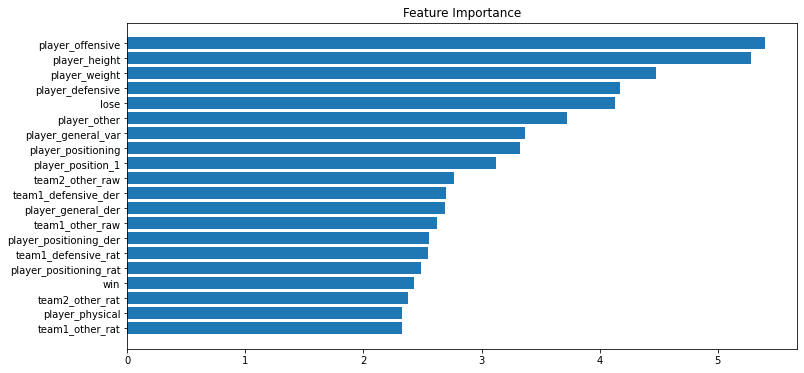

In [50]:
# Feature Importance

cb = CatBoostRegressor(depth = 10, iterations = 100, learning_rate = 0.1)
cb.fit(X, y)
feature_importance = cb.feature_importances_
sorted_idx = np.argsort(feature_importance)[-20:]

import matplotlib.pyplot as plt
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X.columns)[sorted_idx])
plt.title('Feature Importance')

#plt.barh(X.feature_names[feature_importance], rf.feature_importances_[feature_importance])
#plt.xlabel("Feature Importance")

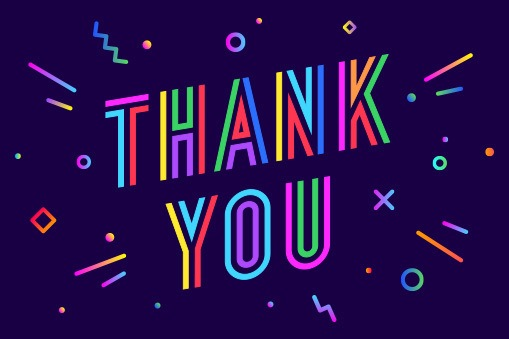

# All in one

In [ ]:
preprocessing_step = [
    #('ohec1', OneHotEncoderColumn('winner')),
    #('ohec2', OneHotEncoderColumn('team')),
    # ('remove_n_lines', FunctionSampler(func=remove_n_line, kw_args={'n': 5})),
    # ('abs', AbsValue())
    # ('log', LogValue()),
    #('minmax_dt', min_max_scaler_dt(X)),
    #('fs', SelectKBest(chi2, k=2))
    #('fs',  SelectKBest(f_regression))
]

pipe_dt_01 = Pipeline(preprocessing_step + [('dt', DecisionTreeRegressor())], verbose = False)
pipe_rf_01 = Pipeline(preprocessing_step + [('rf', RandomForestRegressor())], verbose = False)
pipe_xgb_01 = Pipeline(preprocessing_step + [('xgb', XGBRegressor())], verbose = False)
pipe_lgbm_01 = Pipeline(preprocessing_step + [('lgbm', LGBMRegressor())], verbose = False)
pipe_catboost_01 = Pipeline(preprocessing_step + [('cb', CatBoostRegressor())], verbose = False)

pipelines = {
    'pipe_dt': pipe_dt_01,
    'pipe_rf': pipe_rf_01,
    'pipe_xgb': pipe_xgb_01,
    'pipe_lgbm': pipe_lgbm_01,
    'pipe_catboost': pipe_catboost_01,
}

# https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter
metrics = [
    'neg_root_mean_squared_error',
    'r2'
]

params = {
    'pipe_dt': {
        #'fs__k': [5],
        'dt__min_samples_leaf': [1],
        'dt__max_depth': [3, 5, 10]
    },
    'pipe_rf': {
        #'fs__k': [5],
        'rf__n_estimators': [100, 200, 500],
        'rf__max_features': [0.33], 
        'rf__max_depth' : [3, 5, 10, 20]
    },
    'pipe_xgb': {
        #'fs__k': [5],
        'xgb__learning_rate': [0.01, 0.05,0.1,0.3],
        'xgb__max_depth': [6, 7, 10],
        'xgb__min_child_weight': [1, 3, 5],
        'xgb__subsample': [0.5, 0.7],
        'xgb__colsample_bytree': [0.5, 0.7],
        'xgb__n_estimators' : [100, 150, 200, 500]
    },
    'pipe_lgbm': {
        #'fs__k': [5],
        'lgbm__learning_rate' : [0.01,0.05,0.1,0.3,0.5],
        'lgbm__max_depth' : [2,4,6,8,10,12],
        'lgbm__num_leaves' : [25,50,100,200],
        'lgbm__reg_lambda' :[0.8], 
        'lgbm__reg_alpha' : [0.8],
        'lgbm__n_estimators' : [50,100,200,500,1000],
        'lgbm__subsample_freq' : [1,2,3,4]
    },
    'pipe_cb': {
        #'fs__k': [5],
        'cb__depth': [6,8,10],
        'cb__learning_rate' : [0.01, 0.05, 0.1],
        'cb__iterations'    : [30, 50, 100]
    }

}

judge = Judge()
judge.set_data(X, y)
judge.set_algorithms(pipelines)
judge.set_metrics(metrics)
judge.set_params(params)
judge.get_table()